<a href="https://colab.research.google.com/github/vgarcialopezm/ABC-SMC/blob/main/cancer_inference_ABCSMC_CN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import numpy as np
from scipy.stats import norm, uniform, multivariate_normal
from scipy.optimize import minimize
from scipy.special import logsumexp
import sys,ast
from math import exp
from math import log
from random import choices,seed,random
from tqdm import tqdm
#import p_tqdm
from functools import partial
import os
import matplotlib.pyplot as plt
from numpy import exp

epsilons=[400.0,350.0,300.0,250.0,200.0,150.0,125.0,115.0] #105.0] #,100.0,94.0,90.0,87.0]
#epsilons=[50000.0,40000.0,30000.0,25000.0,20000]
#epsilons=[16.0,12.0,11.8,11.3,10.6,7.1,5.2]


#PARAMETERS INVOLVED IN THE GLIOBLASTOMA MODEL

params_tumor = [ # list of parameters used in the glioblastoma model 
    {'name' : 'Dn', 'lower_limit':0.01,'upper_limit':10.0},# Population of cells Diffusion coefficient
    {'name' : 'Dc','lower_limit':10.0,'upper_limit':150.0},# Oxygen Diffusion coefficient 
    {'name' : 'am','lower_limit':20000.0,'upper_limit':29000.0},# term involved in the calculation of a(G1/S)
    {'name' : 'k1','lower_limit':0.0001,'upper_limit':10.0000}, #Oxygen consumption rate,
    {'name' : 'betaf','lower_limit':1.0,'upper_limit':50.0} #flow of oxygen at right boundary

]

<class 'list'>


Let's open the txt containing data about population cell on days three and six of the experiment

In [ ]:
handler=open('doblaredia3.txt')

In [ ]:
datos = np.loadtxt('doblaredia3.txt', delimiter=',')


In [ ]:
print(datos)

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

In [ ]:
datosdia6=np.loadtxt('datosdia6.txt', delimiter=',')


Let's determine the values of the parameters invoved in the calculation of $c_{cr}$. These have been obtained from the literature.

In [ ]:

taup=4800   #*deltat  #*deltat
beta1=2.5
a3H0=0.0085
d1=0.2
a0=0.45185
a1=0.51
a2=1
d2=0.1
e2f=1
#am=22446.951
beta=0.4980
#value of p6/p3 set to 1
p6p3=1
#c critico
# Calculate the value of c_cr using the parameters above and the expression given in the document
#ccr=1-1/beta1*np.log(1/a3H0*(a1+(a2*d2/d1*e2f)*(1-1/(1-a0))))
ccr=1.0-((1.0/beta1)*np.log((1/a3H0)*(a1+((a2*d2)/(d1*e2f))*(1-1/(1-a0/((p6p3)*(p6p3)))))));
#Calculate a(G1/S) using the parameter values above
# aG1S=am*(c/ccr-1)**(-beta)
#aG1S=2e+04
nu=0.00001097

#Let's apply Newton Raphson method in order to obtain the values of lambda given in the document (it will be named lam)
x0=0.001
max_iter=20
tolerance=0.000001

# #Expression of the function to obtain the value of lambda
# f=lambda lam:taup/2-(exp(-(lam+nu)*aG1S)/(lam+nu+1/taup))
  
# #Fist derivative of th previos function 
# Df=lambda lam:(exp(-(lam+nu)*aG1S)*(-aG1S*(lam+nu+1/taup)-1))/(lam+nu+1/taup)**2



Newton Raphson method used to obtain the value of $a_{G1/S}$


In [ ]:
def newton_raps(c,am,nu):
    #print('c',c)
    if c>ccr:
      aG1S=am*(c/ccr-1)**(-beta)
    else:
      aG1S=10000000
    #print(aG1S)
    #print('ag1s',aG1S)
    #Expression of the function to obtain the value of lambda
    f=lambda lam:log(taup)-log(2)+lam*aG1S+nu*aG1S+log(lam+nu+1/taup)
  
    #Fist derivative of th previos function 
    Df=lambda lam: aG1S+1/(lam+nu+1/taup)
    #tabla = []
    section = abs(2*tolerance)
    xi = x0
    while (section>=tolerance):
        xnew = xi - f(xi)/Df(xi)
        section  = abs(xnew-xi)
        #tabla.append([xi,xnew,section])
        xi = xnew
    return xi
#xi=newton_raps(c)


In [ ]:
def newton_rapsi(c,am,nu):
    #print('c',c)
        if c>ccr and c<0.78:
            aG1S=am*((c/ccr)-1)**(-beta)
        #else: 
        #  aG1S=10000000
            f=lambda lam:log(taup)-log(2)+lam*aG1S+nu*aG1S+log(lam+nu+1/taup)
  
    #Fist derivative of th previos function 
            Df=lambda lam: aG1S+1/(lam+nu+1/taup)
    #tabla = []
        
            
            section = abs(2*tolerance)
            xi = x0
            while (section>=tolerance):
                xnew = xi - f(xi)/Df(xi)
            #print('xi',xi)
                section  = abs(xnew-xi)
            #print('section',section)
        #tabla.append([xi,xnew,section])
                xi = xnew
        elif c>0.78:
           xi=ccr*c
        else:
            xi=-0.65
        return xi
#xi=newton_raps(c)


In [ ]:
#spatial grid
L=191
dx=0.4819 #0.4819 #J/(L)
J=dx*L
x_grid=np.linspace(0,J,L)
#time grid
T=3 #3 #final time (3 days)
N=1000 #300  #501  #NUMBER OF TIME STEPS
dt=T/(N) #time step (it is almost every 130 secs. 2 minutes approximately)
t_grid=np.linspace(0,T,N)
#k1=1.45773318
k2=0.0942
#c=0.1
#beta_f=49.33  #THIS PARAMETER IS GIVEN, IT IS NOT NECESSARY TO ESTIMATE IT

In [ ]:

x_grid

array([ 0.        ,  0.48443632,  0.96887263,  1.45330895,  1.93774526,
        2.42218158,  2.90661789,  3.39105421,  3.87549053,  4.35992684,
        4.84436316,  5.32879947,  5.81323579,  6.29767211,  6.78210842,
        7.26654474,  7.75098105,  8.23541737,  8.71985368,  9.20429   ,
        9.68872632, 10.17316263, 10.65759895, 11.14203526, 11.62647158,
       12.11090789, 12.59534421, 13.07978053, 13.56421684, 14.04865316,
       14.53308947, 15.01752579, 15.50196211, 15.98639842, 16.47083474,
       16.95527105, 17.43970737, 17.92414368, 18.40858   , 18.89301632,
       19.37745263, 19.86188895, 20.34632526, 20.83076158, 21.31519789,
       21.79963421, 22.28407053, 22.76850684, 23.25294316, 23.73737947,
       24.22181579, 24.70625211, 25.19068842, 25.67512474, 26.15956105,
       26.64399737, 27.12843368, 27.61287   , 28.09730632, 28.58174263,
       29.06617895, 29.55061526, 30.03505158, 30.51948789, 31.00392421,
       31.48836053, 31.97279684, 32.45723316, 32.94166947, 33.42

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

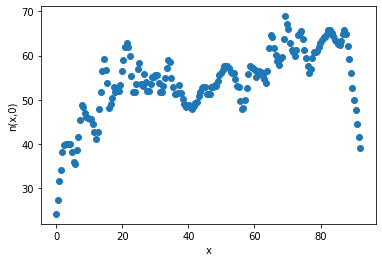

In [ ]:
#Initial value for population
#U = np.array([100 for i in range(0,L)])
U = datos #np.array([100 for i in range (0,L)])
#U = np.array([4259.0 for i in range(0,L)]) #lo que ha puedto pilar
print(U)

#c_est=np.array(D_c*beta_f/(J*(k1*U+k2)))
#c_est=D_c*beta_f/(L*(k1*np.mean(U)+k2))

#Initial value for oxygen concentration
#V = np.array([c_est for i in range (0,L)])


#graphic of the initial population and oxygen concentration
#fig,axs = plt.subplots(1)
#axs[0].plot(x_grid,U)
#axs[1].plot(x_grid,V,'o')
#axs[2].plot(x_grid,U,x_grid,V)
plt.plot(x_grid, U,'o')
plt.xlabel('x')
plt.ylabel('n(x,0)')
plt.show()
# plt.ylabel('population')
# 
# plt.plot(x_grid, V)
# plt.show()

#pyplot.plot(x_grid, U)
#pyplot.plot(x_grid, V)
#pyplot.show()


In [ ]:
fu=lambda lamda_vect, Ui: lamda_vect*Ui

#aux=np.zeros(L)
#aux[-1]= 4*dx*beta_f*sigma_v
#aux[0]= 4*dx*betaf*sigma_v
g=lambda Ui,Vi,k1: -k1*(Ui*Vi)-k2*Vi   #+aux

In [ ]:
def euler_expl(fu,g,betaf,Dn,Dc,a_m,U,L,k1):
    
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    #Initial value for oxygen concentration
    V = np.array([c_est for i in range (0,L)])
    sigma_u=Dn*dt/(dx**2)
    #print(sigma_u)
    sigma_v=Dc*dt/dx**2 #Dc*dt/(dx**2)
    #print(sigma_v)
    aux=np.zeros(L)
    aux[-1]= 2*dx*betaf*sigma_v
    #pob=np.zeros([N,L])
    #oxi=np.zeros([N,L])
    lamda_vect=np.zeros(L)
    #pob[0,:]=U
    #print(pob[0,:])
    #oxi[0,:]=V
    

    aux[-1]= 2.*dx*betaf*sigma_v
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2.*sigma_u], -1) +\
      np.diagflat([1.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    #print(A_n)

    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2.*sigma_v], -1) +\
      np.diagflat([1.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    #print(A_c)
    
    
    
    for ti in range(N):
        lamda_vect=np.zeros(L)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m)
            lamda_vect[i]=xi #np.longfloat(xi)
        #print(lamda_vect)
        #print('step',ti)
        rhsU=U+dt*fu(lamda_vect,U)
        U_new = np.linalg.solve(A_n, rhsU)
        #print('U',U_new)
        rhsV=V+dt*g(U,V,k1)  +aux
        V_new = np.linalg.solve(A_c,rhsV)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        V = V_new
        U = U_new
    
    return U,V 





Crank Nicolson method (*crank_nic*) to solve the system of equations of the glioblastoma model. It follows the matrix form that
 has been developed in the text.

In [ ]:
def crank_nic(fu,g,Dn,Dc,a_m,U,L,k1,betaf):
    sigma_u=Dn*dt/(dx**2)
    sigma_v=Dc*dt/(dx**2)

    #c_est: Initial value for oxygen concentration at every point on the spatial grid.
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    V = np.array([c_est for i in range (0,L)])
    #auxiliar vector used to define the Neumann boundary condition of the cell population
    aux=np.zeros(L)
    aux[-1]= 4*dx*betaf*sigma_v
    
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2*sigma_u], -1) +\
      np.diagflat([2.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    
    B_n = np.diagflat([sigma_u for i in range(L-2)]+[2.*sigma_u], -1) +\
      np.diagflat([2.-2.*sigma_u for i in range(L)]) +\
      np.diagflat([2.*sigma_u]+[sigma_u for i in range(L-2)], 1)
    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2*sigma_v], -1) +\
      np.diagflat([2.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    
    B_c = np.diagflat([sigma_v for i in range(L-2)]+[2.*sigma_v], -1) +\
      np.diagflat([2.-2.*sigma_v for i in range(L)]) +\
      np.diagflat([2.*sigma_v]+[sigma_v for i in range(L-2)], 1)
    
#At every time sstep we are going to obtain the lambda vector depending on the availability of oxygen. 
#With this new vector we solve the system and cells population and oxygen concentration are updated until they reach the final time.
    for ti in range(1,N):
        lamda_vect=np.zeros(L)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m,nu)
            lamda_vect[i]=xi #np.longfloat(xi)
        #print('step',ti)
        U_new = np.linalg.solve(A_n, (B_n @ U + dt*fu(lamda_vect,U)))
        V_new = np.linalg.solve(A_c, (B_c@V +dt*g(U,V,k1)+aux))
        lamda_vect=np.zeros(L)
        V = V_new
        #print(V_new)
        #for i in range(L):
        #    xi=newton_rapsi(V[i],a_m,nu)
        #    lamda_vect[i]=np.longfloat(xi)
        #print(lamda_vect)
        U = U_new
        #print(U_new)
    #print(V_new)
    return U,V 




In [ ]:
print(datosdia6)

[  9.363   9.363  10.17   10.179  10.179  10.179  10.179  10.179  10.179
  10.179  10.179  10.847  11.81   11.81   11.81   11.81   11.81   11.81
  11.81   11.81   11.811  11.81   11.81   11.81   11.81   11.811  11.81
  11.81   11.81   11.811  11.81   12.091  12.625  12.625  12.625  12.625
  13.097  13.441  13.989  14.256  14.881  15.072  15.072  15.811  15.887
  15.887  15.072  15.148  15.887  15.887  16.078  16.703  16.437  16.192
  16.703  17.084  17.519  17.976  18.334  18.334  18.334  18.334  18.334
  18.334  18.334  19.858  19.965  19.92   18.334  18.334  18.334  18.685
  19.965  19.965  19.965  20.293  21.147  21.596  21.596  21.596  21.596
  21.596  22.191  23.678  24.043  24.752  24.859  24.859  24.859  24.859
  24.943  25.674  25.835  26.688  27.305  27.855  28.937  28.586  28.121
  28.548  29.867  31.575  32.199  31.619  31.383  32.039  32.199  32.199
  30.658  31.376  32.292  34.645  34.645  34.645  35.013  36.277  35.757
  34.645  34.982  35.835  37.101  38.358  38.235  37.

# ABC-SMC 

Let's define all the necessary functions to apply the ABC-SMC method.

This first function is used to obtain the distance between real data and the data obtained after applying the algorithm. As it has bee stablished in the text, the ESS is used.

In [ ]:
def euc_dist(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        z=np.array((data1 - data2)**2)
        distance = np.sum(z)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    elif np.isnan(distance):
        distance=100000
        return distance
    else:
        return distance


In [ ]:
def euc_disti(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        distance = np.linalg.norm(data1 - data2)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    else:
        return distance


The $prior$ function generates a random value inside the limits stablished for every parameter involved in the model. The shape of the distribution can be changed if required.

In [ ]:
def prior():
### Generate a random parameter inside the limits stablished. The shape of the distribution can be changed if required
    prior = []
    for ipar,par in enumerate(params_tumor):
        prior.append(uniform.rvs(loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])) #par['upper_limit']))
        
       
    return prior


*Evaluate_ prev_ pru* function: Given a set of parameters (a particle), this function returns how probable is given the prior knowledge.
As the priors are uniform distributions, this means that it will return 0 when a parameter outside the prior range is tested. 

In [ ]:
#function that given the values of the parameters, calculates the 

def evaluate_prev_pru(params):
    print('parameters',params)
    prior = 1
    for ipar,par in enumerate(params_tumor):
        prior *= uniform.pdf(params[ipar],loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])
        if prior==0:
            break   
      #  print('params i', params[i])
       # print('prior',prior)
    return prior


The $perturb$ function is used for the following purpose: given a list of parameters sampled (a population), perturbs it by applying a multivariate normal kernel (this is the kernel choice, but other can be considered).

In [ ]:

def perturb(listaprev,s):
    #print(listaprev)
    lista=np.asarray(listaprev) #.tolist()
    #mean_vec=np.mean(lista)
    cov_matrix=2.0*np.cov(lista.T)  #the covariance matrix for the multivariate normal perturbation kernel is given by this expression
    kernel=multivariate_normal(cov=cov_matrix)
    pert=s+kernel.rvs() # here we obtain the list of perturbed parameters
    pertur=pert.tolist()
    return pertur


*Weighting function*: gives the denominator used to calculate the weights of every particle. 
After obtaining the weights, we normalize it by using the $normalize$ function

In [ ]:



#function that gives the denominator used to calculate the weights of every particle.
def weighting(i,j,N,sam,wei,sampre):
     denom=0
     #ker=1
     samprev=np.asarray(sampre)
     cov_matrix=2.0*np.cov(samprev.T)
     kernel=multivariate_normal(cov=cov_matrix)
     for k in range(N):
            #print('sample i j',type(sam[k]),sam[k])
           # print('sample i-1,j',type(sampre[k]),sampre[k])
            sampre[k]=np.array(sampre[k])
            
            ker=kernel.pdf(sam[j]-sampre[k])
            #print('ker',ker)
            #kerne=np.prod(ker)  #here we are obtaining the joint probability of the parameter vector obtained when applying the kernel
            denom+=wei[k]*ker #kerne
            #print('kernel',kernel.cdf(sam[k]-sampre[k]))
     #print('den',denom)      
     return denom


    


In [ ]:
#function used to normalize the weights
def normalize(wei):
    #normalized=wei/np.linalg.norm(wei)
    normalized=wei/np.sum(wei)
    return normalized  



# PRINCIPAL FUNCTION (ABC-SMC procedure)

Using all the functions defined above let's proceed with the ABC-SMC algorithm as it has been defined in the text. $principal function$ shows this whole procedure in order to do the inference of parameters involved in our model.

In [ ]:
def principal(epsilons,listaparametros,N,data1):
    T=len(epsilons)
    #Three matrices are created to save the weights, accepted distances and samples at every step. The dimension of the three are TxN
    #which is: "number of populations we want to obtain until reaching the target" x "number of time_steps".

    #weight matrix: it contains the value of the weight of all the particles
    weight=np.zeros((T,N),float)
    #dist matrix: it contains the value of the distance from the current data obtained with the particle of parameters 
    #inferred to the real data
    dist=np.zeros((T,N),float)
    #sample matrix: every row of this matrix contains N particles
    #(every position on the matrix is a particle: a set of all the parameters involved in the model)
    sample=np.zeros((T,N),list)
    #X0=[Ui,Vi]
    #t=np.linspace(0.,10,10)
    for i in range(T):
        count=0
        counti=0
        label=i
        print("SMC step with target distance: {}".format(epsilons[i]))
        #The first population is obtained from the prior.
        if i==0:
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    sample[i,j]=prior()
                    #sample[i,j]=np.array(prior())
                    sample[i,j]=np.asarray(sample[i,j])
                    print(sample[i,j][0])
                    print(sample[i,j][1])
                    print(sample[i,j][2])
                    print(sample[i,j][3])
                    print(sample[i,j][4])
                    #print(sample[i,j][5])
                    data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T#,sample[i,j][5])).T
                    print('oxigeno',data2[:,1])
                    data2=np.array(data2[:,0])
                    print('data2',data2)
                    print('data1',data1)
                    #print('data2',data2)
                    #data2=np.array(data2, dtype=np.float64)
                    dist[i,j]=euc_disti(data1,data2)
                    print('distcondata2',dist[i,j])
                    plt.plot(x_grid,datosdia6,'o')
                    plt.plot(x_grid,data2)
                    plt.xlabel('x')
                    plt.ylabel('n(x,T)')
                    plt.show()
                count+=1
                print(count)
       
        else:
        
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    seed()
                    np.random.seed()
                    choose = choices(sample[i-1,:], weights = weight[i-1,:],k=1)[0] # select a point from the previous sample
                    sample[i,j]=choose
                    #print("before perturb",type(sample[i,j]))
                    #print("before perturb",list(sample[i-1,:]))
                    sample[i,j] = perturb(list(sample[i-1,:]),sample[i,j]) # and perturb it
                    print("after perturb", sample[i,j])
                    #print("after perturb", type(sample[i,j]))
                    evaluation=evaluate_prev_pru(sample[i,j]) 
                    if evaluation>0:
                        data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T #,sample[i,j][5])).T
                        print('oxigeno',data2[:,1])
                        data2=np.array(data2[:,0])
                        print('data2',data2)
                        print('data1',data1)
                        dist[i,j]=euc_disti(data1,data2)
                        print('distendata2',dist[i,j])
                        plt.plot(x_grid,datosdia6,'o')
                        plt.plot(x_grid,data2)
                        plt.xlabel('x')
                        plt.ylabel('n(x,T)')
                        plt.show()
                counti+=1
                print(counti)
        #Assignment of weights:
        for j in range(N):
            #In the first population all the weights are set to 1.
            if i==0:
                weight[i,j]=1
               # print(weight[i,j])
            elif i==T-1:
              break
            else:
                denom=weighting(i,j,N,sample[i,:],weight[i-1,:],list(sample[i-1,:]))
                weight[i,j]=evaluate_prev_pru(sample[i,j])/denom
        #print('weight[i,:]',weight[i,:])
        if i!=0:
           weight[i,:]=normalize(weight[i,:])
           #print('weight[i,:] normalized',weight[i,:])  
    #print('sample',sample[T-1,N-1])
    #print('weight',weight[T-1])
    #print('dist',dist[T-1])
    return sample, weight, dist,data2


Now, let's apply the ABC-SMC method. The vector of tolerance (distances), the parameters involved, the number of particles we want to get at every population (20 in this case) and the target data we want to reach after the inference procedure are given to the function.

SMC step with target distance: 400.0
1.4876040113415552
84.34554313691304
24437.29656443957
6.1799696307414145
31.688467172317594
oxigeno [8.91724428e-36 9.55928727e-36 1.15791517e-35 1.52727716e-35
 2.11849148e-35 3.01955019e-35 4.36600755e-35 6.36281002e-35
 9.31761876e-35 1.36913331e-34 2.01745420e-34 2.98032077e-34
 4.41338443e-34 6.55090389e-34 9.74602884e-34 1.45319726e-33
 2.17149949e-33 3.25158920e-33 4.87855917e-33 7.33342079e-33
 1.10434256e-32 1.66591908e-32 2.51731808e-32 3.81021407e-32
 5.77685932e-32 8.77359872e-32 1.33482371e-31 2.03444560e-31
 3.10638070e-31 4.75172323e-31 7.28159050e-31 1.11779109e-30
 1.71880703e-30 2.64724581e-30 4.08347961e-30 6.30821895e-30
 9.75886635e-30 1.51178045e-29 2.34507964e-29 3.64239629e-29
 5.66438218e-29 8.81897333e-29 1.37446604e-28 2.14405234e-28
 3.34689638e-28 5.22712614e-28 8.16579999e-28 1.27570262e-27
 1.99259825e-27 3.11117531e-27 4.85504260e-27 7.57132782e-27
 1.17984894e-26 1.83712529e-26 2.85829974e-26 4.44370612e-26
 6.90356

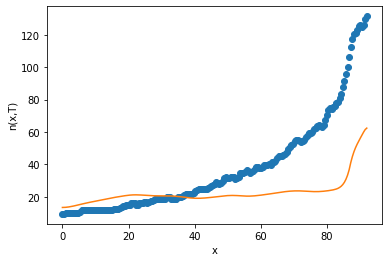

1
1.2130492448845138
86.40877793426043
27617.335289381714
6.677209623627111
28.192172517295205
oxigeno [1.21212229e-36 1.30214633e-36 1.58583145e-36 2.10625830e-36
 2.94308483e-36 4.22574747e-36 6.15503927e-36 9.03683311e-36
 1.33339035e-35 1.97451065e-35 2.93262310e-35 4.36745865e-35
 6.52112719e-35 9.76132638e-35 1.46475290e-34 2.20324082e-34
 3.32173075e-34 5.01906678e-34 7.59940198e-34 1.15284674e-33
 1.75202785e-33 2.66711241e-33 4.06672839e-33 6.21080737e-33
 9.50096876e-33 1.45592807e-32 2.23515727e-32 3.43806749e-32
 5.29893641e-32 8.18353841e-32 1.26636452e-31 1.96339315e-31
 3.04956054e-31 4.74452765e-31 7.39302501e-31 1.15367655e-30
 1.80282626e-30 2.82112783e-30 4.42072140e-30 6.93697944e-30
 1.09006607e-29 1.71522773e-29 2.70230575e-29 4.26206824e-29
 6.72794585e-29 1.06268040e-28 1.67899965e-28 2.65273676e-28
 4.18995888e-28 6.61441125e-28 1.04341140e-27 1.64454684e-27
 2.58959937e-27 4.07387240e-27 6.40299211e-27 1.00550898e-26
 1.57780348e-26 2.47414944e-26 3.87747652e-

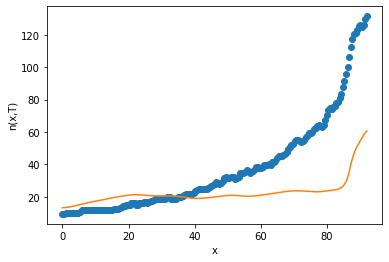

2
2.948367049530981
63.985361248453096
26097.732109695484
8.889821494259465
9.746065182503031
oxigeno [5.35323140e-49 6.09843756e-49 8.54208946e-49 1.33677491e-48
 2.19305267e-48 3.66479985e-48 6.17031191e-48 1.04271419e-47
 1.76646535e-47 2.99918132e-47 5.10344824e-47 8.70420737e-47
 1.48813855e-46 2.55060171e-46 4.38281703e-46 7.55077826e-46
 1.30426344e-45 2.25878358e-45 3.92206401e-45 6.82773569e-45
 1.19165187e-44 2.08506715e-44 3.65742359e-44 6.43134017e-44
 1.13366609e-43 2.00314641e-43 3.54789056e-43 6.29858746e-43
 1.12076829e-42 1.99880701e-42 3.57263563e-42 6.39951792e-42
 1.14873869e-41 2.06624605e-41 3.72389294e-41 6.72403872e-41
 1.21629883e-40 2.20385056e-40 3.99950162e-40 7.26870464e-40
 1.32274666e-39 2.40991570e-39 4.39507232e-39 8.02231897e-39
 1.46532014e-38 2.67788681e-38 4.89562575e-38 8.95183164e-38
 1.63696101e-37 2.99314319e-37 5.47174063e-37 9.99966644e-37
 1.82670451e-36 3.33535836e-36 6.08673641e-36 1.11014035e-35
 2.02354431e-35 3.68624602e-35 6.71107386e-3

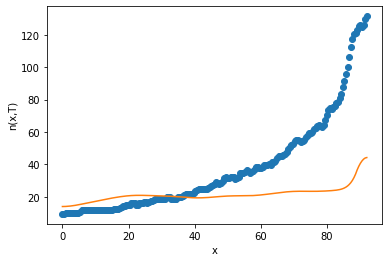

7.46077740652346
86.02539443844202
26967.22192066648
7.32662651459767
35.74762173966119
oxigeno [2.38974139e-38 2.60411240e-38 3.28570911e-38 4.55700748e-38
 6.64687075e-38 9.93253223e-38 1.50091042e-37 2.27998261e-37
 3.47281443e-37 5.29847742e-37 8.09415743e-37 1.23793161e-36
 1.89552687e-36 2.90599484e-36 4.46088197e-36 6.85704997e-36
 1.05553363e-35 1.62723122e-35 2.51240402e-35 3.88516558e-35
 6.01758851e-35 9.33550315e-35 1.45064484e-34 2.25784963e-34
 3.51996751e-34 5.49652357e-34 8.59679310e-34 1.34671026e-33
 2.11294860e-33 3.32021398e-33 5.22502775e-33 8.23450277e-33
 1.29954488e-32 2.05365435e-32 3.24953286e-32 5.14808677e-32
 8.16534590e-32 1.29651748e-31 2.06076015e-31 3.27862054e-31
 5.22081339e-31 8.32025519e-31 1.32694955e-30 2.11767415e-30
 3.38157104e-30 5.40257048e-30 8.63521526e-30 1.38071952e-29
 2.20834422e-29 3.53286713e-29 5.65272965e-29 9.04548086e-29
 1.44750773e-28 2.31632953e-28 3.70634346e-28 5.92971410e-28
 9.48511971e-28 1.51688388e-27 2.42517515e-27 3.87

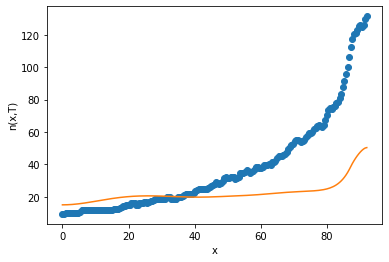

3
3.956124206683171
12.62740738232031
23777.637841064505
5.96789737802555
27.379270856235873
oxigeno [1.42857541e-91 2.31447759e-91 6.06872740e-91 1.73404080e-90
 5.01033255e-90 1.45049458e-89 4.20406186e-89 1.22016137e-88
 3.54725462e-88 1.03328130e-87 3.01652076e-87 8.82777616e-87
 2.59020768e-86 7.62119365e-86 2.24889945e-85 6.65605494e-85
 1.97603062e-84 5.88465023e-84 1.75796276e-83 5.26823706e-83
 1.58374803e-82 4.77601248e-82 1.44474967e-81 4.38382430e-81
 1.33422629e-80 4.07287617e-80 1.24693843e-79 3.82855413e-79
 1.17880349e-78 3.63942241e-78 1.12660577e-77 3.49639141e-77
 1.08775872e-76 3.39203971e-76 1.06011195e-75 3.32006597e-75
 1.04179595e-74 3.27485082e-74 1.03109950e-73 3.25111893e-73
 1.02637869e-72 3.24370289e-72 1.02599938e-71 3.24741882e-71
 1.02831691e-70 3.25706364e-70 1.03169463e-69 3.26753232e-69
 1.03455757e-68 3.27403096e-68 1.03546959e-67 3.27233561e-67
 1.03321437e-66 3.25902816e-66 1.02685814e-65 3.23164180e-65
 1.01577551e-64 3.18867337e-64 9.99631378e-64

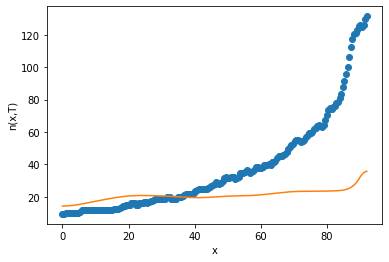

3.594456844719677
52.27657931327797
26436.142016197184
8.500083202979779
32.40219575438479
oxigeno [8.38690546e-53 9.79853434e-53 1.45090811e-52 2.41083681e-52
 4.18461827e-52 7.37536599e-52 1.30738397e-51 2.32402928e-51
 4.13964578e-51 7.38796456e-51 1.32119785e-50 2.36783754e-50
 4.25337652e-50 7.65881814e-50 1.38252732e-49 2.50206180e-49
 4.53998285e-49 8.25950769e-49 1.50661871e-48 2.75551006e-48
 5.05296249e-48 9.29026779e-48 1.71253135e-47 3.16493625e-47
 5.86399828e-47 1.08920573e-46 2.02813339e-46 3.78560543e-46
 7.08282257e-46 1.32827338e-45 2.49663024e-45 4.70304907e-45
 8.87836901e-45 1.67950709e-44 3.18337989e-44 6.04522309e-44
 1.15002907e-43 2.19143916e-43 4.18236378e-43 7.99337235e-43
 1.52966003e-42 2.93058548e-42 5.62010235e-42 1.07869504e-41
 2.07181695e-41 3.98140373e-41 7.65399767e-41 1.47178731e-40
 2.83039413e-40 5.44300138e-40 1.04657154e-39 2.01183762e-39
 3.86607886e-39 7.42622855e-39 1.42579623e-38 2.73599474e-38
 5.24715152e-38 1.00570013e-37 1.92636774e-37 3

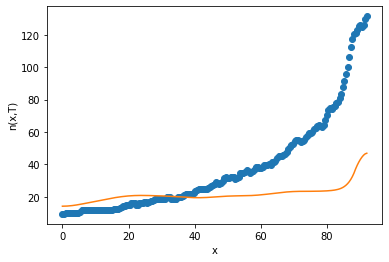

0.04650369434371119
64.54576743641528
24824.501252947724
1.5696438502671979
41.44095577358055
oxigeno [8.13165957e-22 8.34441971e-22 9.00693376e-22 1.01836840e-21
 1.19746986e-21 1.45242389e-21 1.80197012e-21 2.26988667e-21
 2.88691800e-21 3.69283577e-21 4.73781765e-21 6.08270134e-21
 7.80393704e-21 1.00082030e-20 1.28516109e-20 1.65536189e-20
 2.14144916e-20 2.78240516e-20 3.62568154e-20 4.72984764e-20
 6.17010812e-20 8.04507794e-20 1.04827474e-19 1.36470549e-19
 1.77417524e-19 2.30210071e-19 2.98241804e-19 3.86497197e-19
 5.02386851e-19 6.56258329e-19 8.62171085e-19 1.13789940e-18
 1.50430068e-18 1.98602222e-18 2.61360835e-18 3.43100841e-18
 4.50032635e-18 5.90474725e-18 7.74989309e-18 1.01745869e-17
 1.33632749e-17 1.75732591e-17 2.31675045e-17 3.06449233e-17
 4.06775472e-17 5.41308011e-17 7.20861294e-17 9.58620436e-17
 1.27045536e-16 1.67689890e-16 2.20709793e-16 2.90285717e-16
 3.82162683e-16 5.03507627e-16 6.62831587e-16 8.71605130e-16
 1.14548876e-15 1.50392864e-15 1.97165904e-1

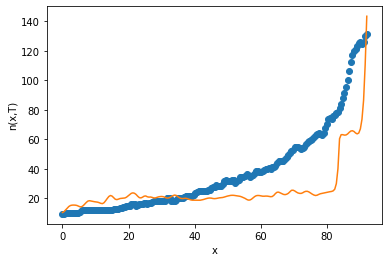

4
8.21195485387243
25.507498915365105
27449.83437480774
8.612186238552182
25.023648418382084
oxigeno [7.23104205e-76 1.00733026e-75 2.08310363e-75 4.79517979e-75
 1.12751487e-74 2.66232772e-74 6.29434200e-74 1.48949210e-73
 3.52835888e-73 8.36822446e-73 1.98747106e-72 4.72772226e-72
 1.12656947e-71 2.68957810e-71 6.43412611e-71 1.54250617e-70
 3.70631589e-70 8.92639128e-70 2.15506672e-69 5.21583484e-69
 1.26556959e-68 3.07866223e-68 7.50863047e-68 1.83605341e-67
 4.50125477e-67 1.10636449e-66 2.72625803e-66 6.73477179e-66
 1.66780295e-65 4.14006477e-65 1.03010351e-64 2.56881690e-64
 6.41989475e-64 1.60777788e-63 4.03446299e-63 1.01429121e-62
 2.55452600e-62 6.44436813e-62 1.62825598e-61 4.11989357e-61
 1.04380143e-60 2.64767816e-60 6.72317283e-60 1.70880025e-59
 4.34672835e-59 1.10645676e-58 2.81808632e-58 7.18075338e-58
 1.83033514e-57 4.66644727e-57 1.18984097e-56 3.03383210e-56
 7.73480204e-56 1.97159958e-55 5.02410650e-55 1.27976531e-54
 3.25833748e-54 8.29126930e-54 2.10849402e-53

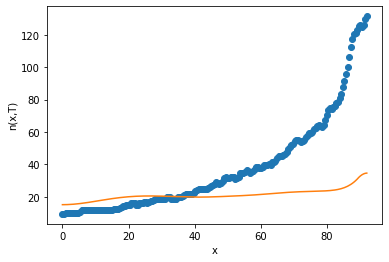

8.929796533767552
61.46384516160158
24383.608367833327
8.322868083504675
26.048275302152007
oxigeno [2.75080861e-48 3.15394742e-48 4.48144460e-48 7.12240930e-48
 1.18520392e-47 2.00614573e-47 3.41716545e-47 5.83569959e-47
 9.97987811e-47 1.70853164e-46 2.92802243e-46 5.02353053e-46
 8.62915815e-46 1.48421038e-45 2.55641231e-45 4.40972992e-45
 7.61854461e-45 1.31837842e-44 2.28528877e-44 3.96821938e-44
 6.90272116e-44 1.20289420e-43 2.10002927e-43 3.67298006e-43
 6.43587869e-43 1.12977078e-42 1.98682570e-42 3.50031084e-42
 6.17757835e-42 1.09214227e-41 1.93406590e-41 3.43062846e-41
 6.09485558e-41 1.08446434e-40 1.93242271e-40 3.44822117e-40
 6.16117857e-40 1.10224060e-39 1.97424026e-39 3.53997907e-39
 6.35395011e-39 1.14154771e-38 2.05265445e-38 3.69379907e-38
 6.65166597e-38 1.19853735e-37 2.16073355e-37 3.89712510e-37
 7.03147670e-37 1.26903649e-36 2.29083713e-36 4.13594717e-36
 7.46767860e-36 1.34833086e-35 2.43432828e-35 4.39447023e-35
 7.93145541e-35 1.43117883e-34 2.58170563e-34 

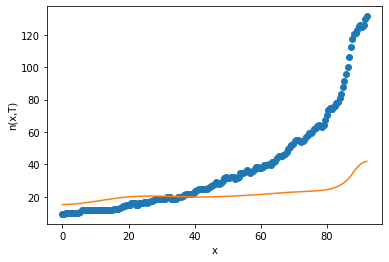

4.343582984690969
148.3087850748328
28422.966613109507
4.631891185570723
13.20907178259396
oxigeno [1.60877848e-23 1.65983733e-23 1.81629051e-23 2.08819378e-23
 2.49307637e-23 3.05715554e-23 3.81716203e-23 4.82291336e-23
 6.14082838e-23 7.85864925e-23 1.00917300e-22 1.29913729e-22
 1.67558557e-22 2.16450033e-22 2.79994431e-22 3.62660571e-22
 4.70316427e-22 6.10674658e-22 7.93882751e-22 1.03330539e-21
 1.34656255e-21 1.75690799e-21 2.29506143e-21 3.00164531e-21
 3.93042849e-21 5.15264650e-21 6.76275986e-21 8.88613315e-21
 1.16892809e-20 1.53935441e-20 2.02933532e-20 2.67806213e-20
 3.53773345e-20 4.67790976e-20 6.19133212e-20 8.20169742e-20
 1.08740468e-19 1.44286432e-19 1.91595070e-19 2.54591638e-19
 3.38516795e-19 4.50367385e-19 5.99484358e-19 7.98336624e-19
 1.06356570e-18 1.41737733e-18 1.88939459e-18 2.51912443e-18
 3.35923952e-18 4.47994330e-18 5.97477338e-18 7.96831490e-18
 1.06264485e-17 1.41699617e-17 1.88926195e-17 2.51851494e-17
 3.35670600e-17 4.47288381e-17 5.95878806e-17 7

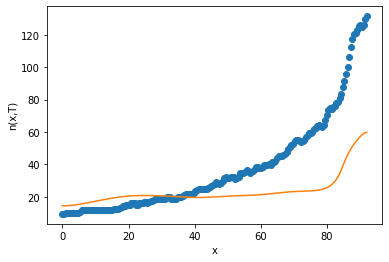

5
8.898378684142923
28.137354859652365
25268.556050569023
7.167903481301637
10.527987797096083
oxigeno [5.31228586e-67 6.93201487e-67 1.27770497e-66 2.64062923e-66
 5.61248339e-66 1.20064687e-65 2.57304997e-65 5.51910902e-65
 1.18482217e-64 2.54596314e-64 5.47684450e-64 1.17964742e-63
 2.54435668e-63 5.49621319e-63 1.18921358e-62 2.57758284e-62
 5.59709167e-62 1.21771164e-61 2.65453633e-61 5.79855416e-61
 1.26927884e-60 2.78429335e-60 6.12072599e-60 1.34842080e-59
 2.97702456e-59 6.58672189e-59 1.46041868e-58 3.24484345e-58
 7.22440014e-58 1.61168913e-57 3.60253834e-57 8.06783630e-57
 1.81007710e-56 4.06814430e-56 9.15841348e-56 2.06505654e-55
 4.66329306e-55 1.05453772e-54 2.38780206e-54 5.41325255e-54
 1.22856469e-53 2.79108366e-53 6.34654835e-53 1.44426483e-52
 3.28893393e-52 7.49406218e-52 1.70839552e-51 3.89604794e-51
 8.88753699e-51 2.02776339e-50 4.62690330e-50 1.05574895e-49
 2.40873572e-49 5.49463116e-49 1.25306341e-48 2.85665994e-48
 6.50972494e-48 1.48270496e-47 3.37525132e-

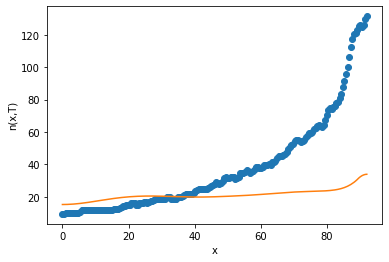

4.529939173013226
102.04565284351477
24339.96416231655
2.7141574959632218
20.552348689855247
oxigeno [4.15473198e-22 4.27956370e-22 4.66160884e-22 5.32400378e-22
 6.30696425e-22 7.67038802e-22 9.49774761e-22 1.19015435e-21
 1.50306980e-21 1.90804080e-21 2.43051492e-21 3.10357521e-21
 3.97017644e-21 5.08606978e-21 6.52362637e-21 8.37683624e-21
 1.07678462e-20 1.38555149e-20 1.78466141e-20 2.30105042e-20
 2.96983746e-20 3.83684854e-20 4.96193022e-20 6.42330208e-20
 8.32327702e-20 1.07957833e-19 1.40162603e-19 1.82146829e-19
 2.36927087e-19 3.08462613e-19 4.01952774e-19 5.24228987e-19
 6.84271090e-19 8.93887717e-19 1.16861270e-18 1.52888598e-18
 2.00160893e-18 2.62219254e-18 3.43725358e-18 4.50816271e-18
 5.91571200e-18 7.76625244e-18 1.01997610e-17 1.34004393e-17
 1.76106318e-17 2.31490958e-17 3.04349722e-17 4.00192236e-17
 5.26258470e-17 6.92058808e-17 9.10081466e-17 1.19671878e-16
 1.57347962e-16 2.06857564e-16 2.71899587e-16 3.57321893e-16
 4.69475706e-16 6.16678532e-16 8.09818497e-16

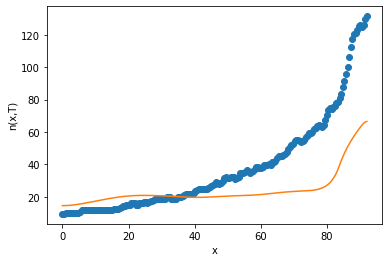

6
2.9148714566746183
23.333228284443358
28674.95217141624
6.131382278405803
1.220415922287565
oxigeno [2.34114768e-69 3.07438404e-69 5.73289232e-69 1.19823418e-68
 2.57481973e-68 5.57083974e-68 1.20835627e-67 2.62593611e-67
 5.71779132e-67 1.24773489e-66 2.72934114e-66 5.98564782e-66
 1.31626011e-65 2.90263728e-65 6.41938076e-65 1.42383371e-64
 3.16736008e-64 7.06652561e-64 1.58116493e-63 3.54813006e-63
 7.98470627e-63 1.80193908e-62 4.07781291e-62 9.25347512e-62
 2.10551005e-61 4.80362599e-61 1.09881502e-60 2.52003574e-60
 5.79424846e-60 1.33559624e-59 3.08615273e-59 7.14820234e-59
 1.65952018e-58 3.86135013e-58 9.00381609e-58 2.10377605e-57
 4.92500929e-57 1.15502861e-56 2.71327755e-56 6.38327135e-56
 1.50371728e-55 3.54636871e-55 8.37168659e-55 1.97772798e-54
 4.67472110e-54 1.10532730e-53 2.61386901e-53 6.18086448e-53
 1.46119009e-52 3.45288803e-52 8.15475195e-52 1.92457493e-51
 4.53845298e-51 1.06928376e-50 2.51688375e-50 5.91834630e-50
 1.39025511e-49 3.26243461e-49 7.64791869e-4

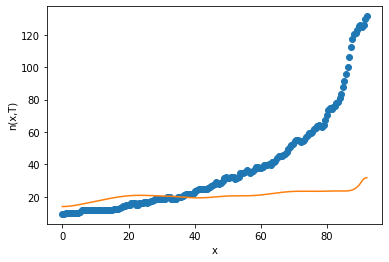

5.217427883518686
138.20466561560954
24399.208100994227
9.090223875921001
13.466514883835874
oxigeno [1.46331310e-33 1.55696233e-33 1.84995555e-33 2.38003345e-33
 3.21566938e-33 4.46524795e-33 6.29168066e-33 8.93453425e-33
 1.27428378e-32 1.82233006e-32 2.61109539e-32 3.74725848e-32
 5.38582716e-32 7.75236519e-32 1.11756402e-31 1.61356519e-31
 2.33343984e-31 3.38003054e-31 4.90425765e-31 7.12796687e-31
 1.03778001e-30 1.51354803e-30 2.21125698e-30 3.23617639e-30
 4.74427921e-30 6.96700281e-30 1.02482494e-29 1.50997378e-29
 2.22838966e-29 3.29381236e-29 4.87612260e-29 7.22933869e-29
 1.07336893e-28 1.59588811e-28 2.37592942e-28 3.54172870e-28
 5.28590133e-28 7.89795454e-28 1.18132781e-27 1.76869770e-27
 2.65051517e-27 3.97526214e-27 5.96657032e-27 8.96131375e-27
 1.34670022e-26 2.02482358e-26 3.04569006e-26 4.58281778e-26
 6.89755333e-26 1.03834512e-25 1.56330140e-25 2.35380188e-25
 3.54402684e-25 5.33580084e-25 8.03258348e-25 1.20904733e-24
 1.81947027e-24 2.73743039e-24 4.11739038e-24

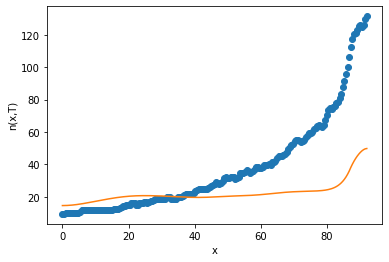

7
8.378121704880709
32.759219363252015
24806.0665604847
2.2985054313710895
2.1813032162673904
oxigeno [4.39294495e-38 4.84263217e-38 6.28327078e-38 9.00832078e-38
 1.35731921e-37 2.09091039e-37 3.25143980e-37 5.07631813e-37
 7.93958573e-37 1.24294550e-36 1.94706928e-36 3.05177581e-36
 4.78597730e-36 7.51024729e-36 1.17930544e-35 1.85314630e-35
 2.91424233e-35 4.58662295e-35 7.22483763e-35 1.13905412e-34
 1.79743278e-34 2.83897207e-34 4.48823150e-34 7.10228324e-34
 1.12494117e-33 1.78348240e-33 2.83015916e-33 4.49520579e-33
 7.14622347e-33 1.13705527e-32 1.81072445e-32 2.88585901e-32
 4.60292985e-32 7.34705329e-32 1.17352773e-31 1.87566547e-31
 2.99970610e-31 4.80000623e-31 7.68461849e-31 1.23082748e-30
 1.97216292e-30 3.16107698e-30 5.06815241e-30 8.12759457e-30
 1.30360968e-29 2.09113364e-29 3.35459689e-29 5.38144881e-29
 8.63246436e-29 1.38459888e-28 2.22046660e-28 3.56019479e-28
 5.70678391e-28 9.14485776e-28 1.46490988e-27 2.34571234e-27
 3.75448951e-27 6.00651696e-27 9.60449546e-2

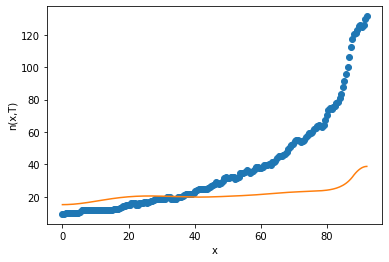

0.8888875916897532
117.35574982863614
26026.7967931398
6.831696126103393
3.129695503267163
oxigeno [3.34851477e-32 3.52782768e-32 4.08577143e-32 5.08493241e-32
 6.63848610e-32 8.92457179e-32 1.22087593e-31 1.68774188e-31
 2.34863634e-31 3.28314032e-31 4.60507568e-31 6.47740138e-31
 9.13390667e-31 1.29107841e-30 1.82924778e-30 2.59780464e-30
 3.69769067e-30 5.27466581e-30 7.53914023e-30 1.07947659e-29
 1.54798336e-29 2.22275758e-29 3.19546101e-29 4.59914712e-29
 6.62761353e-29 9.56415536e-29 1.38242732e-28 2.00189689e-28
 2.90482512e-28 4.22388298e-28 6.15464270e-28 8.98528668e-28
 1.31402989e-27 1.92449360e-27 2.82208023e-27 4.14282449e-27
 6.08794275e-27 8.95580980e-27 1.31899993e-26 1.94513982e-26
 2.87261925e-26 4.24869716e-26 6.29320406e-26 9.33393400e-26
 1.38587839e-25 2.05923470e-25 3.06082552e-25 4.54939125e-25
 6.75922068e-25 1.00356553e-24 1.48872901e-24 2.20627679e-24
 3.26637703e-24 4.83112545e-24 7.13900134e-24 1.05408496e-23
 1.55528354e-23 2.29344031e-23 3.38030772e-23 4

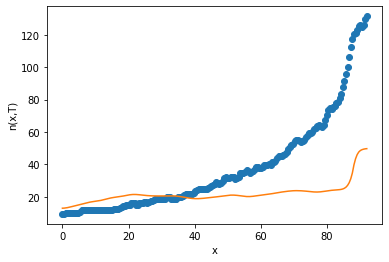

4.5522649074320904
57.364302439781554
23221.530932936894
3.494403778891055
6.564522602081434
oxigeno [6.83801310e-34 7.33124054e-34 8.88205998e-34 1.17143949e-33
 1.62381063e-33 2.31098873e-33 3.33313085e-33 4.83992436e-33
 7.05321746e-33 1.03007968e-32 1.50666610e-32 2.20658073e-32
 3.23555400e-32 4.75013024e-32 6.98240302e-32 1.02769573e-31
 1.51461140e-31 2.23526507e-31 3.30338236e-31 4.88875427e-31
 7.24521927e-31 1.07527704e-30 1.59809909e-30 2.37847291e-30
 3.54485524e-30 5.29050733e-30 7.90652488e-30 1.18318537e-29
 1.77290913e-29 2.65994580e-29 3.99573045e-29 6.00951537e-29
 9.04864720e-29 1.36398032e-28 2.05821297e-28 3.10889447e-28
 4.70033748e-28 7.11265411e-28 1.07717061e-27 1.63251259e-27
 2.47580025e-27 3.75688925e-27 5.70375453e-27 8.66319976e-27
 1.31627360e-26 2.00045981e-26 3.04085237e-26 4.62284823e-26
 7.02814836e-26 1.06846164e-25 1.62418396e-25 2.46855791e-25
 3.75110258e-25 5.69849254e-25 8.65419283e-25 1.31383537e-24
 1.99382660e-24 3.02448855e-24 4.58587559e-24

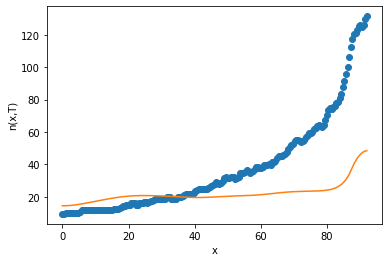

4.2837479123042455
109.75161534066359
20694.109758010618
2.0854298656078045
48.630817391947545
oxigeno [8.92669244e-19 9.12188400e-19 9.71608110e-19 1.07355660e-18
 1.22255476e-18 1.42523448e-18 1.69066004e-18 2.03076911e-18
 2.46095632e-18 3.00082981e-18 3.67518029e-18 4.51521358e-18
 5.56011147e-18 6.85900375e-18 8.47345630e-18 1.04806082e-17
 1.29771271e-17 1.60841952e-17 1.99537985e-17 2.47766605e-17
 3.07922560e-17 3.83014550e-17 4.76824956e-17 5.94111694e-17
 7.40863410e-17 9.24622206e-17 1.15489190e-16 1.44365460e-16
 1.80602438e-16 2.26107464e-16 2.83288520e-16 3.55186750e-16
 4.45644151e-16 5.59515743e-16 7.02937942e-16 8.83667912e-16
 1.11151254e-15 1.39887045e-15 1.76141659e-15 2.21896639e-15
 2.79656623e-15 3.52586853e-15 4.44686522e-15 5.61007161e-15
 7.07927657e-15 8.93500429e-15 1.12788699e-14 1.42390576e-14
 1.79772082e-14 2.26970758e-14 2.86554048e-14 3.61755914e-14
 4.56648401e-14 5.76356996e-14 7.27330886e-14 9.17681995e-14
 1.15761013e-13 1.45993589e-13 1.84076827e-

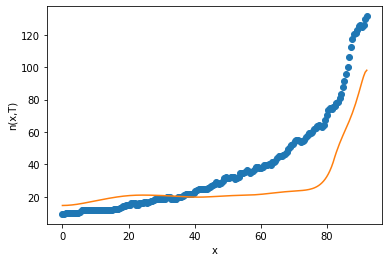

8
9.586781658769743
130.163982399226
22661.967240316968
3.0993260415157917
22.375463688710592
oxigeno [9.78625171e-21 1.00491202e-20 1.08518788e-20 1.22377820e-20
 1.42816166e-20 1.70939159e-20 2.08272068e-20 2.56846652e-20
 3.19317017e-20 3.99111760e-20 5.00631639e-20 6.29504841e-20
 7.92915473e-20 1.00002554e-19 1.26251650e-19 1.59528420e-19
 2.01733044e-19 2.55290743e-19 3.23298716e-19 4.09714873e-19
 5.19600392e-19 6.59431550e-19 8.37500817e-19 1.06443298e-18
 1.35384950e-18 1.72322410e-18 2.19498480e-18 2.79793401e-18
 3.56907873e-18 4.55599004e-18 5.81984527e-18 7.43935108e-18
 9.51580305e-18 1.21796115e-17 1.55987189e-17 1.99894564e-17
 2.56305479e-17 3.28811703e-17 4.22042443e-17 5.41964679e-17
 6.96270356e-17 8.94875504e-17 1.15056348e-16 1.47981377e-16
 1.90386964e-16 2.45011308e-16 3.15383497e-16 4.06051344e-16
 5.22874536e-16 6.73401696e-16 8.67355214e-16 1.11725443e-15
 1.43921640e-15 1.85398435e-15 2.38824833e-15 3.07634016e-15
 3.96240823e-15 5.10320673e-15 6.57167191e-1

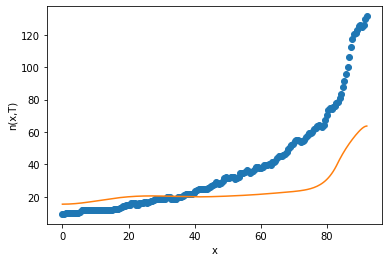

9
2.0855124112740393
81.82843579812582
25337.23572067991
5.565411017372501
2.2864806915882046
oxigeno [3.08959669e-35 3.30395903e-35 3.97705854e-35 5.20338170e-35
 7.15593788e-35 1.01121294e-34 1.44955488e-34 2.09403721e-34
 3.03886874e-34 4.42364880e-34 6.45520920e-34 9.44027771e-34
 1.38343523e-33 2.03149036e-33 2.98911460e-33 4.40688580e-33
 6.50981955e-33 9.63468223e-33 1.42862575e-32 2.12223270e-32
 3.15822287e-32 4.70816622e-32 7.03083727e-32 1.05171688e-31
 1.57587045e-31 2.36519911e-31 3.55580014e-31 5.35459186e-31
 8.07663758e-31 1.22023548e-30 1.84652990e-30 2.79870008e-30
 4.24842809e-30 6.45882914e-30 9.83359061e-30 1.49927103e-29
 2.28892982e-29 3.49897734e-29 5.35519103e-29 8.20538364e-29
 1.25855736e-28 1.93219954e-28 2.96882492e-28 4.56471843e-28
 7.02228444e-28 1.08071826e-27 1.66360077e-27 2.56107122e-27
 3.94245128e-27 6.06770551e-27 9.33565131e-27 1.43576683e-26
 2.20703520e-26 3.39076439e-26 5.20637853e-26 7.98949686e-26
 1.22532767e-25 1.87820900e-25 2.87745538e-2

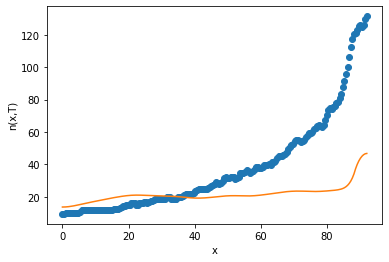

9.899872751683468
10.735060092773521
26896.134022313927
5.228929860969261
14.16063305751146
oxigeno [3.13696779e-94 5.28423793e-94 1.47608078e-93 4.49532205e-93
 1.38492019e-92 4.27440926e-92 1.31989734e-91 4.07726024e-91
 1.26011202e-90 3.89700535e-90 1.20616111e-89 3.73681038e-89
 1.15899917e-88 3.59924742e-88 1.11928817e-87 3.48596967e-87
 1.08742972e-86 3.39792348e-86 1.06363872e-85 3.33557420e-85
 1.04800955e-84 3.29909501e-84 1.04056877e-83 3.28851128e-83
 1.04131375e-82 3.30380065e-82 1.05023762e-81 3.34495195e-81
 1.06734193e-80 3.41198740e-80 1.09263832e-79 3.50495198e-79
 1.12614045e-78 3.62387401e-78 1.16784746e-77 3.76870056e-77
 1.21771989e-76 3.93921117e-76 1.27564956e-75 4.13491442e-75
 1.34142472e-74 4.35493275e-74 1.41469257e-73 4.59788267e-73
 1.49492174e-72 4.86175926e-72 1.58136758e-71 5.14383565e-71
 1.67304419e-70 5.44058913e-70 1.76870672e-69 5.74766622e-69
 1.86684778e-68 6.05989785e-68 1.96571141e-67 6.37137378e-67
 2.06332659e-66 6.67558150e-66 2.15756160e-65 

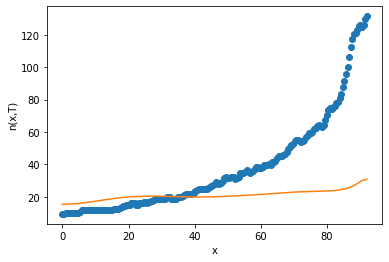

1.5369183761607463
26.6057578861668
26145.985647481604
9.25674945027432
8.787962409874524
oxigeno [6.51203014e-77 8.89181109e-77 1.77730426e-76 3.96759299e-76
 9.07685832e-76 2.09041326e-75 4.83194490e-75 1.12079756e-74
 2.60951470e-74 6.10000147e-74 1.43190875e-73 3.37567235e-73
 7.99245446e-73 1.90049026e-72 4.53822500e-72 1.08815904e-71
 2.61951684e-71 6.32993497e-71 1.53514651e-70 3.73594132e-70
 9.12196159e-70 2.23444783e-69 5.49064145e-69 1.35346064e-68
 3.34699474e-68 8.30386374e-68 2.06706019e-67 5.16296898e-67
 1.29399064e-66 3.25417399e-66 8.21109546e-66 2.07858289e-65
 5.27816439e-65 1.34427004e-64 3.43335783e-64 8.79282567e-64
 2.25772569e-63 5.81179195e-63 1.49971497e-62 3.87903440e-62
 1.00553106e-61 2.61181167e-61 6.79598554e-61 1.77087652e-60
 4.61939405e-60 1.20575766e-59 3.14791009e-59 8.21643990e-59
 2.14323496e-58 5.58508324e-58 1.45359230e-57 3.77765393e-57
 9.80204461e-57 2.53926066e-56 6.56755575e-56 1.69605130e-55
 4.37383877e-55 1.12651211e-54 2.89817289e-54 7.

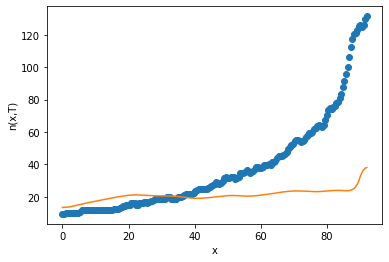

0.9781772780037707
78.22953427301925
20033.640535283612
8.872213740556653
47.62361406173158
oxigeno [6.76040743e-44 7.47248926e-44 9.76146233e-44 1.41210192e-43
 2.15009056e-43 3.35293773e-43 5.28969805e-43 8.39954859e-43
 1.33970063e-42 2.14448931e-42 3.44391942e-42 5.54796174e-42
 8.96492659e-42 1.45309545e-41 2.36253912e-41 3.85292236e-41
 6.30216069e-41 1.03372493e-40 1.69994663e-40 2.80195781e-40
 4.62772066e-40 7.65699907e-40 1.26906675e-39 2.10690858e-39
 3.50425208e-39 5.84018710e-39 9.75556170e-39 1.63371798e-38
 2.74330652e-38 4.61920680e-38 7.79872578e-38 1.31996047e-37
 2.23905683e-37 3.80552102e-37 6.47891688e-37 1.10474057e-36
 1.88653030e-36 3.22650728e-36 5.52736039e-36 9.48594182e-36
 1.63105365e-35 2.80991204e-35 4.84968542e-35 8.38363259e-35
 1.45109647e-34 2.51369828e-34 4.35582451e-34 7.54671820e-34
 1.30674178e-33 2.26056502e-33 3.90604950e-33 6.74057153e-33
 1.16166293e-32 1.99943269e-32 3.43730697e-32 5.90296458e-32
 1.01280210e-31 1.73638294e-31 2.97505594e-31 

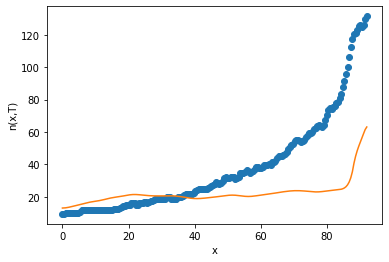

10
5.306985391310772
63.54890959392157
23141.747793684
8.498833241350635
40.828404564204206
oxigeno [7.52111867e-48 8.56761279e-48 1.19984719e-47 1.87701061e-47
 3.07746175e-47 5.13774057e-47 8.63785582e-47 1.45680339e-46
 2.46154111e-46 4.16561725e-46 7.06011318e-46 1.19851181e-45
 2.03807735e-45 3.47212463e-45 5.92666084e-45 1.01368435e-44
 1.73741982e-44 2.98429295e-44 5.13726798e-44 8.86321000e-44
 1.53259288e-43 2.65609588e-43 4.61362026e-43 8.03187881e-43
 1.40139999e-42 2.45056299e-42 4.29451823e-42 7.54207688e-42
 1.32732018e-41 2.34070296e-41 4.13597396e-41 7.32221777e-41
 1.29870589e-40 2.30754316e-40 4.10700154e-40 7.32147839e-40
 1.30717069e-39 2.33713671e-39 4.18418729e-39 7.50012676e-39
 1.34589311e-38 2.41763093e-38 4.34669574e-38 7.82114483e-38
 1.40823587e-37 2.53703866e-37 4.57276496e-37 8.24490241e-37
 1.48697383e-36 2.68219593e-36 4.83846251e-36 8.72803810e-36
 1.57428511e-35 2.83906475e-35 5.11873378e-35 9.22609170e-35
 1.66232506e-34 2.99387910e-34 5.38954137e-34 

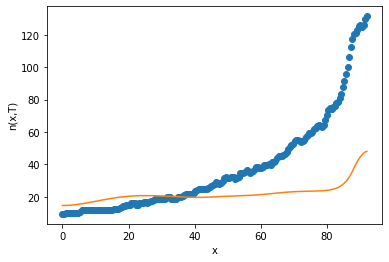

5.931769699757818
112.50048503150235
20251.34786379571
0.9318896523614996
35.269881988155944
oxigeno [8.92425481e-13 9.02142721e-13 9.31507799e-13 9.81166012e-13
 1.05221044e-12 1.14620879e-12 1.26524195e-12 1.41195522e-12
 1.58962364e-12 1.80223295e-12 2.05457840e-12 2.35238400e-12
 2.70244524e-12 3.11279896e-12 3.59292503e-12 4.15398485e-12
 4.80910314e-12 5.57370026e-12 6.46588395e-12 7.50691061e-12
 8.72172847e-12 1.01396166e-11 1.17949371e-11 1.37280192e-11
 1.59861995e-11 1.86250451e-11 2.17097906e-11 2.53170271e-11
 2.95366872e-11 3.44743746e-11 4.02541010e-11 4.70214965e-11
 5.49475770e-11 6.42331612e-11 7.51140484e-11 8.78670845e-11
 1.02817266e-10 1.20346054e-10 1.40901104e-10 1.65007644e-10
 1.93281770e-10 2.26445986e-10 2.65347355e-10 3.10978686e-10
 3.64503263e-10 4.27283692e-10 5.00915551e-10 5.87266616e-10
 6.88522581e-10 8.07240329e-10 9.46409985e-10 1.10952717e-09
 1.30067709e-09 1.52463246e-09 1.78696728e-09 2.09418929e-09
 2.45389381e-09 2.87494256e-09 3.36767132e-09

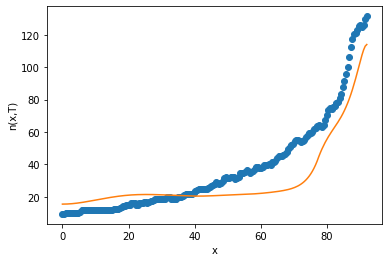

11
0.9579950081386498
99.41159097033612
27651.893578804957
8.85218661831707
4.926367849406112
oxigeno [2.18822791e-39 2.36576994e-39 2.92793135e-39 3.96876178e-39
 5.66416963e-39 8.30440868e-39 1.23478248e-38 1.85061138e-38
 2.78776322e-38 4.21551445e-38 6.39499401e-38 9.72988238e-38
 1.48459136e-37 2.27157436e-37 3.48551657e-37 5.36313063e-37
 8.27462663e-37 1.27995484e-36 1.98456753e-36 3.08356450e-36
 4.80005952e-36 7.48439591e-36 1.16877485e-35 1.82795099e-35
 2.86353502e-35 4.49395286e-35 7.06718432e-35 1.11392498e-34
 1.76006659e-34 2.78799980e-34 4.42712267e-34 7.04600705e-34
 1.12370732e-33 1.79530551e-33 2.87275471e-33 4.60326580e-33
 7.38610494e-33 1.18676026e-32 1.90965708e-32 3.07787697e-32
 4.96934061e-32 8.03738103e-32 1.30217180e-31 2.11288493e-31
 3.43243647e-31 5.58052481e-31 9.07611823e-31 1.47599642e-30
 2.39915390e-30 3.89655378e-30 6.32204129e-30 1.02455527e-29
 1.65844254e-29 2.68144030e-29 4.33087103e-29 6.98829706e-29
 1.12671055e-28 1.81533132e-28 2.92319804e-2

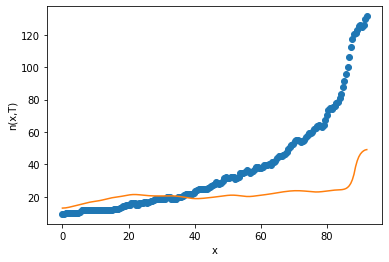

9.559973911117337
33.84728284350031
24417.74012458214
4.432890308909396
28.915426183732272
oxigeno [3.78425097e-49 4.41575303e-49 6.52037931e-49 1.07986320e-48
 1.86754490e-48 3.27771208e-48 5.78123515e-48 1.02156415e-47
 1.80678003e-47 3.19775739e-47 5.66354939e-47 1.00384350e-46
 1.78080253e-46 3.16210526e-46 5.62061410e-46 1.00016371e-45
 1.78183658e-45 3.17833837e-45 5.67662628e-45 1.01521308e-44
 1.81809287e-44 3.26045758e-44 5.85535024e-44 1.05303750e-43
 1.89650043e-43 3.42041292e-43 6.17754487e-43 1.11726819e-42
 2.02345122e-42 3.66951635e-42 6.66331372e-42 1.21148854e-41
 2.20534293e-41 4.01919355e-41 7.33304078e-41 1.33932656e-40
 2.44860903e-40 4.48079536e-40 8.20662337e-40 1.50424211e-39
 2.75920643e-39 5.06445427e-39 9.30103978e-39 1.70902677e-38
 3.14161368e-38 5.77711921e-38 1.06265626e-37 1.95508584e-37
 3.59748915e-37 6.62008357e-37 1.21822679e-36 2.24163396e-36
 4.12425216e-36 7.58652261e-36 1.39518395e-35 2.56499565e-35
 4.71394716e-35 8.65971176e-35 1.59009052e-34 2

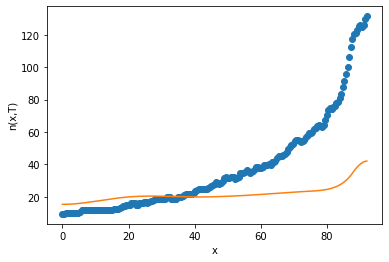

0.41550298572501804
118.09099656850202
28698.468043435132
9.260501119086184
25.126898698174024
oxigeno [1.77045924e-36 1.88805424e-36 2.25808840e-36 2.93547232e-36
 4.02257376e-36 5.68666938e-36 8.18709215e-36 1.19156598e-35
 1.74564495e-35 2.56751799e-35 3.78556308e-35 5.59122456e-35
 8.27257384e-35 1.22673092e-34 1.82455718e-34 2.72372472e-34
 4.08244712e-34 6.14292097e-34 9.27402608e-34 1.40347305e-33
 2.12687385e-33 3.22471746e-33 4.88868093e-33 7.40900390e-33
 1.12284875e-32 1.70294961e-32 2.58746965e-32 3.94330191e-32
 6.03367078e-32 9.27349424e-32 1.43138562e-31 2.21698349e-31
 3.44144313e-31 5.34764267e-31 8.31055433e-31 1.29109246e-30
 2.00529810e-30 3.11533025e-30 4.84448330e-30 7.54675233e-30
 1.17860376e-29 1.84634400e-29 2.90198570e-29 4.57540948e-29
 7.23154677e-29 1.14458926e-28 1.81199652e-28 2.86589252e-28
 4.52479909e-28 7.12870261e-28 1.12076065e-27 1.75891972e-27
 2.75665923e-27 4.31579986e-27 6.75078741e-27 1.05508424e-26
 1.64767554e-26 2.57124161e-26 4.01026686e-

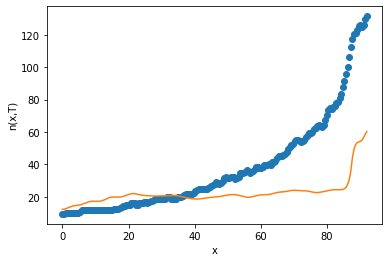

12
0.6194418240915913
111.94332058618444
22698.33530450958
2.471173759731212
9.665733142872893
oxigeno [2.92476660e-20 2.99104271e-20 3.19330394e-20 3.54204540e-20
 4.05540937e-20 4.76015406e-20 5.69302233e-20 6.90257563e-20
 8.45163684e-20 1.04205838e-19 1.29118378e-19 1.60559743e-19
 2.00199218e-19 2.50176997e-19 3.13240878e-19 3.92915767e-19
 4.93709926e-19 6.21364167e-19 7.83155081e-19 9.88271440e-19
 1.24829481e-18 1.57783118e-18 1.99536028e-18 2.52439101e-18
 3.19503194e-18 4.04609888e-18 5.12788288e-18 6.50569217e-18
 8.26427228e-18 1.05132238e-17 1.33936085e-17 1.70860912e-17
 2.18212212e-17 2.78928040e-17 3.56757170e-17 4.56499453e-17
 5.84330362e-17 7.48236028e-17 9.58589547e-17 1.22890391e-16
 1.57680072e-16 2.02523686e-16 2.60403421e-16 3.35176578e-16
 4.31807152e-16 5.56651904e-16 7.17819288e-16 9.25628729e-16
 1.19320779e-15 1.53727349e-15 1.97915043e-15 2.54608396e-15
 3.27291547e-15 4.20420666e-15 5.39693337e-15 6.92392013e-15
 8.87824758e-15 1.13789301e-14 1.45782247e-

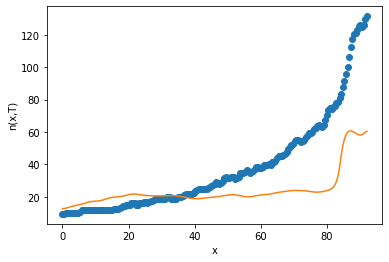

13
9.20976709502084
51.30332744738848
28164.107824730065
4.885071141654123
29.262247146577796
oxigeno [1.93827029e-41 2.15712251e-41 2.86299570e-41 4.21504116e-41
 6.51843644e-41 1.02939385e-40 1.63969349e-40 2.62137265e-40
 4.19809831e-40 6.73035392e-40 1.07993036e-39 1.73426967e-39
 2.78753397e-39 4.48472141e-39 7.22259686e-39 1.16445685e-38
 1.87954405e-38 3.03741842e-38 4.91473848e-38 7.96264305e-38
 1.29178185e-37 2.09849043e-37 3.41364430e-37 5.56067419e-37
 9.07059908e-37 1.48163881e-36 2.42349592e-36 3.96943666e-36
 6.51017452e-36 1.06910833e-35 1.75793191e-35 2.89412628e-35
 4.77034624e-35 7.87189807e-35 1.30042308e-34 2.15051552e-34
 3.55982745e-34 5.89818478e-34 9.78102755e-34 1.62330477e-33
 2.69610770e-33 4.48092426e-33 7.45182066e-33 1.23991703e-32
 2.06409287e-32 3.43750406e-32 5.72671780e-32 9.54307724e-32
 1.59060795e-31 2.65156588e-31 4.42058170e-31 7.37000975e-31
 1.22869216e-30 2.04823676e-30 3.41394014e-30 5.68915804e-30
 9.47840396e-30 1.57869218e-29 2.62854744e-2

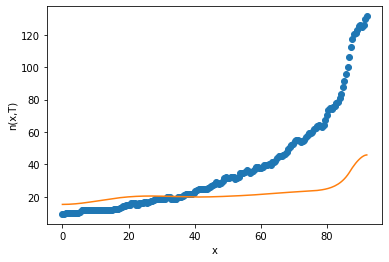

0.8409304064463352
106.40518235103134
27372.69143723936
4.187019291726656
14.026268645393293
oxigeno [1.50389306e-26 1.56168783e-26 1.73976936e-26 2.05267791e-26
 2.52617240e-26 3.19962978e-26 4.12965391e-26 5.39520565e-26
 7.10474486e-26 9.40612332e-26 1.25002993e-25 1.66603738e-25
 2.22579859e-25 2.97997685e-25 3.99773961e-25 5.37358309e-25
 7.23658562e-25 9.76291269e-25 1.31927193e-24 1.78530869e-24
 2.41893760e-24 3.28084797e-24 4.45390463e-24 6.05159320e-24
 8.22990684e-24 1.12040720e-23 1.52719952e-23 2.08469380e-23
 2.85027568e-23 3.90362042e-23 5.35524720e-23 7.35826846e-23
 1.01245861e-22 1.39473565e-22 1.92323768e-22 2.65422307e-22
 3.66586700e-22 5.06709341e-22 7.01006712e-22 9.70780271e-22
 1.34588571e-21 1.86817424e-21 2.59625856e-21 3.61207692e-21
 5.02989823e-21 7.00865271e-21 9.76882214e-21 1.36156239e-20
 1.89709260e-20 2.64172963e-20 3.67588977e-20 5.11057041e-20
 7.09899134e-20 9.85267497e-20 1.36636486e-19 1.89351017e-19
 2.62237368e-19 3.62983042e-19 5.02205231e-19

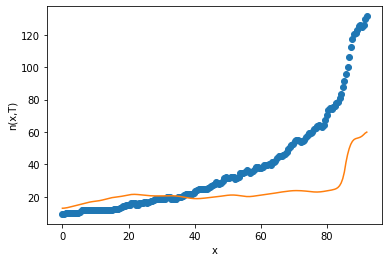

14
0.702018294940099
98.65668973448426
27884.7632795478
9.276936518798093
33.04186906567843
oxigeno [5.40782031e-40 5.85995555e-40 7.29494429e-40 9.96417082e-40
 1.43416080e-39 2.12169838e-39 3.18498134e-39 4.82138373e-39
 7.33802394e-39 1.12118446e-38 1.71842954e-38 2.64115100e-38
 4.07037234e-38 6.29078906e-38 9.75188763e-38 1.51653117e-37
 2.36593740e-37 3.70233248e-37 5.80925198e-37 9.13555081e-37
 1.43913184e-36 2.27002187e-36 3.58432883e-36 5.66524575e-36
 8.96507846e-36 1.42100049e-35 2.25719481e-35 3.59504507e-35
 5.74336939e-35 9.20495652e-35 1.47984612e-34 2.38557456e-34
 3.85412812e-34 6.23703035e-34 1.01053230e-33 1.63879911e-33
 2.66002622e-33 4.32220910e-33 7.03278795e-33 1.14635900e-32
 1.87256364e-32 3.06596306e-32 5.03167692e-32 8.27506313e-32
 1.36314725e-31 2.24779142e-31 3.70772925e-31 6.11375084e-31
 1.00719664e-30 1.65714685e-30 2.72246148e-30 4.46581336e-30
 7.31494936e-30 1.19661686e-29 1.95525087e-29 3.19171080e-29
 5.20577269e-29 8.48500802e-29 1.38225476e-28 

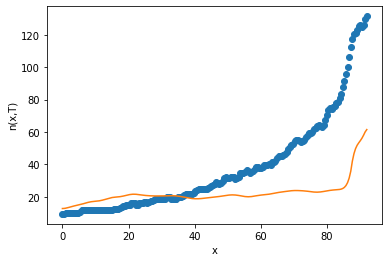

15
1.7277689553162356
105.44479326968123
23567.45088933434
8.898385928595749
43.554563530487876
oxigeno [7.23326814e-38 7.80189561e-38 9.59828923e-38 1.29093585e-37
 1.82673264e-37 2.65410743e-37 3.90865972e-37 5.79842272e-37
 8.64065609e-37 1.29185802e-36 1.93687339e-36 2.91155374e-36
 4.38787906e-36 6.62940728e-36 1.00408165e-35 1.52446206e-35
 2.32001373e-35 3.53882691e-35 5.40989877e-35 8.28794369e-35
 1.27233785e-34 1.95718585e-34 3.01660895e-34 4.65859065e-34
 7.20837039e-34 1.11755871e-33 1.73604336e-33 2.70217524e-33
 4.21435887e-33 6.58584250e-33 1.03120032e-32 1.61774481e-32
 2.54267069e-32 4.00366219e-32 6.31515739e-32 9.97797295e-32
 1.57908036e-31 2.50289338e-31 3.97308387e-31 6.31579141e-31
 1.00531825e-30 1.60216560e-30 2.55611907e-30 4.08183415e-30
 6.52305134e-30 1.04298982e-29 1.66821252e-29 2.66853341e-29
 4.26831033e-29 6.82530195e-29 1.09094427e-28 1.74278812e-28
 2.78233837e-28 4.43890825e-28 7.07677441e-28 1.12743710e-27
 1.79499095e-27 2.85606467e-27 4.54189845e

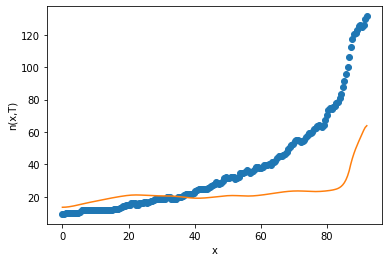

16
1.4747435397969202
27.853882388887833
28636.208126357767
9.432447025622624
20.62942053032607
oxigeno [1.29398533e-75 1.74969433e-75 3.43837661e-75 7.55539394e-75
 1.70319022e-74 3.86665577e-74 8.81202452e-74 2.01546431e-73
 4.62737280e-73 1.06673651e-72 2.46953444e-72 5.74180169e-72
 1.34081467e-71 3.14459973e-71 7.40637474e-71 1.75161503e-70
 4.15908346e-70 9.91299381e-70 2.37125316e-69 5.69164784e-69
 1.37062358e-68 3.31108890e-68 8.02365687e-68 1.95040094e-67
 4.75606579e-67 1.16353709e-66 2.85601566e-66 7.03430678e-66
 1.73851517e-65 4.31147809e-65 1.07284055e-64 2.67828169e-64
 6.70698042e-64 1.68453748e-63 4.24281533e-63 1.07150470e-62
 2.71305758e-62 6.88678852e-62 1.75241909e-61 4.46978843e-61
 1.14264547e-60 2.92707655e-60 7.51183987e-60 1.93066870e-59
 4.96763223e-59 1.27903326e-58 3.29386561e-58 8.48057638e-58
 2.18202243e-57 5.60856384e-57 1.43972565e-56 3.69026033e-56
 9.44352111e-56 2.41265590e-55 6.15397242e-55 1.56729959e-54
 3.98601708e-54 1.01246888e-53 2.56891075e

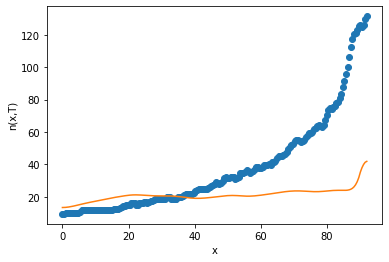

4.156707714315812
49.421618749624436
21708.218231166113
3.1228816962801003
5.170679275721494
oxigeno [7.56809422e-35 8.15576078e-35 1.00099293e-34 1.34185711e-34
 1.89122354e-34 2.73486830e-34 4.00503854e-34 5.90177588e-34
 8.72538099e-34 1.29254856e-33 1.91750503e-33 2.84819147e-33
 4.23570669e-33 6.30687302e-33 9.40265023e-33 1.40362848e-32
 2.09814467e-32 3.14059903e-32 4.70752122e-32 7.06610988e-32
 1.06213406e-31 1.59878112e-31 2.40994420e-31 3.63771632e-31
 5.49855208e-31 8.32257574e-31 1.26138547e-30 1.91429066e-30
 2.90888015e-30 4.42576247e-30 6.74185768e-30 1.02821395e-29
 1.56993367e-29 2.39967614e-29 3.67176738e-29 5.62373130e-29
 8.62133480e-29 1.32280762e-28 2.03123825e-28 3.12129663e-28
 4.79938552e-28 7.38376266e-28 1.13651554e-27 1.75001581e-27
 2.69550802e-27 4.15273875e-27 6.39864141e-27 9.85972934e-27
 1.51926171e-26 2.34076981e-26 3.60589950e-26 5.55354126e-26
 8.55072828e-26 1.31610586e-25 2.02494714e-25 3.11425938e-25
 4.78739771e-25 7.35589234e-25 1.12967001e-24

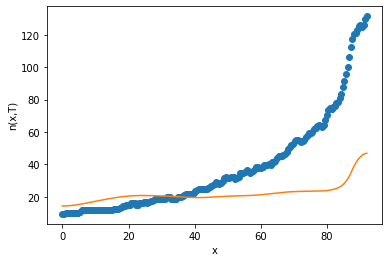

5.4833578900634965
25.53514663741229
26813.814681302356
9.562196283783047
5.6787579837768165
oxigeno [9.66427113e-80 1.37144615e-79 2.92562673e-79 6.93130604e-79
 1.67502878e-78 4.06422106e-78 9.87653373e-78 2.40340452e-77
 5.85774800e-77 1.43028619e-76 3.49950319e-76 8.58173240e-76
 2.10966160e-75 5.19988777e-75 1.28523506e-74 3.18590540e-74
 7.92117758e-74 1.97555458e-73 4.94262984e-73 1.24055594e-72
 3.12374740e-72 7.89118167e-72 1.99992534e-71 5.08492303e-71
 1.29700534e-70 3.31870671e-70 8.51812519e-70 2.19301250e-69
 5.66278221e-69 1.46647937e-68 3.80838798e-68 9.91707356e-68
 2.58915057e-67 6.77662153e-67 1.77786422e-66 4.67473922e-66
 1.23177266e-65 3.25204257e-65 8.60141634e-65 2.27879495e-64
 6.04635663e-64 1.60644522e-63 4.27318171e-63 1.13783544e-62
 3.03235375e-62 8.08691880e-62 2.15784865e-61 5.76006393e-61
 1.53793556e-60 4.10669382e-60 1.09655842e-59 2.92753257e-59
 7.81359608e-59 2.08464334e-58 5.55904306e-58 1.48154598e-57
 3.94584204e-57 1.05012122e-56 2.79243354e-56

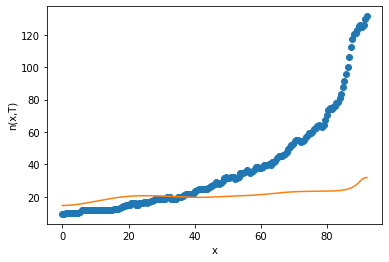

7.4910665255242055
103.9127671183631
22834.26462397304
7.090931444257887
5.6005481597342275
oxigeno [1.06190293e-34 1.13746966e-34 1.37494091e-34 1.80819879e-34
 2.49918002e-34 3.54694232e-34 5.10223062e-34 7.38976725e-34
 1.07416911e-33 1.56473199e-33 2.28269922e-33 3.33415869e-33
 4.87550558e-33 7.13758905e-33 1.04616333e-32 1.53527492e-32
 2.25597662e-32 3.31944995e-32 4.89101892e-32 7.21688353e-32
 1.06642264e-31 1.57814611e-31 2.33888542e-31 3.47149991e-31
 5.16025863e-31 7.68190056e-31 1.14525691e-30 1.70988057e-30
 2.55650392e-30 3.82764756e-30 5.73861492e-30 8.61499045e-30
 1.29495951e-29 1.94890502e-29 2.93654148e-29 4.42964661e-29
 6.68905464e-29 1.01110738e-28 1.52981844e-28 2.31667436e-28
 3.51110935e-28 5.32536386e-28 8.08259429e-28 1.22749484e-27
 1.86520607e-27 2.83558865e-27 4.31261038e-27 6.56129525e-27
 9.98535847e-27 1.51997179e-26 2.31408367e-26 3.52345742e-26
 5.36514176e-26 8.16944185e-26 1.24388572e-25 1.89375820e-25
 2.88273489e-25 4.38735095e-25 6.67575006e-25 

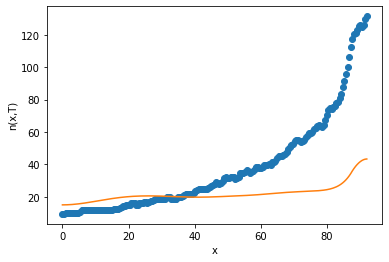

7.721666476878071
22.271526401764692
23190.053086216016
7.443117244707139
17.292515502101395
oxigeno [2.74941362e-76 3.86124716e-76 8.09433217e-76 1.88672580e-75
 4.48870296e-75 1.07211020e-74 2.56369311e-74 6.13577803e-74
 1.46995121e-73 3.52571109e-73 8.46803132e-73 2.03698087e-72
 4.90830180e-72 1.18489599e-71 2.86610624e-71 6.94735172e-71
 1.68774365e-70 4.10953348e-70 1.00301984e-69 2.45404882e-69
 6.01911998e-69 1.48003620e-68 3.64845319e-68 9.01663099e-68
 2.23396064e-67 5.54873493e-67 1.38161294e-66 3.44853716e-66
 8.62814385e-66 2.16375261e-65 5.43845605e-65 1.36989708e-64
 3.45786313e-64 8.74571755e-64 2.21619714e-63 5.62602505e-63
 1.43063253e-62 3.64366640e-62 9.29356786e-62 2.37360048e-61
 6.06961188e-61 1.55377625e-60 3.98140117e-60 1.02105412e-59
 2.62042980e-59 6.72904136e-59 1.72877066e-58 4.44296199e-58
 1.14210882e-57 2.93624324e-57 7.54879675e-57 1.94051847e-56
 4.98731939e-56 1.28139453e-55 3.29096890e-55 8.44794234e-55
 2.16734225e-54 5.55672287e-54 1.42361356e-53

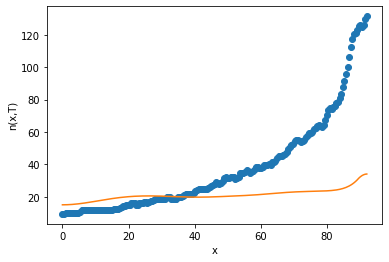

0.6463931768343079
76.3773551138138
28693.041840107253
8.458748026583562
22.578685061707958
oxigeno [1.22842504e-43 1.35286360e-43 1.75227815e-43 2.51117138e-43
 3.79247465e-43 5.87593408e-43 9.22359866e-43 1.45874940e-42
 2.31848337e-42 3.69833674e-42 5.91688529e-42 9.49166207e-42
 1.52673272e-41 2.46293945e-41 3.98608818e-41 6.47363140e-41
 1.05507541e-40 1.72533352e-40 2.82964734e-40 4.65163495e-40
 7.65982203e-40 1.26280931e-39 2.08363811e-39 3.44079559e-39
 5.68812580e-39 9.41862393e-39 1.56318277e-38 2.60210494e-38
 4.34652708e-38 7.28683929e-38 1.22585218e-37 2.06836694e-37
 3.49796238e-37 5.92514029e-37 1.00469776e-36 1.70487096e-36
 2.89508321e-36 4.92102025e-36 8.37656307e-36 1.42861440e-35
 2.44229709e-35 4.18634962e-35 7.19501822e-35 1.23955104e-34
 2.13938966e-34 3.69639916e-34 6.38802390e-34 1.10333990e-33
 1.90341307e-33 3.27839515e-33 5.63662287e-33 9.67417837e-33
 1.65770547e-32 2.83649323e-32 4.84753530e-32 8.27562670e-32
 1.41153188e-31 2.40579181e-31 4.09799990e-31 

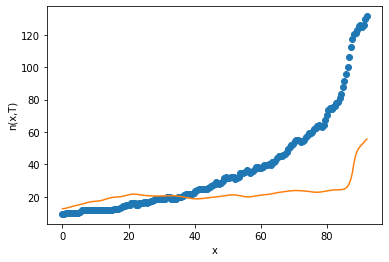

9.553116474168515
65.31373284798573
28736.46135634891
7.186309987960103
17.772173447666578
oxigeno [7.84096104e-44 8.79134172e-44 1.18726652e-43 1.78317259e-43
 2.81146702e-43 4.52217459e-43 7.33227329e-43 1.19287566e-42
 1.94392261e-42 3.17133156e-42 5.17868116e-42 8.46477296e-42
 1.38502446e-41 2.26871407e-41 3.72063378e-41 6.10944198e-41
 1.00453077e-40 1.65397240e-40 2.72721431e-40 4.50355391e-40
 7.44821248e-40 1.23373334e-39 2.04678196e-39 3.40101058e-39
 5.66020706e-39 9.43502882e-39 1.57520228e-38 2.63393067e-38
 4.41100181e-38 7.39813780e-38 1.24263863e-37 2.09019717e-37
 3.52070996e-37 5.93816873e-37 1.00283865e-36 1.69566953e-36
 2.87049608e-36 4.86464363e-36 8.25268201e-36 1.40139314e-35
 2.38185719e-35 4.05164895e-35 6.89727221e-35 1.17495506e-34
 2.00277544e-34 3.41569595e-34 5.82815565e-34 9.94849617e-34
 1.69874395e-33 2.90143609e-33 4.95659909e-33 8.46861051e-33
 1.44700781e-32 2.47248506e-32 4.22450018e-32 7.21724969e-32
 1.23282071e-31 2.10541730e-31 3.59472834e-31 6

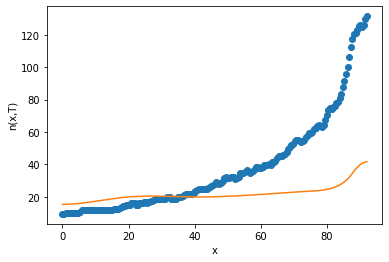

5.1226372669417
133.15904725471196
23356.814733395342
7.175340542660962
7.224682385993319
oxigeno [1.04165088e-30 1.09752294e-30 1.27116564e-30 1.58133524e-30
 2.06162859e-30 2.76427938e-30 3.76609409e-30 5.17724158e-30
 7.15396065e-30 9.91673574e-30 1.37761757e-29 1.91698037e-29
 2.67143568e-29 3.72801858e-29 5.20972086e-29 7.29059855e-29
 1.02173418e-28 1.43401124e-28 2.01566900e-28 2.83757538e-28
 4.00077097e-28 5.64952191e-28 7.99010052e-28 1.13178392e-27
 1.60561452e-27 2.28128242e-27 3.24614743e-27 4.62592193e-27
 6.60171570e-27 9.43473237e-27 1.35020790e-26 1.93487240e-26
 2.77629289e-26 3.98858159e-26 5.73705849e-26 8.26139590e-26
 1.19092714e-25 1.71853092e-25 2.48222641e-25 3.58845593e-25
 5.19188809e-25 7.51731947e-25 1.08915225e-24 1.57895476e-24
 2.29020221e-24 3.32329422e-24 4.82417259e-24 7.00494913e-24
 1.01738489e-23 1.47786582e-23 2.14697442e-23 3.11914227e-23
 4.53143711e-23 6.58274386e-23 9.56153751e-23 1.38860774e-22
 2.01625502e-22 2.92691357e-22 4.24774873e-22 6.

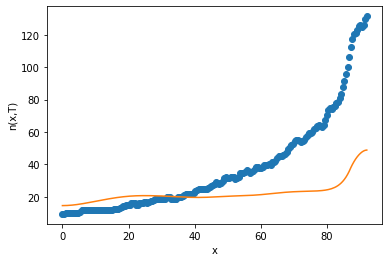

17
2.239410386675212
10.953990640011064
22454.775060396023
3.5483923135049564
14.059732821182406
oxigeno [3.27661406e-59 3.23642703e-59 3.11904058e-59 2.93353042e-59
 2.69362353e-59 2.41590349e-59 2.11781796e-59 1.81583434e-59
 1.52401074e-59 1.25312431e-59 1.01036978e-59 7.99538698e-60
 6.21532271e-60 4.75047445e-60 3.57296605e-60 2.64660199e-60
 1.93214864e-60 1.39117081e-60 9.88493242e-61 6.93512724e-61
 4.80647536e-61 3.29205611e-61 2.22909842e-61 1.49261470e-61
 9.88655029e-62 6.47940627e-62 4.20272796e-62 2.69865027e-62
 1.71592732e-62 1.08071640e-62 6.74399303e-63 4.17123112e-63
 2.55835768e-63 1.55764279e-63 9.44898990e-64 5.80077899e-64
 3.84628327e-64 3.37878964e-64 5.06967023e-64 1.15690966e-63
 3.07533572e-63 8.49069593e-63 2.36438444e-62 6.59720092e-62
 1.84155404e-61 5.14000548e-61 1.43404519e-60 3.99825578e-60
 1.11374471e-59 3.09897133e-59 8.61169203e-59 2.38965516e-58
 6.62079646e-58 1.83139386e-57 5.05746740e-57 1.39431546e-56
 3.83772335e-56 1.05459957e-55 2.89351044

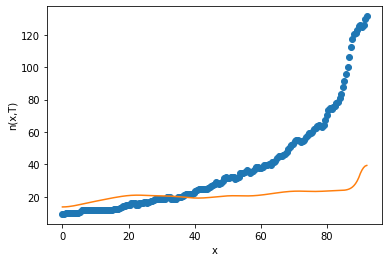

0.19209798157100613
20.271226955477538
25779.378210472805
4.027701425914048
34.09022869057107
oxigeno [2.41964077e-61 2.97917042e-61 4.93332323e-61 9.26588649e-61
 1.82261433e-60 3.65895552e-60 7.42975508e-60 1.51867220e-59
 3.11374158e-59 6.38613963e-59 1.30777708e-58 2.67248045e-58
 5.45567231e-58 1.11559211e-57 2.29286243e-57 4.74963022e-57
 9.92505474e-57 2.08948998e-56 4.41964990e-56 9.36401151e-56
 1.98259821e-55 4.18867754e-55 8.82379913e-55 1.85283526e-54
 3.87936867e-54 8.11097965e-54 1.69853985e-53 3.57699705e-53
 7.60292674e-53 1.63362238e-52 3.54357194e-52 7.72942746e-52
 1.68704416e-51 3.66994565e-51 7.94443143e-51 1.71281911e-50
 3.68578673e-50 7.93235424e-50 1.70974321e-49 3.69473661e-49
 8.01519465e-49 1.74818486e-48 3.83824894e-48 8.48381982e-48
 1.88488666e-47 4.19632179e-47 9.32528760e-47 2.06143724e-46
 4.52483597e-46 9.86626881e-46 2.14192177e-45 4.64206707e-45
 1.00591081e-44 2.17940420e-44 4.71667098e-44 1.01874797e-43
 2.19508740e-43 4.71862151e-43 1.01252033e-4

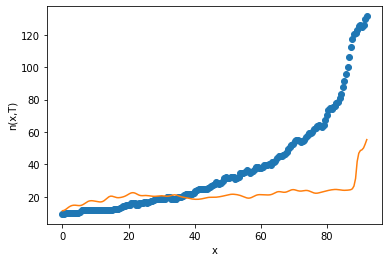

9.78592546073231
74.00000823375608
28000.3634779578
0.02755532376330271
4.673264975546633
oxigeno [ 0.15134925  0.15132343  0.15124611  0.1511176   0.15093846  0.15070945
  0.15043153  0.15010587  0.14973384  0.14931698  0.148857    0.14835578
  0.14781536  0.14723787  0.14662562  0.14598097  0.14530643  0.14460453
  0.14387792  0.14312927  0.14236129  0.14157672  0.14077833  0.13996887
  0.1391511   0.13832773  0.13750148  0.13667502  0.13585098  0.13503195
  0.13422044  0.13341893  0.13262984  0.13185552  0.13109825  0.13036028
  0.12964375  0.12895078  0.12828342  0.12764367  0.12703348  0.12645475
  0.12590936  0.12539916  0.12492597  0.12449159  0.12409784  0.12374654
  0.12343953  0.12317867  0.12296587  0.12280311  0.12269242  0.12263592
  0.12263583  0.12269448  0.12281434  0.12299801  0.12324827  0.12356808
  0.12396058  0.12442916  0.12497741  0.12560921  0.12632872  0.12714037
  0.12804894  0.12905956  0.13017772  0.13140931  0.13276065  0.13423849
  0.13585009  0.13760318  

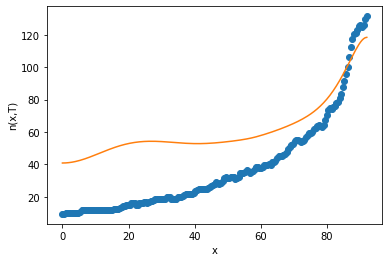

18
3.039373621761928
86.43674825491712
23633.419379233437
7.588053902832854
43.512487880791376
oxigeno [7.93388648e-39 8.62485229e-39 1.08187050e-38 1.49002744e-38
 2.15883540e-38 3.20673518e-38 4.82058702e-38 7.29046289e-38
 1.10641786e-37 1.68323247e-37 2.56607204e-37 3.91968854e-37
 5.99923500e-37 9.20066416e-37 1.41396773e-36 2.17756218e-36
 3.36062844e-36 5.19747055e-36 8.05533103e-36 1.25109210e-35
 1.94716132e-35 3.03677031e-35 4.74579474e-35 7.43159554e-35
 1.16605793e-34 1.83320801e-34 2.88765418e-34 4.55730528e-34
 7.20588546e-34 1.14148027e-33 1.81148684e-33 2.87984794e-33
 4.58617960e-33 7.31571107e-33 1.16885306e-32 1.87038874e-32
 2.99736574e-32 4.81002423e-32 7.72884525e-32 1.24336416e-31
 2.00240338e-31 3.22793079e-31 5.20790984e-31 8.40841862e-31
 1.35837743e-30 2.19545736e-30 3.54953651e-30 5.73991750e-30
 9.28271365e-30 1.50117451e-29 2.42733952e-29 3.92404949e-29
 6.34176700e-29 1.02454537e-28 1.65453673e-28 2.67073477e-28
 4.30907560e-28 6.94913271e-28 1.12012803e-

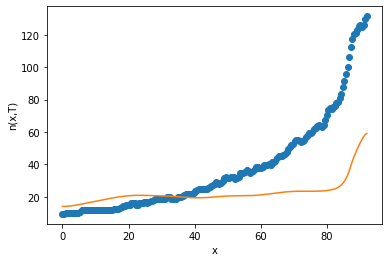

19
8.299215542828293
24.031560977289345
21151.895301080513
9.601497245571993
35.85698936873536
oxigeno [1.01422453e-81 1.48020090e-81 3.30567931e-81 8.16626162e-81
 2.05273296e-80 5.17607253e-80 1.30655766e-79 3.30112160e-79
 8.34973324e-79 2.11471307e-78 5.36396293e-78 1.36288151e-77
 3.46932501e-77 8.84945634e-77 2.26222829e-76 5.79643821e-76
 1.48881501e-75 3.83369784e-75 9.89757070e-75 2.56213553e-74
 6.65059999e-74 1.73109454e-73 4.51847277e-73 1.18270684e-72
 3.10438033e-72 8.17104096e-72 2.15660948e-71 5.70741319e-71
 1.51446112e-70 4.02903343e-70 1.07457406e-69 2.87295994e-69
 7.69913588e-69 2.06791098e-68 5.56614403e-68 1.50128266e-67
 4.05701182e-67 1.09833337e-66 2.97846693e-66 8.08960428e-66
 2.20029920e-65 5.99238137e-65 1.63389131e-64 4.45959534e-64
 1.21831322e-63 3.33086225e-63 9.11238815e-63 2.49419301e-62
 6.82960830e-62 1.87058015e-61 5.12412877e-61 1.40370876e-60
 3.84502480e-60 1.05302890e-59 2.88307773e-59 7.89051564e-59
 2.15847820e-58 5.90127354e-58 1.61236922e-

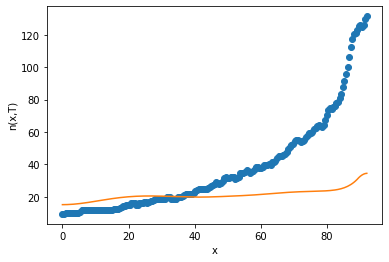

3.000038427685998
42.685045977742035
27460.45502523838
7.767990503537525
25.06272738464641
oxigeno [3.46554956e-56 4.13462819e-56 6.40041226e-56 1.11400004e-55
 2.01942673e-55 3.70964188e-55 6.84802937e-55 1.26746014e-54
 2.35085939e-54 4.36969458e-54 8.14083045e-54 1.52035306e-53
 2.84664521e-53 5.34413556e-53 1.00601911e-52 1.89905596e-52
 3.59484921e-52 6.82395209e-52 1.29896908e-51 2.47947782e-51
 4.74578960e-51 9.10815064e-51 1.75271465e-50 3.38171495e-50
 6.54173423e-50 1.26871499e-49 2.46680727e-49 4.80828477e-49
 9.39531679e-49 1.84026146e-48 3.61303877e-48 7.10993914e-48
 1.40226821e-47 2.77163594e-47 5.48965342e-47 1.08947325e-46
 2.16623523e-46 4.31480943e-46 8.60853243e-46 1.72007617e-45
 3.44153422e-45 6.89402427e-45 1.38240904e-44 2.77438845e-44
 5.57169208e-44 1.11948391e-43 2.24999899e-43 4.52278450e-43
 9.09113331e-43 1.82706360e-42 3.67074709e-42 7.37173492e-42
 1.47964298e-41 2.96812472e-41 5.95003636e-41 1.19193171e-40
 2.38597697e-40 4.77264011e-40 9.53953772e-40 1

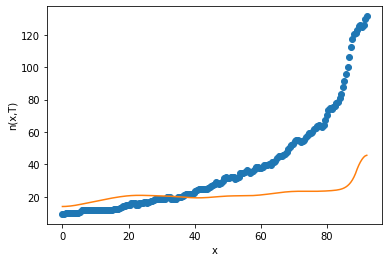

0.97997640321796
36.32150172322885
28387.21509268382
4.35711697743163
12.908851739153231
oxigeno [3.15310580e-47 3.58364659e-47 4.99383754e-47 7.77376571e-47
 1.26985189e-46 2.11549315e-46 3.55500522e-46 6.00253093e-46
 1.01694887e-45 1.72791192e-45 2.94388615e-45 5.02884423e-45
 8.61309703e-45 1.47911661e-44 2.54685153e-44 4.39696935e-44
 7.61053531e-44 1.32044505e-43 2.29600171e-43 3.99998864e-43
 6.98025218e-43 1.21989939e-42 2.13487773e-42 3.74131204e-42
 6.56646918e-42 1.15448768e-41 2.03378434e-41 3.59069764e-41
 6.35446613e-41 1.12726243e-40 2.00439089e-40 3.57166100e-40
 6.37643770e-40 1.14022266e-39 2.04176530e-39 3.66069065e-39
 6.57115916e-39 1.18104152e-38 2.12561182e-38 3.83140725e-38
 6.91725010e-38 1.25088860e-37 2.26554167e-37 4.10861584e-37
 7.45828812e-37 1.35461245e-36 2.46046569e-36 4.46728584e-36
 8.10430356e-36 1.46856245e-35 2.65753056e-35 4.80200765e-35
 8.66394182e-35 1.56090570e-34 2.80832929e-34 5.04642883e-34
 9.05827747e-34 1.62440490e-33 2.91065075e-33 5.2

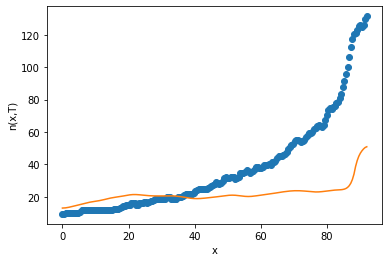

2.122911508698509
47.90522871525533
28995.038657573903
2.245978383261622
8.904848018622232
oxigeno [2.10961572e-30 2.23541386e-30 2.62785927e-30 3.33399445e-30
 4.43877140e-30 6.07578108e-30 8.44421637e-30 1.18343247e-29
 1.66647481e-29 2.35367568e-29 3.33126776e-29 4.72291267e-29
 6.70604272e-29 9.53545147e-29 1.35773675e-28 1.93587057e-28
 2.76383171e-28 3.95101594e-28 5.65528412e-28 8.10466189e-28
 1.16288629e-27 1.67051358e-27 2.40250204e-27 3.45916569e-27
 4.98617809e-27 7.19531264e-27 1.03947629e-26 1.50335034e-26
 2.17662397e-26 3.15485652e-26 4.57764609e-26 6.64909158e-26
 9.66782321e-26 1.40710964e-25 2.04995609e-25 2.98924276e-25
 4.36273177e-25 6.37257696e-25 9.31551591e-25 1.36272079e-24
 1.99473045e-24 2.92148723e-24 4.28081928e-24 6.27493661e-24
 9.20034341e-24 1.34915215e-23 1.97846589e-23 2.90105344e-23
 4.25297837e-23 6.23297452e-23 9.13107571e-23 1.33702359e-22
 1.95668124e-22 2.86184376e-22 4.18316491e-22 6.11072311e-22
 8.92093030e-22 1.30155900e-21 1.89785723e-21 2

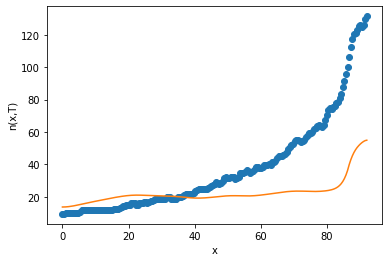

20
SMC step with target distance: 350.0
after perturb [0.9012175155912603, 172.82437658171557, 24787.10546782064, 13.162577178169204, 32.260985502079485]
parameters [0.9012175155912603, 172.82437658171557, 24787.10546782064, 13.162577178169204, 32.260985502079485]
after perturb [1.4257142944827186, 31.742624767838258, 26652.933967722358, 7.740500738181779, 43.24664840541076]
parameters [1.4257142944827186, 31.742624767838258, 26652.933967722358, 7.740500738181779, 43.24664840541076]
oxigeno [7.32359738e-65 9.21159131e-65 1.58514599e-64 3.06865402e-64
 6.14561083e-64 1.24339603e-63 2.52708469e-63 5.15373258e-63
 1.05462183e-62 2.16573393e-62 4.46376424e-62 9.23458925e-62
 1.91762906e-61 3.99699087e-61 8.36172913e-61 1.75553518e-60
 3.69840806e-60 7.81703685e-60 1.65735784e-59 3.52422814e-59
 7.51488657e-59 1.60674263e-58 3.44439665e-58 7.40328367e-58
 1.59552040e-57 3.44812750e-57 7.47321849e-57 1.62446198e-56
 3.54166584e-56 7.74460203e-56 1.69847307e-55 3.73543424e-55
 8.23736332e-55 

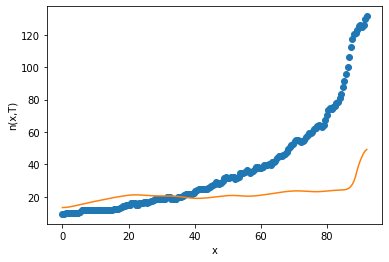

after perturb [8.594560422605339, 74.42415995289437, 24001.610317883107, -1.4482580681623993, 24.088630416515493]
parameters [8.594560422605339, 74.42415995289437, 24001.610317883107, -1.4482580681623993, 24.088630416515493]
after perturb [-2.4758004693785853, 71.23717789655176, 27913.84687774742, 6.741692687722189, 13.023205759126467]
parameters [-2.4758004693785853, 71.23717789655176, 27913.84687774742, 6.741692687722189, 13.023205759126467]
after perturb [0.03382096331892037, 35.04625142159546, 21555.149417319066, 1.6806242552885449, 31.012572218618654]
parameters [0.03382096331892037, 35.04625142159546, 21555.149417319066, 1.6806242552885449, 31.012572218618654]
oxigeno [1.18015044e-28 1.16495587e-28 1.12423130e-28 1.06702603e-28
 1.00151490e-28 9.35260216e-29 8.72339443e-29 8.14157263e-29
 7.61409236e-29 7.14806487e-29 6.74953899e-29 6.41899000e-29
 6.16651299e-29 6.03634175e-29 6.11762804e-29 6.53785536e-29
 7.47570799e-29 9.17640546e-29 1.19679214e-28 1.63158721e-28
 2.29069318e

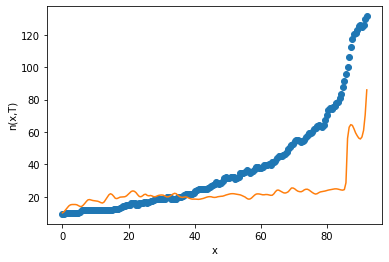

after perturb [-3.392629697870569, 123.46427773878099, 20193.52565746729, 8.799693203140428, 40.01741829760095]
parameters [-3.392629697870569, 123.46427773878099, 20193.52565746729, 8.799693203140428, 40.01741829760095]
after perturb [12.389555276729013, 85.65576921450409, 33317.058014873925, -0.11703002818520676, -7.4347454438613205]
parameters [12.389555276729013, 85.65576921450409, 33317.058014873925, -0.11703002818520676, -7.4347454438613205]
after perturb [10.55210107190862, 71.43962688654436, 22683.054153854002, 4.881912161635763, 27.543327995159473]
parameters [10.55210107190862, 71.43962688654436, 22683.054153854002, 4.881912161635763, 27.543327995159473]
after perturb [-2.243340548197863, 77.21074605125438, 26726.348250359402, 9.29963378041005, 56.27002861303805]
parameters [-2.243340548197863, 77.21074605125438, 26726.348250359402, 9.29963378041005, 56.27002861303805]
after perturb [5.886136903204391, 81.61811017659355, 27392.36288120244, 12.583743675904273, 29.1449055694769

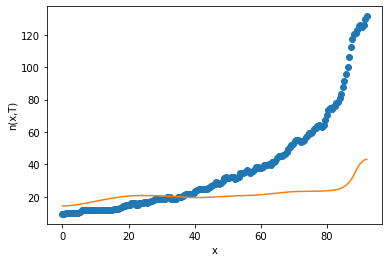

after perturb [3.948038241400367, 170.94789142164927, 25808.580432036586, 3.9235311386572587, -9.892814565679792]
parameters [3.948038241400367, 170.94789142164927, 25808.580432036586, 3.9235311386572587, -9.892814565679792]
after perturb [3.765342594930883, 103.955685638762, 24941.472601609126, 9.38403707872911, 12.334087335279428]
parameters [3.765342594930883, 103.955685638762, 24941.472601609126, 9.38403707872911, 12.334087335279428]
oxigeno [2.34622389e-39 2.55175005e-39 3.20449965e-39 4.41956108e-39
 6.41191834e-39 9.53584403e-39 1.43502791e-38 2.17228570e-38
 3.29928794e-38 5.02253447e-38 7.66065275e-38 1.17060479e-37
 1.79211291e-37 2.74887753e-37 4.22480637e-37 6.50642943e-37
 1.00410942e-36 1.55286679e-36 2.40663123e-36 3.73774771e-36
 5.81747684e-36 9.07360043e-36 1.41820332e-35 2.22127691e-35
 3.48627812e-35 5.48282954e-35 8.64007852e-35 1.36422593e-34
 2.15821402e-34 3.42077588e-34 5.43196672e-34 8.64112692e-34
 1.37702129e-33 2.19807066e-33 3.51434563e-33 5.62752551e-33
 

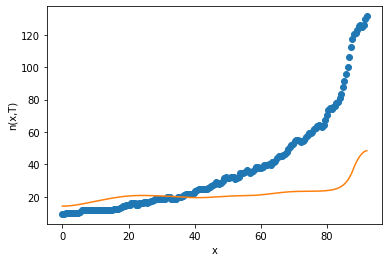

after perturb [-2.1333668443391782, 92.11914520114132, 17716.263120795968, 1.4863940503903939, 19.03419512224083]
parameters [-2.1333668443391782, 92.11914520114132, 17716.263120795968, 1.4863940503903939, 19.03419512224083]
after perturb [5.2423107058286185, 164.32599173701226, 17729.847970482948, 5.3461960778761455, 39.70802993460994]
parameters [5.2423107058286185, 164.32599173701226, 17729.847970482948, 5.3461960778761455, 39.70802993460994]
after perturb [-0.17859724860920867, 43.07053454537639, 25245.06393997725, 13.699529430056767, 54.678646471257]
parameters [-0.17859724860920867, 43.07053454537639, 25245.06393997725, 13.699529430056767, 54.678646471257]
after perturb [1.2196839211026935, 72.9187590346082, 20789.31959170517, -2.787978873901242, 27.139645344557202]
parameters [1.2196839211026935, 72.9187590346082, 20789.31959170517, -2.787978873901242, 27.139645344557202]
after perturb [0.592225959633002, 80.61673459397562, 29890.03035490017, 8.956335017710293, 48.27853047149654

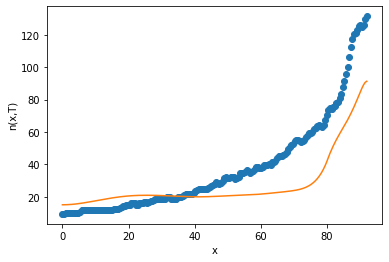

1
after perturb [0.09846282617872282, 165.03289652060153, 27313.971931027376, 12.523287928262667, 19.228112908728544]
parameters [0.09846282617872282, 165.03289652060153, 27313.971931027376, 12.523287928262667, 19.228112908728544]
after perturb [-1.4660084524960935, 74.39316207407671, 26410.70327192515, 11.255016585750388, 16.592023199388542]
parameters [-1.4660084524960935, 74.39316207407671, 26410.70327192515, 11.255016585750388, 16.592023199388542]
after perturb [4.709420652865462, 182.84269866885373, 21836.206210650125, 13.2850676758471, 22.125939077594094]
parameters [4.709420652865462, 182.84269866885373, 21836.206210650125, 13.2850676758471, 22.125939077594094]
after perturb [6.084166694450033, 132.81159510195536, 26997.269541513946, 3.4523483258189143, 7.277190034922951]
parameters [6.084166694450033, 132.81159510195536, 26997.269541513946, 3.4523483258189143, 7.277190034922951]
oxigeno [8.79522476e-22 9.04240945e-22 9.79795025e-22 1.11046471e-21
 1.30366864e-21 1.57041140e-21 

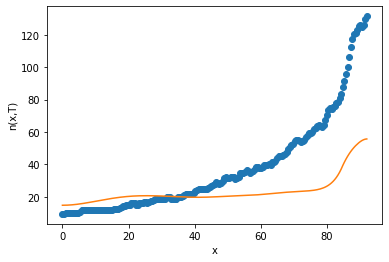

after perturb [-1.4005571998547557, 177.08399044959873, 19787.912570520344, 17.475607120593196, 62.08295446568674]
parameters [-1.4005571998547557, 177.08399044959873, 19787.912570520344, 17.475607120593196, 62.08295446568674]
after perturb [-0.21593588236080757, 159.26241190884917, 20669.196500883692, 7.05151050362956, 47.64815889849536]
parameters [-0.21593588236080757, 159.26241190884917, 20669.196500883692, 7.05151050362956, 47.64815889849536]
after perturb [1.992514305656585, 96.3692682352157, 28670.12302304212, 4.073018361807815, 14.414402416060199]
parameters [1.992514305656585, 96.3692682352157, 28670.12302304212, 4.073018361807815, 14.414402416060199]
oxigeno [1.34486459e-27 1.40369851e-27 1.58542706e-27 1.90623717e-27
 2.39484805e-27 3.09531120e-27 4.07132805e-27 5.41253385e-27
 7.24340310e-27 9.73570954e-27 1.31258521e-26 1.77388797e-26
 2.40217672e-26 3.25894995e-26 4.42889101e-26 6.02871773e-26
 8.21946044e-26 1.12235150e-25 1.53483563e-25 2.10195592e-25
 2.88268440e-25 3.

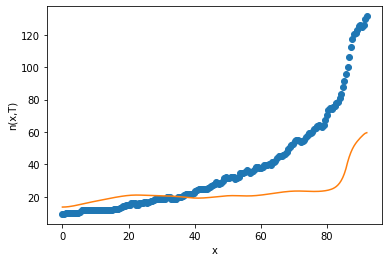

after perturb [13.601624121232799, 137.28403878190682, 23394.65323564177, 7.464291548914975, 4.626673892905407]
parameters [13.601624121232799, 137.28403878190682, 23394.65323564177, 7.464291548914975, 4.626673892905407]
after perturb [5.3778096603433685, 71.91479678946915, 33594.290895095204, -4.32024970158985, 6.355976479923335]
parameters [5.3778096603433685, 71.91479678946915, 33594.290895095204, -4.32024970158985, 6.355976479923335]
after perturb [3.9608845170681017, 76.1749277137074, 18193.134362170185, -1.841042975038723, 27.954463418195214]
parameters [3.9608845170681017, 76.1749277137074, 18193.134362170185, -1.841042975038723, 27.954463418195214]
after perturb [3.2416525278400923, 89.62253125355488, 21624.145433997128, -2.136908440573783, 22.27610643142452]
parameters [3.2416525278400923, 89.62253125355488, 21624.145433997128, -2.136908440573783, 22.27610643142452]
after perturb [6.92427193682391, 98.65945657243537, 31297.85695691143, 6.6351954447142605, 23.217571487189943]
p

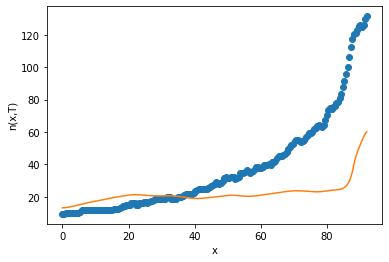

after perturb [-0.8954991085887327, 70.48888362876546, 27040.253749870055, 11.505260330620255, 11.601380314607047]
parameters [-0.8954991085887327, 70.48888362876546, 27040.253749870055, 11.505260330620255, 11.601380314607047]
after perturb [4.48150560872678, 55.135633231696666, 28729.255677491794, 11.467187082660967, 44.51389281564116]
parameters [4.48150560872678, 55.135633231696666, 28729.255677491794, 11.467187082660967, 44.51389281564116]
after perturb [8.602451425253212, 85.24750776392816, 33030.88586783055, 5.259453180365315, -4.178847466801402]
parameters [8.602451425253212, 85.24750776392816, 33030.88586783055, 5.259453180365315, -4.178847466801402]
after perturb [8.93962618897299, 103.92346709969088, 25840.285077543966, -5.336299205264204, 2.649544887279442]
parameters [8.93962618897299, 103.92346709969088, 25840.285077543966, -5.336299205264204, 2.649544887279442]
after perturb [2.2973730015655693, 23.45093611772461, 24723.44829722156, 13.068867069207798, 46.37747632057852]


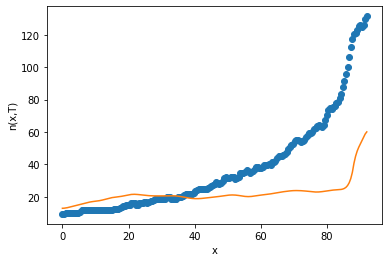

after perturb [2.371833238886014, 65.13073424744512, 20071.175231285248, 7.957416302351956, 46.522257884301645]
parameters [2.371833238886014, 65.13073424744512, 20071.175231285248, 7.957416302351956, 46.522257884301645]
oxigeno [7.90585491e-46 8.87182434e-46 1.20067654e-45 1.80818023e-45
 2.85981336e-45 4.61710873e-45 7.52050174e-45 1.23041117e-44
 2.01890614e-44 3.32084556e-44 5.47541498e-44 9.04983343e-44
 1.49950137e-43 2.49090509e-43 4.14841973e-43 6.92667162e-43
 1.15951356e-42 1.94591222e-42 3.27378290e-42 5.52124497e-42
 9.33396025e-42 1.58168222e-41 2.68646715e-41 4.57340736e-41
 7.80339387e-41 1.33445311e-40 2.28713017e-40 3.92859822e-40
 6.76291132e-40 1.16672152e-39 2.01708177e-39 3.49449744e-39
 6.06637963e-39 1.05519628e-38 1.83893881e-38 3.21069837e-38
 5.61556971e-38 9.83806736e-38 1.72624405e-37 3.03333605e-37
 5.33713979e-37 9.40165384e-37 1.65782907e-36 2.92578318e-36
 5.16695284e-36 9.12929966e-36 1.61350828e-35 2.85205310e-35
 5.04106874e-35 8.90837304e-35 1.573711

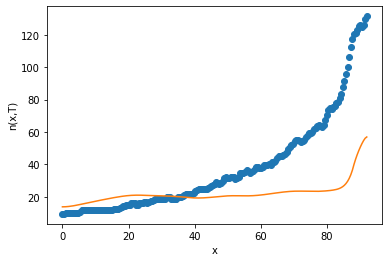

after perturb [-2.5051945484440408, 114.28023300974921, 23908.123618822352, 3.352030095148317, 16.242855792828074]
parameters [-2.5051945484440408, 114.28023300974921, 23908.123618822352, 3.352030095148317, 16.242855792828074]
after perturb [6.950432315888376, 122.57970344684466, 21193.414306819723, 7.776221504619924, 49.473303087381396]
parameters [6.950432315888376, 122.57970344684466, 21193.414306819723, 7.776221504619924, 49.473303087381396]
oxigeno [6.27179062e-33 6.67446404e-33 7.93433330e-33 1.02138024e-32
 1.38073477e-32 1.91806707e-32 2.70329238e-32 3.83906925e-32
 5.47469439e-32 7.82646062e-32 1.12073822e-31 1.60705616e-31
 2.30724844e-31 3.31654905e-31 4.77330438e-31 6.87878792e-31
 9.92626717e-31 1.43437036e-30 2.07565684e-30 3.00803793e-30
 4.36572037e-30 6.34572821e-30 9.23772157e-30 1.34681502e-29
 1.96657095e-29 2.87584847e-29 4.21182761e-29 6.17752356e-29
 9.07373643e-29 1.33466522e-28 1.96588182e-28 2.89950516e-28
 4.28205773e-28 6.33172986e-28 9.37369915e-28 1.389295

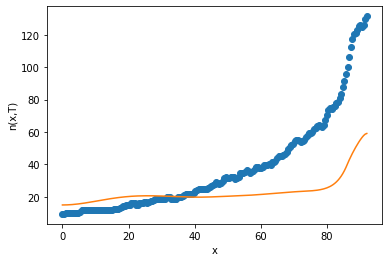

after perturb [-4.24910834357341, 183.3499792393929, 24598.304548489534, 8.732872513506521, 20.53160758739338]
parameters [-4.24910834357341, 183.3499792393929, 24598.304548489534, 8.732872513506521, 20.53160758739338]
after perturb [4.140574657192863, 65.7877649248314, 26526.360733744405, 4.320308081513982, 43.65066144335509]
parameters [4.140574657192863, 65.7877649248314, 26526.360733744405, 4.320308081513982, 43.65066144335509]
oxigeno [2.13695890e-34 2.29348577e-34 2.78602927e-34 3.68694455e-34
 5.12892480e-34 7.32515634e-34 1.06018812e-33 1.54485628e-33
 2.25937122e-33 3.31186409e-33 4.86276796e-33 7.15028157e-33
 1.05284884e-32 1.55244860e-32 2.29241200e-32 3.39008272e-32
 5.02095403e-32 7.44789232e-32 1.10652425e-31 1.64654857e-31
 2.45401189e-31 3.66325282e-31 5.47699555e-31 8.20159228e-31
 1.23006319e-30 1.84765821e-30 2.77952621e-30 4.18758189e-30
 6.31809627e-30 9.54607856e-30 1.44432004e-29 2.18818306e-29
 3.31944837e-29 5.04183438e-29 7.66704356e-29 1.16723473e-28
 1.7788

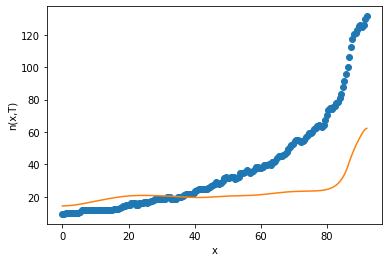

after perturb [8.619188742702626, 154.15448759464223, 29310.612698325225, 5.649301411481929, -16.589292254745704]
parameters [8.619188742702626, 154.15448759464223, 29310.612698325225, 5.649301411481929, -16.589292254745704]
after perturb [-0.3824227274300438, 56.012524466218224, 31796.369687317165, 2.4945871976504073, -14.405769277948014]
parameters [-0.3824227274300438, 56.012524466218224, 31796.369687317165, 2.4945871976504073, -14.405769277948014]
after perturb [6.604371802274971, 95.50034409805009, 33214.557721613455, 4.405946865207392, 17.022079880791367]
parameters [6.604371802274971, 95.50034409805009, 33214.557721613455, 4.405946865207392, 17.022079880791367]
after perturb [4.984849845762334, 163.20761163803337, 22102.789135417406, 6.36974171755654, 38.03003913092492]
parameters [4.984849845762334, 163.20761163803337, 22102.789135417406, 6.36974171755654, 38.03003913092492]
after perturb [2.2120065571045564, 59.927752342712736, 20156.051426637903, 3.0778171918920885, 70.940517

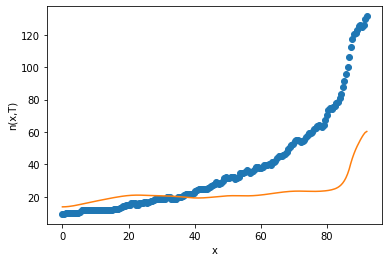

after perturb [-0.943981318752253, 93.27086899479175, 21056.479836091366, 6.510254104937767, 5.527246079173846]
parameters [-0.943981318752253, 93.27086899479175, 21056.479836091366, 6.510254104937767, 5.527246079173846]
after perturb [11.315679284750988, 83.56525378369882, 26963.221151505713, 0.8220425942966632, 9.687790774366157]
parameters [11.315679284750988, 83.56525378369882, 26963.221151505713, 0.8220425942966632, 9.687790774366157]
after perturb [6.176177484427853, 159.04121447272604, 14485.929173614415, -1.7739845993905714, 37.84963140130832]
parameters [6.176177484427853, 159.04121447272604, 14485.929173614415, -1.7739845993905714, 37.84963140130832]
after perturb [-0.3642645267256861, 121.95924229707661, 23414.587367052092, 11.088931777865403, 36.87699769927772]
parameters [-0.3642645267256861, 121.95924229707661, 23414.587367052092, 11.088931777865403, 36.87699769927772]
after perturb [4.504022387878479, 149.96503457501916, 29630.50439836508, 2.9298256881474796, 0.024064293

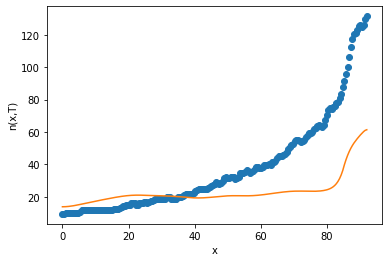

after perturb [9.457931477769051, 132.72769277641393, 21358.980309272432, 1.3923956496839276, 20.191334193252008]
parameters [9.457931477769051, 132.72769277641393, 21358.980309272432, 1.3923956496839276, 20.191334193252008]
oxigeno [3.99750058e-14 4.04950794e-14 4.20688740e-14 4.47374921e-14
 4.85707217e-14 5.36690033e-14 6.01662655e-14 6.82337173e-14
 7.80847106e-14 8.99808216e-14 1.04239336e-13 1.21242366e-13
 1.41447881e-13 1.65402978e-13 1.93759821e-13 2.27294711e-13
 2.66930895e-13 3.13765804e-13 3.69103565e-13 4.34493779e-13
 5.11777782e-13 6.03143789e-13 7.11192649e-13 8.39016215e-13
 9.90290763e-13 1.16938833e-12 1.38150941e-12 1.63284103e-12
 1.93074515e-12 2.28398309e-12 2.70298281e-12 3.20015730e-12
 3.79028358e-12 4.49095404e-12 5.32311351e-12 6.31169835e-12
 7.48639674e-12 8.88255296e-12 1.05422424e-11 1.25155493e-11
 1.48620854e-11 1.76527933e-11 2.09720885e-11 2.49204013e-11
 2.96171948e-11 3.52045433e-11 4.18513771e-11 4.97585144e-11
 5.91646238e-11 7.03532887e-11 8.36

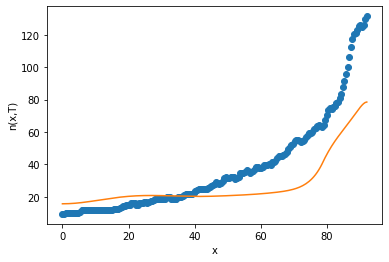

2
after perturb [-2.913214239114926, 136.22169460323408, 26162.10358906575, 6.994707576273585, 35.70006521783212]
parameters [-2.913214239114926, 136.22169460323408, 26162.10358906575, 6.994707576273585, 35.70006521783212]
after perturb [0.4646562105405243, 157.8705451912553, 20705.14391612694, 2.3357452357396884, 7.001306898208532]
parameters [0.4646562105405243, 157.8705451912553, 20705.14391612694, 2.3357452357396884, 7.001306898208532]
after perturb [6.686479234515126, 149.6920459069905, 16764.283374907864, 3.4953790539044807, 20.918665997579225]
parameters [6.686479234515126, 149.6920459069905, 16764.283374907864, 3.4953790539044807, 20.918665997579225]
after perturb [12.505482936273417, 167.85431227899215, 17300.662959636145, 7.814750364625931, 40.655945842029254]
parameters [12.505482936273417, 167.85431227899215, 17300.662959636145, 7.814750364625931, 40.655945842029254]
after perturb [-2.537829215226357, 92.95570543816359, 32088.902425705615, 4.86070953093386, 24.7207528622360

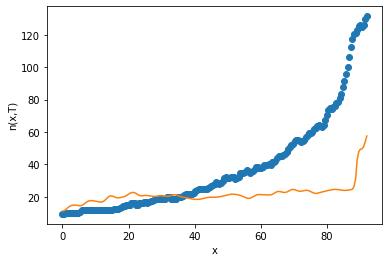

after perturb [2.19263679116, 132.72765228885365, 25987.223411324816, 8.944764673860858, 11.79795997816299]
parameters [2.19263679116, 132.72765228885365, 25987.223411324816, 8.944764673860858, 11.79795997816299]
oxigeno [5.33274217e-34 5.66633317e-34 6.70937989e-34 8.59443797e-34
 1.15623832e-33 1.59953850e-33 2.24696441e-33 3.18356616e-33
 4.53379346e-33 6.47919477e-33 9.28450722e-33 1.33360900e-32
 1.91985674e-32 2.76983930e-32 4.00472824e-32 5.80247917e-32
 8.42487776e-32 1.22576667e-31 1.78701767e-31 2.61040904e-31
 3.82058013e-31 5.60241243e-31 8.23061387e-31 1.21140632e-30
 1.78623876e-30 2.63860785e-30 3.90472618e-30 5.78870682e-30
 8.59689665e-30 1.27897839e-29 1.90605668e-29 2.84542073e-29
 4.25480176e-29 6.37258436e-29 9.55947103e-29 1.43618408e-28
 2.16081522e-28 3.25556797e-28 4.91139003e-28 7.41845499e-28
 1.12179142e-27 1.69806175e-27 2.57267784e-27 3.90077344e-27
 5.91817799e-27 8.98323709e-27 1.36401607e-26 2.07148978e-26
 3.14601250e-26 4.77743655e-26 7.25329595e-26 1

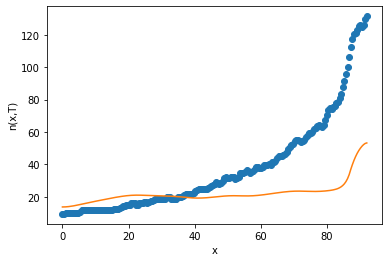

after perturb [3.93134260640034, 82.3484582712426, 31959.605463242005, 16.05785412536516, 7.117436082459534]
parameters [3.93134260640034, 82.3484582712426, 31959.605463242005, 16.05785412536516, 7.117436082459534]
after perturb [2.505634290692724, 71.8001254854553, 35435.59229588075, 12.507705912799208, 5.942516007019037]
parameters [2.505634290692724, 71.8001254854553, 35435.59229588075, 12.507705912799208, 5.942516007019037]
after perturb [3.6573113953508543, 96.2865829264461, 27419.267119949156, 4.364145606709465, 30.706564048023015]
parameters [3.6573113953508543, 96.2865829264461, 27419.267119949156, 4.364145606709465, 30.706564048023015]
oxigeno [1.97834283e-28 2.07313758e-28 2.36666411e-28 2.88727773e-28
 3.68543276e-28 4.83883880e-28 6.46044791e-28 8.71014524e-28
 1.18114268e-27 1.60749072e-27 2.19312724e-27 2.99773666e-27
 4.10406128e-27 5.62690819e-27 7.72575149e-27 1.06223815e-26
 1.46256487e-26 2.01661930e-26 2.78452441e-26 3.85032720e-26
 5.33166734e-26 7.39340950e-26 1.0

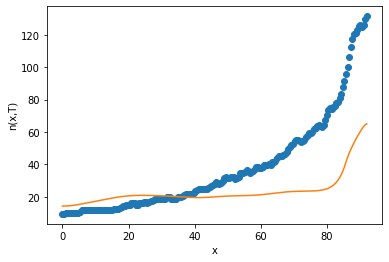

after perturb [-1.493939288742638, 92.03423663448311, 20325.958712495147, 4.942043856137225, 52.68589252156005]
parameters [-1.493939288742638, 92.03423663448311, 20325.958712495147, 4.942043856137225, 52.68589252156005]
after perturb [4.816839817681058, 111.1446279731203, 30661.04034839223, 4.539781984021683, 7.451709404358159]
parameters [4.816839817681058, 111.1446279731203, 30661.04034839223, 4.539781984021683, 7.451709404358159]
after perturb [5.450196944250369, 136.81307238278833, 32065.997748858565, 10.926846103834347, -1.3617344966544636]
parameters [5.450196944250369, 136.81307238278833, 32065.997748858565, 10.926846103834347, -1.3617344966544636]
after perturb [-5.141489435436777, 88.58768478691582, 32156.662302827182, 14.712083291746211, 22.468629809078884]
parameters [-5.141489435436777, 88.58768478691582, 32156.662302827182, 14.712083291746211, 22.468629809078884]
after perturb [2.0428542993750756, 111.87040030487329, 18210.19419400746, 2.3599576494225625, 15.1634487557038

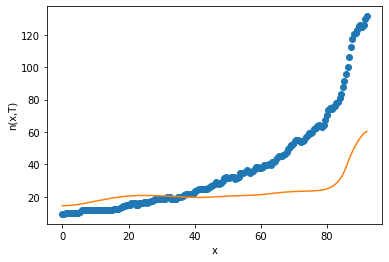

after perturb [15.843050312593016, 25.48085309226055, 30289.495009857812, -2.6875082610089573, -8.687227352551812]
parameters [15.843050312593016, 25.48085309226055, 30289.495009857812, -2.6875082610089573, -8.687227352551812]
after perturb [7.868455225737774, 185.35030712648847, 25104.200861722267, 7.364836496887259, 16.920508159759844]
parameters [7.868455225737774, 185.35030712648847, 25104.200861722267, 7.364836496887259, 16.920508159759844]
after perturb [9.823163130355258, 114.01489169711309, 16805.356808821423, 6.49010784139595, 25.347371058148365]
parameters [9.823163130355258, 114.01489169711309, 16805.356808821423, 6.49010784139595, 25.347371058148365]
after perturb [15.130988450744045, 70.91235746674626, 28614.742689497998, 0.42668948662354456, -3.5061057413821874]
parameters [15.130988450744045, 70.91235746674626, 28614.742689497998, 0.42668948662354456, -3.5061057413821874]
after perturb [13.085860062751909, 126.70677749690662, 26520.156238291296, 4.321643628160001, 22.257

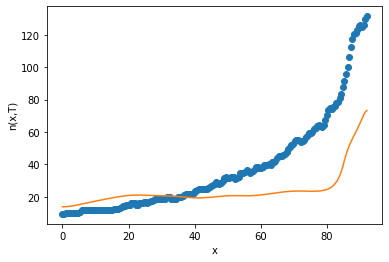

3
after perturb [-4.378255216158313, 149.42350410513174, 28420.55668364387, 8.548960512420422, 13.992765585765486]
parameters [-4.378255216158313, 149.42350410513174, 28420.55668364387, 8.548960512420422, 13.992765585765486]
after perturb [-4.258622994034498, 90.87943707147517, 27196.632808193288, 16.951566594966977, 22.946225067116437]
parameters [-4.258622994034498, 90.87943707147517, 27196.632808193288, 16.951566594966977, 22.946225067116437]
after perturb [-2.9423029701023045, 182.36907333459817, 16184.11071300358, 12.103698660263156, 51.47545617741453]
parameters [-2.9423029701023045, 182.36907333459817, 16184.11071300358, 12.103698660263156, 51.47545617741453]
after perturb [6.17944473771734, 118.39988100077802, 18155.89627133063, 7.118332045249202, 31.353531105880833]
parameters [6.17944473771734, 118.39988100077802, 18155.89627133063, 7.118332045249202, 31.353531105880833]
after perturb [-0.5305123199074242, 155.49748431593133, 36455.78924304202, 8.581875718178447, -11.14531968

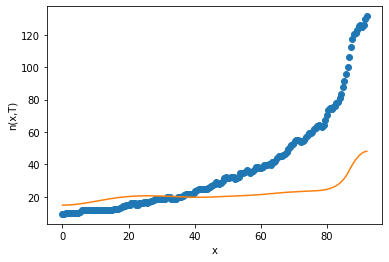

after perturb [7.350888442230678, 183.64041901579083, 23559.224348080865, 9.501752019082888, 40.197235502041366]
parameters [7.350888442230678, 183.64041901579083, 23559.224348080865, 9.501752019082888, 40.197235502041366]
after perturb [-1.3529979595348918, 100.98312123476376, 31385.93825378835, 14.5736596454006, 17.316922918034237]
parameters [-1.3529979595348918, 100.98312123476376, 31385.93825378835, 14.5736596454006, 17.316922918034237]
after perturb [7.775896018509869, 138.84652712277835, 24210.738571104575, -5.987720757252139, -7.131517521081058]
parameters [7.775896018509869, 138.84652712277835, 24210.738571104575, -5.987720757252139, -7.131517521081058]
after perturb [4.92116506450196, 134.05179048449602, 21138.69305564028, 4.40399795945117, 43.59941033866684]
parameters [4.92116506450196, 134.05179048449602, 21138.69305564028, 4.40399795945117, 43.59941033866684]
oxigeno [4.72153396e-24 4.88219330e-24 5.37519325e-24 6.23440266e-24
 7.51900921e-24 9.31785412e-24 1.17559703e-23

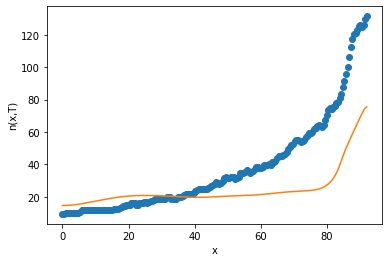

4
after perturb [5.652432182277396, 145.75230892266168, 18956.147556240823, 1.0041100326692194, 16.30606036255541]
parameters [5.652432182277396, 145.75230892266168, 18956.147556240823, 1.0041100326692194, 16.30606036255541]
after perturb [5.314122554154666, 188.87669893229912, 21667.842731693927, 17.764174812417995, 50.78456185153704]
parameters [5.314122554154666, 188.87669893229912, 21667.842731693927, 17.764174812417995, 50.78456185153704]
after perturb [10.450227825003783, 94.31774473346105, 27450.93641995166, 3.022846076033512, 19.365721963209904]
parameters [10.450227825003783, 94.31774473346105, 27450.93641995166, 3.022846076033512, 19.365721963209904]
after perturb [-1.8298673745231202, 91.15563548932914, 20921.14281750752, 4.473562894830199, 57.76639911784682]
parameters [-1.8298673745231202, 91.15563548932914, 20921.14281750752, 4.473562894830199, 57.76639911784682]
after perturb [11.616665236364392, 136.24382402974064, 24947.140956334253, 4.349645729763347, 22.8027020822744

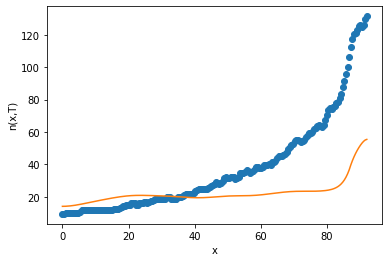

after perturb [4.865187804853927, 197.1643654506766, 22465.9982696461, 5.023235189811896, 1.4604687188027556]
parameters [4.865187804853927, 197.1643654506766, 22465.9982696461, 5.023235189811896, 1.4604687188027556]
after perturb [1.312294216372302, 53.094676479410644, 22266.302310334282, 3.2767945785392727, 42.54318816616702]
parameters [1.312294216372302, 53.094676479410644, 22266.302310334282, 3.2767945785392727, 42.54318816616702]
oxigeno [7.66885317e-34 8.20851463e-34 9.90428452e-34 1.29982251e-33
 1.79346493e-33 2.54282391e-33 3.65741812e-33 5.30180120e-33
 7.72126726e-33 1.12804753e-32 1.65213534e-32 2.42498840e-32
 3.56662370e-32 5.25600054e-32 7.76032387e-32 1.14790390e-31
 1.70099038e-31 2.52482650e-31 3.75363571e-31 5.58881263e-31
 8.33284094e-31 1.24405769e-30 1.85969773e-30 2.78351877e-30
 4.17163185e-30 6.26035822e-30 9.40807723e-30 1.41591485e-29
 2.13415798e-29 3.22162763e-29 4.87051632e-29 7.37400215e-29
 1.11796346e-28 1.69711316e-28 2.57938871e-28 3.92478419e-28
 5.

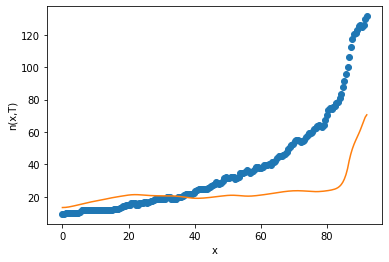

after perturb [5.49667296534593, 46.40698434761057, 29626.965102388232, -0.013100244814578055, 0.17719655185420535]
parameters [5.49667296534593, 46.40698434761057, 29626.965102388232, -0.013100244814578055, 0.17719655185420535]
after perturb [10.434641212856793, 150.85109134838342, 15684.858855005277, 3.6449222717178604, 83.86132519007634]
parameters [10.434641212856793, 150.85109134838342, 15684.858855005277, 3.6449222717178604, 83.86132519007634]
after perturb [-4.3342228744588045, 49.60189957290051, 26970.71648641394, 8.061209610432432, 7.798537385811905]
parameters [-4.3342228744588045, 49.60189957290051, 26970.71648641394, 8.061209610432432, 7.798537385811905]
after perturb [6.163285383482503, 111.47312373603714, 24550.968196385707, -4.868083268887753, 5.422983765653303]
parameters [6.163285383482503, 111.47312373603714, 24550.968196385707, -4.868083268887753, 5.422983765653303]
after perturb [-3.6757815594810173, 57.858334418480794, 22544.144678019784, -0.2583229795853059, 25.23

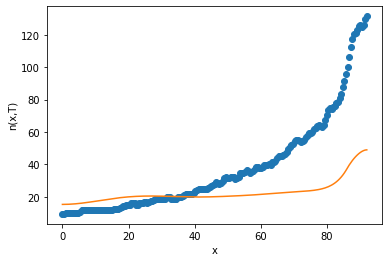

after perturb [10.28556984242444, 82.19804074835335, 22183.237255385313, 0.34539915260764253, 46.47750762935747]
parameters [10.28556984242444, 82.19804074835335, 22183.237255385313, 0.34539915260764253, 46.47750762935747]
after perturb [-1.239520774285007, 72.65176998687735, 29081.308207613918, 4.566949218351198, 58.44581869600677]
parameters [-1.239520774285007, 72.65176998687735, 29081.308207613918, 4.566949218351198, 58.44581869600677]
after perturb [11.042515366464128, 71.11953388686841, 18012.092314378515, 2.8200804635961987, 46.38750772455122]
parameters [11.042515366464128, 71.11953388686841, 18012.092314378515, 2.8200804635961987, 46.38750772455122]
after perturb [4.110116283490119, 120.4884967948221, 22816.050943459093, 6.180047509254798, 57.04257128591537]
parameters [4.110116283490119, 120.4884967948221, 22816.050943459093, 6.180047509254798, 57.04257128591537]
after perturb [5.587472154918544, 21.885609346268247, 40941.33594089308, 5.238541686355504, -14.69688320967725]
pa

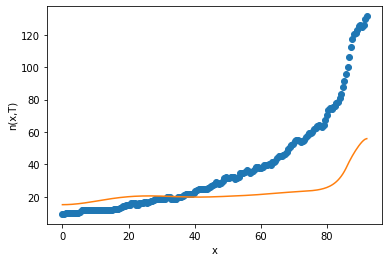

after perturb [3.821436641527394, 78.17103068508933, 23103.519073037827, 7.102968100782524, 33.15334675569383]
parameters [3.821436641527394, 78.17103068508933, 23103.519073037827, 7.102968100782524, 33.15334675569383]
oxigeno [1.07990296e-39 1.18026837e-39 1.50007406e-39 2.09903423e-39
 3.08934235e-39 4.65733550e-39 7.09971525e-39 1.08816759e-38
 1.67288307e-38 2.57719018e-38 3.97742856e-38 6.14902737e-38
 9.52298007e-38 1.47750366e-37 2.29668297e-37 3.57695951e-37
 5.58194896e-37 8.72829632e-37 1.36758013e-36 2.14713456e-36
 3.37791501e-36 5.32497845e-36 8.41125589e-36 1.33128111e-35
 2.11122698e-35 3.35463338e-35 5.34056798e-35 8.51820118e-35
 1.36116471e-34 2.17900603e-34 3.49439444e-34 5.61345068e-34
 9.03251947e-34 1.45573730e-33 2.34976125e-33 3.79839309e-33
 6.14861877e-33 9.96597970e-33 1.61728960e-32 2.62747752e-32
 4.27296578e-32 6.95525138e-32 1.13303037e-31 1.84699982e-31
 3.01258677e-31 4.91598663e-31 8.02476053e-31 1.31025873e-30
 2.13964187e-30 3.49415616e-30 5.70587268

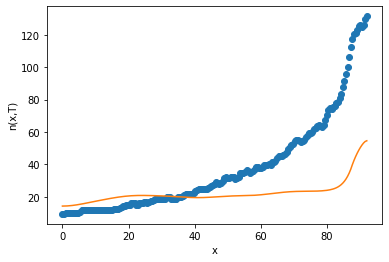

after perturb [10.047376437597334, 77.52026489002367, 20080.488359264258, -6.317044029961569, 25.72909371635344]
parameters [10.047376437597334, 77.52026489002367, 20080.488359264258, -6.317044029961569, 25.72909371635344]
after perturb [1.3970627009316874, 149.32302589080192, 17943.359700564604, 6.220866248497638, 25.06236467366673]
parameters [1.3970627009316874, 149.32302589080192, 17943.359700564604, 6.220866248497638, 25.06236467366673]
after perturb [4.5363596674488385, 115.68523778131642, 17643.894766225865, 6.033618032971083, 42.23083585553985]
parameters [4.5363596674488385, 115.68523778131642, 17643.894766225865, 6.033618032971083, 42.23083585553985]
after perturb [-4.073531148643436, 172.24888051195455, 31173.61910193721, 17.91796566287665, 49.41261864346206]
parameters [-4.073531148643436, 172.24888051195455, 31173.61910193721, 17.91796566287665, 49.41261864346206]
after perturb [-0.03364820349476716, 60.417229938592854, 18936.370115733414, 5.836336639661019, 27.45028112424

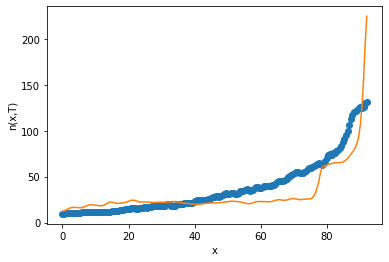

5
after perturb [3.8975714692080903, 149.91477147557285, 17232.773106294666, 9.204807283083252, 22.356980124182197]
parameters [3.8975714692080903, 149.91477147557285, 17232.773106294666, 9.204807283083252, 22.356980124182197]
after perturb [4.894419264076979, 145.04999544037383, 18378.038079099915, 6.351822506449602, 46.591606648191316]
parameters [4.894419264076979, 145.04999544037383, 18378.038079099915, 6.351822506449602, 46.591606648191316]
after perturb [0.9515557726939168, 29.91984179458113, 22379.83144366299, 6.558450689553969, 66.9583369466539]
parameters [0.9515557726939168, 29.91984179458113, 22379.83144366299, 6.558450689553969, 66.9583369466539]
after perturb [2.769028083899242, 122.40564285357641, 24797.18095610015, 4.331890575941664, 37.39765657866717]
parameters [2.769028083899242, 122.40564285357641, 24797.18095610015, 4.331890575941664, 37.39765657866717]
oxigeno [5.16565881e-25 5.35112938e-25 5.92105573e-25 6.91705466e-25
 8.41215532e-25 1.05166290e-24 1.33868372e-24

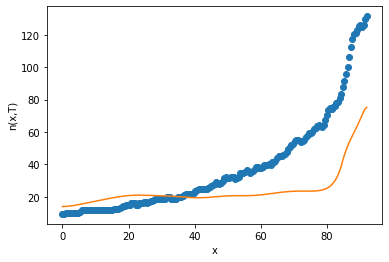

6
after perturb [9.900614240690551, 165.22118199929056, 21401.83976529816, 7.4109641461818345, -3.433446790795223]
parameters [9.900614240690551, 165.22118199929056, 21401.83976529816, 7.4109641461818345, -3.433446790795223]
after perturb [-1.0842559162355725, 142.5505766832083, 32433.651143421528, 4.556437677946096, 0.7667152367642203]
parameters [-1.0842559162355725, 142.5505766832083, 32433.651143421528, 4.556437677946096, 0.7667152367642203]
after perturb [7.513229260876713, 143.55277954951382, 24822.141745744837, 11.919809503341986, 16.873208239354394]
parameters [7.513229260876713, 143.55277954951382, 24822.141745744837, 11.919809503341986, 16.873208239354394]
after perturb [5.32179541514313, 18.73741318745382, 26376.417096899582, -2.299667150422398, 21.03197392747082]
parameters [5.32179541514313, 18.73741318745382, 26376.417096899582, -2.299667150422398, 21.03197392747082]
after perturb [3.0440727770885476, 61.24455452576747, 23219.951823687006, 0.0913919794336131, 4.7791649213

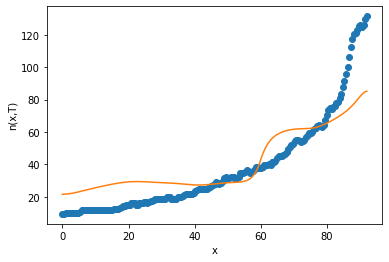

7
after perturb [2.857237126858431, 38.42763067821093, 30640.50069831935, 9.853901852173891, 26.750343818453743]
parameters [2.857237126858431, 38.42763067821093, 30640.50069831935, 9.853901852173891, 26.750343818453743]
after perturb [1.855143596842951, 103.75012559044644, 27601.67008031533, 15.131273765134935, 22.768257659319115]
parameters [1.855143596842951, 103.75012559044644, 27601.67008031533, 15.131273765134935, 22.768257659319115]
after perturb [5.916430245312316, 170.91679945503188, 18801.880201820415, 12.01454963360342, 21.491422245825532]
parameters [5.916430245312316, 170.91679945503188, 18801.880201820415, 12.01454963360342, 21.491422245825532]
after perturb [4.515523836553715, 71.72581879753199, 29687.07431983362, 7.884760033840862, 34.065659295144215]
parameters [4.515523836553715, 71.72581879753199, 29687.07431983362, 7.884760033840862, 34.065659295144215]
after perturb [0.9356324050549965, 81.20198584349399, 12867.715387016699, 5.824974234681792, 83.11528945479816]
pa

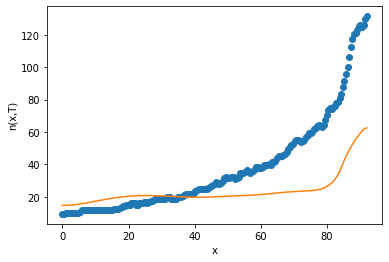

after perturb [4.241980982074985, 119.55338552481503, 19603.50124239238, 13.62242085034621, 62.04580895519935]
parameters [4.241980982074985, 119.55338552481503, 19603.50124239238, 13.62242085034621, 62.04580895519935]
after perturb [6.707578177569504, 123.62012793956934, 21114.130677461908, -0.6977923399685073, 23.003965249366047]
parameters [6.707578177569504, 123.62012793956934, 21114.130677461908, -0.6977923399685073, 23.003965249366047]
after perturb [-1.3265106141284047, 131.3454407573708, 29019.747949775057, 8.3188364431615, 27.194462526993462]
parameters [-1.3265106141284047, 131.3454407573708, 29019.747949775057, 8.3188364431615, 27.194462526993462]
after perturb [4.779547822777914, 80.01999886647991, 32392.58335207344, 8.622462846095326, 14.790403021907931]
parameters [4.779547822777914, 80.01999886647991, 32392.58335207344, 8.622462846095326, 14.790403021907931]
after perturb [2.9376052943034097, 138.6373768957352, 23317.8167441087, 8.408580382146887, 23.97493596281381]
para

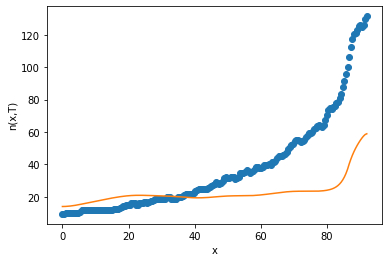

after perturb [-1.6707894779042405, 74.29180688425222, 31681.997041433602, 11.453924342082168, 56.30967080807396]
parameters [-1.6707894779042405, 74.29180688425222, 31681.997041433602, 11.453924342082168, 56.30967080807396]
after perturb [8.104033835779221, 129.49986301511433, 30225.813686318303, 8.651229034576158, -16.241482559148743]
parameters [8.104033835779221, 129.49986301511433, 30225.813686318303, 8.651229034576158, -16.241482559148743]
after perturb [3.5659205206119324, 110.81457028292856, 19915.938961576856, 11.80966814322425, 101.22377112947535]
parameters [3.5659205206119324, 110.81457028292856, 19915.938961576856, 11.80966814322425, 101.22377112947535]
after perturb [15.697298905007122, 178.3214855692548, 21011.689274282362, 5.515569431756466, 25.692069412307763]
parameters [15.697298905007122, 178.3214855692548, 21011.689274282362, 5.515569431756466, 25.692069412307763]
after perturb [-3.581151153757996, 51.15744186747108, 22978.914585692888, 14.021965825241187, 61.32245

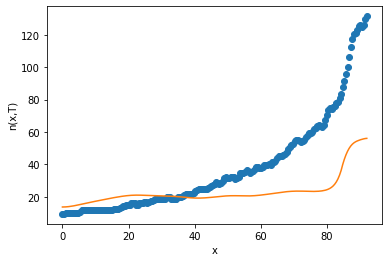

after perturb [2.151750003154733, 50.000766642440176, 32411.36049755936, 13.32144775960618, 51.51179145535327]
parameters [2.151750003154733, 50.000766642440176, 32411.36049755936, 13.32144775960618, 51.51179145535327]
after perturb [-0.8774579026225942, 127.18709114114768, 22403.394283586098, 8.959388431890453, 24.871361617810262]
parameters [-0.8774579026225942, 127.18709114114768, 22403.394283586098, 8.959388431890453, 24.871361617810262]
after perturb [10.01776449984381, 114.66341084614733, 26512.806897667368, 0.6993341159682367, 20.23367385311197]
parameters [10.01776449984381, 114.66341084614733, 26512.806897667368, 0.6993341159682367, 20.23367385311197]
after perturb [5.695680166318093, 8.376256203692122, 21220.81509613532, 3.9644456146482927, 48.192243436304395]
parameters [5.695680166318093, 8.376256203692122, 21220.81509613532, 3.9644456146482927, 48.192243436304395]
after perturb [-4.773885543405486, 80.5119701964692, 22901.93337513667, -5.257689844785489, 19.62772069570012]

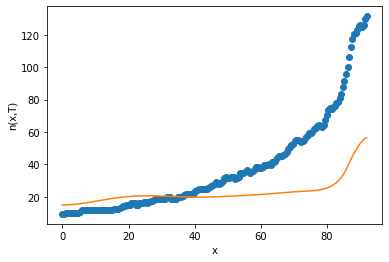

after perturb [10.91953322590843, 202.72666827663565, 29712.62702768302, 2.3388195850461337, -21.53183569688825]
parameters [10.91953322590843, 202.72666827663565, 29712.62702768302, 2.3388195850461337, -21.53183569688825]
after perturb [5.248922662606538, 90.72862500399623, 30111.21583428431, -2.5105531232633123, 2.2785224181483876]
parameters [5.248922662606538, 90.72862500399623, 30111.21583428431, -2.5105531232633123, 2.2785224181483876]
after perturb [4.850022495345215, 223.79560530628353, 22311.25601782355, 3.849207340637045, -11.04324724998565]
parameters [4.850022495345215, 223.79560530628353, 22311.25601782355, 3.849207340637045, -11.04324724998565]
after perturb [-2.4423303908460237, 25.538739002696133, 24993.868439551778, 2.721942129001084, 42.01163225441975]
parameters [-2.4423303908460237, 25.538739002696133, 24993.868439551778, 2.721942129001084, 42.01163225441975]
after perturb [15.385095773803686, 59.35702434557932, 27661.472311139136, -1.5504615888561297, 5.41710784149

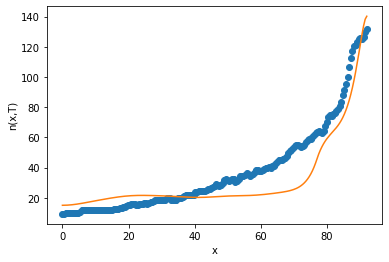

8
after perturb [1.3348102908374837, 140.91452227801616, 25656.613566322063, 8.754885243454577, 24.991762530831878]
parameters [1.3348102908374837, 140.91452227801616, 25656.613566322063, 8.754885243454577, 24.991762530831878]
oxigeno [1.59392517e-32 1.68312966e-32 1.96097555e-32 2.45946611e-32
 3.23646706e-32 4.38312922e-32 6.03563933e-32 8.39289370e-32
 1.17425212e-31 1.64988710e-31 2.32582989e-31 3.28795763e-31
 4.66008644e-31 6.62099436e-31 9.42920179e-31 1.34590539e-30
 1.92532798e-30 2.75996097e-30 3.96426027e-30 5.70471752e-30
 8.22383235e-30 1.18753548e-29 1.71762517e-29 2.48835475e-29
 3.61082149e-29 5.24842723e-29 7.64201239e-29 1.11472362e-28
 1.62901836e-28 2.38501020e-28 3.49825468e-28 5.14028039e-28
 7.56594058e-28 1.11542633e-27 1.64695742e-27 2.43531227e-27
 3.60606629e-27 5.34692790e-27 7.93884704e-27 1.18027967e-26
 1.75700610e-26 2.61876869e-26 3.90763927e-26 5.83665368e-26
 8.72500019e-26 1.30503945e-25 1.95269136e-25 2.92205315e-25
 4.37204903e-25 6.53934013e-25 9.

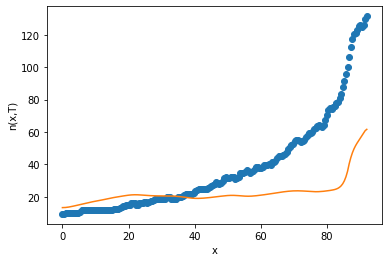

after perturb [4.902859179855776, 145.79482870957213, 26431.585442739964, 8.28417381138178, 20.512458244868476]
parameters [4.902859179855776, 145.79482870957213, 26431.585442739964, 8.28417381138178, 20.512458244868476]
oxigeno [3.27150231e-31 3.45238091e-31 4.01514169e-31 5.02249424e-31
 6.58702375e-31 8.88433710e-31 1.21736913e-30 1.68286723e-30
 2.33817697e-30 3.25884795e-30 4.55190974e-30 6.36899969e-30
 8.92513958e-30 1.25256146e-29 1.76044962e-29 2.47799261e-29
 3.49335659e-29 4.93249385e-29 6.97562141e-29 9.88100299e-29
 1.40193177e-28 1.99233942e-28 2.83602729e-28 4.04357486e-28
 5.77462169e-28 8.25994768e-28 1.18336154e-27 1.69798069e-27
 2.44011388e-27 3.51183917e-27 5.06162160e-27 7.30561669e-27
 1.05588377e-26 1.52807797e-26 2.21422366e-26 3.21231957e-26
 4.66563055e-26 6.78371796e-26 9.87327168e-26 1.43833146e-25
 2.09714785e-25 3.06011669e-25 4.46839769e-25 6.52884253e-25
 9.54457688e-25 1.39597962e-24 2.04253601e-24 2.98948104e-24
 4.37648701e-24 6.40809524e-24 9.383763

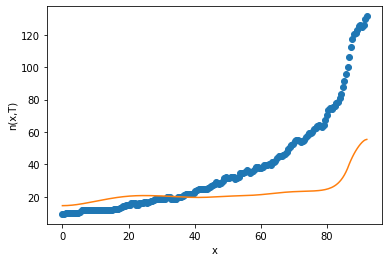

after perturb [6.651154645016491, 106.63295831331537, 24806.10455281545, 1.5762980961675668, 1.1124492553520646]
parameters [6.651154645016491, 106.63295831331537, 24806.10455281545, 1.5762980961675668, 1.1124492553520646]
oxigeno [1.95464390e-17 1.99071727e-17 2.10027315e-17 2.28737176e-17
 2.55895878e-17 2.92514130e-17 3.39959051e-17 4.00008818e-17
 4.74924058e-17 5.67539009e-17 6.81376404e-17 8.20791010e-17
 9.91148043e-17 1.19904420e-16 1.45258093e-16 1.76170191e-16
 2.13860945e-16 2.59827820e-16 3.15908879e-16 3.84360937e-16
 4.67955966e-16 5.70100037e-16 6.94980074e-16 8.47744961e-16
 1.03472907e-15 1.26372814e-15 1.54433992e-15 1.88838455e-15
 2.31042360e-15 2.82840082e-15 3.46443298e-15 4.24578599e-15
 5.20607943e-15 6.38677284e-15 7.83899903e-15 9.62582517e-15
 1.18250405e-14 1.45325923e-14 1.78668202e-14 2.19736712e-14
 2.70331216e-14 3.32670821e-14 4.09491242e-14 5.04164440e-14
 6.20845721e-14 7.64654521e-14 9.41896530e-14 1.16033647e-13
 1.42953295e-13 1.76124944e-13 2.1699

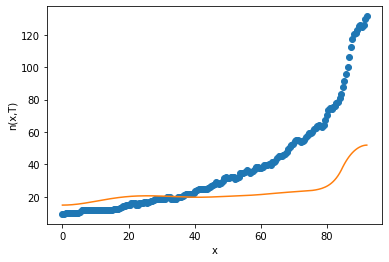

after perturb [3.494196236272885, 141.2765404353683, 31401.778386150694, 6.237681031728273, 2.074766770267644]
parameters [3.494196236272885, 141.2765404353683, 31401.778386150694, 6.237681031728273, 2.074766770267644]
after perturb [-2.3099822942360984, 82.66085001188415, 25020.17286494953, 1.851895449926162, -5.418973367964982]
parameters [-2.3099822942360984, 82.66085001188415, 25020.17286494953, 1.851895449926162, -5.418973367964982]
after perturb [0.4348907470592964, 116.72645561155538, 13828.70603461644, 1.5591117022458123, 67.8602032467632]
parameters [0.4348907470592964, 116.72645561155538, 13828.70603461644, 1.5591117022458123, 67.8602032467632]
after perturb [4.001023041722054, 102.23470795680261, 26914.393057068435, 0.5069493779397094, 16.083806119772937]
parameters [4.001023041722054, 102.23470795680261, 26914.393057068435, 0.5069493779397094, 16.083806119772937]
oxigeno [3.58675481e-10 3.61008000e-10 3.68041458e-10 3.79884179e-10
 3.96718780e-10 4.18805323e-10 4.46485797e-

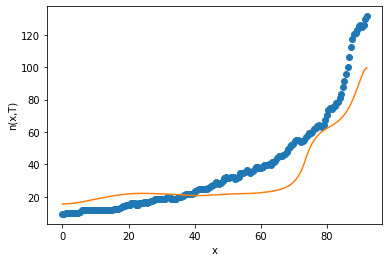

9
after perturb [10.116603178728422, 80.01500550128318, 27415.124285995124, -0.42455243291678313, -36.12135231474342]
parameters [10.116603178728422, 80.01500550128318, 27415.124285995124, -0.42455243291678313, -36.12135231474342]
after perturb [3.832660698827909, 114.37065434078093, 28070.938886155505, 9.732827978620271, 8.440338465892609]
parameters [3.832660698827909, 114.37065434078093, 28070.938886155505, 9.732827978620271, 8.440338465892609]
oxigeno [3.14410857e-38 3.40148294e-38 4.21595750e-38 5.72180029e-38
 8.16812921e-38 1.19616833e-37 1.77371537e-37 2.64678612e-37
 3.96370664e-37 5.95015959e-37 8.94969852e-37 1.34860459e-36
 2.03590191e-36 3.07924877e-36 4.66630057e-36 7.08537689e-36
 1.07803629e-35 1.64360239e-35 2.51108269e-35 3.84440978e-35
 5.89796994e-35 9.06726599e-35 1.39683530e-34 2.15625981e-34
 3.33529473e-34 5.16931756e-34 8.02759085e-34 1.24903893e-33
 1.94710622e-33 3.04094664e-33 4.75788792e-33 7.45735210e-33
 1.17083778e-32 1.84130054e-32 2.90028202e-32 4.5752

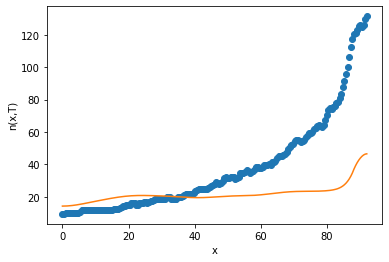

after perturb [5.808934009014279, 188.2626627328827, 24647.023142415484, 9.509656131291262, 18.090526192816608]
parameters [5.808934009014279, 188.2626627328827, 24647.023142415484, 9.509656131291262, 18.090526192816608]
after perturb [1.8858180968225655, 174.04214741904343, 27841.54471255507, 6.2193212792544195, 16.566881850087803]
parameters [1.8858180968225655, 174.04214741904343, 27841.54471255507, 6.2193212792544195, 16.566881850087803]
after perturb [-0.14936880202763625, 70.55849865386568, 28990.955463767667, 4.241735313720197, 2.5977210841506295]
parameters [-0.14936880202763625, 70.55849865386568, 28990.955463767667, 4.241735313720197, 2.5977210841506295]
after perturb [3.251913357566398, 142.16875547327334, 22794.631572298815, -0.1053317529852471, 15.714793919244888]
parameters [3.251913357566398, 142.16875547327334, 22794.631572298815, -0.1053317529852471, 15.714793919244888]
after perturb [5.760566654334439, 100.02110040225675, 34707.016726680195, 17.526109372403887, 25.356

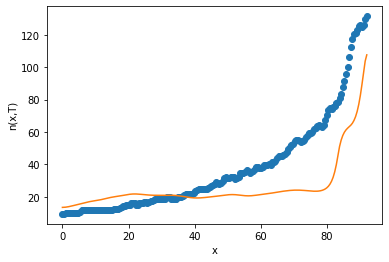

10
after perturb [-1.9173857549189584, 117.15218047766857, 29224.78937775573, 6.28129733951793, 23.220909153716608]
parameters [-1.9173857549189584, 117.15218047766857, 29224.78937775573, 6.28129733951793, 23.220909153716608]
after perturb [1.2944055793922715, 112.37744936430045, 30453.99694876382, 12.541049360582063, 17.955210587441123]
parameters [1.2944055793922715, 112.37744936430045, 30453.99694876382, 12.541049360582063, 17.955210587441123]
after perturb [2.6527703773772213, 136.4216040185033, 29000.70375817893, 9.36723228139153, 22.94777287160474]
parameters [2.6527703773772213, 136.4216040185033, 29000.70375817893, 9.36723228139153, 22.94777287160474]
after perturb [7.853909989200895, 89.9469607711589, 29127.188952697856, 6.36183740259675, -2.826715001199311]
parameters [7.853909989200895, 89.9469607711589, 29127.188952697856, 6.36183740259675, -2.826715001199311]
after perturb [2.2409785808195894, 114.59035709672908, 24138.731182379724, 7.069568127127681, 59.654239852818314]
p

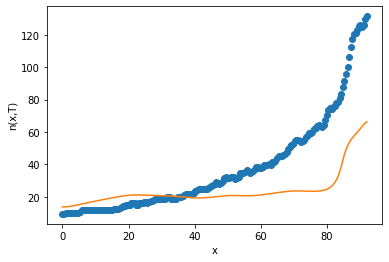

11
after perturb [3.639559572895267, 139.07704361909651, 17205.846132950453, 5.815329839899457, 63.82350581895709]
parameters [3.639559572895267, 139.07704361909651, 17205.846132950453, 5.815329839899457, 63.82350581895709]
after perturb [1.6600606300453895, 67.33341171935027, 24518.094275860778, 0.040178188741292864, -23.696331223003718]
parameters [1.6600606300453895, 67.33341171935027, 24518.094275860778, 0.040178188741292864, -23.696331223003718]
after perturb [-0.7339587158238636, 159.990018318377, 31044.31201821086, 14.931754459369989, 36.09648130262977]
parameters [-0.7339587158238636, 159.990018318377, 31044.31201821086, 14.931754459369989, 36.09648130262977]
after perturb [-1.1319185549340371, 43.84519007337362, 32994.75531065677, 5.149864436221812, 39.464248085825545]
parameters [-1.1319185549340371, 43.84519007337362, 32994.75531065677, 5.149864436221812, 39.464248085825545]
after perturb [-5.600789587310873, 164.72117011620088, 37718.65124480973, 11.932075983595578, -20.650

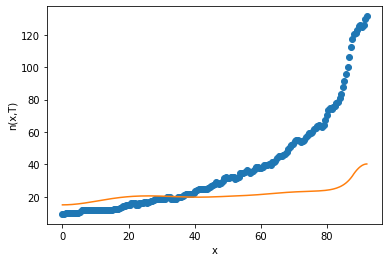

after perturb [3.823082536386793, 76.1441696142372, 33491.8939696511, 11.550044236671534, 27.170960937850722]
parameters [3.823082536386793, 76.1441696142372, 33491.8939696511, 11.550044236671534, 27.170960937850722]
after perturb [3.395667313933864, 41.50065166186404, 17790.22203892071, 5.194716324410242, 75.60304612505357]
parameters [3.395667313933864, 41.50065166186404, 17790.22203892071, 5.194716324410242, 75.60304612505357]
after perturb [6.964561982990967, 131.27589224975895, 26286.1335303219, 0.8657599884526874, -8.315273678042324]
parameters [6.964561982990967, 131.27589224975895, 26286.1335303219, 0.8657599884526874, -8.315273678042324]
after perturb [6.355490642590292, 77.71330300126151, 16807.23335155799, 7.688607354256314, 36.67027111863386]
parameters [6.355490642590292, 77.71330300126151, 16807.23335155799, 7.688607354256314, 36.67027111863386]
after perturb [6.291829013730312, 98.97545843470263, 17511.188031789552, 3.659575184260371, 55.28143942911114]
parameters [6.291

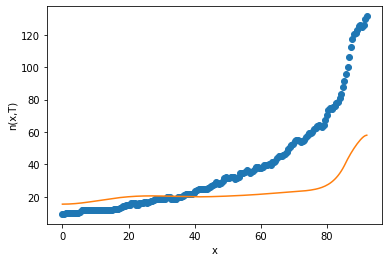

after perturb [5.757552349912576, 173.63765697781744, 33688.95174394926, 2.980209561540119, -15.086959374962092]
parameters [5.757552349912576, 173.63765697781744, 33688.95174394926, 2.980209561540119, -15.086959374962092]
after perturb [-3.8345087805786795, 67.4312647432634, 29767.318329739956, 8.523365214561565, 30.751682097156447]
parameters [-3.8345087805786795, 67.4312647432634, 29767.318329739956, 8.523365214561565, 30.751682097156447]
after perturb [5.676127097092924, 75.69643362407024, 23658.944113282294, 4.5331618908156734, 34.745567844883325]
parameters [5.676127097092924, 75.69643362407024, 23658.944113282294, 4.5331618908156734, 34.745567844883325]
oxigeno [1.02222580e-32 1.09010140e-32 1.30274774e-32 1.68845237e-32
 2.29863209e-32 3.21487546e-32 4.56017169e-32 6.51593666e-32
 9.34729371e-32 1.34402834e-31 1.93564494e-31 2.79128503e-31
 4.02993868e-31 5.82510046e-31 8.43007409e-31 1.22152044e-30
 1.77227315e-30 2.57477136e-30 3.74575659e-30 5.45688665e-30
 7.96091921e-30 1.

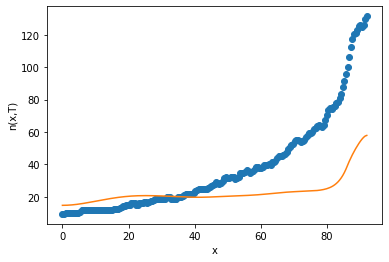

after perturb [11.16702839311351, 153.3517126444251, 11825.02086630694, -0.8465610384692538, 28.927353652078295]
parameters [11.16702839311351, 153.3517126444251, 11825.02086630694, -0.8465610384692538, 28.927353652078295]
after perturb [7.628423868560051, 98.7973684072912, 25643.900593328544, 11.082132231286216, 41.67773072648613]
parameters [7.628423868560051, 98.7973684072912, 25643.900593328544, 11.082132231286216, 41.67773072648613]
after perturb [1.7251215164527305, 142.5264165894381, 20501.28210878399, 6.257709408807164, 22.01821908597561]
parameters [1.7251215164527305, 142.5264165894381, 20501.28210878399, 6.257709408807164, 22.01821908597561]
oxigeno [1.42617122e-27 1.48503777e-27 1.66661398e-27 1.98629958e-27
 2.47137469e-27 3.16358961e-27 4.12314714e-27 5.43447909e-27
 7.21440374e-27 9.62349777e-27 1.28818519e-26 1.72908383e-26
 2.32631491e-26 3.13642372e-26 4.23694979e-26 5.73432115e-26
 7.77476146e-26 1.05593766e-25 1.43650514e-25 1.95734418e-25
 2.67112733e-25 3.65064624

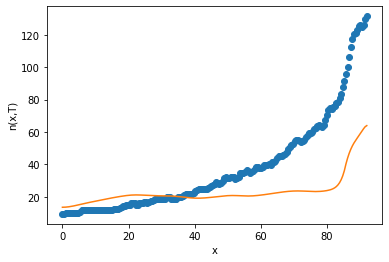

after perturb [-9.316852196736557, 44.67394209121436, 30769.328628621104, 2.3489666031440226, 57.15130697446634]
parameters [-9.316852196736557, 44.67394209121436, 30769.328628621104, 2.3489666031440226, 57.15130697446634]
after perturb [-0.41374297943942673, 55.008529312432266, 28420.282905675, 2.3127829166244274, 2.455479091699017]
parameters [-0.41374297943942673, 55.008529312432266, 28420.282905675, 2.3127829166244274, 2.455479091699017]
after perturb [-1.8240746364710265, 95.63488111787186, 31053.386770254256, 10.24945356339243, 19.019313713787803]
parameters [-1.8240746364710265, 95.63488111787186, 31053.386770254256, 10.24945356339243, 19.019313713787803]
after perturb [14.14896369474177, 127.47045957614176, 19698.030659302916, 3.2538694583533996, 24.206719215464098]
parameters [14.14896369474177, 127.47045957614176, 19698.030659302916, 3.2538694583533996, 24.206719215464098]
after perturb [9.424047357860374, 41.00326888879597, 28749.230503419072, 3.645230642420697, -0.368642402

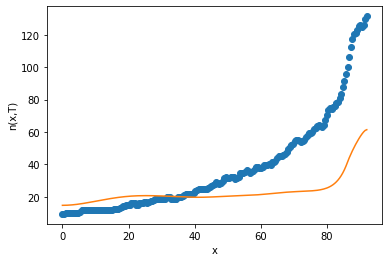

after perturb [-3.4615578086878824, -5.625307781088928, 36013.549729877785, 8.082515177116854, 40.91998576562224]
parameters [-3.4615578086878824, -5.625307781088928, 36013.549729877785, 8.082515177116854, 40.91998576562224]
after perturb [-2.591183619203619, 17.90857049498338, 28613.152993738007, 3.674394455449273, 25.72517347307285]
parameters [-2.591183619203619, 17.90857049498338, 28613.152993738007, 3.674394455449273, 25.72517347307285]
after perturb [2.6702190826334795, 93.84292080111618, 22597.460534961603, 9.35938720333727, 26.306934393144214]
parameters [2.6702190826334795, 93.84292080111618, 22597.460534961603, 9.35938720333727, 26.306934393144214]
oxigeno [3.46973002e-41 3.80119968e-41 4.85932403e-41 6.84798116e-41
 1.01520910e-40 1.54152835e-40 2.36708693e-40 3.65541728e-40
 5.66421135e-40 8.79940943e-40 1.37013253e-39 2.13819400e-39
 3.34441372e-39 5.24324591e-39 8.23953876e-39 1.29788509e-38
 2.04928107e-38 3.24335264e-38 5.14523533e-38 8.18131262e-38
 1.30386962e-37 2.08

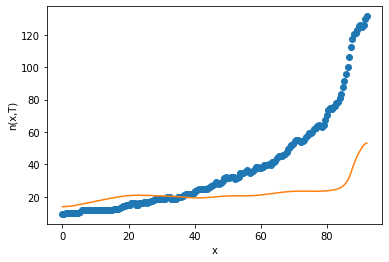

after perturb [3.4417054331823786, 85.50301823312822, 26443.978610658563, -1.0615087432473935, 28.893388496031847]
parameters [3.4417054331823786, 85.50301823312822, 26443.978610658563, -1.0615087432473935, 28.893388496031847]
after perturb [7.659620738829929, 86.99341103415105, 30780.795621651054, 6.565462930994588, 34.14732398738957]
parameters [7.659620738829929, 86.99341103415105, 30780.795621651054, 6.565462930994588, 34.14732398738957]
after perturb [4.065508264109744, 61.980138908603585, 27455.42371036566, 2.86628415229179, 37.04521706037069]
parameters [4.065508264109744, 61.980138908603585, 27455.42371036566, 2.86628415229179, 37.04521706037069]
oxigeno [2.15983778e-29 2.27932240e-29 2.65100650e-29 3.31609665e-29
 4.34850585e-29 5.86336769e-29 8.03036392e-29 1.10934832e-28
 1.53996228e-28 2.14395431e-28 2.99062346e-28 4.17779498e-28
 5.84362893e-28 8.18342042e-28 1.14735203e-27 1.61054253e-27
 2.26344111e-27 3.18489833e-27 4.48701627e-27 6.32935686e-27
 8.93929550e-27 1.264120

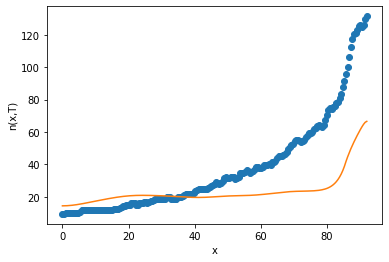

after perturb [6.81721476325148, 147.8770471721379, 26850.87475937651, 7.494732347108007, 33.31436326678951]
parameters [6.81721476325148, 147.8770471721379, 26850.87475937651, 7.494732347108007, 33.31436326678951]
oxigeno [1.83761892e-29 1.93082158e-29 2.21992515e-29 2.73441827e-29
 3.52689931e-29 4.67865528e-29 6.30832647e-29 8.58463064e-29
 1.17445855e-28 1.61193046e-28 2.21703268e-28 3.05406794e-28
 4.21266284e-28 5.81785441e-28 8.04428248e-28 1.11361815e-27
 1.54355751e-27 2.14220873e-27 2.97692267e-27 4.14240544e-27
 5.77200835e-27 8.05374534e-27 1.12530424e-26 1.57450820e-26
 2.20608362e-26 3.09526422e-26 4.34877018e-26 6.11815071e-26
 8.61883878e-26 1.21573834e-25 1.71703941e-25 2.42802684e-25
 3.43749764e-25 4.87223420e-25 6.91338010e-25 9.81991365e-25
 1.39623048e-24 1.98707834e-24 2.83045731e-24 4.03512065e-24
 5.75689977e-24 8.21914244e-24 1.17420302e-23 1.67846286e-23
 2.40051895e-23 3.43476144e-23 4.91653960e-23 7.03992406e-23
 1.00831544e-22 1.44450859e-22 2.06973711e-22

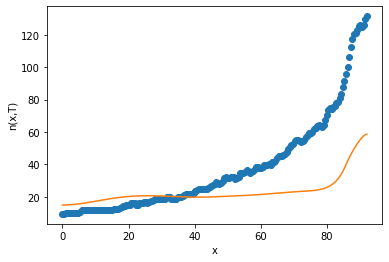

after perturb [0.44524594092379605, 144.97384386237948, 23941.1593128062, 0.8246636910479612, 8.857517337956104]
parameters [0.44524594092379605, 144.97384386237948, 23941.1593128062, 0.8246636910479612, 8.857517337956104]
oxigeno [1.27164941e-10 1.27993602e-10 1.30498069e-10 1.34732963e-10
 1.40786769e-10 1.48778780e-10 1.58856155e-10 1.71192066e-10
 1.85985832e-10 2.03465841e-10 2.23895805e-10 2.47584458e-10
 2.74898050e-10 3.06274094e-10 3.42234115e-10 3.83393191e-10
 4.30465078e-10 4.84263496e-10 5.45701913e-10 6.15795268e-10
 6.95667256e-10 7.86566373e-10 8.89893605e-10 1.00724449e-09
 1.14046739e-09 1.29173685e-09 1.46363572e-09 1.65923349e-09
 1.88214551e-09 2.13656212e-09 2.42724868e-09 2.75953429e-09
 3.13931989e-09 3.57313882e-09 4.06829138e-09 4.63305609e-09
 5.27696372e-09 6.01111453e-09 6.84852445e-09 7.80449088e-09
 8.89696337e-09 1.01468882e-08 1.15784814e-08 1.32193904e-08
 1.51007481e-08 1.72571868e-08 1.97269538e-08 2.25522927e-08
 2.57802128e-08 2.94636473e-08 3.3662

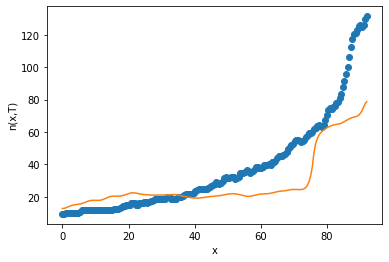

12
after perturb [0.298674681811373, 97.184232023204, 25381.846743977116, 5.770397903449988, 56.592097139849756]
parameters [0.298674681811373, 97.184232023204, 25381.846743977116, 5.770397903449988, 56.592097139849756]
after perturb [4.741336147644908, 121.16822140037107, 31206.631527352, 7.549900819219195, 29.845964571004448]
parameters [4.741336147644908, 121.16822140037107, 31206.631527352, 7.549900819219195, 29.845964571004448]
after perturb [6.79199037642549, 75.5727898250024, 21247.489243881813, -1.1319487208994632, 14.377440368009395]
parameters [6.79199037642549, 75.5727898250024, 21247.489243881813, -1.1319487208994632, 14.377440368009395]
after perturb [0.22529935012370284, 55.33797742285723, 25861.828271270635, 10.171112053142146, 37.6004877087771]
parameters [0.22529935012370284, 55.33797742285723, 25861.828271270635, 10.171112053142146, 37.6004877087771]
after perturb [5.246779463791861, 49.78940804831266, 31535.739446253843, -1.1570555809093195, -6.467334769250858]
param

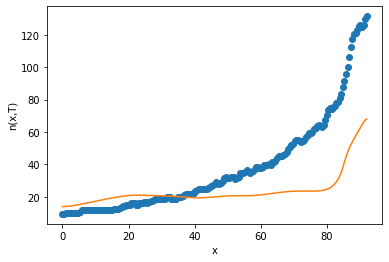

after perturb [2.1075581102677665, 98.23248166825331, 33764.489489440326, 6.890844325394495, 15.376441456787347]
parameters [2.1075581102677665, 98.23248166825331, 33764.489489440326, 6.890844325394495, 15.376441456787347]
after perturb [5.1903767657723785, 128.72151073948655, 23242.95122318042, 0.03490981824145045, 6.494561888826237]
parameters [5.1903767657723785, 128.72151073948655, 23242.95122318042, 0.03490981824145045, 6.494561888826237]
oxigeno [ 0.16970646  0.16969102  0.16964488  0.16956852  0.16946277  0.16932876
  0.16916793  0.16898203  0.16877307  0.16854335  0.16829541  0.16803204
  0.16775622  0.16747117  0.16718028  0.16688708  0.16659531  0.16630882
  0.16603159  0.16576772  0.16552144  0.16529707  0.16509901  0.16493176
  0.16479994  0.16470819  0.16466129  0.16466406  0.16472143  0.16483837
  0.16501996  0.16527135  0.16559776  0.16600449  0.16649695  0.16708059
  0.16776099  0.16854377  0.16943469  0.17043957  0.17156436  0.17281509
  0.17419791  0.1757191   0.17738

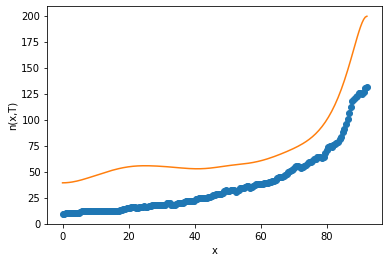

after perturb [6.780147848333579, 119.8138331517925, 28485.60813892125, 7.573893991966873, 37.779661703271756]
parameters [6.780147848333579, 119.8138331517925, 28485.60813892125, 7.573893991966873, 37.779661703271756]
oxigeno [6.28740086e-33 6.69114920e-33 7.95439065e-33 1.02399942e-32
 1.38432906e-32 1.92313590e-32 2.71054703e-32 3.84954104e-32
 5.48989500e-32 7.84862176e-32 1.12398156e-31 1.61182013e-31
 2.31427051e-31 3.32693441e-31 4.78871283e-31 6.90171668e-31
 9.96047871e-31 1.43948731e-30 2.08332637e-30 3.01955443e-30
 4.38304029e-30 6.37180987e-30 9.27703933e-30 1.35274726e-29
 1.97552766e-29 2.88937896e-29 4.23227594e-29 6.20843603e-29
 9.12047777e-29 1.34173366e-28 1.97657165e-28 2.91567147e-28
 4.30650411e-28 6.36869157e-28 9.42957082e-28 1.39773833e-27
 2.07408560e-27 3.08083057e-27 4.58059393e-27 6.81648198e-27
 1.01520635e-26 1.51312367e-26 2.25678815e-26 3.36801098e-26
 5.02912749e-26 7.51308926e-26 1.12285042e-25 1.67870335e-25
 2.51042142e-25 3.75502378e-25 5.61753566

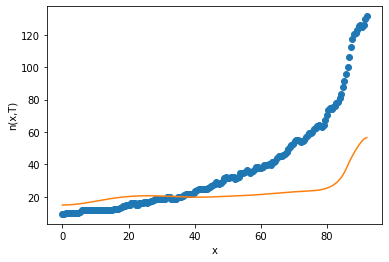

after perturb [2.1531290119481685, 118.30102862970115, 28249.00772986853, 4.315840393668371, 8.687403653275858]
parameters [2.1531290119481685, 118.30102862970115, 28249.00772986853, 4.315840393668371, 8.687403653275858]
oxigeno [1.28710649e-25 1.33447018e-25 1.48011208e-25 1.73497855e-25
 2.11831902e-25 2.65928732e-25 3.39937821e-25 4.39591523e-25
 5.72690006e-25 7.49765676e-25 9.84986692e-25 1.29738104e-24
 1.71249207e-24 2.26461637e-24 2.99982907e-24 3.98007592e-24
 5.28871255e-24 7.03801045e-24 9.37933981e-24 1.25170011e-23
 1.67270379e-23 2.23828584e-23 2.99901740e-23 4.02346998e-23
 5.40473462e-23 7.26933992e-23 9.78946154e-23 1.31996499e-22
 1.78197626e-22 2.40864234e-22 3.25961999e-22 4.41649032e-22
 5.99090680e-22 8.13579651e-22 1.10607642e-21 1.50532810e-21
 2.05078306e-21 2.79659950e-21 3.81715609e-21 5.21462298e-21
 7.12935447e-21 9.75414128e-21 1.33537344e-20 1.82915611e-20
 2.50662426e-20 3.43614628e-20 4.71140101e-20 6.46065551e-20
 8.85940970e-20 1.21476244e-19 1.665319

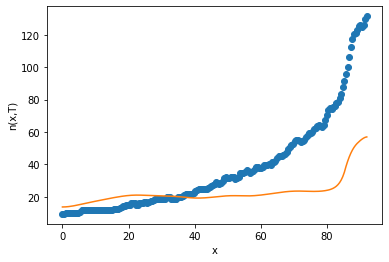

after perturb [1.6976597458548142, 113.9461146481949, 24023.818498918128, 1.5022571304791004, 8.607213688372585]
parameters [1.6976597458548142, 113.9461146481949, 24023.818498918128, 1.5022571304791004, 8.607213688372585]
oxigeno [5.91386481e-16 6.00402136e-16 6.27736961e-16 6.74265509e-16
 7.41482325e-16 8.31558606e-16 9.47424107e-16 1.09287708e-15
 1.27272617e-15 1.49296934e-15 1.76101657e-15 2.08596443e-15
 2.47893297e-15 2.95347715e-15 3.52608842e-15 4.21680524e-15
 5.04995600e-15 6.05506403e-15 7.26795141e-15 8.73208831e-15
 1.05002458e-14 1.26365237e-14 1.52188420e-14 1.83420005e-14
 2.21214368e-14 2.66978333e-14 3.22427581e-14 3.89655592e-14
 4.71217845e-14 5.70234560e-14 6.90516154e-14 8.36716522e-14
 1.01452062e-13 1.23087427e-13 1.49426605e-13 1.81507304e-13
 2.20598475e-13 2.68252188e-13 3.26366979e-13 3.97264950e-13
 4.83785324e-13 5.89397602e-13 7.18338095e-13 8.75774348e-13
 1.06800300e-12 1.30268789e-12 1.58914685e-12 1.93869776e-12
 2.36507674e-12 2.88494473e-12 3.5185

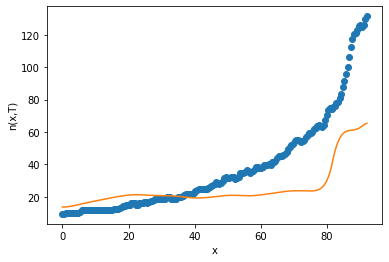

13
after perturb [5.802851699821785, 160.4644637428399, 27627.66219863781, 4.425500626854044, 1.5761200726766482]
parameters [5.802851699821785, 160.4644637428399, 27627.66219863781, 4.425500626854044, 1.5761200726766482]
after perturb [0.876845153786455, 21.57245792187274, 29310.387271198797, 9.322559609264529, 39.277678065040654]
parameters [0.876845153786455, 21.57245792187274, 29310.387271198797, 9.322559609264529, 39.277678065040654]
after perturb [2.550228862431551, 59.89124674721989, 27712.41367970425, 5.129176063671613, 28.269171143563774]
parameters [2.550228862431551, 59.89124674721989, 27712.41367970425, 5.129176063671613, 28.269171143563774]
oxigeno [4.04794747e-39 4.42071232e-39 5.60790999e-39 7.82944071e-39
 1.14984253e-38 1.73009682e-38 2.63296096e-38 4.02976587e-38
 6.18784060e-38 9.52393849e-38 1.46883073e-37 2.26970683e-37
 3.51409320e-37 5.45147717e-37 8.47388747e-37 1.31984693e-36
 2.05985115e-36 3.22116988e-36 5.04716493e-36 7.92366009e-36
 1.24633886e-35 1.9641107

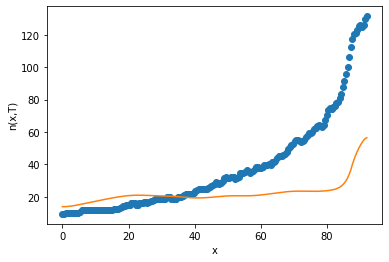

after perturb [3.4323067674655725, 55.95564035986491, 33425.850925169485, 6.322635865059373, 18.23638765832356]
parameters [3.4323067674655725, 55.95564035986491, 33425.850925169485, 6.322635865059373, 18.23638765832356]
after perturb [1.2535976230002959, 140.39925935672215, 29175.243623242608, 2.235588110981354, 28.751504395507887]
parameters [1.2535976230002959, 140.39925935672215, 29175.243623242608, 2.235588110981354, 28.751504395507887]
after perturb [3.399351573069887, 91.25792375917061, 27344.959194028488, 4.283947311842176, 16.58346034713351]
parameters [3.399351573069887, 91.25792375917061, 27344.959194028488, 4.283947311842176, 16.58346034713351]
oxigeno [4.69407987e-29 4.92829698e-29 5.65447210e-29 6.94566554e-29
 8.93222140e-29 1.18156475e-28 1.58901994e-28 2.15746237e-28
 2.94576896e-28 4.03627464e-28 5.54387833e-28 7.62886047e-28
 1.05149168e-27 1.45145403e-27 2.00647719e-27 2.77776074e-27
 3.85111443e-27 5.34701183e-27 7.43481371e-27 1.03529141e-26
 1.44373090e-26 2.0162

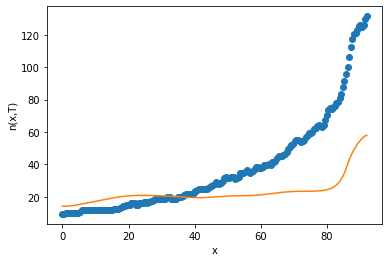

after perturb [1.8669993137865273, 141.6463637601202, 14231.684859372403, 10.413183502681964, 72.28896944971387]
parameters [1.8669993137865273, 141.6463637601202, 14231.684859372403, 10.413183502681964, 72.28896944971387]
after perturb [2.6089515333262465, 62.13146374616141, 19651.60999807489, 5.603547266062641, 50.311548402303245]
parameters [2.6089515333262465, 62.13146374616141, 19651.60999807489, 5.603547266062641, 50.311548402303245]
after perturb [1.1950257570442524, 93.7972799926618, 29440.955270991777, 2.384892644277036, 13.250963910330437]
parameters [1.1950257570442524, 93.7972799926618, 29440.955270991777, 2.384892644277036, 13.250963910330437]
after perturb [9.0799811666921, 70.0907004579935, 26225.499915482775, 11.41549660118703, 32.52362458517051]
parameters [9.0799811666921, 70.0907004579935, 26225.499915482775, 11.41549660118703, 32.52362458517051]
after perturb [8.384045200071625, 47.09581833351476, 27580.730303528875, -6.398961670698379, 15.57830669089461]
parameters

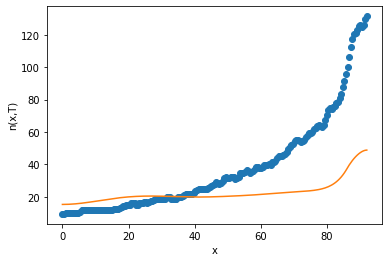

after perturb [12.232694066017029, 160.43663737155705, 19452.702353289093, -0.4118496683866413, 15.74969525782371]
parameters [12.232694066017029, 160.43663737155705, 19452.702353289093, -0.4118496683866413, 15.74969525782371]
after perturb [3.9988577922150426, 81.09157523403036, 26932.891219238518, 7.665865210806736, 43.595711401025895]
parameters [3.9988577922150426, 81.09157523403036, 26932.891219238518, 7.665865210806736, 43.595711401025895]
oxigeno [2.54068160e-40 2.78405156e-40 3.56091598e-40 5.02076108e-40
 7.44536816e-40 1.13048107e-39 1.73514860e-39 2.67717968e-39
 4.14273803e-39 6.42370490e-39 9.97811771e-39 1.55259024e-38
 2.42007529e-38 3.77915320e-38 5.91267001e-38 9.26877020e-38
 1.45589568e-37 2.29151570e-37 3.61417722e-37 5.71209077e-37
 9.04650619e-37 1.43570280e-36 2.28318461e-36 3.63833684e-36
 5.80952607e-36 9.29486627e-36 1.49003766e-35 2.39325162e-35
 3.85123624e-35 6.20889771e-35 1.00279309e-34 1.62243940e-34
 2.62942954e-34 4.26838567e-34 6.93977585e-34 1.129990

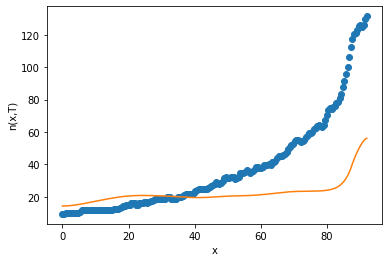

after perturb [-0.03898161899383146, 36.73094149432078, 25608.08436903319, 3.8214532161804966, 34.55310199474914]
parameters [-0.03898161899383146, 36.73094149432078, 25608.08436903319, 3.8214532161804966, 34.55310199474914]
after perturb [7.187308530248352, 130.68587538386086, 23168.93277714878, 6.145918349023179, 35.08494046020894]
parameters [7.187308530248352, 130.68587538386086, 23168.93277714878, 6.145918349023179, 35.08494046020894]
oxigeno [1.43615585e-28 1.50585718e-28 1.72175004e-28 2.10488468e-28
 2.69269616e-28 3.54279287e-28 4.73881366e-28 6.39898025e-28
 8.68826555e-28 1.18354963e-27 1.61572563e-27 2.20912174e-27
 3.02425906e-27 4.14488789e-27 5.68702120e-27 7.81154896e-27
 1.07418719e-26 1.47885790e-26 2.03840220e-26 2.81308071e-26
 3.88698820e-26 5.37762334e-26 7.44935260e-26 1.03323711e-25
 1.43494289e-25 1.99535347e-25 2.77811901e-25 3.87276062e-25
 5.40530559e-25 7.55333444e-25 1.05672826e-24 1.48006122e-24
 2.07525672e-24 2.91287845e-24 4.09272483e-24 5.75602182e-24

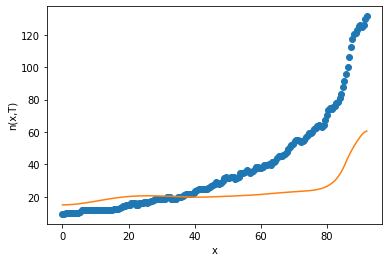

after perturb [1.1986006711366726, 86.16256164780185, 29327.961434060177, 6.142886285745631, 37.994069816189004]
parameters [1.1986006711366726, 86.16256164780185, 29327.961434060177, 6.142886285745631, 37.994069816189004]
after perturb [-1.6069297440033425, 129.2733436420769, 24363.691326284963, 7.965849993806664, 23.39790523265227]
parameters [-1.6069297440033425, 129.2733436420769, 24363.691326284963, 7.965849993806664, 23.39790523265227]
after perturb [4.37848245033787, 133.43720555470532, 25663.521601753757, 11.292789508081894, 31.148954710476964]
parameters [4.37848245033787, 133.43720555470532, 25663.521601753757, 11.292789508081894, 31.148954710476964]
after perturb [3.649538053465826, 116.32286756089681, 30104.00642552906, 12.05002804085845, 20.853638512861938]
parameters [3.649538053465826, 116.32286756089681, 30104.00642552906, 12.05002804085845, 20.853638512861938]
after perturb [0.23888881791115857, 51.060035552018164, 28005.034963996717, 11.090051029325721, 26.64626245901

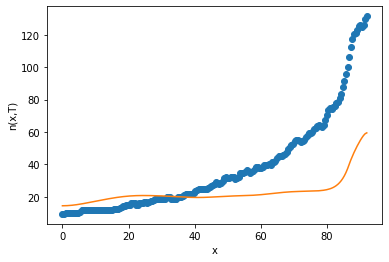

after perturb [-3.7098268743428298, 146.1750162280542, 26953.354362719147, 3.8481624827634455, 17.89020901964237]
parameters [-3.7098268743428298, 146.1750162280542, 26953.354362719147, 3.8481624827634455, 17.89020901964237]
after perturb [0.0022737916258099844, 52.62329861297464, 27476.5787246123, 2.6450973574895276, 32.08999078732564]
parameters [0.0022737916258099844, 52.62329861297464, 27476.5787246123, 2.6450973574895276, 32.08999078732564]
after perturb [6.594432683628388, 152.31625522966, 17092.804143139558, 2.3797451006060837, 59.59831346952454]
parameters [6.594432683628388, 152.31625522966, 17092.804143139558, 2.3797451006060837, 59.59831346952454]
after perturb [-6.5972274127974995, 83.52440108789234, 33525.37907889788, 2.941564571376573, -14.455817162123239]
parameters [-6.5972274127974995, 83.52440108789234, 33525.37907889788, 2.941564571376573, -14.455817162123239]
after perturb [1.567267450892104, 45.83173681743193, 34891.55173123944, 2.4037041396631063, 13.9549130721596

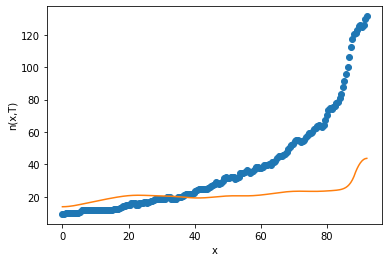

after perturb [0.3874990505152116, 84.74119137391584, 21380.258423904874, 0.808885927599805, 65.1188755621078]
parameters [0.3874990505152116, 84.74119137391584, 21380.258423904874, 0.808885927599805, 65.1188755621078]
after perturb [9.211943705609755, 154.71792259164488, 22471.468872406957, 12.53658149134312, 50.795467146531294]
parameters [9.211943705609755, 154.71792259164488, 22471.468872406957, 12.53658149134312, 50.795467146531294]
after perturb [3.9165394244603386, 55.90805227009646, 22004.942595485107, 4.915724851161764, 48.910842037832175]
parameters [3.9165394244603386, 55.90805227009646, 22004.942595485107, 4.915724851161764, 48.910842037832175]
oxigeno [1.15285455e-39 1.26571093e-39 1.62639108e-39 2.30565775e-39
 3.43713491e-39 5.24425565e-39 8.08558632e-39 1.25280677e-38
 1.94637022e-38 3.02946187e-38 4.72263702e-38 7.37331319e-38
 1.15296584e-37 1.80581405e-37 2.83308571e-37 4.45245851e-37
 7.00989951e-37 1.10562672e-36 1.74702205e-36 2.76557518e-36
 4.38601684e-36 6.9686

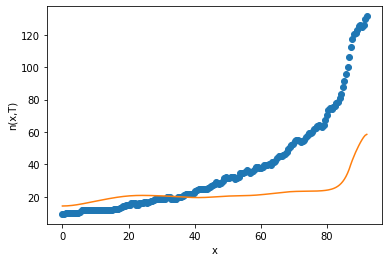

after perturb [2.372562667258868, 119.09561267477022, 29338.223673980858, 7.195646085157484, 36.24620598243456]
parameters [2.372562667258868, 119.09561267477022, 29338.223673980858, 7.195646085157484, 36.24620598243456]
after perturb [2.1906708355560545, 107.63890270219328, 23879.839651206374, 2.5607549724394447, 0.5654345664503424]
parameters [2.1906708355560545, 107.63890270219328, 23879.839651206374, 2.5607549724394447, 0.5654345664503424]
after perturb [8.092491784940083, 76.18557503965619, 23981.779245775877, -0.11951066516138653, 42.99851908063668]
parameters [8.092491784940083, 76.18557503965619, 23981.779245775877, -0.11951066516138653, 42.99851908063668]
after perturb [6.955415835954154, 92.12597964989979, 28293.8485020733, 5.59030699617925, 15.590489676464582]
parameters [6.955415835954154, 92.12597964989979, 28293.8485020733, 5.59030699617925, 15.590489676464582]
oxigeno [9.01474074e-33 9.60192594e-33 1.14400652e-32 1.47691366e-32
 2.00246132e-32 2.78959035e-32 3.94192887e-

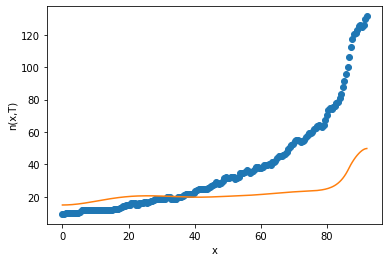

after perturb [11.672169867590034, 56.57503597188336, 32322.731658505836, -3.4645099479845283, -32.97877091439719]
parameters [11.672169867590034, 56.57503597188336, 32322.731658505836, -3.4645099479845283, -32.97877091439719]
after perturb [6.443973646384547, 87.1180233086676, 21450.763370253953, 9.314354339067304, 71.25896488996617]
parameters [6.443973646384547, 87.1180233086676, 21450.763370253953, 9.314354339067304, 71.25896488996617]
after perturb [5.107593501162585, 163.00765509940095, 14200.835599434075, 8.902113906345638, 24.119436286754464]
parameters [5.107593501162585, 163.00765509940095, 14200.835599434075, 8.902113906345638, 24.119436286754464]
after perturb [-3.6700575533641073, 44.316303120146685, 26853.663182980752, 4.537286757197247, 13.402176337552795]
parameters [-3.6700575533641073, 44.316303120146685, 26853.663182980752, 4.537286757197247, 13.402176337552795]
after perturb [3.552949678318072, 98.21957415706548, 21392.57877698004, 3.3514955286522, 39.88969051760905

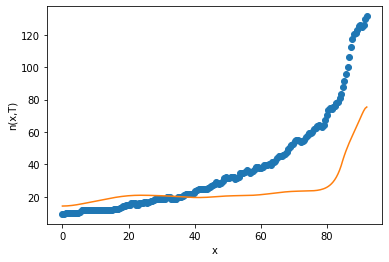

14
after perturb [-3.8672647680154055, 76.25025565280578, 20774.66740939745, 10.172511083718243, 51.3420602519927]
parameters [-3.8672647680154055, 76.25025565280578, 20774.66740939745, 10.172511083718243, 51.3420602519927]
after perturb [3.5051272810740315, 105.04342113358064, 19251.64596701858, 5.621698735113173, 25.315143101588898]
parameters [3.5051272810740315, 105.04342113358064, 19251.64596701858, 5.621698735113173, 25.315143101588898]
after perturb [-1.60478578795183, 55.092407181915306, 24172.395485366964, 11.962973487149197, 81.79056469068766]
parameters [-1.60478578795183, 55.092407181915306, 24172.395485366964, 11.962973487149197, 81.79056469068766]
after perturb [1.095236247597608, 63.95865849279615, 30794.912023711993, 11.670208207757796, 60.26839660651701]
parameters [1.095236247597608, 63.95865849279615, 30794.912023711993, 11.670208207757796, 60.26839660651701]
after perturb [7.814411933624351, 152.1399888396813, 34458.725247263676, 6.864453300244272, -2.55006602662363

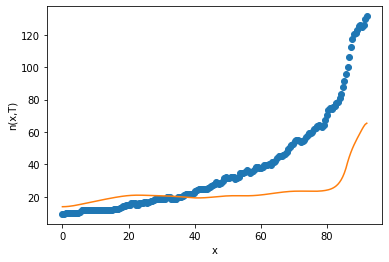

after perturb [-4.548406528103072, 59.74966277577379, 23340.354430306983, 13.616102786899305, 58.53537266970237]
parameters [-4.548406528103072, 59.74966277577379, 23340.354430306983, 13.616102786899305, 58.53537266970237]
after perturb [1.9875658132103617, 167.22934738871052, 15433.669693486689, 12.754013666464838, -2.704429430230407]
parameters [1.9875658132103617, 167.22934738871052, 15433.669693486689, 12.754013666464838, -2.704429430230407]
after perturb [2.1632346924849553, 100.14909473219946, 34873.3128435524, 7.006539868222045, 7.843936124452588]
parameters [2.1632346924849553, 100.14909473219946, 34873.3128435524, 7.006539868222045, 7.843936124452588]
after perturb [6.14310088786258, 139.38783215430763, 21953.717078759917, 14.35603863606385, 41.50411912054413]
parameters [6.14310088786258, 139.38783215430763, 21953.717078759917, 14.35603863606385, 41.50411912054413]
after perturb [-1.9678276008360645, 64.48300097692581, 21430.57481659043, -1.332454133083163, 37.18566361111799]

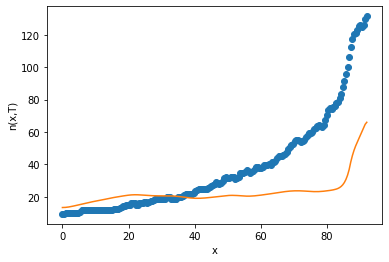

after perturb [7.521006631565089, 119.74484694769602, 22520.714718152267, 2.7178492416970332, 17.767315795003405]
parameters [7.521006631565089, 119.74484694769602, 22520.714718152267, 2.7178492416970332, 17.767315795003405]
oxigeno [2.21183563e-20 2.26900261e-20 2.44346896e-20 2.74429283e-20
 3.18712028e-20 3.79504273e-20 4.59986680e-20 5.64387119e-20
 6.98215404e-20 8.68570987e-20 1.08454187e-19 1.35771860e-19
 1.70285419e-19 2.13870975e-19 2.68913716e-19 3.38446479e-19
 4.26327101e-19 5.37465468e-19 6.78114295e-19 8.56241666e-19
 1.08200855e-18 1.36838114e-18 1.73191638e-18 2.19377018e-18
 2.78099180e-18 3.52818625e-18 4.47965004e-18 5.69211571e-18
 7.23827945e-18 9.21133618e-18 1.17308104e-17 1.49500541e-17
 1.90658884e-17 2.43310029e-17 3.10698994e-17 3.96993946e-17
 5.07549798e-17 6.49247083e-17 8.30927520e-17 1.06395376e-16
 1.36292855e-16 1.74661849e-16 2.23914021e-16 2.87148323e-16
 3.68346424e-16 4.72623431e-16 6.06549437e-16 7.78561755e-16
 9.99493218e-16 1.28324896e-15 1.64

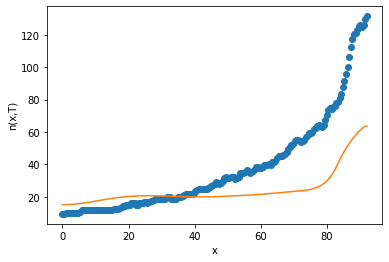

15
after perturb [10.491819425038576, 56.277076551593055, 32206.82431438098, 0.05276976935867171, -4.985042423519875]
parameters [10.491819425038576, 56.277076551593055, 32206.82431438098, 0.05276976935867171, -4.985042423519875]
after perturb [0.43121794704470406, 91.19722953018648, 25996.56666510262, 3.3892084826455764, -2.353584076224168]
parameters [0.43121794704470406, 91.19722953018648, 25996.56666510262, 3.3892084826455764, -2.353584076224168]
after perturb [8.60470190629731, 108.39290203349582, 24264.257794130644, 16.077167641028126, 32.34204599587268]
parameters [8.60470190629731, 108.39290203349582, 24264.257794130644, 16.077167641028126, 32.34204599587268]
after perturb [10.11728426614259, 167.02444735941526, 19345.186288698238, -1.222983284293782, 3.5755882415249793]
parameters [10.11728426614259, 167.02444735941526, 19345.186288698238, -1.222983284293782, 3.5755882415249793]
after perturb [8.629989607332128, 96.28449213851452, 27506.597894892784, 2.9170259408126804, 10.574

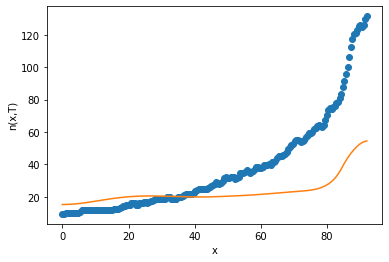

after perturb [-3.528453989491907, 62.496707562226455, 23005.379978756773, 8.553750046340053, 50.2998022826268]
parameters [-3.528453989491907, 62.496707562226455, 23005.379978756773, 8.553750046340053, 50.2998022826268]
after perturb [7.429133485727267, 154.89379613840018, 23028.215438798674, 6.362130611378131, 20.384932401643194]
parameters [7.429133485727267, 154.89379613840018, 23028.215438798674, 6.362130611378131, 20.384932401643194]
after perturb [-1.229114097698414, 164.6902279039021, 33289.6435119248, 4.680509833121048, -19.087111514434895]
parameters [-1.229114097698414, 164.6902279039021, 33289.6435119248, 4.680509833121048, -19.087111514434895]
after perturb [2.1034004816345515, 93.18334755741932, 23353.846958061386, 1.2554126764162834, 16.704500853712062]
parameters [2.1034004816345515, 93.18334755741932, 23353.846958061386, 1.2554126764162834, 16.704500853712062]
oxigeno [2.97811466e-16 3.02815553e-16 3.18000576e-16 3.43891716e-16
 3.81387539e-16 4.31795811e-16 4.96885514

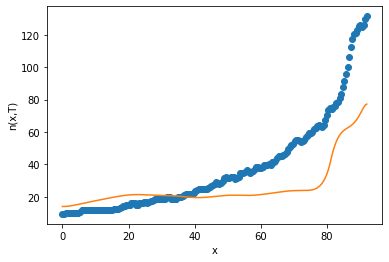

16
after perturb [4.383677443492409, 51.99773865513891, 29652.225556778652, 9.985254170609473, 31.131295613306612]
parameters [4.383677443492409, 51.99773865513891, 29652.225556778652, 9.985254170609473, 31.131295613306612]
after perturb [0.6265377943918433, 51.16709726839653, 18168.67981616963, 2.4304691432981187, 78.96685226391533]
parameters [0.6265377943918433, 51.16709726839653, 18168.67981616963, 2.4304691432981187, 78.96685226391533]
after perturb [7.445145929806589, 128.12237796331516, 12660.125207808098, 2.2296701996854167, 37.555730094324645]
parameters [7.445145929806589, 128.12237796331516, 12660.125207808098, 2.2296701996854167, 37.555730094324645]
after perturb [-5.291516395529988, 116.80955074839437, 28823.94160274777, 13.372068749642462, 50.64997346318465]
parameters [-5.291516395529988, 116.80955074839437, 28823.94160274777, 13.372068749642462, 50.64997346318465]
after perturb [4.497697199015083, 101.8193773920133, 26764.40293336968, 2.5045674239958906, 32.313415329918

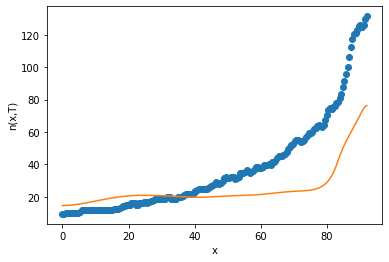

17
after perturb [1.0647531415289664, 106.5411149752491, 20777.90382675733, 0.6246025423444035, 44.32133662015215]
parameters [1.0647531415289664, 106.5411149752491, 20777.90382675733, 0.6246025423444035, 44.32133662015215]
oxigeno [5.76751474e-11 5.81142192e-11 5.94392875e-11 6.16740264e-11
 6.48582844e-11 6.90486904e-11 7.43195472e-11 8.07640617e-11
 8.84959773e-11 9.76516847e-11 1.08392881e-10 1.20909827e-10
 1.35425228e-10 1.52198706e-10 1.71531850e-10 1.93773793e-10
 2.19327340e-10 2.48655775e-10 2.82290581e-10 3.20840488e-10
 3.65002384e-10 4.15574713e-10 4.73473962e-10 5.39754747e-10
 6.15633765e-10 7.02517615e-10 8.02034267e-10 9.16067805e-10
 1.04679620e-09 1.19673224e-09 1.36876847e-09 1.56622778e-09
 1.79292227e-09 2.05322371e-09 2.35214924e-09 2.69546572e-09
 3.08981526e-09 3.54286340e-09 4.06346931e-09 4.66187667e-09
 5.34992214e-09 6.14125907e-09 7.05159474e-09 8.09894246e-09
 9.30389328e-09 1.06899164e-08 1.22837014e-08 1.41155588e-08
 1.62198961e-08 1.86357863e-08 2.140

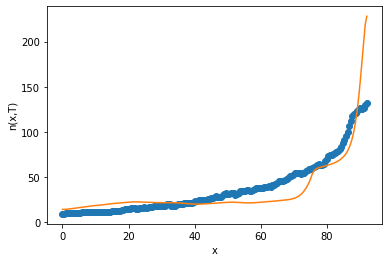

18
after perturb [-1.7587062077216218, 120.09457676444322, 23272.446184648416, 17.030854940132357, 52.694289377501235]
parameters [-1.7587062077216218, 120.09457676444322, 23272.446184648416, 17.030854940132357, 52.694289377501235]
after perturb [-5.5769763765823255, 79.56847569958566, 25990.019044191435, 8.699522533423888, 8.590781018929647]
parameters [-5.5769763765823255, 79.56847569958566, 25990.019044191435, 8.699522533423888, 8.590781018929647]
after perturb [-1.629611679366628, 75.60855240752713, 28235.16325561771, 9.58801374059631, 24.292770373049784]
parameters [-1.629611679366628, 75.60855240752713, 28235.16325561771, 9.58801374059631, 24.292770373049784]
after perturb [6.631183877487324, 65.26068004669096, 23666.203692100018, 6.615808384973413, 40.17650374671366]
parameters [6.631183877487324, 65.26068004669096, 23666.203692100018, 6.615808384973413, 40.17650374671366]
oxigeno [4.50315864e-42 4.99843885e-42 6.59320660e-42 9.63853225e-42
 1.48060494e-41 2.32384735e-41 3.68068

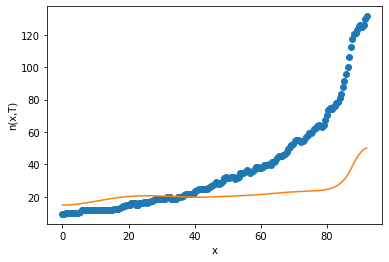

after perturb [5.737805961673654, 173.14890815339126, 17106.806104983596, 14.19314244094926, 41.80367942245763]
parameters [5.737805961673654, 173.14890815339126, 17106.806104983596, 14.19314244094926, 41.80367942245763]
after perturb [-0.8189327891040077, 2.1688737124134008, 27642.054654675387, 2.7089432651024996, 50.50398727612916]
parameters [-0.8189327891040077, 2.1688737124134008, 27642.054654675387, 2.7089432651024996, 50.50398727612916]
after perturb [0.540364944810662, 106.86884436850926, 31057.76751404372, 5.942747507216986, 3.863283850415712]
parameters [0.540364944810662, 106.86884436850926, 31057.76751404372, 5.942747507216986, 3.863283850415712]
after perturb [6.975176098121162, 148.4471374714016, 22975.252306039718, 9.589256256438844, 41.62627733173754]
parameters [6.975176098121162, 148.4471374714016, 22975.252306039718, 9.589256256438844, 41.62627733173754]
oxigeno [4.79835738e-33 5.10321383e-33 6.05665956e-33 7.78042369e-33
 1.04950874e-32 1.45491815e-32 2.04653978e-32

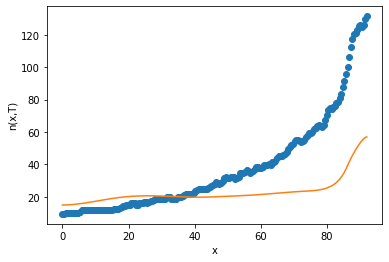

after perturb [2.000882376624954, 106.27251837421478, 15379.901752017548, 0.4998565114961663, 57.77893303880351]
parameters [2.000882376624954, 106.27251837421478, 15379.901752017548, 0.4998565114961663, 57.77893303880351]
after perturb [0.36312444141539935, 125.73602493734244, 25049.647944491186, 8.083906844945183, 31.45774918759649]
parameters [0.36312444141539935, 125.73602493734244, 25049.647944491186, 8.083906844945183, 31.45774918759649]
oxigeno [4.29001249e-33 4.52328562e-33 5.25222441e-33 6.56877573e-33
 8.64164728e-33 1.17402808e-32 1.62705813e-32 2.28258447e-32
 3.22591139e-32 4.57879065e-32 6.51503173e-32 9.28443507e-32
 1.32500156e-31 1.89455800e-31 2.71628952e-31 3.90800328e-31
 5.64457570e-31 8.18405183e-31 1.19044653e-30 1.73560870e-30
 2.53363638e-30 3.69987942e-30 5.40137310e-30 7.88111888e-30
 1.14956767e-29 1.67744513e-29 2.45134330e-29 3.59211771e-29
 5.28400491e-29 7.80716922e-29 1.15844835e-28 1.72481946e-28
 2.57359212e-28 3.84324482e-28 5.73849659e-28 8.56352046

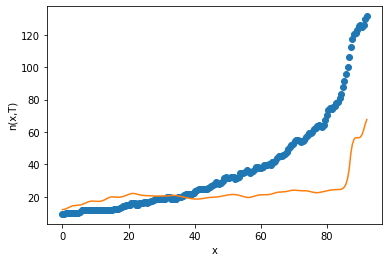

after perturb [0.5958521153963887, 49.78206153607892, 29136.304585995724, -1.5049194588899693, 1.8156446769516972]
parameters [0.5958521153963887, 49.78206153607892, 29136.304585995724, -1.5049194588899693, 1.8156446769516972]
after perturb [8.991377824747534, -10.076644924557456, 26888.958155260014, 0.3955100454737144, 26.24660750896217]
parameters [8.991377824747534, -10.076644924557456, 26888.958155260014, 0.3955100454737144, 26.24660750896217]
after perturb [1.004607186892637, 172.07555744294825, 23199.213739122413, 4.149839092216919, 16.7363596735969]
parameters [1.004607186892637, 172.07555744294825, 23199.213739122413, 4.149839092216919, 16.7363596735969]
after perturb [5.23391649291274, 145.9919315906932, 26215.91736160591, 7.369811237169556, -27.952122232440146]
parameters [5.23391649291274, 145.9919315906932, 26215.91736160591, 7.369811237169556, -27.952122232440146]
after perturb [-0.17171916507935503, 22.413708594868503, 27506.405431833296, 13.358411804685757, 61.9161978130

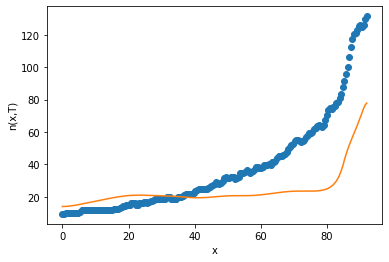

19
after perturb [12.491786106167051, 224.12529372908506, 22623.9094584246, -5.33568505053953, -11.632034930193779]
parameters [12.491786106167051, 224.12529372908506, 22623.9094584246, -5.33568505053953, -11.632034930193779]
after perturb [-1.2104908747285301, 108.7531241175977, 21575.90167370454, 7.714957366379682, 29.94648050541112]
parameters [-1.2104908747285301, 108.7531241175977, 21575.90167370454, 7.714957366379682, 29.94648050541112]
after perturb [5.1766617426620725, 43.03468667989989, 25304.574943838765, 4.837841206864252, 35.56661794047843]
parameters [5.1766617426620725, 43.03468667989989, 25304.574943838765, 4.837841206864252, 35.56661794047843]
oxigeno [4.02329352e-45 4.55422824e-45 6.28696763e-45 9.67862663e-45
 1.56255943e-44 2.57037611e-44 4.25927681e-44 7.08012925e-44
 1.17894692e-43 1.96568119e-43 3.28148648e-43 5.48519310e-43
 9.18156787e-43 1.53917007e-42 2.58427647e-42 4.34616976e-42
 7.32178666e-42 1.23564041e-41 2.08904918e-41 3.53833455e-41
 6.00413611e-41 1.0

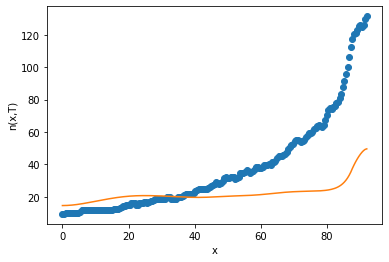

after perturb [13.82270074412822, 107.6474521887867, 25655.440657152645, -4.067089653045137, 3.221261600968443]
parameters [13.82270074412822, 107.6474521887867, 25655.440657152645, -4.067089653045137, 3.221261600968443]
after perturb [7.197123054153449, 173.471629064196, 21125.44076060458, 9.661750283187844, 2.6604604412939388]
parameters [7.197123054153449, 173.471629064196, 21125.44076060458, 9.661750283187844, 2.6604604412939388]
after perturb [-3.805458310802355, 60.401898929637554, 22063.99722883126, 5.9598008646059295, 35.75528293269868]
parameters [-3.805458310802355, 60.401898929637554, 22063.99722883126, 5.9598008646059295, 35.75528293269868]
after perturb [7.06227903550019, 87.68648868906176, 16531.071152750636, 0.7547279152658657, 76.60161870302206]
parameters [7.06227903550019, 87.68648868906176, 16531.071152750636, 0.7547279152658657, 76.60161870302206]
after perturb [10.17152271621646, 165.43359908179423, 22796.39763344243, 5.0568775450846335, -8.04760440307621]
paramete

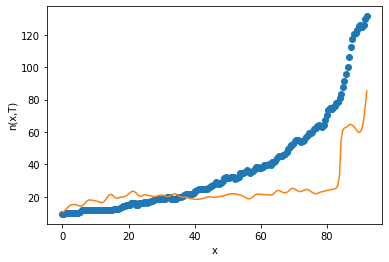

20
parameters [6.1250112582965635, 149.8920427610705, 25545.531566141533, 1.9010311326982112, 32.105636378072255]
parameters [9.457931477769051, 132.72769277641393, 21358.980309272432, 1.3923956496839276, 20.191334193252008]
parameters [2.2838973462014507, 103.6768960437345, 23163.77225802614, 4.211699258000408, 36.99555660015994]
parameters [4.92116506450196, 134.05179048449602, 21138.69305564028, 4.40399795945117, 43.59941033866684]
parameters [0.15916758180688495, 55.61079919840833, 23479.84710571047, 0.4712637062793896, 40.17933593187466]
parameters [2.769028083899242, 122.40564285357641, 24797.18095610015, 4.331890575941664, 37.39765657866717]
parameters [3.0440727770885476, 61.24455452576747, 23219.951823687006, 0.0913919794336131, 4.7791649213658225]
parameters [3.976043703941339, 117.07706114078286, 21628.348019024466, 0.884030851884885, 40.926118547093346]
parameters [4.001023041722054, 102.23470795680261, 26914.393057068435, 0.5069493779397094, 16.083806119772937]
parameters 

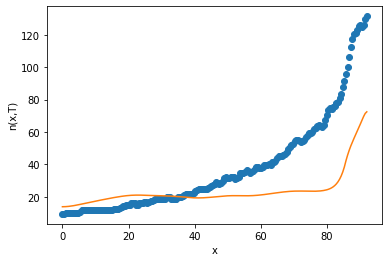

after perturb [-1.4877702876768075, 2.9157659569507643, 22281.78844745988, -0.6614951457687122, -4.965746410787807]
parameters [-1.4877702876768075, 2.9157659569507643, 22281.78844745988, -0.6614951457687122, -4.965746410787807]
after perturb [-6.149858105935368, 58.17341847355713, 21285.482248306467, -0.45098369441364805, 29.37151990492122]
parameters [-6.149858105935368, 58.17341847355713, 21285.482248306467, -0.45098369441364805, 29.37151990492122]
after perturb [7.335373162409793, 63.82464349589707, 23521.90681460349, -0.7424771615815489, 3.0067932031920215]
parameters [7.335373162409793, 63.82464349589707, 23521.90681460349, -0.7424771615815489, 3.0067932031920215]
after perturb [12.145188533445669, 191.8007562076554, 27123.829194368285, 3.378996044217711, 20.118410039464127]
parameters [12.145188533445669, 191.8007562076554, 27123.829194368285, 3.378996044217711, 20.118410039464127]
after perturb [-0.6717460685251466, 20.679956926985376, 23719.209838123843, -2.568053121287531, -0

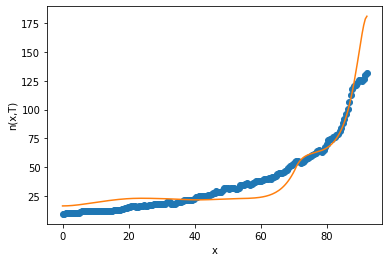

1
after perturb [4.472724413311483, 119.27341546804135, 22053.930981385394, 1.011060763486251, 27.738995803017914]
parameters [4.472724413311483, 119.27341546804135, 22053.930981385394, 1.011060763486251, 27.738995803017914]
oxigeno [7.47679179e-13 7.55716297e-13 7.80003452e-13 8.21072450e-13
 8.79824451e-13 9.57552578e-13 1.05597438e-12 1.17727496e-12
 1.32416190e-12 1.49993339e-12 1.70856125e-12 1.95479113e-12
 2.24426245e-12 2.58365114e-12 2.98083910e-12 3.44511475e-12
 3.98741013e-12 4.62058072e-12 5.35973563e-12 6.22262702e-12
 7.23010907e-12 8.40667912e-12 9.78111529e-12 1.13872279e-11
 1.32647446e-11 1.54603535e-11 1.80289310e-11 2.10349881e-11
 2.45543721e-11 2.86762695e-11 3.35055610e-11 3.91655900e-11
 4.58014157e-11 5.35836324e-11 6.27128522e-11 7.34249623e-11
 8.59972875e-11 1.00755808e-10 1.18083610e-10 1.38430773e-10
 1.62325930e-10 1.90389784e-10 2.23350890e-10 2.62064095e-10
 3.07532063e-10 3.60930395e-10 4.23636946e-10 4.97266031e-10
 5.83708328e-10 6.85177424e-10 8.04

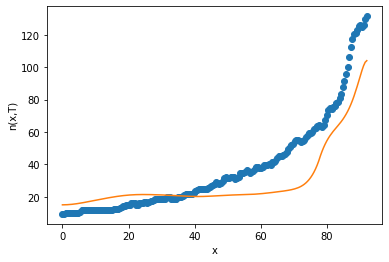

2
after perturb [-1.7566831585890506, 14.695728049837442, 24336.09948646016, 1.434460079093678, 18.178971250570832]
parameters [-1.7566831585890506, 14.695728049837442, 24336.09948646016, 1.434460079093678, 18.178971250570832]
after perturb [0.07532979123955119, 62.62676052062333, 29666.16319219441, -1.4232870858643265, -18.073332541065184]
parameters [0.07532979123955119, 62.62676052062333, 29666.16319219441, -1.4232870858643265, -18.073332541065184]
after perturb [-3.0439208173237904, 145.06424887098925, 21734.893415863964, 2.8612203239152896, 56.096081783326206]
parameters [-3.0439208173237904, 145.06424887098925, 21734.893415863964, 2.8612203239152896, 56.096081783326206]
after perturb [-2.3985783423899605, 114.83798985737828, 25497.246309724782, 6.565774882170011, 56.50226147308779]
parameters [-2.3985783423899605, 114.83798985737828, 25497.246309724782, 6.565774882170011, 56.50226147308779]
after perturb [-1.084912965252096, 101.98441663017189, 25335.40760958533, 3.73285683014197

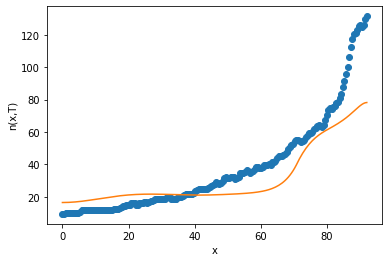

3
after perturb [-1.0426819099252733, 39.16827878091416, 19609.260738463116, 2.5443536279759984, 30.135554747703722]
parameters [-1.0426819099252733, 39.16827878091416, 19609.260738463116, 2.5443536279759984, 30.135554747703722]
after perturb [13.454451143415538, 82.69480108018678, 24340.68596958423, 1.8044191696637124, 44.96379324110418]
parameters [13.454451143415538, 82.69480108018678, 24340.68596958423, 1.8044191696637124, 44.96379324110418]
after perturb [2.451057078310754, 127.68322660405063, 22157.945214217736, 2.5781063024313573, 6.668481535614406]
parameters [2.451057078310754, 127.68322660405063, 22157.945214217736, 2.5781063024313573, 6.668481535614406]
oxigeno [2.18410223e-19 2.23130331e-19 2.37499912e-19 2.62157335e-19
 2.98202378e-19 3.47251946e-19 4.11522090e-19 4.93940640e-19
 5.98296362e-19 7.29432517e-19 8.93495091e-19 1.09824894e-18
 1.35347883e-18 1.67149696e-18 2.06778477e-18 2.56180400e-18
 3.17802207e-18 3.94720904e-18 4.90807904e-18 6.10936964e-18
 7.61247805e-1

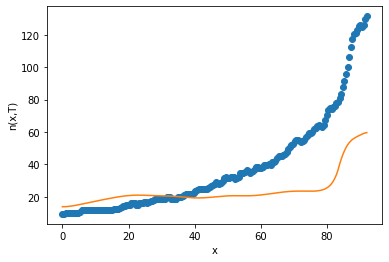

after perturb [9.120059349543975, 83.50493886573216, 23442.96953647722, 2.912483939992113, 45.39835628429923]
parameters [9.120059349543975, 83.50493886573216, 23442.96953647722, 2.912483939992113, 45.39835628429923]
oxigeno [2.67657751e-25 2.78815832e-25 3.13218814e-25 3.73732117e-25
 4.65402464e-25 5.95889689e-25 7.76124215e-25 1.02124900e-24
 1.35193057e-24 1.79615741e-24 2.39168892e-24 3.18937817e-24
 4.25767328e-24 5.68871248e-24 7.60657792e-24 1.01784778e-23
 1.36299042e-23 1.82651951e-23 2.44954452e-23 3.28764205e-23
 4.41600962e-23 5.93647609e-23 7.98704359e-23 1.07548829e-22
 1.44940424e-22 1.95495925e-22 2.63905610e-22 3.56548798e-22
 4.82107479e-22 6.52404372e-22 8.83547857e-22 1.19749657e-21
 1.62419799e-21 2.20451209e-21 2.99420888e-21 4.06943479e-21
 5.53418800e-21 7.53054117e-21 1.02526211e-20 1.39657245e-20
 1.90324546e-20 2.59484516e-20 3.53912307e-20 4.82869227e-20
 6.59014565e-20 8.99651035e-20 1.22842538e-19 1.67764979e-19
 2.29146955e-19 3.13018404e-19 4.27613855e-

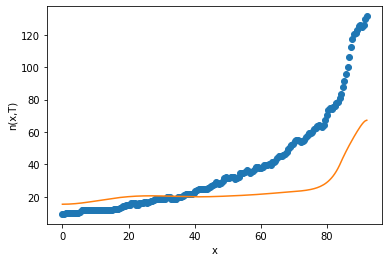

after perturb [-0.6395584619761436, 27.94991985482227, 24046.46493567481, 0.8574722740265878, 17.900828238532533]
parameters [-0.6395584619761436, 27.94991985482227, 24046.46493567481, 0.8574722740265878, 17.900828238532533]
after perturb [1.37477513660347, 89.22321459231534, 27890.924634400926, 2.209092748892927, 19.556829595761418]
parameters [1.37477513660347, 89.22321459231534, 27890.924634400926, 2.209092748892927, 19.556829595761418]
oxigeno [1.46770016e-21 1.50846857e-21 1.63311169e-21 1.84879701e-21
 2.16799269e-21 2.60928468e-21 3.19859175e-21 3.97085715e-21
 4.97233042e-21 6.26359475e-21 7.92354925e-21 1.00546211e-20
 1.27895658e-20 1.63003166e-20 2.08094794e-20 2.66052402e-20
 3.40606885e-20 4.36588734e-20 5.60253418e-20 7.19704939e-20
 9.25448837e-20 1.19111642e-19 1.53441570e-19 1.97838214e-19
 2.55302478e-19 3.29749185e-19 4.26291643e-19 5.51614976e-19
 7.14465245e-19 9.26289656e-19 1.20207448e-18 1.56144268e-18
 2.03009396e-18 2.64169812e-18 3.44038930e-18 4.48405728e-18

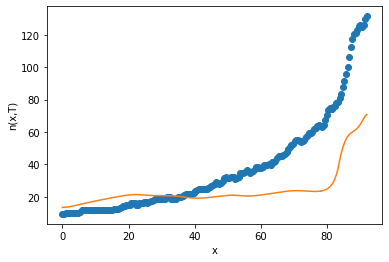

after perturb [-4.546824577997271, 22.349944191626207, 19823.619699535404, -0.8041376198654708, 47.867535697644655]
parameters [-4.546824577997271, 22.349944191626207, 19823.619699535404, -0.8041376198654708, 47.867535697644655]
after perturb [4.6433616161258415, 87.17293471326464, 20242.087888731676, 2.74082573552946, 34.222837110206065]
parameters [4.6433616161258415, 87.17293471326464, 20242.087888731676, 2.74082573552946, 34.222837110206065]
oxigeno [4.30522720e-24 4.46114650e-24 4.94023965e-24 5.77737907e-24
 7.03364493e-24 8.80101731e-24 1.12094733e-23 1.44370708e-23
 1.87238495e-23 2.43906985e-23 3.18647610e-23 4.17134992e-23
 5.46902884e-23 7.17953953e-23 9.43575360e-23 1.24142996e-22
 1.63501712e-22 2.15562975e-22 2.84497798e-22 3.75870933e-22
 4.97113533e-22 6.58158270e-22 8.72293375e-22 1.15731185e-21
 1.53705884e-21 2.04351646e-21 2.71961417e-21 3.62301915e-21
 4.83125068e-21 6.44858347e-21 8.61536869e-21 1.15206222e-20
 1.54190285e-20 2.06539109e-20 2.76882628e-20 3.714666

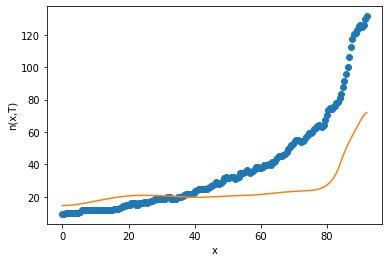

after perturb [0.9734208179837043, 173.87599643934755, 24760.229354400366, 0.3361956762488898, 31.453745574258768]
parameters [0.9734208179837043, 173.87599643934755, 24760.229354400366, 0.3361956762488898, 31.453745574258768]
after perturb [0.6135633362092823, 111.94795348819808, 21678.742762627215, 5.025835395932728, 64.00535221871678]
parameters [0.6135633362092823, 111.94795348819808, 21678.742762627215, 5.025835395932728, 64.00535221871678]
after perturb [3.4465255194626265, 59.70737825806896, 23430.12372344577, -2.87846599079995, -29.819680516872356]
parameters [3.4465255194626265, 59.70737825806896, 23430.12372344577, -2.87846599079995, -29.819680516872356]
after perturb [-1.8649854597354985, 137.00660402356579, 24056.473287032157, 2.309617783242734, 16.912487954637257]
parameters [-1.8649854597354985, 137.00660402356579, 24056.473287032157, 2.309617783242734, 16.912487954637257]
after perturb [1.775797370923454, 106.19566538216918, 21217.515531300698, 1.8184177603287437, 16.886

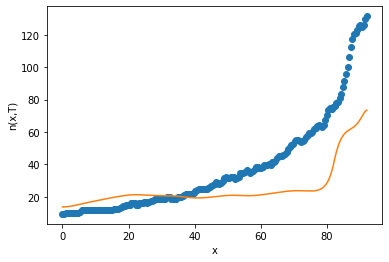

after perturb [3.876149357241592, 142.293338978009, 19893.659228443415, -0.8535182180645744, 45.9953083208645]
parameters [3.876149357241592, 142.293338978009, 19893.659228443415, -0.8535182180645744, 45.9953083208645]
after perturb [8.412381344177675, 128.5171999286244, 24682.49517953538, 5.756590892165986, 56.40862285461018]
parameters [8.412381344177675, 128.5171999286244, 24682.49517953538, 5.756590892165986, 56.40862285461018]
after perturb [0.7256090074957721, 74.98538676744336, 21998.902082280292, 2.223137954293081, 42.37339181704081]
parameters [0.7256090074957721, 74.98538676744336, 21998.902082280292, 2.223137954293081, 42.37339181704081]
oxigeno [1.28699419e-23 1.32969908e-23 1.46084073e-23 1.68975007e-23
 2.03282097e-23 2.51481021e-23 3.17074828e-23 4.04859114e-23
 5.21283303e-23 6.74942216e-23 8.77247579e-23 1.14334712e-22
 1.49337866e-22 1.95416731e-22 2.56149653e-22 3.36311127e-22
 4.42265143e-22 5.82477750e-22 7.68185367e-22 1.01427197e-21
 1.34043370e-21 1.77274660e-21

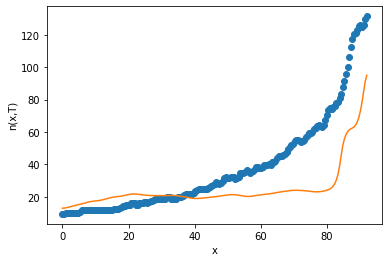

after perturb [2.629331042852003, 141.74915182703174, 23612.126404083177, 4.45767274475199, 44.52963898118466]
parameters [2.629331042852003, 141.74915182703174, 23612.126404083177, 4.45767274475199, 44.52963898118466]
oxigeno [1.69789058e-23 1.75090388e-23 1.91331839e-23 2.19549581e-23
 2.61551680e-23 3.20046193e-23 3.98833878e-23 5.03080128e-23
 6.39686836e-23 8.17792605e-23 1.04943969e-22 1.35045913e-22
 1.74164279e-22 2.25029376e-22 2.91227709e-22 3.77473325e-22
 4.89967088e-22 6.36872784e-22 8.28948680e-22 1.08038616e-21
 1.40992456e-21 1.84233468e-21 2.41039507e-21 3.15752717e-21
 4.14131223e-21 5.43818903e-21 7.14973333e-21 9.41105750e-21
 1.24020529e-20 1.63624449e-20 2.16119635e-20 2.85773778e-20
 3.78287408e-20 5.01279937e-20 6.64941490e-20 8.82907044e-20
 1.17342849e-19 1.56094564e-19 2.07819097e-19 2.76900778e-19
 3.69212095e-19 4.92617823e-19 6.57648483e-19 8.78399235e-19
 1.17372876e-18 1.56885702e-18 2.09749338e-18 2.80466960e-18
 3.75050971e-18 5.01524530e-18 6.70588663

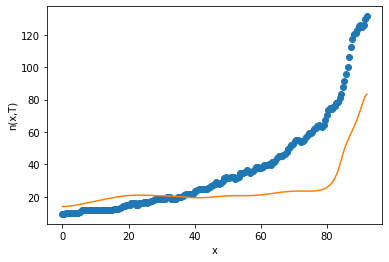

after perturb [0.8215096458638218, 3.047377235604543, 21959.595023533995, 2.6484495742108316, 17.825375148215215]
parameters [0.8215096458638218, 3.047377235604543, 21959.595023533995, 2.6484495742108316, 17.825375148215215]
after perturb [4.581877027445694, 102.23080123834896, 25295.94934572321, 1.5937679456149465, 10.012987632577936]
parameters [4.581877027445694, 102.23080123834896, 25295.94934572321, 1.5937679456149465, 10.012987632577936]
oxigeno [2.28429603e-17 2.32779390e-17 2.45995772e-17 2.68586801e-17
 3.01422847e-17 3.45773133e-17 4.03359149e-17 4.76427353e-17
 5.67844415e-17 6.81219304e-17 8.21057731e-17 9.92955959e-17
 1.20384279e-16 1.46228082e-16 1.77884067e-16 2.16656566e-16
 2.64154812e-16 3.22364437e-16 3.93736154e-16 4.81295783e-16
 5.88780777e-16 7.20809694e-16 8.83092600e-16 1.08269238e-15
 1.32834933e-15 1.63088443e-15 2.00370050e-15 2.46340490e-15
 3.03058356e-15 3.73076272e-15 4.59560420e-15 5.66439033e-15
 6.98586863e-15 8.62054273e-15 1.06435165e-14 1.31480236

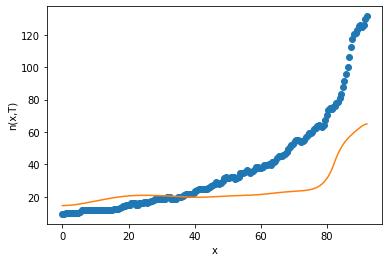

after perturb [5.850994357436806, 133.55145069698335, 29651.08094935063, 3.6156907072750473, 30.403420780175473]
parameters [5.850994357436806, 133.55145069698335, 29651.08094935063, 3.6156907072750473, 30.403420780175473]
after perturb [2.309692636091607, 226.9263471821945, 22447.56939859464, 3.05413808191414, 13.654253550200908]
parameters [2.309692636091607, 226.9263471821945, 22447.56939859464, 3.05413808191414, 13.654253550200908]
after perturb [1.2822163807166818, 154.3051685503356, 24850.312712332718, 1.4175426353381164, 8.82602436033115]
parameters [1.2822163807166818, 154.3051685503356, 24850.312712332718, 1.4175426353381164, 8.82602436033115]
after perturb [0.33349468880396094, 30.73863318720521, 20241.631625645794, -1.3322042588877152, -0.9106451543898197]
parameters [0.33349468880396094, 30.73863318720521, 20241.631625645794, -1.3322042588877152, -0.9106451543898197]
after perturb [-1.5129922186644689, 134.9943278786087, 21407.73202199563, 2.0850260559293963, 24.53868090036

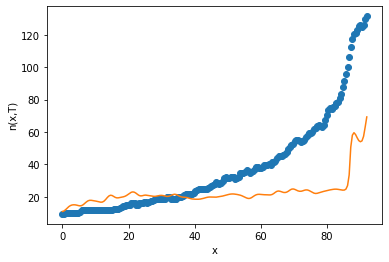

after perturb [-2.4423322222783725, 97.31993998393274, 22094.902052944333, 3.2361819749703247, 16.71287794964835]
parameters [-2.4423322222783725, 97.31993998393274, 22094.902052944333, 3.2361819749703247, 16.71287794964835]
after perturb [11.203626262851532, 163.50990748285008, 26976.360426066272, 2.9753393868713456, 35.943891704098405]
parameters [11.203626262851532, 163.50990748285008, 26976.360426066272, 2.9753393868713456, 35.943891704098405]
after perturb [-1.0635260791568197, 26.85151165233512, 21624.174932594644, -0.11214962094286474, 22.255495499072147]
parameters [-1.0635260791568197, 26.85151165233512, 21624.174932594644, -0.11214962094286474, 22.255495499072147]
after perturb [2.0415667535299282, 84.6089430963196, 23442.856971771533, 0.7390406004583421, -3.2828912303857187]
parameters [2.0415667535299282, 84.6089430963196, 23442.856971771533, 0.7390406004583421, -3.2828912303857187]
after perturb [5.675812460157502, 128.26258007593512, 23577.357019649975, 3.177311010324251,

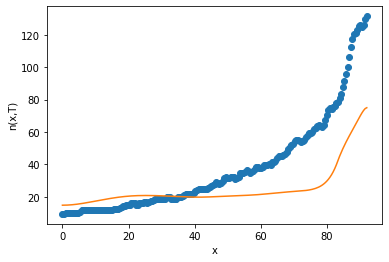

after perturb [4.237035069219526, 91.38684489597851, 21492.21605586346, 0.8148035511867812, 6.524107451659683]
parameters [4.237035069219526, 91.38684489597851, 21492.21605586346, 0.8148035511867812, 6.524107451659683]
oxigeno [1.26002731e-13 1.27571633e-13 1.32317757e-13 1.40360464e-13
 1.51902406e-13 1.67235211e-13 1.86747674e-13 2.10936684e-13
 2.40421198e-13 2.75959681e-13 3.18471502e-13 3.69062915e-13
 4.29058392e-13 5.00038213e-13 5.83883437e-13 6.82829571e-13
 7.99530540e-13 9.37134870e-13 1.09937634e-12 1.29068184e-12
 1.51629967e-12 1.78245214e-12 2.09651699e-12 2.46724319e-12
 2.90500752e-12 3.42211955e-12 4.03318426e-12 4.75553290e-12
 5.60973491e-12 6.62020595e-12 7.81592977e-12 9.23131476e-12
 1.09072101e-11 1.28921101e-11 1.52435815e-11 1.80299528e-11
 2.13323143e-11 2.52468819e-11 2.98877921e-11 3.53904019e-11
 4.19151846e-11 4.96523257e-11 5.88271420e-11 6.97064684e-11
 8.26061836e-11 9.79000727e-11 1.16030263e-10 1.37519513e-10
 1.62985667e-10 1.93158681e-10 2.28900645

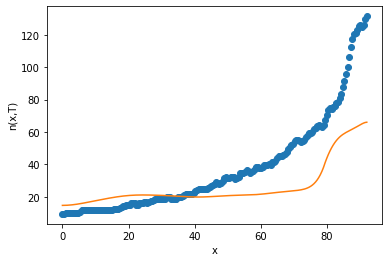

4
after perturb [4.034972127594439, 129.52084543395293, 19938.0416601305, 1.2814656666386532, 76.93584411346765]
parameters [4.034972127594439, 129.52084543395293, 19938.0416601305, 1.2814656666386532, 76.93584411346765]
after perturb [0.8268590088848433, 148.4510743880212, 18662.470121003964, -1.047461451281089, 21.591486639852686]
parameters [0.8268590088848433, 148.4510743880212, 18662.470121003964, -1.047461451281089, 21.591486639852686]
after perturb [7.3719611514803525, 116.97357232590326, 23577.550678450843, 1.1890513707439478, 2.7227712592817532]
parameters [7.3719611514803525, 116.97357232590326, 23577.550678450843, 1.1890513707439478, 2.7227712592817532]
oxigeno [2.22231791e-14 2.25128575e-14 2.33894776e-14 2.48760094e-14
 2.70114631e-14 2.98520032e-14 3.34725552e-14 3.79689545e-14
 4.34607037e-14 5.00944234e-14 5.80481006e-14 6.75362692e-14
 7.88162790e-14 9.21958492e-14 1.08042140e-13 1.26792623e-13
 1.48968088e-13 1.75188194e-13 2.06190043e-13 2.42850356e-13
 2.86211954e-1

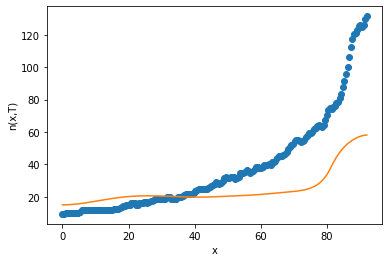

after perturb [-1.7896831582454729, 58.963877772569916, 21130.8907302576, 2.875429504046554, 55.8638098847988]
parameters [-1.7896831582454729, 58.963877772569916, 21130.8907302576, 2.875429504046554, 55.8638098847988]
after perturb [-1.3795025563685586, 81.81154380134728, 22307.72019873292, -1.4122004961655708, 7.598150133588464]
parameters [-1.3795025563685586, 81.81154380134728, 22307.72019873292, -1.4122004961655708, 7.598150133588464]
after perturb [-1.5175698487888718, 62.35420162574682, 21976.679219219655, 3.5150712106140047, 22.873095541335573]
parameters [-1.5175698487888718, 62.35420162574682, 21976.679219219655, 3.5150712106140047, 22.873095541335573]
after perturb [6.005002244302551, 107.47823429335585, 18276.994175150605, 1.485327354370238, 24.453934307937054]
parameters [6.005002244302551, 107.47823429335585, 18276.994175150605, 1.485327354370238, 24.453934307937054]
after perturb [0.9366164668226635, 51.56396209031812, 20980.540157686435, 0.9942453651253396, 0.8973787657

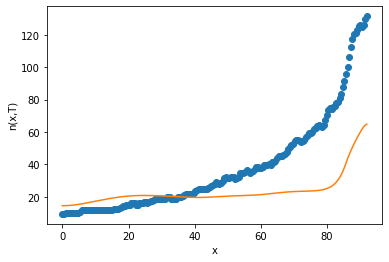

after perturb [2.841883914335347, 144.21756619589166, 22580.231766241093, 1.9380552206891082, 29.63224549366]
parameters [2.841883914335347, 144.21756619589166, 22580.231766241093, 1.9380552206891082, 29.63224549366]
oxigeno [9.88391901e-16 1.00295481e-15 1.04708681e-15 1.12213351e-15
 1.23039090e-15 1.37518721e-15 1.56100159e-15 1.79362376e-15
 2.08036029e-15 2.43029511e-15 2.85461347e-15 3.36700143e-15
 3.98413552e-15 4.72628096e-15 5.61802091e-15 6.68914456e-15
 7.97572831e-15 9.52145170e-15 1.13791998e-14 1.36130151e-14
 1.63004758e-14 1.95355954e-14 2.34323589e-14 2.81290370e-14
 3.37934504e-14 4.06293936e-14 4.88844767e-14 5.88596947e-14
 7.09211072e-14 8.55140912e-14 1.03180731e-13 1.24581030e-13
 1.50518781e-13 1.81973096e-13 2.20136822e-13 2.66463317e-13
 3.22723348e-13 3.91074270e-13 4.74144018e-13 5.75133026e-13
 6.97937738e-13 8.47300179e-13 1.02898890e-12 1.25001775e-12
 1.51891024e-12 1.84601885e-12 2.24391074e-12 2.72783358e-12
 3.31627827e-12 4.03165909e-12 4.90113572e-

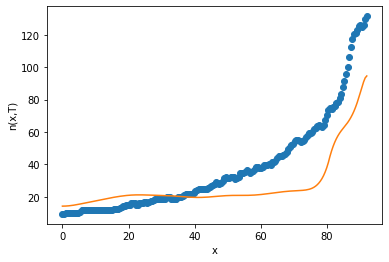

5
after perturb [-2.004263384355816, 97.24674112434843, 18403.97318503176, -1.0906064976022138, 33.13049907620743]
parameters [-2.004263384355816, 97.24674112434843, 18403.97318503176, -1.0906064976022138, 33.13049907620743]
after perturb [2.212287266778611, 101.80833796262525, 23149.229983300145, 0.2526343603902266, -0.7154335895301571]
parameters [2.212287266778611, 101.80833796262525, 23149.229983300145, 0.2526343603902266, -0.7154335895301571]
after perturb [6.773687912991863, 182.69936906378217, 26086.440072221394, 3.0628039804987397, 29.82585476560812]
parameters [6.773687912991863, 182.69936906378217, 26086.440072221394, 3.0628039804987397, 29.82585476560812]
after perturb [5.8490284357370275, 117.60032262457403, 27854.224622717516, 2.2505719335866843, -10.540652503569813]
parameters [5.8490284357370275, 117.60032262457403, 27854.224622717516, 2.2505719335866843, -10.540652503569813]
after perturb [0.3672528036357363, 25.2940379568712, 20941.84383420973, 0.13009290716456534, -4.

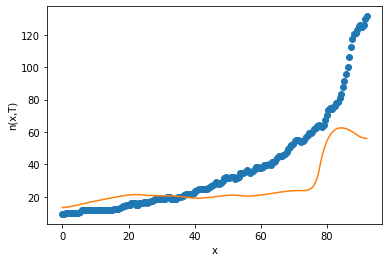

after perturb [4.3397307993525756, 185.73235559067643, 23273.81924062741, 0.10259290734455861, -23.426685673411576]
parameters [4.3397307993525756, 185.73235559067643, 23273.81924062741, 0.10259290734455861, -23.426685673411576]
after perturb [6.672567319325642, 108.43911590212022, 27576.121026137393, 4.3367115673729995, 25.41243522131939]
parameters [6.672567319325642, 108.43911590212022, 27576.121026137393, 4.3367115673729995, 25.41243522131939]
oxigeno [1.14290909e-26 1.19237367e-26 1.34506081e-26 1.61423714e-26
 2.02333840e-26 2.60808862e-26 3.41974477e-26 4.52977777e-26
 6.03644086e-26 8.07386205e-26 1.08245476e-25 1.45365248e-25
 1.95468196e-25 2.63136074e-25 3.54602609e-25 4.78357421e-25
 6.45974758e-25 8.73251790e-25 1.18177359e-24 1.60106683e-24
 2.17156624e-24 2.94870448e-24 4.00855543e-24 5.45562742e-24
 7.43363377e-24 1.01403888e-23 1.38484236e-23 1.89335351e-23
 2.59143443e-23 3.55071372e-23 4.87019268e-23 6.68679899e-23
 9.19003517e-23 1.26423161e-22 1.74072118e-22 2.3988

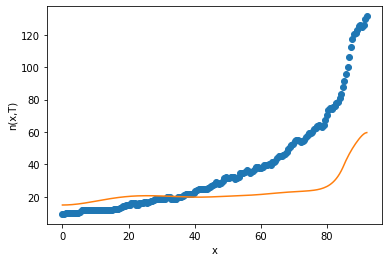

after perturb [1.2419417360644693, 102.65722578223732, 23099.06589285754, 4.139336733497441, 44.02992798243994]
parameters [1.2419417360644693, 102.65722578223732, 23099.06589285754, 4.139336733497441, 44.02992798243994]
oxigeno [8.97415307e-27 9.33597123e-27 1.04515007e-26 1.24138057e-26
 1.53877184e-26 1.96253684e-26 2.54899258e-26 3.34898466e-26
 4.43269929e-26 5.89634651e-26 7.87139498e-26 1.05373042e-25
 1.41390564e-25 1.90112696e-25 2.56113236e-25 3.45648152e-25
 4.67278915e-25 6.32727372e-25 8.58049533e-25 1.16525080e-24
 1.58451554e-24 2.15729551e-24 2.94060267e-24 4.01299275e-24
 5.48292078e-24 7.50041674e-24 1.02733961e-23 1.40904232e-23
 1.93524438e-23 2.66169795e-23 3.66596619e-23 5.05599551e-23
 6.98207471e-23 9.65355424e-23 1.33622767e-22 1.85154873e-22
 2.56821378e-22 3.56580846e-22 4.95578631e-22 6.89436995e-22
 9.60064712e-22 1.33818844e-21 1.86688330e-21 2.60648314e-21
 3.64139344e-21 5.08952687e-21 7.11535723e-21 9.94797216e-21
 1.39060424e-20 1.94323753e-20 2.714176

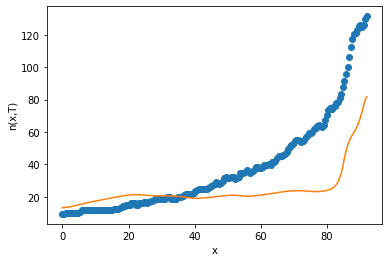

after perturb [-0.935238424210703, 119.7173728711147, 22091.786091404174, 4.116617073104937, 27.478337066942146]
parameters [-0.935238424210703, 119.7173728711147, 22091.786091404174, 4.116617073104937, 27.478337066942146]
after perturb [0.2265124852533864, 160.96366511863386, 22748.57089585143, 2.4352527088274796, 39.09590317116536]
parameters [0.2265124852533864, 160.96366511863386, 22748.57089585143, 2.4352527088274796, 39.09590317116536]
after perturb [4.34474838498438, 124.03559438652566, 24596.4567886693, 5.113355323031674, 29.024032208649025]
parameters [4.34474838498438, 124.03559438652566, 24596.4567886693, 5.113355323031674, 29.024032208649025]
oxigeno [7.20685389e-27 7.51031470e-27 8.44644478e-27 1.00947941e-26
 1.25958570e-26 1.61637354e-26 2.11055425e-26 2.78494248e-26
 3.69839282e-26 4.93125630e-26 6.59289440e-26 8.83199668e-26
 1.18507334e-25 1.59241683e-25 2.14269025e-25 2.88696695e-25
 3.89496518e-25 5.26197320e-25 7.11839081e-25 9.64288984e-25
 1.30805858e-24 1.776815

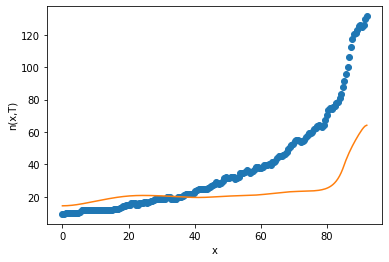

after perturb [5.331442226541158, 127.53333240733699, 26121.52745565889, 1.9310249060851943, -1.2508298322458202]
parameters [5.331442226541158, 127.53333240733699, 26121.52745565889, 1.9310249060851943, -1.2508298322458202]
after perturb [-1.0193750160188073, 69.02531712605153, 20193.40043579701, 2.891036996620328, 66.4466962290127]
parameters [-1.0193750160188073, 69.02531712605153, 20193.40043579701, 2.891036996620328, 66.4466962290127]
after perturb [6.7806099981508225, 99.54438723136113, 25340.335602199353, 1.2470786223123271, 47.116111753167246]
parameters [6.7806099981508225, 99.54438723136113, 25340.335602199353, 1.2470786223123271, 47.116111753167246]
oxigeno [1.34655706e-15 1.36833587e-15 1.43437790e-15 1.54682449e-15
 1.70932728e-15 1.92717563e-15 2.20748154e-15 2.55942908e-15
 2.99459765e-15 3.52737115e-15 4.17544851e-15 4.96047477e-15
 5.90881656e-15 7.05251134e-15 8.43042645e-15 1.00896720e-14
 1.20873215e-14 1.44925060e-14 1.73889620e-14 2.08781308e-14
 2.50829277e-14 3.

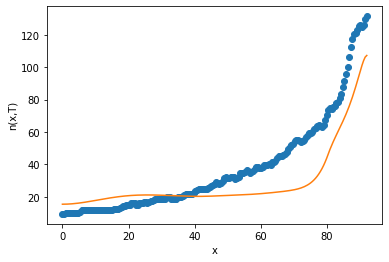

6
after perturb [3.158413613373582, 121.61474120765298, 26851.107631010887, 1.2005962296412542, 38.055281017428264]
parameters [3.158413613373582, 121.61474120765298, 26851.107631010887, 1.2005962296412542, 38.055281017428264]
oxigeno [9.06781659e-14 9.17579786e-14 9.50238825e-14 1.00556035e-13
 1.08490591e-13 1.19023611e-13 1.32416686e-13 1.49004435e-13
 1.69204075e-13 1.93527343e-13 2.22595117e-13 2.57155138e-13
 2.98103364e-13 3.46509592e-13 4.03648097e-13 4.71034222e-13
 5.50468027e-13 6.44086339e-13 7.54424809e-13 8.84491886e-13
 1.03785703e-12 1.21875592e-12 1.43221587e-12 1.68420550e-12
 1.98181314e-12 2.33345970e-12 2.74915242e-12 3.24078743e-12
 3.82251035e-12 4.51114592e-12 5.32670974e-12 6.29301745e-12
 7.43840952e-12 8.79661317e-12 1.04077664e-11 1.23196340e-11
 1.45890498e-11 1.72836265e-11 2.04837799e-11 2.42851237e-11
 2.88012997e-11 3.41673215e-11 4.05435194e-11 4.81201947e-11
 5.71231083e-11 6.78199505e-11 8.05279702e-11 9.56229700e-11
 1.13549915e-10 1.34835451e-10 1.

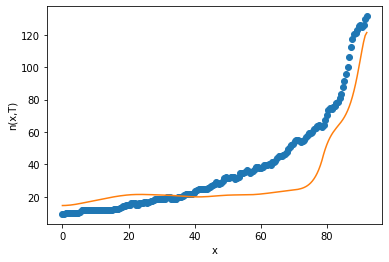

7
after perturb [9.020091593933353, 167.85673369380734, 26336.456026018433, 0.6041206972978701, 42.576702183755124]
parameters [9.020091593933353, 167.85673369380734, 26336.456026018433, 0.6041206972978701, 42.576702183755124]
after perturb [9.41857700415823, 156.74725542941096, 23014.449069464587, -0.0450639778550701, 11.30944212192028]
parameters [9.41857700415823, 156.74725542941096, 23014.449069464587, -0.0450639778550701, 11.30944212192028]
after perturb [1.05878283412657, 107.28969702850523, 29023.525355576057, 2.830266054314169, 24.107417983869862]
parameters [1.05878283412657, 107.28969702850523, 29023.525355576057, 2.830266054314169, 24.107417983869862]
after perturb [5.6736933524844515, 144.1570450961709, 28203.39625061818, 0.981133258796806, 23.431030650223903]
parameters [5.6736933524844515, 144.1570450961709, 28203.39625061818, 0.981133258796806, 23.431030650223903]
oxigeno [1.82929831e-11 1.84482565e-11 1.89167647e-11 1.97066251e-11
 2.08315482e-11 2.23111129e-11 2.417116

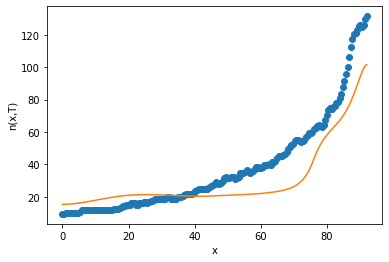

8
after perturb [7.686329388357754, 163.22331073917962, 22329.976724457803, 2.760798256592688, 23.302366537574606]
parameters [7.686329388357754, 163.22331073917962, 22329.976724457803, 2.760798256592688, 23.302366537574606]
after perturb [2.183517452429342, 100.1730561497944, 19075.048889286787, 4.0362057345687665, 45.675453248635534]
parameters [2.183517452429342, 100.1730561497944, 19075.048889286787, 4.0362057345687665, 45.675453248635534]
after perturb [6.679423039667698, 90.00382304815324, 25899.153890127993, 3.3872078582140377, 24.518602038307378]
parameters [6.679423039667698, 90.00382304815324, 25899.153890127993, 3.3872078582140377, 24.518602038307378]
oxigeno [3.47090780e-26 3.61979514e-26 4.07924441e-26 4.88875274e-26
 6.11803961e-26 7.87326481e-26 1.03065351e-25 1.36295955e-25
 1.81330000e-25 2.42125880e-25 3.24058018e-25 4.34413435e-25
 5.83069916e-25 7.83421944e-25 1.05364540e-24 1.41842608e-24
 1.91132387e-24 2.57800933e-24 3.48069809e-24 4.70423202e-24
 6.36442539e-24 

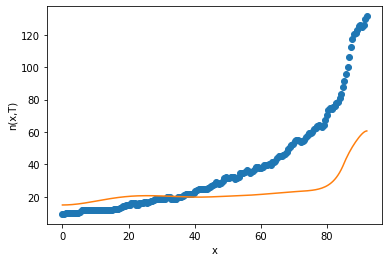

after perturb [3.226112390369423, 114.41505047273326, 19774.689731925184, 0.8698313235187891, 15.717686787708546]
parameters [3.226112390369423, 114.41505047273326, 19774.689731925184, 0.8698313235187891, 15.717686787708546]
after perturb [6.797282072956924, 230.34606547691524, 21043.324280883477, 0.5338387344817161, 18.418185924788403]
parameters [6.797282072956924, 230.34606547691524, 21043.324280883477, 0.5338387344817161, 18.418185924788403]
after perturb [-2.683171187762236, 89.40917970246075, 25121.209294559078, 2.0093189902256117, -1.581244283534474]
parameters [-2.683171187762236, 89.40917970246075, 25121.209294559078, 2.0093189902256117, -1.581244283534474]
after perturb [1.0561232689718587, -5.347749389672998, 26260.920947212853, 0.27396483111462694, 30.95137211335391]
parameters [1.0561232689718587, -5.347749389672998, 26260.920947212853, 0.27396483111462694, 30.95137211335391]
after perturb [1.175861123468711, 83.63241875428756, 21047.37742645644, 2.4124419140823594, 90.896

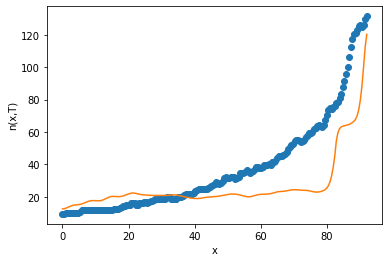

9
after perturb [1.2556257777875883, 157.6319795253239, 23740.980834665523, -0.8961914984791184, 43.82708310137488]
parameters [1.2556257777875883, 157.6319795253239, 23740.980834665523, -0.8961914984791184, 43.82708310137488]
after perturb [-1.5961639107741195, 21.326538017380415, 23840.539822907376, -5.0274723318892525, -33.118156474752965]
parameters [-1.5961639107741195, 21.326538017380415, 23840.539822907376, -5.0274723318892525, -33.118156474752965]
after perturb [-1.5456401183712556, 74.42596762414075, 19054.423574015567, -1.1007840323265266, 45.389770492023686]
parameters [-1.5456401183712556, 74.42596762414075, 19054.423574015567, -1.1007840323265266, 45.389770492023686]
after perturb [1.4452236367952618, 46.354100265079914, 21600.348409323287, 1.095622846888081, -0.914973592459182]
parameters [1.4452236367952618, 46.354100265079914, 21600.348409323287, 1.095622846888081, -0.914973592459182]
after perturb [3.819396369904612, 189.54607397684632, 24727.092388155463, 5.1818584971

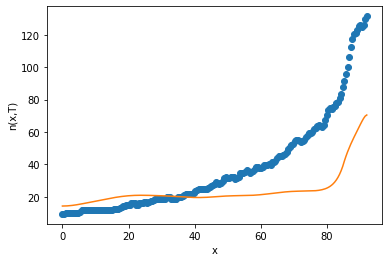

after perturb [2.924588775397899, 138.18224368807748, 21594.811422624294, 2.448192408206743, 17.318446413279794]
parameters [2.924588775397899, 138.18224368807748, 21594.811422624294, 2.448192408206743, 17.318446413279794]
oxigeno [5.06293321e-18 5.15920173e-18 5.45176000e-18 5.95203309e-18
 6.67962704e-18 7.66320257e-18 8.94175426e-18 1.05663546e-17
 1.26024442e-17 1.51327745e-17 1.82611424e-17 2.21170922e-17
 2.68618084e-17 3.26954819e-17 3.98665044e-17 4.86829367e-17
 5.95268136e-17 7.28719888e-17 8.93064082e-17 1.09559923e-16
 1.34539046e-16 1.65370402e-16 2.03455089e-16 2.50536718e-16
 3.08786615e-16 3.80910549e-16 4.70282471e-16 5.81112140e-16
 7.18655253e-16 8.89476883e-16 1.10178176e-15 1.36582832e-15
 1.69444775e-15 2.10369440e-15 2.61366062e-15 3.24949715e-15
 4.04269001e-15 5.03265765e-15 6.26874676e-15 7.81272465e-15
 9.74188878e-15 1.21529432e-14 1.51668272e-14 1.89347252e-14
 2.36455436e-14 2.95352052e-14 3.68982029e-14 4.61019541e-14
 5.76046371e-14 7.19773508e-14 8.9931

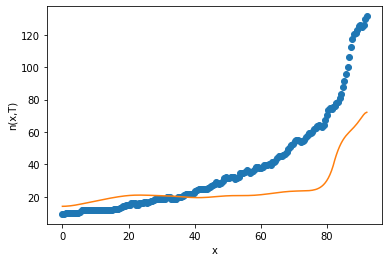

after perturb [7.6851473317079435, 87.19635844133128, 24548.43190127229, 1.5980907907955157, 24.57584028600175]
parameters [7.6851473317079435, 87.19635844133128, 24548.43190127229, 1.5980907907955157, 24.57584028600175]
oxigeno [8.91041951e-19 9.12063708e-19 9.76119390e-19 1.08622903e-18
 1.24759124e-18 1.46784008e-18 1.75742338e-18 2.13012235e-18
 2.60373981e-18 3.20099350e-18 3.95066176e-18 4.88904256e-18
 6.06180393e-18 7.52632482e-18 9.35465264e-18 1.16372371e-17
 1.44876428e-17 1.80484973e-17 2.24989986e-17 2.80643942e-17
 3.50279503e-17 4.37460711e-17 5.46674018e-17 6.83569689e-17
 8.55266948e-17 1.07073976e-16 1.34130461e-16 1.68123741e-16
 2.10855362e-16 2.64599495e-16 3.32227734e-16 4.17366932e-16
 5.24598806e-16 6.59712350e-16 8.30022979e-16 1.04477598e-15
 1.31565644e-15 1.65743362e-15 2.08877498e-15 2.63327432e-15
 3.32074988e-15 4.18888277e-15 5.28528432e-15 6.67010370e-15
 8.41931566e-15 1.06288644e-14 1.34198842e-14 1.69452742e-14
 2.13979751e-14 2.70213836e-14 3.412245

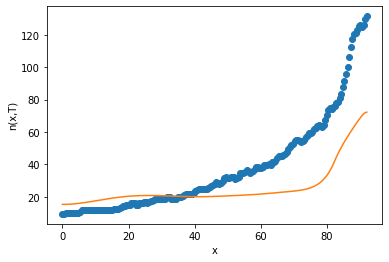

after perturb [-1.6427855169952748, 72.29195964833052, 21697.20040860985, 1.2069658268508225, 10.245713133797008]
parameters [-1.6427855169952748, 72.29195964833052, 21697.20040860985, 1.2069658268508225, 10.245713133797008]
after perturb [5.722760060845525, 149.07198966154303, 23994.22771625884, 2.0780977179935354, 29.85616960728001]
parameters [5.722760060845525, 149.07198966154303, 23994.22771625884, 2.0780977179935354, 29.85616960728001]
oxigeno [5.57141872e-16 5.65866781e-16 5.92318397e-16 6.37337099e-16
 7.02356269e-16 7.89452720e-16 9.01419958e-16 1.04186706e-15
 1.21534696e-15 1.42751898e-15 1.68535197e-15 1.99737570e-15
 2.37399035e-15 2.82784595e-15 3.37430667e-15 4.03201792e-15
 4.82359856e-15 5.77648530e-15 6.92396268e-15 8.30641927e-15
 9.97287983e-15 1.19828743e-14 1.44087179e-14 1.73382936e-14
 2.08784469e-14 2.51591295e-14 3.03384568e-14 3.66088798e-14
 4.42047192e-14 5.34113594e-14 6.45764680e-14 7.81236857e-14
 9.45693248e-14 1.14542736e-13 1.38811141e-13 1.68309898e-

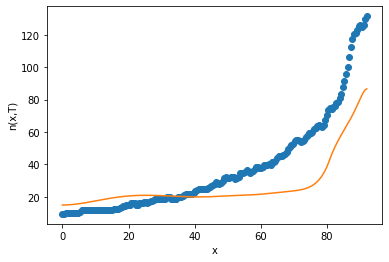

10
after perturb [1.122315139639672, -50.80969542618287, 20976.990560857004, -0.9750637825003727, 9.055242186969611]
parameters [1.122315139639672, -50.80969542618287, 20976.990560857004, -0.9750637825003727, 9.055242186969611]
after perturb [4.021535381123984, 87.68607484324832, 17699.75667916266, 8.236683569241139, 73.80122505824586]
parameters [4.021535381123984, 87.68607484324832, 17699.75667916266, 8.236683569241139, 73.80122505824586]
after perturb [2.4758493461647, 94.29496857508018, 18325.360179565236, -1.1210666394747935, 58.978479066211676]
parameters [2.4758493461647, 94.29496857508018, 18325.360179565236, -1.1210666394747935, 58.978479066211676]
after perturb [1.181867018466546, 94.74602020996346, 23378.532462781477, 0.04568227006582637, 15.905047836065805]
parameters [1.181867018466546, 94.74602020996346, 23378.532462781477, 0.04568227006582637, 15.905047836065805]
oxigeno [ 0.1165156   0.11647516  0.11635434  0.11615468  0.11587859  0.11552924
  0.11511037  0.11462611  0.

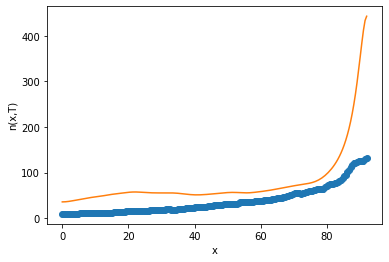

after perturb [9.41943134664379, 167.3890537243747, 23040.773715257066, 1.6677498815994747, 24.82186781174326]
parameters [9.41943134664379, 167.3890537243747, 23040.773715257066, 1.6677498815994747, 24.82186781174326]
after perturb [11.65941318553247, 120.37728465210485, 23507.33831470207, -0.6412016721054559, 11.07288839361619]
parameters [11.65941318553247, 120.37728465210485, 23507.33831470207, -0.6412016721054559, 11.07288839361619]
after perturb [-3.9126138224409757, 138.68753545307976, 23663.573917733574, 0.7203059399257744, 0.36788609265674665]
parameters [-3.9126138224409757, 138.68753545307976, 23663.573917733574, 0.7203059399257744, 0.36788609265674665]
after perturb [-1.4560145159626583, 116.25720922492403, 23359.7654496027, 5.529068997255011, 27.620761735965704]
parameters [-1.4560145159626583, 116.25720922492403, 23359.7654496027, 5.529068997255011, 27.620761735965704]
after perturb [4.3834725168195865, 143.33909824883358, 29112.410550976725, 1.7967257797839975, 8.6648332

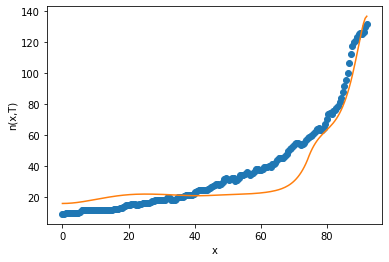

11
after perturb [0.5026430967903839, 113.99404327070849, 24950.359563774415, 0.8724956803125637, -7.963480748344949]
parameters [0.5026430967903839, 113.99404327070849, 24950.359563774415, 0.8724956803125637, -7.963480748344949]
after perturb [1.6669936103021392, 153.50545325257977, 22477.474798115414, -0.00901684045374207, 34.35923746646349]
parameters [1.6669936103021392, 153.50545325257977, 22477.474798115414, -0.00901684045374207, 34.35923746646349]
after perturb [-0.2492314001216443, 150.25126012287623, 27531.503240296464, -0.408130764607475, 10.808353673260923]
parameters [-0.2492314001216443, 150.25126012287623, 27531.503240296464, -0.408130764607475, 10.808353673260923]
after perturb [-0.17019544222171923, 103.44339126688683, 18181.21610227069, 3.3178585225125152, 29.783687461839932]
parameters [-0.17019544222171923, 103.44339126688683, 18181.21610227069, 3.3178585225125152, 29.783687461839932]
after perturb [9.03493880321922, 140.74037529515658, 26820.76880012998, 6.098310168

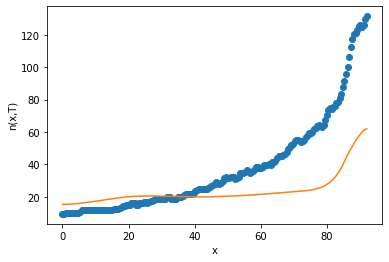

after perturb [0.7129141596730919, -24.663965361023976, 16747.439524238616, 2.6990758193693942, 80.73896524195584]
parameters [0.7129141596730919, -24.663965361023976, 16747.439524238616, 2.6990758193693942, 80.73896524195584]
after perturb [10.908950518227858, 172.26556582302652, 27627.054608579743, 5.319918393343189, 44.24768736059495]
parameters [10.908950518227858, 172.26556582302652, 27627.054608579743, 5.319918393343189, 44.24768736059495]
after perturb [4.325316424373989, 152.57401004890087, 28892.363441416728, 4.811743947608848, 27.517274978037438]
parameters [4.325316424373989, 152.57401004890087, 28892.363441416728, 4.811743947608848, 27.517274978037438]
after perturb [10.788324974497526, 84.25596277202935, 27707.05113702389, 2.394727557743428, 25.99674204355491]
parameters [10.788324974497526, 84.25596277202935, 27707.05113702389, 2.394727557743428, 25.99674204355491]
after perturb [-1.9874040080681903, 122.59891672234168, 19854.231689961456, 0.3074030699167021, 23.501824698

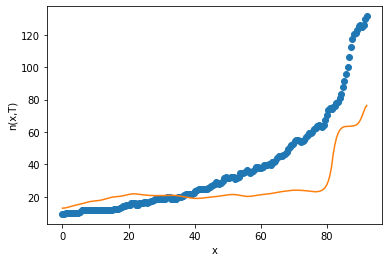

after perturb [8.194130331462931, 96.38807941400046, 20347.418936128714, 0.4848942896320847, 48.23336111769325]
parameters [8.194130331462931, 96.38807941400046, 20347.418936128714, 0.4848942896320847, 48.23336111769325]
oxigeno [3.54620897e-10 3.56348260e-10 3.61558982e-10 3.70339425e-10
 3.82835077e-10 3.99252915e-10 4.19864763e-10 4.45011724e-10
 4.75109750e-10 5.10656458e-10 5.52239323e-10 6.00545373e-10
 6.56372579e-10 7.20643131e-10 7.94418845e-10 8.78918947e-10
 9.75540583e-10 1.08588237e-09 1.21177143e-09 1.35529433e-09
 1.51883254e-09 1.70510288e-09 1.91720377e-09 2.15866800e-09
 2.43352288e-09 2.74635884e-09 3.10240754e-09 3.50763081e-09
 3.96882190e-09 4.49372057e-09 5.09114404e-09 5.77113568e-09
 6.54513401e-09 7.42616450e-09 8.42905726e-09 9.57069397e-09
 1.08702878e-08 1.23497008e-08 1.40338030e-08 1.59508798e-08
 1.81330923e-08 2.06169983e-08 2.34441420e-08 2.66617200e-08
 3.03233339e-08 3.44898413e-08 3.92303155e-08 4.46231298e-08
 5.07571806e-08 5.77332670e-08 6.566564

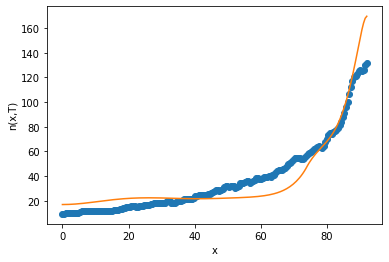

12
after perturb [1.333480303833578, 85.70331276835329, 19776.9032216821, 3.5422374110696486, 38.223740151519124]
parameters [1.333480303833578, 85.70331276835329, 19776.9032216821, 3.5422374110696486, 38.223740151519124]
after perturb [4.685347728978002, 145.6119550468223, 24995.36373726392, 4.014593966828198, 56.91434580299034]
parameters [4.685347728978002, 145.6119550468223, 24995.36373726392, 4.014593966828198, 56.91434580299034]
after perturb [3.0012273368062012, 113.08973036942712, 23030.192791098205, 2.2591703319442265, 43.77566395061285]
parameters [3.0012273368062012, 113.08973036942712, 23030.192791098205, 2.2591703319442265, 43.77566395061285]
oxigeno [3.48606167e-19 3.56358318e-19 3.79965797e-19 4.20499427e-19
 4.79804024e-19 5.60591923e-19 6.66580828e-19 8.02683357e-19
 9.75258454e-19 1.19243817e-18 1.46454747e-18 1.80463986e-18
 2.22917794e-18 2.75889635e-18 3.41989451e-18 4.24502006e-18
 5.27562006e-18 6.56375873e-18 8.17502722e-18 1.01921057e-17
 1.27192819e-17 1.58881

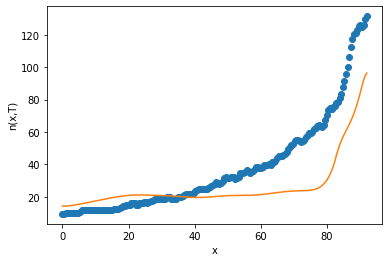

13
after perturb [7.63533720172801, 75.72361394952459, 31308.637736118508, -0.14221795241425372, 8.411517081784893]
parameters [7.63533720172801, 75.72361394952459, 31308.637736118508, -0.14221795241425372, 8.411517081784893]
after perturb [-0.993436892322757, 119.1111747379405, 21748.15169743242, 1.0499443628159528, 22.51078290022865]
parameters [-0.993436892322757, 119.1111747379405, 21748.15169743242, 1.0499443628159528, 22.51078290022865]
after perturb [-2.192805330413009, 145.1486642490913, 18476.83985432375, 5.7289763393867705, 78.2182504888871]
parameters [-2.192805330413009, 145.1486642490913, 18476.83985432375, 5.7289763393867705, 78.2182504888871]
after perturb [-6.549600135517349, 1.3517956405793115, 16521.122116187296, 1.5175816903290937, 37.62653654109961]
parameters [-6.549600135517349, 1.3517956405793115, 16521.122116187296, 1.5175816903290937, 37.62653654109961]
after perturb [-4.629078789415959, 54.961547942629856, 28745.012559012062, -1.9753137924982076, -13.526634721

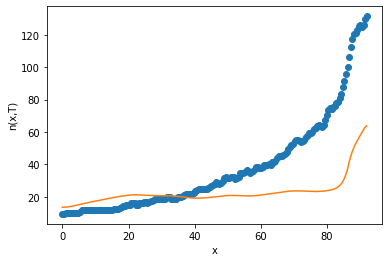

after perturb [3.60451388583771, 87.79225684348592, 20842.21155051906, 2.431142183228005, 33.488862276159594]
parameters [3.60451388583771, 87.79225684348592, 20842.21155051906, 2.431142183228005, 33.488862276159594]
oxigeno [1.10641018e-22 1.14184082e-22 1.25041778e-22 1.43915384e-22
 1.72027411e-22 2.11206320e-22 2.64013775e-22 3.33923836e-22
 4.25567434e-22 5.45060333e-22 7.00439170e-22 9.02238393e-22
 1.16425172e-21 1.50453606e-21 1.94673466e-21 2.52182119e-21
 3.27039980e-21 4.24573998e-21 5.51778368e-21 7.17844011e-21
 9.34858700e-21 1.21873351e-20 1.59042966e-20 2.07758418e-20
 2.71666553e-20 3.55583365e-20 4.65873655e-20 6.10955273e-20
 8.01969087e-20 1.05366946e-19 1.38560815e-19 1.82370852e-19
 2.40235914e-19 3.16719794e-19 4.17881471e-19 5.51767385e-19
 7.29065816e-19 9.63976458e-19 1.27536552e-18 1.68829940e-18
 2.23607997e-18 2.96294415e-18 3.92764243e-18 5.20817988e-18
 6.90809373e-18 9.16476085e-18 1.21603858e-17 1.61365274e-17
 2.14132943e-17 2.84147010e-17 3.77021472e-

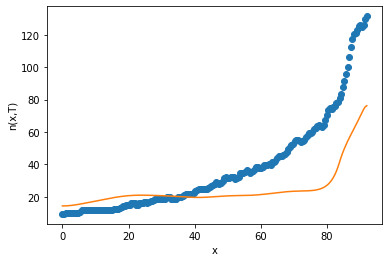

after perturb [1.431000556556922, 119.77530918451632, 17743.332384758123, 2.702308576342637, 58.988058617857135]
parameters [1.431000556556922, 119.77530918451632, 17743.332384758123, 2.702308576342637, 58.988058617857135]
after perturb [11.33575886060876, 181.6251577288567, 27692.854567182938, 3.3309806390704186, 23.595042219723425]
parameters [11.33575886060876, 181.6251577288567, 27692.854567182938, 3.3309806390704186, 23.595042219723425]
after perturb [8.89483306874515, 64.74143421294117, 24130.337689370055, 0.7987858877372582, -7.63070645539098]
parameters [8.89483306874515, 64.74143421294117, 24130.337689370055, 0.7987858877372582, -7.63070645539098]
after perturb [-1.2540291290094383, 20.083309336514645, 27527.21360853344, -0.4825820432008253, -13.767428094226823]
parameters [-1.2540291290094383, 20.083309336514645, 27527.21360853344, -0.4825820432008253, -13.767428094226823]
after perturb [-6.021049349624233, 141.13036217354855, 25855.485107562545, 1.8964708769047762, 23.758744

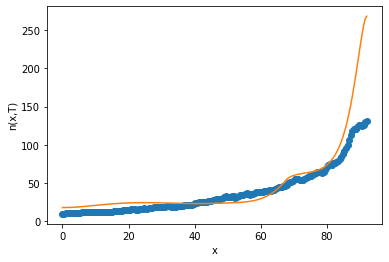

after perturb [6.841172584251765, 41.332931429800965, 29192.027752544112, -0.6892125773122545, -18.76275516192542]
parameters [6.841172584251765, 41.332931429800965, 29192.027752544112, -0.6892125773122545, -18.76275516192542]
after perturb [3.207828707464886, 22.834953671458592, 19379.88428616329, 2.5330632210340425, 38.15575381839896]
parameters [3.207828707464886, 22.834953671458592, 19379.88428616329, 2.5330632210340425, 38.15575381839896]
after perturb [1.6440774563639404, 224.1085825519451, 23727.761348898024, 0.009560127473187241, -28.17005612019782]
parameters [1.6440774563639404, 224.1085825519451, 23727.761348898024, 0.009560127473187241, -28.17005612019782]
after perturb [5.337104365238949, 115.81129265915746, 21512.31060060939, 1.9000636839886185, 52.09825604689756]
parameters [5.337104365238949, 115.81129265915746, 21512.31060060939, 1.9000636839886185, 52.09825604689756]
after perturb [6.038640467636024, 216.59994956416213, 24420.223986457662, 2.243620035170787, 9.7782269

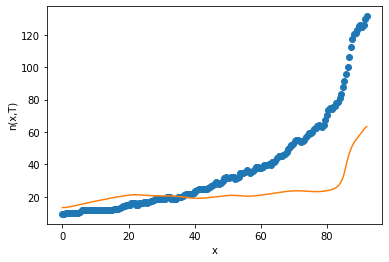

after perturb [-2.656981036252752, 108.3543423216086, 25224.995721948864, 4.996052626343779, 54.9563038537805]
parameters [-2.656981036252752, 108.3543423216086, 25224.995721948864, 4.996052626343779, 54.9563038537805]
after perturb [0.5043992281275363, 104.87943294911994, 25028.585106604874, -1.125445726762782, 4.3346270242915965]
parameters [0.5043992281275363, 104.87943294911994, 25028.585106604874, -1.125445726762782, 4.3346270242915965]
after perturb [2.5208830432029483, 178.9896548751081, 22896.133606165797, -1.0321178953554535, -1.8012034847515501]
parameters [2.5208830432029483, 178.9896548751081, 22896.133606165797, -1.0321178953554535, -1.8012034847515501]
after perturb [11.119572933926019, 164.6777439766869, 20985.343510133036, -0.41525939205985885, -4.993583382816109]
parameters [11.119572933926019, 164.6777439766869, 20985.343510133036, -0.41525939205985885, -4.993583382816109]
after perturb [1.3598902336983414, 107.70918653732596, 16078.542356352127, 7.022645152296224, 43

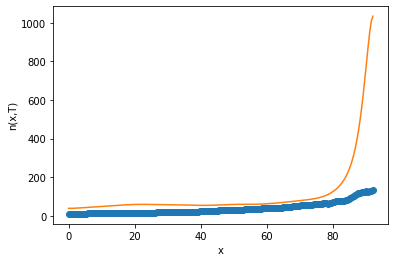

after perturb [11.041630927187041, 202.53208320300647, 23364.155805152554, 3.0894268391538953, 35.4579401364247]
parameters [11.041630927187041, 202.53208320300647, 23364.155805152554, 3.0894268391538953, 35.4579401364247]
after perturb [2.9944009673775525, 96.03782006563956, 25074.398715652078, 4.3090562102338525, 44.32510895344312]
parameters [2.9944009673775525, 96.03782006563956, 25074.398715652078, 4.3090562102338525, 44.32510895344312]
oxigeno [3.20554595e-28 3.35622029e-28 3.82253032e-28 4.64877744e-28
 5.91375365e-28 7.73873684e-28 1.02998705e-27 1.38462729e-27
 1.87258534e-27 2.54216707e-27 3.46028475e-27 4.71957045e-27
 6.44830681e-27 8.82429432e-27 1.20942275e-26 1.66007930e-26
 2.28206069e-26 3.14173851e-26 4.33165499e-26 5.98100399e-26
 8.27037223e-26 1.14524970e-25 1.58815294e-25 2.20543353e-25
 3.06688477e-25 4.27065964e-25 5.95495468e-25 8.31456593e-25
 1.16243688e-24 1.62726424e-24 2.28083997e-24 3.20086496e-24
 4.49740328e-24 6.32648582e-24 8.90946633e-24 1.25605672e-

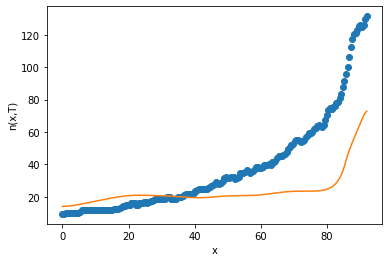

after perturb [0.1390393277375095, -10.282174922574015, 26632.675499109544, -0.9155731063175183, -9.647215013513577]
parameters [0.1390393277375095, -10.282174922574015, 26632.675499109544, -0.9155731063175183, -9.647215013513577]
after perturb [6.249909106757645, 91.39709065356574, 23622.27018903173, -0.36591047806600596, -4.56582173395806]
parameters [6.249909106757645, 91.39709065356574, 23622.27018903173, -0.36591047806600596, -4.56582173395806]
after perturb [3.969845862835558, 128.5788597054837, 20274.57422451808, 4.264063295950486, 14.049322104142746]
parameters [3.969845862835558, 128.5788597054837, 20274.57422451808, 4.264063295950486, 14.049322104142746]
oxigeno [2.40236245e-24 2.48471115e-24 2.73746044e-24 3.17814299e-24
 3.83742444e-24 4.76139117e-24 6.01500599e-24 7.68700956e-24
 9.89666372e-24 1.28028841e-23 1.66165082e-23 2.16167066e-23
 2.81728949e-23 3.67739693e-23 4.80673174e-23 6.29108926e-23
 8.24427777e-23 1.08174183e-22 1.42113885e-22 1.86934883e-22
 2.46197802e-2

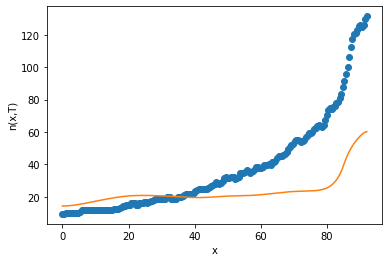

after perturb [4.8921403520618965, 114.92211251848407, 23821.045706527286, -0.08600062620116034, -15.009408432183172]
parameters [4.8921403520618965, 114.92211251848407, 23821.045706527286, -0.08600062620116034, -15.009408432183172]
after perturb [1.450683336660675, 119.38455790884483, 23605.7002048636, -0.945945807544825, 8.831470929713818]
parameters [1.450683336660675, 119.38455790884483, 23605.7002048636, -0.945945807544825, 8.831470929713818]
after perturb [0.4876678064898865, 39.92045340038129, 21487.890190617556, 2.144097427025669, -7.2071931378135865]
parameters [0.4876678064898865, 39.92045340038129, 21487.890190617556, 2.144097427025669, -7.2071931378135865]
after perturb [9.05404187044757, 109.2425028605261, 24406.668409681937, -1.459655825685302, 19.322986248137195]
parameters [9.05404187044757, 109.2425028605261, 24406.668409681937, -1.459655825685302, 19.322986248137195]
after perturb [7.60052189075667, 84.39910903631956, 23582.377381368187, 1.5619202573174604, 27.1945864

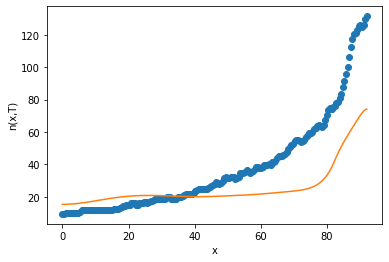

after perturb [2.6740184782161522, 117.65425516646546, 17610.974376486436, 4.100290692967378, 51.97942286738772]
parameters [2.6740184782161522, 117.65425516646546, 17610.974376486436, 4.100290692967378, 51.97942286738772]
after perturb [9.693668178052555, 75.89411097778506, 27334.973545049532, -1.3439121615230736, 10.6859663526897]
parameters [9.693668178052555, 75.89411097778506, 27334.973545049532, -1.3439121615230736, 10.6859663526897]
after perturb [2.7226786157844014, 138.69060063533587, 27676.27245873038, 0.7539889695410271, 16.897128919834167]
parameters [2.7226786157844014, 138.69060063533587, 27676.27245873038, 0.7539889695410271, 16.897128919834167]
oxigeno [2.26017298e-10 2.27573873e-10 2.32266356e-10 2.40163422e-10
 2.51380914e-10 2.66083924e-10 2.84489751e-10 3.06871759e-10
 3.33564190e-10 3.64967999e-10 4.01557795e-10 4.43889992e-10
 4.92612312e-10 5.48474789e-10 6.12342483e-10 6.85210126e-10
 7.68218983e-10 8.62676242e-10 9.70077317e-10 1.09213149e-09
 1.23079136e-09 1.

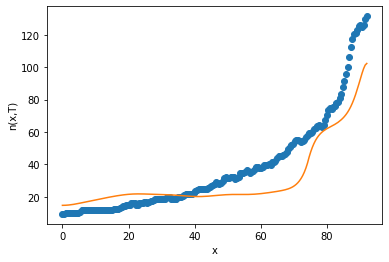

14
after perturb [0.24603485077130616, 60.39446876348056, 18396.424022427895, -2.9073248346046343, -18.238859049522937]
parameters [0.24603485077130616, 60.39446876348056, 18396.424022427895, -2.9073248346046343, -18.238859049522937]
after perturb [3.5444645869966696, 50.03399916375835, 19458.738632029996, 0.2245470178934108, 32.87709085973154]
parameters [3.5444645869966696, 50.03399916375835, 19458.738632029996, 0.2245470178934108, 32.87709085973154]
after perturb [15.117088531156877, 170.85170391254016, 23877.6280845364, 1.1724889198814283, 13.371290262680548]
parameters [15.117088531156877, 170.85170391254016, 23877.6280845364, 1.1724889198814283, 13.371290262680548]
after perturb [2.4253981910943456, 72.04222529858399, 25324.692712301116, 0.9862780936005842, 14.319485442673267]
parameters [2.4253981910943456, 72.04222529858399, 25324.692712301116, 0.9862780936005842, 14.319485442673267]
oxigeno [9.36556398e-17 9.54234785e-17 1.00794968e-16 1.09976943e-16
 1.23323963e-16 1.41353507

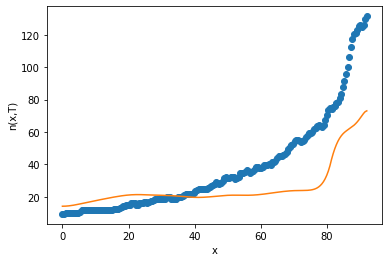

after perturb [7.10931534791956, 139.51783977738307, 20085.099998554404, 1.259099604431794, 40.69564864418235]
parameters [7.10931534791956, 139.51783977738307, 20085.099998554404, 1.259099604431794, 40.69564864418235]
oxigeno [4.18286009e-13 4.22890612e-13 4.36806832e-13 4.60344446e-13
 4.94028272e-13 5.38611202e-13 5.95092927e-13 6.64744849e-13
 7.49141854e-13 8.50201790e-13 9.70233694e-13 1.11199607e-12
 1.27876680e-12 1.47442645e-12 1.70355742e-12 1.97156138e-12
 2.28479827e-12 2.65075060e-12 3.07821745e-12 3.57754344e-12
 4.16088873e-12 4.84254754e-12 5.63932346e-12 6.57097198e-12
 7.66072184e-12 8.93588930e-12 1.04286018e-11 1.21766499e-11
 1.42244912e-11 1.66244312e-11 1.94380132e-11 2.27376548e-11
 2.66085707e-11 3.11510355e-11 3.64830423e-11 4.27434272e-11
 5.00955391e-11 5.87315488e-11 6.88775066e-11 8.07992764e-11
 9.48094957e-11 1.11275735e-10 1.30630061e-10 1.53380239e-10
 1.80122856e-10 2.11558676e-10 2.48510619e-10 2.91944790e-10
 3.42995071e-10 4.02991873e-10 4.73495739

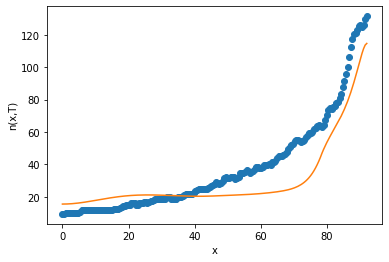

15
after perturb [-0.1921157213157878, 87.4820136855884, 23896.066340021185, 7.5872894023536634, 78.10170149417003]
parameters [-0.1921157213157878, 87.4820136855884, 23896.066340021185, 7.5872894023536634, 78.10170149417003]
after perturb [0.10667084597402399, 108.10348617751207, 23736.604523996477, -1.9333902341568476, 18.966935713322876]
parameters [0.10667084597402399, 108.10348617751207, 23736.604523996477, -1.9333902341568476, 18.966935713322876]
after perturb [-4.838709747755423, 94.05991129928475, 20452.526760310564, 1.7681043726928591, 36.14546107222375]
parameters [-4.838709747755423, 94.05991129928475, 20452.526760310564, 1.7681043726928591, 36.14546107222375]
after perturb [4.285599611176326, 117.18055644157177, 20706.20913797936, -1.3333264810028258, 41.16413396159315]
parameters [4.285599611176326, 117.18055644157177, 20706.20913797936, -1.3333264810028258, 41.16413396159315]
after perturb [-0.26969224221134097, 139.95911786160727, 23969.033113360645, -1.2509110976726867,

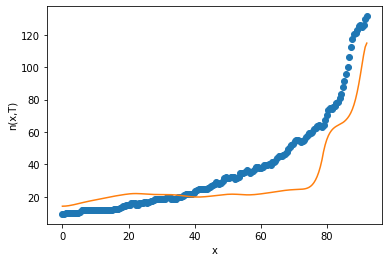

16
after perturb [-2.7625880090605763, 42.42390467053407, 21209.467656551868, 2.719615132840193, 42.72224518201321]
parameters [-2.7625880090605763, 42.42390467053407, 21209.467656551868, 2.719615132840193, 42.72224518201321]
after perturb [-0.7627914391363693, 63.527678900839284, 21237.6447840701, -1.7261956705089125, 11.512425485257094]
parameters [-0.7627914391363693, 63.527678900839284, 21237.6447840701, -1.7261956705089125, 11.512425485257094]
after perturb [-0.4571317957991994, 125.34753721808133, 27941.21415492995, 3.3657130215219704, 13.593177976968363]
parameters [-0.4571317957991994, 125.34753721808133, 27941.21415492995, 3.3657130215219704, 13.593177976968363]
after perturb [0.2452094822678781, -16.035429599906692, 21926.119079301356, 1.4623514456447917, 20.89964906418486]
parameters [0.2452094822678781, -16.035429599906692, 21926.119079301356, 1.4623514456447917, 20.89964906418486]
after perturb [11.804245117735405, 187.73823180038443, 19369.776083935136, 3.38496179775188, 

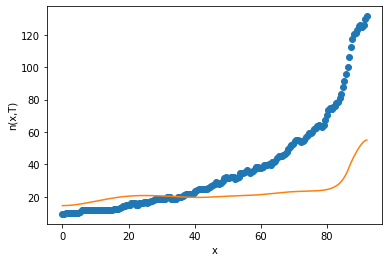

after perturb [6.3995630589973835, 116.06163419606355, 25301.640155011366, 1.6441614368816206, 62.635073401488135]
parameters [6.3995630589973835, 116.06163419606355, 25301.640155011366, 1.6441614368816206, 62.635073401488135]
after perturb [0.4470495832295618, 56.11196865615935, 27534.74327804878, 0.1862076633035099, -23.48218811353505]
parameters [0.4470495832295618, 56.11196865615935, 27534.74327804878, 0.1862076633035099, -23.48218811353505]
after perturb [2.1118341894357577, 102.41373890783512, 26161.056215410557, -2.683876931041732, 23.893625819683944]
parameters [2.1118341894357577, 102.41373890783512, 26161.056215410557, -2.683876931041732, 23.893625819683944]
after perturb [-0.6388106190101392, 101.29852595237736, 23533.44568014248, 1.7842404143595694, -1.4554101792277443]
parameters [-0.6388106190101392, 101.29852595237736, 23533.44568014248, 1.7842404143595694, -1.4554101792277443]
after perturb [2.6141260643230164, 126.88721608847105, 24672.502105151478, 1.7656746079764956,

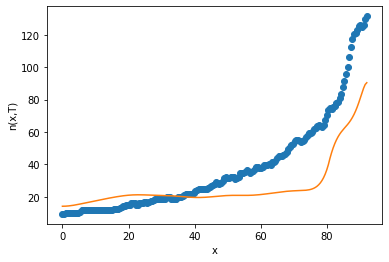

17
after perturb [2.540104796401381, 128.77004314332308, 23504.552469786737, 5.989734645755259, 22.724984215650853]
parameters [2.540104796401381, 128.77004314332308, 23504.552469786737, 5.989734645755259, 22.724984215650853]
oxigeno [1.92443721e-28 2.01154345e-28 2.28085815e-28 2.75716264e-28
 3.48448829e-28 4.53051598e-28 5.99338146e-28 8.01161855e-28
 1.07783143e-27 1.45610137e-27 1.97295487e-27 2.67948512e-27
 3.64630461e-27 4.97108516e-27 6.78907514e-27 9.28778298e-27
 1.27275004e-26 1.74700225e-26 2.40188904e-26 3.30758545e-26
 4.56202031e-26 6.30203657e-26 8.71911321e-26 1.20815413e-25
 1.67657426e-25 2.33005501e-25 3.24298848e-25 4.52015599e-25
 6.30932217e-25 8.81911138e-25 1.23444019e-24 1.73024259e-24
 2.42841194e-24 3.41272060e-24 4.80202544e-24 6.76508795e-24
 9.54168473e-24 1.34726774e-23 1.90428375e-23 2.69418156e-23
 3.81509021e-23 5.40664142e-23 7.66750496e-23 1.08802903e-22
 1.54468811e-22 2.19385348e-22 3.11668635e-22 4.42843346e-22
 6.29264836e-22 8.94130577e-22 1.2

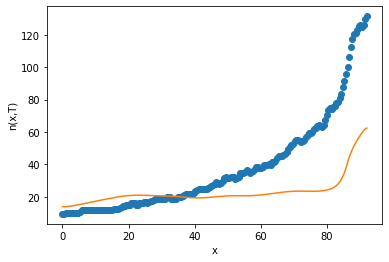

after perturb [0.17623110643991957, 114.56021156252196, 27189.031715877663, -1.5426587824550166, 29.568108392000283]
parameters [0.17623110643991957, 114.56021156252196, 27189.031715877663, -1.5426587824550166, 29.568108392000283]
after perturb [6.041304830236394, 178.46137030629583, 23572.922246518137, 0.7013780533632343, 13.864379624601785]
parameters [6.041304830236394, 178.46137030629583, 23572.922246518137, 0.7013780533632343, 13.864379624601785]
after perturb [6.121153624847896, 115.69632875666716, 25820.244104375746, 2.8245393634404623, 18.540088956272193]
parameters [6.121153624847896, 115.69632875666716, 25820.244104375746, 2.8245393634404623, 18.540088956272193]
oxigeno [3.88475671e-21 3.99141263e-21 4.31726635e-21 4.88031953e-21
 5.71174247e-21 6.85770224e-21 8.38208077e-21 1.03702543e-20
 1.29341732e-20 1.62190649e-20 2.04121878e-20 2.57541980e-20
 3.25538617e-20 4.12070684e-20 5.22213836e-20 6.62477515e-20
 8.41214372e-20 1.06914919e-19 1.36006255e-19 1.73167487e-19
 2.206

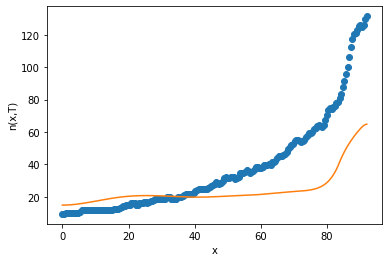

after perturb [2.832456917846014, 119.90190318050581, 24624.988017562802, 2.188878643934401, 36.300048282816]
parameters [2.832456917846014, 119.90190318050581, 24624.988017562802, 2.188878643934401, 36.300048282816]
oxigeno [2.49504273e-18 2.54546373e-18 2.69880913e-18 2.96142344e-18
 3.34421015e-18 3.86314235e-18 4.54001215e-18 5.40345533e-18
 6.49030134e-18 7.84731500e-18 9.53341581e-18 1.16224848e-17
 1.42068989e-17 1.74019706e-17 2.13515158e-17 2.62348356e-17
 3.22754674e-17 3.97521589e-17 4.90126358e-17 6.04908832e-17
 7.47288537e-17 9.24037505e-17 1.14362340e-16 1.41664125e-16
 1.75635698e-16 2.17939187e-16 2.70658482e-16 3.36407891e-16
 4.18469071e-16 5.20963628e-16 6.49070672e-16 8.09301043e-16
 1.00984293e-15 1.26099734e-15 1.57572670e-15 1.97034554e-15
 2.46538970e-15 3.08670942e-15 3.86684290e-15 4.84674094e-15
 6.07793037e-15 7.62522564e-15 9.57012446e-15 1.20150568e-14
 1.50886980e-14 1.89526092e-14 2.38095330e-14 2.99137536e-14
 3.75840358e-14 4.72197817e-14 5.93212092e-

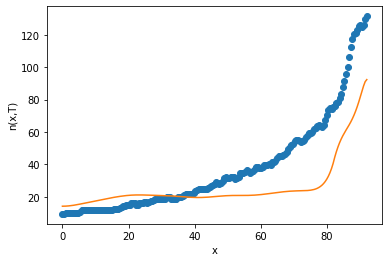

18
after perturb [3.3946682355303155, 107.90066288252414, 29508.500191634957, 2.124182700034127, 24.608210043551527]
parameters [3.3946682355303155, 107.90066288252414, 29508.500191634957, 2.124182700034127, 24.608210043551527]
after perturb [2.964906596481472, 86.02505920595173, 24704.720342814715, 1.412028851947532, 18.71181118893142]
parameters [2.964906596481472, 86.02505920595173, 24704.720342814715, 1.412028851947532, 18.71181118893142]
oxigeno [6.66489520e-18 6.80241278e-18 7.22071013e-18 7.93728676e-18
 8.98220720e-18 1.03994941e-17 1.22491720e-17 1.46100591e-17
 1.75834432e-17 2.12978190e-17 2.59149171e-17 3.16373185e-17
 3.87180282e-17 4.74724792e-17 5.82935607e-17 7.16704203e-17
 8.82119806e-17 1.08676358e-16 1.34007675e-16 1.65382141e-16
 2.04265768e-16 2.52486691e-16 3.12325826e-16 3.86630576e-16
 4.78957478e-16 5.93751222e-16 7.36569367e-16 9.14364460e-16
 1.13583825e-15 1.41188647e-15 1.75615724e-15 2.18575213e-15
 2.72210610e-15 3.39209168e-15 4.22940391e-15 5.27629669e

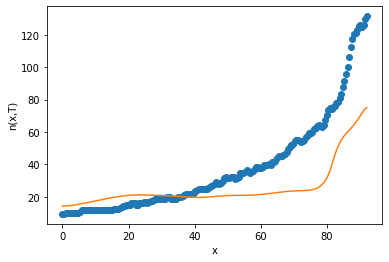

after perturb [13.268836219571934, 156.97736581125153, 28767.421475033574, 2.311650886730603, 15.816208962154086]
parameters [13.268836219571934, 156.97736581125153, 28767.421475033574, 2.311650886730603, 15.816208962154086]
after perturb [-4.229741350982983, 79.35262224052212, 18295.555928711063, 2.1845872998050826, 49.69210381629234]
parameters [-4.229741350982983, 79.35262224052212, 18295.555928711063, 2.1845872998050826, 49.69210381629234]
after perturb [7.57626955201345, 151.90211119918365, 20776.260113951677, 2.0500011811119387, 7.103310011551116]
parameters [7.57626955201345, 151.90211119918365, 20776.260113951677, 2.0500011811119387, 7.103310011551116]
after perturb [1.6255030290204922, 74.63779915651651, 25146.84212306918, 2.496763743459037, -0.18000414467484838]
parameters [1.6255030290204922, 74.63779915651651, 25146.84212306918, 2.496763743459037, -0.18000414467484838]
after perturb [4.472294995868902, 3.186328005388283, 22776.575285457777, 4.121100620362734, 69.97866021095

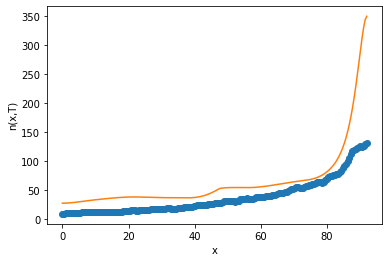

after perturb [6.064832478922838, 129.326045629862, 19855.361664969747, -0.9308970062883146, 6.745722331849166]
parameters [6.064832478922838, 129.326045629862, 19855.361664969747, -0.9308970062883146, 6.745722331849166]
after perturb [5.661150062047922, 96.50100732949942, 23202.43738957859, 2.7238382724996257, 5.318709796772828]
parameters [5.661150062047922, 96.50100732949942, 23202.43738957859, 2.7238382724996257, 5.318709796772828]
oxigeno [4.44583062e-23 4.59057829e-23 5.03427466e-23 5.80592779e-23
 6.95609208e-23 8.56034883e-23 1.07245311e-22 1.35920766e-22
 1.73540522e-22 2.22625926e-22 2.86487558e-22 3.69461344e-22
 4.77220019e-22 6.17183569e-22 7.99059943e-22 1.03555752e-21
 1.34332426e-21 1.74418634e-21 2.26678290e-21 2.94872474e-21
 3.83944703e-21 5.00398137e-21 6.52794661e-21 8.52415597e-21
 1.11413687e-20 1.45758878e-20 1.90869372e-20 2.50170563e-20
 3.28191604e-20 4.30924551e-20 5.66301125e-20 7.44825729e-20
 9.80416042e-20 1.29151931e-19 1.70259478e-19 2.24608229e-19
 2.

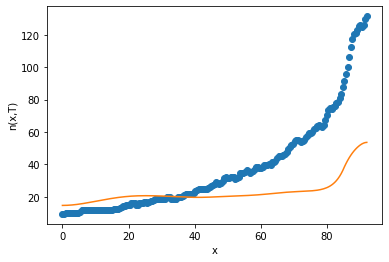

after perturb [-0.3318538731069622, 175.4602035133597, 25328.904481321075, -1.6604639415909723, -22.852957090571035]
parameters [-0.3318538731069622, 175.4602035133597, 25328.904481321075, -1.6604639415909723, -22.852957090571035]
after perturb [-1.7992898895740623, 55.38048289266318, 22206.122441105974, 2.0645798230098222, 56.26371618483907]
parameters [-1.7992898895740623, 55.38048289266318, 22206.122441105974, 2.0645798230098222, 56.26371618483907]
after perturb [2.8917126585994586, 75.60355548644863, 13266.253544475632, 3.6516636708622263, 54.22100564669097]
parameters [2.8917126585994586, 75.60355548644863, 13266.253544475632, 3.6516636708622263, 54.22100564669097]
after perturb [-4.296404860717759, 50.282902055593986, 17310.829544974822, 2.7032312823527285, 50.73727691856327]
parameters [-4.296404860717759, 50.282902055593986, 17310.829544974822, 2.7032312823527285, 50.73727691856327]
after perturb [1.5881349448226887, 91.60264254771045, 26819.283896145833, -2.316987798572942, 26

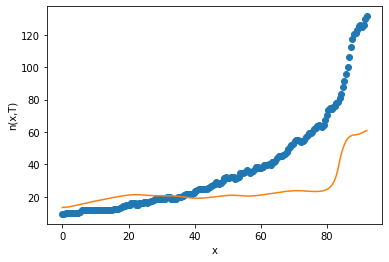

after perturb [1.48046857294084, 74.59775964002591, 24278.135252293054, 5.100511741055857, 61.30208932520582]
parameters [1.48046857294084, 74.59775964002591, 24278.135252293054, 5.100511741055857, 61.30208932520582]
after perturb [5.771820198452118, 126.15551600259322, 28300.933534213953, 3.623657762421645, -15.397961605855699]
parameters [5.771820198452118, 126.15551600259322, 28300.933534213953, 3.623657762421645, -15.397961605855699]
after perturb [1.388879833580214, 97.75940432657563, 25458.044923125995, -0.7013757115304533, 12.541108990956403]
parameters [1.388879833580214, 97.75940432657563, 25458.044923125995, -0.7013757115304533, 12.541108990956403]
after perturb [3.85743467408461, 83.25212257525969, 25249.903764402337, -0.35791088572652385, 27.079510984997487]
parameters [3.85743467408461, 83.25212257525969, 25249.903764402337, -0.35791088572652385, 27.079510984997487]
after perturb [8.052802333850485, 184.33470854909837, 12714.361133178223, 1.4177133575993577, 37.16109414920

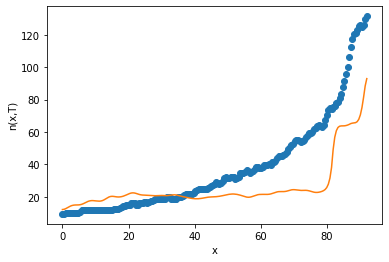

19
after perturb [7.779102396715783, 110.05883728636735, 19986.957618670225, -0.8981272845920176, 12.685167088765862]
parameters [7.779102396715783, 110.05883728636735, 19986.957618670225, -0.8981272845920176, 12.685167088765862]
after perturb [3.5940121955933897, 78.32773619272257, 21509.92293214251, 0.8770218813464741, 17.499065691819784]
parameters [3.5940121955933897, 78.32773619272257, 21509.92293214251, 0.8770218813464741, 17.499065691819784]
oxigeno [3.75107934e-15 3.81006909e-15 3.98891940e-15 4.29333962e-15
 4.73306789e-15 5.32221356e-15 6.07975366e-15 7.03020146e-15
 8.20447141e-15 9.64097180e-15 1.13869650e-14 1.35002452e-14
 1.60511948e-14 1.91252960e-14 2.28261901e-14 2.72793985e-14
 3.26368444e-14 3.90823455e-14 4.68382834e-14 5.61737043e-14
 6.74141553e-14 8.09536329e-14 9.72690969e-14 1.16938104e-13
 1.40660233e-13 1.69283117e-13 2.03834070e-13 2.45558521e-13
 2.95966688e-13 3.56890273e-13 4.30551292e-13 5.19645621e-13
 6.27444348e-13 7.57916675e-13 9.15878869e-13 1.107

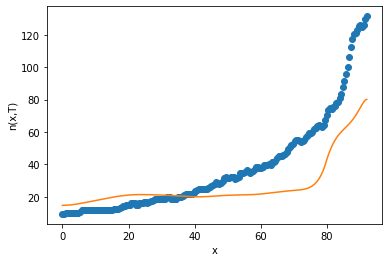

20
parameters [4.124654608533953, 121.52139198442389, 21947.093067715658, 0.4318336959333905, 32.043061432980195]
parameters [4.472724413311483, 119.27341546804135, 22053.930981385394, 1.011060763486251, 27.738995803017914]
parameters [9.344381620523825, 125.87208428949202, 27820.58082013446, 0.4604536513987201, 7.7621240618209875]
parameters [4.237035069219526, 91.38684489597851, 21492.21605586346, 0.8148035511867812, 6.524107451659683]
parameters [2.841883914335347, 144.21756619589166, 22580.231766241093, 1.9380552206891082, 29.63224549366]
parameters [6.7806099981508225, 99.54438723136113, 25340.335602199353, 1.2470786223123271, 47.116111753167246]
parameters [3.158413613373582, 121.61474120765298, 26851.107631010887, 1.2005962296412542, 38.055281017428264]
parameters [5.6736933524844515, 144.1570450961709, 28203.39625061818, 0.981133258796806, 23.431030650223903]
parameters [0.4011276906515704, 79.68664891359965, 21716.27833685545, 1.486400164663812, 39.12623125232717]
parameters [

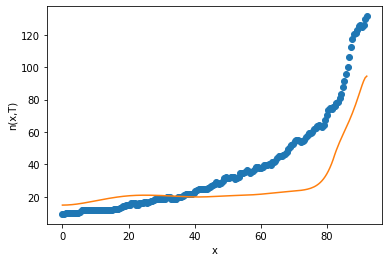

after perturb [2.1188896836922115, 145.50132401479283, 25327.28603480529, 2.242074081841348, 9.145935613584413]
parameters [2.1188896836922115, 145.50132401479283, 25327.28603480529, 2.242074081841348, 9.145935613584413]
oxigeno [6.43396625e-17 6.53922071e-17 6.85857191e-17 7.40292885e-17
 8.19096391e-17 9.24986841e-17 1.06164508e-16 1.23386199e-16
 1.44773121e-16 1.71089386e-16 2.03284525e-16 2.42531595e-16
 2.90274299e-16 3.48285070e-16 4.18736556e-16 5.04289546e-16
 6.08201115e-16 7.34457713e-16 8.87939095e-16 1.07462044e-15
 1.30182180e-15 1.57851629e-15 1.91571101e-15 2.32691815e-15
 2.82873774e-15 3.44157824e-15 4.19054770e-15 5.10655538e-15
 6.22767334e-15 7.60081939e-15 9.28383732e-15 1.13480686e-14
 1.38815326e-14 1.69928595e-14 2.08161537e-14 2.55170067e-14
 3.12999240e-14 3.84174907e-14 4.71816663e-14 5.79776805e-14
 7.12811006e-14 8.76787580e-14 1.07894367e-13 1.32819848e-13
 1.63553600e-13 2.01447231e-13 2.48162625e-13 3.05741659e-13
 3.76691420e-13 4.64088469e-13 5.717065

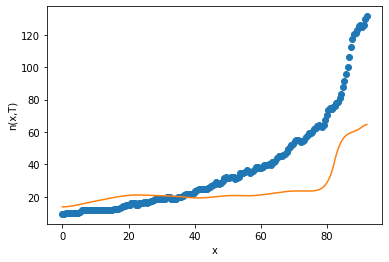

after perturb [2.435480980854228, 113.869576579202, 19301.787162985085, 2.0319264954889436, 22.46182781154129]
parameters [2.435480980854228, 113.869576579202, 19301.787162985085, 2.0319264954889436, 22.46182781154129]
after perturb [4.524817927946487, 186.96303797371985, 31609.118080661097, 1.5346079598416205, 22.758758010640626]
parameters [4.524817927946487, 186.96303797371985, 31609.118080661097, 1.5346079598416205, 22.758758010640626]
after perturb [0.27825452912211013, 130.91541437480728, 28399.131185356477, 2.272343679418799, 24.747548059038607]
parameters [0.27825452912211013, 130.91541437480728, 28399.131185356477, 2.272343679418799, 24.747548059038607]
oxigeno [7.96647451e-18 8.09953673e-18 8.50560261e-18 9.20532911e-18
 1.02332462e-17 1.16380267e-17 1.34830742e-17 1.58476148e-17
 1.88285436e-17 2.25434411e-17 2.71355260e-17 3.27817507e-17
 3.97052939e-17 4.81928262e-17 5.86152480e-17 7.14491927e-17
 8.72967447e-17 1.06902965e-16 1.31174054e-16 1.61201330e-16
 1.98296037e-16 

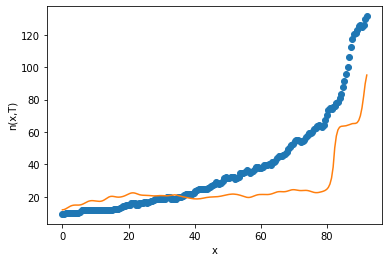

after perturb [0.5905779171198722, 121.09545374999632, 25370.45831339213, 1.0312275462794447, 23.197350228285227]
parameters [0.5905779171198722, 121.09545374999632, 25370.45831339213, 1.0312275462794447, 23.197350228285227]
oxigeno [7.27566734e-13 7.34718762e-13 7.56360400e-13 7.93048954e-13
 8.45715763e-13 9.15671286e-13 1.00461541e-12 1.11465697e-12
 1.24834836e-12 1.40874196e-12 1.59947544e-12 1.82489044e-12
 2.09018484e-12 2.40159306e-12 2.76658349e-12 3.19406015e-12
 3.69455919e-12 4.28043943e-12 4.96607982e-12 5.76811085e-12
 6.70571989e-12 7.80108076e-12 9.07996192e-12 1.05725652e-11
 1.23146309e-11 1.43488129e-11 1.67262793e-11 1.95084484e-11
 2.27687431e-11 2.65942774e-11 3.10874798e-11 3.63678011e-11
 4.25738083e-11 4.98660703e-11 5.84312577e-11 6.84878053e-11
 8.02933450e-11 9.41539766e-11 1.10435317e-10 1.29575157e-10
 1.52097408e-10 1.78626888e-10 2.09904424e-10 2.46801923e-10
 2.90337615e-10 3.41692626e-10 4.02231011e-10 4.73526158e-10
 5.57396374e-10 6.55951446e-10 7.71

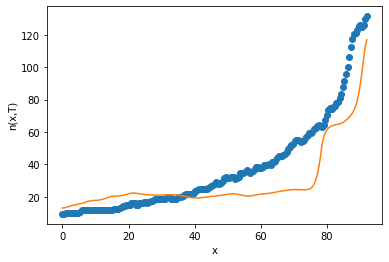

1
after perturb [8.649331889077958, 77.21896674077688, 18586.562562945663, 1.081349246872151, 46.0087911524477]
parameters [8.649331889077958, 77.21896674077688, 18586.562562945663, 1.081349246872151, 46.0087911524477]
after perturb [0.8982430210281089, 132.17807169128795, 26517.402514047182, 3.2936618577018244, 32.848348450155825]
parameters [0.8982430210281089, 132.17807169128795, 26517.402514047182, 3.2936618577018244, 32.848348450155825]
oxigeno [4.20625789e-21 4.30920474e-21 4.62350207e-21 5.16586318e-21
 5.96529642e-21 7.06487430e-21 8.52431015e-21 1.04234843e-20
 1.28671542e-20 1.59911992e-20 1.99708838e-20 2.50317634e-20
 3.14639973e-20 3.96409651e-20 5.00432324e-20 6.32891023e-20
 8.01732982e-20 1.01715827e-19 1.29223907e-19 1.64371101e-19
 2.09299651e-19 2.66754455e-19 3.40260263e-19 4.34357333e-19
 5.54914797e-19 7.09545304e-19 9.08149008e-19 1.16362027e-18
 1.49275764e-18 1.91742859e-18 2.46605831e-18 3.17553900e-18
 4.09369769e-18 5.28251776e-18 6.82238557e-18 8.81772915e-

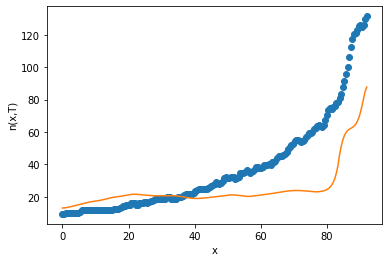

after perturb [8.914534729440575, 148.1295763826624, 15522.927030172217, 0.34392150245098585, 57.52875921748716]
parameters [8.914534729440575, 148.1295763826624, 15522.927030172217, 0.34392150245098585, 57.52875921748716]
after perturb [10.045353195224845, 100.25588373196102, 21266.45263831189, 1.5305358929083666, 0.9035485906195078]
parameters [10.045353195224845, 100.25588373196102, 21266.45263831189, 1.5305358929083666, 0.9035485906195078]
after perturb [11.331119099823276, 108.44715524289892, 22719.813918807984, 1.2638387599989902, 103.40933777175843]
parameters [11.331119099823276, 108.44715524289892, 22719.813918807984, 1.2638387599989902, 103.40933777175843]
after perturb [8.922934330996128, 138.8579385703067, 22170.126354039563, -0.6869164978416992, 39.34558701367742]
parameters [8.922934330996128, 138.8579385703067, 22170.126354039563, -0.6869164978416992, 39.34558701367742]
after perturb [8.182341308690317, 145.99288652056342, 29966.831709193913, 1.7452064080863368, 41.65577

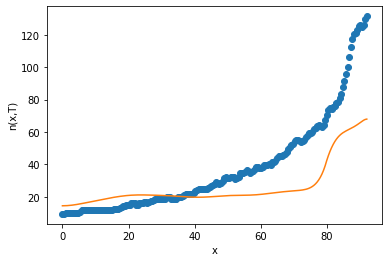

after perturb [4.007148890735972, 90.11887844100492, 25689.432287062784, 1.1639549326763772, 22.767346257215998]
parameters [4.007148890735972, 90.11887844100492, 25689.432287062784, 1.1639549326763772, 22.767346257215998]
oxigeno [5.95918138e-16 6.05956777e-16 6.36413655e-16 6.88324409e-16
 7.63458101e-16 8.64383492e-16 9.94565439e-16 1.15849521e-15
 1.36185983e-15 1.61175722e-15 1.91696550e-15 2.28827734e-15
 2.73891255e-15 3.28502549e-15 3.94632761e-15 4.74685042e-15
 5.71587957e-15 6.88909825e-15 8.30998646e-15 1.00315337e-14
 1.21183351e-14 1.46491583e-14 1.77200857e-14 2.14483635e-14
 2.59771166e-14 3.14811235e-14 3.81738924e-14 4.63163290e-14
 5.62273552e-14 6.82969151e-14 8.30019023e-14 1.00925659e-13
 1.22781841e-13 1.49443611e-13 1.81979343e-13 2.21696253e-13
 2.70193702e-13 3.29428267e-13 4.01793141e-13 4.90214938e-13
 5.98271678e-13 7.30336468e-13 8.91752408e-13 1.08904537e-12
 1.33018275e-12 1.62488798e-12 1.98502269e-12 2.42505093e-12
 2.96260285e-12 3.61915917e-12 4.4208

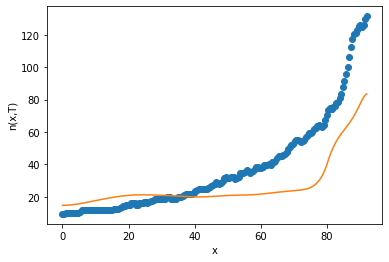

after perturb [12.855439537002146, 169.06599246276724, 24618.91955921191, 0.4725113822785344, 4.804435250922177]
parameters [12.855439537002146, 169.06599246276724, 24618.91955921191, 0.4725113822785344, 4.804435250922177]
after perturb [10.900790761748343, 113.31773922953272, 25331.15143451098, 1.0290534154154711, 27.15902677322163]
parameters [10.900790761748343, 113.31773922953272, 25331.15143451098, 1.0290534154154711, 27.15902677322163]
after perturb [6.25368611711224, 147.97716569416312, 27576.591923483706, 2.8090568559797413, 13.340079964784447]
parameters [6.25368611711224, 147.97716569416312, 27576.591923483706, 2.8090568559797413, 13.340079964784447]
oxigeno [1.38176432e-18 1.41046417e-18 1.49776708e-18 1.64733762e-18
 1.86546757e-18 2.16136161e-18 2.54755677e-18 3.04049631e-18
 3.66128627e-18 4.43667230e-18 5.40028532e-18 6.59421828e-18
 8.07101316e-18 9.89615843e-18 1.21512234e-17 1.49377892e-17
 1.83823771e-17 2.26426277e-17 2.79150491e-17 3.44447352e-17
 4.25375605e-17 5.

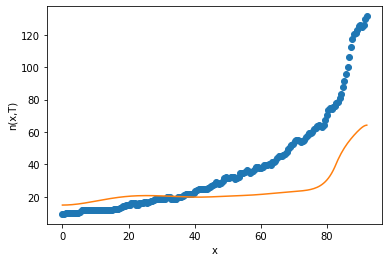

after perturb [5.590316740517081, 108.79297687183575, 27670.206818071274, 0.4796420607743098, 20.921830183724147]
parameters [5.590316740517081, 108.79297687183575, 27670.206818071274, 0.4796420607743098, 20.921830183724147]
oxigeno [1.40285733e-09 1.41128779e-09 1.43669316e-09 1.47941720e-09
 1.54003862e-09 1.61937994e-09 1.71852004e-09 1.83881059e-09
 1.98189658e-09 2.14974142e-09 2.34465677e-09 2.56933766e-09
 2.82690343e-09 3.12094513e-09 3.45558005e-09 3.83551421e-09
 4.26611387e-09 4.75348702e-09 5.30457622e-09 5.92726410e-09
 6.63049321e-09 7.42440206e-09 8.32047929e-09 9.33173833e-09
 1.04729153e-08 1.17606928e-08 1.32139530e-08 1.48540637e-08
 1.67052013e-08 1.87947156e-08 2.11535408e-08 2.38166591e-08
 2.68236226e-08 3.02191411e-08 3.40537428e-08 3.83845174e-08
 4.32759508e-08 4.88008619e-08 5.50414545e-08 6.20904966e-08
 7.00526428e-08 7.90459165e-08 8.92033699e-08 1.00674944e-07
 1.13629553e-07 1.28257412e-07 1.44772652e-07 1.63416241e-07
 1.84459253e-07 2.08206528e-07 2.35

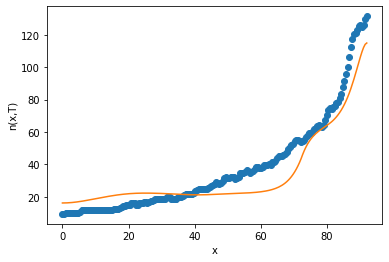

2
after perturb [8.391920455877111, 165.05880486034093, 23408.555428645934, 1.348218409773561, 20.72796289180676]
parameters [8.391920455877111, 165.05880486034093, 23408.555428645934, 1.348218409773561, 20.72796289180676]
after perturb [-0.002461398967975814, 143.69020807006027, 28490.19186916109, 1.5541333490641007, 11.487875914767947]
parameters [-0.002461398967975814, 143.69020807006027, 28490.19186916109, 1.5541333490641007, 11.487875914767947]
after perturb [0.8387725753080337, 171.40474736194034, 22049.302273673104, 3.0300254186696076, 41.76878999367085]
parameters [0.8387725753080337, 171.40474736194034, 22049.302273673104, 3.0300254186696076, 41.76878999367085]
after perturb [3.7372358173678943, 151.1650800227296, 29051.629504886358, 2.043069159943213, 11.885417811002107]
parameters [3.7372358173678943, 151.1650800227296, 29051.629504886358, 2.043069159943213, 11.885417811002107]
after perturb [6.7808062909926035, 107.38949556500948, 21173.28520258123, 1.5210495358213065, 64.5

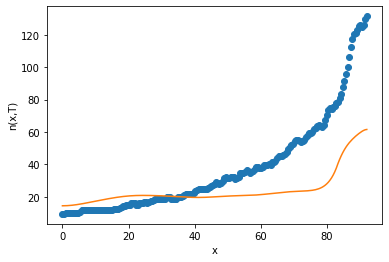

after perturb [3.4172826873858675, 122.91512709694405, 24321.081045106977, 2.8608288199614895, 56.21565240584919]
parameters [3.4172826873858675, 122.91512709694405, 24321.081045106977, 2.8608288199614895, 56.21565240584919]
after perturb [0.4704046297154117, 82.89397196600615, 23311.96742838319, 0.03358728754247586, 9.358741312388828]
parameters [0.4704046297154117, 82.89397196600615, 23311.96742838319, 0.03358728754247586, 9.358741312388828]
oxigeno [ 0.1898474   0.18978132  0.18958522  0.18926509  0.18882962  0.18828866
  0.18765178  0.18692713  0.18612103  0.18523818  0.1842823   0.18325721
  0.18216765  0.18101987  0.17982166  0.17858183  0.17730922  0.17601176
  0.17469566  0.17336501  0.17202191  0.17066699  0.16930025  0.16792199
  0.16653376  0.1651391   0.16374384  0.16235586  0.16098432  0.15963846
  0.15832631  0.15705386  0.15582466  0.15464027  0.15350104  0.15240714
  0.1513595   0.15036036  0.1494136   0.14852466  0.1477003   0.14694799
  0.14627529  0.14568896  0.14519

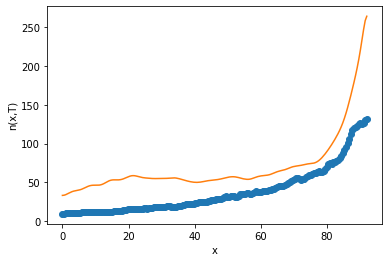

after perturb [9.387633933292676, 59.534682502043935, 21482.904094349306, -0.08400557515782436, 46.588483517409585]
parameters [9.387633933292676, 59.534682502043935, 21482.904094349306, -0.08400557515782436, 46.588483517409585]
after perturb [4.929088256481972, 111.01587941099287, 26119.22821658228, 0.5382714418034277, -17.19024898024162]
parameters [4.929088256481972, 111.01587941099287, 26119.22821658228, 0.5382714418034277, -17.19024898024162]
after perturb [3.254187652613822, 174.6152851563158, 21866.107582476165, 3.2437673103001514, 44.25136342167912]
parameters [3.254187652613822, 174.6152851563158, 21866.107582476165, 3.2437673103001514, 44.25136342167912]
after perturb [1.0423581877718875, 72.6411235732752, 21404.140627218214, 0.658303855089708, 21.528473788105195]
parameters [1.0423581877718875, 72.6411235732752, 21404.140627218214, 0.658303855089708, 21.528473788105195]
oxigeno [2.91545482e-13 2.92121407e-13 2.93886278e-13 2.96951352e-13
 3.01502181e-13 3.07799434e-13 3.1618

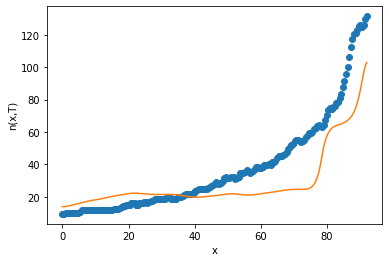

3
after perturb [2.554749963288006, 137.21174254310716, 33450.99416859171, 1.5552275375545475, 9.037826999599451]
parameters [2.554749963288006, 137.21174254310716, 33450.99416859171, 1.5552275375545475, 9.037826999599451]
after perturb [12.2689906012665, 137.06430342078082, 22873.28472371003, 1.2414600066351655, 28.90335123922518]
parameters [12.2689906012665, 137.06430342078082, 22873.28472371003, 1.2414600066351655, 28.90335123922518]
after perturb [11.455952627299157, 113.59783788251809, 26499.948375222935, -1.1470943863275114, 53.05251019297753]
parameters [11.455952627299157, 113.59783788251809, 26499.948375222935, -1.1470943863275114, 53.05251019297753]
after perturb [7.348662293785679, 94.02369620949185, 22638.57641576912, 1.9669143562884372, 59.54718051504305]
parameters [7.348662293785679, 94.02369620949185, 22638.57641576912, 1.9669143562884372, 59.54718051504305]
after perturb [1.999232230744214, 70.07715508579132, 20917.24315086639, 2.0287599723343432, 29.69933957020996]
p

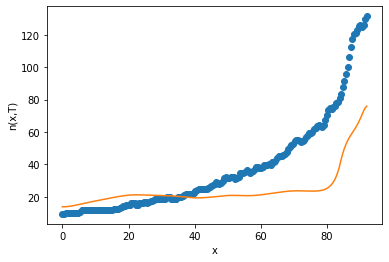

after perturb [3.094617357358917, 180.9736282228493, 26807.88555967642, 3.7563954829191837, 23.218572798097817]
parameters [3.094617357358917, 180.9736282228493, 26807.88555967642, 3.7563954829191837, 23.218572798097817]
after perturb [-0.13909079566828764, 147.45398906505733, 26415.61001087678, 0.36046148081371643, 11.523946020242828]
parameters [-0.13909079566828764, 147.45398906505733, 26415.61001087678, 0.36046148081371643, 11.523946020242828]
after perturb [8.05119210478516, 86.37753764048149, 18301.967560920755, 0.21740992432779938, 67.48209780206625]
parameters [8.05119210478516, 86.37753764048149, 18301.967560920755, 0.21740992432779938, 67.48209780206625]
after perturb [14.684272168937175, 51.99094279014206, 18535.55527646481, -0.6497264921509882, 48.06992698745057]
parameters [14.684272168937175, 51.99094279014206, 18535.55527646481, -0.6497264921509882, 48.06992698745057]
after perturb [1.7028689332084355, 53.7344071827311, 22307.900913499663, 1.094790979936171, 25.968825823

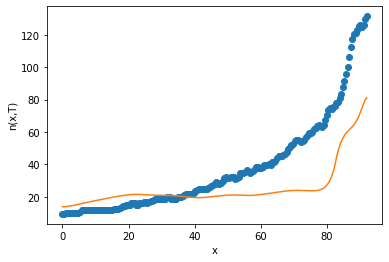

after perturb [4.513309073000114, 46.7912221324728, 18478.427898530903, -0.4558545980994585, 58.891299186348384]
parameters [4.513309073000114, 46.7912221324728, 18478.427898530903, -0.4558545980994585, 58.891299186348384]
after perturb [3.739074514209257, 129.31159256412687, 25822.241437353292, 0.7543732246062615, 34.3183682639456]
parameters [3.739074514209257, 129.31159256412687, 25822.241437353292, 0.7543732246062615, 34.3183682639456]
oxigeno [9.20070163e-11 9.26999220e-11 9.47894463e-11 9.83082153e-11
 1.03311287e-10 1.09877186e-10 1.18109374e-10 1.28138180e-10
 1.40123226e-10 1.54256384e-10 1.70765316e-10 1.89917669e-10
 2.12025980e-10 2.37453406e-10 2.66620366e-10 3.00012234e-10
 3.38188214e-10 3.81791598e-10 4.31561565e-10 4.88346791e-10
 5.53121110e-10 6.27001535e-10 7.11268996e-10 8.07392183e-10
 9.17054953e-10 1.04218782e-09 1.18500411e-09 1.34804146e-09
 1.53420936e-09 1.74684374e-09 1.98976933e-09 2.26737114e-09
 2.58467605e-09 2.94744608e-09 3.36228475e-09 3.83675830e-09

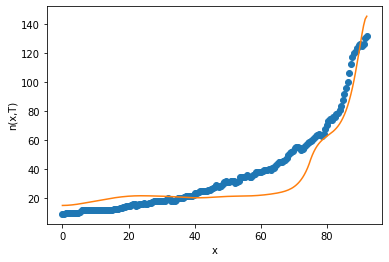

4
after perturb [1.9712092432616424, 125.11265899501241, 24007.26674420835, 1.8151614888107037, 30.906579521631933]
parameters [1.9712092432616424, 125.11265899501241, 24007.26674420835, 1.8151614888107037, 30.906579521631933]
oxigeno [1.96965188e-16 2.00137870e-16 2.09762373e-16 2.26162307e-16
 2.49891334e-16 2.81755177e-16 3.22843553e-16 3.74573230e-16
 4.38743833e-16 5.17608575e-16 6.13962659e-16 7.31252859e-16
 8.73712644e-16 1.04652827e-15 1.25604255e-15 1.51000474e-15
 1.81787683e-15 2.19120942e-15 2.64410311e-15 3.19377599e-15
 3.86126208e-15 4.67227206e-15 5.65825481e-15 6.85770683e-15
 8.31778764e-15 1.00963117e-14 1.22642035e-14 1.49085218e-14
 1.81361838e-14 2.20785498e-14 2.68970687e-14 3.27902315e-14
 4.00021395e-14 4.88330668e-14 5.96524818e-14 7.29150977e-14
 8.91806419e-14 1.09138177e-13 1.33635969e-13 1.63718107e-13
 2.00669286e-13 2.46069483e-13 3.01860574e-13 3.70427398e-13
 4.54696297e-13 5.58254872e-13 6.85497545e-13 8.41802597e-13
 1.03374770e-12 1.26937264e-12 1.

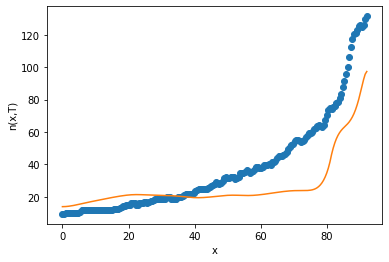

after perturb [7.56865233900111, 83.0251175604467, 18078.101891729515, 0.3623119705440676, 53.91717276058935]
parameters [7.56865233900111, 83.0251175604467, 18078.101891729515, 0.3623119705440676, 53.91717276058935]
after perturb [8.62226141474241, 122.86898872076966, 24377.23477533242, 0.9258603368814555, 36.83543644055627]
parameters [8.62226141474241, 122.86898872076966, 24377.23477533242, 0.9258603368814555, 36.83543644055627]
oxigeno [3.68833439e-12 3.72498590e-12 3.83567078e-12 4.02259606e-12
 4.28949378e-12 4.64170279e-12 5.08628594e-12 5.63218537e-12
 6.29041956e-12 7.07432677e-12 7.99986051e-12 9.08594394e-12
 1.03548916e-11 1.18329082e-11 1.35506763e-11 1.55440464e-11
 1.78548458e-11 2.05318253e-11 2.36317650e-11 2.72207663e-11
 3.13757594e-11 3.61862610e-11 4.17564241e-11 4.82074268e-11
 5.56802553e-11 6.43389451e-11 7.43743556e-11 8.60085637e-11
 9.94999775e-11 1.15149285e-10 1.33306375e-10 1.54378381e-10
 1.78839038e-10 2.07239548e-10 2.40221210e-10 2.78530078e-10
 3.2303

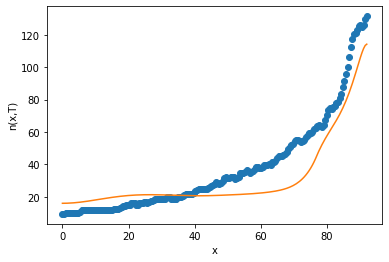

5
after perturb [2.94417967236091, 101.94712194139838, 21004.827761403678, 1.9135678090301447, 69.88599883428698]
parameters [2.94417967236091, 101.94712194139838, 21004.827761403678, 1.9135678090301447, 69.88599883428698]
after perturb [13.110431803236397, 98.96937960930221, 32558.078624434274, 0.22909832444403777, 9.99656936470686]
parameters [13.110431803236397, 98.96937960930221, 32558.078624434274, 0.22909832444403777, 9.99656936470686]
after perturb [5.583391905908736, 98.66112091298862, 26274.1868272523, 0.5381347486920549, 15.63560548778576]
parameters [5.583391905908736, 98.66112091298862, 26274.1868272523, 0.5381347486920549, 15.63560548778576]
oxigeno [1.12249128e-10 1.13083639e-10 1.15601149e-10 1.19843845e-10
 1.25882901e-10 1.33819797e-10 1.43788189e-10 1.55956379e-10
 1.70530431e-10 1.87757977e-10 2.07932808e-10 2.31400316e-10
 2.58563904e-10 2.89892475e-10 3.25929160e-10 3.67301428e-10
 4.14732790e-10 4.69056312e-10 5.31230194e-10 6.02355719e-10
 6.83697902e-10 7.767092

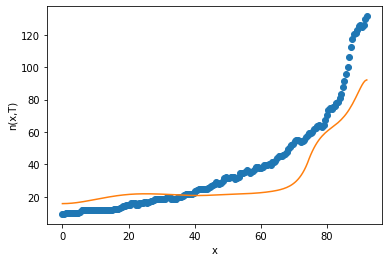

6
after perturb [16.804102496693044, 166.35055789307808, 20662.578918361192, -0.4612952425851842, 33.743199240997335]
parameters [16.804102496693044, 166.35055789307808, 20662.578918361192, -0.4612952425851842, 33.743199240997335]
after perturb [6.95668990313698, 134.60058499533585, 25485.11817652265, 0.1292075873101649, 22.95231173889787]
parameters [6.95668990313698, 134.60058499533585, 25485.11817652265, 0.1292075873101649, 22.95231173889787]
oxigeno [7.31105507e-04 7.31111827e-04 7.31132496e-04 7.31172636e-04
 7.31240759e-04 7.31348740e-04 7.31511767e-04 7.31748292e-04
 7.32079969e-04 7.32531582e-04 7.33130977e-04 7.33908986e-04
 7.34899351e-04 7.36138659e-04 7.37666272e-04 7.39524272e-04
 7.41757408e-04 7.44413064e-04 7.47541229e-04 7.51194490e-04
 7.55428033e-04 7.60299664e-04 7.65869843e-04 7.72201739e-04
 7.79361297e-04 7.87417324e-04 7.96441594e-04 8.06508960e-04
 8.17697498e-04 8.30088649e-04 8.43767389e-04 8.58822407e-04
 8.75346301e-04 8.93435787e-04 9.13191922e-04 9.347203

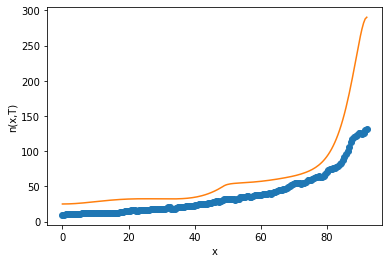

after perturb [1.900881726427662, 86.39721620490843, 27964.372800413326, 0.9485858215639812, 30.908672579455306]
parameters [1.900881726427662, 86.39721620490843, 27964.372800413326, 0.9485858215639812, 30.908672579455306]
oxigeno [7.69854537e-15 7.81023745e-15 8.14865909e-15 8.72396381e-15
 9.55346838e-15 1.06622567e-14 1.20840508e-14 1.38623761e-14
 1.60520588e-14 1.87211038e-14 2.19530158e-14 2.58496426e-14
 3.05346348e-14 3.61576420e-14 4.28993895e-14 5.09778119e-14
 6.06554634e-14 7.22484727e-14 8.61373752e-14 1.02780231e-13
 1.22728533e-13 1.46646509e-13 1.75334565e-13 2.09757755e-13
 2.51080326e-13 3.00707621e-13 3.60336837e-13 4.32018460e-13
 5.18230557e-13 6.21968600e-13 7.46854062e-13 8.97265766e-13
 1.07849885e-12 1.29695723e-12 1.56038675e-12 1.87815733e-12
 2.26160447e-12 2.72444149e-12 3.28325653e-12 3.95811009e-12
 4.77325161e-12 5.75797684e-12 6.94765155e-12 8.38493209e-12
 1.01212197e-11 1.22183933e-11 1.47508754e-11 1.78080982e-11
 2.14974519e-11 2.59478141e-11 3.1313

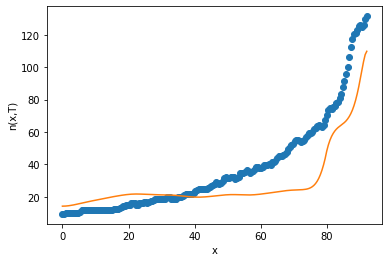

7
after perturb [6.322542698828649, 116.41579817028428, 20928.40460568924, 1.3182605310731386, 30.849269070934884]
parameters [6.322542698828649, 116.41579817028428, 20928.40460568924, 1.3182605310731386, 30.849269070934884]
oxigeno [1.02225599e-14 1.03666574e-14 1.08030392e-14 1.15440998e-14
 1.26109248e-14 1.40339467e-14 1.58538947e-14 1.81230689e-14
 2.09069818e-14 2.42864227e-14 2.83600131e-14 3.32473409e-14
 3.90927769e-14 4.60701049e-14 5.43881207e-14 6.42973905e-14
 7.60983999e-14 9.01513692e-14 1.06888073e-13 1.26826067e-13
 1.50585808e-13 1.78911263e-13 2.12694694e-13 2.53006502e-13
 3.01131118e-13 3.58610195e-13 4.27294578e-13 5.09406813e-13
 6.07616348e-13 7.25129963e-13 8.65800520e-13 1.03425769e-12
 1.23606505e-12 1.47790891e-12 1.76782499e-12 2.11547074e-12
 2.53245210e-12 3.03271562e-12 3.63301874e-12 4.35349364e-12
 5.21832295e-12 6.25654924e-12 7.50304441e-12 8.99967000e-12
 1.07966656e-11 1.29543096e-11 1.55449047e-11 1.86551509e-11
 2.23889813e-11 2.68709485e-11 3.22

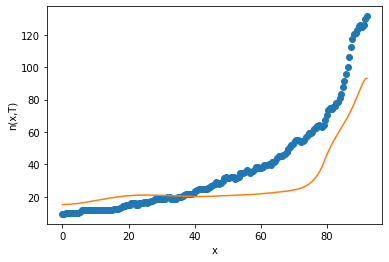

8
after perturb [4.938673185208231, 110.92069377469893, 23035.61157111606, 1.2774922048855561, 52.05167141503104]
parameters [4.938673185208231, 110.92069377469893, 23035.61157111606, 1.2774922048855561, 52.05167141503104]
after perturb [7.329588529806024, 147.30791154473914, 24086.594348927265, 0.9122981550396358, 33.28576043307877]
parameters [7.329588529806024, 147.30791154473914, 24086.594348927265, 0.9122981550396358, 33.28576043307877]
oxigeno [5.77412832e-11 5.81942678e-11 5.95604269e-11 6.18615078e-11
 6.51341965e-11 6.94307866e-11 7.48201342e-11 8.13889159e-11
 8.92432143e-11 9.85104618e-11 1.09341778e-10 1.21914746e-10
 1.36436686e-10 1.53148472e-10 1.72328989e-10 1.94300297e-10
 2.19433603e-10 2.48156163e-10 2.80959241e-10 3.18407268e-10
 3.61148397e-10 4.09926626e-10 4.65595735e-10 5.29135303e-10
 6.01669091e-10 6.84486136e-10 7.79064966e-10 8.87101354e-10
 1.01054014e-09 1.15161171e-09 1.31287374e-09 1.49725905e-09
 1.70813035e-09 1.94934283e-09 2.22531581e-09 2.54111457e-

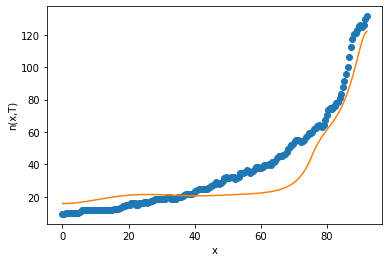

9
after perturb [16.06831290104226, 150.6585027810324, 31468.76703479817, -0.24825860572842107, 27.59187856576649]
parameters [16.06831290104226, 150.6585027810324, 31468.76703479817, -0.24825860572842107, 27.59187856576649]
after perturb [2.580119724518048, 99.83275106688866, 32576.351059383203, 2.4799378215056556, 46.43959283936265]
parameters [2.580119724518048, 99.83275106688866, 32576.351059383203, 2.4799378215056556, 46.43959283936265]
after perturb [11.58636011533792, 109.85897091173285, 23628.337897763628, -0.7941601211425022, 7.571070978742256]
parameters [11.58636011533792, 109.85897091173285, 23628.337897763628, -0.7941601211425022, 7.571070978742256]
after perturb [-1.768442392060276, 147.42720591945601, 28617.263558375784, 2.4070171678151233, 12.695321191078136]
parameters [-1.768442392060276, 147.42720591945601, 28617.263558375784, 2.4070171678151233, 12.695321191078136]
after perturb [1.7888383537940005, 65.19781377200182, 18398.171472149606, 1.0445954732406113, 15.68746

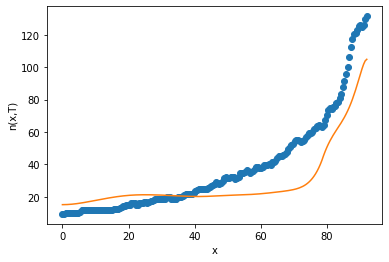

10
after perturb [-0.9307855550012991, 79.72592950927634, 24771.93467463583, 3.169198361398924, 44.98840187724278]
parameters [-0.9307855550012991, 79.72592950927634, 24771.93467463583, 3.169198361398924, 44.98840187724278]
after perturb [6.021830882332731, 147.9937964804734, 26289.126387204164, 2.640985849614469, -8.445042503940332]
parameters [6.021830882332731, 147.9937964804734, 26289.126387204164, 2.640985849614469, -8.445042503940332]
after perturb [11.102108306039359, 114.68705625632597, 29195.087624909607, 0.5047524926809948, 55.72666534751163]
parameters [11.102108306039359, 114.68705625632597, 29195.087624909607, 0.5047524926809948, 55.72666534751163]
after perturb [1.2879819888900883, 138.50060629596763, 20502.587516036325, 1.8434202095474812, 49.46407451558425]
parameters [1.2879819888900883, 138.50060629596763, 20502.587516036325, 1.8434202095474812, 49.46407451558425]
oxigeno [1.06486437e-15 1.07997030e-15 1.12575178e-15 1.20361711e-15
 1.31597094e-15 1.46630198e-15 1.659

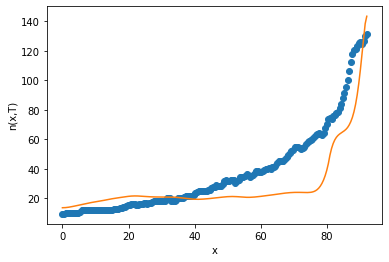

11
after perturb [6.826607977635655, 158.90423386674297, 21455.996487209202, 1.1542109289905225, 5.578004882671742]
parameters [6.826607977635655, 158.90423386674297, 21455.996487209202, 1.1542109289905225, 5.578004882671742]
after perturb [9.124072641801545, 128.55987114258923, 30753.168970444414, -0.3343178170564298, -17.101905064254783]
parameters [9.124072641801545, 128.55987114258923, 30753.168970444414, -0.3343178170564298, -17.101905064254783]
after perturb [7.212331404577588, 56.196481789563634, 28203.02129744419, -0.6868408593293291, 26.481183523292657]
parameters [7.212331404577588, 56.196481789563634, 28203.02129744419, -0.6868408593293291, 26.481183523292657]
after perturb [3.823955670798189, 106.86382834177263, 28722.994540471576, 2.1090227270205353, -11.247475700341234]
parameters [3.823955670798189, 106.86382834177263, 28722.994540471576, 2.1090227270205353, -11.247475700341234]
after perturb [2.565913169366493, 97.47575635666236, 18981.495015219887, -0.5098507772200805,

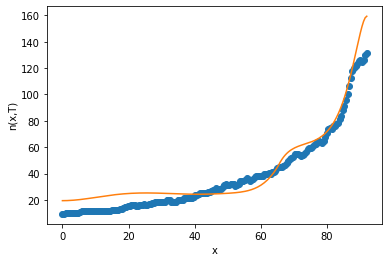

12
after perturb [15.826984070977606, 104.67216981506745, 27547.249384555453, -0.32828191400308715, 15.746881368887163]
parameters [15.826984070977606, 104.67216981506745, 27547.249384555453, -0.32828191400308715, 15.746881368887163]
after perturb [1.9102495219405473, 131.10175373323108, 23258.666911368437, 2.3918837027735598, 44.53827303162722]
parameters [1.9102495219405473, 131.10175373323108, 23258.666911368437, 2.3918837027735598, 44.53827303162722]
oxigeno [3.09731847e-18 3.15716852e-18 3.33912063e-18 3.65049412e-18
 4.10387137e-18 4.71769114e-18 5.51711671e-18 6.53521888e-18
 7.81452925e-18 9.40903725e-18 1.13867263e-17 1.38327711e-17
 1.68535502e-17 2.05816699e-17 2.51822428e-17 3.08607338e-17
 3.78727634e-17 4.65363669e-17 5.72473414e-17 7.04984844e-17
 8.69037449e-17 1.07228581e-16 1.32428159e-16 1.63695442e-16
 2.02521760e-16 2.50773074e-16 3.10785998e-16 3.85488632e-16
 4.78552596e-16 5.94584306e-16 7.39365663e-16 9.20157048e-16
 1.14607894e-15 1.42859282e-15 1.78210738e-15

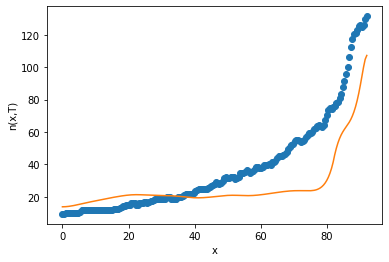

after perturb [8.812564277440762, 126.8880074659461, 30200.789096551733, 1.0442395931040758, 12.624623573918305]
parameters [8.812564277440762, 126.8880074659461, 30200.789096551733, 1.0442395931040758, 12.624623573918305]
after perturb [13.002251976828681, 142.16884458026192, 22049.777644170288, 1.3135015341577958, 35.09217515999844]
parameters [13.002251976828681, 142.16884458026192, 22049.777644170288, 1.3135015341577958, 35.09217515999844]
after perturb [-3.84248771963183, 70.50241920002263, 23484.999389786477, 2.868552662619037, 35.00062405163833]
parameters [-3.84248771963183, 70.50241920002263, 23484.999389786477, 2.868552662619037, 35.00062405163833]
after perturb [12.154573497242112, 129.22100108032268, 17173.54196431452, 0.44481628401385476, 58.731509802082854]
parameters [12.154573497242112, 129.22100108032268, 17173.54196431452, 0.44481628401385476, 58.731509802082854]
after perturb [3.8717028615419533, 113.41975858406217, 24942.663057421985, 1.0920435824509038, 18.40426522

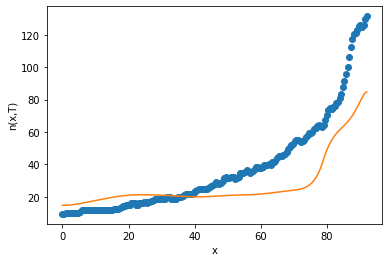

after perturb [13.583259955749803, 96.15252253435536, 17327.52802355625, 0.3057876454862559, 46.966992341332414]
parameters [13.583259955749803, 96.15252253435536, 17327.52802355625, 0.3057876454862559, 46.966992341332414]
after perturb [3.1770326762346706, 97.87096353555873, 28472.536504598986, 2.0546791304462597, 43.98922999595837]
parameters [3.1770326762346706, 97.87096353555873, 28472.536504598986, 2.0546791304462597, 43.98922999595837]
oxigeno [8.54953487e-20 8.75719059e-20 9.39037297e-20 1.04802798e-19
 1.20807795e-19 1.42713318e-19 1.71613088e-19 2.08959650e-19
 2.56643998e-19 3.17099738e-19 3.93437815e-19 4.89619669e-19
 6.10678927e-19 7.63004690e-19 9.54703150e-19 1.19605904e-18
 1.50012456e-18 1.88347112e-18 2.36714964e-18 2.97791760e-18
 3.74980830e-18 4.72613870e-18 5.96208020e-18 7.52795190e-18
 9.51344174e-18 1.20330193e-17 1.52328797e-17 1.92998540e-17
 2.44728474e-17 3.10575235e-17 3.94451587e-17 5.01368522e-17
 6.37746102e-17 8.11812503e-17 1.03411617e-16 1.31818294e-

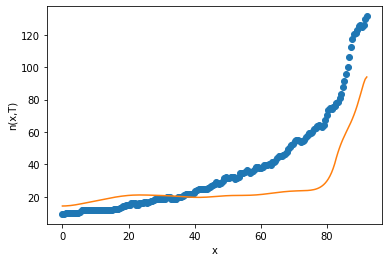

after perturb [-2.6687197472607846, 173.37259217688737, 29753.454299337427, 3.3990870912704043, 39.067864380852356]
parameters [-2.6687197472607846, 173.37259217688737, 29753.454299337427, 3.3990870912704043, 39.067864380852356]
after perturb [11.359468922839902, 94.21817152107587, 22825.5283374641, -0.7596546211372666, 24.726225925812315]
parameters [11.359468922839902, 94.21817152107587, 22825.5283374641, -0.7596546211372666, 24.726225925812315]
after perturb [12.834209468301655, 76.34819422059542, 20021.89639571708, -1.0593774103939197, 36.13010049183103]
parameters [12.834209468301655, 76.34819422059542, 20021.89639571708, -1.0593774103939197, 36.13010049183103]
after perturb [7.80284500119693, 156.73176299020437, 18090.62650240854, 1.1759727369062298, 53.77760780048667]
parameters [7.80284500119693, 156.73176299020437, 18090.62650240854, 1.1759727369062298, 53.77760780048667]
after perturb [5.191546678311335, 173.92557299730092, 30102.12254571887, 1.472332605405446, 34.31805156257

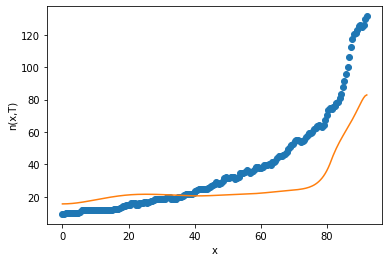

after perturb [10.0919467877448, 42.046376909618196, 17431.548496616815, 1.168280441615707, 46.29065452009563]
parameters [10.0919467877448, 42.046376909618196, 17431.548496616815, 1.168280441615707, 46.29065452009563]
after perturb [13.556225443153933, 170.5009636923796, 27140.646883375783, -0.14238341848937242, -13.880433757512751]
parameters [13.556225443153933, 170.5009636923796, 27140.646883375783, -0.14238341848937242, -13.880433757512751]
after perturb [5.585123233981667, 78.76434246866248, 16796.633593303515, 1.0441116732548195, 77.8537271057026]
parameters [5.585123233981667, 78.76434246866248, 16796.633593303515, 1.0441116732548195, 77.8537271057026]
after perturb [4.112673182015584, 65.16789432515003, 19459.24722224439, 0.4216724336186247, 27.604573917551818]
parameters [4.112673182015584, 65.16789432515003, 19459.24722224439, 0.4216724336186247, 27.604573917551818]
after perturb [0.9003164141550268, 75.57196559040206, 26143.611910108142, 2.867842804937336, 37.99011409081546

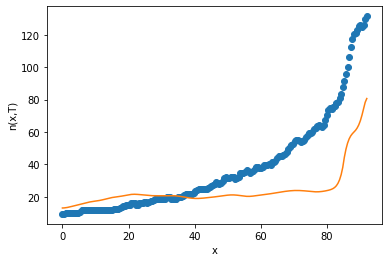

after perturb [3.7102845568680634, 93.05106803271237, 17080.25700766489, 0.5478475556806688, 39.42696958678613]
parameters [3.7102845568680634, 93.05106803271237, 17080.25700766489, 0.5478475556806688, 39.42696958678613]
after perturb [-1.14657517352066, 144.18613927821076, 26015.815718344486, 1.8804158142681033, 39.87122160888658]
parameters [-1.14657517352066, 144.18613927821076, 26015.815718344486, 1.8804158142681033, 39.87122160888658]
after perturb [7.535375782520109, 162.64130162559908, 28250.472309158748, 1.5039828477977992, 23.26288781252761]
parameters [7.535375782520109, 162.64130162559908, 28250.472309158748, 1.5039828477977992, 23.26288781252761]
after perturb [3.263796457896195, 130.0976532818416, 23986.869142374733, 1.6586606277047145, 46.74721478288157]
parameters [3.263796457896195, 130.0976532818416, 23986.869142374733, 1.6586606277047145, 46.74721478288157]
oxigeno [1.91469256e-15 1.94252624e-15 2.02685745e-15 2.17020533e-15
 2.37686471e-15 2.65305417e-15 3.00713034e-

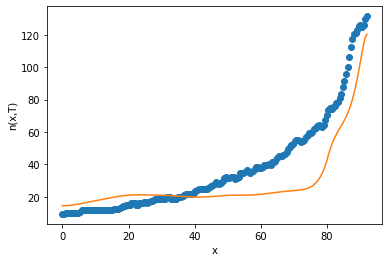

13
after perturb [7.175522793608323, 87.71313240744382, 26834.372962134883, 0.23461041941980149, 4.447175595592412]
parameters [7.175522793608323, 87.71313240744382, 26834.372962134883, 0.23461041941980149, 4.447175595592412]
oxigeno [1.92042966e-06 1.91953410e-06 1.91685593e-06 1.91242064e-06
 1.90627054e-06 1.89846452e-06 1.88907772e-06 1.87820115e-06
 1.86594124e-06 1.85241935e-06 1.83777129e-06 1.82214682e-06
 1.80570922e-06 1.78863490e-06 1.77111308e-06 1.75334561e-06
 1.73554690e-06 1.71794399e-06 1.70077684e-06 1.68429877e-06
 1.66877715e-06 1.65449430e-06 1.64174866e-06 1.63085626e-06
 1.62215242e-06 1.61599387e-06 1.61276107e-06 1.61286103e-06
 1.61673042e-06 1.62483916e-06 1.63769437e-06 1.65584489e-06
 1.67988626e-06 1.71046623e-06 1.74829096e-06 1.79413171e-06
 1.84883239e-06 1.91331774e-06 1.98860239e-06 2.07580081e-06
 2.17613815e-06 2.29096227e-06 2.42175674e-06 2.57015523e-06
 2.73795717e-06 2.92714493e-06 3.13990260e-06 3.37863652e-06
 3.64599772e-06 3.94490652e-06 4.2

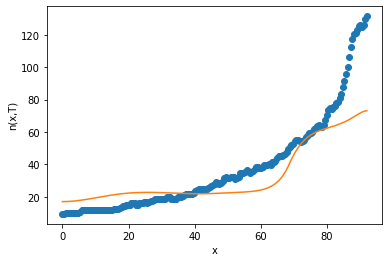

14
after perturb [0.8809087538255245, 125.31301878958836, 22436.942558137413, 2.207647584752469, 32.820417584591574]
parameters [0.8809087538255245, 125.31301878958836, 22436.942558137413, 2.207647584752469, 32.820417584591574]
oxigeno [5.59107821e-18 5.69362067e-18 6.00540769e-18 6.53911144e-18
 7.31649807e-18 8.36940650e-18 9.74115262e-18 1.14884200e-17
 1.36837451e-17 1.64187596e-17 1.98084072e-17 2.39963905e-17
 2.91621348e-17 3.55295533e-17 4.33779102e-17 5.30550904e-17
 6.49936677e-17 7.97303305e-17 9.79295296e-17 1.20412676e-16
 1.48194847e-16 1.82531716e-16 2.24980273e-16 2.77477667e-16
 3.42443174e-16 4.22908669e-16 5.22683201e-16 6.46557498e-16
 8.00554960e-16 9.92237492e-16 1.23107826e-15 1.52891959e-15
 1.90054316e-15 2.36439132e-15 2.94349201e-15 3.66665402e-15
 4.57001369e-15 5.69902636e-15 7.11100666e-15 8.87833011e-15
 1.10924174e-14 1.38686349e-14 1.73522668e-14 2.17257562e-14
 2.72174801e-14 3.41124358e-14 4.27653638e-14 5.36170220e-14
 6.72145387e-14 8.42369936e-14 1

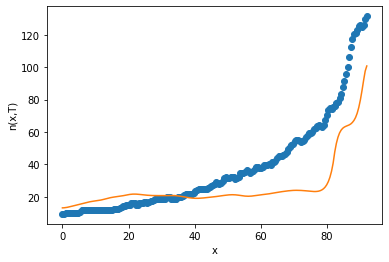

after perturb [8.028145440942803, 136.1377320625886, 26727.7960562726, 1.6840175422681551, 35.272046436946276]
parameters [8.028145440942803, 136.1377320625886, 26727.7960562726, 1.6840175422681551, 35.272046436946276]
oxigeno [3.46215794e-15 3.51309368e-15 3.66740855e-15 3.92967387e-15
 4.30767118e-15 4.81264221e-15 5.45965087e-15 6.26806986e-15
 7.26220876e-15 8.47210561e-15 9.93450942e-15 1.16940883e-14
 1.38049052e-14 1.63322136e-14 1.93546361e-14 2.29668032e-14
 2.72825451e-14 3.24387514e-14 3.86000334e-14 4.59643578e-14
 5.47698508e-14 6.53030168e-14 7.79086641e-14 9.30018942e-14
 1.11082582e-13 1.32752866e-13 1.58738271e-13 1.89913221e-13
 2.27331848e-13 2.72265202e-13 3.26246166e-13 3.91123700e-13
 4.69128298e-13 5.62950996e-13 6.75838695e-13 8.11709154e-13
 9.75289664e-13 1.17228424e-12 1.40957515e-12 1.69546572e-12
 2.03997282e-12 2.45517908e-12 2.95565680e-12 3.55897816e-12
 4.28632882e-12 5.16324593e-12 6.22050508e-12 7.49518620e-12
 9.03195389e-12 1.08845947e-11 1.31178626

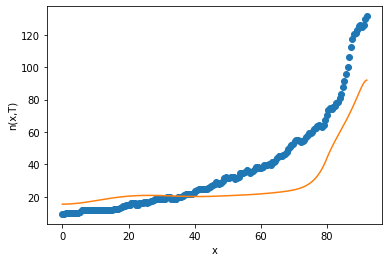

15
after perturb [6.919482567552436, 89.75387302552774, 11829.295939497275, -0.07751938456507368, 31.90410356579896]
parameters [6.919482567552436, 89.75387302552774, 11829.295939497275, -0.07751938456507368, 31.90410356579896]
after perturb [7.355214826611135, 75.84669134473309, 23084.6969093906, 0.07354679291544636, 62.93307840234138]
parameters [7.355214826611135, 75.84669134473309, 23084.6969093906, 0.07354679291544636, 62.93307840234138]
after perturb [-1.5517894951840434, 106.72453431948745, 21771.9738557142, 3.1408436583113843, 47.64682176339028]
parameters [-1.5517894951840434, 106.72453431948745, 21771.9738557142, 3.1408436583113843, 47.64682176339028]
after perturb [3.1277519482171128, 136.86630130134816, 24776.924705787103, 1.922668425510961, 26.026151736976274]
parameters [3.1277519482171128, 136.86630130134816, 24776.924705787103, 1.922668425510961, 26.026151736976274]
oxigeno [4.10276569e-16 4.16676461e-16 4.36081166e-16 4.69113352e-16
 5.16836352e-16 5.80793506e-16 6.630

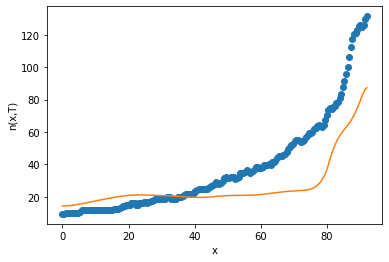

after perturb [8.244185190137804, 162.33233165982494, 25839.256778809096, 1.2305762744867415, 40.72289105938577]
parameters [8.244185190137804, 162.33233165982494, 25839.256778809096, 1.2305762744867415, 40.72289105938577]
after perturb [7.000760246452381, 53.845216491564756, 19260.671126234978, -0.5702388191876788, 35.798469253261885]
parameters [7.000760246452381, 53.845216491564756, 19260.671126234978, -0.5702388191876788, 35.798469253261885]
after perturb [5.715783643559197, 113.44080741117023, 36494.91100328276, 0.4503235166901245, 2.072950371493093]
parameters [5.715783643559197, 113.44080741117023, 36494.91100328276, 0.4503235166901245, 2.072950371493093]
after perturb [2.3014460261290832, 139.37483392260498, 18251.919042633323, 2.194618775990656, 16.314973320050484]
parameters [2.3014460261290832, 139.37483392260498, 18251.919042633323, 2.194618775990656, 16.314973320050484]
after perturb [7.858845614638324, 129.47595725038957, 30818.94787456935, 1.6070645016516794, -3.82774744

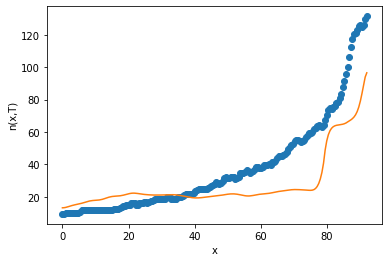

after perturb [8.834418609056174, 142.7729357967766, 20631.92758811978, 1.8363233729936965, 68.6923398708876]
parameters [8.834418609056174, 142.7729357967766, 20631.92758811978, 1.8363233729936965, 68.6923398708876]
after perturb [4.2414300055101695, 118.39289515582242, 22654.472472383306, 3.0123787920111855, 67.93749291488498]
parameters [4.2414300055101695, 118.39289515582242, 22654.472472383306, 3.0123787920111855, 67.93749291488498]
after perturb [6.036830885377352, 74.62964688173426, 13892.980534082426, 0.7194866920355109, 55.706326996019385]
parameters [6.036830885377352, 74.62964688173426, 13892.980534082426, 0.7194866920355109, 55.706326996019385]
after perturb [8.81303538034084, 142.92088041542235, 25790.567138942773, 0.6908546467291239, 21.773912900415414]
parameters [8.81303538034084, 142.92088041542235, 25790.567138942773, 0.6908546467291239, 21.773912900415414]
oxigeno [8.42705338e-10 8.48197114e-10 8.64744611e-10 8.92565415e-10
 9.32025794e-10 9.83646198e-10 1.04810907e-

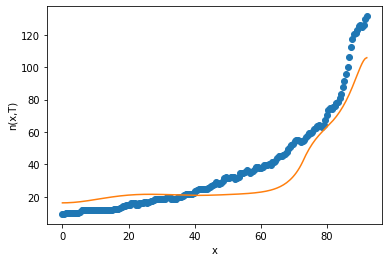

16
after perturb [10.249262281159378, 98.04050246602418, 22754.621678419287, -0.11081361263334544, 25.517530499386712]
parameters [10.249262281159378, 98.04050246602418, 22754.621678419287, -0.11081361263334544, 25.517530499386712]
after perturb [9.666965727690755, 142.7731112084989, 23675.742721734467, -0.7664848583948208, 21.807095759125122]
parameters [9.666965727690755, 142.7731112084989, 23675.742721734467, -0.7664848583948208, 21.807095759125122]
after perturb [5.410047743953167, 135.3072582677834, 19339.29471448753, 1.822468570055774, 39.509602064681104]
parameters [5.410047743953167, 135.3072582677834, 19339.29471448753, 1.822468570055774, 39.509602064681104]
after perturb [6.366300773416497, 138.31714924361196, 17204.26776846838, 1.2579060399432045, 45.10190616064489]
parameters [6.366300773416497, 138.31714924361196, 17204.26776846838, 1.2579060399432045, 45.10190616064489]
after perturb [7.937920315199255, 90.25543389008955, 20026.44559621828, 0.46155156943305276, 29.3831676

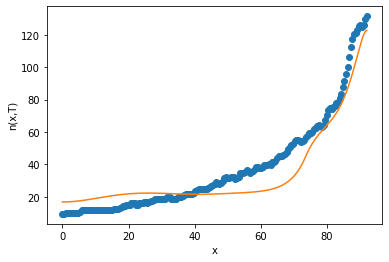

17
after perturb [-4.765110405930434, 57.54272332281823, 19464.391990310643, 2.529633680167027, 27.873931313850722]
parameters [-4.765110405930434, 57.54272332281823, 19464.391990310643, 2.529633680167027, 27.873931313850722]
after perturb [3.9658890918996788, 98.65107211875831, 21916.10557511885, -0.025231285887348243, 48.92114735513154]
parameters [3.9658890918996788, 98.65107211875831, 21916.10557511885, -0.025231285887348243, 48.92114735513154]
after perturb [8.76144078605012, 175.22567675058883, 19879.94684295272, 0.9628033532731854, 10.340350913375666]
parameters [8.76144078605012, 175.22567675058883, 19879.94684295272, 0.9628033532731854, 10.340350913375666]
after perturb [-1.8573965760196076, 110.33486528473692, 24598.83178995089, 0.3661414047121876, 17.54768726604419]
parameters [-1.8573965760196076, 110.33486528473692, 24598.83178995089, 0.3661414047121876, 17.54768726604419]
after perturb [7.5647397955767675, 149.54041652018162, 23439.25874719654, 0.7971991577546553, 56.3839

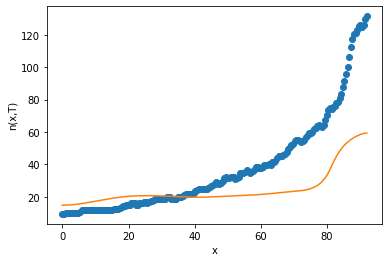

after perturb [4.37777335152915, 197.49555118480177, 24765.69506446235, 2.4823356447181695, 23.966747197736588]
parameters [4.37777335152915, 197.49555118480177, 24765.69506446235, 2.4823356447181695, 23.966747197736588]
after perturb [5.076900831067445, 188.7908608331112, 31797.440807603092, 2.271105462836119, 34.66713120537966]
parameters [5.076900831067445, 188.7908608331112, 31797.440807603092, 2.271105462836119, 34.66713120537966]
after perturb [9.181610156856198, 140.44416952806878, 21202.14408218061, 2.140427998796169, 78.54002001750902]
parameters [9.181610156856198, 140.44416952806878, 21202.14408218061, 2.140427998796169, 78.54002001750902]
after perturb [13.637186966017165, 182.43296480932142, 27848.777353497935, -0.47420208196465063, 2.080708150835356]
parameters [13.637186966017165, 182.43296480932142, 27848.777353497935, -0.47420208196465063, 2.080708150835356]
after perturb [3.1600400940182394, 57.65196333839314, 26213.314044356543, 1.1909486717803828, 56.37194525205433]

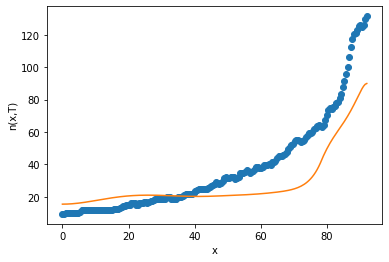

18
after perturb [3.5793258667319083, 101.54015031074255, 16629.970826154684, 2.2104487163885187, 66.61985527725076]
parameters [3.5793258667319083, 101.54015031074255, 16629.970826154684, 2.2104487163885187, 66.61985527725076]
after perturb [-2.136178925518846, 72.02629529249252, 19134.869202695347, 2.639352433204255, 48.332369445813626]
parameters [-2.136178925518846, 72.02629529249252, 19134.869202695347, 2.639352433204255, 48.332369445813626]
after perturb [-2.1702258698288066, 135.0270033797205, 29280.692591854735, 2.9298362871993606, 4.72711538101618]
parameters [-2.1702258698288066, 135.0270033797205, 29280.692591854735, 2.9298362871993606, 4.72711538101618]
after perturb [2.893869956750711, 59.84294180472057, 14957.477960935928, 0.30420110971421094, 53.532390509479974]
parameters [2.893869956750711, 59.84294180472057, 14957.477960935928, 0.30420110971421094, 53.532390509479974]
after perturb [4.482665120937186, 92.0369638052055, 22304.20545845976, 2.6119710866862955, 48.8998262

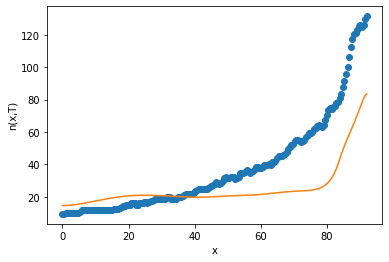

after perturb [4.625614592283219, 142.8217255247644, 27630.78011774751, -0.11278461389615768, 25.391574106540453]
parameters [4.625614592283219, 142.8217255247644, 27630.78011774751, -0.11278461389615768, 25.391574106540453]
after perturb [9.873420352181574, 132.39547650352796, 29281.324879815314, 0.8835132121069312, 45.666476332740714]
parameters [9.873420352181574, 132.39547650352796, 29281.324879815314, 0.8835132121069312, 45.666476332740714]
after perturb [12.05858352799583, 71.57719347245636, 15856.124987438207, 0.37130699049592353, 48.815015128328525]
parameters [12.05858352799583, 71.57719347245636, 15856.124987438207, 0.37130699049592353, 48.815015128328525]
after perturb [8.556735154321442, 123.76330119713657, 23830.413156560393, 1.3241144780161738, 45.01339467771923]
parameters [8.556735154321442, 123.76330119713657, 23830.413156560393, 1.3241144780161738, 45.01339467771923]
oxigeno [2.71454233e-14 2.75077824e-14 2.86045632e-14 3.04651561e-14
 3.31394901e-14 3.66994794e-14 4.

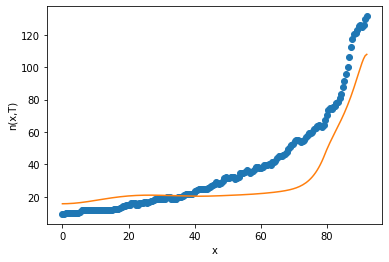

19
after perturb [0.9293431341738241, 115.13971467476874, 18904.059391359882, 2.3962868130923742, 9.69491090556894]
parameters [0.9293431341738241, 115.13971467476874, 18904.059391359882, 2.3962868130923742, 9.69491090556894]
after perturb [3.9418625121220576, 112.36648631362495, 21255.802079107852, 3.146570023919409, 59.431130691864254]
parameters [3.9418625121220576, 112.36648631362495, 21255.802079107852, 3.146570023919409, 59.431130691864254]
after perturb [8.850484786001168, 91.6104815291285, 23903.7745654362, 0.34331501275127396, 49.411460740522834]
parameters [8.850484786001168, 91.6104815291285, 23903.7745654362, 0.34331501275127396, 49.411460740522834]
oxigeno [5.10982878e-08 5.10897869e-08 5.10647883e-08 5.10248071e-08
 5.09723734e-08 5.09110418e-08 5.08454045e-08 5.07811088e-08
 5.07248819e-08 5.06845619e-08 5.06691372e-08 5.06887967e-08
 5.07549905e-08 5.08805053e-08 5.10795545e-08 5.13678865e-08
 5.17629131e-08 5.22838605e-08 5.29519460e-08 5.37905834e-08
 5.48256205e-08 5

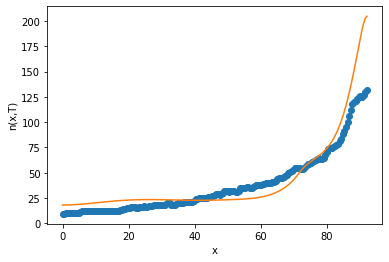

20
parameters [0.5905779171198722, 121.09545374999632, 25370.45831339213, 1.0312275462794447, 23.197350228285227]
parameters [5.590316740517081, 108.79297687183575, 27670.206818071274, 0.4796420607743098, 20.921830183724147]
parameters [1.0423581877718875, 72.6411235732752, 21404.140627218214, 0.658303855089708, 21.528473788105195]
parameters [3.739074514209257, 129.31159256412687, 25822.241437353292, 0.7543732246062615, 34.3183682639456]
parameters [8.62226141474241, 122.86898872076966, 24377.23477533242, 0.9258603368814555, 36.83543644055627]
parameters [5.583391905908736, 98.66112091298862, 26274.1868272523, 0.5381347486920549, 15.63560548778576]
parameters [1.900881726427662, 86.39721620490843, 27964.372800413326, 0.9485858215639812, 30.908672579455306]
parameters [6.322542698828649, 116.41579817028428, 20928.40460568924, 1.3182605310731386, 30.849269070934884]
parameters [7.329588529806024, 147.30791154473914, 24086.594348927265, 0.9122981550396358, 33.28576043307877]
parameters [

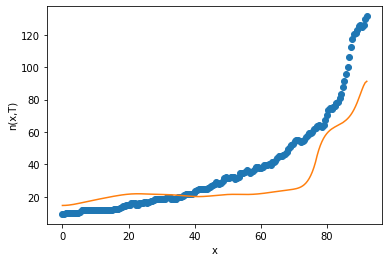

after perturb [12.27156550357299, 149.70846097270217, 26000.651027144995, 1.6776872530664317, 65.50175319238306]
parameters [12.27156550357299, 149.70846097270217, 26000.651027144995, 1.6776872530664317, 65.50175319238306]
after perturb [6.949733309137328, 107.03566852799602, 23718.70330997177, 1.336567143106664, 14.445691096518868]
parameters [6.949733309137328, 107.03566852799602, 23718.70330997177, 1.336567143106664, 14.445691096518868]
oxigeno [1.49089272e-15 1.51455788e-15 1.58630675e-15 1.70842531e-15
 1.88481050e-15 2.12110413e-15 2.42488708e-15 2.80594115e-15
 3.27658813e-15 3.85211862e-15 4.55132657e-15 5.39716948e-15
 6.41757862e-15 7.64644987e-15 9.12485208e-15 1.09024983e-14
 1.30395357e-14 1.56087206e-14 1.86980627e-14 2.24140360e-14
 2.68854815e-14 3.22683460e-14 3.87514404e-14 4.65634346e-14
 5.59813548e-14 6.73409068e-14 8.10490176e-14 9.75990691e-14
 1.17589404e-13 1.41745801e-13 1.70948767e-13 2.06266679e-13
 2.48996012e-13 3.00710158e-13 3.63318675e-13 4.39139132e-13

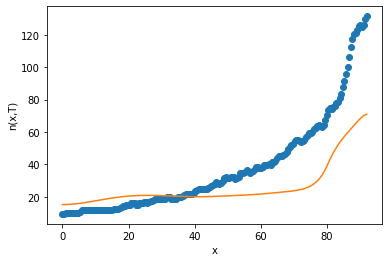

after perturb [-2.619861933287205, 154.92076051880215, 21521.974064287846, 2.032666276834281, 31.90573654353751]
parameters [-2.619861933287205, 154.92076051880215, 21521.974064287846, 2.032666276834281, 31.90573654353751]
after perturb [1.3550806117288885, 32.81173272601435, 24814.77729568177, 0.1499044368582938, 10.773036945799904]
parameters [1.3550806117288885, 32.81173272601435, 24814.77729568177, 0.1499044368582938, 10.773036945799904]
oxigeno [1.42670050e-04 1.42496109e-04 1.41977076e-04 1.41121152e-04
 1.39941451e-04 1.38455254e-04 1.36683129e-04 1.34648015e-04
 1.32374372e-04 1.29887454e-04 1.27212717e-04 1.24375364e-04
 1.21399974e-04 1.18310204e-04 1.15128508e-04 1.11875909e-04
 1.08571796e-04 1.05233802e-04 1.01877778e-04 9.85178676e-05
 9.51666919e-05 9.18356064e-05 8.85349910e-05 8.52745207e-05
 8.20633711e-05 7.89103265e-05 7.58237809e-05 7.28116469e-05
 6.98812036e-05 6.70389291e-05 6.42903601e-05 6.16400128e-05
 5.90913835e-05 5.66470246e-05 5.43086796e-05 5.20774465e-

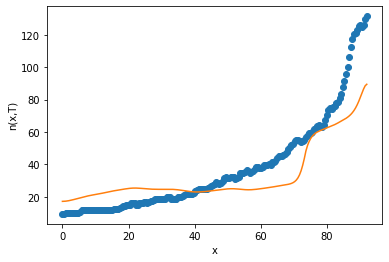

after perturb [0.06164962262554241, 171.51524723932778, 25567.538698390734, 2.1303848674343158, 38.94926362825359]
parameters [0.06164962262554241, 171.51524723932778, 25567.538698390734, 2.1303848674343158, 38.94926362825359]
after perturb [8.234460311580962, 169.90728997910153, 27976.978748147973, 2.054518621452648, 52.01126609771584]
parameters [8.234460311580962, 169.90728997910153, 27976.978748147973, 2.054518621452648, 52.01126609771584]
after perturb [2.5547509522026735, 164.0884893368449, 24825.942544639765, 1.7582185776196095, 45.63477640535159]
parameters [2.5547509522026735, 164.0884893368449, 24825.942544639765, 1.7582185776196095, 45.63477640535159]
after perturb [10.174215050494222, 138.7032973824513, 23198.686747931053, 1.7024889776362278, 36.412256753000015]
parameters [10.174215050494222, 138.7032973824513, 23198.686747931053, 1.7024889776362278, 36.412256753000015]
after perturb [11.621989382910709, 125.91754359189368, 27384.599795506063, 0.1376957451419174, 6.9645412

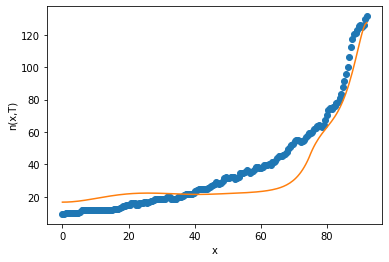

1
after perturb [5.100998602924953, 140.65708093375048, 22688.216765562785, 2.127974817722484, 60.50955919359441]
parameters [5.100998602924953, 140.65708093375048, 22688.216765562785, 2.127974817722484, 60.50955919359441]
after perturb [12.12631805064865, 87.50632060838953, 20298.534461594852, -0.02957087235582989, 23.836276154841464]
parameters [12.12631805064865, 87.50632060838953, 20298.534461594852, -0.02957087235582989, 23.836276154841464]
after perturb [-2.0974340290599165, 61.80609128996823, 19441.901645200745, 1.312873151839245, 27.24786458544773]
parameters [-2.0974340290599165, 61.80609128996823, 19441.901645200745, 1.312873151839245, 27.24786458544773]
after perturb [6.133705941939705, 158.3772472308061, 23207.488172136334, 1.93609079465211, 39.28977322684396]
parameters [6.133705941939705, 158.3772472308061, 23207.488172136334, 1.93609079465211, 39.28977322684396]
after perturb [9.27678684736409, 137.5641933743541, 22397.99867522951, 0.9840662238466746, 0.7946115910576559]

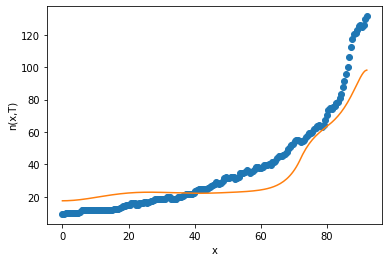

2
after perturb [6.505231903204426, 123.74395806975477, 14953.6882468974, 1.0762610761703573, 18.88200290226996]
parameters [6.505231903204426, 123.74395806975477, 14953.6882468974, 1.0762610761703573, 18.88200290226996]
after perturb [13.189426240241708, 91.12389871384718, 20665.478855120797, -0.03802526462234285, 41.85437127580549]
parameters [13.189426240241708, 91.12389871384718, 20665.478855120797, -0.03802526462234285, 41.85437127580549]
after perturb [10.908091138105188, 216.21672676478767, 23225.774892255606, 1.4054940914415244, 34.247625529769145]
parameters [10.908091138105188, 216.21672676478767, 23225.774892255606, 1.4054940914415244, 34.247625529769145]
after perturb [5.267131085766859, 107.78848965039744, 22040.589136295734, 1.4887741243016235, 43.03340001655039]
parameters [5.267131085766859, 107.78848965039744, 22040.589136295734, 1.4887741243016235, 43.03340001655039]
oxigeno [3.24557724e-16 3.30039570e-16 3.46671673e-16 3.75020657e-16
 4.16054279e-16 4.71177491e-16 5.

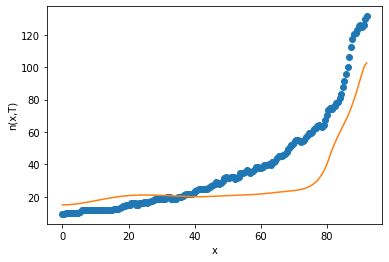

after perturb [0.10662805186384405, 149.624115570252, 30324.58867297296, 1.4623431103348286, 27.972007606735243]
parameters [0.10662805186384405, 149.624115570252, 30324.58867297296, 1.4623431103348286, 27.972007606735243]
after perturb [9.986824381230317, 95.2505227145606, 22679.270000725046, -0.3621505808117149, 30.10456662145859]
parameters [9.986824381230317, 95.2505227145606, 22679.270000725046, -0.3621505808117149, 30.10456662145859]
after perturb [8.554184248733272, 89.13362988185268, 24623.79618268939, -0.021577369418820103, 12.091215609487058]
parameters [8.554184248733272, 89.13362988185268, 24623.79618268939, -0.021577369418820103, 12.091215609487058]
after perturb [0.07931755633119053, 107.76672508388802, 16270.41069309325, 1.3194304820946672, 58.75946130656387]
parameters [0.07931755633119053, 107.76672508388802, 16270.41069309325, 1.3194304820946672, 58.75946130656387]
after perturb [1.0344318975124818, 106.68606445360818, 21415.47749693387, 1.8275373305123161, 52.3442859

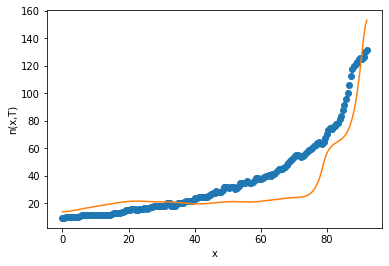

after perturb [8.589444200809476, 67.5794558522986, 22151.172525500624, 0.047185929426650924, 22.43533170440645]
parameters [8.589444200809476, 67.5794558522986, 22151.172525500624, 0.047185929426650924, 22.43533170440645]
oxigeno [1.03330692e-01 1.03297808e-01 1.03199316e-01 1.03035698e-01
 1.02807751e-01 1.02516581e-01 1.02163593e-01 1.01750474e-01
 1.01279181e-01 1.00751924e-01 1.00171141e-01 9.95394851e-02
 9.88597934e-02 9.81350700e-02 9.73684594e-02 9.65632236e-02
 9.57227174e-02 9.48503659e-02 9.39496406e-02 9.30240383e-02
 9.20770599e-02 9.11121906e-02 9.01328820e-02 8.91425348e-02
 8.81444843e-02 8.71419858e-02 8.61382034e-02 8.51361990e-02
 8.41389238e-02 8.31492109e-02 8.21697695e-02 8.12031810e-02
 8.02518957e-02 7.93182316e-02 7.84043741e-02 7.75123771e-02
 7.66441654e-02 7.58015373e-02 7.49861697e-02 7.41996226e-02
 7.34433457e-02 7.27186849e-02 7.20268901e-02 7.13691236e-02
 7.07464688e-02 7.01599395e-02 6.96104904e-02 6.90990266e-02
 6.86264152e-02 6.81934957e-02 6.7801

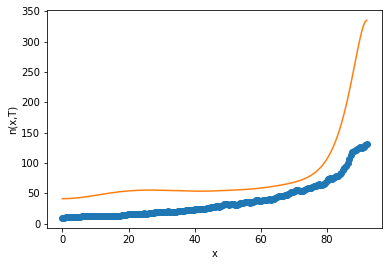

after perturb [11.959223717497201, 114.17935723554928, 24352.906113128658, 0.7030917882129487, 15.09332093719217]
parameters [11.959223717497201, 114.17935723554928, 24352.906113128658, 0.7030917882129487, 15.09332093719217]
after perturb [3.7790411776204915, 120.14038594169465, 17560.72731800401, 0.7827035387800084, 58.0591521033359]
parameters [3.7790411776204915, 120.14038594169465, 17560.72731800401, 0.7827035387800084, 58.0591521033359]
after perturb [11.0199482459475, 111.98503932902217, 24481.776852245515, 0.21015613439396075, 6.114062796034958]
parameters [11.0199482459475, 111.98503932902217, 24481.776852245515, 0.21015613439396075, 6.114062796034958]
after perturb [9.393708855144533, 146.2816030764844, 25435.097882696264, 0.7566116987630696, 48.47317689556676]
parameters [9.393708855144533, 146.2816030764844, 25435.097882696264, 0.7566116987630696, 48.47317689556676]
oxigeno [3.77567913e-10 3.80122613e-10 3.87821557e-10 4.00769806e-10
 4.19144276e-10 4.43196473e-10 4.73256398

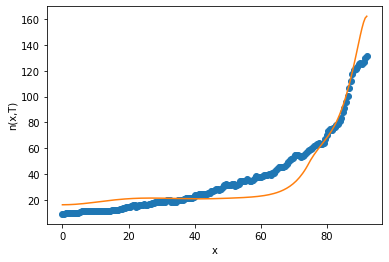

3
after perturb [2.993947693455369, 37.12073606306714, 13817.83200011987, -0.12799265217652156, 51.02329555306213]
parameters [2.993947693455369, 37.12073606306714, 13817.83200011987, -0.12799265217652156, 51.02329555306213]
after perturb [2.202729799457051, 159.41450890546332, 28942.690636160696, 2.276467335283728, 63.429195736178094]
parameters [2.202729799457051, 159.41450890546332, 28942.690636160696, 2.276467335283728, 63.429195736178094]
after perturb [-2.1895824968919837, 131.27828525117263, 28089.141695833237, 0.5484217856470397, -1.2677299807074718]
parameters [-2.1895824968919837, 131.27828525117263, 28089.141695833237, 0.5484217856470397, -1.2677299807074718]
after perturb [11.989032404055127, 92.56323440045074, 27392.62378921904, -0.25963598729812454, -12.667486837476794]
parameters [11.989032404055127, 92.56323440045074, 27392.62378921904, -0.25963598729812454, -12.667486837476794]
after perturb [10.339108930636598, 102.59441282639743, 18938.681675201802, 0.500803026012749

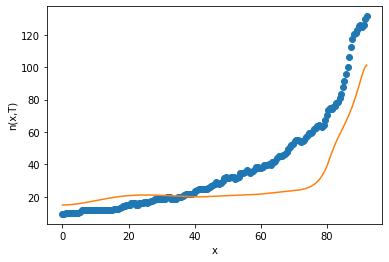

after perturb [3.222822926960959, 76.0652072943696, 30218.32102714934, 0.6115766829824706, 17.254007256783858]
parameters [3.222822926960959, 76.0652072943696, 30218.32102714934, 0.6115766829824706, 17.254007256783858]
after perturb [2.090370248761656, 127.69795421158537, 21516.038895870475, 1.284987216015126, 52.05713419000019]
parameters [2.090370248761656, 127.69795421158537, 21516.038895870475, 1.284987216015126, 52.05713419000019]
after perturb [8.657644702442783, 105.84569900039588, 22710.608136286977, -0.48505421149110084, 14.79331621723343]
parameters [8.657644702442783, 105.84569900039588, 22710.608136286977, -0.48505421149110084, 14.79331621723343]
after perturb [3.918825825873795, 136.91399729423222, 25024.493013519805, 1.400795708689401, 70.01021241537686]
parameters [3.918825825873795, 136.91399729423222, 25024.493013519805, 1.400795708689401, 70.01021241537686]
after perturb [7.631260514497318, 76.05764016841991, 23138.929847538988, 0.9998209146769678, 67.14518068197007]


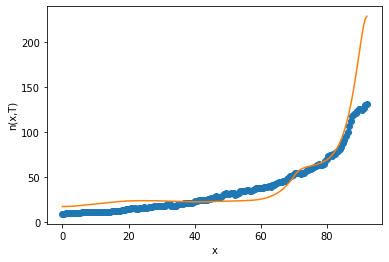

after perturb [9.93994668203739, 92.54239674256105, 21991.360830574984, 0.29050763755981834, 52.591912868868434]
parameters [9.93994668203739, 92.54239674256105, 21991.360830574984, 0.29050763755981834, 52.591912868868434]
after perturb [4.356388929589696, 111.09937422465742, 29918.98751990957, 0.3255376844998543, -7.256738421791475]
parameters [4.356388929589696, 111.09937422465742, 29918.98751990957, 0.3255376844998543, -7.256738421791475]
after perturb [3.653324876753082, 88.41496718139223, 27869.16240201787, 1.0679328816649545, 36.070042180847025]
parameters [3.653324876753082, 88.41496718139223, 27869.16240201787, 1.0679328816649545, 36.070042180847025]
oxigeno [1.80672704e-15 1.83554617e-15 1.92293212e-15 2.07170372e-15
 2.28667111e-15 2.57480807e-15 2.94550232e-15 3.41089282e-15
 3.98630677e-15 4.69081260e-15 5.54790948e-15 6.58637943e-15
 7.84133406e-15 9.35549557e-15 1.11807608e-14 1.33801083e-14
 1.60299212e-14 1.92228165e-14 2.30710890e-14 2.77109059e-14
 3.33074143e-14 4.00

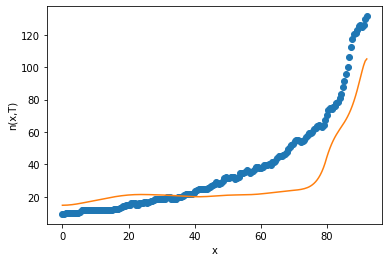

after perturb [8.926586972107382, 81.92127085904653, 28153.926641322578, -0.3125542958083687, 18.10241032811573]
parameters [8.926586972107382, 81.92127085904653, 28153.926641322578, -0.3125542958083687, 18.10241032811573]
after perturb [10.482876622133368, 64.18313213551207, 22761.110985498664, -0.41758964732493853, 13.798438538946275]
parameters [10.482876622133368, 64.18313213551207, 22761.110985498664, -0.41758964732493853, 13.798438538946275]
after perturb [6.419835943827, 79.8133580817843, 27204.68315236539, -0.8339871289977916, 15.57131726519225]
parameters [6.419835943827, 79.8133580817843, 27204.68315236539, -0.8339871289977916, 15.57131726519225]
after perturb [7.865730832787636, 64.04380414754152, 17241.692134842047, 0.3783796482530517, 55.2495309661511]
parameters [7.865730832787636, 64.04380414754152, 17241.692134842047, 0.3783796482530517, 55.2495309661511]
after perturb [2.1740811492988943, 115.1184059720188, 26082.83250022875, 1.8133619977226647, 54.0928559766164]
param

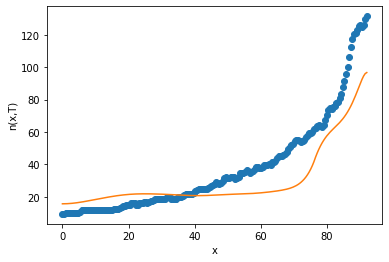

after perturb [4.68376576715894, 85.62341973077713, 18933.513425370653, 0.8603474578465301, 54.62546120545298]
parameters [4.68376576715894, 85.62341973077713, 18933.513425370653, 0.8603474578465301, 54.62546120545298]
after perturb [-2.831609431941282, 64.14392127684111, 17807.44582848447, 1.386473677064209, 26.578495120778143]
parameters [-2.831609431941282, 64.14392127684111, 17807.44582848447, 1.386473677064209, 26.578495120778143]
after perturb [6.116157119987465, 154.07776806387335, 24112.157892503976, 1.2212293390056492, 44.885115734093816]
parameters [6.116157119987465, 154.07776806387335, 24112.157892503976, 1.2212293390056492, 44.885115734093816]
after perturb [4.619297667444226, 150.1689414270636, 25456.668202966885, 1.3342068015419135, 16.0771578598713]
parameters [4.619297667444226, 150.1689414270636, 25456.668202966885, 1.3342068015419135, 16.0771578598713]
after perturb [3.933073528538955, 133.6672152950462, 23283.697005212023, 0.9332000571954082, 25.816581202232562]
par

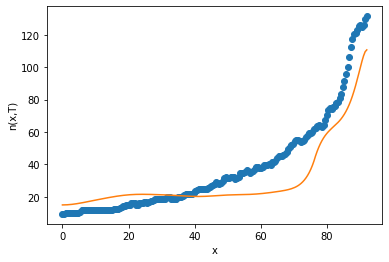

4
after perturb [7.250798587341954, 155.82157611304945, 30566.964527935103, 0.7617109090968697, 33.83105517418711]
parameters [7.250798587341954, 155.82157611304945, 30566.964527935103, 0.7617109090968697, 33.83105517418711]
after perturb [2.4304395260268645, 81.7852502004776, 27248.219674362896, 1.1495173060190416, 10.786680008676619]
parameters [2.4304395260268645, 81.7852502004776, 27248.219674362896, 1.1495173060190416, 10.786680008676619]
oxigeno [8.17008335e-17 8.32041436e-17 8.77703271e-17 9.55705164e-17
 1.06897945e-16 1.22180315e-16 1.41997842e-16 1.67107722e-16
 1.98476070e-16 2.37318693e-16 2.85152428e-16 3.43859276e-16
 4.15766088e-16 5.03743302e-16 6.11327046e-16 7.42870028e-16
 9.03727938e-16 1.10048976e-15 1.34126247e-15 1.63602302e-15
 1.99705406e-15 2.43948313e-15 2.98195074e-15 3.64743797e-15
 4.46429212e-15 5.46749802e-15 6.70025356e-15 8.21592260e-15
 1.00804551e-14 1.23753863e-14 1.52015533e-14 1.86836994e-14
 2.29761787e-14 2.82700215e-14 3.48016810e-14 4.28638575

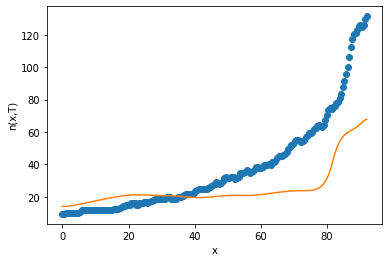

after perturb [1.266277873984186, 15.385501420890293, 31523.79910105271, -0.38473395058248233, -7.224387427564206]
parameters [1.266277873984186, 15.385501420890293, 31523.79910105271, -0.38473395058248233, -7.224387427564206]
after perturb [6.064501237371967, 81.72183753695015, 26555.920157754004, 0.7360670982263946, 26.151673064036796]
parameters [6.064501237371967, 81.72183753695015, 26555.920157754004, 0.7360670982263946, 26.151673064036796]
oxigeno [1.24202094e-13 1.25789201e-13 1.30592889e-13 1.38741466e-13
 1.50452857e-13 1.66040840e-13 1.85924046e-13 2.10637991e-13
 2.40850504e-13 2.77381019e-13 3.21224323e-13 3.73579468e-13
 4.35884744e-13 5.09859766e-13 5.97555964e-13 7.01417018e-13
 8.24351082e-13 9.69817005e-13 1.14192720e-12 1.34557027e-12
 1.58655723e-12 1.87179569e-12 2.20949739e-12 2.60942544e-12
 3.08318870e-12 3.64459246e-12 4.31005576e-12 5.09910825e-12
 6.03498139e-12 7.14531180e-12 8.46297777e-12 1.00270937e-11
 1.18841923e-11 1.40896283e-11 1.67092465e-11 1.982136

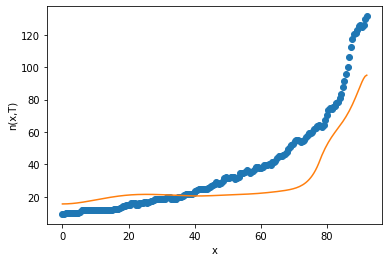

after perturb [-0.45929563462700607, 156.5962847022585, 18424.45739033336, 2.5948628794248085, 63.62915073467789]
parameters [-0.45929563462700607, 156.5962847022585, 18424.45739033336, 2.5948628794248085, 63.62915073467789]
after perturb [4.712621807725676, 132.77474559788084, 30027.16005853082, 0.8466751540994983, 20.06212542638989]
parameters [4.712621807725676, 132.77474559788084, 30027.16005853082, 0.8466751540994983, 20.06212542638989]
after perturb [1.760119917046266, 162.66454845846113, 23756.821817679745, 2.6412134873682445, 51.97647191514537]
parameters [1.760119917046266, 162.66454845846113, 23756.821817679745, 2.6412134873682445, 51.97647191514537]
after perturb [6.804035444853291, 152.53329622930096, 28497.700477034457, 0.8486007410989524, 21.648668322503127]
parameters [6.804035444853291, 152.53329622930096, 28497.700477034457, 0.8486007410989524, 21.648668322503127]
after perturb [5.765573607777505, 143.88985172459525, 23534.16278925348, 0.973360297288682, 8.983919152489

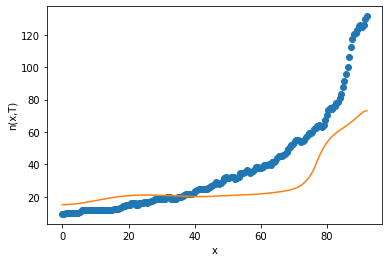

after perturb [10.489938468742194, 134.70286742879148, 23927.60022142274, 0.8070962984157679, 14.582203885533698]
parameters [10.489938468742194, 134.70286742879148, 23927.60022142274, 0.8070962984157679, 14.582203885533698]
after perturb [8.917357408640479, 172.42930604076292, 24487.40764195872, 1.3422553847856227, 35.764931095221705]
parameters [8.917357408640479, 172.42930604076292, 24487.40764195872, 1.3422553847856227, 35.764931095221705]
after perturb [3.4189603744088872, 155.10480780664022, 24995.228611937997, 2.153659607616121, 32.58406337136868]
parameters [3.4189603744088872, 155.10480780664022, 24995.228611937997, 2.153659607616121, 32.58406337136868]
after perturb [4.19823165508301, 94.43509731022868, 29415.49280343232, 0.2784575031768489, -13.617532490581766]
parameters [4.19823165508301, 94.43509731022868, 29415.49280343232, 0.2784575031768489, -13.617532490581766]
after perturb [4.693851306574863, 57.17580962197751, 31510.851999074042, -0.6410340467287317, -27.6794169495

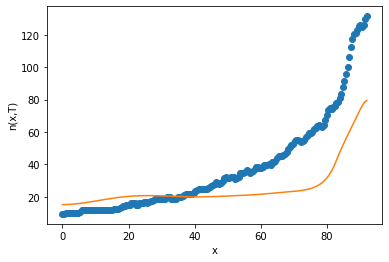

after perturb [1.3397376382901411, 133.22166673220116, 25791.8185136518, 1.8221637803270196, 64.0798721397706]
parameters [1.3397376382901411, 133.22166673220116, 25791.8185136518, 1.8221637803270196, 64.0798721397706]
after perturb [9.591569527206094, 87.95082661082026, 21679.226404836423, -0.8776710279738471, 26.225814230413736]
parameters [9.591569527206094, 87.95082661082026, 21679.226404836423, -0.8776710279738471, 26.225814230413736]
after perturb [-0.7509023425039243, 165.74836156200726, 18392.12347991487, 2.071518713104199, 43.1282008929041]
parameters [-0.7509023425039243, 165.74836156200726, 18392.12347991487, 2.071518713104199, 43.1282008929041]
after perturb [10.337461737931747, 85.27080953856864, 19446.158980432287, 1.2890621872445318, 25.496133556076398]
parameters [10.337461737931747, 85.27080953856864, 19446.158980432287, 1.2890621872445318, 25.496133556076398]
after perturb [5.02499682331135, 108.91240796134583, 17302.20497815666, 1.1839853376261493, 46.032182858733776

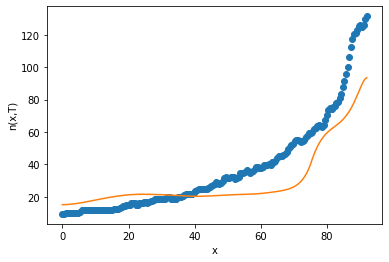

after perturb [-2.389048397715441, 63.74241220573515, 27641.511386174614, 0.03713627263786967, 12.407043428291246]
parameters [-2.389048397715441, 63.74241220573515, 27641.511386174614, 0.03713627263786967, 12.407043428291246]
after perturb [-2.050398273216345, 155.83728040258157, 25438.745102291265, 3.4557252315357996, 42.7463217339318]
parameters [-2.050398273216345, 155.83728040258157, 25438.745102291265, 3.4557252315357996, 42.7463217339318]
after perturb [-4.626916336174586, 57.84915684097351, 30268.6163411535, 1.253242730396782, 29.09871758141832]
parameters [-4.626916336174586, 57.84915684097351, 30268.6163411535, 1.253242730396782, 29.09871758141832]
after perturb [13.273966081786472, 61.07875628912626, 27494.951205386205, -0.3647179445855136, -26.92256381636332]
parameters [13.273966081786472, 61.07875628912626, 27494.951205386205, -0.3647179445855136, -26.92256381636332]
after perturb [6.8281186129811875, 116.9239069647301, 27648.442466283097, 1.072664896309766, 48.1720251883

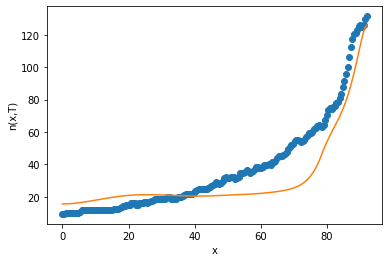

5
after perturb [-2.016305991014078, 116.58484558889278, 24020.02366418686, 1.7910662062780889, 67.71520680905705]
parameters [-2.016305991014078, 116.58484558889278, 24020.02366418686, 1.7910662062780889, 67.71520680905705]
after perturb [2.879337297150202, 168.25638356622784, 24184.691905885942, 1.9952379173398351, 22.025461421697976]
parameters [2.879337297150202, 168.25638356622784, 24184.691905885942, 1.9952379173398351, 22.025461421697976]
after perturb [5.129866751906691, 91.60113570388614, 22170.884937173218, -0.09244339212091957, 34.61906072621359]
parameters [5.129866751906691, 91.60113570388614, 22170.884937173218, -0.09244339212091957, 34.61906072621359]
after perturb [5.5750336580721545, 107.18421604566767, 29023.77443296705, 0.18845791639838286, -4.086069908618567]
parameters [5.5750336580721545, 107.18421604566767, 29023.77443296705, 0.18845791639838286, -4.086069908618567]
after perturb [7.556237990783817, 121.82614444515934, 24753.651088921226, 0.7222318333543292, 27.1

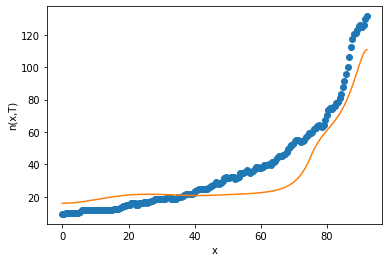

6
after perturb [4.38338093583565, 104.8068409816297, 27580.23696415475, 1.476994693141851, 22.101867378228807]
parameters [4.38338093583565, 104.8068409816297, 27580.23696415475, 1.476994693141851, 22.101867378228807]
oxigeno [1.98415519e-16 2.01838815e-16 2.12228027e-16 2.29945713e-16
 2.55611593e-16 2.90126405e-16 3.34706650e-16 3.90931650e-16
 4.60804857e-16 5.46831922e-16 6.52118740e-16 7.80493539e-16
 9.36658066e-16 1.12637417e-15 1.35669358e-15 1.63624055e-15
 1.97555930e-15 2.38754085e-15 2.88794761e-15 3.49605791e-15
 4.23545814e-15 5.13501651e-15 6.23008034e-15 7.56394844e-15
 9.18968220e-15 1.11723336e-14 1.35916863e-14 1.65456283e-14
 2.01543012e-14 2.45652052e-14 2.99594782e-14 3.65596180e-14
 4.46389768e-14 5.45334305e-14 6.66557156e-14 8.15130369e-14
 9.97286807e-14 1.22068533e-13 1.49473596e-13 1.83099849e-13
 2.24367061e-13 2.75018576e-13 3.37194451e-13 4.13520932e-13
 5.07219833e-13 6.22242212e-13 7.63431675e-13 9.36723798e-13
 1.14938960e-12 1.41033269e-12 1.73045186

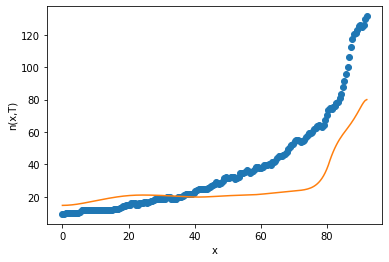

after perturb [11.050394384686426, 157.2995656058828, 19747.892713575882, 1.0056328198652416, 39.953826875584326]
parameters [11.050394384686426, 157.2995656058828, 19747.892713575882, 1.0056328198652416, 39.953826875584326]
after perturb [3.547763764322938, 167.65517473008836, 24399.249288393676, 2.053978837645632, 44.08369117550951]
parameters [3.547763764322938, 167.65517473008836, 24399.249288393676, 2.053978837645632, 44.08369117550951]
after perturb [4.1340762432603455, 67.87750514233184, 23051.835740572864, 0.6464991093618568, 34.28769184979061]
parameters [4.1340762432603455, 67.87750514233184, 23051.835740572864, 0.6464991093618568, 34.28769184979061]
oxigeno [3.19950608e-13 3.19971869e-13 3.20053683e-13 3.20250440e-13
 3.20653810e-13 3.21394348e-13 3.22643875e-13 3.24618780e-13
 3.27584423e-13 3.31860874e-13 3.37830240e-13 3.45945932e-13
 3.56744240e-13 3.70858683e-13 3.89037678e-13 4.12166166e-13
 4.41291982e-13 4.77657874e-13 5.22740302e-13 5.78296321e-13
 6.46420186e-13 7.

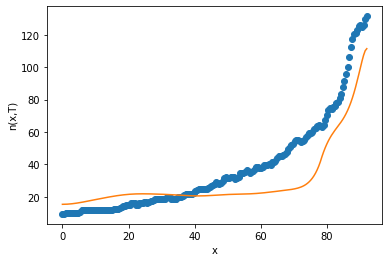

after perturb [3.644148069759563, 182.5400922106121, 25216.852065976447, 2.88917023064955, 53.6294063269482]
parameters [3.644148069759563, 182.5400922106121, 25216.852065976447, 2.88917023064955, 53.6294063269482]
after perturb [0.9149363354024675, 71.40071152009718, 22728.548781882193, -0.21039005936097488, 24.284561602053877]
parameters [0.9149363354024675, 71.40071152009718, 22728.548781882193, -0.21039005936097488, 24.284561602053877]
after perturb [6.454507354184475, 84.61437387298946, 21385.370172384675, 0.7110339727751823, -9.794059410701458]
parameters [6.454507354184475, 84.61437387298946, 21385.370172384675, 0.7110339727751823, -9.794059410701458]
after perturb [2.928881214721274, 154.87838652051278, 22482.008570416976, 2.235428629251796, 40.63835613187453]
parameters [2.928881214721274, 154.87838652051278, 22482.008570416976, 2.235428629251796, 40.63835613187453]
after perturb [5.3743682499732195, 153.56487701304997, 30138.55560264495, 0.42889451959175273, 4.044865129733253

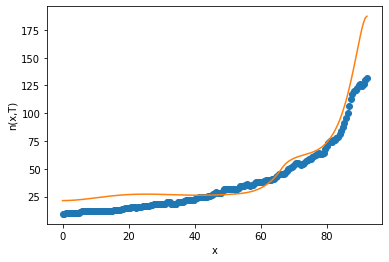

7
after perturb [-0.5009982441645995, 63.44577102729449, 19564.31884230883, 1.5349661392383682, 26.725188195117184]
parameters [-0.5009982441645995, 63.44577102729449, 19564.31884230883, 1.5349661392383682, 26.725188195117184]
after perturb [-3.648603141205798, 64.32844097898227, 22789.78688037085, 0.8705665430504436, 18.799594586061062]
parameters [-3.648603141205798, 64.32844097898227, 22789.78688037085, 0.8705665430504436, 18.799594586061062]
after perturb [11.326421707001625, 134.0184964588749, 26482.137689533494, 0.9758824540734881, 16.392361438143002]
parameters [11.326421707001625, 134.0184964588749, 26482.137689533494, 0.9758824540734881, 16.392361438143002]
after perturb [-2.6731258848991706, 153.47784468002192, 21929.546764876683, 2.3818378184043087, 58.26239408826175]
parameters [-2.6731258848991706, 153.47784468002192, 21929.546764876683, 2.3818378184043087, 58.26239408826175]
after perturb [9.7962114068171, 147.04343312480663, 21590.64538349972, 0.5968299498858383, 37.8174

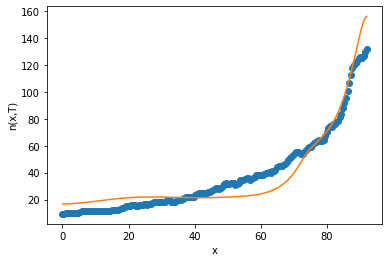

8
after perturb [4.127279742149886, 110.56275715365359, 21707.13319152091, 0.4036534729982213, 16.75834974365435]
parameters [4.127279742149886, 110.56275715365359, 21707.13319152091, 0.4036534729982213, 16.75834974365435]
oxigeno [1.05722118e-08 1.06149640e-08 1.07437477e-08 1.09601504e-08
 1.12668404e-08 1.16676008e-08 1.21673779e-08 1.27723433e-08
 1.34899732e-08 1.43291430e-08 1.53002400e-08 1.64152955e-08
 1.76881375e-08 1.91345667e-08 2.07725575e-08 2.26224875e-08
 2.47073974e-08 2.70532862e-08 2.96894446e-08 3.26488322e-08
 3.59685018e-08 3.96900788e-08 4.38603000e-08 4.85316195e-08
 5.37628900e-08 5.96201266e-08 6.61773642e-08 7.35176172e-08
 8.17339536e-08 9.09306955e-08 1.01224760e-07 1.12747154e-07
 1.25644640e-07 1.40081588e-07 1.56242041e-07 1.74331994e-07
 1.94581942e-07 2.17249687e-07 2.42623455e-07 2.71025350e-07
 3.02815164e-07 3.38394604e-07 3.78211960e-07 4.22767275e-07
 4.72618057e-07 5.28385610e-07 5.90762047e-07 6.60518055e-07
 7.38511512e-07 8.25697042e-07 9.2313

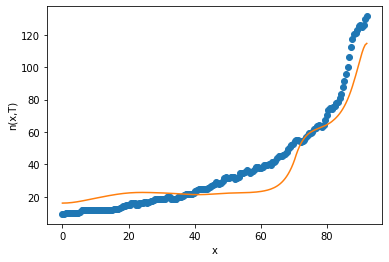

9
after perturb [0.4190792842011726, 150.42781513361874, 18429.220550639984, 2.0429937357124954, 37.243180627288446]
parameters [0.4190792842011726, 150.42781513361874, 18429.220550639984, 2.0429937357124954, 37.243180627288446]
after perturb [8.121472083788378, 116.65182807646403, 28453.58055825933, 1.3150329122189315, 52.47879084135207]
parameters [8.121472083788378, 116.65182807646403, 28453.58055825933, 1.3150329122189315, 52.47879084135207]
after perturb [1.775799221921499, 109.07955055012948, 30171.074199539, 0.8258255564589848, 24.93925387544753]
parameters [1.775799221921499, 109.07955055012948, 30171.074199539, 0.8258255564589848, 24.93925387544753]
after perturb [3.0451344928548068, 94.98672474000034, 29170.8507983097, 0.9154235399536772, 17.063782657409433]
parameters [3.0451344928548068, 94.98672474000034, 29170.8507983097, 0.9154235399536772, 17.063782657409433]
after perturb [3.1770253632870533, 155.97897091802142, 23233.018619241757, 1.1115904030669572, 31.49535651570967

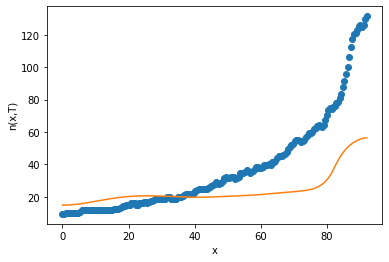

after perturb [-2.4790178513122174, 177.6733124610511, 16515.291456523675, 2.1830380778511507, 62.40227897024403]
parameters [-2.4790178513122174, 177.6733124610511, 16515.291456523675, 2.1830380778511507, 62.40227897024403]
after perturb [-5.9832342195549115, 65.22793552861074, 27215.40935567854, 1.199025833284375, 58.01388334268542]
parameters [-5.9832342195549115, 65.22793552861074, 27215.40935567854, 1.199025833284375, 58.01388334268542]
after perturb [4.742417963642103, 82.2633305456772, 30947.293294180607, 0.05467614409640098, 9.736010730631754]
parameters [4.742417963642103, 82.2633305456772, 30947.293294180607, 0.05467614409640098, 9.736010730631754]
after perturb [11.983823818431274, 58.19095772606845, 19859.22812550605, -0.7188767443723953, 17.638445093623467]
parameters [11.983823818431274, 58.19095772606845, 19859.22812550605, -0.7188767443723953, 17.638445093623467]
after perturb [1.9583492605805355, 125.84355958096047, 20165.3492667893, 0.9607865275206986, 37.483328886770

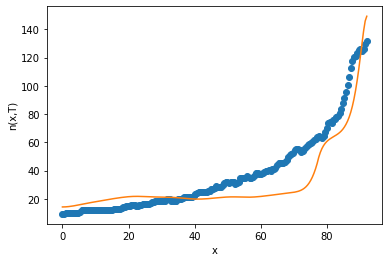

10
after perturb [7.2849436047928995, 66.76971002918863, 23998.063290146798, 0.5134132793139577, -4.869981522845004]
parameters [7.2849436047928995, 66.76971002918863, 23998.063290146798, 0.5134132793139577, -4.869981522845004]
after perturb [4.750466329281905, 74.40059856206585, 29113.423356490395, 0.21964664596082256, -27.28558866544931]
parameters [4.750466329281905, 74.40059856206585, 29113.423356490395, 0.21964664596082256, -27.28558866544931]
after perturb [9.653769757864307, 67.60354445858113, 30965.25239974233, -1.059565648239587, 4.232045562193093]
parameters [9.653769757864307, 67.60354445858113, 30965.25239974233, -1.059565648239587, 4.232045562193093]
after perturb [5.295923708943468, 121.30881087941484, 27872.05557920891, 1.424125851577432, 42.28019846941067]
parameters [5.295923708943468, 121.30881087941484, 27872.05557920891, 1.424125851577432, 42.28019846941067]
oxigeno [6.27825785e-15 6.36719873e-15 6.63657016e-15 7.09409967e-15
 7.75293965e-15 8.63208682e-15 9.7569893

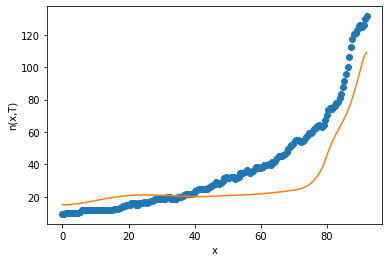

after perturb [4.5233698197605685, 141.19734974476555, 33368.70792972572, 0.6662482836954262, 2.6575303260934753]
parameters [4.5233698197605685, 141.19734974476555, 33368.70792972572, 0.6662482836954262, 2.6575303260934753]
after perturb [2.1625654116311392, 81.66335061662767, 24117.1169475632, 0.7744836666800968, 28.107790045226658]
parameters [2.1625654116311392, 81.66335061662767, 24117.1169475632, 0.7744836666800968, 28.107790045226658]
oxigeno [5.99566534e-14 6.07261049e-14 6.30555599e-14 6.70089841e-14
 7.26952208e-14 8.02714057e-14 8.99478818e-14 1.01994752e-13
 1.16750260e-13 1.34631247e-13 1.56145994e-13 1.81909836e-13
 2.12664034e-13 2.49298478e-13 2.92878943e-13 3.44679758e-13
 4.06222952e-13 4.79325152e-13 5.66153809e-13 6.69294621e-13
 7.91832466e-13 9.37448566e-13 1.11053717e-12 1.31634567e-12
 1.56114281e-12 1.85242044e-12 2.19913549e-12 2.61199980e-12
 3.10382730e-12 3.68994957e-12 4.38871330e-12 5.22207573e-12
 6.21631730e-12 7.40289457e-12 8.81946072e-12 1.05110855e-

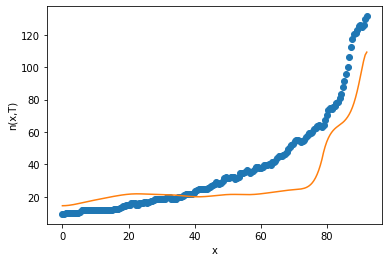

after perturb [3.0471313813023917, 47.08734344523251, 29358.851229723034, -0.3442308953465839, 1.0684162978802867]
parameters [3.0471313813023917, 47.08734344523251, 29358.851229723034, -0.3442308953465839, 1.0684162978802867]
after perturb [9.867481920112116, 59.06550224005446, 18913.751192511136, -0.2527983871524695, 17.04784973945774]
parameters [9.867481920112116, 59.06550224005446, 18913.751192511136, -0.2527983871524695, 17.04784973945774]
after perturb [4.782221052650425, 149.2235892376128, 17753.748833652924, 1.7802653406235291, 46.21224769958168]
parameters [4.782221052650425, 149.2235892376128, 17753.748833652924, 1.7802653406235291, 46.21224769958168]
after perturb [4.697330671773245, 81.53285162705235, 15848.86754793667, 1.3610780414583186, 15.885322453719969]
parameters [4.697330671773245, 81.53285162705235, 15848.86754793667, 1.3610780414583186, 15.885322453719969]
after perturb [8.044142954974177, 131.53615552364394, 25489.76219243357, 0.2038972146434206, 11.093801174323

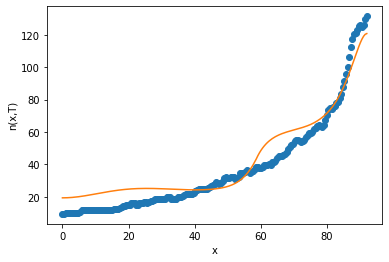

11
after perturb [4.6905454043207, 163.4386601592507, 28180.011075170303, 1.63924863576377, 43.351740025885604]
parameters [4.6905454043207, 163.4386601592507, 28180.011075170303, 1.63924863576377, 43.351740025885604]
after perturb [0.06839798135760256, 125.40743705596374, 17943.332050261582, 2.461855128971225, 74.28766299425254]
parameters [0.06839798135760256, 125.40743705596374, 17943.332050261582, 2.461855128971225, 74.28766299425254]
after perturb [3.63048862730123, 182.86751010012907, 23130.14700989081, 2.9646762260220223, 60.41257549469286]
parameters [3.63048862730123, 182.86751010012907, 23130.14700989081, 2.9646762260220223, 60.41257549469286]
after perturb [-0.2614091781484722, 127.63997803342302, 19951.61868580374, 1.7658654401834468, 47.46005879750737]
parameters [-0.2614091781484722, 127.63997803342302, 19951.61868580374, 1.7658654401834468, 47.46005879750737]
after perturb [8.035147445188013, 48.28668924307517, 27874.483654659998, -0.854227187802447, -8.843665239838735]


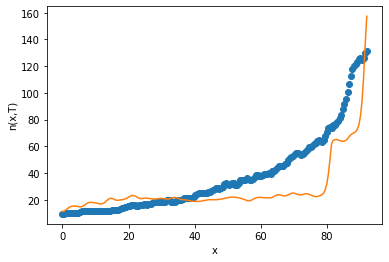

after perturb [5.696533323446267, 97.54988864777073, 30526.706150123202, 0.11841126143257995, -13.052681042980623]
parameters [5.696533323446267, 97.54988864777073, 30526.706150123202, 0.11841126143257995, -13.052681042980623]
after perturb [-3.288673525603381, 86.26527279587123, 28925.794774106107, 0.6174936212624815, 17.97191131982866]
parameters [-3.288673525603381, 86.26527279587123, 28925.794774106107, 0.6174936212624815, 17.97191131982866]
after perturb [2.612092573131097, 98.1204756257066, 18274.63469642326, 2.186452606666967, 46.251086975425956]
parameters [2.612092573131097, 98.1204756257066, 18274.63469642326, 2.186452606666967, 46.251086975425956]
after perturb [8.123875115087642, 123.73098991227317, 27896.653849122908, 1.7216801305707572, 46.32103797876246]
parameters [8.123875115087642, 123.73098991227317, 27896.653849122908, 1.7216801305707572, 46.32103797876246]
oxigeno [3.83471460e-16 3.89877132e-16 4.09308938e-16 4.42418961e-16
 4.90320009e-16 5.54625683e-16 6.37508623

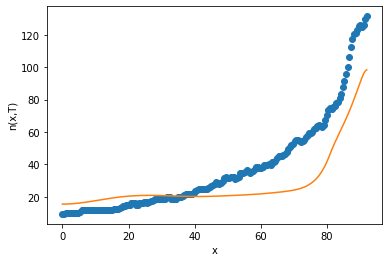

after perturb [-0.9288987962062869, 78.70772471491368, 25157.63083580864, 0.70629378659094, 17.687988006754196]
parameters [-0.9288987962062869, 78.70772471491368, 25157.63083580864, 0.70629378659094, 17.687988006754196]
after perturb [4.0602193431837685, 46.36753954415753, 26067.986748800613, 0.014541160953316923, 23.695282912627633]
parameters [4.0602193431837685, 46.36753954415753, 26067.986748800613, 0.014541160953316923, 23.695282912627633]
oxigeno [ 2.04149679  2.04112733  2.04002124  2.03818534  2.03563091  2.03237345
  2.02843246  2.02383114  2.01859603  2.01275661  2.00634494  1.99939523
  1.9919434   1.98402674  1.97568352  1.96695262  1.95787324  1.94848465
  1.93882592  1.92893572  1.9188522   1.90861278  1.89825412  1.88781196
  1.87732113  1.86681538  1.85632743  1.84588887  1.8355301   1.8252803
  1.81516735  1.8052178   1.79545675  1.78590784  1.77659312  1.76753301
  1.7587462   1.7502496   1.74205825  1.73418531  1.72664196  1.71943743
  1.71257896  1.70607186  1.6999

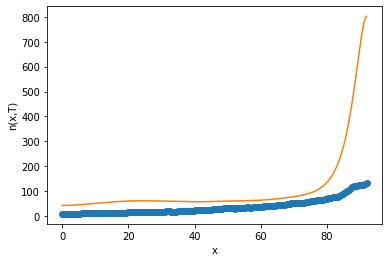

after perturb [10.583077646019227, 118.69179586878732, 23547.446417154984, 0.49702620400633657, 11.834173345315874]
parameters [10.583077646019227, 118.69179586878732, 23547.446417154984, 0.49702620400633657, 11.834173345315874]
after perturb [8.002497763246334, 174.41939297392946, 30405.070064978703, 1.0413115074659487, 23.815965326999354]
parameters [8.002497763246334, 174.41939297392946, 30405.070064978703, 1.0413115074659487, 23.815965326999354]
after perturb [-6.10987047603114, 110.5183446662363, 22763.429242194055, 2.0303660744467176, 48.73580199289279]
parameters [-6.10987047603114, 110.5183446662363, 22763.429242194055, 2.0303660744467176, 48.73580199289279]
after perturb [5.062481934858149, 75.94445315172909, 30808.289647358484, 0.0665168153767779, -17.48826163710434]
parameters [5.062481934858149, 75.94445315172909, 30808.289647358484, 0.0665168153767779, -17.48826163710434]
after perturb [5.543081841166474, 121.48531578456026, 21921.270413433023, 0.37765629643344534, 30.0298

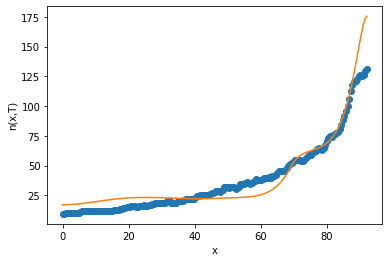

12
after perturb [-3.96346323518377, 172.74056115372363, 13500.192445832981, 3.128006609478282, 80.43294379132303]
parameters [-3.96346323518377, 172.74056115372363, 13500.192445832981, 3.128006609478282, 80.43294379132303]
after perturb [2.422699362311133, 68.14521781826062, 26652.864857469696, -0.13032181793383812, -24.80473157038453]
parameters [2.422699362311133, 68.14521781826062, 26652.864857469696, -0.13032181793383812, -24.80473157038453]
after perturb [0.9642099227931471, 70.21417556339443, 27425.82914533495, 0.18783669818628718, 15.854341743947945]
parameters [0.9642099227931471, 70.21417556339443, 27425.82914533495, 0.18783669818628718, 15.854341743947945]
oxigeno [3.35244494e-05 3.34942401e-05 3.34041464e-05 3.32557177e-05
 3.30513710e-05 3.27941795e-05 3.24876432e-05 3.21354808e-05
 3.17414767e-05 3.13093930e-05 3.08429414e-05 3.03457919e-05
 2.98215907e-05 2.92739614e-05 2.87064753e-05 2.81225889e-05
 2.75255630e-05 2.69183839e-05 2.63037095e-05 2.56838587e-05
 2.50608506

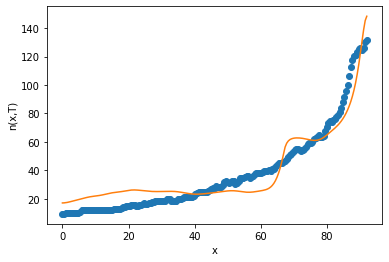

13
after perturb [5.760901095664399, 82.42456516273569, 30587.029475655123, 0.5300683180568888, 18.739558317297245]
parameters [5.760901095664399, 82.42456516273569, 30587.029475655123, 0.5300683180568888, 18.739558317297245]
after perturb [0.6443871029823534, 116.22432658418687, 27359.447503590673, 1.1621972438915336, 41.99140554478318]
parameters [0.6443871029823534, 116.22432658418687, 27359.447503590673, 1.1621972438915336, 41.99140554478318]
oxigeno [6.80190836e-14 6.87945737e-14 7.11430951e-14 7.51311468e-14
 8.08707226e-14 8.85211084e-14 9.82915949e-14 1.10445457e-13
 1.25305782e-13 1.43263941e-13 1.64791533e-13 1.90456544e-13
 2.20943993e-13 2.57080855e-13 2.99864417e-13 3.50493028e-13
 4.10398379e-13 4.81279376e-13 5.65139088e-13 6.64328060e-13
 7.81599176e-13 9.20180897e-13 1.08387681e-12 1.27719946e-12
 1.50554482e-12 1.77541023e-12 2.09465310e-12 2.47278259e-12
 2.92127311e-12 3.45389194e-12 4.08704337e-12 4.84014936e-12
 5.73610738e-12 6.80188355e-12 8.06930838e-12 9.57614

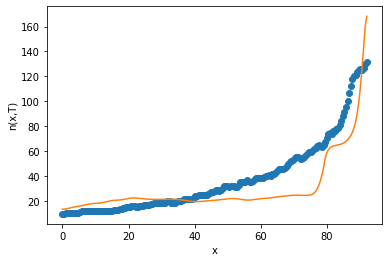

after perturb [2.600540735148466, 151.56007191190298, 24568.266921741983, 2.3938845588045137, 41.61627607689141]
parameters [2.600540735148466, 151.56007191190298, 24568.266921741983, 2.3938845588045137, 41.61627607689141]
after perturb [4.670095936593928, 126.30635494710116, 24898.534561517492, 0.2485813410070779, 25.18088878741825]
parameters [4.670095936593928, 126.30635494710116, 24898.534561517492, 0.2485813410070779, 25.18088878741825]
oxigeno [3.72509923e-06 3.72847828e-06 3.73865288e-06 3.75573556e-06
 3.77991427e-06 3.81145306e-06 3.85069304e-06 3.89805366e-06
 3.95403433e-06 4.01921654e-06 4.09426630e-06 4.17993723e-06
 4.27707412e-06 4.38661718e-06 4.50960697e-06 4.64719005e-06
 4.80062550e-06 4.97129227e-06 5.16069754e-06 5.37048606e-06
 5.60245056e-06 5.85854339e-06 6.14088925e-06 6.45179943e-06
 6.79378722e-06 7.16958493e-06 7.58216238e-06 8.03474705e-06
 8.53084592e-06 9.07426918e-06 9.66915574e-06 1.03200008e-05
 1.10316855e-05 1.18095088e-05 1.26592217e-05 1.35870636e-

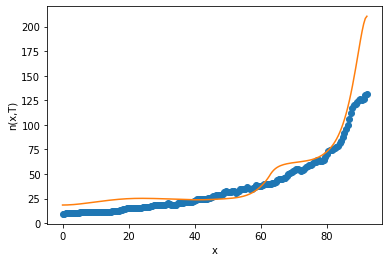

after perturb [-2.0573162197274018, 134.55677831328626, 17507.241440287024, 1.7998271263002752, 43.7584527513917]
parameters [-2.0573162197274018, 134.55677831328626, 17507.241440287024, 1.7998271263002752, 43.7584527513917]
after perturb [4.360083907359269, 142.8036216295622, 22390.314871569575, 1.3601992917333403, 41.3255563047029]
parameters [4.360083907359269, 142.8036216295622, 22390.314871569575, 1.3601992917333403, 41.3255563047029]
oxigeno [2.06369323e-13 2.08671116e-13 2.15629074e-13 2.27402320e-13
 2.44260737e-13 2.66592118e-13 2.94912445e-13 3.29879573e-13
 3.72310700e-13 4.23204088e-13 4.83765649e-13 5.55441114e-13
 6.39954695e-13 7.39355308e-13 8.56071674e-13 9.92977836e-13
 1.15347098e-12 1.34156375e-12 1.56199373e-12 1.82035326e-12
 2.12324323e-12 2.47845541e-12 2.89518853e-12 3.38430431e-12
 3.95863085e-12 4.63332213e-12 5.42628384e-12 6.35867783e-12
 7.45551931e-12 8.74638388e-12 1.02662441e-11 1.20564590e-11
 1.41659436e-11 1.66525513e-11 1.95847060e-11 2.30433279e-11

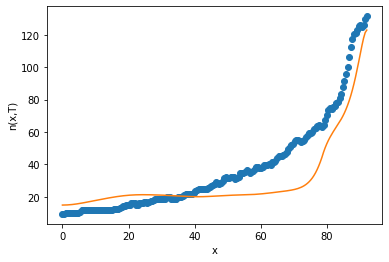

after perturb [-1.2857148944989598, 73.70414429215698, 26748.88624282545, 1.046729274158535, 39.54553221674166]
parameters [-1.2857148944989598, 73.70414429215698, 26748.88624282545, 1.046729274158535, 39.54553221674166]
after perturb [3.1782515471851283, 64.48957890003675, 30662.5645367482, 0.07917491403749508, 4.711550711617912]
parameters [3.1782515471851283, 64.48957890003675, 30662.5645367482, 0.07917491403749508, 4.711550711617912]
after perturb [5.614997206809653, 91.75025699579112, 26879.808404595446, 0.5842296067537902, 34.06051358276051]
parameters [5.614997206809653, 91.75025699579112, 26879.808404595446, 0.5842296067537902, 34.06051358276051]
oxigeno [1.77555797e-11 1.79012154e-11 1.83409527e-11 1.90833415e-11
 2.01428304e-11 2.15400694e-11 2.33023428e-11 2.54641418e-11
 2.80678903e-11 3.11648378e-11 3.48161412e-11 3.90941577e-11
 4.40839784e-11 4.98852349e-11 5.66142208e-11 6.44063720e-11
 7.34191637e-11 8.38354845e-11 9.58675649e-11 1.09761545e-10
 1.25802780e-10 1.443220

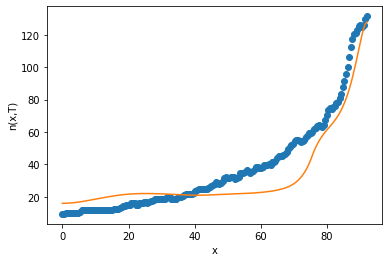

14
after perturb [11.088462067200132, 57.44396320952957, 28354.824662031428, 0.08085555836708908, 18.758844313908973]
parameters [11.088462067200132, 57.44396320952957, 28354.824662031428, 0.08085555836708908, 18.758844313908973]
after perturb [4.142509327844491, 74.79209412203309, 22829.54801050894, 0.8867438463294701, 49.60972930955077]
parameters [4.142509327844491, 74.79209412203309, 22829.54801050894, 0.8867438463294701, 49.60972930955077]
oxigeno [1.44867915e-15 1.47262722e-15 1.54528074e-15 1.66909734e-15
 1.84827304e-15 2.08889628e-15 2.39917171e-15 2.78972242e-15
 3.27398226e-15 3.86869321e-15 4.59452717e-15 5.47685624e-15
 6.54670120e-15 7.84189536e-15 9.40850908e-15 1.13025908e-14
 1.35922933e-14 1.63604683e-14 1.97078335e-14 2.37568360e-14
 2.86563674e-14 3.45875175e-14 4.17705966e-14 5.04737069e-14
 6.10232065e-14 7.38164817e-14 8.93375400e-14 1.08176043e-13
 1.31050537e-13 1.58836800e-13 1.92602423e-13 2.33648989e-13
 2.83563491e-13 3.44280997e-13 4.18160968e-13 5.0808017

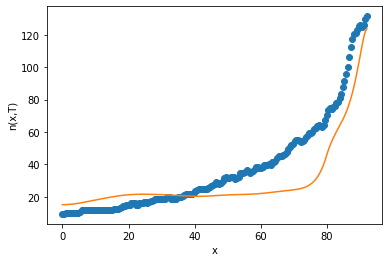

after perturb [1.0075570577068618, 145.64979229602412, 16222.70949570077, 2.85704557596957, 59.280561528450356]
parameters [1.0075570577068618, 145.64979229602412, 16222.70949570077, 2.85704557596957, 59.280561528450356]
after perturb [6.9930088317006875, 184.474370434941, 25272.82061980469, 2.0731427930918924, 71.97084803785337]
parameters [6.9930088317006875, 184.474370434941, 25272.82061980469, 2.0731427930918924, 71.97084803785337]
after perturb [5.283805493955941, 119.41993910245282, 25629.622490004327, 1.9404118003093611, 48.24952680694835]
parameters [5.283805493955941, 119.41993910245282, 25629.622490004327, 1.9404118003093611, 48.24952680694835]
oxigeno [2.23820000e-17 2.28035463e-17 2.40842081e-17 2.62727173e-17
 2.94525346e-17 3.37453149e-17 3.93159751e-17 4.63795886e-17
 5.52104179e-17 6.61534911e-17 7.96392435e-17 9.62018895e-17
 1.16502359e-16 1.41356842e-16 1.71772260e-16 2.08990277e-16
 2.54541910e-16 3.10315240e-16 3.78639411e-16 4.62388814e-16
 5.65112348e-16 6.911938

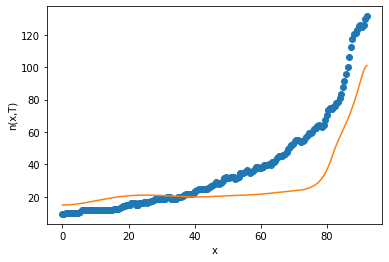

after perturb [11.154102435534517, 107.97257737149602, 26530.92426049638, -0.34543818124687675, 16.223392990685465]
parameters [11.154102435534517, 107.97257737149602, 26530.92426049638, -0.34543818124687675, 16.223392990685465]
after perturb [6.897740632235478, 78.47640162304062, 20115.88856566452, 0.293470716151215, 39.362827871133554]
parameters [6.897740632235478, 78.47640162304062, 20115.88856566452, 0.293470716151215, 39.362827871133554]
oxigeno [4.18522856e-07 4.18223383e-07 4.17327330e-07 4.15841774e-07
 4.13778423e-07 4.11153489e-07 4.07987521e-07 4.04305192e-07
 4.00135060e-07 3.95509295e-07 3.90463402e-07 3.85035930e-07
 3.79268175e-07 3.73203909e-07 3.66889116e-07 3.60371759e-07
 3.53701583e-07 3.46929958e-07 3.40109773e-07 3.33295381e-07
 3.26542605e-07 3.19908812e-07 3.13453048e-07 3.07236255e-07
 3.01321558e-07 2.95774640e-07 2.90664198e-07 2.86062497e-07
 2.82046018e-07 2.78696208e-07 2.76100353e-07 2.74352556e-07
 2.73554859e-07 2.73818505e-07 2.75265344e-07 2.78029426

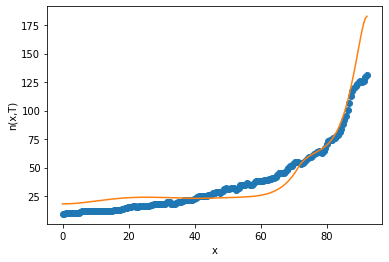

15
after perturb [4.973768524010664, 115.53391952882228, 29980.535271663724, 0.7256281104420138, 6.103131228945806]
parameters [4.973768524010664, 115.53391952882228, 29980.535271663724, 0.7256281104420138, 6.103131228945806]
after perturb [5.93732757813979, 62.90388044914287, 20567.887658726522, 0.32586032028893097, 34.28488810584895]
parameters [5.93732757813979, 62.90388044914287, 20567.887658726522, 0.32586032028893097, 34.28488810584895]
oxigeno [1.11794564e-07 1.11686096e-07 1.11361562e-07 1.10823549e-07
 1.10076322e-07 1.09125755e-07 1.07979233e-07 1.06645534e-07
 1.05134696e-07 1.03457867e-07 1.01627141e-07 9.96553980e-08
 9.75561303e-08 9.53432822e-08 9.30310897e-08 9.06339309e-08
 8.81661894e-08 8.56421306e-08 8.30757954e-08 8.04809092e-08
 7.78708097e-08 7.52583926e-08 7.26560746e-08 7.00757750e-08
 6.75289145e-08 6.50264306e-08 6.25788107e-08 6.01961410e-08
 5.78881716e-08 5.56643989e-08 5.35341635e-08 5.15067664e-08
 4.95916023e-08 4.77983127e-08 4.61369594e-08 4.46182204e

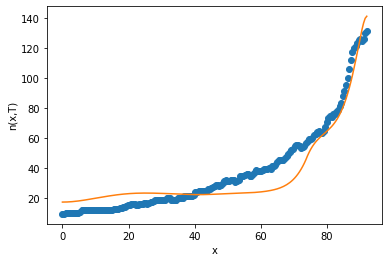

16
after perturb [12.192041777593067, 125.15401719823345, 25063.418883081056, 0.3505142529058354, 32.634052936463206]
parameters [12.192041777593067, 125.15401719823345, 25063.418883081056, 0.3505142529058354, 32.634052936463206]
after perturb [3.5676420391566213, 85.97757140802568, 15803.286600584866, 1.7340121992009543, 45.28115109008726]
parameters [3.5676420391566213, 85.97757140802568, 15803.286600584866, 1.7340121992009543, 45.28115109008726]
after perturb [6.330739951179587, 57.252166520699994, 24619.756271340113, 0.3468640104310988, 11.474545760687286]
parameters [6.330739951179587, 57.252166520699994, 24619.756271340113, 0.3468640104310988, 11.474545760687286]
oxigeno [2.93117310e-08 2.92810401e-08 2.91892186e-08 2.90370167e-08
 2.88256702e-08 2.85568803e-08 2.82327854e-08 2.78559265e-08
 2.74292071e-08 2.69558489e-08 2.64393438e-08 2.58834047e-08
 2.52919150e-08 2.46688789e-08 2.40183734e-08 2.33445022e-08
 2.26513533e-08 2.19429608e-08 2.12232707e-08 2.04961114e-08
 1.976517

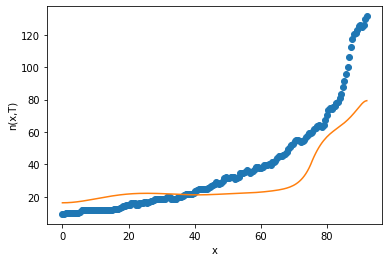

after perturb [7.646151153873822, 140.5285200575562, 29785.596835267937, 0.46168695459217934, -22.16714140079593]
parameters [7.646151153873822, 140.5285200575562, 29785.596835267937, 0.46168695459217934, -22.16714140079593]
after perturb [4.158046359978579, 168.6486807365685, 32165.670111335232, 1.0204825826877544, 20.631871837905038]
parameters [4.158046359978579, 168.6486807365685, 32165.670111335232, 1.0204825826877544, 20.631871837905038]
after perturb [6.988152103738759, 103.53328810769968, 25851.769976994885, 1.1597790652611573, 27.56372128040864]
parameters [6.988152103738759, 103.53328810769968, 25851.769976994885, 1.1597790652611573, 27.56372128040864]
oxigeno [8.99707392e-15 9.12863059e-15 9.52715526e-15 1.02043338e-14
 1.11800529e-14 1.24830307e-14 1.41517281e-14 1.62355741e-14
 1.87965447e-14 2.19111501e-14 2.56728984e-14 3.01953183e-14
 3.56156464e-14 4.20993045e-14 4.98453198e-14 5.90928774e-14
 7.01292278e-14 8.32992253e-14 9.90168260e-14 1.17778944e-13
 1.40182148e-13 

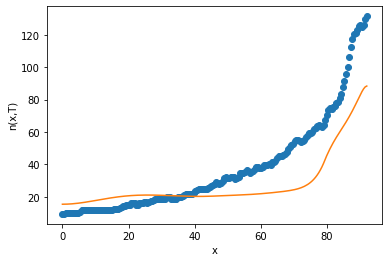

after perturb [-1.4364982897479237, 114.84463039149713, 21307.11776354307, 1.1713913583596214, 25.58745146166995]
parameters [-1.4364982897479237, 114.84463039149713, 21307.11776354307, 1.1713913583596214, 25.58745146166995]
after perturb [8.275406162472002, 125.19393427551297, 24016.518752622735, 1.9296726254174323, 53.607407630995155]
parameters [8.275406162472002, 125.19393427551297, 24016.518752622735, 1.9296726254174323, 53.607407630995155]
after perturb [-8.21109077153032, 129.27715961960766, 24202.076174630958, 1.1309271361737423, 29.071581131049655]
parameters [-8.21109077153032, 129.27715961960766, 24202.076174630958, 1.1309271361737423, 29.071581131049655]
after perturb [2.11335015384645, 148.94044035170745, 21737.199254075695, 1.8868419442542244, 65.18094591014803]
parameters [2.11335015384645, 148.94044035170745, 21737.199254075695, 1.8868419442542244, 65.18094591014803]
after perturb [4.266395925706917, 34.75310671359973, 27080.542496573784, -0.16399603613518599, 27.658786

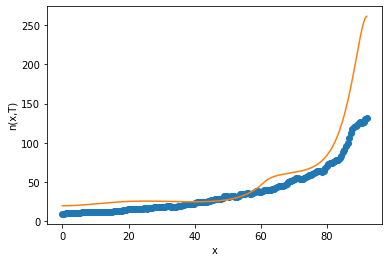

after perturb [11.501766094680379, 156.46865226348058, 23087.906630706104, 1.2357160791970803, 27.846589692886067]
parameters [11.501766094680379, 156.46865226348058, 23087.906630706104, 1.2357160791970803, 27.846589692886067]
after perturb [10.60201127294214, 126.97077416795238, 22719.987996025662, 1.5240358916757444, 37.77942779276685]
parameters [10.60201127294214, 126.97077416795238, 22719.987996025662, 1.5240358916757444, 37.77942779276685]
after perturb [0.6556168139211969, 155.40710000124704, 25273.899218930976, 1.1812467048967177, 29.786345099135346]
parameters [0.6556168139211969, 155.40710000124704, 25273.899218930976, 1.1812467048967177, 29.786345099135346]
after perturb [1.3135900422356683, 146.85868498016484, 21100.332807236293, 2.14932713987211, 54.42151347125112]
parameters [1.3135900422356683, 146.85868498016484, 21100.332807236293, 2.14932713987211, 54.42151347125112]
after perturb [6.2782763767141105, 101.83342910552145, 17975.175294950735, 1.3191303378686754, 39.2460

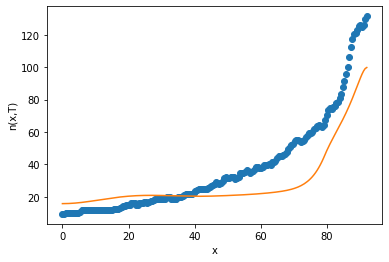

after perturb [2.8655552207398682, 113.01561957010807, 14271.198382246237, 2.290316890260214, 62.7267509648635]
parameters [2.8655552207398682, 113.01561957010807, 14271.198382246237, 2.290316890260214, 62.7267509648635]
after perturb [10.490150388464691, 159.02278889613527, 26880.05182784322, 0.870633512560231, 4.358625645200405]
parameters [10.490150388464691, 159.02278889613527, 26880.05182784322, 0.870633512560231, 4.358625645200405]
after perturb [6.1961395906710885, 203.7567255196443, 23049.499758167596, 1.9831916525056348, 55.30753176757784]
parameters [6.1961395906710885, 203.7567255196443, 23049.499758167596, 1.9831916525056348, 55.30753176757784]
after perturb [4.903532072746172, 62.77417377139338, 17406.430328591217, 0.5254859972618162, 47.44681430785754]
parameters [4.903532072746172, 62.77417377139338, 17406.430328591217, 0.5254859972618162, 47.44681430785754]
after perturb [-0.13556499225425145, 125.66284756930742, 24571.976447195084, 1.2450317127408943, 50.76918057145264

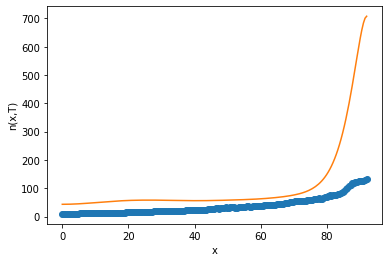

after perturb [3.306809813582394, 174.88912075445273, 23444.13639939816, 1.5547655014408472, 58.33947932832535]
parameters [3.306809813582394, 174.88912075445273, 23444.13639939816, 1.5547655014408472, 58.33947932832535]
after perturb [1.3033943965596642, 45.26017491410896, 19394.31487396174, 1.1863108465880603, 19.62267163649976]
parameters [1.3033943965596642, 45.26017491410896, 19394.31487396174, 1.1863108465880603, 19.62267163649976]
after perturb [3.8765818296990258, 147.59833071373896, 19123.090228577537, 2.4467618119808545, 42.402096835928134]
parameters [3.8765818296990258, 147.59833071373896, 19123.090228577537, 2.4467618119808545, 42.402096835928134]
after perturb [7.56375319574224, 137.89259414009084, 25584.682852870785, 1.8196495157461887, 45.03944202561628]
parameters [7.56375319574224, 137.89259414009084, 25584.682852870785, 1.8196495157461887, 45.03944202561628]
oxigeno [1.18968408e-15 1.20804896e-15 1.26371456e-15 1.35841298e-15
 1.49509589e-15 1.67803432e-15 1.91296330

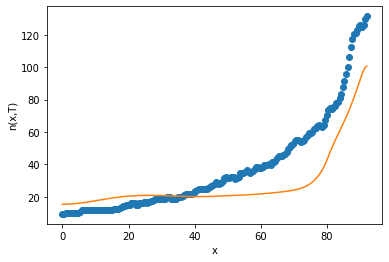

after perturb [5.370771086736303, 49.92075510797997, 18549.93939824637, -0.07495704760306965, 27.20039677036715]
parameters [5.370771086736303, 49.92075510797997, 18549.93939824637, -0.07495704760306965, 27.20039677036715]
after perturb [15.093993580802731, 131.06889487265707, 27945.256716031392, 0.5712049950738243, 16.09077601805588]
parameters [15.093993580802731, 131.06889487265707, 27945.256716031392, 0.5712049950738243, 16.09077601805588]
after perturb [-0.23816605941939262, 144.465195318044, 19658.230215912292, 2.0702114440443413, 48.21664659987762]
parameters [-0.23816605941939262, 144.465195318044, 19658.230215912292, 2.0702114440443413, 48.21664659987762]
after perturb [2.256573090156132, 111.02869962296539, 19324.3215320879, 1.6353474058349775, 40.3326661831596]
parameters [2.256573090156132, 111.02869962296539, 19324.3215320879, 1.6353474058349775, 40.3326661831596]
after perturb [9.818160485006823, 156.58400405711538, 29726.94178828805, 0.8322953492692569, 10.93434570998347

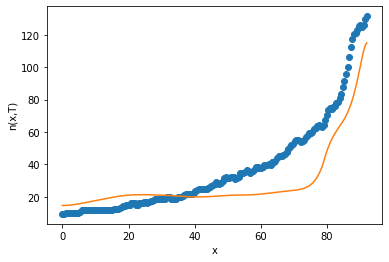

after perturb [4.904260221437724, 137.7869177507154, 26770.133643834317, 0.9239575360453347, 42.605784333927815]
parameters [4.904260221437724, 137.7869177507154, 26770.133643834317, 0.9239575360453347, 42.605784333927815]
oxigeno [1.93776914e-11 1.95398710e-11 2.00291901e-11 2.08540464e-11
 2.20286236e-11 2.35731781e-11 2.55144469e-11 2.78861862e-11
 3.07298519e-11 3.40954336e-11 3.80424623e-11 4.26412086e-11
 4.79740989e-11 5.41373780e-11 6.12430519e-11 6.94211524e-11
 7.88223702e-11 8.96211134e-11 1.02019054e-10 1.16249238e-10
 1.32580847e-10 1.51324714e-10 1.72839697e-10 1.97540069e-10
 2.25904047e-10 2.58483668e-10 2.95916192e-10 3.38937282e-10
 3.88396217e-10 4.45273448e-10 5.10700861e-10 5.85985114e-10
 6.72634548e-10 7.72390149e-10 8.87261191e-10 1.01956622e-09
 1.17198012e-09 1.34758827e-09 1.54994853e-09 1.78316256e-09
 2.05195744e-09 2.36177930e-09 2.71890059e-09 3.13054296e-09
 3.60501793e-09 4.15188803e-09 4.78215119e-09 5.50845190e-09
 6.34532282e-09 7.30946134e-09 8.4200

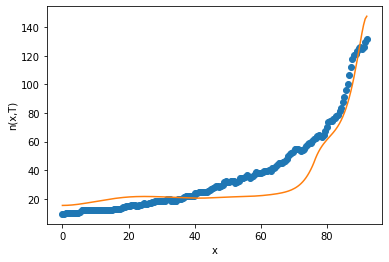

17
after perturb [10.54638662185461, 118.67577453732287, 21148.180611552543, 1.245943741061555, 20.346265521618996]
parameters [10.54638662185461, 118.67577453732287, 21148.180611552543, 1.245943741061555, 20.346265521618996]
after perturb [10.162931473641194, 182.33317753186657, 22738.5296746581, 2.4078993962576485, 65.30741173509776]
parameters [10.162931473641194, 182.33317753186657, 22738.5296746581, 2.4078993962576485, 65.30741173509776]
after perturb [15.969353375463257, 148.42676778481191, 24661.60880973215, 1.9347025686024608, 71.76448414902298]
parameters [15.969353375463257, 148.42676778481191, 24661.60880973215, 1.9347025686024608, 71.76448414902298]
after perturb [5.395678645659423, 192.3842717196418, 27110.47513501394, 2.298882127514551, 29.686312568057897]
parameters [5.395678645659423, 192.3842717196418, 27110.47513501394, 2.298882127514551, 29.686312568057897]
after perturb [7.974008669914902, 207.04439301402687, 25628.84603392908, 2.5293282402647197, 58.26684087797496]

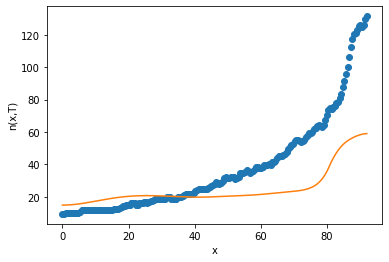

after perturb [10.262948678162601, 77.61598107537208, 33190.66962361497, -0.11007877344321726, 4.531139958872739]
parameters [10.262948678162601, 77.61598107537208, 33190.66962361497, -0.11007877344321726, 4.531139958872739]
after perturb [13.956367536766091, 127.96483925405464, 29713.971318169886, 1.005540375193253, 32.47074629322363]
parameters [13.956367536766091, 127.96483925405464, 29713.971318169886, 1.005540375193253, 32.47074629322363]
after perturb [3.0582200661566423, 89.55861385382084, 20081.175366095784, 1.1652494277598144, 35.66711347807597]
parameters [3.0582200661566423, 89.55861385382084, 20081.175366095784, 1.1652494277598144, 35.66711347807597]
oxigeno [5.50439457e-16 5.59657651e-16 5.87625453e-16 6.35294469e-16
 7.04291025e-16 7.96978261e-16 9.16546430e-16 1.06713490e-15
 1.25399060e-15 1.48366920e-15 1.76428685e-15 2.10583245e-15
 2.52055302e-15 3.02342736e-15 3.63274733e-15 4.37083009e-15
 5.26489064e-15 6.34811017e-15 7.66094467e-15 9.25272796e-15
 1.11836359e-14 

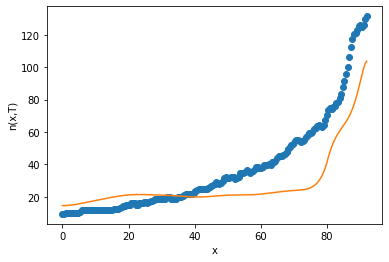

after perturb [6.444258723476495, 110.150768421453, 25715.911085060987, -0.46734907869976516, -1.7371694026630564]
parameters [6.444258723476495, 110.150768421453, 25715.911085060987, -0.46734907869976516, -1.7371694026630564]
after perturb [10.517659495501515, 140.84632398032065, 27751.54125805007, 1.2829293673446542, 73.35912890020279]
parameters [10.517659495501515, 140.84632398032065, 27751.54125805007, 1.2829293673446542, 73.35912890020279]
after perturb [-1.9824274416057186, 76.8998705307061, 25925.21165905258, 1.2213477871704126, 17.949959840995305]
parameters [-1.9824274416057186, 76.8998705307061, 25925.21165905258, 1.2213477871704126, 17.949959840995305]
after perturb [5.940436040612438, 90.9678408236536, 26410.475650385946, 0.034024269735690615, 43.570073337642825]
parameters [5.940436040612438, 90.9678408236536, 26410.475650385946, 0.034024269735690615, 43.570073337642825]
oxigeno [ 0.74037598  0.74021649  0.73973884  0.73894551  0.73784063  0.73642989
  0.73472052  0.73272

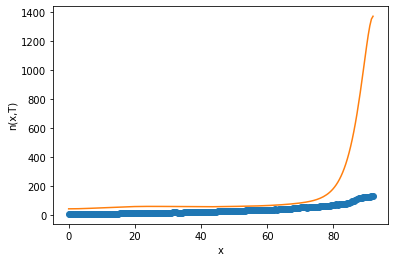

after perturb [8.562437507395465, 110.23714748538879, 27756.182607355644, 0.006711074359931124, 1.730576370394047]
parameters [8.562437507395465, 110.23714748538879, 27756.182607355644, 0.006711074359931124, 1.730576370394047]
oxigeno [ 1.17832293  1.17829373  1.17820631  1.17806126  1.17785953  1.17760243
  1.17729167  1.1769293   1.17651773  1.17605971  1.17555832  1.17501697
  1.17443936  1.1738295   1.17319167  1.17253041  1.17185051  1.17115702
  1.17045518  1.16975045  1.16904851  1.1683552   1.16767653  1.16701869
  1.166388    1.16579094  1.16523412  1.16472428  1.16426827  1.16387309
  1.16354581  1.16329364  1.16312389  1.16304399  1.16306146  1.16318397
  1.16341927  1.16377525  1.16425992  1.16488144  1.1656481   1.16656836
  1.16765082  1.16890427  1.17033771  1.17196033  1.17378153  1.17581098
  1.17805859  1.18053454  1.18324932  1.18621374  1.18943895  1.19293644
  1.19671813  1.2007963   1.2051837   1.20989353  1.21493945  1.22033566
  1.22609689  1.23223841  1.2387761

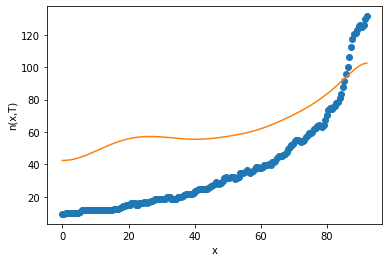

after perturb [2.367472825173606, 58.66775344169914, 28764.104520962424, 0.6976757693210702, 19.889071406476376]
parameters [2.367472825173606, 58.66775344169914, 28764.104520962424, 0.6976757693210702, 19.889071406476376]
oxigeno [4.87908304e-14 4.87094257e-14 4.84669955e-14 4.80688497e-14
 4.75237027e-14 4.68434869e-14 4.60431226e-14 4.51402704e-14
 4.41550991e-14 4.31100984e-14 4.20299701e-14 4.09416271e-14
 3.98743289e-14 3.88599826e-14 3.79336358e-14 3.71341936e-14
 3.65053918e-14 3.60970677e-14 3.59667796e-14 3.61818358e-14
 3.68218151e-14 3.79816787e-14 3.97756019e-14 4.23416856e-14
 4.58477501e-14 5.04984594e-14 5.65440848e-14 6.42912912e-14
 7.41164132e-14 8.64818004e-14 1.01955942e-13 1.21238241e-13
 1.45189517e-13 1.74869540e-13 2.11583211e-13 2.56937344e-13
 3.12910435e-13 3.81938306e-13 4.67019124e-13 5.71842010e-13
 7.00944360e-13 8.59904016e-13 1.05557374e-12 1.29636705e-12
 1.59260629e-12 1.95694649e-12 2.40489103e-12 2.95541935e-12
 3.63175093e-12 4.46227546e-12 5.4816

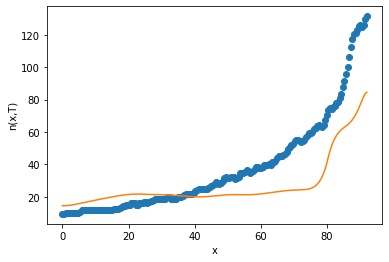

after perturb [3.7872908061444654, 164.50845302897352, 16819.492495364513, 1.4800923323552762, 58.733070092333676]
parameters [3.7872908061444654, 164.50845302897352, 16819.492495364513, 1.4800923323552762, 58.733070092333676]
after perturb [6.516233434342013, 170.57515487916112, 26191.07040087441, 1.8988785152132073, 49.40864203271113]
parameters [6.516233434342013, 170.57515487916112, 26191.07040087441, 1.8988785152132073, 49.40864203271113]
after perturb [2.4808456880928134, 143.9895042276696, 20792.067344461357, 2.702215100112575, 61.73946226853511]
parameters [2.4808456880928134, 143.9895042276696, 20792.067344461357, 2.702215100112575, 61.73946226853511]
after perturb [0.4476880686433198, 63.611989429922964, 22158.577184379046, 1.620659387144927, 58.59856406187024]
parameters [0.4476880686433198, 63.611989429922964, 22158.577184379046, 1.620659387144927, 58.59856406187024]
after perturb [5.556539120978644, 77.87074834005685, 21115.16297275309, 0.4978031002122665, 48.2137552499604

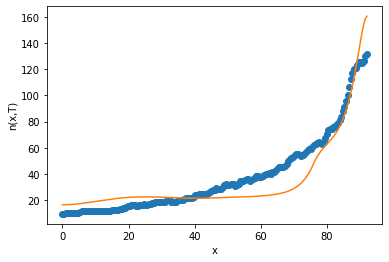

18
after perturb [2.0055288341713395, 176.7678360423704, 20039.72949205983, 2.6312455671166, 57.17928206768056]
parameters [2.0055288341713395, 176.7678360423704, 20039.72949205983, 2.6312455671166, 57.17928206768056]
after perturb [0.6517101642922718, 82.5010330307553, 21788.421972779634, 1.1208822355500412, 38.14426756072765]
parameters [0.6517101642922718, 82.5010330307553, 21788.421972779634, 1.1208822355500412, 38.14426756072765]
oxigeno [2.08314281e-16 2.11816734e-16 2.22458946e-16 2.40650504e-16
 2.67090682e-16 3.02793161e-16 3.49120923e-16 4.07833061e-16
 4.81147182e-16 5.71823265e-16 6.83276573e-16 8.19727875e-16
 9.86398393e-16 1.18975446e-15 1.43780390e-15 1.74044391e-15
 2.10986121e-15 2.56099019e-15 3.11204546e-15 3.78516095e-15
 4.60718760e-15 5.61072462e-15 6.83548191e-15 8.33008925e-15
 1.01544739e-14 1.23829156e-14 1.51078547e-14 1.84444834e-14
 2.25361188e-14 2.75603735e-14 3.37362364e-14 4.13323764e-14
 5.06772607e-14 6.21719950e-14 7.63070788e-14 9.36844681e-14
 1.1

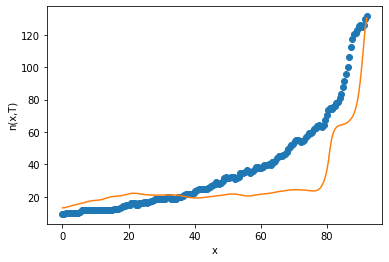

after perturb [12.99302925398127, 210.93459879241232, 30081.68411030708, 2.0054313908665944, 28.807526345739497]
parameters [12.99302925398127, 210.93459879241232, 30081.68411030708, 2.0054313908665944, 28.807526345739497]
after perturb [10.906872468422542, 96.03952761459524, 23096.350024814416, 0.06559388262923788, 24.38772606794475]
parameters [10.906872468422542, 96.03952761459524, 23096.350024814416, 0.06559388262923788, 24.38772606794475]
after perturb [2.189980934942251, 112.1037771844344, 20916.997164941575, 1.1264090933510138, 41.65649239408148]
parameters [2.189980934942251, 112.1037771844344, 20916.997164941575, 1.1264090933510138, 41.65649239408148]
oxigeno [5.81757713e-14 5.88870746e-14 6.10391078e-14 6.46867941e-14
 6.99235305e-14 7.68840252e-14 8.57483716e-14 9.67474682e-14
 1.10169930e-13 1.26370687e-13 1.45781504e-13 1.68923743e-13
 1.96423724e-13 2.29031160e-13 2.67641217e-13 3.13320887e-13
 3.67340506e-13 4.31211435e-13 5.06731113e-13 5.96037000e-13
 7.01671170e-13 8.

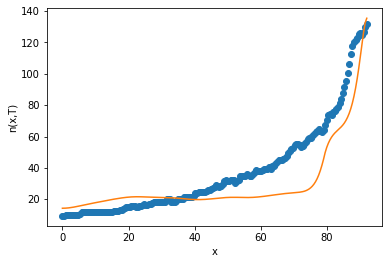

after perturb [10.459588717741067, 81.04432633421109, 21162.094335963844, 0.5243954069366602, 36.390882960843314]
parameters [10.459588717741067, 81.04432633421109, 21162.094335963844, 0.5243954069366602, 36.390882960843314]
after perturb [-1.0055470209610018, 123.80220582897256, 18042.966964402276, 1.7361584120963445, 36.53009817054817]
parameters [-1.0055470209610018, 123.80220582897256, 18042.966964402276, 1.7361584120963445, 36.53009817054817]
after perturb [6.612314378334043, 159.35364185236892, 18293.231057630353, 2.6476140160038, 72.08561559578987]
parameters [6.612314378334043, 159.35364185236892, 18293.231057630353, 2.6476140160038, 72.08561559578987]
after perturb [2.947204668140578, 172.22034870718068, 27123.36535006051, 2.469258315170805, 59.055774376676]
parameters [2.947204668140578, 172.22034870718068, 27123.36535006051, 2.469258315170805, 59.055774376676]
after perturb [-2.786829565665092, 104.99070314595102, 21983.593064728546, 1.525897545463251, 44.34357289308787]
par

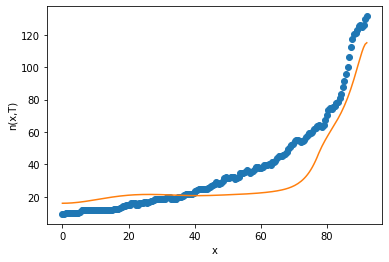

19
after perturb [17.488949047782725, 141.65289622947918, 27514.013422184547, 0.91078952297447, 58.40602293191816]
parameters [17.488949047782725, 141.65289622947918, 27514.013422184547, 0.91078952297447, 58.40602293191816]
after perturb [6.837389557166203, 74.22170512972237, 20448.389893490545, 0.6719291129860904, 41.68093371247734]
parameters [6.837389557166203, 74.22170512972237, 20448.389893490545, 0.6719291129860904, 41.68093371247734]
oxigeno [1.59164153e-13 1.60234483e-13 1.63478558e-13 1.68996555e-13
 1.76958567e-13 1.87609406e-13 2.01275540e-13 2.18374385e-13
 2.39426258e-13 2.65069356e-13 2.96078261e-13 3.33386525e-13
 3.78114089e-13 4.31600367e-13 4.95444060e-13 5.71550947e-13
 6.62191152e-13 7.70067699e-13 8.98398487e-13 1.05101427e-12
 1.23247571e-12 1.44821314e-12 1.70469349e-12 2.00961941e-12
 2.37216697e-12 2.80326924e-12 3.31595453e-12 3.92574974e-12
 4.65116121e-12 5.51424797e-12 6.54130464e-12 7.76367502e-12
 9.21872085e-12 1.09509750e-11 1.30135134e-11 1.54695878e-1

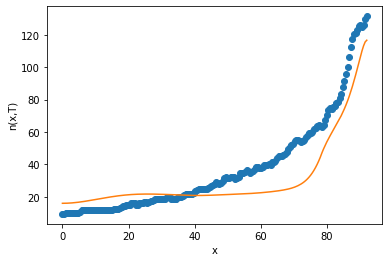

20
parameters [7.443356578122519, 81.15916314488575, 25389.657468036345, 0.4733620148162019, 34.387070775097506]
parameters [8.857241170299153, 71.62628024057796, 28958.61012411154, 0.308240103959071, 16.940529487958187]
parameters [9.393708855144533, 146.2816030764844, 25435.097882696264, 0.7566116987630696, 48.47317689556676]
parameters [3.933073528538955, 133.6672152950462, 23283.697005212023, 0.9332000571954082, 25.816581202232562]
parameters [6.8281186129811875, 116.9239069647301, 27648.442466283097, 1.072664896309766, 48.172025188303564]
parameters [7.556237990783817, 121.82614444515934, 24753.651088921226, 0.7222318333543292, 27.105514817141106]
parameters [7.7403721257573626, 66.04382986234137, 22863.719473399506, 0.1692382649208859, 31.01144552178656]
parameters [9.7962114068171, 147.04343312480663, 21590.64538349972, 0.5968299498858383, 37.81744610054049]
parameters [4.127279742149886, 110.56275715365359, 21707.13319152091, 0.4036534729982213, 16.75834974365435]
parameters [1

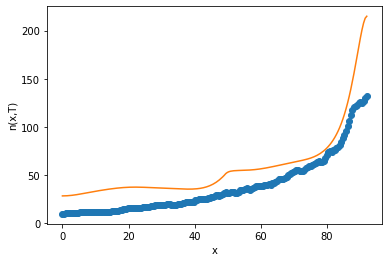

after perturb [4.943307141535123, 138.30167401127298, 27103.192289704657, 1.3753174455193509, 48.23831978244806]
parameters [4.943307141535123, 138.30167401127298, 27103.192289704657, 1.3753174455193509, 48.23831978244806]
oxigeno [1.00735963e-13 1.01918237e-13 1.05493328e-13 1.11546813e-13
 1.20223913e-13 1.31733460e-13 1.46353606e-13 1.64439446e-13
 1.86432758e-13 2.12874164e-13 2.44418037e-13 2.81850610e-13
 3.26111799e-13 3.78321384e-13 4.39810317e-13 5.12158077e-13
 5.97237177e-13 6.97266144e-13 8.14872549e-13 9.53167956e-13
 1.11583705e-12 1.30724358e-12 1.53255631e-12 1.79789872e-12
 2.11052699e-12 2.47904143e-12 2.91363784e-12 3.42640611e-12
 4.03168492e-12 4.74648298e-12 5.59097908e-12 6.58911566e-12
 7.76930279e-12 9.16525304e-12 1.08169710e-11 1.27719252e-11
 1.50864366e-11 1.78273201e-11 2.10738281e-11 2.49199467e-11
 2.94771100e-11 3.48774051e-11 4.12773568e-11 4.88623939e-11
 5.78521179e-11 6.85065169e-11 8.11332927e-11 9.60964963e-11
 1.13826706e-10 1.34833017e-10 1.5971

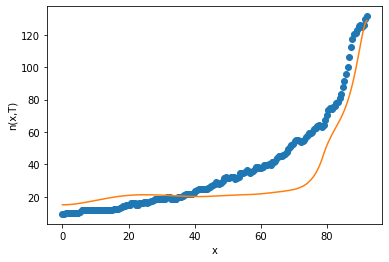

after perturb [6.815130396034025, 93.09686472164529, 28320.237602284327, 0.4909971160647089, 8.757748580687437]
parameters [6.815130396034025, 93.09686472164529, 28320.237602284327, 0.4909971160647089, 8.757748580687437]
oxigeno [1.57029920e-10 1.57882722e-10 1.60456350e-10 1.64796733e-10
 1.70981323e-10 1.79120454e-10 1.89359297e-10 2.01880427e-10
 2.16907072e-10 2.34707089e-10 2.55597755e-10 2.79951465e-10
 3.08202440e-10 3.40854584e-10 3.78490627e-10 4.21782743e-10
 4.71504830e-10 5.28546696e-10 5.93930405e-10 6.68829110e-10
 7.54588699e-10 8.52752678e-10 9.65090739e-10 1.09363154e-09
 1.24070033e-09 1.40896199e-09 1.60147050e-09 1.82172540e-09
 2.07373659e-09 2.36209833e-09 2.69207396e-09 3.06969264e-09
 3.50185998e-09 3.99648423e-09 4.56262046e-09 5.21063484e-09
 5.95239214e-09 6.80146932e-09 7.77339879e-09 8.88594554e-09
 1.01594224e-08 1.16170488e-08 1.32853587e-08 1.51946643e-08
 1.73795831e-08 1.98796364e-08 2.27399294e-08 2.60119224e-08
 2.97543072e-08 3.40339999e-08 3.892726

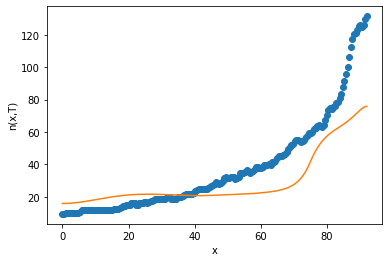

after perturb [8.957394465005024, 142.8256490549772, 18199.02327929776, 0.22982066370633225, 26.112907179644193]
parameters [8.957394465005024, 142.8256490549772, 18199.02327929776, 0.22982066370633225, 26.112907179644193]
after perturb [10.040208503796446, 214.16152980757306, 20767.154877111294, 1.4166669643776506, 62.37644808987583]
parameters [10.040208503796446, 214.16152980757306, 20767.154877111294, 1.4166669643776506, 62.37644808987583]
after perturb [4.046310126479122, 83.44693263570882, 21720.22480090817, 0.4832136122183033, 15.9207567681846]
parameters [4.046310126479122, 83.44693263570882, 21720.22480090817, 0.4832136122183033, 15.9207567681846]
oxigeno [1.51834380e-10 1.52017062e-10 1.52572060e-10 1.53520319e-10
 1.54897067e-10 1.56752298e-10 1.59151481e-10 1.62176508e-10
 1.65926921e-10 1.70521448e-10 1.76099906e-10 1.82825502e-10
 1.90887626e-10 2.00505166e-10 2.11930464e-10 2.25453980e-10
 2.41409778e-10 2.60181953e-10 2.82212154e-10 3.08008342e-10
 3.38154989e-10 3.7332

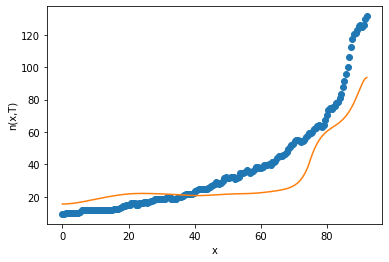

after perturb [10.307426422938574, 161.02771387069782, 19890.129032971177, 1.153041113540405, 60.67655356886803]
parameters [10.307426422938574, 161.02771387069782, 19890.129032971177, 1.153041113540405, 60.67655356886803]
after perturb [4.099645089115507, 141.65177431025097, 22305.61533098801, 0.4089137204932609, 32.92222088313797]
parameters [4.099645089115507, 141.65177431025097, 22305.61533098801, 0.4089137204932609, 32.92222088313797]
oxigeno [9.53193443e-08 9.56907362e-08 9.68081043e-08 9.86810609e-08
 1.01325740e-07 1.04764969e-07 1.09028508e-07 1.14153366e-07
 1.20184182e-07 1.27173691e-07 1.35183262e-07 1.44283525e-07
 1.54555087e-07 1.66089338e-07 1.78989368e-07 1.93370995e-07
 2.09363908e-07 2.27112960e-07 2.46779592e-07 2.68543435e-07
 2.92604079e-07 3.19183049e-07 3.48525993e-07 3.80905106e-07
 4.16621818e-07 4.56009763e-07 4.99438063e-07 5.47314940e-07
 6.00091703e-07 6.58267126e-07 7.22392254e-07 7.93075675e-07
 8.70989286e-07 9.56874600e-07 1.05154963e-06 1.15591637e-06

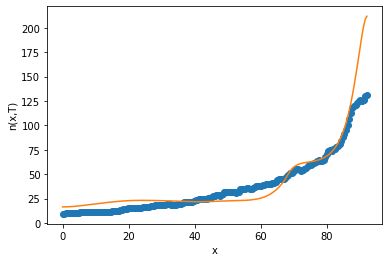

after perturb [8.807524050685576, 120.61333487262876, 26505.58304041089, 0.0725969695563887, 5.467206429667936]
parameters [8.807524050685576, 120.61333487262876, 26505.58304041089, 0.0725969695563887, 5.467206429667936]
oxigeno [6.21842837e-03 6.21778393e-03 6.21585915e-03 6.21267964e-03
 6.20828798e-03 6.20274350e-03 6.19612205e-03 6.18851564e-03
 6.18003213e-03 6.17079475e-03 6.16094167e-03 6.15062548e-03
 6.14001271e-03 6.12928328e-03 6.11863000e-03 6.10825806e-03
 6.09838452e-03 6.08923788e-03 6.08105763e-03 6.07409389e-03
 6.06860707e-03 6.06486760e-03 6.06315575e-03 6.06376145e-03
 6.06698423e-03 6.07313325e-03 6.08252732e-03 6.09549509e-03
 6.11237526e-03 6.13351690e-03 6.15927977e-03 6.19003485e-03
 6.22616479e-03 6.26806455e-03 6.31614208e-03 6.37081901e-03
 6.43253154e-03 6.50173125e-03 6.57888611e-03 6.66448147e-03
 6.75902119e-03 6.86302879e-03 6.97704873e-03 7.10164773e-03
 7.23741616e-03 7.38496960e-03 7.54495043e-03 7.71802953e-03
 7.90490816e-03 8.10631988e-03 8.323032

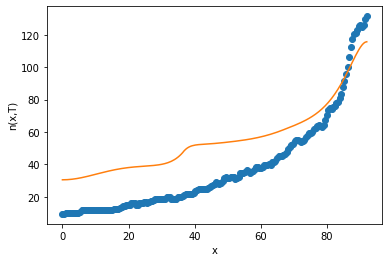

after perturb [11.154488224263986, 19.52215391086657, 25438.5098424943, -0.06396336423019422, 17.87011351177915]
parameters [11.154488224263986, 19.52215391086657, 25438.5098424943, -0.06396336423019422, 17.87011351177915]
after perturb [0.5864101812437698, 58.499157787403476, 32572.191590420283, -0.08168044478241343, -9.18486204051085]
parameters [0.5864101812437698, 58.499157787403476, 32572.191590420283, -0.08168044478241343, -9.18486204051085]
after perturb [8.582047913529507, 80.71586045630401, 20867.40320081911, 0.44062465735719825, 27.20272909699852]
parameters [8.582047913529507, 80.71586045630401, 20867.40320081911, 0.44062465735719825, 27.20272909699852]
oxigeno [7.08592875e-10 7.08611837e-10 7.08683410e-10 7.08851795e-10
 7.09191169e-10 7.09806462e-10 7.10834484e-10 7.12445441e-10
 7.14844893e-10 7.18276207e-10 7.23023594e-10 7.29415806e-10
 7.37830595e-10 7.48700068e-10 7.62517051e-10 7.79842631e-10
 8.01315047e-10 8.27660131e-10 8.59703521e-10 8.98384920e-10
 9.44774674e-1

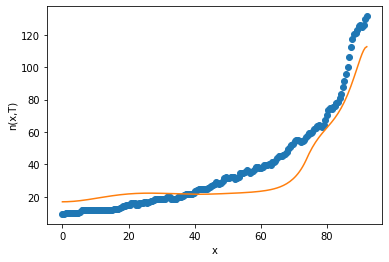

after perturb [3.866029622594124, 39.45884297768097, 26450.753836752097, 0.11304803861126134, 15.394024819465447]
parameters [3.866029622594124, 39.45884297768097, 26450.753836752097, 0.11304803861126134, 15.394024819465447]
oxigeno [8.89392929e-04 8.88709142e-04 8.86663581e-04 8.83273520e-04
 8.78567328e-04 8.72583864e-04 8.65371663e-04 8.56987949e-04
 8.47497517e-04 8.36971533e-04 8.25486275e-04 8.13121890e-04
 7.99961170e-04 7.86088403e-04 7.71588322e-04 7.56545157e-04
 7.41041819e-04 7.25159201e-04 7.08975616e-04 6.92566349e-04
 6.76003311e-04 6.59354800e-04 6.42685331e-04 6.26055546e-04
 6.09522158e-04 5.93137955e-04 5.76951819e-04 5.61008773e-04
 5.45350039e-04 5.30013106e-04 5.15031802e-04 5.00436374e-04
 4.86253566e-04 4.72506704e-04 4.59215783e-04 4.46397560e-04
 4.34065651e-04 4.22230639e-04 4.10900189e-04 4.00079174e-04
 3.89769810e-04 3.79971808e-04 3.70682534e-04 3.61897188e-04
 3.53608984e-04 3.45809353e-04 3.38488152e-04 3.31633874e-04
 3.25233870e-04 3.19274572e-04 3.13

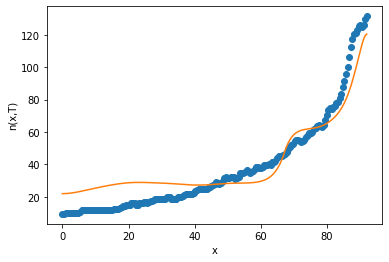

1
after perturb [8.070269544388616, 115.03111049062156, 31051.684438011078, 1.082877611369947, 46.98321750106297]
parameters [8.070269544388616, 115.03111049062156, 31051.684438011078, 1.082877611369947, 46.98321750106297]
after perturb [-2.6814574614797473, 122.39218505980546, 25751.26798441816, 0.9378867449953997, 23.82587653855722]
parameters [-2.6814574614797473, 122.39218505980546, 25751.26798441816, 0.9378867449953997, 23.82587653855722]
after perturb [3.7777699324730287, 61.47855882583856, 18049.71347571708, 0.11467287243448415, 42.25476180039933]
parameters [3.7777699324730287, 61.47855882583856, 18049.71347571708, 0.11467287243448415, 42.25476180039933]
after perturb [-8.158704687654598, 163.7467858165752, 23064.80793034349, 1.143301280586233, -6.718385435039664]
parameters [-8.158704687654598, 163.7467858165752, 23064.80793034349, 1.143301280586233, -6.718385435039664]
after perturb [6.611225110996838, 170.71050244406288, 19269.785108170658, 0.12230975803212371, 11.2261384239

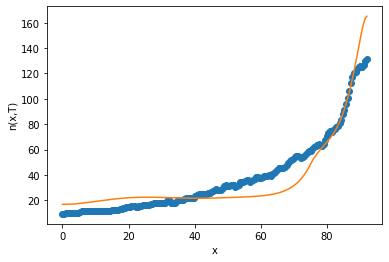

2
after perturb [8.732349109003453, 141.23572659327266, 24970.902773896694, 0.29698397738157145, -12.195761929128615]
parameters [8.732349109003453, 141.23572659327266, 24970.902773896694, 0.29698397738157145, -12.195761929128615]
after perturb [4.952175566990106, 132.46541744931966, 19403.564850640374, 0.8780055347767002, 48.7149449688752]
parameters [4.952175566990106, 132.46541744931966, 19403.564850640374, 0.8780055347767002, 48.7149449688752]
after perturb [10.436577905154397, 93.8596865724581, 33161.336531844834, 0.28571279702183405, 35.75835123084956]
parameters [10.436577905154397, 93.8596865724581, 33161.336531844834, 0.28571279702183405, 35.75835123084956]
after perturb [9.532473776229384, 113.7820948662818, 22529.755492143082, 1.0800741673401832, 56.33390746944253]
parameters [9.532473776229384, 113.7820948662818, 22529.755492143082, 1.0800741673401832, 56.33390746944253]
after perturb [8.964282385500235, 72.14908853569821, 18248.53331048048, -0.1663700820791506, 20.04840195

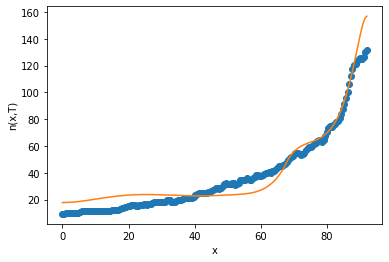

3
after perturb [5.541945209065877, 27.192877974229567, 18303.97400553948, -0.3138327261777859, 11.269269788729332]
parameters [5.541945209065877, 27.192877974229567, 18303.97400553948, -0.3138327261777859, 11.269269788729332]
after perturb [5.270090324365301, 36.493726101231815, 16481.941968269406, 0.43182708910913475, 42.093112618157264]
parameters [5.270090324365301, 36.493726101231815, 16481.941968269406, 0.43182708910913475, 42.093112618157264]
after perturb [12.472609652999395, 110.47053044754063, 25215.85482847764, 0.8377226912443722, 63.13195960205193]
parameters [12.472609652999395, 110.47053044754063, 25215.85482847764, 0.8377226912443722, 63.13195960205193]
after perturb [10.495308783240151, 4.677924765235829, 34218.000534686726, 0.17549935519265428, 24.65560184970306]
parameters [10.495308783240151, 4.677924765235829, 34218.000534686726, 0.17549935519265428, 24.65560184970306]
after perturb [2.200453942297921, 80.7281996697725, 29085.759684365905, 0.9361426882985819, 32.114

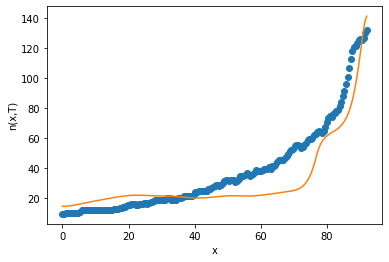

after perturb [4.07010260855694, 162.74190743370866, 21763.55808081944, 1.1098096613454302, 22.358687693268877]
parameters [4.07010260855694, 162.74190743370866, 21763.55808081944, 1.1098096613454302, 22.358687693268877]
after perturb [1.915149505156975, 130.2589343749389, 17579.427263731584, 0.8342551362916837, 40.651877775441164]
parameters [1.915149505156975, 130.2589343749389, 17579.427263731584, 0.8342551362916837, 40.651877775441164]
after perturb [2.489689548854816, 135.4090782956764, 20129.89909452504, 1.5250618896262296, 40.18483773757126]
parameters [2.489689548854816, 135.4090782956764, 20129.89909452504, 1.5250618896262296, 40.18483773757126]
oxigeno [1.54968245e-14 1.56942418e-14 1.62917305e-14 1.73051672e-14
 1.87615724e-14 2.06999662e-14 2.31726015e-14 2.62466088e-14
 3.00061042e-14 3.45548216e-14 4.00193515e-14 4.65530867e-14
 5.43409997e-14 6.36054046e-14 7.46128927e-14 8.76826686e-14
 1.03196569e-13 1.21611100e-13 1.43471912e-13 1.69431200e-13
 2.00268654e-13 2.369166

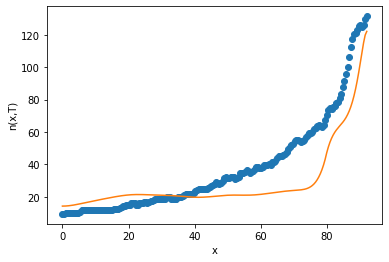

after perturb [12.284067786598989, 86.43626895912942, 31356.290482196113, 0.6475078577354325, 30.23637570755461]
parameters [12.284067786598989, 86.43626895912942, 31356.290482196113, 0.6475078577354325, 30.23637570755461]
after perturb [7.209657021860692, 133.25122460536505, 27512.922115810918, 0.9072049105153847, 35.538493799071865]
parameters [7.209657021860692, 133.25122460536505, 27512.922115810918, 0.9072049105153847, 35.538493799071865]
oxigeno [1.55125491e-11 1.56486806e-11 1.60594882e-11 1.67522604e-11
 1.77393064e-11 1.90382037e-11 2.06721504e-11 2.26704322e-11
 2.50690117e-11 2.79112538e-11 3.12488026e-11 3.51426276e-11
 3.96642613e-11 4.48972557e-11 5.09388869e-11 5.79021454e-11
 6.59180527e-11 7.51383552e-11 8.57386507e-11 9.79220148e-11
 1.11923203e-10 1.28013516e-10 1.46506437e-10 1.67764145e-10
 1.92205061e-10 2.20312559e-10 2.52645045e-10 2.89847602e-10
 3.32665435e-10 3.81959398e-10 4.38723920e-10 5.04107683e-10
 5.79437468e-10 6.66245661e-10 7.66301935e-10 8.81649756

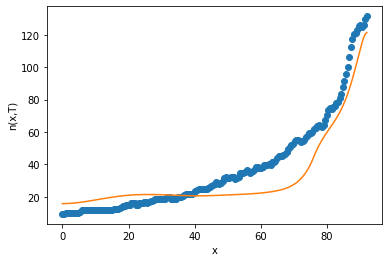

after perturb [10.46662651934708, -5.726110023971984, 24935.1997618647, -0.20070114612669254, 31.808688126985196]
parameters [10.46662651934708, -5.726110023971984, 24935.1997618647, -0.20070114612669254, 31.808688126985196]
after perturb [7.58895457586131, 116.20309652785849, 23859.026798089857, 1.4194365504009867, 71.70522359297121]
parameters [7.58895457586131, 116.20309652785849, 23859.026798089857, 1.4194365504009867, 71.70522359297121]
after perturb [6.6160713234298765, 231.54913388616313, 26772.0500501616, 1.427171533984485, 44.84907550666444]
parameters [6.6160713234298765, 231.54913388616313, 26772.0500501616, 1.427171533984485, 44.84907550666444]
after perturb [0.5321929461768349, 38.71676047520954, 16805.014369126857, 0.10635684080523244, 40.24969121670339]
parameters [0.5321929461768349, 38.71676047520954, 16805.014369126857, 0.10635684080523244, 40.24969121670339]
after perturb [6.310434049853434, 88.77173618497537, 20113.257254092452, 0.4801252103426321, 15.61411805870280

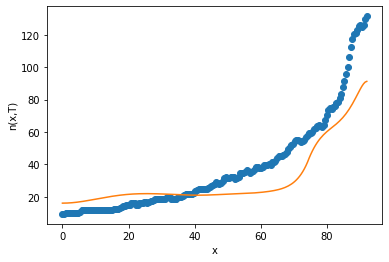

after perturb [12.107629374116822, 21.469816986449707, 21214.976726553094, 0.05238237846654209, 48.94441601551206]
parameters [12.107629374116822, 21.469816986449707, 21214.976726553094, 0.05238237846654209, 48.94441601551206]
after perturb [8.986636847207082, 6.183159159564767, 26720.00353665035, -0.4403448995867082, 25.9736761571651]
parameters [8.986636847207082, 6.183159159564767, 26720.00353665035, -0.4403448995867082, 25.9736761571651]
after perturb [-2.1190181988676398, 97.16947128492194, 20797.43594012651, 1.1506458774188268, 36.90511362877323]
parameters [-2.1190181988676398, 97.16947128492194, 20797.43594012651, 1.1506458774188268, 36.90511362877323]
after perturb [10.201363691713844, 126.78184878405926, 24445.611796129928, 1.1244197365193522, 44.44299129423203]
parameters [10.201363691713844, 126.78184878405926, 24445.611796129928, 1.1244197365193522, 44.44299129423203]
after perturb [9.783490121912802, 98.95614451123309, 25318.261317629385, 0.7881370371577885, 43.7492502367

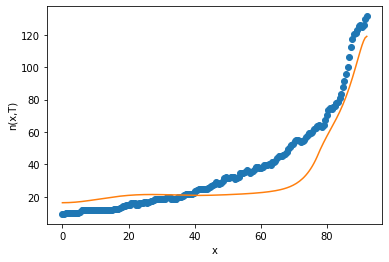

after perturb [3.2684476953212904, 113.17024395888507, 22391.044982630243, 0.07746201425483956, 16.778431610605303]
parameters [3.2684476953212904, 113.17024395888507, 22391.044982630243, 0.07746201425483956, 16.778431610605303]
oxigeno [1.07047589e-02 1.07015747e-02 1.06920505e-02 1.06762714e-02
 1.06543775e-02 1.06265617e-02 1.05930667e-02 1.05541806e-02
 1.05102332e-02 1.04615909e-02 1.04086514e-02 1.03518390e-02
 1.02915994e-02 1.02283952e-02 1.01627019e-02 1.00950040e-02
 1.00257928e-02 9.95556348e-03 9.88481371e-03 9.81404227e-03
 9.74374838e-03 9.67443137e-03 9.60659081e-03 9.54072671e-03
 9.47734002e-03 9.41693309e-03 9.36001024e-03 9.30707825e-03
 9.25864684e-03 9.21522919e-03 9.17734245e-03 9.14550819e-03
 9.12025294e-03 9.10210872e-03 9.09161353e-03 9.08931184e-03
 9.09575515e-03 9.11150253e-03 9.13712113e-03 9.17318692e-03
 9.22028542e-03 9.27901259e-03 9.34997592e-03 9.43379573e-03
 9.53110672e-03 9.64255982e-03 9.76882442e-03 9.91059103e-03
 1.00685743e-02 1.02435168e-02 

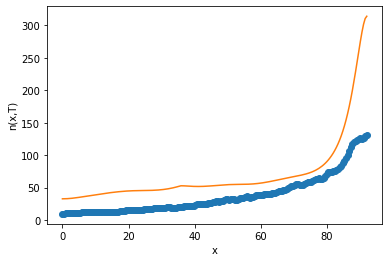

after perturb [4.163340074066952, 138.9741120752438, 19098.74061475661, 0.3317548967529381, -7.892385659806266]
parameters [4.163340074066952, 138.9741120752438, 19098.74061475661, 0.3317548967529381, -7.892385659806266]
after perturb [10.387790667341346, 125.12243486899459, 29742.580050233842, 1.069587179272692, 63.303964632557495]
parameters [10.387790667341346, 125.12243486899459, 29742.580050233842, 1.069587179272692, 63.303964632557495]
after perturb [4.962543858217144, 113.50452474425485, 23058.07232847427, 0.22253217753209623, -0.1452726044252195]
parameters [4.962543858217144, 113.50452474425485, 23058.07232847427, 0.22253217753209623, -0.1452726044252195]
after perturb [13.611894558470617, 106.53030124627908, 30156.73761677718, 1.2989596466529814, 63.71340749764112]
parameters [13.611894558470617, 106.53030124627908, 30156.73761677718, 1.2989596466529814, 63.71340749764112]
after perturb [13.60135197694019, 95.70637163894152, 28148.64101668442, 0.8029030685161865, 48.470600481

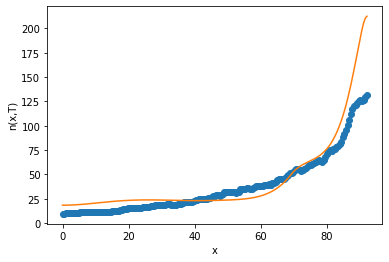

after perturb [5.775555801748612, 92.79548235111399, 20902.16595429255, 0.5513326393553364, 57.7315539542287]
parameters [5.775555801748612, 92.79548235111399, 20902.16595429255, 0.5513326393553364, 57.7315539542287]
after perturb [4.13743069156917, 59.133557189944774, 16448.39256248785, 0.24338534175462934, 46.19744802517748]
parameters [4.13743069156917, 59.133557189944774, 16448.39256248785, 0.24338534175462934, 46.19744802517748]
after perturb [6.118286406472801, 63.144637291011776, 25157.463201125793, 0.6968725095212907, 42.47255525239307]
parameters [6.118286406472801, 63.144637291011776, 25157.463201125793, 0.6968725095212907, 42.47255525239307]
oxigeno [3.89425813e-14 3.89322087e-14 3.89031318e-14 3.88615144e-14
 3.88177715e-14 3.87867915e-14 3.87882641e-14 3.88471340e-14
 3.89942037e-14 3.92669164e-14 3.97103580e-14 4.03785260e-14
 4.13359213e-14 4.26595352e-14 4.44413139e-14 4.67912060e-14
 4.98409143e-14 5.37485056e-14 5.87040615e-14 6.49365926e-14
 7.27224888e-14 8.23958364

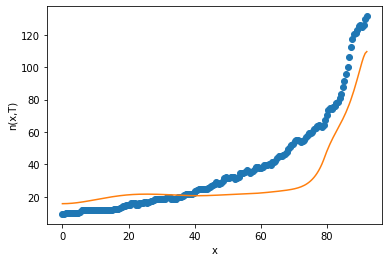

after perturb [2.539233893490181, 55.45389510138327, 26871.47085554392, 0.22295183995666942, 18.931864609636484]
parameters [2.539233893490181, 55.45389510138327, 26871.47085554392, 0.22295183995666942, 18.931864609636484]
oxigeno [7.75716920e-06 7.74939062e-06 7.72613609e-06 7.68764677e-06
 7.63431661e-06 7.56668082e-06 7.48540077e-06 7.39124618e-06
 7.28507548e-06 7.16781543e-06 7.04044082e-06 6.90395523e-06
 6.75937330e-06 6.60770519e-06 6.44994341e-06 6.28705221e-06
 6.11995948e-06 5.94955106e-06 5.77666713e-06 5.60210040e-06
 5.42659566e-06 5.25085037e-06 5.07551588e-06 4.90119898e-06
 4.72846346e-06 4.55783167e-06 4.38978585e-06 4.22476928e-06
 4.06318737e-06 3.90540858e-06 3.75176558e-06 3.60255636e-06
 3.45804571e-06 3.31846680e-06 3.18402305e-06 3.05489024e-06
 2.93121871e-06 2.81313577e-06 2.70074831e-06 2.59414545e-06
 2.49340157e-06 2.39857942e-06 2.30973373e-06 2.22691513e-06
 2.15017455e-06 2.07956815e-06 2.01516272e-06 1.95704166e-06
 1.90531144e-06 1.86010857e-06 1.8216

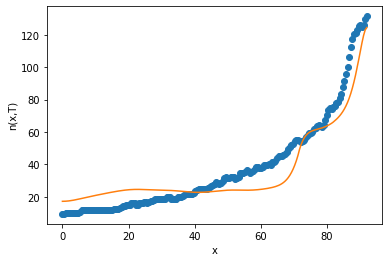

4
after perturb [4.047640652429807, 57.26904444973937, 23373.36587398768, 0.9734105954418119, 45.618529237479]
parameters [4.047640652429807, 57.26904444973937, 23373.36587398768, 0.9734105954418119, 45.618529237479]
oxigeno [2.05222540e-18 2.07173748e-18 2.13141242e-18 2.23472373e-18
 2.38765530e-18 2.59900529e-18 2.88083588e-18 3.24909486e-18
 3.72444474e-18 4.33334691e-18 5.10946280e-18 6.09545213e-18
 7.34527088e-18 8.92710005e-18 1.09270728e-17 1.34540133e-17
 1.66454594e-17 2.06753157e-17 2.57635791e-17 3.21886993e-17
 4.03032931e-17 5.05541261e-17 6.35075289e-17 7.98817337e-17
 1.00588025e-16 1.26783119e-16 1.59935844e-16 2.01912030e-16
 2.55082607e-16 3.22461216e-16 4.07879417e-16 5.16209705e-16
 6.53649335e-16 8.28081430e-16 1.04953425e-15 1.33076513e-15
 1.68800244e-15 2.14188810e-15 2.71867400e-15 3.45173991e-15
 4.38351819e-15 5.56793281e-15 7.07348823e-15 8.98717893e-15
 1.14194349e-14 1.45103738e-14 1.84377019e-14 2.34266920e-14
 2.97627802e-14 3.78074616e-14 4.80183403e-

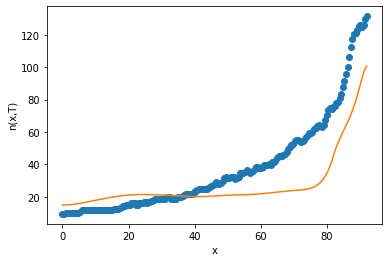

after perturb [2.066063491286672, 120.05245641964854, 19165.604794257782, 0.22707338727960527, 23.73392720664352]
parameters [2.066063491286672, 120.05245641964854, 19165.604794257782, 0.22707338727960527, 23.73392720664352]
after perturb [5.549767601883249, 78.4786211589952, 22237.446839951204, 0.6502256793279935, 55.705374854320766]
parameters [5.549767601883249, 78.4786211589952, 22237.446839951204, 0.6502256793279935, 55.705374854320766]
after perturb [5.233276042889886, 141.57332498315816, 20461.747941591253, 0.30042044028324055, 19.518739477217853]
parameters [5.233276042889886, 141.57332498315816, 20461.747941591253, 0.30042044028324055, 19.518739477217853]
oxigeno [1.20667742e-06 1.20982365e-06 1.21928470e-06 1.23512777e-06
 1.25746546e-06 1.28645664e-06 1.32230771e-06 1.36527420e-06
 1.41566274e-06 1.47383348e-06 1.54020284e-06 1.61524673e-06
 1.69950420e-06 1.79358156e-06 1.89815701e-06 2.01398579e-06
 2.14190591e-06 2.28284449e-06 2.43782477e-06 2.60797382e-06
 2.79453101e-0

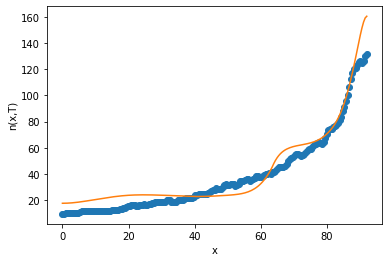

5
after perturb [0.14761655025341125, 75.44705075142834, 26926.445091776273, 0.1237534270587564, 5.792997967875786]
parameters [0.14761655025341125, 75.44705075142834, 26926.445091776273, 0.1237534270587564, 5.792997967875786]
oxigeno [3.75303704e-04 3.74974629e-04 3.74014308e-04 3.72492912e-04
 3.70500172e-04 3.68121771e-04 3.65423240e-04 3.62444560e-04
 3.59203036e-04 3.55698661e-04 3.51919571e-04 3.47850828e-04
 3.43488769e-04 3.38855185e-04 3.34001327e-04 3.28997964e-04
 3.23916975e-04 3.18813321e-04 3.13715870e-04 3.08630595e-04
 3.03550620e-04 2.98464588e-04 2.93359835e-04 2.88222582e-04
 2.83040105e-04 2.77808583e-04 2.72544506e-04 2.67291683e-04
 2.62116338e-04 2.57090903e-04 2.52273968e-04 2.47694793e-04
 2.43350233e-04 2.39216311e-04 2.35267601e-04 2.31492575e-04
 2.27896353e-04 2.24494164e-04 2.21304864e-04 2.18350165e-04
 2.15658046e-04 2.13265830e-04 2.11218812e-04 2.09563838e-04
 2.08340497e-04 2.07573577e-04 2.07270082e-04 2.07422661e-04
 2.08019433e-04 2.09057101e-04 2.

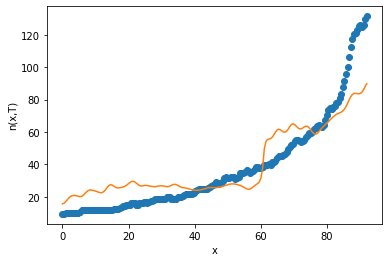

after perturb [8.05114078797554, 75.50622708997518, 26362.854134154033, 0.12872393030511953, 16.76889917091891]
parameters [8.05114078797554, 75.50622708997518, 26362.854134154033, 0.12872393030511953, 16.76889917091891]
oxigeno [4.67114759e-04 4.66904709e-04 4.66275701e-04 4.65231156e-04
 4.63776735e-04 4.61920278e-04 4.59671728e-04 4.57043029e-04
 4.54048007e-04 4.50702239e-04 4.47022902e-04 4.43028623e-04
 4.38739309e-04 4.34175987e-04 4.29360631e-04 4.24315994e-04
 4.19065451e-04 4.13632837e-04 4.08042303e-04 4.02318174e-04
 3.96484829e-04 3.90566580e-04 3.84587576e-04 3.78571720e-04
 3.72542592e-04 3.66523396e-04 3.60536918e-04 3.54605498e-04
 3.48751020e-04 3.42994908e-04 3.37358148e-04 3.31861311e-04
 3.26524595e-04 3.21367882e-04 3.16410797e-04 3.11672790e-04
 3.07173224e-04 3.02931472e-04 2.98967024e-04 2.95299616e-04
 2.91949351e-04 2.88936844e-04 2.86283374e-04 2.84011039e-04
 2.82142933e-04 2.80703324e-04 2.79717847e-04 2.79213702e-04
 2.79219875e-04 2.79767354e-04 2.808893

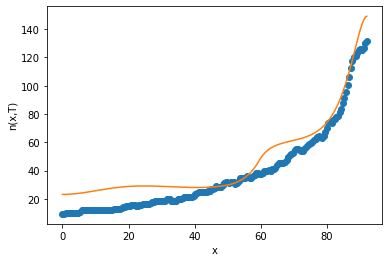

6
after perturb [2.250429333290685, 64.78667580516749, 22701.41849825143, -0.08085951247534368, -2.689914862716428]
parameters [2.250429333290685, 64.78667580516749, 22701.41849825143, -0.08085951247534368, -2.689914862716428]
after perturb [2.5357925695729975, 55.26197381676096, 26372.060972686857, 0.04602460690828181, 17.981950589459483]
parameters [2.5357925695729975, 55.26197381676096, 26372.060972686857, 0.04602460690828181, 17.981950589459483]
oxigeno [8.45400817e-02 8.44994948e-02 8.43780824e-02 8.41768791e-02
 8.38975781e-02 8.35424870e-02 8.31144687e-02 8.26168717e-02
 8.20534527e-02 8.14282956e-02 8.07457308e-02 8.00102565e-02
 7.92264665e-02 7.83989858e-02 7.75324148e-02 7.66312842e-02
 7.57000198e-02 7.47429173e-02 7.37641262e-02 7.27676415e-02
 7.17573014e-02 7.07367898e-02 6.97096414e-02 6.86792481e-02
 6.76488647e-02 6.66216138e-02 6.56004886e-02 6.45883536e-02
 6.35879436e-02 6.26018608e-02 6.16325713e-02 6.06824011e-02
 5.97535316e-02 5.88479963e-02 5.79676765e-02 5.71

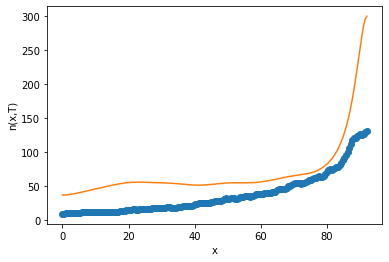

after perturb [10.944996376823877, 149.82221985026038, 29781.011971139465, 0.9459828349029269, 44.57370042174789]
parameters [10.944996376823877, 149.82221985026038, 29781.011971139465, 0.9459828349029269, 44.57370042174789]
after perturb [5.6980945830011684, 15.254879993229963, 28359.454094501394, 0.03704773543851336, 25.01486558688502]
parameters [5.6980945830011684, 15.254879993229963, 28359.454094501394, 0.03704773543851336, 25.01486558688502]
oxigeno [8.68503870e-02 8.67887645e-02 8.66044519e-02 8.62991027e-02
 8.58754369e-02 8.53371882e-02 8.46890331e-02 8.39365037e-02
 8.30858878e-02 8.21441191e-02 8.11186613e-02 8.00173888e-02
 7.88484681e-02 7.76202428e-02 7.63411238e-02 7.50194885e-02
 7.36635892e-02 7.22814723e-02 7.08809097e-02 6.94693416e-02
 6.80538301e-02 6.66410253e-02 6.52371400e-02 6.38479341e-02
 6.24787075e-02 6.11342985e-02 5.98190889e-02 5.85370134e-02
 5.72915713e-02 5.60858425e-02 5.49225037e-02 5.38038463e-02
 5.27317949e-02 5.17079256e-02 5.07334844e-02 4.9809

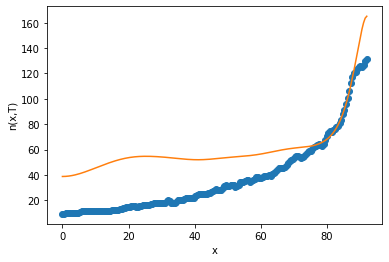

after perturb [2.359804195518046, 80.38895893949592, 25201.42418526079, 0.26984842053024927, 10.442029212117738]
parameters [2.359804195518046, 80.38895893949592, 25201.42418526079, 0.26984842053024927, 10.442029212117738]
oxigeno [7.37922556e-07 7.37324099e-07 7.35535527e-07 7.32577060e-07
 7.28481807e-07 7.23294915e-07 7.17072464e-07 7.09880175e-07
 7.01792006e-07 6.92888707e-07 6.83256425e-07 6.72985399e-07
 6.62168810e-07 6.50901820e-07 6.39280819e-07 6.27402904e-07
 6.15365580e-07 6.03266681e-07 5.91204506e-07 5.79278136e-07
 5.67587909e-07 5.56236044e-07 5.45327372e-07 5.34970164e-07
 5.25277043e-07 5.16365975e-07 5.08361343e-07 5.01395118e-07
 4.95608152e-07 4.91151610e-07 4.88188583e-07 4.86895895e-07
 4.87466150e-07 4.90110035e-07 4.95058894e-07 5.02567617e-07
 5.12917845e-07 5.26421512e-07 5.43424765e-07 5.64312266e-07
 5.89511923e-07 6.19500085e-07 6.54807249e-07 6.96024333e-07
 7.43809587e-07 7.98896233e-07 8.62100914e-07 9.34333096e-07
 1.01660552e-06 1.11004588e-06 1.2159

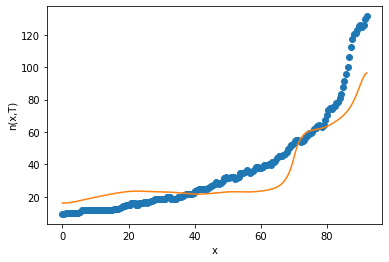

after perturb [6.780266774168524, 129.2570419785547, 19307.17943087139, 0.41805669128597567, 14.82316395086858]
parameters [6.780266774168524, 129.2570419785547, 19307.17943087139, 0.41805669128597567, 14.82316395086858]
after perturb [15.8768434250724, 173.46584887223614, 17293.98933412138, 0.9630723870050483, 81.95771047228004]
parameters [15.8768434250724, 173.46584887223614, 17293.98933412138, 0.9630723870050483, 81.95771047228004]
after perturb [4.384633410700497, 70.22725905124659, 26669.621419227522, -0.21113210330673982, 0.0684485867021909]
parameters [4.384633410700497, 70.22725905124659, 26669.621419227522, -0.21113210330673982, 0.0684485867021909]
after perturb [11.222877172173387, 117.6968515336795, 36262.281267703744, 0.9836658513876124, 12.404158902143323]
parameters [11.222877172173387, 117.6968515336795, 36262.281267703744, 0.9836658513876124, 12.404158902143323]
after perturb [2.74390883543364, 144.51231701094065, 29017.012691929478, 1.2297848715321866, 51.186944614196

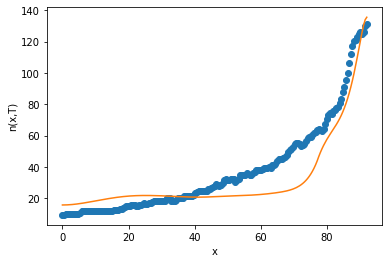

after perturb [9.821710389389766, 117.81302110005362, 20302.305329640843, 0.9279985501696888, 46.845984517229596]
parameters [9.821710389389766, 117.81302110005362, 20302.305329640843, 0.9279985501696888, 46.845984517229596]
oxigeno [1.81256933e-12 1.83159676e-12 1.88907827e-12 1.98622059e-12
 2.12506538e-12 2.30853572e-12 2.54050266e-12 2.82587366e-12
 3.17070485e-12 3.58233999e-12 4.06957946e-12 4.64288336e-12
 5.31461376e-12 6.09932179e-12 7.01408688e-12 8.07891603e-12
 9.31721319e-12 1.07563298e-11 1.24282104e-11 1.43701479e-11
 1.66256688e-11 1.92455674e-11 2.22891158e-11 2.58254783e-11
 2.99353641e-11 3.47129585e-11 4.02681784e-11 4.67293062e-11
 5.42460652e-11 6.29932090e-11 7.31747101e-11 8.50286469e-11
 9.88329023e-11 1.14911810e-10 1.33643899e-10 1.55470922e-10
 1.80908366e-10 2.10557703e-10 2.45120638e-10 2.85415700e-10
 3.32397541e-10 3.87179373e-10 4.51059064e-10 5.25549449e-10
 6.12413552e-10 7.13705488e-10 8.31817938e-10 9.69537247e-10
 1.13010734e-09 1.31730384e-09 1.53

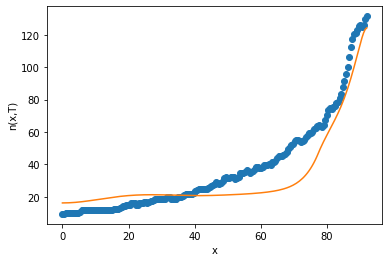

after perturb [0.9667337126909672, 163.33896618681993, 24838.22955896929, 0.957064963450762, 24.506781414920994]
parameters [0.9667337126909672, 163.33896618681993, 24838.22955896929, 0.957064963450762, 24.506781414920994]
after perturb [3.5717271691266177, 176.5355444335649, 13959.846155031471, 0.7012589316797151, 59.45446040542525]
parameters [3.5717271691266177, 176.5355444335649, 13959.846155031471, 0.7012589316797151, 59.45446040542525]
after perturb [5.800118039717094, 74.9489576437062, 16036.570518531136, 0.3790912700680451, 46.84774547778601]
parameters [5.800118039717094, 74.9489576437062, 16036.570518531136, 0.3790912700680451, 46.84774547778601]
after perturb [6.212509391304447, 148.6783178953013, 23149.143354530166, 0.6863539288095035, 36.39527829508306]
parameters [6.212509391304447, 148.6783178953013, 23149.143354530166, 0.6863539288095035, 36.39527829508306]
oxigeno [1.39187239e-09 1.40022784e-09 1.42539696e-09 1.46768955e-09
 1.52762699e-09 1.60594993e-09 1.70362914e-09

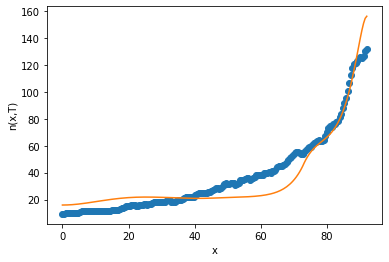

7
after perturb [5.798389406723741, 73.99512104679044, 33093.37758728439, 0.6568163735059724, 39.4799763731946]
parameters [5.798389406723741, 73.99512104679044, 33093.37758728439, 0.6568163735059724, 39.4799763731946]
after perturb [7.188920338056033, 50.83172656859544, 31723.355729092782, 0.605665319254601, 42.30317594972187]
parameters [7.188920338056033, 50.83172656859544, 31723.355729092782, 0.605665319254601, 42.30317594972187]
after perturb [7.944803275018149, 110.43074247334718, 21046.49345900807, 0.16534324930409122, 24.324506286346065]
parameters [7.944803275018149, 110.43074247334718, 21046.49345900807, 0.16534324930409122, 24.324506286346065]
oxigeno [1.06460964e-04 1.06440204e-04 1.06378236e-04 1.06275996e-04
 1.06135038e-04 1.05957531e-04 1.05746247e-04 1.05504552e-04
 1.05236392e-04 1.04946282e-04 1.04639289e-04 1.04321020e-04
 1.03997607e-04 1.03675692e-04 1.03362420e-04 1.03065421e-04
 1.02792811e-04 1.02553182e-04 1.02355603e-04 1.02209619e-04
 1.02125263e-04 1.021130

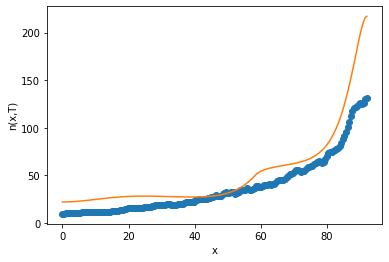

after perturb [7.495041889100898, 38.1896685902328, 29998.074412253296, -0.20454717089950591, 10.742144185460731]
parameters [7.495041889100898, 38.1896685902328, 29998.074412253296, -0.20454717089950591, 10.742144185460731]
after perturb [3.9187609363365197, 94.35366944865251, 24107.700138307973, 0.8676997874546162, 21.445512701324997]
parameters [3.9187609363365197, 94.35366944865251, 24107.700138307973, 0.8676997874546162, 21.445512701324997]
oxigeno [1.31421452e-13 1.33068145e-13 1.38049966e-13 1.46493340e-13
 1.58612977e-13 1.74718013e-13 1.95220840e-13 2.20648895e-13
 2.51659746e-13 2.89059921e-13 3.33828022e-13 3.87142811e-13
 4.50417103e-13 5.25338463e-13 6.13917942e-13 7.18548294e-13
 8.42073457e-13 9.87871394e-13 1.15995281e-12 1.36307878e-12
 1.60290088e-12 1.88612806e-12 2.22072553e-12 2.61615154e-12
 3.08363951e-12 3.63653395e-12 4.29069051e-12 5.06495228e-12
 5.98171661e-12 7.06760963e-12 8.35428834e-12 9.87939432e-12
 1.16876868e-11 1.38323880e-11 1.63767802e-11 1.939609

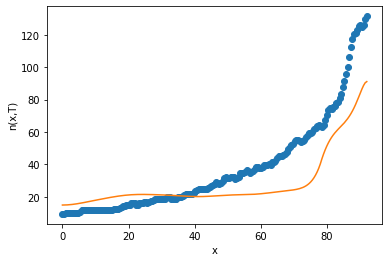

after perturb [15.68831513698078, 102.51453691416361, 19905.395434069847, 0.7294582967327263, 80.879078373628]
parameters [15.68831513698078, 102.51453691416361, 19905.395434069847, 0.7294582967327263, 80.879078373628]
after perturb [5.950021925319629, 125.08834842234761, 17951.711517193842, 0.07101461185040914, 41.52247676131727]
parameters [5.950021925319629, 125.08834842234761, 17951.711517193842, 0.07101461185040914, 41.52247676131727]
after perturb [4.857254877768128, 87.16065457917159, 24820.017670347996, 0.13508565477162643, 22.747101225083078]
parameters [4.857254877768128, 87.16065457917159, 24820.017670347996, 0.13508565477162643, 22.747101225083078]
oxigeno [4.39675472e-04 4.39469986e-04 4.38854934e-04 4.37834520e-04
 4.36415681e-04 4.34607995e-04 4.32423542e-04 4.29876750e-04
 4.26984201e-04 4.23764431e-04 4.20237711e-04 4.16425817e-04
 4.12351815e-04 4.08039829e-04 4.03514838e-04 3.98802476e-04
 3.93928854e-04 3.88920396e-04 3.83803704e-04 3.78605434e-04
 3.73352204e-04 3.

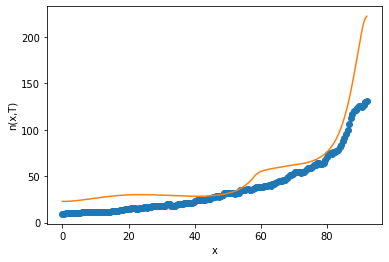

after perturb [7.90616507170833, 135.9916821453087, 18537.706129613343, 0.8258002021346431, 58.80711131140756]
parameters [7.90616507170833, 135.9916821453087, 18537.706129613343, 0.8258002021346431, 58.80711131140756]
after perturb [6.031624847105206, 56.15128960780722, 25737.72770085458, 0.19491278573465443, 34.04478766112628]
parameters [6.031624847105206, 56.15128960780722, 25737.72770085458, 0.19491278573465443, 34.04478766112628]
oxigeno [3.12787177e-05 3.12542981e-05 3.11812110e-05 3.10599685e-05
 3.08914151e-05 3.06767149e-05 3.04173335e-05 3.01150161e-05
 2.97717620e-05 2.93897961e-05 2.89715385e-05 2.85195727e-05
 2.80366130e-05 2.75254720e-05 2.69890292e-05 2.64302005e-05
 2.58519096e-05 2.52570617e-05 2.46485193e-05 2.40290808e-05
 2.34014619e-05 2.27682796e-05 2.21320388e-05 2.14951213e-05
 2.08597780e-05 2.02281224e-05 1.96021268e-05 1.89836201e-05
 1.83742880e-05 1.77756734e-05 1.71891799e-05 1.66160748e-05
 1.60574949e-05 1.55144523e-05 1.49878407e-05 1.44784441e-05
 1.

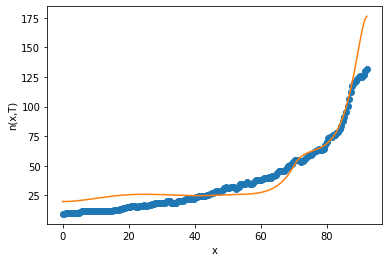

8
after perturb [12.669534669947968, 88.8877701154843, 32943.642396887844, 0.46450579240003886, 25.963990905768696]
parameters [12.669534669947968, 88.8877701154843, 32943.642396887844, 0.46450579240003886, 25.963990905768696]
after perturb [1.8835876918363512, 36.621774720858596, 16871.073708117092, 0.3063636987427668, 24.318698291935505]
parameters [1.8835876918363512, 36.621774720858596, 16871.073708117092, 0.3063636987427668, 24.318698291935505]
after perturb [8.51226263371658, 141.294099507187, 25347.96068113399, 0.4071303181136684, 11.031334290238552]
parameters [8.51226263371658, 141.294099507187, 25347.96068113399, 0.4071303181136684, 11.031334290238552]
oxigeno [9.04946281e-08 9.08765640e-08 9.20256862e-08 9.39519723e-08
 9.66721649e-08 1.00209942e-07 1.04596160e-07 1.09869166e-07
 1.16075189e-07 1.23268808e-07 1.31513507e-07 1.40882318e-07
 1.51458553e-07 1.63336649e-07 1.76623113e-07 1.91437589e-07
 2.07914056e-07 2.26202162e-07 2.46468709e-07 2.68899310e-07
 2.93700219e-07 

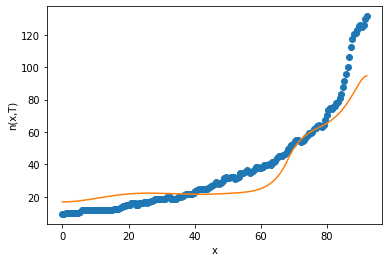

after perturb [3.51043303765302, 122.36646390417788, 29143.057569865567, 1.1068048672646693, 11.840703200836446]
parameters [3.51043303765302, 122.36646390417788, 29143.057569865567, 1.1068048672646693, 11.840703200836446]
after perturb [10.153668121082468, 183.45046766069203, 21949.92537574134, 0.34210536000105657, 35.34492094358134]
parameters [10.153668121082468, 183.45046766069203, 21949.92537574134, 0.34210536000105657, 35.34492094358134]
after perturb [8.961798350271764, 192.90419627105328, 28425.284177323712, 0.8456156540040477, 42.398417618366864]
parameters [8.961798350271764, 192.90419627105328, 28425.284177323712, 0.8456156540040477, 42.398417618366864]
after perturb [0.5686141092775276, 54.91809332742539, 15394.472052917972, 0.35735116428680624, 31.509600798012293]
parameters [0.5686141092775276, 54.91809332742539, 15394.472052917972, 0.35735116428680624, 31.509600798012293]
after perturb [5.363096859836842, -2.8392116135957934, 16474.003940781226, -0.24719625760030084, 15.

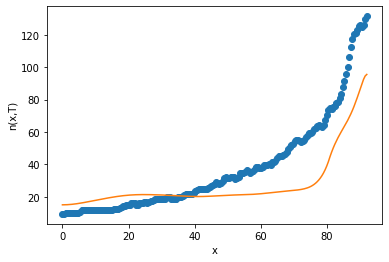

after perturb [10.915496315353641, 64.47591674260201, 32780.075590704946, 0.4186806966643285, 27.0817539089385]
parameters [10.915496315353641, 64.47591674260201, 32780.075590704946, 0.4186806966643285, 27.0817539089385]
after perturb [6.931602438734593, 117.83794656191697, 21643.416070704854, 1.0717045097071538, 56.99936566329959]
parameters [6.931602438734593, 117.83794656191697, 21643.416070704854, 1.0717045097071538, 56.99936566329959]
after perturb [5.230813963212626, 88.60251997973194, 26048.626724157693, -0.3870437642997613, -11.25671909780283]
parameters [5.230813963212626, 88.60251997973194, 26048.626724157693, -0.3870437642997613, -11.25671909780283]
after perturb [8.863637887253683, 172.45731474346996, 27075.747526617117, 0.565562405803063, 17.808095581907295]
parameters [8.863637887253683, 172.45731474346996, 27075.747526617117, 0.565562405803063, 17.808095581907295]
after perturb [3.858135794407227, 86.56762863675455, 25323.677606309113, 0.5934537327466141, 32.434507579587

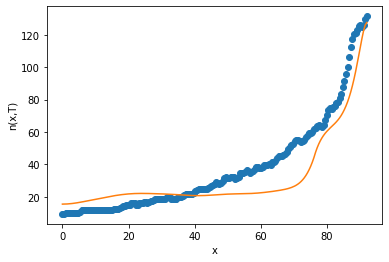

after perturb [13.378778265995736, 173.77234840008268, 20226.588494950964, 0.6127599556408232, 44.98643029105958]
parameters [13.378778265995736, 173.77234840008268, 20226.588494950964, 0.6127599556408232, 44.98643029105958]
after perturb [9.490113648441652, 134.94221682522996, 22248.18048160108, 0.9040370480845805, 46.30051588063973]
parameters [9.490113648441652, 134.94221682522996, 22248.18048160108, 0.9040370480845805, 46.30051588063973]
oxigeno [1.80751166e-11 1.82325893e-11 1.87077613e-11 1.95089479e-11
 2.06501862e-11 2.21515076e-11 2.40393264e-11 2.63469524e-11
 2.91152402e-11 3.23933854e-11 3.62398866e-11 4.07236927e-11
 4.59255572e-11 5.19396302e-11 5.88753186e-11 6.68594538e-11
 7.60388113e-11 8.65830332e-11 9.86880153e-11 1.12579825e-10
 1.28519234e-10 1.46806952e-10 1.67789678e-10 1.91867077e-10
 2.19499839e-10 2.51218973e-10 2.87636517e-10 3.29457897e-10
 3.77496163e-10 4.32688387e-10 4.96114562e-10 5.69019342e-10
 6.52837088e-10 7.49220669e-10 8.60074602e-10 9.87593153e-

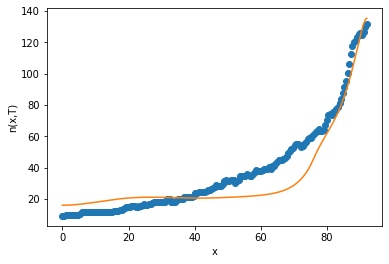

9
after perturb [2.285471698335661, 115.59035709559232, 24496.809704038147, 0.6501471296803952, 19.41443617986936]
parameters [2.285471698335661, 115.59035709559232, 24496.809704038147, 0.6501471296803952, 19.41443617986936]
oxigeno [1.11003742e-10 1.11839817e-10 1.14361391e-10 1.18608769e-10
 1.24649995e-10 1.32582175e-10 1.42533337e-10 1.54664869e-10
 1.69174565e-10 1.86300317e-10 2.06324510e-10 2.29579202e-10
 2.56452167e-10 2.87393920e-10 3.22925843e-10 3.63649590e-10
 4.10257945e-10 4.63547373e-10 5.24432521e-10 5.93962977e-10
 6.73342662e-10 7.63952228e-10 8.67374949e-10 9.85426591e-10
 1.12018984e-09 1.27405394e-09 1.44976017e-09 1.65045413e-09
 1.87974563e-09 2.14177726e-09 2.44130301e-09 2.78377821e-09
 3.17546262e-09 3.62353823e-09 4.13624419e-09 4.72303078e-09
 5.39473498e-09 6.16378024e-09 7.04440317e-09 8.05290999e-09
 9.20796621e-09 1.05309230e-08 1.20461847e-08 1.37816219e-08
 1.57690373e-08 1.80446906e-08 2.06498918e-08 2.36316740e-08
 2.70435574e-08 3.09464206e-08 3.54

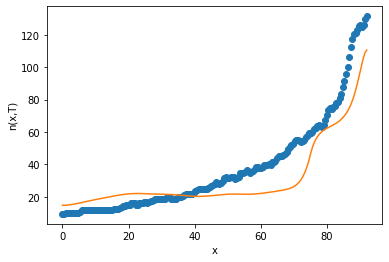

after perturb [14.559594017045821, 158.634939725014, 27425.722095691654, 0.5424429747876184, 27.018898712347486]
parameters [14.559594017045821, 158.634939725014, 27425.722095691654, 0.5424429747876184, 27.018898712347486]
after perturb [9.260100410732585, 112.38977830882968, 20882.97983162644, 0.5032183424461212, 33.43963656957598]
parameters [9.260100410732585, 112.38977830882968, 20882.97983162644, 0.5032183424461212, 33.43963656957598]
oxigeno [1.20883643e-09 1.21660298e-09 1.24000629e-09 1.27935887e-09
 1.33518672e-09 1.40823708e-09 1.49948943e-09 1.61017007e-09
 1.74177013e-09 1.89606777e-09 2.07515444e-09 2.28146591e-09
 2.51781847e-09 2.78745071e-09 3.09407167e-09 3.44191607e-09
 3.83580728e-09 4.28122924e-09 4.78440808e-09 5.35240496e-09
 5.99322129e-09 6.71591790e-09 7.53074999e-09 8.44931974e-09
 9.48474878e-09 1.06518731e-08 1.19674628e-08 1.34504706e-08
 1.51223118e-08 1.70071794e-08 1.91324002e-08 2.15288353e-08
 2.42313306e-08 2.72792247e-08 3.07169194e-08 3.45945216e-08

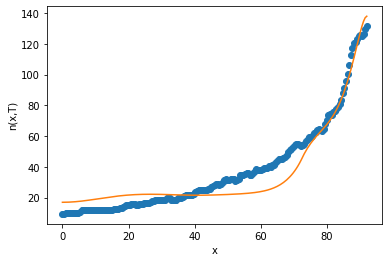

10
after perturb [4.20859843370148, 62.02465625369222, 24388.46823970327, 0.5746611573535871, 53.01588539402853]
parameters [4.20859843370148, 62.02465625369222, 24388.46823970327, 0.5746611573535871, 53.01588539402853]
after perturb [8.542845326712591, 106.9208027688478, 23646.100292539137, 0.6172539407223476, 47.35601361799375]
parameters [8.542845326712591, 106.9208027688478, 23646.100292539137, 0.6172539407223476, 47.35601361799375]
oxigeno [6.59954479e-11 6.65389606e-11 6.81785055e-11 7.09412675e-11
 7.48731066e-11 8.00393959e-11 8.65262183e-11 9.44419433e-11
 1.03919215e-10 1.15117388e-10 1.28225460e-10 1.43465557e-10
 1.61097031e-10 1.81421263e-10 2.04787242e-10 2.31598049e-10
 2.62318351e-10 2.97483055e-10 3.37707289e-10 3.83697884e-10
 4.36266593e-10 4.96345280e-10 5.65003365e-10 6.43467857e-10
 7.33146340e-10 8.35653331e-10 9.52840509e-10 1.08683135e-09
 1.24006082e-09 1.41532078e-09 1.61581208e-09 1.84520397e-09
 2.10770230e-09 2.40812724e-09 2.75200235e-09 3.14565615e-09
 3

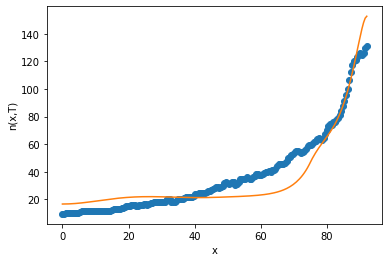

11
after perturb [12.060864268927606, 151.4271537327843, 15395.85599685999, 0.8130161594298637, 63.59315866155004]
parameters [12.060864268927606, 151.4271537327843, 15395.85599685999, 0.8130161594298637, 63.59315866155004]
after perturb [5.985993448513872, 79.17755093336223, 22613.630284746672, 0.43720472480622696, 30.521933548148514]
parameters [5.985993448513872, 79.17755093336223, 22613.630284746672, 0.43720472480622696, 30.521933548148514]
oxigeno [9.80682780e-10 9.80274453e-10 9.79065816e-10 9.77105949e-10
 9.74476857e-10 9.71293796e-10 9.67705778e-10 9.63896324e-10
 9.60084501e-10 9.56526348e-10 9.53516765e-10 9.51391964e-10
 9.50532618e-10 9.51367799e-10 9.54379884e-10 9.60110540e-10
 9.69168002e-10 9.82235791e-10 1.00008312e-09 1.02357719e-09
 1.05369769e-09 1.09155377e-09 1.13840384e-09 1.19567860e-09
 1.26500783e-09 1.34825128e-09 1.44753449e-09 1.56529008e-09
 1.70430528e-09 1.86777678e-09 2.05937369e-09 2.28331002e-09
 2.54442781e-09 2.84829262e-09 3.20130302e-09 3.6108160

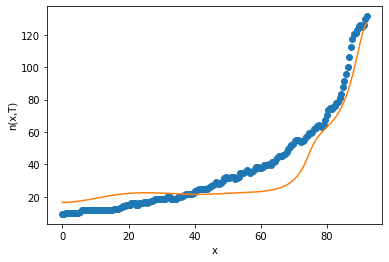

12
after perturb [8.9615047575257, 139.8025362612462, 21375.67619023345, 0.8437474155855496, 43.213835438107736]
parameters [8.9615047575257, 139.8025362612462, 21375.67619023345, 0.8437474155855496, 43.213835438107736]
oxigeno [6.70326688e-11 6.75590501e-11 6.91465161e-11 7.18201801e-11
 7.56223933e-11 8.06134972e-11 8.68728977e-11 9.45004787e-11
 1.03618385e-10 1.14373204e-10 1.26938591e-10 1.41518384e-10
 1.58350267e-10 1.77710054e-10 1.99916666e-10 2.25337902e-10
 2.54397109e-10 2.87580867e-10 3.25447848e-10 3.68639002e-10
 4.17889250e-10 4.74040926e-10 5.38059190e-10 6.11049698e-10
 6.94278869e-10 7.89197093e-10 8.97465317e-10 1.02098548e-09
 1.16193535e-09 1.32280837e-09 1.50645921e-09 1.71615589e-09
 1.95563933e-09 2.22919131e-09 2.54171219e-09 2.89880957e-09
 3.30689944e-09 3.77332162e-09 4.30647135e-09 4.91594932e-09
 5.61273256e-09 6.40936918e-09 7.32019999e-09 8.36161089e-09
 9.55231989e-09 1.09137037e-08 1.24701690e-08 1.42495746e-08
 1.62837108e-08 1.86088444e-08 2.1266337

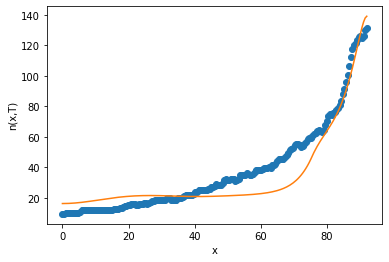

13
after perturb [3.1064384050253446, 126.374516518783, 17932.01139666291, 1.093753739614555, 29.909313815970613]
parameters [3.1064384050253446, 126.374516518783, 17932.01139666291, 1.093753739614555, 29.909313815970613]
after perturb [1.527400675385354, 99.8003229239308, 26456.315100919557, 1.3436599966974934, 42.062176983544305]
parameters [1.527400675385354, 99.8003229239308, 26456.315100919557, 1.3436599966974934, 42.062176983544305]
oxigeno [4.19306525e-16 4.26033448e-16 4.46440309e-16 4.81214412e-16
 5.31531607e-16 5.99102836e-16 6.86241448e-16 7.95953672e-16
 9.32055653e-16 1.09932156e-15 1.30366862e-15 1.55238629e-15
 1.85441852e-15 2.22070994e-15 2.66462896e-15 3.20248409e-15
 3.85415357e-15 4.64385376e-15 5.60107896e-15 6.76175396e-15
 8.16965215e-15 9.87814466e-15 1.19523616e-14 1.44718631e-14
 1.75339377e-14 2.12576669e-14 2.57889210e-14 3.13064862e-14
 3.80295636e-14 4.62269410e-14 5.62282151e-14 6.84375437e-14
 8.33505347e-14 1.01575036e-13 1.23856778e-13 1.51111023e-13


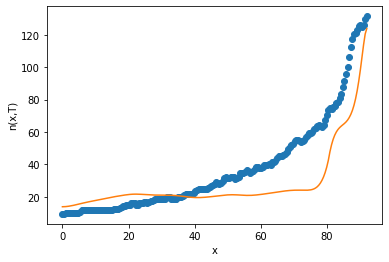

after perturb [12.418193613445311, 98.03558443666888, 22779.848908746553, -0.02410244934171235, 66.14281443561654]
parameters [12.418193613445311, 98.03558443666888, 22779.848908746553, -0.02410244934171235, 66.14281443561654]
after perturb [8.133936574132717, 104.5790929899385, 19926.90164459643, 0.2261217431094861, 30.887016264794084]
parameters [8.133936574132717, 104.5790929899385, 19926.90164459643, 0.2261217431094861, 30.887016264794084]
after perturb [-1.072879702558195, 178.47909034960526, 16546.77172251069, 0.6638602391589652, 16.622432375492053]
parameters [-1.072879702558195, 178.47909034960526, 16546.77172251069, 0.6638602391589652, 16.622432375492053]
after perturb [5.292419227342838, 133.78368704658197, 30056.5394267464, 0.7144799826534338, 35.75861974880686]
parameters [5.292419227342838, 133.78368704658197, 30056.5394267464, 0.7144799826534338, 35.75861974880686]
after perturb [10.011195414998264, 142.87739585918675, 36294.641247935375, 0.99262963271549, 43.048613537923

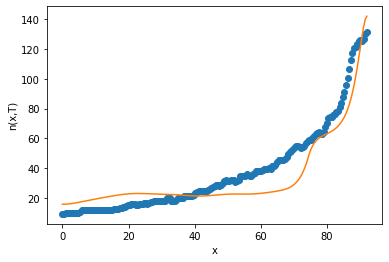

after perturb [8.116307375324814, 145.73540769870934, 24605.542331474677, 1.1078802511440662, 47.553531939017475]
parameters [8.116307375324814, 145.73540769870934, 24605.542331474677, 1.1078802511440662, 47.553531939017475]
oxigeno [4.28991734e-12 4.33024507e-12 4.45199376e-12 4.65747613e-12
 4.95060130e-12 5.33695799e-12 5.82393363e-12 6.42087205e-12
 7.13927345e-12 7.99304102e-12 8.99878004e-12 1.01761561e-11
 1.15483206e-11 1.31424134e-11 1.49901542e-11 1.71285351e-11
 1.96006321e-11 2.24565518e-11 2.57545372e-11 2.95622547e-11
 3.39582959e-11 3.90339235e-11 4.48951044e-11 5.16648752e-11
 5.94860917e-11 6.85246272e-11 7.89730885e-11 9.10551351e-11
 1.05030495e-10 1.21200794e-10 1.39916314e-10 1.61583851e-10
 1.86675821e-10 2.15740826e-10 2.49415909e-10 2.88440750e-10
 3.33674127e-10 3.86112971e-10 4.46914441e-10 5.17421460e-10
 5.99192279e-10 6.94034654e-10 8.04045375e-10 9.31655942e-10
 1.07968535e-09 1.25140104e-09 1.45058929e-09 1.68163644e-09
 1.94962264e-09 2.26042994e-09 2.62

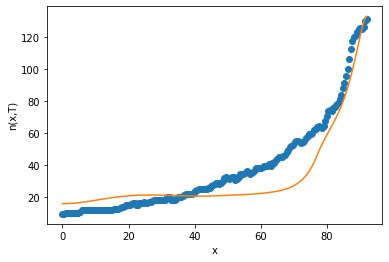

after perturb [9.054582377597466, 82.73740960079348, 26898.21684727812, 0.0541010079314721, 44.81445708497726]
parameters [9.054582377597466, 82.73740960079348, 26898.21684727812, 0.0541010079314721, 44.81445708497726]
oxigeno [1.22044052e-01 1.22006955e-01 1.21895844e-01 1.21711251e-01
 1.21454057e-01 1.21125486e-01 1.20727092e-01 1.20260747e-01
 1.19728623e-01 1.19133174e-01 1.18477117e-01 1.17763408e-01
 1.16995220e-01 1.16175916e-01 1.15309027e-01 1.14398225e-01
 1.13447299e-01 1.12460126e-01 1.11440651e-01 1.10392862e-01
 1.09320766e-01 1.08228368e-01 1.07119653e-01 1.05998564e-01
 1.04868988e-01 1.03734739e-01 1.02599545e-01 1.01467038e-01
 1.00340737e-01 9.92240502e-02 9.81202569e-02 9.70325098e-02
 9.59638276e-02 9.49170935e-02 9.38950540e-02 9.29003189e-02
 9.19353623e-02 9.10025259e-02 9.01040212e-02 8.92419349e-02
 8.84182331e-02 8.76347680e-02 8.68932834e-02 8.61954228e-02
 8.55427360e-02 8.49366874e-02 8.43786640e-02 8.38699841e-02
 8.34119053e-02 8.30056337e-02 8.26523320

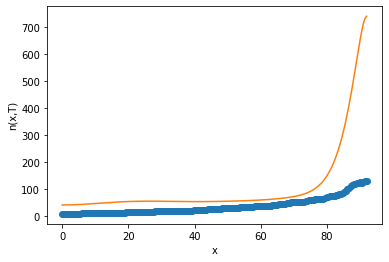

after perturb [0.8812886096331511, 73.05682748194263, 23316.366448107154, 0.4399319211828995, 24.67866654548246]
parameters [0.8812886096331511, 73.05682748194263, 23316.366448107154, 0.4399319211828995, 24.67866654548246]
oxigeno [1.22187994e-09 1.22021461e-09 1.21526428e-09 1.20716117e-09
 1.19611065e-09 1.18237256e-09 1.16624130e-09 1.14802882e-09
 1.12805317e-09 1.10663368e-09 1.08409163e-09 1.06075449e-09
 1.03696068e-09 1.01306277e-09 9.89427898e-10 9.66435459e-10
 9.44473480e-10 9.23935646e-10 9.05221058e-10 8.88738257e-10
 8.74914182e-10 8.64207781e-10 8.57127224e-10 8.54249217e-10
 8.56238847e-10 8.63868730e-10 8.78036820e-10 8.99783010e-10
 9.30305414e-10 9.70977902e-10 1.02337089e-09 1.08927769e-09
 1.17074867e-09 1.27013549e-09 1.39014728e-09 1.53392037e-09
 1.70510245e-09 1.90795169e-09 2.14745022e-09 2.42943110e-09
 2.76071692e-09 3.14926875e-09 3.60434453e-09 4.13666806e-09
 4.75861255e-09 5.48440624e-09 6.33037112e-09 7.31520815e-09
 8.46034299e-09 9.79034469e-09 1.1333

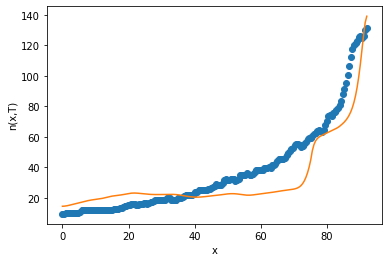

after perturb [3.745744400585634, 11.947318218114894, 29619.87402935267, -0.6450523162999917, 4.375144145749369]
parameters [3.745744400585634, 11.947318218114894, 29619.87402935267, -0.6450523162999917, 4.375144145749369]
after perturb [-0.004756288579637946, 162.68599335688234, 20116.756204332458, 0.6612629106974758, 35.01331745158343]
parameters [-0.004756288579637946, 162.68599335688234, 20116.756204332458, 0.6612629106974758, 35.01331745158343]
after perturb [14.008044549128712, 140.92925054683522, 33977.27479177331, 0.8163589147646313, 13.63451883259269]
parameters [14.008044549128712, 140.92925054683522, 33977.27479177331, 0.8163589147646313, 13.63451883259269]
after perturb [-0.12365076632835281, 122.89501886771208, 17791.170394390057, 1.3406147737284815, 46.15349868607221]
parameters [-0.12365076632835281, 122.89501886771208, 17791.170394390057, 1.3406147737284815, 46.15349868607221]
after perturb [4.111505623283103, -18.516740309858818, 17921.770734820002, 0.28891164869500346

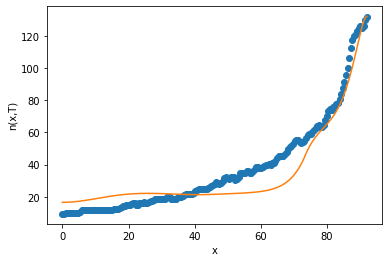

14
after perturb [7.115899889890608, 121.66563346853289, 30300.19086482586, 0.65873541760189, 20.235160779935345]
parameters [7.115899889890608, 121.66563346853289, 30300.19086482586, 0.65873541760189, 20.235160779935345]
after perturb [7.914157579676079, 67.06389706384063, 29788.261966743918, 0.7450280456325703, 34.32098625929871]
parameters [7.914157579676079, 67.06389706384063, 29788.261966743918, 0.7450280456325703, 34.32098625929871]
after perturb [9.381132201932989, 219.33841200976914, 28022.728160275445, 1.3180092228610922, 55.046554335270265]
parameters [9.381132201932989, 219.33841200976914, 28022.728160275445, 1.3180092228610922, 55.046554335270265]
after perturb [1.3421323465422264, 114.8843328752642, 27336.708790159893, -0.08547673118111915, -4.358444968246413]
parameters [1.3421323465422264, 114.8843328752642, 27336.708790159893, -0.08547673118111915, -4.358444968246413]
after perturb [5.447541769058471, 99.67626545904812, 20751.857919878217, 0.8062237049709863, 34.0183452

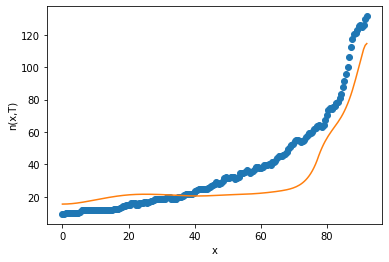

after perturb [9.168502915080945, 129.33089033680992, 20372.52139386324, 0.34737349417623903, 38.88288172164269]
parameters [9.168502915080945, 129.33089033680992, 20372.52139386324, 0.34737349417623903, 38.88288172164269]
oxigeno [1.67346249e-07 1.67885157e-07 1.69506473e-07 1.72224022e-07
 1.76060987e-07 1.81050122e-07 1.87234060e-07 1.94665704e-07
 2.03408715e-07 2.13538108e-07 2.25140938e-07 2.38317108e-07
 2.53180289e-07 2.69858972e-07 2.88497648e-07 3.09258138e-07
 3.32321081e-07 3.57887592e-07 3.86181100e-07 4.17449391e-07
 4.51966867e-07 4.90037039e-07 5.31995283e-07 5.78211864e-07
 6.29095275e-07 6.85095901e-07 7.46710044e-07 8.14484337e-07
 8.89020586e-07 9.70981072e-07 1.06109436e-06 1.16016163e-06
 1.26906367e-06 1.38876838e-06 1.52033916e-06 1.66494385e-06
 1.82386468e-06 1.99850896e-06 2.19042087e-06 2.40129417e-06
 2.63298616e-06 2.88753280e-06 3.16716520e-06 3.47432755e-06
 3.81169664e-06 4.18220303e-06 4.58905416e-06 5.03575937e-06
 5.52615712e-06 6.06444459e-06 6.6552

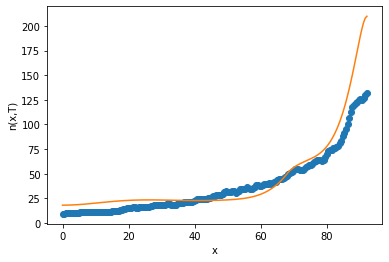

after perturb [1.4626826462531861, 137.9590833468291, 24051.529671242308, 0.8080383476995157, 42.98024458132311]
parameters [1.4626826462531861, 137.9590833468291, 24051.529671242308, 0.8080383476995157, 42.98024458132311]
oxigeno [9.53635073e-11 9.60365299e-11 9.80663094e-11 1.01485173e-10
 1.06347645e-10 1.12731419e-10 1.20738754e-10 1.30498300e-10
 1.42167406e-10 1.55934943e-10 1.72024713e-10 1.90699465e-10
 2.12265602e-10 2.37078616e-10 2.65549313e-10 2.98150918e-10
 3.35427180e-10 3.78001658e-10 4.26588441e-10 4.82004639e-10
 5.45185053e-10 6.17199459e-10 6.99272990e-10 7.92810026e-10
 8.99421994e-10 1.02095935e-09 1.15954803e-09 1.31763065e-09
 1.49801280e-09 1.70391520e-09 1.93903251e-09 2.20760049e-09
 2.51447315e-09 2.86521231e-09 3.26619210e-09 3.72472066e-09
 4.24918161e-09 4.84919669e-09 5.53581084e-09 6.32170027e-09
 7.22140363e-09 8.25157663e-09 9.43127117e-09 1.07822413e-08
 1.23292801e-08 1.41005953e-08 1.61282310e-08 1.84485497e-08
 2.11027869e-08 2.41376938e-08 2.7606

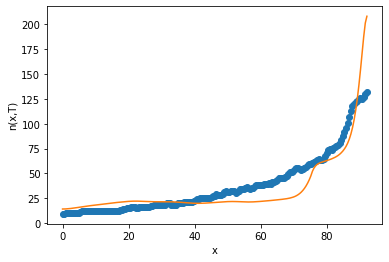

after perturb [10.234825748992638, 145.82790942638985, 20023.545804369445, 0.8121266777208732, 51.625747714706165]
parameters [10.234825748992638, 145.82790942638985, 20023.545804369445, 0.8121266777208732, 51.625747714706165]
after perturb [2.6750863893675008, 80.71139283907934, 17669.322867382944, -0.05406504560940373, 8.573284929895369]
parameters [2.6750863893675008, 80.71139283907934, 17669.322867382944, -0.05406504560940373, 8.573284929895369]
after perturb [8.358495600112498, 140.40212951583374, 19038.51768828984, 0.55553796040799, 41.568061060639145]
parameters [8.358495600112498, 140.40212951583374, 19038.51768828984, 0.55553796040799, 41.568061060639145]
after perturb [4.744048335875055, 20.707232425324683, 28295.470587123953, 0.36467774528555963, 23.318575922214453]
parameters [4.744048335875055, 20.707232425324683, 28295.470587123953, 0.36467774528555963, 23.318575922214453]
oxigeno [3.12215199e-08 3.11536210e-08 3.09509680e-08 3.06166609e-08
 3.01557615e-08 2.95751429e-08 

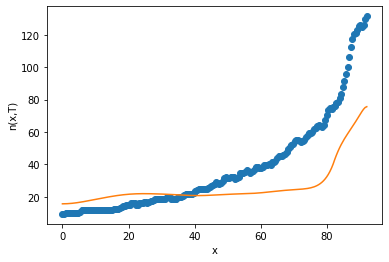

after perturb [6.296602891575492, 77.32238833431089, 20626.153314930685, -0.05710402096344985, 26.100289609611522]
parameters [6.296602891575492, 77.32238833431089, 20626.153314930685, -0.05710402096344985, 26.100289609611522]
after perturb [4.030978668662461, 109.79113520550659, 30464.340026807866, 0.6969486724821112, 45.502762834923494]
parameters [4.030978668662461, 109.79113520550659, 30464.340026807866, 0.6969486724821112, 45.502762834923494]
after perturb [8.98128024031303, 167.0863589826903, 31520.54004414825, 1.8374141804755182, 56.94215611853338]
parameters [8.98128024031303, 167.0863589826903, 31520.54004414825, 1.8374141804755182, 56.94215611853338]
after perturb [8.517199636093663, 104.96801855089888, 27926.695048498765, 1.0257295231422237, 45.26868077820196]
parameters [8.517199636093663, 104.96801855089888, 27926.695048498765, 1.0257295231422237, 45.26868077820196]
oxigeno [7.19696354e-14 7.29077944e-14 7.57467129e-14 8.05603993e-14
 8.74745011e-14 9.66698273e-14 1.083874

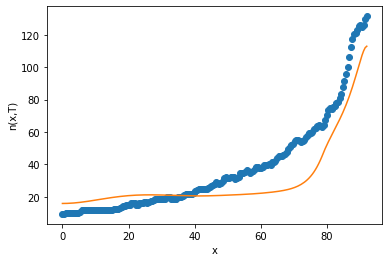

after perturb [4.5845274168784425, 36.14872210527365, 15008.600333988481, 0.5222396907562353, 56.06468704277404]
parameters [4.5845274168784425, 36.14872210527365, 15008.600333988481, 0.5222396907562353, 56.06468704277404]
after perturb [8.876084560674197, 263.1136783750118, 23053.788391882856, 0.8646362082848916, 32.36359224936227]
parameters [8.876084560674197, 263.1136783750118, 23053.788391882856, 0.8646362082848916, 32.36359224936227]
after perturb [11.758128138073786, 100.3347600265866, 31081.84741222066, -0.21690648232925525, -0.767191187374415]
parameters [11.758128138073786, 100.3347600265866, 31081.84741222066, -0.21690648232925525, -0.767191187374415]
after perturb [6.67217761573158, 103.25062015582404, 27777.59878557564, 0.9453478038246912, 28.72061393050977]
parameters [6.67217761573158, 103.25062015582404, 27777.59878557564, 0.9453478038246912, 28.72061393050977]
oxigeno [1.82478989e-13 1.84727997e-13 1.91530592e-13 2.03054975e-13
 2.19586530e-13 2.41535532e-13 2.69448265

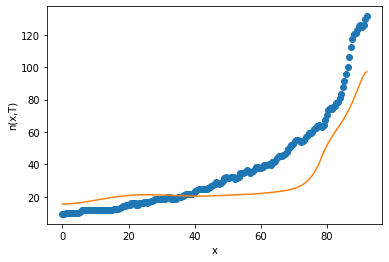

after perturb [4.9966055158517, 99.47659089349261, 25399.34159590874, 1.086860785242265, 28.887624273517712]
parameters [4.9966055158517, 99.47659089349261, 25399.34159590874, 1.086860785242265, 28.887624273517712]
oxigeno [1.20634586e-14 1.22357562e-14 1.27576046e-14 1.36440280e-14
 1.49205952e-14 1.66242316e-14 1.88043935e-14 2.15246440e-14
 2.48646845e-14 2.89229090e-14 3.38195683e-14 3.97006508e-14
 4.67426120e-14 5.51581124e-14 6.52029620e-14 7.71845063e-14
 9.14717440e-14 1.08507524e-13 1.28823239e-13 1.53056536e-13
 1.81972637e-13 2.16490025e-13 2.57711390e-13 3.06960892e-13
 3.65829046e-13 4.36226791e-13 5.20450596e-13 6.21260871e-13
 7.41976374e-13 8.86587846e-13 1.05989478e-12 1.26766997e-12
 1.51685737e-12 1.81581003e-12 2.17457595e-12 2.60524150e-12
 3.12234367e-12 3.74336476e-12 4.48932578e-12 5.38549771e-12
 6.46225374e-12 7.75609000e-12 9.31084738e-12 1.11791734e-11
 1.34242709e-11 1.61219885e-11 1.93633191e-11 2.32573853e-11
 2.79350047e-11 3.35529471e-11 4.02990166e-11

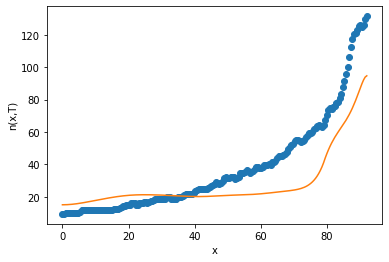

after perturb [6.980321155462869, 88.8353355449838, 17993.742276922636, 0.6040572079877548, 27.852193247285122]
parameters [6.980321155462869, 88.8353355449838, 17993.742276922636, 0.6040572079877548, 27.852193247285122]
after perturb [7.9844353199212845, 122.27682569308259, 26146.03554333835, 0.9029778726017178, 48.833584765336454]
parameters [7.9844353199212845, 122.27682569308259, 26146.03554333835, 0.9029778726017178, 48.833584765336454]
oxigeno [4.48012761e-12 4.52353776e-12 4.65461330e-12 4.87590771e-12
 5.19173792e-12 5.60827756e-12 6.13369036e-12 6.77830703e-12
 7.55484934e-12 8.47870688e-12 9.56827264e-12 1.08453452e-11
 1.23356066e-11 1.40691877e-11 1.60813322e-11 1.84131768e-11
 2.11126640e-11 2.42356089e-11 2.78469444e-11 3.20221735e-11
 3.68490622e-11 4.24296107e-11 4.88823494e-11 5.63450104e-11
 6.49776365e-11 7.49661968e-11 8.65267912e-11 9.99105385e-11
 1.15409256e-10 1.33362061e-10 1.54163031e-10 1.78270106e-10
 2.06215418e-10 2.38617271e-10 2.76194043e-10 3.19780301e-

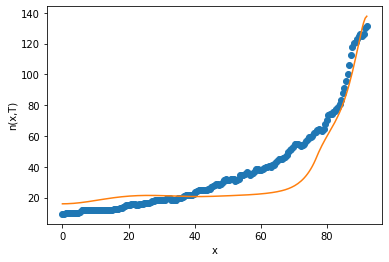

after perturb [6.837816919049054, 148.18785010186807, 28134.679836217252, 1.5103525822221813, 73.54086197319175]
parameters [6.837816919049054, 148.18785010186807, 28134.679836217252, 1.5103525822221813, 73.54086197319175]
after perturb [5.043665512790904, 141.77237812209555, 17497.966023570356, 0.8386072804766864, 65.31019926862265]
parameters [5.043665512790904, 141.77237812209555, 17497.966023570356, 0.8386072804766864, 65.31019926862265]
after perturb [9.423374966199875, 193.60613445685397, 18949.737608529333, 0.8326677185504285, 18.10815797654335]
parameters [9.423374966199875, 193.60613445685397, 18949.737608529333, 0.8326677185504285, 18.10815797654335]
after perturb [8.035575205389, 142.48880505373558, 17124.37751730966, 0.6507200980651305, 56.34893551143699]
parameters [8.035575205389, 142.48880505373558, 17124.37751730966, 0.6507200980651305, 56.34893551143699]
after perturb [4.460153930701223, 53.05073948863725, 21839.460631949783, 0.37440859801695336, 48.614052156717115]
pa

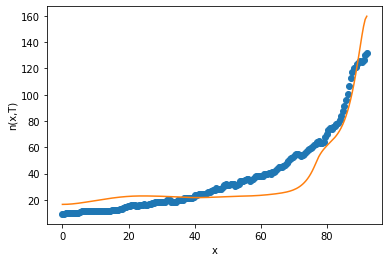

after perturb [0.7164548675033333, 137.2467752526928, 24848.052715596375, 1.2323228896872718, 28.287023713265246]
parameters [0.7164548675033333, 137.2467752526928, 24848.052715596375, 1.2323228896872718, 28.287023713265246]
oxigeno [4.56429275e-13 4.60953005e-13 4.74636647e-13 4.97818967e-13
 5.31069344e-13 5.75195396e-13 6.31254859e-13 7.00573465e-13
 7.84771394e-13 8.85801507e-13 1.00600260e-12 1.14817006e-12
 1.31564456e-12 1.51241730e-12 1.74324809e-12 2.01379212e-12
 2.33073242e-12 2.70191854e-12 3.13651823e-12 3.64519553e-12
 4.24033623e-12 4.93634692e-12 5.75005703e-12 6.70125042e-12
 7.81334491e-12 9.11422321e-12 1.06372000e-11 1.24220934e-11
 1.45163651e-11 1.69763050e-11 1.98682782e-11 2.32701060e-11
 2.72727189e-11 3.19822734e-11 3.75229503e-11 4.40406432e-11
 5.17077011e-11 6.07288215e-11 7.13481084e-11 8.38572271e-11
 9.86045142e-11 1.16004854e-10 1.36550154e-10 1.60820373e-10
 1.89495323e-10 2.23367857e-10 2.63359440e-10 3.10539473e-10
 3.66149748e-10 4.31635213e-10 5.08

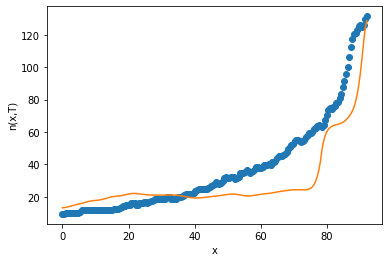

after perturb [8.544589129114174, 61.688041716458876, 27850.16572479733, 0.5346843597872544, 39.90770167333222]
parameters [8.544589129114174, 61.688041716458876, 27850.16572479733, 0.5346843597872544, 39.90770167333222]
oxigeno [1.93609984e-11 1.93394631e-11 1.92750870e-11 1.91685574e-11
 1.90210124e-11 1.88340306e-11 1.86096177e-11 1.83501903e-11
 1.80585581e-11 1.77379066e-11 1.73917804e-11 1.70240700e-11
 1.66390021e-11 1.62411379e-11 1.58353784e-11 1.54269814e-11
 1.50215912e-11 1.46252844e-11 1.42446344e-11 1.38867976e-11
 1.35596265e-11 1.32718120e-11 1.30330624e-11 1.28543228e-11
 1.27480442e-11 1.27285091e-11 1.28122249e-11 1.30183959e-11
 1.33694902e-11 1.38919160e-11 1.46168304e-11 1.55811031e-11
 1.68284648e-11 1.84108752e-11 2.03901502e-11 2.28398990e-11
 2.58478265e-11 2.95184721e-11 3.39764636e-11 3.93703841e-11
 4.58773646e-11 5.37085374e-11 6.31155081e-11 7.43980359e-11
 8.79131410e-11 1.04085903e-10 1.23422256e-10 1.46524148e-10
 1.74107485e-10 2.07023375e-10 2.462832

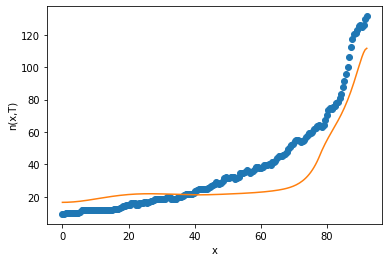

after perturb [8.962560959150062, 126.38203590567507, 25445.460655145194, 0.9133785913053231, 39.930589897258514]
parameters [8.962560959150062, 126.38203590567507, 25445.460655145194, 0.9133785913053231, 39.930589897258514]
oxigeno [6.54384688e-12 6.60601086e-12 6.79368711e-12 7.11045328e-12
 7.56235546e-12 8.15803513e-12 8.90891082e-12 9.82941856e-12
 1.09373166e-11 1.22540611e-11 1.38052610e-11 1.56212229e-11
 1.77375977e-11 2.01961428e-11 2.30456189e-11 2.63428388e-11
 3.01538942e-11 3.45555864e-11 3.96370927e-11 4.55019070e-11
 5.22700965e-11 6.00809253e-11 6.90959029e-11 7.95023246e-11
 9.15173839e-11 1.05392944e-10 1.21421076e-10 1.39940484e-10
 1.61343957e-10 1.86087007e-10 2.14697884e-10 2.47789180e-10
 2.86071274e-10 3.30367894e-10 3.81634143e-10 4.40977354e-10
 5.09681216e-10 5.89233678e-10 6.81359208e-10 7.88056071e-10
 9.11639393e-10 1.05479090e-09 1.22061632e-09 1.41271165e-09
 1.63523957e-09 1.89301757e-09 2.19161959e-09 2.53749304e-09
 2.93809370e-09 3.40204102e-09 3.93

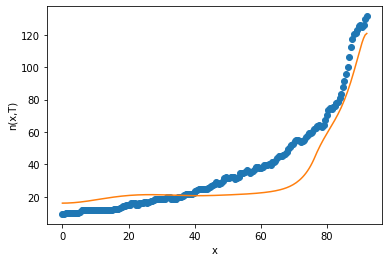

after perturb [5.933838864544699, 206.33666495378787, 18643.0353898259, 1.2328337831500087, 43.0124852134079]
parameters [5.933838864544699, 206.33666495378787, 18643.0353898259, 1.2328337831500087, 43.0124852134079]
after perturb [12.29281579087895, 130.9414094231901, 21709.556286443676, 0.10090100933214063, 35.22902088529328]
parameters [12.29281579087895, 130.9414094231901, 21709.556286443676, 0.10090100933214063, 35.22902088529328]
after perturb [6.952969374052822, 113.25603739879668, 20415.49404972819, 1.0143322320774053, 62.720926401219856]
parameters [6.952969374052822, 113.25603739879668, 20415.49404972819, 1.0143322320774053, 62.720926401219856]
after perturb [7.140301287100951, 61.3814818596184, 23423.102578383685, 0.23437908753443407, 18.223567733550528]
parameters [7.140301287100951, 61.3814818596184, 23423.102578383685, 0.23437908753443407, 18.223567733550528]
oxigeno [3.89789498e-06 3.89486861e-06 3.88580968e-06 3.87077842e-06
 3.84987431e-06 3.82323466e-06 3.79103279e-06

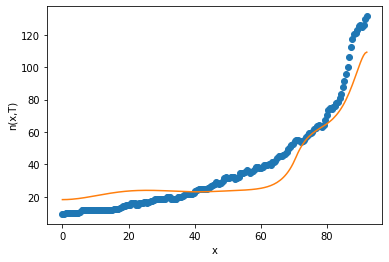

15
after perturb [11.575332804087981, 74.05199087811478, 29901.496594996992, 0.24122704358807556, 10.653235642723011]
parameters [11.575332804087981, 74.05199087811478, 29901.496594996992, 0.24122704358807556, 10.653235642723011]
after perturb [11.924783992409761, 105.67270978927132, 19887.005884702983, 0.046336637031540506, 10.880987261662643]
parameters [11.924783992409761, 105.67270978927132, 19887.005884702983, 0.046336637031540506, 10.880987261662643]
after perturb [10.585347562050677, 27.643931862934878, 21145.13443027249, 0.3430299249011805, 34.18929759947111]
parameters [10.585347562050677, 27.643931862934878, 21145.13443027249, 0.3430299249011805, 34.18929759947111]
after perturb [4.072735590039936, 66.46073449781106, 24561.52177297379, 1.106404849167773, 40.10670153014996]
parameters [4.072735590039936, 66.46073449781106, 24561.52177297379, 1.106404849167773, 40.10670153014996]
oxigeno [2.40234812e-18 2.45817432e-18 2.62825408e-18 2.92051997e-18
 3.34863004e-18 3.93264758e-18

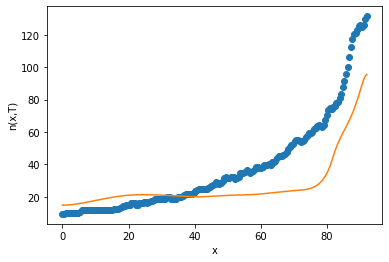

after perturb [8.707570549466004, 64.5706567525201, 14017.074729791417, 0.7802184332010308, 72.93764503542533]
parameters [8.707570549466004, 64.5706567525201, 14017.074729791417, 0.7802184332010308, 72.93764503542533]
after perturb [4.340515157132502, 132.09910998064996, 11969.58057015723, 0.4424171987407564, 23.689117881775392]
parameters [4.340515157132502, 132.09910998064996, 11969.58057015723, 0.4424171987407564, 23.689117881775392]
after perturb [10.972276282109942, 106.6981183187526, 28836.98675579775, -0.02188719076269141, -17.085104389253118]
parameters [10.972276282109942, 106.6981183187526, 28836.98675579775, -0.02188719076269141, -17.085104389253118]
after perturb [5.0133103422973315, 73.77778759161853, 11389.740872483222, 0.9545495418910237, 78.03890654060731]
parameters [5.0133103422973315, 73.77778759161853, 11389.740872483222, 0.9545495418910237, 78.03890654060731]
after perturb [7.36064618524697, 108.61240277447723, 27509.95998864622, 0.5166893989473178, 50.42643535175

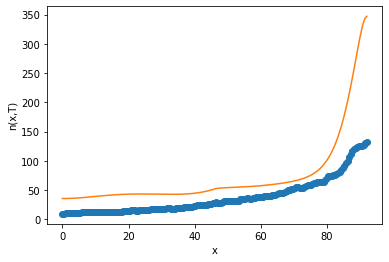

after perturb [8.085965461436418, 187.128410962317, 22021.005451844336, 0.6206088664370519, 21.711013341092364]
parameters [8.085965461436418, 187.128410962317, 22021.005451844336, 0.6206088664370519, 21.711013341092364]
after perturb [8.247265656464933, 96.63869862165494, 15716.885118645776, 0.043298321827206276, 27.17778561044054]
parameters [8.247265656464933, 96.63869862165494, 15716.885118645776, 0.043298321827206276, 27.17778561044054]
after perturb [6.627076162032607, 15.01128561877816, 27541.78868799302, 0.27189976875950994, 43.5518448393981]
parameters [6.627076162032607, 15.01128561877816, 27541.78868799302, 0.27189976875950994, 43.5518448393981]
oxigeno [1.45521650e-06 1.45219281e-06 1.44316531e-06 1.42826356e-06
 1.40769960e-06 1.38176222e-06 1.35080936e-06 1.31525885e-06
 1.27557798e-06 1.23227210e-06 1.18587296e-06 1.13692692e-06
 1.08598365e-06 1.03358550e-06 9.80257810e-07 9.26500569e-07
 8.72781306e-07 8.19529492e-07 7.67132368e-07 7.15932195e-07
 6.66224832e-07 6.1825

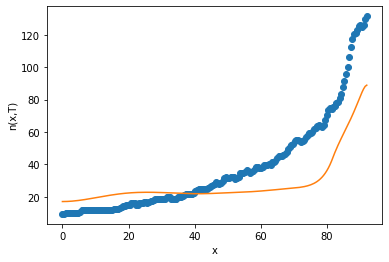

after perturb [-4.078194719763628, 94.9724665773521, 20928.985897112078, 0.5613055282153837, 30.019178307908227]
parameters [-4.078194719763628, 94.9724665773521, 20928.985897112078, 0.5613055282153837, 30.019178307908227]
after perturb [7.867108216742053, 67.01321971832837, 22951.341472253243, -0.384890324559251, 25.159807596172676]
parameters [7.867108216742053, 67.01321971832837, 22951.341472253243, -0.384890324559251, 25.159807596172676]
after perturb [13.629587699625333, 172.39320762776782, 24446.651997153644, 0.9971346071661883, 57.03798807993756]
parameters [13.629587699625333, 172.39320762776782, 24446.651997153644, 0.9971346071661883, 57.03798807993756]
after perturb [11.18982466669291, 104.74357983324894, 30578.558434577793, 0.48678230663146904, 15.538512811891346]
parameters [11.18982466669291, 104.74357983324894, 30578.558434577793, 0.48678230663146904, 15.538512811891346]
after perturb [12.200491836748062, 82.31584083971867, 35399.64063328284, 0.439749628393585, 42.1265955

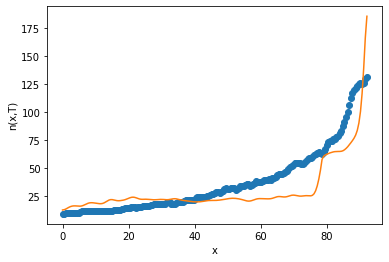

after perturb [5.102885089159626, 99.52898136692733, 32448.37155623926, 0.9193690062124482, 22.22055748977364]
parameters [5.102885089159626, 99.52898136692733, 32448.37155623926, 0.9193690062124482, 22.22055748977364]
after perturb [8.401066525621324, 44.96330753201988, 22894.720562508846, -0.5009883284263016, -4.669828154726748]
parameters [8.401066525621324, 44.96330753201988, 22894.720562508846, -0.5009883284263016, -4.669828154726748]
after perturb [7.994657291234366, 107.43074045693288, 26473.991949446772, 0.7176348170269341, 52.42382978724103]
parameters [7.994657291234366, 107.43074045693288, 26473.991949446772, 0.7176348170269341, 52.42382978724103]
after perturb [-3.1778029108901418, 1.3716096803857099, 17142.754724410686, -0.045869141884909204, 14.79167659922149]
parameters [-3.1778029108901418, 1.3716096803857099, 17142.754724410686, -0.045869141884909204, 14.79167659922149]
after perturb [11.270461905373699, 185.3688807417331, 29710.892140020398, 1.1523850593333522, 55.149

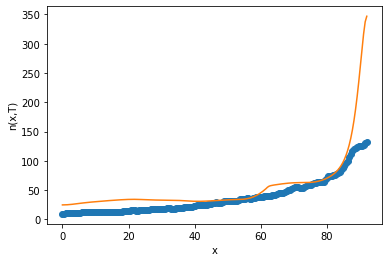

after perturb [1.2154664931322712, 83.9305839523795, 18455.251339053077, 1.0811377675241125, 49.71829015667139]
parameters [1.2154664931322712, 83.9305839523795, 18455.251339053077, 1.0811377675241125, 49.71829015667139]
after perturb [13.072353632005631, 215.56318037616364, 25685.421636897016, 1.0073207441718501, 45.36735277568973]
parameters [13.072353632005631, 215.56318037616364, 25685.421636897016, 1.0073207441718501, 45.36735277568973]
after perturb [7.696739976632114, 60.75477030300454, 28329.69869405041, 0.24134716500214198, 30.741767989552194]
parameters [7.696739976632114, 60.75477030300454, 28329.69869405041, 0.24134716500214198, 30.741767989552194]
oxigeno [3.64955062e-06 3.64667651e-06 3.63807322e-06 3.62379767e-06
 3.60394381e-06 3.57864141e-06 3.54805430e-06 3.51237822e-06
 3.47183826e-06 3.42668606e-06 3.37719670e-06 3.32366541e-06
 3.26640422e-06 3.20573852e-06 3.14200360e-06 3.07554138e-06
 3.00669718e-06 2.93581664e-06 2.86324300e-06 2.78931447e-06
 2.71436194e-06 2.

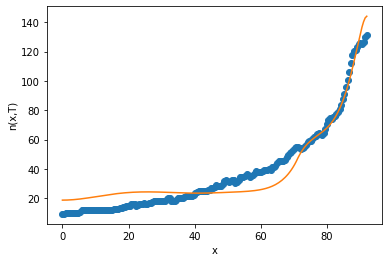

16
after perturb [8.052432646183451, 95.2876895817325, 30577.500006117167, 0.5584773781683238, 19.06664064217734]
parameters [8.052432646183451, 95.2876895817325, 30577.500006117167, 0.5584773781683238, 19.06664064217734]
after perturb [4.912211400471622, 83.54155612713345, 20617.981325266956, -0.06665814492461863, 36.57530175290607]
parameters [4.912211400471622, 83.54155612713345, 20617.981325266956, -0.06665814492461863, 36.57530175290607]
after perturb [10.591361853196348, 149.19566813618303, 25400.303447265465, 0.9599733808145404, 54.08830146876185]
parameters [10.591361853196348, 149.19566813618303, 25400.303447265465, 0.9599733808145404, 54.08830146876185]
after perturb [9.238391338408535, 97.06157362189975, 19096.31818069444, 0.48731239328310255, 17.00583049551661]
parameters [9.238391338408535, 97.06157362189975, 19096.31818069444, 0.48731239328310255, 17.00583049551661]
after perturb [10.020119195998445, 80.84295226662158, 27830.5055097437, 1.2064225088053517, 78.122591890499

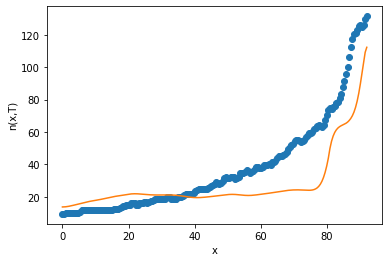

after perturb [13.265466544501912, 219.07734957338164, 27041.396365096363, 0.9796474633498189, 36.181200482032146]
parameters [13.265466544501912, 219.07734957338164, 27041.396365096363, 0.9796474633498189, 36.181200482032146]
after perturb [10.239237166489467, 112.80656723894171, 20395.370683989182, -0.0138748401957548, 14.908778554594399]
parameters [10.239237166489467, 112.80656723894171, 20395.370683989182, -0.0138748401957548, 14.908778554594399]
after perturb [7.383205291660458, 129.24681079808997, 24675.575111419268, 0.7255939265177455, 13.153064563246108]
parameters [7.383205291660458, 129.24681079808997, 24675.575111419268, 0.7255939265177455, 13.153064563246108]
oxigeno [1.27865333e-10 1.28842716e-10 1.31789935e-10 1.36752454e-10
 1.43806936e-10 1.53062577e-10 1.64663022e-10 1.78788885e-10
 1.95660913e-10 2.15543868e-10 2.38751177e-10 2.65650457e-10
 2.96669991e-10 3.32306295e-10 3.73132895e-10 4.19810490e-10
 4.73098665e-10 5.33869390e-10 6.03122525e-10 6.82003633e-10
 7.718

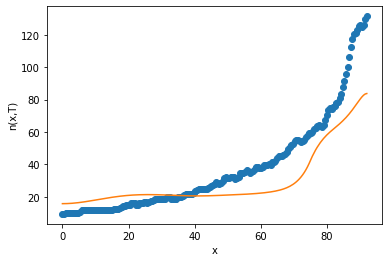

after perturb [9.839488591271188, 97.92766950502119, 22556.439781153367, 0.21950746831804624, 23.180717445092416]
parameters [9.839488591271188, 97.92766950502119, 22556.439781153367, 0.21950746831804624, 23.180717445092416]
oxigeno [7.80987115e-06 7.80768983e-06 7.80117649e-06 7.79042289e-06
 7.77558174e-06 7.75686639e-06 7.73455036e-06 7.70896684e-06
 7.68050817e-06 7.64962528e-06 7.61682719e-06 7.58268067e-06
 7.54780994e-06 7.51289672e-06 7.47868050e-06 7.44595912e-06
 7.41558987e-06 7.38849095e-06 7.36564351e-06 7.34809436e-06
 7.33695926e-06 7.33342697e-06 7.33876416e-06 7.35432109e-06
 7.38153833e-06 7.42195435e-06 7.47721430e-06 7.54907986e-06
 7.63944029e-06 7.75032482e-06 7.88391637e-06 8.04256672e-06
 8.22881328e-06 8.44539747e-06 8.69528482e-06 8.98168709e-06
 9.30808618e-06 9.67826041e-06 1.00963129e-05 1.05667024e-05
 1.10942771e-05 1.16843107e-05 1.23425419e-05 1.30752169e-05
 1.38891358e-05 1.47917022e-05 1.57909771e-05 1.68957375e-05
 1.81155387e-05 1.94607832e-05 2.09

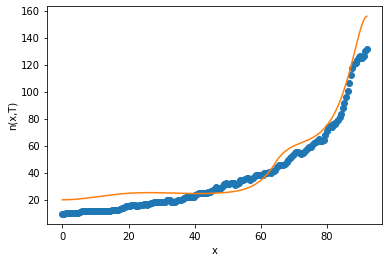

17
after perturb [-0.08327689189537058, 67.28662073249419, 19438.584692442942, -0.3722036518559275, 13.772501999077342]
parameters [-0.08327689189537058, 67.28662073249419, 19438.584692442942, -0.3722036518559275, 13.772501999077342]
after perturb [1.677060866574429, 82.25504166494997, 22584.73862401115, 0.2934390099541619, 13.688071974706073]
parameters [1.677060866574429, 82.25504166494997, 22584.73862401115, 0.2934390099541619, 13.688071974706073]
oxigeno [3.19264197e-07 3.18989204e-07 3.18168245e-07 3.16813230e-07
 3.14943513e-07 3.12585216e-07 3.09770382e-07 3.06536040e-07
 3.02923268e-07 2.98976303e-07 2.94741755e-07 2.90267934e-07
 2.85604308e-07 2.80801085e-07 2.75908920e-07 2.70978746e-07
 2.66061738e-07 2.61209408e-07 2.56473851e-07 2.51908129e-07
 2.47566783e-07 2.43506461e-07 2.39786628e-07 2.36470322e-07
 2.33624938e-07 2.31323027e-07 2.29643093e-07 2.28670420e-07
 2.28497953e-07 2.29227271e-07 2.30969702e-07 2.33847632e-07
 2.37996027e-07 2.43564221e-07 2.50717976e-07 2.5

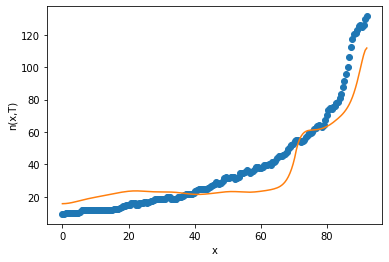

after perturb [-1.2250217228056801, 155.16961075246047, 23640.12173469493, 1.1155228738568888, 21.50150759740227]
parameters [-1.2250217228056801, 155.16961075246047, 23640.12173469493, 1.1155228738568888, 21.50150759740227]
after perturb [-0.31360647432257327, 94.08378897016472, 20463.996829197327, -0.02394717841652494, -18.539709089121317]
parameters [-0.31360647432257327, 94.08378897016472, 20463.996829197327, -0.02394717841652494, -18.539709089121317]
after perturb [4.500591360507, 42.64321882239835, 22345.299008323702, -0.05214596990054854, 26.89370066381621]
parameters [4.500591360507, 42.64321882239835, 22345.299008323702, -0.05214596990054854, 26.89370066381621]
after perturb [3.6427980262354014, 101.55464139191979, 25161.697045249795, 1.2948049691853847, 69.57104795951311]
parameters [3.6427980262354014, 101.55464139191979, 25161.697045249795, 1.2948049691853847, 69.57104795951311]
after perturb [8.839666640143195, 49.910877562277676, 32195.850882944625, 0.7163763998565695, 39

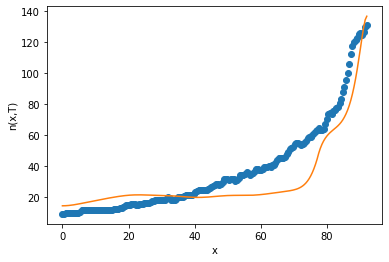

after perturb [8.27824435768936, 95.18714141801496, 19073.576236353336, -0.5077763798531392, -2.585498190543401]
parameters [8.27824435768936, 95.18714141801496, 19073.576236353336, -0.5077763798531392, -2.585498190543401]
after perturb [11.237765817805833, 146.64411243487382, 24853.000075565666, 0.7294797577619849, 56.881929370188715]
parameters [11.237765817805833, 146.64411243487382, 24853.000075565666, 0.7294797577619849, 56.881929370188715]
after perturb [8.764209162218307, 119.78645317514224, 28407.66100905788, 0.3851670143009617, 27.905720030170265]
parameters [8.764209162218307, 119.78645317514224, 28407.66100905788, 0.3851670143009617, 27.905720030170265]
oxigeno [3.47289047e-08 3.48707891e-08 3.52978921e-08 3.60145789e-08
 3.70281788e-08 3.83490663e-08 3.99907764e-08 4.19701549e-08
 4.43075452e-08 4.70270147e-08 5.01566214e-08 5.37287257e-08
 5.77803501e-08 6.23535899e-08 6.74960806e-08 7.32615264e-08
 7.97102961e-08 8.69100919e-08 9.49366997e-08 1.03874827e-07
 1.13819039e-0

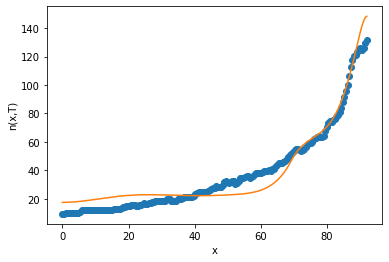

18
after perturb [5.736350157863147, 132.15465244280716, 20192.189673722438, 0.4754314910108558, 35.446536774706516]
parameters [5.736350157863147, 132.15465244280716, 20192.189673722438, 0.4754314910108558, 35.446536774706516]
oxigeno [1.26407306e-08 1.27037618e-08 1.28935100e-08 1.32119473e-08
 1.36623875e-08 1.42495285e-08 1.49795102e-08 1.58599915e-08
 1.69002456e-08 1.81112747e-08 1.95059464e-08 2.10991522e-08
 2.29079901e-08 2.49519746e-08 2.72532746e-08 2.98369840e-08
 3.27314264e-08 3.59684987e-08 3.95840580e-08 4.36183543e-08
 4.81165171e-08 5.31290992e-08 5.87126853e-08 6.49305719e-08
 7.18535267e-08 7.95606358e-08 8.81402477e-08 9.76910252e-08
 1.08323117e-07 1.20159457e-07 1.33337214e-07 1.48009398e-07
 1.64346637e-07 1.82539160e-07 2.02798978e-07 2.25362312e-07
 2.50492270e-07 2.78481808e-07 3.09657010e-07 3.44380699e-07
 3.83056435e-07 4.26132920e-07 4.74108868e-07 5.27538373e-07
 5.87036833e-07 6.53287494e-07 7.27048655e-07 8.09161638e-07
 9.00559566e-07 1.00227705e-06 1

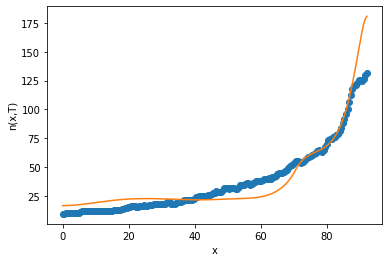

19
after perturb [6.819260864191932, 126.69180322172389, 25841.74785503615, 0.0638390053940816, -1.531150114957125]
parameters [6.819260864191932, 126.69180322172389, 25841.74785503615, 0.0638390053940816, -1.531150114957125]
after perturb [6.87277918120709, 106.57688720440743, 25935.36634200799, 0.2537164665272701, 22.52025368851239]
parameters [6.87277918120709, 106.57688720440743, 25935.36634200799, 0.2537164665272701, 22.52025368851239]
oxigeno [1.94374860e-06 1.94394119e-06 1.94453348e-06 1.94556898e-06
 1.94712031e-06 1.94928931e-06 1.95220722e-06 1.95603501e-06
 1.96096370e-06 1.96721490e-06 1.97504142e-06 1.98472816e-06
 1.99659307e-06 2.01098848e-06 2.02830259e-06 2.04896134e-06
 2.07343057e-06 2.10221859e-06 2.13587910e-06 2.17501467e-06
 2.22028055e-06 2.27238915e-06 2.33211499e-06 2.40030032e-06
 2.47786134e-06 2.56579521e-06 2.66518770e-06 2.77722179e-06
 2.90318701e-06 3.04448984e-06 3.20266502e-06 3.37938801e-06
 3.57648856e-06 3.79596556e-06 4.04000326e-06 4.31098887e-0

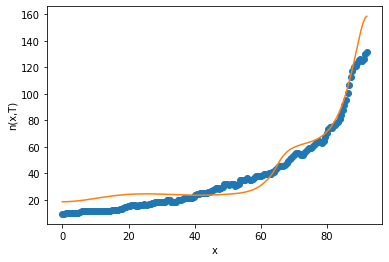

20
parameters [3.866029622594124, 39.45884297768097, 26450.753836752097, 0.11304803861126134, 15.394024819465447]
parameters [7.317691591367797, 82.30342215990244, 21521.703016299452, 0.4604544158094681, 48.97200207669055]
parameters [6.603636845284291, 104.060239240909, 22904.05504481776, 0.29822018853740984, 25.392160293720814]
parameters [2.539233893490181, 55.45389510138327, 26871.47085554392, 0.22295183995666942, 18.931864609636484]
parameters [5.233276042889886, 141.57332498315816, 20461.747941591253, 0.30042044028324055, 19.518739477217853]
parameters [8.05114078797554, 75.50622708997518, 26362.854134154033, 0.12872393030511953, 16.76889917091891]
parameters [6.212509391304447, 148.6783178953013, 23149.143354530166, 0.6863539288095035, 36.39527829508306]
parameters [6.031624847105206, 56.15128960780722, 25737.72770085458, 0.19491278573465443, 34.04478766112628]
parameters [9.490113648441652, 134.94221682522996, 22248.18048160108, 0.9040370480845805, 46.30051588063973]
parameters

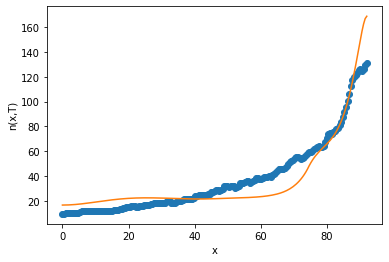

after perturb [4.802702135129277, 154.07722479663533, 23010.44441317181, 0.39707172364368903, 18.35730571948708]
parameters [4.802702135129277, 154.07722479663533, 23010.44441317181, 0.39707172364368903, 18.35730571948708]
after perturb [5.7892871148226694, 58.50388625129089, 24140.236181531975, -0.1880060021199363, 9.1277341319844]
parameters [5.7892871148226694, 58.50388625129089, 24140.236181531975, -0.1880060021199363, 9.1277341319844]
after perturb [11.83694841509666, 45.13802357796567, 31802.696903074153, 0.07598051759915293, 28.436612999072295]
parameters [11.83694841509666, 45.13802357796567, 31802.696903074153, 0.07598051759915293, 28.436612999072295]
after perturb [4.6057323392138105, 91.26566561577383, 16732.105015519854, 0.27765956597470787, 47.74336085832962]
parameters [4.6057323392138105, 91.26566561577383, 16732.105015519854, 0.27765956597470787, 47.74336085832962]
after perturb [10.134439889033768, 49.91807972274274, 24455.24894537775, 0.40569852283455554, 46.936027947

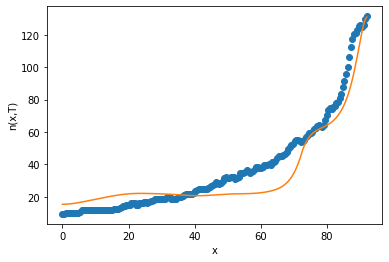

after perturb [6.94905414735377, 93.42018806578366, 21689.202459912314, 0.3373160367506163, 27.025320527181474]
parameters [6.94905414735377, 93.42018806578366, 21689.202459912314, 0.3373160367506163, 27.025320527181474]
oxigeno [5.62042072e-08 5.62066577e-08 5.62147103e-08 5.62304712e-08
 5.62574613e-08 5.63006331e-08 5.63663948e-08 5.64626437e-08
 5.65988098e-08 5.67859117e-08 5.70366258e-08 5.73653726e-08
 5.77884213e-08 5.83240158e-08 5.89925249e-08 5.98166210e-08
 6.08214887e-08 6.20350691e-08 6.34883426e-08 6.52156551e-08
 6.72550928e-08 6.96489099e-08 7.24440163e-08 7.56925306e-08
 7.94524062e-08 8.37881386e-08 8.87715608e-08 9.44827396e-08
 1.01010980e-07 1.08455952e-07 1.16928951e-07 1.26554310e-07
 1.37470972e-07 1.49834249e-07 1.63817782e-07 1.79615726e-07
 1.97445179e-07 2.17548890e-07 2.40198267e-07 2.65696725e-07
 2.94383396e-07 3.26637264e-07 3.62881743e-07 4.03589763e-07
 4.49289415e-07 5.00570204e-07 5.58089997e-07 6.22582708e-07
 6.94866830e-07 7.75854882e-07 8.665638

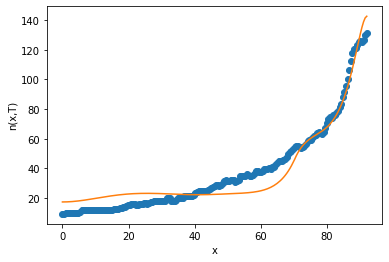

1
after perturb [4.387680451463269, 44.11189095485224, 26997.452982767587, 0.155526595484762, 37.547651009677125]
parameters [4.387680451463269, 44.11189095485224, 26997.452982767587, 0.155526595484762, 37.547651009677125]
oxigeno [2.02715000e-04 2.02539395e-04 2.02014050e-04 2.01143354e-04
 1.99934518e-04 1.98397433e-04 1.96544477e-04 1.94390272e-04
 1.91951417e-04 1.89246194e-04 1.86294256e-04 1.83116317e-04
 1.79733841e-04 1.76168752e-04 1.72443152e-04 1.68579075e-04
 1.64598255e-04 1.60521940e-04 1.56370721e-04 1.52164399e-04
 1.47921875e-04 1.43661070e-04 1.39398864e-04 1.35151056e-04
 1.30932338e-04 1.26756290e-04 1.22635375e-04 1.18580958e-04
 1.14603314e-04 1.10711660e-04 1.06914176e-04 1.03218039e-04
 9.96294586e-05 9.61537098e-05 9.27951756e-05 8.95573859e-05
 8.64430618e-05 8.34541607e-05 8.05919234e-05 7.78569240e-05
 7.52491202e-05 7.27679072e-05 7.04121709e-05 6.81803441e-05
 6.60704625e-05 6.40802211e-05 6.22070310e-05 6.04480758e-05
 5.88003663e-05 5.72607947e-05 5.5826

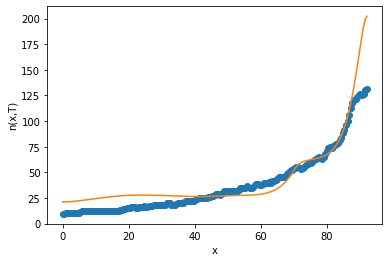

after perturb [1.3793918673643182, 106.66005902789524, 22632.372556170507, 0.6215701380522148, 33.812279428918615]
parameters [1.3793918673643182, 106.66005902789524, 22632.372556170507, 0.6215701380522148, 33.812279428918615]
oxigeno [6.43890875e-11 6.48855336e-11 6.63834410e-11 6.89086785e-11
 7.25049040e-11 7.72343886e-11 8.31791912e-11 9.04427087e-11
 9.91516380e-11 1.09458392e-10 1.21544020e-10 1.35621685e-10
 1.51940744e-10 1.70791482e-10 1.92510545e-10 2.17487147e-10
 2.46170156e-10 2.79076200e-10 3.16799039e-10 3.60020498e-10
 4.09523341e-10 4.66206515e-10 5.31103213e-10 6.05402173e-10
 6.90472588e-10 7.87892903e-10 8.99483746e-10 1.02734523e-09
 1.17389898e-09 1.34193544e-09 1.53466740e-09 1.75579115e-09
 2.00955706e-09 2.30085186e-09 2.63529518e-09 3.01935289e-09
 3.46046948e-09 3.96722132e-09 4.54949209e-09 5.21867075e-09
 5.98787243e-09 6.87218245e-09 7.88892444e-09 9.05795492e-09
 1.04019887e-08 1.19469621e-08 1.37224430e-08 1.57621010e-08
 1.81042497e-08 2.07924789e-08 2.

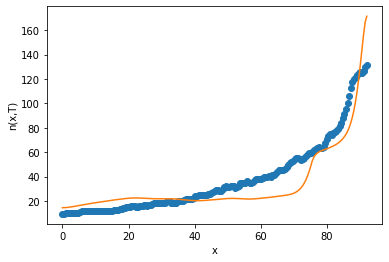

after perturb [11.337496798609454, 170.39462908159757, 27610.58576698774, 0.711228490401005, 28.651688970206244]
parameters [11.337496798609454, 170.39462908159757, 27610.58576698774, 0.711228490401005, 28.651688970206244]
after perturb [10.596126981416539, 79.57220446865884, 20631.395211045747, 0.2963349090275378, 35.84431066174015]
parameters [10.596126981416539, 79.57220446865884, 20631.395211045747, 0.2963349090275378, 35.84431066174015]
after perturb [8.19816545536267, 81.86074228108643, 26552.020229485963, -0.10464145923880158, 9.018859902143198]
parameters [8.19816545536267, 81.86074228108643, 26552.020229485963, -0.10464145923880158, 9.018859902143198]
after perturb [5.174167775748105, 55.835661792923034, 27988.518389666984, 0.2748195050503152, 17.357383570617184]
parameters [5.174167775748105, 55.835661792923034, 27988.518389666984, 0.2748195050503152, 17.357383570617184]
oxigeno [7.45257758e-07 7.44528568e-07 7.42346949e-07 7.38730649e-07
 7.33708884e-07 7.27321811e-07 7.1961

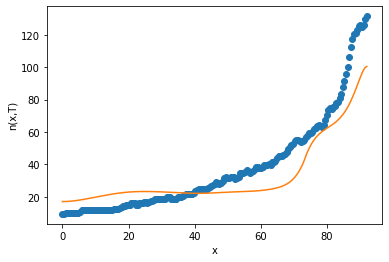

after perturb [3.596692935786712, 13.688686118339547, 29219.43972013715, 0.2588539532648694, 40.279774354964594]
parameters [3.596692935786712, 13.688686118339547, 29219.43972013715, 0.2588539532648694, 40.279774354964594]
after perturb [9.908472025843448, 100.89050291069215, 26443.058788527003, 0.790504776601061, 45.11909825080948]
parameters [9.908472025843448, 100.89050291069215, 26443.058788527003, 0.790504776601061, 45.11909825080948]
oxigeno [1.38976068e-12 1.40513785e-12 1.45160788e-12 1.53019427e-12
 1.64262963e-12 1.79139657e-12 1.97978629e-12 2.21197646e-12
 2.49313033e-12 2.82951943e-12 3.22867308e-12 3.69955837e-12
 4.25279524e-12 4.90091183e-12 5.65864678e-12 6.54330589e-12
 7.57518211e-12 8.77804942e-12 1.01797430e-11 1.18128400e-11
 1.37154584e-11 1.59321935e-11 1.85152150e-11 2.15255533e-11
 2.50346053e-11 2.91258985e-11 3.38971556e-11 3.94627113e-11
 4.59563408e-11 5.35345684e-11 6.23805369e-11 7.27085333e-11
 8.47692775e-11 9.88561042e-11 1.15312184e-10 1.34538958e-10

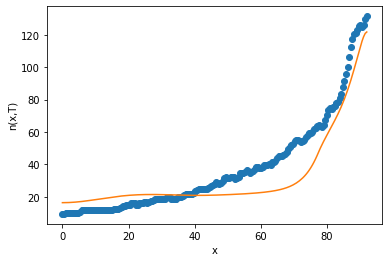

after perturb [2.3972532051264883, 72.43070662769159, 26435.784293929697, 0.44126763762935284, 24.821438422079904]
parameters [2.3972532051264883, 72.43070662769159, 26435.784293929697, 0.44126763762935284, 24.821438422079904]
oxigeno [1.01457255e-09 1.01343934e-09 1.01005772e-09 1.00448127e-09
 9.96797853e-10 9.87127581e-10 9.75620158e-10 9.62451880e-10
 9.47822449e-10 9.31951850e-10 9.15077499e-10 8.97451855e-10
 8.79340651e-10 8.61021859e-10 8.42785500e-10 8.24934356e-10
 8.07785634e-10 7.91673613e-10 7.76953311e-10 7.64005186e-10
 7.53240928e-10 7.45110386e-10 7.40109733e-10 7.38790969e-10
 7.41772960e-10 7.49754198e-10 7.63527578e-10 7.83997511e-10
 8.12199754e-10 8.49324443e-10 8.96742818e-10 9.56038275e-10
 1.02904241e-09 1.11787683e-09 1.22500164e-09 1.35327157e-09
 1.50600082e-09 1.68703799e-09 1.90085229e-09 2.15263278e-09
 2.44840232e-09 2.79514815e-09 3.20097156e-09 3.67525919e-09
 4.22887913e-09 4.87440556e-09 5.62637625e-09 6.50158822e-09
 7.51943760e-09 8.70231098e-09 1.

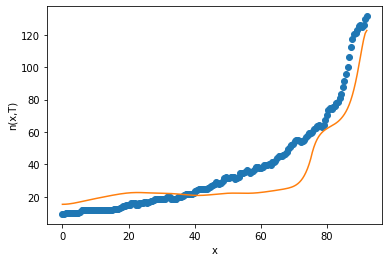

after perturb [9.748771799339758, 186.50392282735996, 18188.335195220392, 0.7817174644440654, 43.4124872103311]
parameters [9.748771799339758, 186.50392282735996, 18188.335195220392, 0.7817174644440654, 43.4124872103311]
after perturb [4.360376161511034, 31.44225074376866, 27485.239228625433, 0.5971222438967657, 30.892634253193094]
parameters [4.360376161511034, 31.44225074376866, 27485.239228625433, 0.5971222438967657, 30.892634253193094]
oxigeno [3.75569817e-12 3.74737614e-12 3.72254171e-12 3.68158567e-12
 3.62514558e-12 3.55408584e-12 3.46947135e-12 3.37253601e-12
 3.26464764e-12 3.14727090e-12 3.02192988e-12 2.89017177e-12
 2.75353297e-12 2.61350855e-12 2.47152591e-12 2.32892308e-12
 2.18693173e-12 2.04666494e-12 1.90910945e-12 1.77512194e-12
 1.64542891e-12 1.52062949e-12 1.40120077e-12 1.28750497e-12
 1.17979800e-12 1.07823893e-12 9.82900035e-13 8.93776973e-13
 8.10798939e-13 7.33838525e-13 6.62721127e-13 5.97233799e-13
 5.37133446e-13 4.82154326e-13 4.32014814e-13 3.86423434e-13

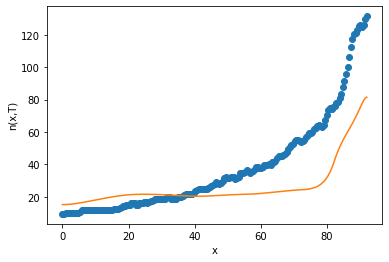

after perturb [7.007598563465459, 170.16189176567607, 26009.611839690424, 0.3789701917353912, 8.049626828978578]
parameters [7.007598563465459, 170.16189176567607, 26009.611839690424, 0.3789701917353912, 8.049626828978578]
after perturb [12.419595838911613, 117.56403558470907, 24728.982487509264, 0.4787714486711452, 26.605925017820113]
parameters [12.419595838911613, 117.56403558470907, 24728.982487509264, 0.4787714486711452, 26.605925017820113]
after perturb [7.844232837060998, 124.03652879192447, 23975.716143164, 0.3784092242124996, 26.779661987381868]
parameters [7.844232837060998, 124.03652879192447, 23975.716143164, 0.3784092242124996, 26.779661987381868]
oxigeno [5.62919686e-08 5.65153155e-08 5.71875022e-08 5.83149893e-08
 5.99086214e-08 6.19837435e-08 6.45603649e-08 6.76633736e-08
 7.13228027e-08 7.55741509e-08 8.04587622e-08 8.60242668e-08
 9.23250888e-08 9.94230258e-08 1.07387906e-07 1.16298331e-07
 1.26242507e-07 1.37319182e-07 1.49638689e-07 1.63324110e-07
 1.78512574e-07 1.

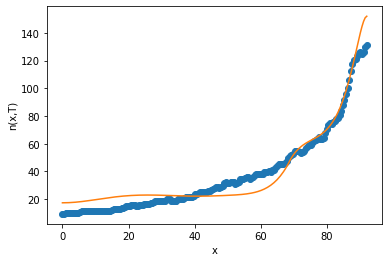

2
after perturb [6.308169276844785, 137.9763725103473, 25899.51684452067, 0.22349962883703217, 20.922455373048976]
parameters [6.308169276844785, 137.9763725103473, 25899.51684452067, 0.22349962883703217, 20.922455373048976]
oxigeno [1.21458379e-05 1.21589884e-05 1.21985389e-05 1.22647865e-05
 1.23582281e-05 1.24795619e-05 1.26296911e-05 1.28097274e-05
 1.30209958e-05 1.32650412e-05 1.35436345e-05 1.38587818e-05
 1.42127331e-05 1.46079934e-05 1.50473349e-05 1.55338109e-05
 1.60707709e-05 1.66618779e-05 1.73111274e-05 1.80228682e-05
 1.88018256e-05 1.96531265e-05 2.05823267e-05 2.15954412e-05
 2.26989768e-05 2.38999668e-05 2.52060097e-05 2.66253100e-05
 2.81667221e-05 2.98397983e-05 3.16548391e-05 3.36229478e-05
 3.57560887e-05 3.80671487e-05 4.05700040e-05 4.32795899e-05
 4.62119758e-05 4.93844449e-05 5.28155788e-05 5.65253469e-05
 6.05352024e-05 6.48681834e-05 6.95490208e-05 7.46042529e-05
 8.00623471e-05 8.59538297e-05 9.23114237e-05 9.91701960e-05
 1.06567714e-04 1.14544211e-04 1.23

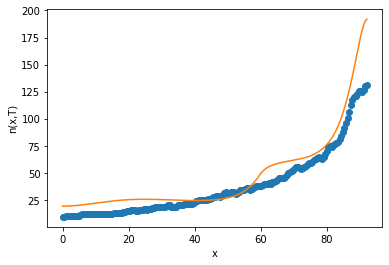

after perturb [8.236753008379685, 214.90827896019954, 17303.11554070338, 0.5521293156339502, 32.2984057210506]
parameters [8.236753008379685, 214.90827896019954, 17303.11554070338, 0.5521293156339502, 32.2984057210506]
after perturb [1.2392896054798626, 39.29667229125813, 23380.145647844336, -0.22336521240050636, 1.4376029231396394]
parameters [1.2392896054798626, 39.29667229125813, 23380.145647844336, -0.22336521240050636, 1.4376029231396394]
after perturb [3.0152135527651733, 88.81668075689888, 20048.653826422116, 0.4052139272746683, 47.77959607814688]
parameters [3.0152135527651733, 88.81668075689888, 20048.653826422116, 0.4052139272746683, 47.77959607814688]
oxigeno [5.30252958e-09 5.30168169e-09 5.29924300e-09 5.29552822e-09
 5.29106113e-09 5.28657367e-09 5.28300531e-09 5.28150299e-09
 5.28342234e-09 5.29033081e-09 5.30401327e-09 5.32648087e-09
 5.35998380e-09 5.40702851e-09 5.47040023e-09 5.55319122e-09
 5.65883552e-09 5.79115082e-09 5.95438820e-09 6.15329051e-09
 6.39316035e-09 

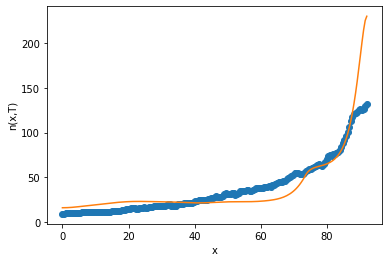

after perturb [5.822902696921178, 11.010571132070211, 26275.917769359585, 0.10360113439117544, 22.7294301529759]
parameters [5.822902696921178, 11.010571132070211, 26275.917769359585, 0.10360113439117544, 22.7294301529759]
oxigeno [1.12380278e-03 1.12231099e-03 1.11785328e-03 1.11048224e-03
 1.10028411e-03 1.08737668e-03 1.07190657e-03 1.05404581e-03
 1.03398802e-03 1.01194425e-03 9.88138600e-04 9.62803895e-04
 9.36177351e-04 9.08496541e-04 8.79995647e-04 8.50902122e-04
 8.21433801e-04 7.91796510e-04 7.62182163e-04 7.32767355e-04
 7.03712428e-04 6.75160956e-04 6.47239621e-04 6.20058424e-04
 5.93711170e-04 5.68276175e-04 5.43817150e-04 5.20384204e-04
 4.98014925e-04 4.76735506e-04 4.56561873e-04 4.37500802e-04
 4.19550994e-04 4.02704102e-04 3.86945682e-04 3.72256092e-04
 3.58611298e-04 3.45983620e-04 3.34342397e-04 3.23654588e-04
 3.13885304e-04 3.04998278e-04 2.96956290e-04 2.89721529e-04
 2.83255919e-04 2.77521407e-04 2.72480203e-04 2.68095005e-04
 2.64329176e-04 2.61146908e-04 2.5851

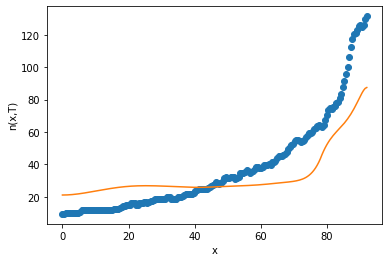

after perturb [9.156179870393522, 122.86700525304155, 18416.962964504073, 0.7958486188648224, 57.46655172834964]
parameters [9.156179870393522, 122.86700525304155, 18416.962964504073, 0.7958486188648224, 57.46655172834964]
after perturb [8.891657952369977, 90.86080019970143, 24113.17095573494, 0.06512584740941887, 17.607540711670687]
parameters [8.891657952369977, 90.86080019970143, 24113.17095573494, 0.06512584740941887, 17.607540711670687]
oxigeno [2.27865419e-02 2.27792697e-02 2.27574931e-02 2.27213319e-02
 2.26709869e-02 2.26067429e-02 2.25289750e-02 2.24381567e-02
 2.23347484e-02 2.22193204e-02 2.20924844e-02 2.19549141e-02
 2.18073167e-02 2.16504297e-02 2.14850283e-02 2.13119170e-02
 2.11319266e-02 2.09459103e-02 2.07547328e-02 2.05592627e-02
 2.03603691e-02 2.01589199e-02 1.99557800e-02 1.97518101e-02
 1.95478640e-02 1.93447857e-02 1.91434071e-02 1.89445459e-02
 1.87490055e-02 1.85575746e-02 1.83710273e-02 1.81901224e-02
 1.80156045e-02 1.78482039e-02 1.76886376e-02 1.75376114e-

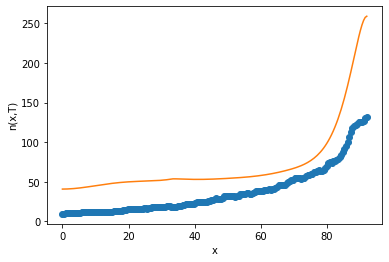

after perturb [8.744032976058143, -34.82827493978386, 26775.849065446084, -0.3154386736135676, 1.6361418816748703]
parameters [8.744032976058143, -34.82827493978386, 26775.849065446084, -0.3154386736135676, 1.6361418816748703]
after perturb [6.586488680241642, 70.73468647518472, 24983.78498538056, -0.061295870854951806, 31.204671530476435]
parameters [6.586488680241642, 70.73468647518472, 24983.78498538056, -0.061295870854951806, 31.204671530476435]
after perturb [8.174081757789901, 24.259723838163083, 23472.76734810437, -0.143986592917416, -2.546074996289793]
parameters [8.174081757789901, 24.259723838163083, 23472.76734810437, -0.143986592917416, -2.546074996289793]
after perturb [9.696766233417707, 167.30731380967012, 25340.060737135675, 0.5359776392455422, 19.041906393308167]
parameters [9.696766233417707, 167.30731380967012, 25340.060737135675, 0.5359776392455422, 19.041906393308167]
after perturb [7.573909940030679, 162.62679559251865, 27570.084175382344, 0.4227332501359262, 29.9

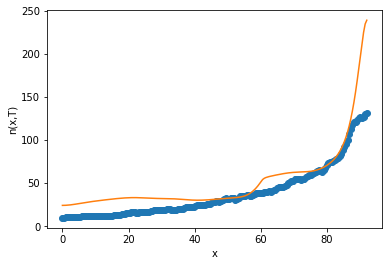

after perturb [0.2127490304771218, 30.745800782734772, 31928.9350130069, -0.127100199454224, 9.4158813025491]
parameters [0.2127490304771218, 30.745800782734772, 31928.9350130069, -0.127100199454224, 9.4158813025491]
after perturb [0.33471056229059837, 111.88103967568576, 25250.46452345836, -0.03964256196340682, -9.007921953470785]
parameters [0.33471056229059837, 111.88103967568576, 25250.46452345836, -0.03964256196340682, -9.007921953470785]
after perturb [9.392147084015784, 158.89543306021773, 18464.411865905506, 1.0828441545107668, 51.1846812565351]
parameters [9.392147084015784, 158.89543306021773, 18464.411865905506, 1.0828441545107668, 51.1846812565351]
after perturb [9.209960400276639, 16.546003150226625, 21483.539035882797, 0.5008338795575644, 60.46525554077478]
parameters [9.209960400276639, 16.546003150226625, 21483.539035882797, 0.5008338795575644, 60.46525554077478]
after perturb [0.5735159987236118, 76.82095230222053, 21127.72563220923, 0.44068439319445596, 25.81056894593

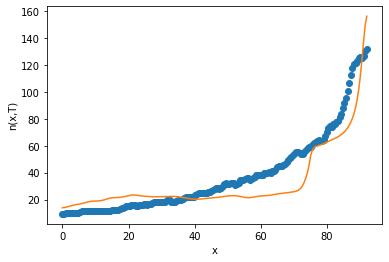

after perturb [10.133806752800583, 143.02909348559075, 29981.577888231222, 0.3762162804013563, 28.279909874791446]
parameters [10.133806752800583, 143.02909348559075, 29981.577888231222, 0.3762162804013563, 28.279909874791446]
after perturb [3.356637752747339, 24.059611127127603, 31534.718579106706, -0.233743790504264, 1.4374710887202937]
parameters [3.356637752747339, 24.059611127127603, 31534.718579106706, -0.233743790504264, 1.4374710887202937]
after perturb [8.748214010711672, 49.1845823009096, 21641.238960274586, 0.4213674913492606, 32.93652716874985]
parameters [8.748214010711672, 49.1845823009096, 21641.238960274586, 0.4213674913492606, 32.93652716874985]
oxigeno [2.04136006e-09 2.03892660e-09 2.03164712e-09 2.01958405e-09
 2.00284022e-09 1.98155721e-09 1.95591307e-09 1.92611934e-09
 1.89241784e-09 1.85507680e-09 1.81438691e-09 1.77065705e-09
 1.72420993e-09 1.67537776e-09 1.62449796e-09 1.57190909e-09
 1.51794694e-09 1.46294097e-09 1.40721115e-09 1.35106507e-09
 1.29479556e-09 

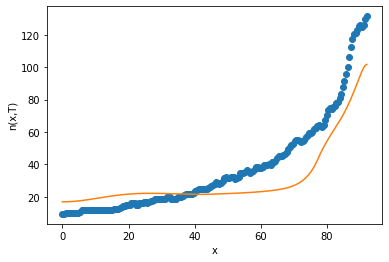

after perturb [8.297078284403158, 80.60754860609626, 25286.552227427004, 0.4453231193353998, 10.496220374385743]
parameters [8.297078284403158, 80.60754860609626, 25286.552227427004, 0.4453231193353998, 10.496220374385743]
oxigeno [4.04160529e-10 4.04260714e-10 4.04571361e-10 4.05122862e-10
 4.05966286e-10 4.07174001e-10 4.08840585e-10 4.11084043e-10
 4.14047366e-10 4.17900481e-10 4.22842646e-10 4.29105356e-10
 4.36955831e-10 4.46701180e-10 4.58693345e-10 4.73334929e-10
 4.91086055e-10 5.12472399e-10 5.38094584e-10 5.68639120e-10
 6.04891129e-10 6.47749123e-10 6.98242118e-10 7.57549448e-10
 8.27023667e-10 9.08216987e-10 1.00291178e-09 1.11315572e-09
 1.24130230e-09 1.39005742e-09 1.56253296e-09 1.76230846e-09
 1.99350193e-09 2.26085113e-09 2.56980699e-09 2.92664067e-09
 3.33856647e-09 3.81388262e-09 4.36213267e-09 4.99429034e-09
 5.72297112e-09 6.56267444e-09 7.53006075e-09 8.64426824e-09
 9.92727499e-09 1.14043127e-08 1.31043391e-08 1.50605775e-08
 1.73111327e-08 1.98996927e-08 2.2876

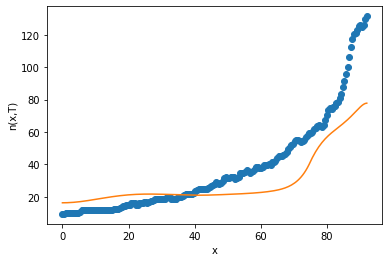

after perturb [6.5077852038939525, 54.22488073247054, 24350.81362047982, 0.3334506860007743, 18.409467847594385]
parameters [6.5077852038939525, 54.22488073247054, 24350.81362047982, 0.3334506860007743, 18.409467847594385]
oxigeno [6.34425727e-08 6.33754343e-08 6.31745695e-08 6.28416193e-08
 6.23792881e-08 6.17912978e-08 6.10823263e-08 6.02579310e-08
 5.93244605e-08 5.82889563e-08 5.71590473e-08 5.59428399e-08
 5.46488067e-08 5.32856748e-08 5.18623187e-08 5.03876570e-08
 4.88705567e-08 4.73197455e-08 4.57437333e-08 4.41507439e-08
 4.25486573e-08 4.09449627e-08 3.93467210e-08 3.77605395e-08
 3.61925546e-08 3.46484252e-08 3.31333340e-08 3.16519976e-08
 3.02086844e-08 2.88072385e-08 2.74511120e-08 2.61434019e-08
 2.48868943e-08 2.36841134e-08 2.25373772e-08 2.14488586e-08
 2.04206526e-08 1.94548502e-08 1.85536196e-08 1.77192953e-08
 1.69544761e-08 1.62621334e-08 1.56457317e-08 1.51093627e-08
 1.46578949e-08 1.42971432e-08 1.40340590e-08 1.38769464e-08
 1.38357087e-08 1.39221284e-08 1.4150

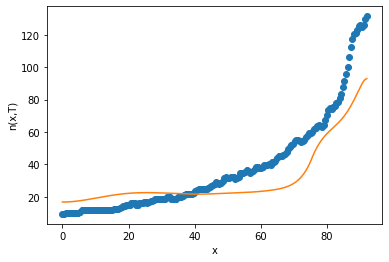

after perturb [10.087977025813819, 92.09976064242758, 20388.997634309853, 0.6183581363683808, 53.41287071246077]
parameters [10.087977025813819, 92.09976064242758, 20388.997634309853, 0.6183581363683808, 53.41287071246077]
after perturb [3.0356228314042597, -14.7920354241596, 28579.347241654712, -0.16411985381391175, 23.63991377244444]
parameters [3.0356228314042597, -14.7920354241596, 28579.347241654712, -0.16411985381391175, 23.63991377244444]
after perturb [7.541948039828848, 8.278062994793771, 23578.01501724475, 0.3473783783447114, 48.62303987263332]
parameters [7.541948039828848, 8.278062994793771, 23578.01501724475, 0.3473783783447114, 48.62303987263332]
after perturb [8.265126609131126, 150.40859570700957, 30697.12321311921, 0.6959040231823019, 29.76732748491868]
parameters [8.265126609131126, 150.40859570700957, 30697.12321311921, 0.6959040231823019, 29.76732748491868]
after perturb [5.620810315373613, 47.725512636916264, 24240.10478368686, 0.13539133198991285, 26.1463860098485

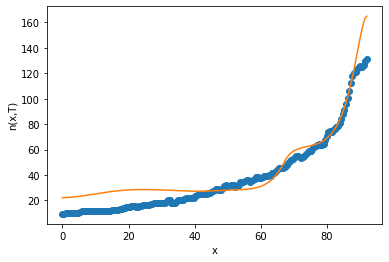

after perturb [9.063200940842913, 51.85621618799034, 23438.47567314964, 0.16951700731245567, 39.70019312074088]
parameters [9.063200940842913, 51.85621618799034, 23438.47567314964, 0.16951700731245567, 39.70019312074088]
oxigeno [9.90399162e-05 9.89720690e-05 9.87689407e-05 9.84317654e-05
 9.79625832e-05 9.73642147e-05 9.66402265e-05 9.57948885e-05
 9.48331226e-05 9.37604456e-05 9.25829065e-05 9.13070190e-05
 8.99396913e-05 8.84881544e-05 8.69598894e-05 8.53625555e-05
 8.37039195e-05 8.19917888e-05 8.02339461e-05 7.84380906e-05
 7.66117815e-05 7.47623891e-05 7.28970491e-05 7.10226247e-05
 6.91456729e-05 6.72724175e-05 6.54087269e-05 6.35600984e-05
 6.17316463e-05 5.99280964e-05 5.81537832e-05 5.64126532e-05
 5.47082703e-05 5.30438256e-05 5.14221496e-05 4.98457276e-05
 4.83167168e-05 4.68369656e-05 4.54080349e-05 4.40312201e-05
 4.27075747e-05 4.14379344e-05 4.02229430e-05 3.90630770e-05
 3.79586725e-05 3.69099517e-05 3.59170494e-05 3.49800406e-05
 3.40989678e-05 3.32738692e-05 3.250480

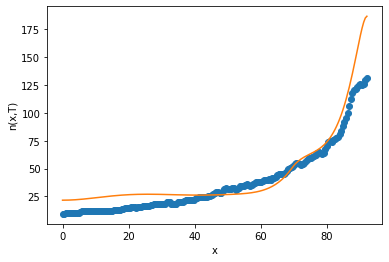

after perturb [6.718897959474792, 94.57545230436378, 27471.334539068368, 0.066212561243439, 9.012947140726514]
parameters [6.718897959474792, 94.57545230436378, 27471.334539068368, 0.066212561243439, 9.012947140726514]
oxigeno [1.21096705e-02 1.21061967e-02 1.20957961e-02 1.20785303e-02
 1.20545016e-02 1.20238517e-02 1.19867603e-02 1.19434434e-02
 1.18941514e-02 1.18391668e-02 1.17788016e-02 1.17133949e-02
 1.16433103e-02 1.15689329e-02 1.14906666e-02 1.14089317e-02
 1.13241620e-02 1.12368025e-02 1.11473068e-02 1.10561355e-02
 1.09637538e-02 1.08706301e-02 1.07772346e-02 1.06840377e-02
 1.05915094e-02 1.05001183e-02 1.04103312e-02 1.03226124e-02
 1.02374238e-02 1.01552249e-02 1.00764727e-02 1.00016223e-02
 9.93112747e-03 9.86544090e-03 9.80501543e-03 9.75030479e-03
 9.70176478e-03 9.65985442e-03 9.62503736e-03 9.59778337e-03
 9.57856990e-03 9.56788389e-03 9.56622360e-03 9.57410060e-03
 9.59204190e-03 9.62059220e-03 9.66031624e-03 9.71180133e-03
 9.77565995e-03 9.85253251e-03 9.94309028

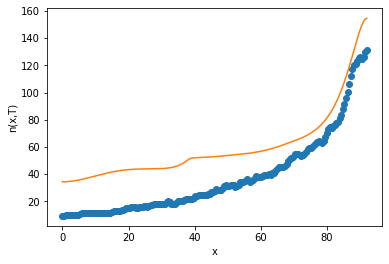

after perturb [0.3569891288152429, 50.33227021787921, 25678.526305410658, 0.5397752944150986, 22.1555464756775]
parameters [0.3569891288152429, 50.33227021787921, 25678.526305410658, 0.5397752944150986, 22.1555464756775]
oxigeno [3.64207786e-11 3.63219701e-11 3.60319204e-11 3.55681856e-11
 3.49554046e-11 3.42201818e-11 3.33865892e-11 3.24733947e-11
 3.14933552e-11 3.04543065e-11 2.93614438e-11 2.82200352e-11
 2.70377414e-11 2.58257920e-11 2.45986153e-11 2.33720931e-11
 2.21611582e-11 2.09776626e-11 1.98292034e-11 1.87190976e-11
 1.76472387e-11 1.66113908e-11 1.56085549e-11 1.46362266e-11
 1.36934538e-11 1.27815605e-11 1.19043295e-11 1.10674956e-11
 1.02776194e-11 9.54069822e-12 8.86101900e-12 8.24066789e-12
 7.67982499e-12 7.17765379e-12 6.73340427e-12 6.34736713e-12
 6.02149718e-12 5.75973699e-12 5.56819547e-12 5.45533317e-12
 5.43222829e-12 5.51292438e-12 5.71483486e-12 6.05919759e-12
 6.57161111e-12 7.28272615e-12 8.22920971e-12 9.45513401e-12
 1.10139403e-11 1.29710563e-11 1.540711

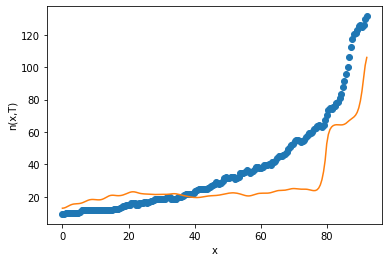

after perturb [6.0426475976256855, 100.59859337258423, 26281.36399375414, 0.12277687431030396, 26.021840803781576]
parameters [6.0426475976256855, 100.59859337258423, 26281.36399375414, 0.12277687431030396, 26.021840803781576]
oxigeno [9.14621417e-04 9.14302860e-04 9.13349453e-04 9.11767971e-04
 9.09569621e-04 9.06769937e-04 9.03388614e-04 8.99449323e-04
 8.94979477e-04 8.90009987e-04 8.84574988e-04 8.78711556e-04
 8.72459420e-04 8.65860674e-04 8.58959490e-04 8.51801853e-04
 8.44435302e-04 8.36908695e-04 8.29272004e-04 8.21576118e-04
 8.13872696e-04 8.06214024e-04 7.98652921e-04 7.91242656e-04
 7.84036904e-04 7.77089718e-04 7.70455536e-04 7.64189202e-04
 7.58346016e-04 7.52981802e-04 7.48152999e-04 7.43916767e-04
 7.40331112e-04 7.37455036e-04 7.35348694e-04 7.34073570e-04
 7.33692678e-04 7.34270768e-04 7.35874555e-04 7.38572962e-04
 7.42437377e-04 7.47541936e-04 7.53963807e-04 7.61783503e-04
 7.71085205e-04 7.81957105e-04 7.94491764e-04 8.08786485e-04
 8.24943708e-04 8.43071414e-04 8.

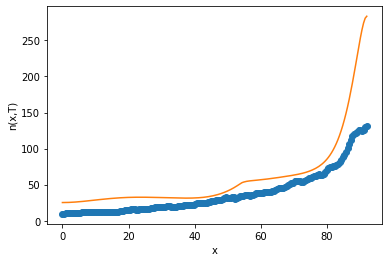

after perturb [8.194781673773624, 81.13847742870198, 20039.836890928404, 0.5689990344379315, 38.81619712019449]
parameters [8.194781673773624, 81.13847742870198, 20039.836890928404, 0.5689990344379315, 38.81619712019449]
oxigeno [7.21402610e-12 7.24718689e-12 7.34750895e-12 7.51752969e-12
 7.76153970e-12 8.08567671e-12 8.49806063e-12 9.00897290e-12
 9.63108500e-12 1.03797417e-11 1.12733065e-11 1.23335777e-11
 1.35862855e-11 1.50616834e-11 1.67952473e-11 1.88285008e-11
 2.12099861e-11 2.39964055e-11 2.72539607e-11 3.10599225e-11
 3.55044701e-11 4.06928435e-11 4.67478621e-11 5.38128696e-11
 6.20551763e-11 7.16700809e-11 8.28855682e-11 9.59677941e-11
 1.11227488e-10 1.29027421e-10 1.49791122e-10 1.74013030e-10
 2.02270341e-10 2.35236798e-10 2.73698757e-10 3.18573892e-10
 3.70932959e-10 4.32025113e-10 5.03307348e-10 5.86478710e-10
 6.83520047e-10 7.96740168e-10 9.28829430e-10 1.08292190e-09
 1.26266749e-09 1.47231550e-09 1.71681156e-09 2.00190981e-09
 2.33430287e-09 2.72177222e-09 3.173362

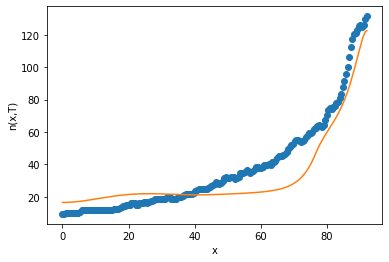

after perturb [3.118948894184429, 118.76850433344121, 23328.77469216477, 0.48960715371275076, 14.529112928002723]
parameters [3.118948894184429, 118.76850433344121, 23328.77469216477, 0.48960715371275076, 14.529112928002723]
oxigeno [2.94610326e-09 2.96297449e-09 3.01379724e-09 3.09920182e-09
 3.22024922e-09 3.37844685e-09 3.57577083e-09 3.81469504e-09
 4.09822717e-09 4.42995220e-09 4.81408390e-09 5.25552484e-09
 5.75993585e-09 6.33381585e-09 6.98459313e-09 7.72072960e-09
 8.55183936e-09 9.48882375e-09 1.05440246e-08 1.17313985e-08
 1.30667141e-08 1.45677767e-08 1.62546817e-08 1.81501023e-08
 2.02796143e-08 2.26720640e-08 2.53599823e-08 2.83800521e-08
 3.17736353e-08 3.55873640e-08 3.98738068e-08 4.46922150e-08
 5.01093601e-08 5.62004710e-08 6.30502828e-08 7.07542067e-08
 7.94196354e-08 8.91673970e-08 1.00133371e-07 1.12470285e-07
 1.26349705e-07 1.41964251e-07 1.59530045e-07 1.79289435e-07
 2.01514013e-07 2.26507975e-07 2.54611854e-07 2.86206690e-07
 3.21718675e-07 3.61624356e-07 4.06

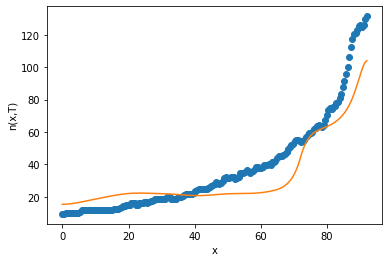

after perturb [4.997721986654802, 12.35125258064852, 29767.112550778875, -0.2142066349753342, -3.7594631904789395]
parameters [4.997721986654802, 12.35125258064852, 29767.112550778875, -0.2142066349753342, -3.7594631904789395]
after perturb [16.38093838858714, 135.79211473558513, 26124.73946291449, 0.8967272564792652, 58.87589039459823]
parameters [16.38093838858714, 135.79211473558513, 26124.73946291449, 0.8967272564792652, 58.87589039459823]
after perturb [2.9969555960358116, 62.06705982844165, 24016.38241062213, 0.10999817236188487, 12.043629496754274]
parameters [2.9969555960358116, 62.06705982844165, 24016.38241062213, 0.10999817236188487, 12.043629496754274]
oxigeno [1.01880421e-03 1.01819955e-03 1.01639050e-03 1.01339179e-03
 1.00922753e-03 1.00393067e-03 9.97542273e-04 9.90110533e-04
 9.81689813e-04 9.72339540e-04 9.62123106e-04 9.51106789e-04
 9.39358737e-04 9.26948030e-04 9.13943860e-04 9.00414827e-04
 8.86428370e-04 8.72050308e-04 8.57344519e-04 8.42372702e-04
 8.27194238e-0

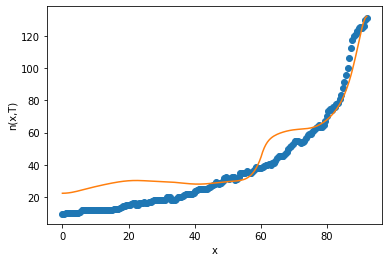

after perturb [3.6971260653217706, 76.57009892041769, 30360.252038891536, 0.01614649414921182, 6.03290934377358]
parameters [3.6971260653217706, 76.57009892041769, 30360.252038891536, 0.01614649414921182, 6.03290934377358]
after perturb [6.692639086990322, 41.27302408630493, 33339.409252213605, 0.32749295709054793, 35.91672821805434]
parameters [6.692639086990322, 41.27302408630493, 33339.409252213605, 0.32749295709054793, 35.91672821805434]
after perturb [14.06612891869786, 118.60459475069095, 25013.848688762544, 0.12283791214084627, 22.28890714565265]
parameters [14.06612891869786, 118.60459475069095, 25013.848688762544, 0.12283791214084627, 22.28890714565265]
after perturb [5.62927360952129, 49.582809610843995, 27798.982302378136, -0.033535179600060916, 7.126772897940583]
parameters [5.62927360952129, 49.582809610843995, 27798.982302378136, -0.033535179600060916, 7.126772897940583]
after perturb [7.223812701032558, 122.24510737898463, 30645.21828660824, -0.03155692913155389, 4.90963

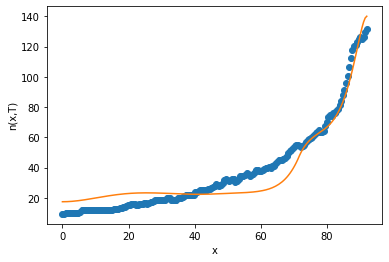

3
after perturb [9.6988806253915, 155.89483289688135, 18611.744896972385, 0.5760733712109833, 43.89965048186288]
parameters [9.6988806253915, 155.89483289688135, 18611.744896972385, 0.5760733712109833, 43.89965048186288]
after perturb [9.940404253872615, 68.59652237055674, 21763.047911772665, 0.7125346595807113, 62.16078405031273]
parameters [9.940404253872615, 68.59652237055674, 21763.047911772665, 0.7125346595807113, 62.16078405031273]
after perturb [7.366780153783763, 80.438205395414, 22532.347018049924, 0.1219543659475727, 25.098606807611446]
parameters [7.366780153783763, 80.438205395414, 22532.347018049924, 0.1219543659475727, 25.098606807611446]
oxigeno [8.57207518e-04 8.56831574e-04 8.55705872e-04 8.53836775e-04
 8.51234808e-04 8.47914550e-04 8.43894474e-04 8.39196751e-04
 8.33847028e-04 8.27874167e-04 8.21309965e-04 8.14188855e-04
 8.06547599e-04 7.98424972e-04 7.89861442e-04 7.80898862e-04
 7.71580165e-04 7.61949079e-04 7.52049856e-04 7.41927018e-04
 7.31625133e-04 7.21188612

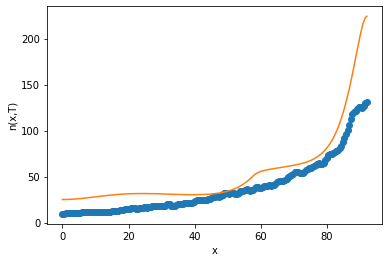

after perturb [8.186295803837229, 155.89674415834952, 24496.793664637793, 0.8981953162274435, 58.65675589757382]
parameters [8.186295803837229, 155.89674415834952, 24496.793664637793, 0.8981953162274435, 58.65675589757382]
after perturb [8.762232675956998, 127.91483302671708, 27094.406711654734, 0.4113349966184604, 31.50008914666429]
parameters [8.762232675956998, 127.91483302671708, 27094.406711654734, 0.4113349966184604, 31.50008914666429]
oxigeno [3.40310187e-08 3.41840059e-08 3.46444500e-08 3.54168157e-08
 3.65085991e-08 3.79304110e-08 3.96960943e-08 4.18228777e-08
 4.43315662e-08 4.72467716e-08 5.05971844e-08 5.44158906e-08
 5.87407366e-08 6.36147463e-08 6.90865943e-08 7.52111406e-08
 8.20500323e-08 8.96723787e-08 9.81555066e-08 1.07585804e-07
 1.18059660e-07 1.29684513e-07 1.42580013e-07 1.56879316e-07
 1.72730519e-07 1.90298247e-07 2.09765422e-07 2.31335208e-07
 2.55233174e-07 2.81709678e-07 3.11042506e-07 3.43539783e-07
 3.79543193e-07 4.19431519e-07 4.63624559e-07 5.12587435e-

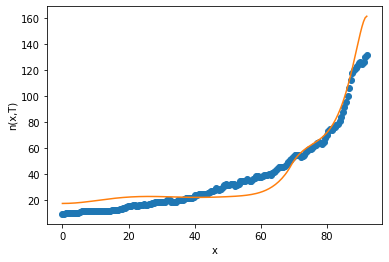

4
after perturb [8.029724467991745, 85.51025455697442, 26200.478926474494, 0.4423146911697591, 41.79913558191996]
parameters [8.029724467991745, 85.51025455697442, 26200.478926474494, 0.4423146911697591, 41.79913558191996]
oxigeno [8.57502186e-10 8.58016203e-10 8.59581622e-10 8.62268834e-10
 8.66196093e-10 8.71530950e-10 8.78492320e-10 8.87353223e-10
 8.98444300e-10 9.12158162e-10 9.28954707e-10 9.49367520e-10
 9.74011508e-10 1.00359194e-09 1.03891511e-09 1.08090080e-09
 1.13059685e-09 1.18919612e-09 1.25805614e-09 1.33872186e-09
 1.43295194e-09 1.54274903e-09 1.67039463e-09 1.81848912e-09
 1.98999779e-09 2.18830349e-09 2.41726709e-09 2.68129655e-09
 2.98542600e-09 3.33540607e-09 3.73780709e-09 4.20013689e-09
 4.73097518e-09 5.34012679e-09 6.03879629e-09 6.83978691e-09
 7.75772703e-09 8.80932790e-09 1.00136768e-08 1.13925705e-08
 1.29708938e-08 1.47770501e-08 1.68434501e-08 1.92070664e-08
 2.19100627e-08 2.50005079e-08 2.85331852e-08 3.25705092e-08
 3.71835655e-08 4.24532867e-08 4.8471

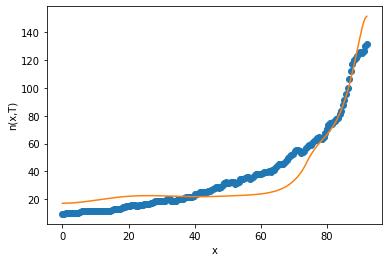

after perturb [6.61842076281105, 68.08424384103206, 26206.88447496012, -0.01300612996259426, 2.686955584901627]
parameters [6.61842076281105, 68.08424384103206, 26206.88447496012, -0.01300612996259426, 2.686955584901627]
after perturb [14.241709827961799, 194.0795757152302, 16248.193490314487, 0.5328162845560483, 31.610396702496256]
parameters [14.241709827961799, 194.0795757152302, 16248.193490314487, 0.5328162845560483, 31.610396702496256]
after perturb [11.114870424192837, 98.42104823528234, 22507.84306555069, 0.4444228781667565, 33.29782391196531]
parameters [11.114870424192837, 98.42104823528234, 22507.84306555069, 0.4444228781667565, 33.29782391196531]
after perturb [3.2626105633141678, 91.44322576799749, 24283.20488369627, 0.45163597966805297, 29.381841612425546]
parameters [3.2626105633141678, 91.44322576799749, 24283.20488369627, 0.45163597966805297, 29.381841612425546]
oxigeno [8.24027531e-10 8.25561686e-10 8.30202213e-10 8.38063761e-10
 8.49338954e-10 8.64300764e-10 8.833059

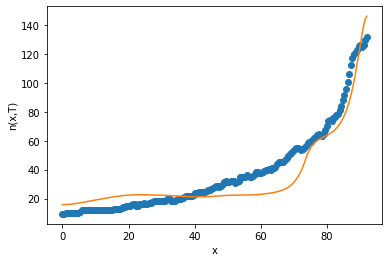

after perturb [1.8523014630354222, 21.750535835403426, 25548.58774496558, -0.20383992651275767, 3.051724545462031]
parameters [1.8523014630354222, 21.750535835403426, 25548.58774496558, -0.20383992651275767, 3.051724545462031]
after perturb [9.125333387415397, 125.06498803900695, 25077.365063211426, 0.5620581298037155, 31.24343746898009]
parameters [9.125333387415397, 125.06498803900695, 25077.365063211426, 0.5620581298037155, 31.24343746898009]
oxigeno [1.39412464e-09 1.40303670e-09 1.42988732e-09 1.47502147e-09
 1.53901962e-09 1.62270621e-09 1.72716156e-09 1.85373760e-09
 2.00407742e-09 2.18013921e-09 2.38422470e-09 2.61901261e-09
 2.88759765e-09 3.19353561e-09 3.54089513e-09 3.93431702e-09
 4.37908198e-09 4.88118761e-09 5.44743592e-09 6.08553266e-09
 6.80419969e-09 7.61330226e-09 8.52399287e-09 9.54887369e-09
 1.07021801e-08 1.19999876e-08 1.34604451e-08 1.51040382e-08
 1.69538853e-08 1.90360710e-08 2.13800221e-08 2.40189295e-08
 2.69902234e-08 3.03361072e-08 3.41041567e-08 3.834799

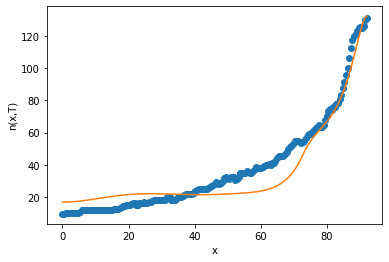

5
after perturb [7.212026166572965, 47.16952800943561, 28409.401742871858, 0.5376272650648148, 41.959273325704004]
parameters [7.212026166572965, 47.16952800943561, 28409.401742871858, 0.5376272650648148, 41.959273325704004]
oxigeno [2.37937854e-11 2.37591063e-11 2.36554289e-11 2.34838247e-11
 2.32460557e-11 2.29445393e-11 2.25823003e-11 2.21629126e-11
 2.16904319e-11 2.11693207e-11 2.06043696e-11 2.00006152e-11
 1.93632584e-11 1.86975841e-11 1.80088845e-11 1.73023880e-11
 1.65831944e-11 1.58562182e-11 1.51261397e-11 1.43973655e-11
 1.36739980e-11 1.29598137e-11 1.22582507e-11 1.15724044e-11
 1.09050319e-11 1.02585631e-11 9.63511982e-12 9.03654169e-12
 8.46441790e-12 7.92012593e-12 7.40487650e-12 6.91976515e-12
 6.46583118e-12 6.04412466e-12 5.65578296e-12 5.30211854e-12
 4.98472025e-12 4.70557131e-12 4.46718763e-12 4.27278130e-12
 4.12645506e-12 4.03343514e-12 4.00035118e-12 4.03557436e-12
 4.14962687e-12 4.35567904e-12 4.67015390e-12 5.11346322e-12
 5.71090427e-12 6.49375286e-12 7.50

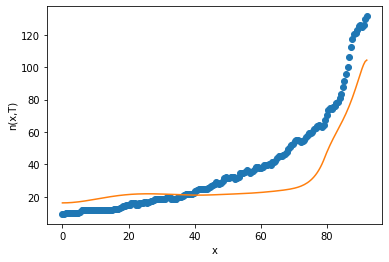

after perturb [6.852770758645365, 103.81783541123036, 25566.54017458889, 0.24678363392307406, 7.255644286702255]
parameters [6.852770758645365, 103.81783541123036, 25566.54017458889, 0.24678363392307406, 7.255644286702255]
oxigeno [1.53356509e-06 1.53368319e-06 1.53404885e-06 1.53469611e-06
 1.53568183e-06 1.53708575e-06 1.53901069e-06 1.54158285e-06
 1.54495207e-06 1.54929235e-06 1.55480240e-06 1.56170633e-06
 1.57025459e-06 1.58072502e-06 1.59342417e-06 1.60868884e-06
 1.62688796e-06 1.64842465e-06 1.67373878e-06 1.70330978e-06
 1.73765988e-06 1.77735781e-06 1.82302296e-06 1.87533004e-06
 1.93501430e-06 2.00287735e-06 2.07979362e-06 2.16671748e-06
 2.26469117e-06 2.37485345e-06 2.49844921e-06 2.63683991e-06
 2.79151509e-06 2.96410500e-06 3.15639427e-06 3.37033699e-06
 3.60807307e-06 3.87194606e-06 4.16452264e-06 4.48861379e-06
 4.84729776e-06 5.24394516e-06 5.68224618e-06 6.16624018e-06
 6.70034783e-06 7.28940605e-06 7.93870596e-06 8.65403410e-06
 9.44171715e-06 1.03086706e-05 1.1262

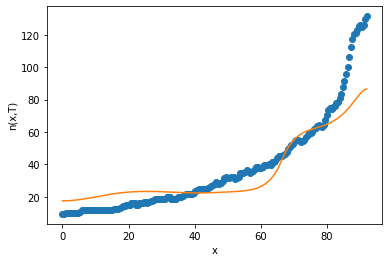

after perturb [2.5826412597316755, 69.57964098681163, 25729.5215483701, 0.5339237420310888, 24.83897239923938]
parameters [2.5826412597316755, 69.57964098681163, 25729.5215483701, 0.5339237420310888, 24.83897239923938]
oxigeno [2.60032014e-11 2.59749276e-11 2.58907618e-11 2.57526612e-11
 2.55638567e-11 2.53288095e-11 2.50531584e-11 2.47436634e-11
 2.44081537e-11 2.40554881e-11 2.36955355e-11 2.33391840e-11
 2.29983849e-11 2.26862401e-11 2.24171381e-11 2.22069459e-11
 2.20732638e-11 2.20357500e-11 2.21165236e-11 2.23406568e-11
 2.27367683e-11 2.33377325e-11 2.41815239e-11 2.53122186e-11
 2.67811804e-11 2.86484643e-11 3.09844764e-11 3.38719369e-11
 3.74082013e-11 4.17080037e-11 4.69067011e-11 5.31641051e-11
 6.06690088e-11 6.96445305e-11 8.03544171e-11 9.31104731e-11
 1.08281308e-10 1.26302621e-10 1.47689282e-10 1.73049499e-10
 2.03101412e-10 2.38692507e-10 2.80822310e-10 3.30668892e-10
 3.89619806e-10 4.59308227e-10 5.41655126e-10 6.38918574e-10
 7.53751368e-10 8.89268464e-10 1.04912594

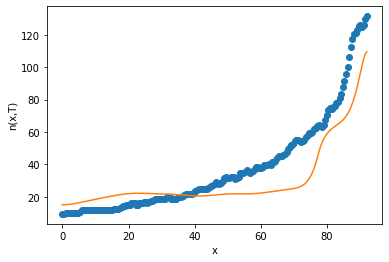

after perturb [7.009207024592968, 125.49102204331757, 27836.658768177116, 0.3199898236609027, 20.44991380720123]
parameters [7.009207024592968, 125.49102204331757, 27836.658768177116, 0.3199898236609027, 20.44991380720123]
oxigeno [2.96644708e-07 2.97458003e-07 2.99905077e-07 3.04007560e-07
 3.09801715e-07 3.17338767e-07 3.26685358e-07 3.37924145e-07
 3.51154542e-07 3.66493612e-07 3.84077115e-07 4.04060726e-07
 4.26621436e-07 4.51959141e-07 4.80298433e-07 5.11890627e-07
 5.47016010e-07 5.85986365e-07 6.29147769e-07 6.76883696e-07
 7.29618460e-07 7.87821010e-07 8.52009122e-07 9.22754016e-07
 1.00068544e-06 1.08649724e-06 1.18095353e-06 1.28489537e-06
 1.39924815e-06 1.52502968e-06 1.66335897e-06 1.81546591e-06
 1.98270178e-06 2.16655072e-06 2.36864230e-06 2.59076510e-06
 2.83488166e-06 3.10314456e-06 3.39791412e-06 3.72177746e-06
 4.07756935e-06 4.46839484e-06 4.89765380e-06 5.36906768e-06
 5.88670846e-06 6.45503017e-06 7.07890315e-06 7.76365113e-06
 8.51509166e-06 9.33957983e-06 1.0244

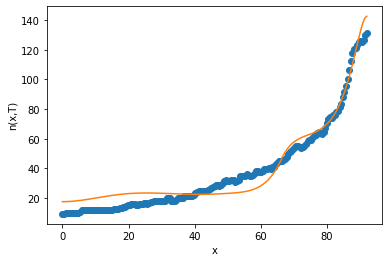

6
after perturb [4.578947444631266, -4.197377599676649, 30161.19677689424, -0.5755025119011983, -13.084853161043522]
parameters [4.578947444631266, -4.197377599676649, 30161.19677689424, -0.5755025119011983, -13.084853161043522]
after perturb [7.049571204660438, 59.96248820189365, 27754.05931889991, 0.027937187189312623, 10.579244223089933]
parameters [7.049571204660438, 59.96248820189365, 27754.05931889991, 0.027937187189312623, 10.579244223089933]
oxigeno [ 0.27075679  0.27069513  0.27051045  0.27020365  0.26977623  0.26923027
  0.2685684   0.26779379  0.26691011  0.26592147  0.26483245  0.263648
  0.26237339  0.26101423  0.25957637  0.25806586  0.25648893  0.25485193
  0.2531613   0.25142351  0.24964505  0.24783237  0.24599186  0.24412983
  0.24225246  0.24036579  0.2384757   0.23658787  0.2347078   0.23284075
  0.23099178  0.22916569  0.22736703  0.22560011  0.22386898  0.22217741
  0.22052895  0.21892684  0.21737412  0.21587353  0.2144276   0.21303862
  0.21170865  0.21043954  0.2

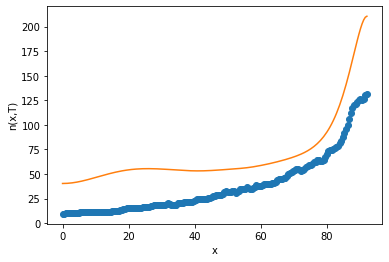

after perturb [7.637889164877554, 98.75952262118935, 23409.18519624036, 0.4477134735673928, 35.51064032973013]
parameters [7.637889164877554, 98.75952262118935, 23409.18519624036, 0.4477134735673928, 35.51064032973013]
oxigeno [1.28459342e-09 1.28974874e-09 1.30529525e-09 1.33147587e-09
 1.36869941e-09 1.41754660e-09 1.47877870e-09 1.55334870e-09
 1.64241553e-09 1.74736135e-09 1.86981222e-09 2.01166257e-09
 2.17510382e-09 2.36265766e-09 2.57721444e-09 2.82207743e-09
 3.10101355e-09 3.41831141e-09 3.77884758e-09 4.18816222e-09
 4.65254503e-09 5.17913318e-09 5.77602239e-09 6.45239309e-09
 7.21865359e-09 8.08660221e-09 9.06961105e-09 1.01828339e-08
 1.14434419e-08 1.28708889e-08 1.44872133e-08 1.63173768e-08
 1.83896484e-08 2.07360373e-08 2.33927807e-08 2.64008947e-08
 2.98067935e-08 3.36629885e-08 3.80288741e-08 4.29716123e-08
 4.85671275e-08 5.49012254e-08 6.20708496e-08 7.01854945e-08
 7.93687905e-08 8.97602852e-08 1.01517441e-07 1.14817877e-07
 1.29861882e-07 1.46875236e-07 1.66112366

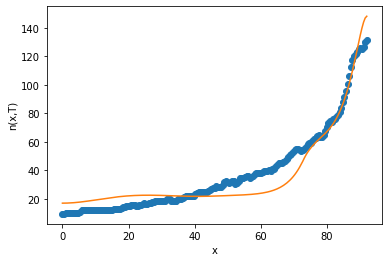

7
after perturb [5.840507413489039, 118.94620328554961, 17221.983641705046, 0.31292881961576213, 32.23406652852983]
parameters [5.840507413489039, 118.94620328554961, 17221.983641705046, 0.31292881961576213, 32.23406652852983]
after perturb [4.781312934298551, 47.01967398323771, 25876.358771383468, 0.12046250690859528, 13.045626185112724]
parameters [4.781312934298551, 47.01967398323771, 25876.358771383468, 0.12046250690859528, 13.045626185112724]
oxigeno [5.77923378e-04 5.77533109e-04 5.76365138e-04 5.74427918e-04
 5.71735377e-04 5.68306666e-04 5.64165838e-04 5.59341442e-04
 5.53866063e-04 5.47775812e-04 5.41109791e-04 5.33909540e-04
 5.26218482e-04 5.18081385e-04 5.09543848e-04 5.00651821e-04
 4.91451157e-04 4.81987227e-04 4.72304565e-04 4.62446571e-04
 4.52455259e-04 4.42371049e-04 4.32232601e-04 4.22076687e-04
 4.11938089e-04 4.01849538e-04 3.91841664e-04 3.81942973e-04
 3.72179842e-04 3.62576522e-04 3.53155156e-04 3.43935812e-04
 3.34936511e-04 3.26173281e-04 3.17660201e-04 3.0940

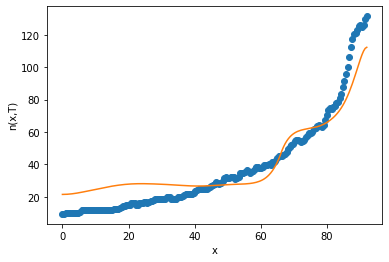

after perturb [10.77878817855642, 224.93850040089245, 14225.52073275575, 0.4349349446374797, 20.312944067392767]
parameters [10.77878817855642, 224.93850040089245, 14225.52073275575, 0.4349349446374797, 20.312944067392767]
after perturb [12.638239111902125, 100.00031576031674, 23910.866709138158, 0.4611967880119634, 35.160775590405635]
parameters [12.638239111902125, 100.00031576031674, 23910.866709138158, 0.4611967880119634, 35.160775590405635]
after perturb [2.385894597525807, 53.353567725947315, 25468.458975818536, -0.14488560976739068, 17.794462617640928]
parameters [2.385894597525807, 53.353567725947315, 25468.458975818536, -0.14488560976739068, 17.794462617640928]
after perturb [5.572722811433324, 128.11521915223145, 26486.904515672977, 0.359928667680565, 26.619635921074902]
parameters [5.572722811433324, 128.11521915223145, 26486.904515672977, 0.359928667680565, 26.619635921074902]
oxigeno [1.19828572e-07 1.20248694e-07 1.21512836e-07 1.23632368e-07
 1.26626362e-07 1.30521793e-0

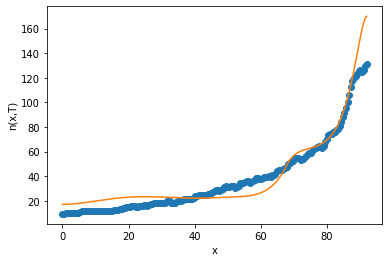

8
after perturb [2.809805538985537, 117.37396577007705, 23881.50425826403, 0.4969061795883153, 7.903742656319563]
parameters [2.809805538985537, 117.37396577007705, 23881.50425826403, 0.4969061795883153, 7.903742656319563]
oxigeno [1.85660335e-09 1.86757524e-09 1.90063144e-09 1.95619568e-09
 2.03498147e-09 2.13800298e-09 2.26659049e-09 2.42241055e-09
 2.60749088e-09 2.82425057e-09 3.07553567e-09 3.36466081e-09
 3.69545734e-09 4.07232869e-09 4.50031381e-09 4.98515964e-09
 5.53340380e-09 6.15246885e-09 6.85076966e-09 7.63783562e-09
 8.52444970e-09 9.52280660e-09 1.06466924e-08 1.19116883e-08
 1.33354022e-08 1.49377297e-08 1.67411510e-08 1.87710644e-08
 2.10561645e-08 2.36288670e-08 2.65257879e-08 2.97882825e-08
 3.34630513e-08 3.76028196e-08 4.22671005e-08 4.75230480e-08
 5.34464113e-08 6.01225992e-08 6.76478665e-08 7.61306326e-08
 8.56929472e-08 9.64721168e-08 1.08622509e-07 1.22317558e-07
 1.37751985e-07 1.55144276e-07 1.74739442e-07 1.96812093e-07
 2.21669888e-07 2.49657395e-07 2.8116

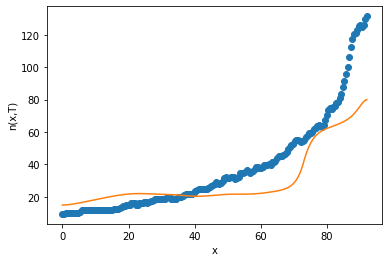

after perturb [5.948553733716726, 113.35732552085287, 26763.962946283482, 0.004361548428564066, 13.249949639521237]
parameters [5.948553733716726, 113.35732552085287, 26763.962946283482, 0.004361548428564066, 13.249949639521237]
oxigeno [13.50319787 13.5027901  13.50156933 13.49954313 13.49672409 13.49312966
 13.48878203 13.48370797 13.47793862 13.47150926 13.46445903 13.45683071
 13.44867044 13.4400274  13.43095357 13.42150344 13.41173376 13.40170324
 13.39147236 13.38110311 13.37065877 13.36020375 13.34980337 13.33952373
 13.32943153 13.31959394 13.31007849 13.30095293 13.29228515 13.28414305
 13.27659446 13.26970708 13.26354836 13.25818545 13.25368512 13.25011372
 13.24753713 13.24602069 13.24562921 13.24642694 13.24847755 13.25184417
 13.25658942 13.26277541 13.27046386 13.27971614 13.29059337 13.30315654
 13.3174666  13.33358462 13.35157188 13.37149006 13.39340137 13.41736864
 13.44345554 13.47172664 13.50224754 13.53508503 13.5703071  13.60798311
 13.64818377 13.69098127 13.73644

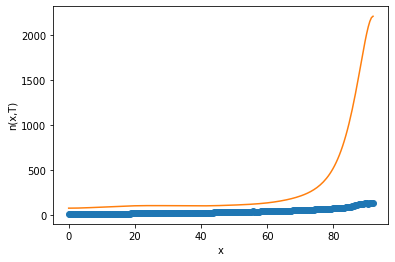

after perturb [13.674136007601351, 187.63975464843145, 16939.43106926595, 1.2702237213133085, 59.52503850794754]
parameters [13.674136007601351, 187.63975464843145, 16939.43106926595, 1.2702237213133085, 59.52503850794754]
after perturb [7.846605792014239, 117.18716146400655, 31137.368436203335, -0.11993589263608406, 7.053045197348112]
parameters [7.846605792014239, 117.18716146400655, 31137.368436203335, -0.11993589263608406, 7.053045197348112]
after perturb [3.2794760990600444, 111.77246211696107, 23773.32272796682, 0.37197941845704185, 33.781276646106996]
parameters [3.2794760990600444, 111.77246211696107, 23773.32272796682, 0.37197941845704185, 33.781276646106996]
oxigeno [3.28487366e-08 3.29331813e-08 3.31876033e-08 3.36152778e-08
 3.42216989e-08 3.50146337e-08 3.60041991e-08 3.72029629e-08
 3.86260707e-08 4.02913994e-08 4.22197423e-08 4.44350256e-08
 4.69645613e-08 4.98393390e-08 5.30943625e-08 5.67690325e-08
 6.09075848e-08 6.55595861e-08 7.07804964e-08 7.66323038e-08
 8.3184241

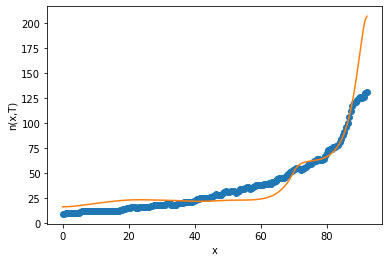

after perturb [8.954163679206326, 97.59844063049368, 21096.446125583887, 0.3012762193301448, 17.88003866677901]
parameters [8.954163679206326, 97.59844063049368, 21096.446125583887, 0.3012762193301448, 17.88003866677901]
oxigeno [2.05184350e-07 2.05220546e-07 2.05331291e-07 2.05523061e-07
 2.05806690e-07 2.06197426e-07 2.06715014e-07 2.07383812e-07
 2.08232932e-07 2.09296418e-07 2.10613465e-07 2.12228681e-07
 2.14192399e-07 2.16561044e-07 2.19397564e-07 2.22771935e-07
 2.26761733e-07 2.31452811e-07 2.36940056e-07 2.43328261e-07
 2.50733120e-07 2.59282343e-07 2.69116926e-07 2.80392570e-07
 2.93281285e-07 3.07973178e-07 3.24678451e-07 3.43629644e-07
 3.65084114e-07 3.89326809e-07 4.16673340e-07 4.47473397e-07
 4.82114528e-07 5.21026334e-07 5.64685102e-07 6.13618930e-07
 6.68413397e-07 7.29717815e-07 7.98252130e-07 8.74814541e-07
 9.60289897e-07 1.05565894e-06 1.16200851e-06 1.28054275e-06
 1.41259549e-06 1.55964379e-06 1.72332296e-06 1.90544293e-06
 2.10800640e-06 2.33322865e-06 2.583559

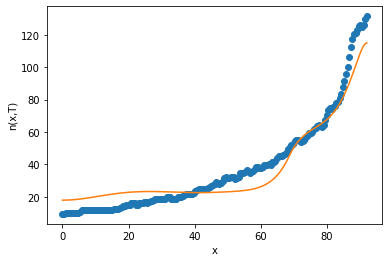

9
after perturb [8.374133313558147, 191.16891033821253, 15460.465055255067, 1.0297478530187893, 68.99554309509693]
parameters [8.374133313558147, 191.16891033821253, 15460.465055255067, 1.0297478530187893, 68.99554309509693]
after perturb [9.48306799889533, 174.59018135444046, 25013.889373018752, 0.7025909663410032, 44.09190602399727]
parameters [9.48306799889533, 174.59018135444046, 25013.889373018752, 0.7025909663410032, 44.09190602399727]
after perturb [3.4459661523056386, 39.03866969189818, 27331.701103924428, 0.27945394128149004, 17.0937953301227]
parameters [3.4459661523056386, 39.03866969189818, 27331.701103924428, 0.27945394128149004, 17.0937953301227]
oxigeno [7.31810214e-07 7.30821868e-07 7.27868011e-07 7.22981880e-07
 7.16217883e-07 7.07650155e-07 6.97370661e-07 6.85486904e-07
 6.72119366e-07 6.57398797e-07 6.41463438e-07 6.24456311e-07
 6.06522645e-07 5.87807514e-07 5.68453749e-07 5.48600130e-07
 5.28379909e-07 5.07919623e-07 4.87338205e-07 4.66746358e-07
 4.46246158e-07 4.

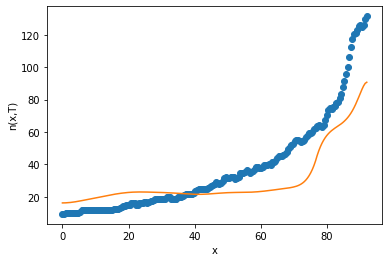

after perturb [11.638986144582713, 98.69590942152024, 32012.324136918953, 0.5002294570354668, 37.25416920353712]
parameters [11.638986144582713, 98.69590942152024, 32012.324136918953, 0.5002294570354668, 37.25416920353712]
after perturb [-0.0876706816903412, 32.60330429674822, 29441.65509995383, -0.22401203146139548, -14.515274624112738]
parameters [-0.0876706816903412, 32.60330429674822, 29441.65509995383, -0.22401203146139548, -14.515274624112738]
after perturb [6.031366131529163, 65.33240307369327, 26504.768977641466, 0.3266684928890742, 21.56673283475629]
parameters [6.031366131529163, 65.33240307369327, 26504.768977641466, 0.3266684928890742, 21.56673283475629]
oxigeno [8.58392305e-08 8.57589359e-08 8.55186878e-08 8.51203831e-08
 8.45671502e-08 8.38632999e-08 8.30142598e-08 8.20264929e-08
 8.09074033e-08 7.96652328e-08 7.83089495e-08 7.68481335e-08
 7.52928612e-08 7.36535918e-08 7.19410583e-08 7.01661661e-08
 6.83399003e-08 6.64732441e-08 6.45771089e-08 6.26622785e-08
 6.07393665e

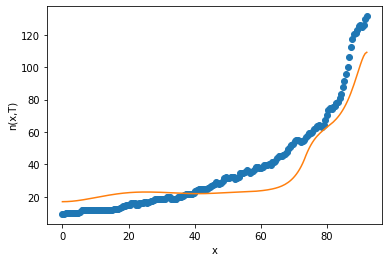

after perturb [4.3175564457829125, -7.548961422282268, 23543.672847936912, 0.13938036272776366, 26.465701814055215]
parameters [4.3175564457829125, -7.548961422282268, 23543.672847936912, 0.13938036272776366, 26.465701814055215]
after perturb [8.136030327448406, 119.79576979629009, 26515.723282871964, 0.30489995433800693, 26.051088670162052]
parameters [8.136030327448406, 119.79576979629009, 26515.723282871964, 0.30489995433800693, 26.051088670162052]
oxigeno [3.74203081e-07 3.74927591e-07 3.77108289e-07 3.80766733e-07
 3.85939053e-07 3.92676238e-07 4.01044564e-07 4.11126130e-07
 4.23019542e-07 4.36840731e-07 4.52723915e-07 4.70822733e-07
 4.91311532e-07 5.14386853e-07 5.40269099e-07 5.69204429e-07
 6.01466874e-07 6.37360706e-07 6.77223076e-07 7.21426954e-07
 7.70384373e-07 8.24550039e-07 8.84425303e-07 9.50562552e-07
 1.02357004e-06 1.10411720e-06 1.19294051e-06 1.29084984e-06
 1.39873557e-06 1.51757621e-06 1.64844685e-06 1.79252839e-06
 1.95111756e-06 2.12563796e-06 2.31765201e-06 2.

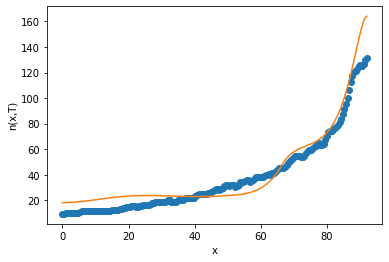

10
after perturb [5.877087402149755, 96.61492707653335, 24601.74405172116, 0.28235270828627596, 43.1333328696205]
parameters [5.877087402149755, 96.61492707653335, 24601.74405172116, 0.28235270828627596, 43.1333328696205]
oxigeno [7.21051243e-07 7.20797509e-07 7.20041265e-07 7.18797358e-07
 7.17090472e-07 7.14955027e-07 7.12435062e-07 7.09584092e-07
 7.06464965e-07 7.03149722e-07 6.99719479e-07 6.96264352e-07
 6.92883427e-07 6.89684809e-07 6.86785752e-07 6.84312892e-07
 6.82402596e-07 6.81201448e-07 6.80866870e-07 6.81567915e-07
 6.83486224e-07 6.86817173e-07 6.91771219e-07 6.98575468e-07
 7.07475460e-07 7.18737214e-07 7.32649531e-07 7.49526584e-07
 7.69710814e-07 7.93576153e-07 8.21531611e-07 8.54025236e-07
 8.91548502e-07 9.34641140e-07 9.83896461e-07 1.03996721e-06
 1.10357198e-06 1.17550228e-06 1.25663027e-06 1.34791721e-06
 1.45042275e-06 1.56531508e-06 1.69388202e-06 1.83754321e-06
 1.99786337e-06 2.17656687e-06 2.37555361e-06 2.59691645e-06
 2.84296021e-06 3.11622250e-06 3.41949

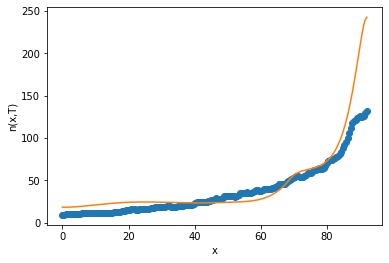

after perturb [7.863626770468456, 179.50745851430887, 21219.03279449493, 0.2571767739072515, 22.742006097208684]
parameters [7.863626770468456, 179.50745851430887, 21219.03279449493, 0.2571767739072515, 22.742006097208684]
after perturb [10.561070071571391, 77.49542775783489, 27939.763051297956, 0.3217462764062076, 18.05375932648476]
parameters [10.561070071571391, 77.49542775783489, 27939.763051297956, 0.3217462764062076, 18.05375932648476]
after perturb [5.890826078962991, 29.928011617723804, 30602.69805592287, 0.1377821221587403, 18.236993540177725]
parameters [5.890826078962991, 29.928011617723804, 30602.69805592287, 0.1377821221587403, 18.236993540177725]
after perturb [6.627455097282394, 166.85158794112684, 21291.123461400475, 1.0207233020019248, 55.847980044695504]
parameters [6.627455097282394, 166.85158794112684, 21291.123461400475, 1.0207233020019248, 55.847980044695504]
after perturb [2.945436774355482, 31.090649457567704, 26442.979871300216, 0.3608776580629618, 25.925818934

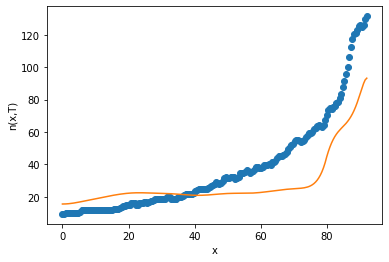

after perturb [5.3831205472393515, 71.83010833105205, 23071.423536268536, 0.4263727611049709, 53.06119757589085]
parameters [5.3831205472393515, 71.83010833105205, 23071.423536268536, 0.4263727611049709, 53.06119757589085]
after perturb [6.048376050937577, 151.5478960695335, 21637.838565467995, 0.16154149744455001, 22.17490412043444]
parameters [6.048376050937577, 151.5478960695335, 21637.838565467995, 0.16154149744455001, 22.17490412043444]
after perturb [10.554498639675618, 103.83041047736684, 23727.886730405906, 0.6029334614401229, 35.05203915342207]
parameters [10.554498639675618, 103.83041047736684, 23727.886730405906, 0.6029334614401229, 35.05203915342207]
after perturb [3.9295341429206805, 121.92194130438699, 25009.533802893104, 0.5996825533101068, 27.0620687222399]
parameters [3.9295341429206805, 121.92194130438699, 25009.533802893104, 0.5996825533101068, 27.0620687222399]
oxigeno [5.39887397e-10 5.43508456e-10 5.54421902e-10 5.72779381e-10
 5.98836451e-10 6.32956851e-10 6.7561

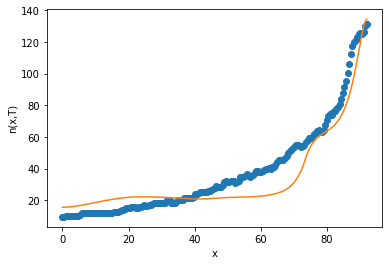

after perturb [3.8234784463671714, 68.76803574675702, 21862.951014933664, 0.17581616905465514, 25.042296394608666]
parameters [3.8234784463671714, 68.76803574675702, 21862.951014933664, 0.17581616905465514, 25.042296394608666]
oxigeno [6.69063707e-05 6.68593244e-05 6.67185492e-05 6.64851294e-05
 6.61608479e-05 6.57481505e-05 6.52500989e-05 6.46703126e-05
 6.40129038e-05 6.32824069e-05 6.24837043e-05 6.16219530e-05
 6.07025122e-05 5.97308750e-05 5.87126053e-05 5.76532811e-05
 5.65584451e-05 5.54335628e-05 5.42839873e-05 5.31149327e-05
 5.19314526e-05 5.07384253e-05 4.95405441e-05 4.83423113e-05
 4.71480368e-05 4.59618386e-05 4.47876462e-05 4.36292060e-05
 4.24900878e-05 4.13736930e-05 4.02832638e-05 3.92218937e-05
 3.81925397e-05 3.71980344e-05 3.62411016e-05 3.53243717e-05
 3.44503998e-05 3.36216857e-05 3.28406960e-05 3.21098884e-05
 3.14317386e-05 3.08087703e-05 3.02435874e-05 2.97389094e-05
 2.92976104e-05 2.89227607e-05 2.86176721e-05 2.83859463e-05
 2.82315268e-05 2.81587549e-05 2.

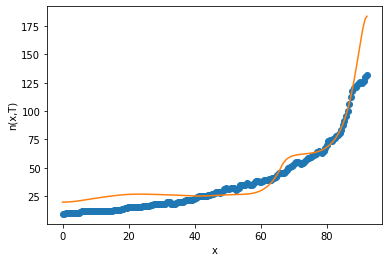

after perturb [1.1219926546097811, 2.2279969347354225, 29584.26522175788, 0.22538698635950521, 14.229667553809968]
parameters [1.1219926546097811, 2.2279969347354225, 29584.26522175788, 0.22538698635950521, 14.229667553809968]
after perturb [10.85500755677022, 116.46201711132491, 30524.549779031913, 0.5420363755628395, 36.666462036595014]
parameters [10.85500755677022, 116.46201711132491, 30524.549779031913, 0.5420363755628395, 36.666462036595014]
after perturb [4.088371284081456, 82.68698508557306, 25312.563066903156, 0.11798609054553086, 17.2127306607982]
parameters [4.088371284081456, 82.68698508557306, 25312.563066903156, 0.11798609054553086, 17.2127306607982]
oxigeno [8.88412888e-04 8.87991479e-04 8.86730215e-04 8.84637942e-04
 8.81729234e-04 8.78024150e-04 8.73547907e-04 8.68330477e-04
 8.62406132e-04 8.55812946e-04 8.48592273e-04 8.40788215e-04
 8.32447102e-04 8.23616989e-04 8.14347188e-04 8.04687841e-04
 7.94689537e-04 7.84402989e-04 7.73878753e-04 7.63167005e-04
 7.52317365e-0

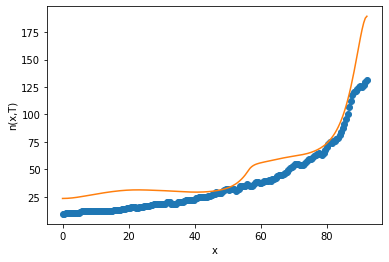

after perturb [3.5861670618943102, 52.253844703525466, 21538.857088993533, 0.10539454177673016, 28.342444586884437]
parameters [3.5861670618943102, 52.253844703525466, 21538.857088993533, 0.10539454177673016, 28.342444586884437]
oxigeno [2.09691989e-03 2.09551331e-03 2.09130515e-03 2.08432983e-03
 2.07464391e-03 2.06232477e-03 2.04746901e-03 2.03019046e-03
 2.01061787e-03 1.98889250e-03 1.96516566e-03 1.93959616e-03
 1.91234791e-03 1.88358770e-03 1.85348313e-03 1.82220077e-03
 1.78990466e-03 1.75675494e-03 1.72290689e-03 1.68851007e-03
 1.65370778e-03 1.61863660e-03 1.58342619e-03 1.54819912e-03
 1.51307085e-03 1.47814976e-03 1.44353718e-03 1.40932753e-03
 1.37560839e-03 1.34246064e-03 1.30995857e-03 1.27816999e-03
 1.24715634e-03 1.21697282e-03 1.18766850e-03 1.15928644e-03
 1.13186387e-03 1.10543228e-03 1.08001766e-03 1.05564065e-03
 1.03231683e-03 1.01005694e-03 9.88867203e-04 9.68749680e-04
 9.49702659e-04 9.31721091e-04 9.14797059e-04 8.98920299e-04
 8.84078732e-04 8.70259039e-04 

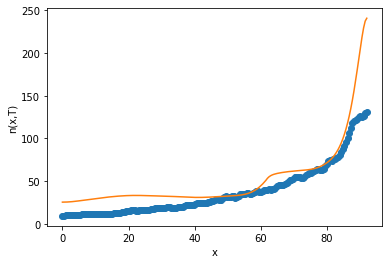

after perturb [5.350666182746793, 42.373805800026204, 28999.458441302653, -0.08690067550855529, 7.788365757913555]
parameters [5.350666182746793, 42.373805800026204, 28999.458441302653, -0.08690067550855529, 7.788365757913555]
after perturb [6.13238235938288, 25.25230710698013, 24110.126803143165, 0.042875520298823494, 41.27433142748478]
parameters [6.13238235938288, 25.25230710698013, 24110.126803143165, 0.042875520298823494, 41.27433142748478]
oxigeno [1.28685265e-01 1.28606675e-01 1.28371496e-01 1.27981497e-01
 1.27439589e-01 1.26749785e-01 1.25917135e-01 1.24947648e-01
 1.23848202e-01 1.22626443e-01 1.21290678e-01 1.19849764e-01
 1.18312991e-01 1.16689972e-01 1.14990527e-01 1.13224584e-01
 1.11402074e-01 1.09532840e-01 1.07626559e-01 1.05692661e-01
 1.03740273e-01 1.01778159e-01 9.98146776e-02 9.78577461e-02
 9.59148118e-02 9.39928327e-02 9.20982633e-02 9.02370474e-02
 8.84146160e-02 8.66358888e-02 8.49052809e-02 8.32267115e-02
 8.16036156e-02 8.00389578e-02 7.85352486e-02 7.709456

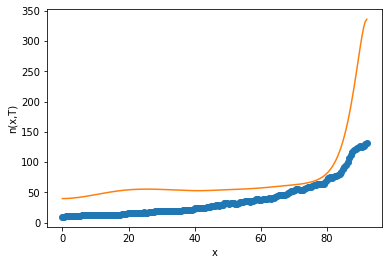

after perturb [9.319838896282759, 57.88127728987583, 27849.979649549707, 0.22048888849285186, 25.66814334259513]
parameters [9.319838896282759, 57.88127728987583, 27849.979649549707, 0.22048888849285186, 25.66814334259513]
oxigeno [7.98139421e-06 7.97556250e-06 7.95810316e-06 7.92912316e-06
 7.88879928e-06 7.83737599e-06 7.77516248e-06 7.70252892e-06
 7.61990215e-06 7.52776072e-06 7.42662945e-06 7.31707371e-06
 7.19969332e-06 7.07511639e-06 6.94399303e-06 6.80698920e-06
 6.66478063e-06 6.51804704e-06 6.36746658e-06 6.21371075e-06
 6.05743969e-06 5.89929792e-06 5.73991065e-06 5.57988057e-06
 5.41978516e-06 5.26017460e-06 5.10157015e-06 4.94446308e-06
 4.78931415e-06 4.63655343e-06 4.48658080e-06 4.33976665e-06
 4.19645321e-06 4.05695607e-06 3.92156623e-06 3.79055236e-06
 3.66416346e-06 3.54263176e-06 3.42617603e-06 3.31500501e-06
 3.20932128e-06 3.10932529e-06 3.01521983e-06 2.92721466e-06
 2.84553157e-06 2.77040980e-06 2.70211183e-06 2.64092963e-06
 2.58719139e-06 2.54126886e-06 2.5035

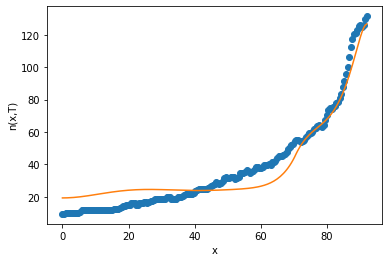

11
after perturb [2.7851015530707035, 153.4342382037739, 21627.511122364718, 0.1595553436368427, 1.7123324246173013]
parameters [2.7851015530707035, 153.4342382037739, 21627.511122364718, 0.1595553436368427, 1.7123324246173013]
after perturb [9.15096866391127, 61.33636457548682, 24579.335276016256, 0.3075430401939937, 41.69614318687155]
parameters [9.15096866391127, 61.33636457548682, 24579.335276016256, 0.3075430401939937, 41.69614318687155]
oxigeno [2.32017993e-07 2.31818279e-07 2.31220499e-07 2.30228723e-07
 2.28849673e-07 2.27092634e-07 2.24969338e-07 2.22493808e-07
 2.19682184e-07 2.16552526e-07 2.13124593e-07 2.09419617e-07
 2.05460063e-07 2.01269385e-07 1.96871786e-07 1.92291981e-07
 1.87554972e-07 1.82685829e-07 1.77709497e-07 1.72650616e-07
 1.67533361e-07 1.62381310e-07 1.57217335e-07 1.52063518e-07
 1.46941092e-07 1.41870413e-07 1.36870955e-07 1.31961332e-07
 1.27159352e-07 1.22482091e-07 1.17945998e-07 1.13567025e-07
 1.09360787e-07 1.05342747e-07 1.01528428e-07 9.79336627e

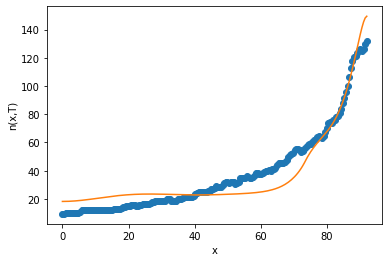

after perturb [7.797487549953724, 166.08885758669035, 23215.035773430514, 0.35265347604970143, 21.15195423138989]
parameters [7.797487549953724, 166.08885758669035, 23215.035773430514, 0.35265347604970143, 21.15195423138989]
after perturb [8.226298474655643, 97.02335019493566, 16536.858007942246, 0.2396003880759494, 34.005253258595395]
parameters [8.226298474655643, 97.02335019493566, 16536.858007942246, 0.2396003880759494, 34.005253258595395]
after perturb [7.121893018967196, 33.19852708501119, 26232.672723076346, 0.264167324386724, 28.398621445694324]
parameters [7.121893018967196, 33.19852708501119, 26232.672723076346, 0.264167324386724, 28.398621445694324]
oxigeno [1.49021115e-06 1.48835690e-06 1.48281125e-06 1.47362524e-06
 1.46088289e-06 1.44469967e-06 1.42522042e-06 1.40261683e-06
 1.37708443e-06 1.34883932e-06 1.31811467e-06 1.28515701e-06
 1.25022258e-06 1.21357359e-06 1.17547474e-06 1.13618975e-06
 1.09597834e-06 1.05509328e-06 1.01377796e-06 9.72264210e-07
 9.30770450e-07 8.

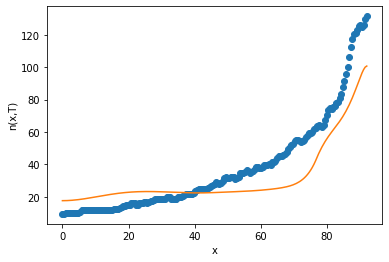

after perturb [4.009002878445999, 36.87419261165677, 28673.96515506517, -0.1744045558173783, 15.17694566214184]
parameters [4.009002878445999, 36.87419261165677, 28673.96515506517, -0.1744045558173783, 15.17694566214184]
after perturb [10.781765128035063, 172.33720337098862, 23705.229453405133, 0.44434769815953523, 23.162426038649116]
parameters [10.781765128035063, 172.33720337098862, 23705.229453405133, 0.44434769815953523, 23.162426038649116]
after perturb [8.775834941135397, 197.64835882840953, 22319.579138301648, 0.553645570061047, 17.604347200355623]
parameters [8.775834941135397, 197.64835882840953, 22319.579138301648, 0.553645570061047, 17.604347200355623]
after perturb [10.045910929150098, 81.81936702512267, 24783.548252701108, 0.38719183414976266, 22.796835421995322]
parameters [10.045910929150098, 81.81936702512267, 24783.548252701108, 0.38719183414976266, 22.796835421995322]
after perturb [0.2715812040132235, 10.851355156141175, 29545.741993998006, -0.045859480815467674, 13

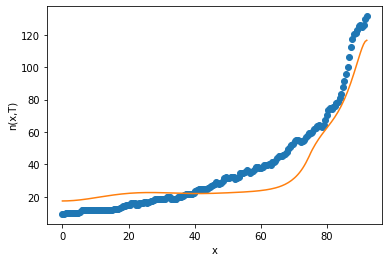

after perturb [10.153792658725104, 99.8872443477147, 20396.69031703845, 0.2674046844901784, 27.065521925777137]
parameters [10.153792658725104, 99.8872443477147, 20396.69031703845, 0.2674046844901784, 27.065521925777137]
after perturb [9.478946671532835, 134.22186346392772, 14661.158944393219, 0.35609138138432134, 27.959891235165053]
parameters [9.478946671532835, 134.22186346392772, 14661.158944393219, 0.35609138138432134, 27.959891235165053]
after perturb [2.953469797107473, 144.67993062940465, 16570.600730394923, 0.17628144057956846, 11.457037083215631]
parameters [2.953469797107473, 144.67993062940465, 16570.600730394923, 0.17628144057956846, 11.457037083215631]
after perturb [9.48931678870665, 59.40669870427219, 24602.728769064186, 0.023542769529593, 25.05133126492596]
parameters [9.48931678870665, 59.40669870427219, 24602.728769064186, 0.023542769529593, 25.05133126492596]
oxigeno [ 0.93115006  0.93097779  0.93046175  0.92960419  0.92840892  0.92688116
  0.92502758  0.92285621  0

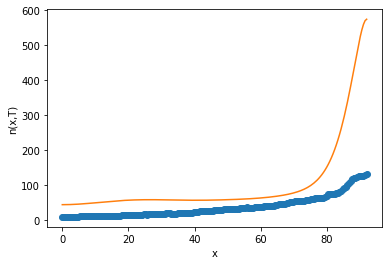

after perturb [-3.4399572587206224, 29.389287810855127, 21309.066492738966, 0.14483074297741086, 9.008109783936858]
parameters [-3.4399572587206224, 29.389287810855127, 21309.066492738966, 0.14483074297741086, 9.008109783936858]
after perturb [1.6022481736197616, 126.39953961332452, 21497.580550313585, 0.4601848135632336, 25.904207014967906]
parameters [1.6022481736197616, 126.39953961332452, 21497.580550313585, 0.4601848135632336, 25.904207014967906]
oxigeno [1.13357127e-08 1.13901353e-08 1.15540283e-08 1.18292744e-08
 1.22190350e-08 1.27277864e-08 1.33613713e-08 1.41270668e-08
 1.50336704e-08 1.60916043e-08 1.73130409e-08 1.87120485e-08
 2.03047598e-08 2.21095637e-08 2.41473206e-08 2.64416057e-08
 2.90189812e-08 3.19093050e-08 3.51460822e-08 3.87668694e-08
 4.28137409e-08 4.73338295e-08 5.23799499e-08 5.80113114e-08
 6.42943263e-08 7.13035128e-08 7.91224946e-08 8.78450967e-08
 9.75765421e-08 1.08434760e-07 1.20551824e-07 1.34075554e-07
 1.49171304e-07 1.66024004e-07 1.84840464e-07 2.

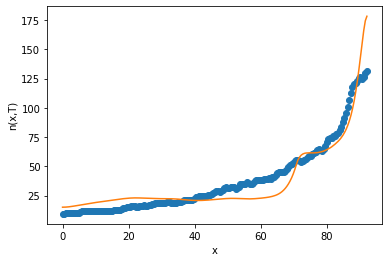

after perturb [11.47814158670367, 64.64647105631667, 32849.03857663848, 0.36473876507708514, 42.81900496771505]
parameters [11.47814158670367, 64.64647105631667, 32849.03857663848, 0.36473876507708514, 42.81900496771505]
after perturb [8.280450126358913, 56.568653060041136, 29563.43701830317, 0.33813117808223614, 18.218801999800668]
parameters [8.280450126358913, 56.568653060041136, 29563.43701830317, 0.33813117808223614, 18.218801999800668]
after perturb [8.85073955325958, 97.38482348783285, 25423.182127768006, 0.4899414162178022, 31.697902627216695]
parameters [8.85073955325958, 97.38482348783285, 25423.182127768006, 0.4899414162178022, 31.697902627216695]
oxigeno [3.34210192e-10 3.36164802e-10 3.42060258e-10 3.51991965e-10
 3.66120688e-10 3.84675213e-10 4.07956145e-10 4.36340910e-10
 4.70290038e-10 5.10354860e-10 5.57186733e-10 6.11547980e-10
 6.74324717e-10 7.46541810e-10 8.29380220e-10 9.24197033e-10
 1.03254853e-09 1.15621672e-09 1.29723971e-09 1.45794660e-09
 1.64099732e-09 1.84

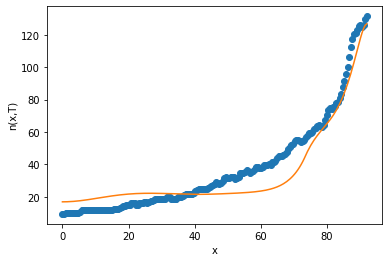

after perturb [5.59816109181215, 92.10890374402979, 29058.76781188221, 0.06891565768845087, 9.357620085245376]
parameters [5.59816109181215, 92.10890374402979, 29058.76781188221, 0.06891565768845087, 9.357620085245376]
after perturb [12.101025004777895, 92.62129737662582, 25072.513287506405, 0.5376113805695768, 54.36997859121015]
parameters [12.101025004777895, 92.62129737662582, 25072.513287506405, 0.5376113805695768, 54.36997859121015]
after perturb [4.660575871530014, 180.11869487544843, 19235.636781889116, 0.710070191131621, 38.83634291613454]
parameters [4.660575871530014, 180.11869487544843, 19235.636781889116, 0.710070191131621, 38.83634291613454]
after perturb [8.060288978049151, 38.61215906830175, 25827.669888216427, -0.02739803222099413, 7.690631226767362]
parameters [8.060288978049151, 38.61215906830175, 25827.669888216427, -0.02739803222099413, 7.690631226767362]
after perturb [10.025564825047041, 143.51103813787196, 20936.800878794915, 0.5348472861737357, 37.43342801099192

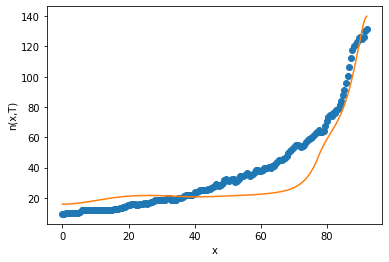

after perturb [5.696334942642755, 61.563808521552914, 22181.603119269144, 0.10397279661212638, 44.06838567515224]
parameters [5.696334942642755, 61.563808521552914, 22181.603119269144, 0.10397279661212638, 44.06838567515224]
oxigeno [3.09089943e-03 3.08915732e-03 3.08394235e-03 3.07528845e-03
 3.06325156e-03 3.04790884e-03 3.02935751e-03 3.00771344e-03
 2.98310954e-03 2.95569390e-03 2.92562788e-03 2.89308405e-03
 2.85824413e-03 2.82129690e-03 2.78243619e-03 2.74185895e-03
 2.69976343e-03 2.65634746e-03 2.61180700e-03 2.56633470e-03
 2.52011876e-03 2.47334188e-03 2.42618039e-03 2.37880359e-03
 2.33137312e-03 2.28404260e-03 2.23695724e-03 2.19025370e-03
 2.14405991e-03 2.09849507e-03 2.05366967e-03 2.00968559e-03
 1.96663624e-03 1.92460676e-03 1.88367428e-03 1.84390819e-03
 1.80537047e-03 1.76811603e-03 1.73219313e-03 1.69764380e-03
 1.66450429e-03 1.63280554e-03 1.60257372e-03 1.57383074e-03
 1.54659481e-03 1.52088102e-03 1.49670191e-03 1.47406806e-03
 1.45298873e-03 1.43347241e-03 1.41

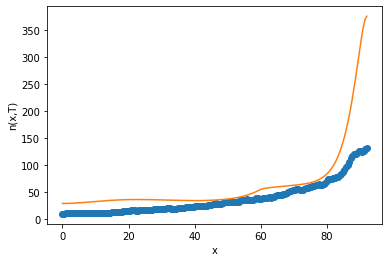

after perturb [5.203313808539248, 64.70421004764003, 23552.991572756873, 0.3461367023610614, 11.489387541265376]
parameters [5.203313808539248, 64.70421004764003, 23552.991572756873, 0.3461367023610614, 11.489387541265376]
oxigeno [3.03034756e-08 3.02731995e-08 3.01826298e-08 3.00325377e-08
 2.98241934e-08 2.95593446e-08 2.92401868e-08 2.88693273e-08
 2.84497442e-08 2.79847404e-08 2.74778965e-08 2.69330215e-08
 2.63541047e-08 2.57452688e-08 2.51107259e-08 2.44547376e-08
 2.37815799e-08 2.30955128e-08 2.24007566e-08 2.17014736e-08
 2.10017567e-08 2.03056243e-08 1.96170218e-08 1.89398296e-08
 1.82778781e-08 1.76349689e-08 1.70149040e-08 1.64215210e-08
 1.58587369e-08 1.53305995e-08 1.48413478e-08 1.43954819e-08
 1.39978440e-08 1.36537105e-08 1.33688981e-08 1.31498847e-08
 1.30039472e-08 1.29393186e-08 1.29653666e-08 1.30927979e-08
 1.33338899e-08 1.37027552e-08 1.42156425e-08 1.48912798e-08
 1.57512655e-08 1.68205143e-08 1.81277655e-08 1.97061630e-08
 2.15939175e-08 2.38350610e-08 2.6480

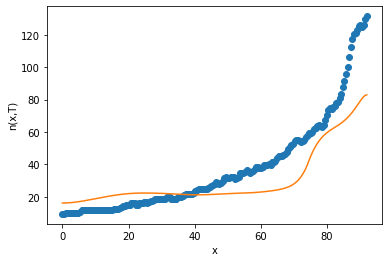

after perturb [7.615339846823488, 77.40976749470433, 20114.20994902726, 0.6240234614369077, 38.68567713929603]
parameters [7.615339846823488, 77.40976749470433, 20114.20994902726, 0.6240234614369077, 38.68567713929603]
oxigeno [9.25777913e-13 9.31239382e-13 9.47776535e-13 9.75851465e-13
 1.01624726e-12 1.07008782e-12 1.13886636e-12 1.22448346e-12
 1.32929579e-12 1.45617682e-12 1.60859135e-12 1.79068587e-12
 2.00739745e-12 2.26458423e-12 2.56918100e-12 2.92938463e-12
 3.35487422e-12 3.85707236e-12 4.44945477e-12 5.14791698e-12
 5.97120833e-12 6.94144534e-12 8.08471878e-12 9.43181126e-12
 1.10190452e-11 1.28892847e-11 1.50931185e-11 1.76902573e-11
 2.07511823e-11 2.43590914e-11 2.86121942e-11 3.36264192e-11
 3.95386043e-11 4.65102576e-11 5.47319867e-11 6.44287146e-11
 7.58658195e-11 8.93563574e-11 1.05269558e-10 1.24040812e-10
 1.46183403e-10 1.72302294e-10 2.03110310e-10 2.39447125e-10
 2.82301539e-10 3.32837601e-10 3.92425217e-10 4.62676017e-10
 5.45485351e-10 6.43081451e-10 7.58082947

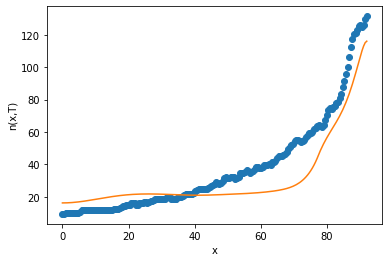

after perturb [9.490529395740863, 151.48932114134334, 17085.904904720333, 0.620116224723335, 31.016728640538073]
parameters [9.490529395740863, 151.48932114134334, 17085.904904720333, 0.620116224723335, 31.016728640538073]
after perturb [4.073704176921133, -5.971431124351852, 29298.24505053248, -0.1624106116744115, 14.295243105981871]
parameters [4.073704176921133, -5.971431124351852, 29298.24505053248, -0.1624106116744115, 14.295243105981871]
after perturb [4.069930170982004, 68.86553016122, 27851.75407711354, 0.7302421985876469, 52.80375795315537]
parameters [4.069930170982004, 68.86553016122, 27851.75407711354, 0.7302421985876469, 52.80375795315537]
after perturb [3.817438559570606, 123.51540328909397, 18520.39205685733, 0.44265119599977276, 24.557663791163833]
parameters [3.817438559570606, 123.51540328909397, 18520.39205685733, 0.44265119599977276, 24.557663791163833]
after perturb [3.7103212056797887, 131.43087558838025, 19301.472149797333, 0.8245806871136121, 58.93708689196872]


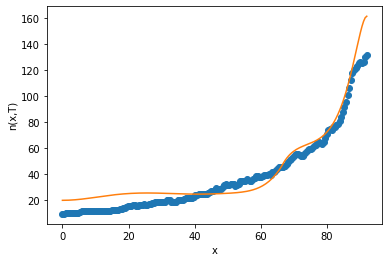

12
after perturb [10.814628246248251, 110.52164973039919, 17552.45188379923, 0.3620028977783172, 35.39961311330222]
parameters [10.814628246248251, 110.52164973039919, 17552.45188379923, 0.3620028977783172, 35.39961311330222]
after perturb [5.268659600991453, 157.54676912687373, 18542.235395724245, 0.7186533169989664, 39.04312167475175]
parameters [5.268659600991453, 157.54676912687373, 18542.235395724245, 0.7186533169989664, 39.04312167475175]
after perturb [9.231955405148787, 228.2769712172476, 16061.51370138158, 0.8252787383507044, 36.32527891395704]
parameters [9.231955405148787, 228.2769712172476, 16061.51370138158, 0.8252787383507044, 36.32527891395704]
after perturb [9.42696460094702, 44.46759225790377, 22017.20516510967, 0.3063666843483609, 34.10484004996359]
parameters [9.42696460094702, 44.46759225790377, 22017.20516510967, 0.3063666843483609, 34.10484004996359]
oxigeno [2.39913953e-07 2.39662112e-07 2.38908539e-07 2.37659061e-07
 2.35923288e-07 2.33714474e-07 2.31049316e-07 

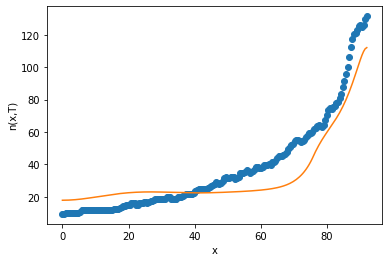

after perturb [6.405122230719011, 17.461923666670593, 31487.076126440807, 0.3211930993791051, 25.04526437288564]
parameters [6.405122230719011, 17.461923666670593, 31487.076126440807, 0.3211930993791051, 25.04526437288564]
after perturb [2.2301816456886963, 40.52745831780709, 25034.566418804818, 0.12677094885271337, 19.11910479164384]
parameters [2.2301816456886963, 40.52745831780709, 25034.566418804818, 0.12677094885271337, 19.11910479164384]
oxigeno [5.50268225e-04 5.49766658e-04 5.48267588e-04 5.45787715e-04
 5.42354243e-04 5.38003989e-04 5.32782219e-04 5.26741291e-04
 5.19939189e-04 5.12438026e-04 5.04302581e-04 4.95598945e-04
 4.86393299e-04 4.76750875e-04 4.66735109e-04 4.56406981e-04
 4.45824557e-04 4.35042710e-04 4.24112987e-04 4.13083617e-04
 4.01999612e-04 3.90902933e-04 3.79832681e-04 3.68825300e-04
 3.57914741e-04 3.47132602e-04 3.36508215e-04 3.26068697e-04
 3.15838969e-04 3.05841755e-04 2.96097582e-04 2.86624787e-04
 2.77439541e-04 2.68555896e-04 2.59985837e-04 2.51739360

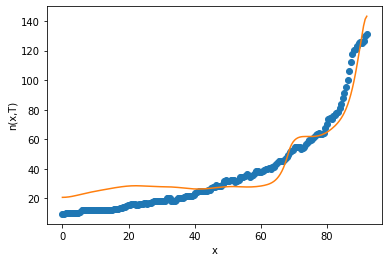

after perturb [7.693477062923959, 193.35846718779138, 17889.573713441638, 1.1669371666412345, 55.9186975185429]
parameters [7.693477062923959, 193.35846718779138, 17889.573713441638, 1.1669371666412345, 55.9186975185429]
after perturb [6.71393468046273, 55.63880006125528, 28058.05337499892, -0.052081298468658166, -7.720900016762023]
parameters [6.71393468046273, 55.63880006125528, 28058.05337499892, -0.052081298468658166, -7.720900016762023]
after perturb [5.612729086786708, 40.77151854320675, 26242.09506127354, 0.3299174323658764, 20.57987660105372]
parameters [5.612729086786708, 40.77151854320675, 26242.09506127354, 0.3299174323658764, 20.57987660105372]
oxigeno [8.95907460e-08 8.94738347e-08 8.91242510e-08 8.85454216e-08
 8.77429798e-08 8.67246511e-08 8.55000993e-08 8.40807379e-08
 8.24795133e-08 8.07106670e-08 7.87894840e-08 7.67320353e-08
 7.45549201e-08 7.22750162e-08 6.99092425e-08 6.74743390e-08
 6.49866680e-08 6.24620380e-08 5.99155536e-08 5.73614901e-08
 5.48131940e-08 5.2283

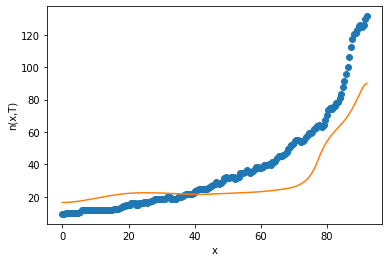

after perturb [5.82872618848924, 134.98532584204585, 16880.047652286157, 0.39955035881324463, 31.711654935557263]
parameters [5.82872618848924, 134.98532584204585, 16880.047652286157, 0.39955035881324463, 31.711654935557263]
after perturb [5.758598131489297, 84.45392082774349, 22155.480219891993, 0.16681815711034828, 28.918572296036203]
parameters [5.758598131489297, 84.45392082774349, 22155.480219891993, 0.16681815711034828, 28.918572296036203]
oxigeno [1.05387771e-04 1.05332785e-04 1.05168192e-04 1.04895082e-04
 1.04515259e-04 1.04031215e-04 1.03446100e-04 1.02763684e-04
 1.01988315e-04 1.01124865e-04 1.00178684e-04 9.91555371e-05
 9.80615573e-05 9.69031842e-05 9.56871130e-05 9.44202424e-05
 9.31096279e-05 9.17624376e-05 9.03859144e-05 8.89873424e-05
 8.75740186e-05 8.61532311e-05 8.47322414e-05 8.33182736e-05
 8.19185075e-05 8.05400778e-05 7.91900775e-05 7.78755663e-05
 7.66035835e-05 7.53811648e-05 7.42153635e-05 7.31132760e-05
 7.20820705e-05 7.11290206e-05 7.02615423e-05 6.948723

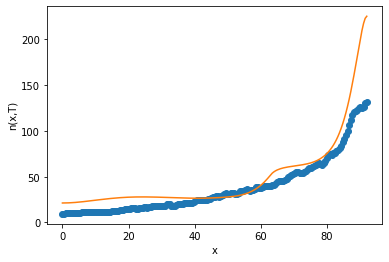

after perturb [7.741161505154833, 56.15501285511286, 34616.35990051963, 0.6344052755385563, 63.029724541185836]
parameters [7.741161505154833, 56.15501285511286, 34616.35990051963, 0.6344052755385563, 63.029724541185836]
after perturb [10.309358507157445, 124.29987645424652, 19357.470024644324, 0.5113767719280385, 34.3390085584285]
parameters [10.309358507157445, 124.29987645424652, 19357.470024644324, 0.5113767719280385, 34.3390085584285]
after perturb [4.346237680240529, 67.93301396607252, 29643.97298228436, -0.3450236048762291, -4.613995501987517]
parameters [4.346237680240529, 67.93301396607252, 29643.97298228436, -0.3450236048762291, -4.613995501987517]
after perturb [15.85737722127066, 139.8131943777365, 22603.33083485744, -0.15092093673887386, 15.480431130034415]
parameters [15.85737722127066, 139.8131943777365, 22603.33083485744, -0.15092093673887386, 15.480431130034415]
after perturb [8.274977980160065, 157.72682282699193, 22686.0259617653, 0.8126808925911857, 32.3805537071281

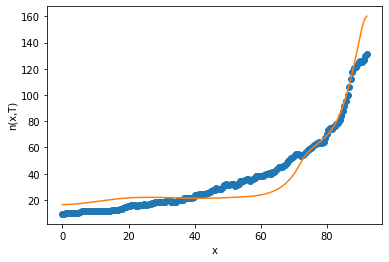

after perturb [12.72583262028062, 123.83050552779207, 16776.02035951117, 0.5890323580705452, 54.21386901365241]
parameters [12.72583262028062, 123.83050552779207, 16776.02035951117, 0.5890323580705452, 54.21386901365241]
after perturb [8.014921827061105, 68.58629291063139, 20810.181209895058, 0.5629649983682734, 46.94264215793739]
parameters [8.014921827061105, 68.58629291063139, 20810.181209895058, 0.5629649983682734, 46.94264215793739]
oxigeno [6.53145697e-12 6.52757329e-12 6.51607287e-12 6.49740901e-12
 6.47234210e-12 6.44194740e-12 6.40762656e-12 6.37112369e-12
 6.33454696e-12 6.30039681e-12 6.27160227e-12 6.25156712e-12
 6.24422779e-12 6.25412545e-12 6.28649503e-12 6.34737431e-12
 6.44373698e-12 6.58365385e-12 6.77648767e-12 7.03312733e-12
 7.36626882e-12 7.79075132e-12 8.32395823e-12 8.98629523e-12
 9.80175892e-12 1.07986128e-11 1.20101899e-11 1.34758449e-11
 1.52420832e-11 1.73638987e-11 1.99063589e-11 2.29464803e-11
 2.65754486e-11 3.09012450e-11 3.60517511e-11 4.21784191e-11
 

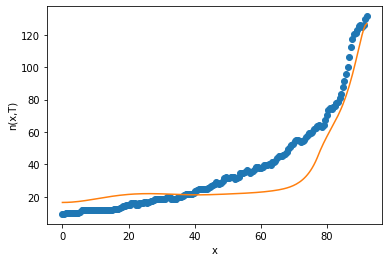

after perturb [5.063852320094025, 96.35493400949288, 22820.994482523834, 0.5476738749317626, 48.582985403506626]
parameters [5.063852320094025, 96.35493400949288, 22820.994482523834, 0.5476738749317626, 48.582985403506626]
oxigeno [7.37524660e-11 7.42632813e-11 7.58045951e-11 7.84031781e-11
 8.21042065e-11 8.69721119e-11 9.30917925e-11 1.00570212e-10
 1.09538412e-10 1.20153987e-10 1.32604056e-10 1.47108799e-10
 1.63925626e-10 1.83354054e-10 2.05741401e-10 2.31489382e-10
 2.61061778e-10 2.94993281e-10 3.33899730e-10 3.78489915e-10
 4.29579183e-10 4.88105129e-10 5.55145649e-10 6.31939732e-10
 7.19911378e-10 8.20697101e-10 9.36177540e-10 1.06851378e-09
 1.22018905e-09 1.39405656e-09 1.59339442e-09 1.82196848e-09
 2.08410445e-09 2.38477030e-09 2.72967062e-09 3.12535446e-09
 3.57933854e-09 4.10024785e-09 4.69797619e-09 5.38386914e-09
 6.17093268e-09 7.07407090e-09 8.11035662e-09 9.29933962e-09
 1.06633974e-08 1.22281345e-08 1.40228362e-08 1.60809861e-08
 1.84408527e-08 2.11461585e-08 2.4246

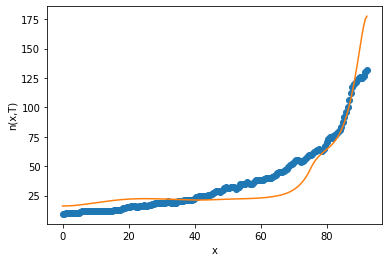

after perturb [10.520618618541302, 174.36332796338436, 24953.491351836878, 0.7152115899743098, 38.23769739509164]
parameters [10.520618618541302, 174.36332796338436, 24953.491351836878, 0.7152115899743098, 38.23769739509164]
after perturb [5.653465740426663, 80.82529071222193, 25542.980690697816, 0.290407627371876, 24.589522833193556]
parameters [5.653465740426663, 80.82529071222193, 25542.980690697816, 0.290407627371876, 24.589522833193556]
oxigeno [4.00574638e-07 4.00296127e-07 3.99463122e-07 3.98083171e-07
 3.96168764e-07 3.93737196e-07 3.90810382e-07 3.87414642e-07
 3.83580441e-07 3.79342121e-07 3.74737617e-07 3.69808173e-07
 3.64598069e-07 3.59154377e-07 3.53526738e-07 3.47767189e-07
 3.41930040e-07 3.36071799e-07 3.30251173e-07 3.24529133e-07
 3.18969053e-07 3.13636931e-07 3.08601698e-07 3.03935611e-07
 2.99714747e-07 2.96019596e-07 2.92935756e-07 2.90554750e-07
 2.88974967e-07 2.88302723e-07 2.88653484e-07 2.90153235e-07
 2.92940017e-07 2.97165665e-07 3.02997737e-07 3.10621683e-

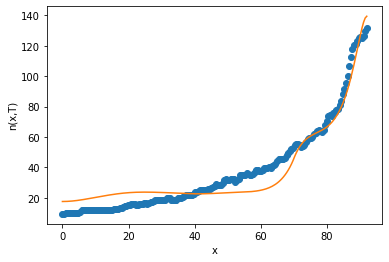

13
after perturb [6.326070462350905, 47.27790376077354, 26316.625708875523, -0.16401299317466284, 1.7391766385265175]
parameters [6.326070462350905, 47.27790376077354, 26316.625708875523, -0.16401299317466284, 1.7391766385265175]
after perturb [7.696103807004592, 137.33210141810724, 16449.203958577673, 0.5330642780234083, 45.192939573905434]
parameters [7.696103807004592, 137.33210141810724, 16449.203958577673, 0.5330642780234083, 45.192939573905434]
after perturb [9.988859924163796, 96.52737672809454, 19105.39770493308, 0.3799135951845789, 34.70187205951379]
parameters [9.988859924163796, 96.52737672809454, 19105.39770493308, 0.3799135951845789, 34.70187205951379]
after perturb [7.356094094066783, 163.1448599063521, 15017.139101181783, 0.18201873695749804, 27.215267039278373]
parameters [7.356094094066783, 163.1448599063521, 15017.139101181783, 0.18201873695749804, 27.215267039278373]
after perturb [5.197672823432593, 121.45350645764661, 24333.02775023162, 0.8572134554721799, 41.66665

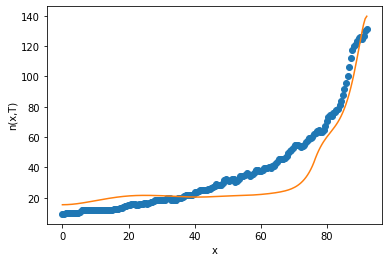

after perturb [5.703567417371592, 124.50517037627267, 19825.46475972967, 0.24464319162253856, 26.724370269449906]
parameters [5.703567417371592, 124.50517037627267, 19825.46475972967, 0.24464319162253856, 26.724370269449906]
after perturb [2.8599795753699975, 128.0673701602493, 19944.479725142213, 0.39952874044588127, 26.268595202639567]
parameters [2.8599795753699975, 128.0673701602493, 19944.479725142213, 0.39952874044588127, 26.268595202639567]
after perturb [8.412894679382955, 81.37676664851718, 20959.03363249068, -0.033719308932874725, 14.011423988960514]
parameters [8.412894679382955, 81.37676664851718, 20959.03363249068, -0.033719308932874725, 14.011423988960514]
after perturb [11.932463774591223, 200.24455688080872, 17170.720505150304, 1.2261030267119701, 59.34313904475448]
parameters [11.932463774591223, 200.24455688080872, 17170.720505150304, 1.2261030267119701, 59.34313904475448]
after perturb [9.314701255974576, 50.132405858343446, 17632.941344735078, 0.4414419380260824, 41

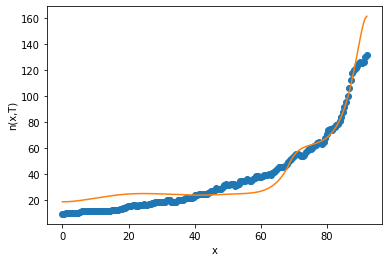

14
after perturb [6.487736144666518, 107.95834174396724, 18036.24261007789, 0.6341714106857533, 60.09796025794464]
parameters [6.487736144666518, 107.95834174396724, 18036.24261007789, 0.6341714106857533, 60.09796025794464]
after perturb [12.82012194646899, 92.60692038592724, 25002.24673480828, 0.9838441832704463, 77.48072517853686]
parameters [12.82012194646899, 92.60692038592724, 25002.24673480828, 0.9838441832704463, 77.48072517853686]
after perturb [6.705918191232298, 43.17083034729986, 23984.968146521565, 0.00836968537733812, 22.863675980887578]
parameters [6.705918191232298, 43.17083034729986, 23984.968146521565, 0.00836968537733812, 22.863675980887578]
oxigeno [ 4.41196475  4.41150555  4.41013024  4.40784562  4.40466296  4.40059786
  4.39567014  4.38990359  4.38332578  4.37596779  4.36786393  4.35905142
  4.3495701   4.33946208  4.32877142  4.31754378  4.30582615  4.29366646
  4.28111332  4.26821571  4.25502272  4.24158326  4.22794584  4.21415835
  4.2002678   4.18632019  4.1723

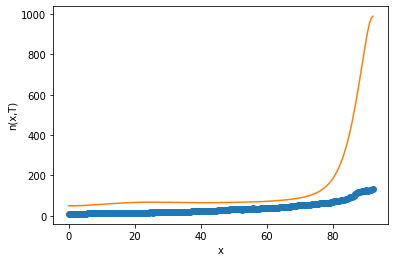

after perturb [10.001490022018924, 112.34723973549808, 19408.314134990025, 0.813739540950063, 57.69678780038353]
parameters [10.001490022018924, 112.34723973549808, 19408.314134990025, 0.813739540950063, 57.69678780038353]
after perturb [11.454603257835467, 78.49837792480497, 21866.330059310752, 0.3725957627954939, 31.530190893657156]
parameters [11.454603257835467, 78.49837792480497, 21866.330059310752, 0.3725957627954939, 31.530190893657156]
after perturb [4.434213069958146, 120.07672541242277, 18828.005241880368, 0.21135093678059724, 16.851917395463765]
parameters [4.434213069958146, 120.07672541242277, 18828.005241880368, 0.21135093678059724, 16.851917395463765]
after perturb [3.195284802489083, 90.09387469378294, 20590.9284602167, 0.5975305711123922, 59.90264199695353]
parameters [3.195284802489083, 90.09387469378294, 20590.9284602167, 0.5975305711123922, 59.90264199695353]
after perturb [7.038305666255235, 65.59266398359657, 31439.46502183095, 0.011900904593014072, 33.73585679127

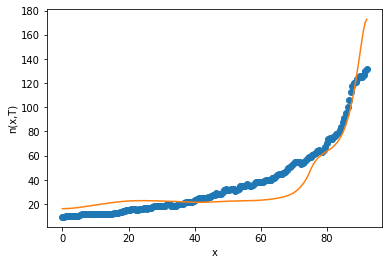

after perturb [9.005641456164955, 190.18851880825312, 20370.240361465927, 1.2203525206799406, 44.838069657794605]
parameters [9.005641456164955, 190.18851880825312, 20370.240361465927, 1.2203525206799406, 44.838069657794605]
after perturb [3.5883551842289085, 31.800404095594754, 23358.328892100875, 0.05605915050003579, 18.94240482529304]
parameters [3.5883551842289085, 31.800404095594754, 23358.328892100875, 0.05605915050003579, 18.94240482529304]
oxigeno [2.58563398e-02 2.58366350e-02 2.57777042e-02 2.56800948e-02
 2.55447056e-02 2.53727673e-02 2.51658171e-02 2.49256685e-02
 2.46543789e-02 2.43542171e-02 2.40276337e-02 2.36772387e-02
 2.33057916e-02 2.29162119e-02 2.25116148e-02 2.20950388e-02
 2.16689994e-02 2.12358374e-02 2.07977508e-02 2.03568421e-02
 1.99150887e-02 1.94743301e-02 1.90362598e-02 1.86024263e-02
 1.81742409e-02 1.77529850e-02 1.73398152e-02 1.69357703e-02
 1.65417785e-02 1.61586666e-02 1.57871669e-02 1.54279216e-02
 1.50814856e-02 1.47483285e-02 1.44288367e-02 1.4123

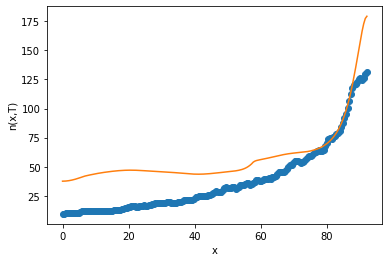

after perturb [4.937165890930434, 87.31730233868916, 26875.104182501767, 0.44326094157646956, 39.89886333735439]
parameters [4.937165890930434, 87.31730233868916, 26875.104182501767, 0.44326094157646956, 39.89886333735439]
oxigeno [9.91855833e-10 9.92509330e-10 9.94499464e-10 9.97915456e-10
 1.00290702e-09 1.00968590e-09 1.01852814e-09 1.02977714e-09
 1.04384752e-09 1.06123015e-09 1.08249817e-09 1.10831446e-09
 1.13944061e-09 1.17674757e-09 1.22122838e-09 1.27401311e-09
 1.33638635e-09 1.40980771e-09 1.49593558e-09 1.59665465e-09
 1.71410784e-09 1.85073296e-09 2.00930501e-09 2.19298481e-09
 2.40537470e-09 2.65058254e-09 2.93329488e-09 3.25886075e-09
 3.63338742e-09 4.06384976e-09 4.55821513e-09 5.12558570e-09
 5.77636071e-09 6.52242122e-09 7.37734033e-09 8.35662218e-09
 9.47797355e-09 1.07616122e-08 1.22306169e-08 1.39113242e-08
 1.58337783e-08 1.80322410e-08 2.05457689e-08 2.34188671e-08
 2.67022298e-08 3.04535774e-08 3.47386048e-08 3.96320543e-08
 4.52189293e-08 5.15958673e-08 5.8872

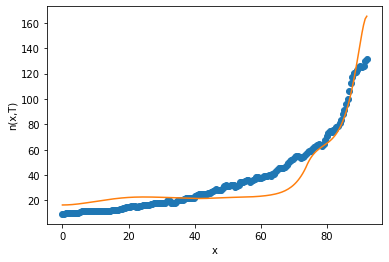

after perturb [9.547596420622403, 194.21708451649334, 22859.545113025757, 0.5607388681363106, 24.640401796008188]
parameters [9.547596420622403, 194.21708451649334, 22859.545113025757, 0.5607388681363106, 24.640401796008188]
after perturb [-1.3747448015751154, -25.689247710197364, 31779.776913035643, -0.6299185039653806, -15.023863744045247]
parameters [-1.3747448015751154, -25.689247710197364, 31779.776913035643, -0.6299185039653806, -15.023863744045247]
after perturb [6.728359413248304, 81.36419339091137, 21629.152566104545, 0.1440547302879825, 20.803907197776162]
parameters [6.728359413248304, 81.36419339091137, 21629.152566104545, 0.1440547302879825, 20.803907197776162]
oxigeno [2.56810258e-04 2.56688458e-04 2.56323792e-04 2.55718445e-04
 2.54876037e-04 2.53801576e-04 2.52501403e-04 2.50983127e-04
 2.49255541e-04 2.47328534e-04 2.45212988e-04 2.42920684e-04
 2.40464184e-04 2.37856733e-04 2.35112147e-04 2.32244711e-04
 2.29269078e-04 2.26200182e-04 2.23053142e-04 2.19843197e-04
 2.1

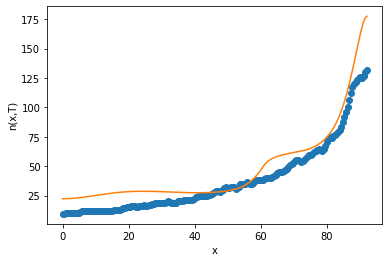

after perturb [6.681208592539073, 51.43886321444555, 26252.851161473063, 0.21281164475831177, 23.212639783971785]
parameters [6.681208592539073, 51.43886321444555, 26252.851161473063, 0.21281164475831177, 23.212639783971785]
oxigeno [1.15617895e-05 1.15520608e-05 1.15229442e-05 1.14746463e-05
 1.14075081e-05 1.13219996e-05 1.12187132e-05 1.10983545e-05
 1.09617327e-05 1.08097490e-05 1.06433844e-05 1.04636872e-05
 1.02717596e-05 1.00687446e-05 9.85581293e-06 9.63415075e-06
 9.40494755e-06 9.16938505e-06 8.92862705e-06 8.68381018e-06
 8.43603585e-06 8.18636318e-06 7.93580311e-06 7.68531357e-06
 7.43579570e-06 7.18809105e-06 6.94297971e-06 6.70117930e-06
 6.46334474e-06 6.23006872e-06 6.00188284e-06 5.77925929e-06
 5.56261302e-06 5.35230442e-06 5.14864224e-06 4.95188706e-06
 4.76225483e-06 4.57992082e-06 4.40502367e-06 4.23766974e-06
 4.07793750e-06 3.92588215e-06 3.78154036e-06 3.64493504e-06
 3.51608037e-06 3.39498686e-06 3.28166657e-06 3.17613848e-06
 3.07843408e-06 2.98860315e-06 2.90

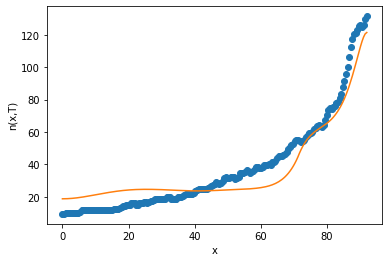

after perturb [7.50821726770697, 176.8533313782668, 19554.126435367943, 0.2880047804933917, 10.996217485456732]
parameters [7.50821726770697, 176.8533313782668, 19554.126435367943, 0.2880047804933917, 10.996217485456732]
after perturb [3.899750799914741, -0.5027738817053589, 24634.711854061952, 0.14453139431281736, 5.73090313636245]
parameters [3.899750799914741, -0.5027738817053589, 24634.711854061952, 0.14453139431281736, 5.73090313636245]
after perturb [4.861095991739168, 19.09711067061263, 30855.264764002062, -0.4388424560124081, -18.557464646073473]
parameters [4.861095991739168, 19.09711067061263, 30855.264764002062, -0.4388424560124081, -18.557464646073473]
after perturb [4.784504132117534, 165.04065956346903, 20186.820325637964, 0.9550690728719565, 41.775699837845295]
parameters [4.784504132117534, 165.04065956346903, 20186.820325637964, 0.9550690728719565, 41.775699837845295]
after perturb [8.000768445399835, 134.6639749984263, 19824.185249244838, 0.7774072665754546, 54.721081

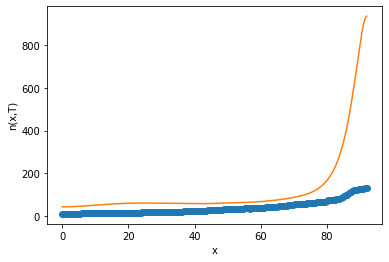

after perturb [8.525731121099064, 101.8850100947462, 21769.039756390976, 0.35364910932461546, 37.793169007150794]
parameters [8.525731121099064, 101.8850100947462, 21769.039756390976, 0.35364910932461546, 37.793169007150794]
oxigeno [3.65635959e-08 3.66062523e-08 3.67349883e-08 3.69521120e-08
 3.72614939e-08 3.76686031e-08 3.81805585e-08 3.88061970e-08
 3.95561578e-08 4.04429872e-08 4.14812624e-08 4.26877387e-08
 4.40815213e-08 4.56842645e-08 4.75204009e-08 4.96174048e-08
 5.20060917e-08 5.47209602e-08 5.78005785e-08 6.12880220e-08
 6.52313667e-08 6.96842450e-08 7.47064698e-08 8.03647347e-08
 8.67333993e-08 9.38953663e-08 1.01943063e-07 1.10979538e-07
 1.21119678e-07 1.32491576e-07 1.45238040e-07 1.59518283e-07
 1.75509794e-07 1.93410424e-07 2.13440693e-07 2.35846360e-07
 2.60901264e-07 2.88910477e-07 3.20213800e-07 3.55189633e-07
 3.94259250e-07 4.37891546e-07 4.86608272e-07 5.40989830e-07
 6.01681679e-07 6.69401408e-07 7.44946554e-07 8.29203228e-07
 9.23155646e-07 1.02789664e-06 1.14

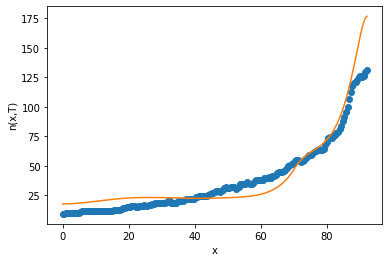

after perturb [3.524029373570272, 52.703536465144644, 25048.5937012499, 0.5075629096721864, 37.457554537596145]
parameters [3.524029373570272, 52.703536465144644, 25048.5937012499, 0.5075629096721864, 37.457554537596145]
oxigeno [9.88346337e-11 9.86813331e-11 9.82233445e-11 9.74663538e-11
 9.64196588e-11 9.50959115e-11 9.35107765e-11 9.16825218e-11
 8.96315633e-11 8.73799825e-11 8.49510381e-11 8.23686908e-11
 7.96571571e-11 7.68405050e-11 7.39423013e-11 7.09853163e-11
 6.79912874e-11 6.49807428e-11 6.19728806e-11 5.89855003e-11
 5.60349812e-11 5.31363019e-11 5.03030964e-11 4.75477411e-11
 4.48814713e-11 4.23145228e-11 3.98562994e-11 3.75155663e-11
 3.53006710e-11 3.32197961e-11 3.12812477e-11 2.94937868e-11
 2.78670113e-11 2.64117988e-11 2.51408227e-11 2.40691558e-11
 2.32149800e-11 2.26004239e-11 2.22525525e-11 2.22045433e-11
 2.24970821e-11 2.31800271e-11 2.43143918e-11 2.59747124e-11
 2.82518760e-11 3.12565013e-11 3.51229827e-11 4.00143297e-11
 4.61279602e-11 5.37026384e-11 6.302678

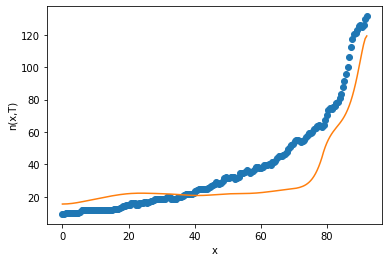

after perturb [2.270142516469523, 57.68894992870593, 26946.45183101126, 0.47127565612479405, 33.26425926451661]
parameters [2.270142516469523, 57.68894992870593, 26946.45183101126, 0.47127565612479405, 33.26425926451661]
oxigeno [4.18096656e-10 4.17455056e-10 4.15539327e-10 4.12376351e-10
 4.08009847e-10 4.02498833e-10 3.95915630e-10 3.88343543e-10
 3.79874367e-10 3.70605855e-10 3.60639281e-10 3.50077192e-10
 3.39021444e-10 3.27571547e-10 3.15823368e-10 3.03868186e-10
 2.91792085e-10 2.79675663e-10 2.67594011e-10 2.55616926e-10
 2.43809308e-10 2.32231698e-10 2.20940914e-10 2.09990760e-10
 1.99432805e-10 1.89317203e-10 1.79693599e-10 1.70612127e-10
 1.62124543e-10 1.54285530e-10 1.47154236e-10 1.40796075e-10
 1.35284858e-10 1.30705300e-10 1.27155976e-10 1.24752788e-10
 1.23633035e-10 1.23960184e-10 1.25929477e-10 1.29774506e-10
 1.35774940e-10 1.44265600e-10 1.55647127e-10 1.70398509e-10
 1.89091806e-10 2.12409453e-10 2.41164600e-10 2.76325045e-10
 3.19041429e-10 3.70680460e-10 4.328641

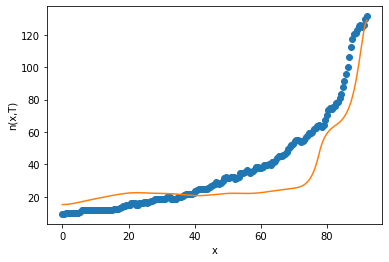

after perturb [5.573419422298411, 25.88751799323726, 22873.185233067743, 0.10653978745723963, 6.4030261440795755]
parameters [5.573419422298411, 25.88751799323726, 22873.185233067743, 0.10653978745723963, 6.4030261440795755]
oxigeno [6.43954607e-04 6.43414503e-04 6.41798582e-04 6.39119941e-04
 6.35400151e-04 6.30668882e-04 6.24963391e-04 6.18327899e-04
 6.10812863e-04 6.02474183e-04 5.93372342e-04 5.83571533e-04
 5.73138762e-04 5.62142978e-04 5.50654226e-04 5.38742852e-04
 5.26478761e-04 5.13930753e-04 5.01165928e-04 4.88249167e-04
 4.75242698e-04 4.62205733e-04 4.49194178e-04 4.36260420e-04
 4.23453164e-04 4.10817337e-04 3.98394035e-04 3.86220514e-04
 3.74330228e-04 3.62752883e-04 3.51514531e-04 3.40637681e-04
 3.30141424e-04 3.20041583e-04 3.10350864e-04 3.01079024e-04
 2.92233041e-04 2.83817289e-04 2.75833721e-04 2.68282046e-04
 2.61159914e-04 2.54463095e-04 2.48185655e-04 2.42320133e-04
 2.36857708e-04 2.31788368e-04 2.27101060e-04 2.22783845e-04
 2.18824042e-04 2.15208352e-04 2.11

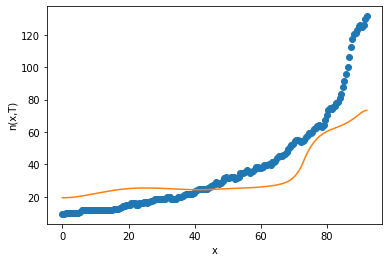

after perturb [6.801690138561213, 120.83447567199464, 26192.590671979015, 0.18143508897184757, 14.304744213425916]
parameters [6.801690138561213, 120.83447567199464, 26192.590671979015, 0.18143508897184757, 14.304744213425916]
oxigeno [4.33239353e-05 4.33302383e-05 4.33493376e-05 4.33818036e-05
 4.34285870e-05 4.34910186e-05 4.35708089e-05 4.36700484e-05
 4.37912085e-05 4.39371420e-05 4.41110854e-05 4.43166619e-05
 4.45578858e-05 4.48391684e-05 4.51653257e-05 4.55415887e-05
 4.59736150e-05 4.64675045e-05 4.70298165e-05 4.76675907e-05
 4.83883709e-05 4.92002328e-05 5.01118150e-05 5.11323534e-05
 5.22717206e-05 5.35404683e-05 5.49498748e-05 5.65119962e-05
 5.82397232e-05 6.01468418e-05 6.22480987e-05 6.45592733e-05
 6.70972532e-05 6.98801163e-05 7.29272185e-05 7.62592870e-05
 7.98985203e-05 8.38686943e-05 8.81952756e-05 9.29055419e-05
 9.80287095e-05 1.03596070e-04 1.09641134e-04 1.16199784e-04
 1.23310439e-04 1.31014225e-04 1.39355163e-04 1.48380358e-04
 1.58140210e-04 1.68688634e-04 1.

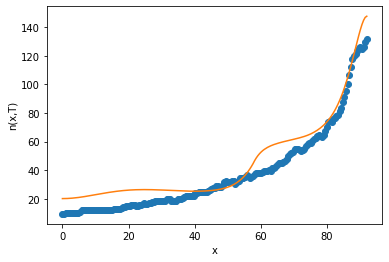

after perturb [12.093125330148862, 144.50297945954753, 24619.744610669783, 0.582326746544483, 48.50357060921988]
parameters [12.093125330148862, 144.50297945954753, 24619.744610669783, 0.582326746544483, 48.50357060921988]
after perturb [0.9127306024753978, 32.656450492801255, 30136.709318911715, 0.010082947399748132, 11.535419223592768]
parameters [0.9127306024753978, 32.656450492801255, 30136.709318911715, 0.010082947399748132, 11.535419223592768]
after perturb [5.091206296312396, 84.42484254734114, 28387.461754714717, 0.4985596833203496, 38.43867594682185]
parameters [5.091206296312396, 84.42484254734114, 28387.461754714717, 0.4985596833203496, 38.43867594682185]
oxigeno [1.14509754e-10 1.14701174e-10 1.15281355e-10 1.16268150e-10
 1.17691625e-10 1.19594527e-10 1.22032963e-10 1.25077307e-10
 1.28813355e-10 1.33343768e-10 1.38789831e-10 1.45293577e-10
 1.53020333e-10 1.62161735e-10 1.72939295e-10 1.85608599e-10
 2.00464218e-10 2.17845455e-10 2.38143046e-10 2.61806954e-10
 2.89355432e

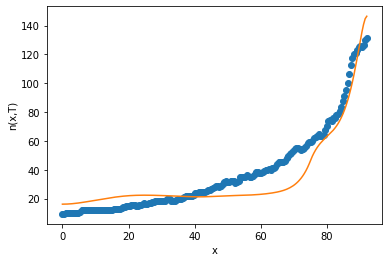

after perturb [7.198084238825986, 129.85476431523978, 32121.672234207275, 0.26686669177621003, 8.328357158984076]
parameters [7.198084238825986, 129.85476431523978, 32121.672234207275, 0.26686669177621003, 8.328357158984076]
after perturb [9.562420973489896, 36.30289337898806, 25935.052669578105, 0.355275074512306, 35.6945536164877]
parameters [9.562420973489896, 36.30289337898806, 25935.052669578105, 0.355275074512306, 35.6945536164877]
oxigeno [3.39539771e-08 3.39102269e-08 3.37793738e-08 3.35626030e-08
 3.32618672e-08 3.28798529e-08 3.24199349e-08 3.18861201e-08
 3.12829810e-08 3.06155827e-08 2.98894032e-08 2.91102502e-08
 2.82841760e-08 2.74173919e-08 2.65161847e-08 2.55868365e-08
 2.46355492e-08 2.36683749e-08 2.26911538e-08 2.17094591e-08
 2.07285505e-08 1.97533359e-08 1.87883421e-08 1.78376925e-08
 1.69050941e-08 1.59938310e-08 1.51067645e-08 1.42463398e-08
 1.34145982e-08 1.26131925e-08 1.18434077e-08 1.11061836e-08
 1.04021404e-08 9.73160487e-09 9.09463854e-09 8.49106543e-09
 

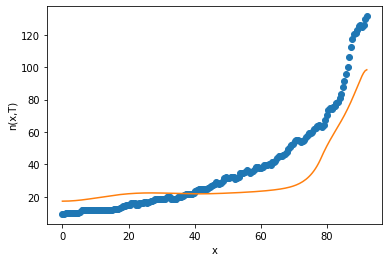

after perturb [4.8963044457975435, -77.13718979391791, 34281.16051838467, -0.2810302734058249, 26.35181250920808]
parameters [4.8963044457975435, -77.13718979391791, 34281.16051838467, -0.2810302734058249, 26.35181250920808]
after perturb [1.5670702602765, -14.466242518106874, 32025.777094607325, -0.17249149932571212, 9.852332537152645]
parameters [1.5670702602765, -14.466242518106874, 32025.777094607325, -0.17249149932571212, 9.852332537152645]
after perturb [8.007436429678789, 73.0274366040565, 19726.41438236386, 0.26409807384290185, 30.888921971375527]
parameters [8.007436429678789, 73.0274366040565, 19726.41438236386, 0.26409807384290185, 30.888921971375527]
after perturb [1.0049902733884564, 77.06397441169486, 28205.225074787355, 0.44825300810499497, 18.062159335832835]
parameters [1.0049902733884564, 77.06397441169486, 28205.225074787355, 0.44825300810499497, 18.062159335832835]
oxigeno [7.39041630e-10 7.38268121e-10 7.35973117e-10 7.32231290e-10
 7.27161214e-10 7.20917940e-10 7.

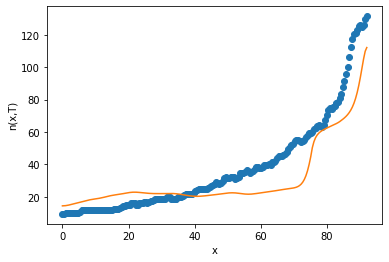

after perturb [1.1385753838089014, 3.6942032600366588, 31812.94933455385, -0.1427006972674788, -5.034379699556755]
parameters [1.1385753838089014, 3.6942032600366588, 31812.94933455385, -0.1427006972674788, -5.034379699556755]
after perturb [7.861605341405428, 44.07568968962141, 25639.418847741632, 0.4560718369859298, 41.61251604952954]
parameters [7.861605341405428, 44.07568968962141, 25639.418847741632, 0.4560718369859298, 41.61251604952954]
oxigeno [6.20206471e-10 6.19358290e-10 6.16821986e-10 6.12622130e-10
 6.06799154e-10 5.99408601e-10 5.90520095e-10 5.80216079e-10
 5.68590349e-10 5.55746426e-10 5.41795815e-10 5.26856193e-10
 5.11049580e-10 4.94500518e-10 4.77334326e-10 4.59675435e-10
 4.41645862e-10 4.23363824e-10 4.04942528e-10 3.86489132e-10
 3.68103901e-10 3.49879540e-10 3.31900717e-10 3.14243759e-10
 2.96976508e-10 2.80158329e-10 2.63840259e-10 2.48065265e-10
 2.32868614e-10 2.18278329e-10 2.04315714e-10 1.90995947e-10
 1.78328714e-10 1.66318882e-10 1.54967210e-10 1.44271076

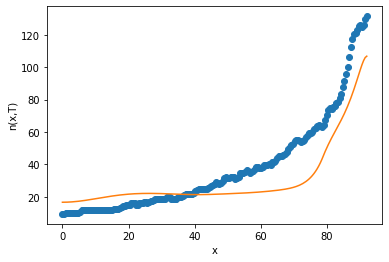

after perturb [11.37803179922232, 152.52513985931867, 18270.13032106037, 0.2840783073993375, 35.09485292545562]
parameters [11.37803179922232, 152.52513985931867, 18270.13032106037, 0.2840783073993375, 35.09485292545562]
after perturb [7.679788556101691, 87.70935266622433, 28435.234991056434, 0.3458655671695541, 25.21778814982965]
parameters [7.679788556101691, 87.70935266622433, 28435.234991056434, 0.3458655671695541, 25.21778814982965]
oxigeno [3.58461748e-08 3.58370474e-08 3.58100429e-08 3.57662954e-08
 3.57076984e-08 3.56369107e-08 3.55573651e-08 3.54732803e-08
 3.53896778e-08 3.53124041e-08 3.52481597e-08 3.52045357e-08
 3.51900604e-08 3.52142572e-08 3.52877143e-08 3.54221707e-08
 3.56306181e-08 3.59274221e-08 3.63284658e-08 3.68513163e-08
 3.75154193e-08 3.83423244e-08 3.93559428e-08 4.05828444e-08
 4.20525958e-08 4.37981453e-08 4.58562605e-08 4.82680237e-08
 5.10793915e-08 5.43418268e-08 5.81130114e-08 6.24576472e-08
 6.74483579e-08 7.31667007e-08 7.97043031e-08 8.71641359e-08
 

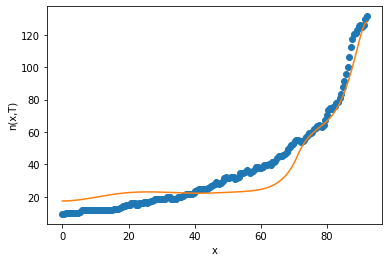

15
after perturb [4.211235173556505, 75.18245043081009, 26676.21791125837, 0.044855883858157475, 22.7855492746989]
parameters [4.211235173556505, 75.18245043081009, 26676.21791125837, 0.044855883858157475, 22.7855492746989]
oxigeno [ 0.14324781  0.14319936  0.1430543   0.14281355  0.14247857  0.14205141
  0.14153462  0.14093127  0.14024485  0.13947925  0.1386387   0.13772773
  0.13675111  0.13571377  0.13462081  0.13347741  0.13228879  0.13106021
  0.12979688  0.128504    0.12718669  0.12584998  0.12449879  0.12313795
  0.12177214  0.12040593  0.11904374  0.11768984  0.11634838  0.11502332
  0.1137185   0.11243758  0.11118407  0.10996131  0.10877247  0.10762057
  0.10650844  0.10543876  0.10441404  0.10343661  0.10250867  0.10163224
  0.1008092   0.10004131  0.0993302   0.09867737  0.09808427  0.09755224
  0.09708258  0.09667657  0.09633546  0.09606053  0.09585309  0.09571451
  0.09564625  0.09564987  0.09572704  0.09587958  0.09610948  0.09641889
  0.09681014  0.09728576  0.09784846  

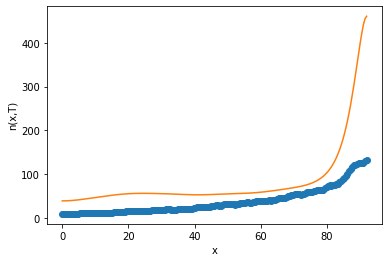

after perturb [5.012476056273035, 0.4458099026276159, 24989.90696285955, 0.16202240573923365, 29.054426715931076]
parameters [5.012476056273035, 0.4458099026276159, 24989.90696285955, 0.16202240573923365, 29.054426715931076]
after perturb [12.188222930735474, 105.99168957615423, 25352.85898736446, 0.546553085268269, 13.272589453832632]
parameters [12.188222930735474, 105.99168957615423, 25352.85898736446, 0.546553085268269, 13.272589453832632]
after perturb [10.074383550562704, 105.9228873205222, 29633.497799363842, -0.027109764890982796, -4.787293182220715]
parameters [10.074383550562704, 105.9228873205222, 29633.497799363842, -0.027109764890982796, -4.787293182220715]
after perturb [10.569935710215258, 224.2445902828661, 16209.262071882364, 1.5293288948687012, 60.42686029264459]
parameters [10.569935710215258, 224.2445902828661, 16209.262071882364, 1.5293288948687012, 60.42686029264459]
after perturb [6.279101365869191, 129.80778900273754, 19514.44811060417, 0.45288332421358224, 12.9

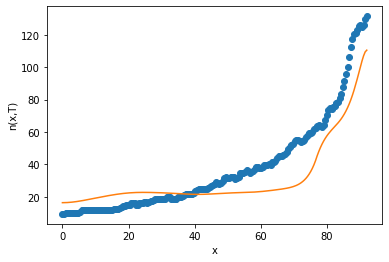

after perturb [8.196368828697178, 96.85174145637976, 26419.65524401383, 1.1372935814153942, 52.28916592583837]
parameters [8.196368828697178, 96.85174145637976, 26419.65524401383, 1.1372935814153942, 52.28916592583837]
after perturb [2.5280522765828737, 70.43392110835237, 26462.398109138325, 0.2389465008334114, 24.227502968266098]
parameters [2.5280522765828737, 70.43392110835237, 26462.398109138325, 0.2389465008334114, 24.227502968266098]
oxigeno [4.22275206e-06 4.21899790e-06 4.20777295e-06 4.18918869e-06
 4.16342742e-06 4.13073714e-06 4.09142489e-06 4.04584883e-06
 3.99440962e-06 3.93754135e-06 3.87570259e-06 3.80936786e-06
 3.73901983e-06 3.66514243e-06 3.58821510e-06 3.50870817e-06
 3.42707939e-06 3.34377160e-06 3.25921138e-06 3.17380850e-06
 3.08795611e-06 3.00203145e-06 2.91639687e-06 2.83140108e-06
 2.74738051e-06 2.66466069e-06 2.58355762e-06 2.50437918e-06
 2.42742656e-06 2.35299579e-06 2.28137946e-06 2.21286863e-06
 2.14775503e-06 2.08633359e-06 2.02890525e-06 1.97578017e-06

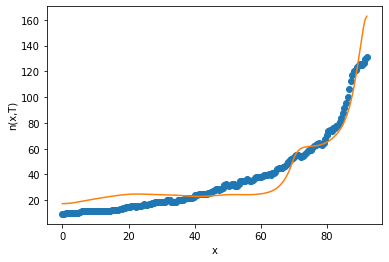

after perturb [9.022936384985396, 189.6534100603993, 22838.03875023345, 1.3266632763363042, 66.55854816650789]
parameters [9.022936384985396, 189.6534100603993, 22838.03875023345, 1.3266632763363042, 66.55854816650789]
after perturb [13.520438345663745, 137.65384847490722, 23073.057082288848, 1.0285899063391604, 71.34974642153443]
parameters [13.520438345663745, 137.65384847490722, 23073.057082288848, 1.0285899063391604, 71.34974642153443]
after perturb [4.9861502333704415, 43.20824722895513, 23444.84539961145, 0.18162284541706442, 31.773286737065003]
parameters [4.9861502333704415, 43.20824722895513, 23444.84539961145, 0.18162284541706442, 31.773286737065003]
oxigeno [5.62824595e-05 5.62304628e-05 5.60749011e-05 5.58170513e-05
 5.54590145e-05 5.50036769e-05 5.44546563e-05 5.38162375e-05
 5.30932975e-05 5.22912234e-05 5.14158262e-05 5.04732517e-05
 4.94698923e-05 4.84123006e-05 4.73071075e-05 4.61609460e-05
 4.49803819e-05 4.37718516e-05 4.25416088e-05 4.12956787e-05
 4.00398199e-05 3.

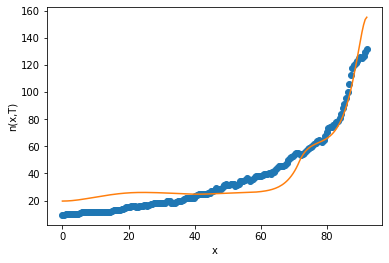

after perturb [4.6662469500157435, 9.426800649411177, 23057.095229839393, -0.3784981872959109, 24.165366406740983]
parameters [4.6662469500157435, 9.426800649411177, 23057.095229839393, -0.3784981872959109, 24.165366406740983]
after perturb [6.232432773277639, 131.76094882638847, 27520.740723767427, 0.38722290124646813, 27.478079923014192]
parameters [6.232432773277639, 131.76094882638847, 27520.740723767427, 0.38722290124646813, 27.478079923014192]
oxigeno [7.90865202e-08 7.94025120e-08 8.03533245e-08 8.19474988e-08
 8.41993705e-08 8.71292221e-08 9.07634968e-08 9.51350779e-08
 1.00283635e-07 1.06256040e-07 1.13106857e-07 1.20898913e-07
 1.29703949e-07 1.39603365e-07 1.50689058e-07 1.63064373e-07
 1.76845157e-07 1.92160950e-07 2.09156309e-07 2.27992271e-07
 2.48848000e-07 2.71922592e-07 2.97437091e-07 3.25636714e-07
 3.56793313e-07 3.91208096e-07 4.29214627e-07 4.71182138e-07
 5.17519180e-07 5.68677635e-07 6.25157134e-07 6.87509915e-07
 7.56346151e-07 8.32339799e-07 9.16235016e-07 1.00

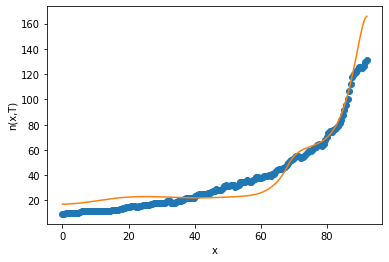

16
after perturb [2.594041669874669, 86.02342296404814, 20408.70582465708, 0.7379003723313693, 42.296498504440635]
parameters [2.594041669874669, 86.02342296404814, 20408.70582465708, 0.7379003723313693, 42.296498504440635]
oxigeno [2.90229995e-13 2.93601850e-13 3.03800520e-13 3.21077677e-13
 3.45860683e-13 3.78764674e-13 4.20609901e-13 4.72444777e-13
 5.35575244e-13 6.11601237e-13 7.02461217e-13 8.10486009e-13
 9.38463425e-13 1.08971551e-12 1.26819058e-12 1.47857280e-12
 1.72641236e-12 2.01828030e-12 2.36195241e-12 2.76662792e-12
 3.24318936e-12 3.80451163e-12 4.46582942e-12 5.24517408e-12
 6.16389279e-12 7.24726562e-12 8.52523834e-12 1.00332926e-11
 1.18134787e-11 1.39156409e-11 1.63988701e-11 1.93332270e-11
 2.28017826e-11 2.69030352e-11 3.17537711e-11 3.74924459e-11
 4.42831789e-11 5.23204645e-11 6.18347234e-11 7.30988323e-11
 8.64357965e-11 1.02227753e-10 1.20926525e-10 1.43065988e-10
 1.69276548e-10 2.00302096e-10 2.37019870e-10 2.80463728e-10
 3.31851444e-10 3.92616745e-10 4.644

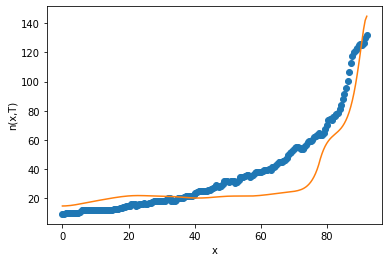

after perturb [2.771967065202126, 123.22448111969008, 25327.92261504853, 0.44857283942401094, 24.773154214917287]
parameters [2.771967065202126, 123.22448111969008, 25327.92261504853, 0.44857283942401094, 24.773154214917287]
oxigeno [1.09979860e-08 1.10517149e-08 1.12135003e-08 1.14851451e-08
 1.18696814e-08 1.23714099e-08 1.29959561e-08 1.37503442e-08
 1.46430866e-08 1.56842931e-08 1.68857983e-08 1.82613096e-08
 1.98265778e-08 2.15995918e-08 2.36007999e-08 2.58533619e-08
 2.83834343e-08 3.12204931e-08 3.43976996e-08 3.79523142e-08
 4.19261633e-08 4.63661670e-08 5.13249341e-08 5.68614320e-08
 6.30417394e-08 6.99398919e-08 7.76388288e-08 8.62314533e-08
 9.58218161e-08 1.06526437e-07 1.18475778e-07 1.31815883e-07
 1.46710201e-07 1.63341614e-07 1.81914679e-07 2.02658119e-07
 2.25827569e-07 2.51708606e-07 2.80620084e-07 3.12917796e-07
 3.48998496e-07 3.89304301e-07 4.34327525e-07 4.84615972e-07
 5.40778758e-07 6.03492717e-07 6.73509479e-07 7.51663300e-07
 8.38879769e-07 9.36185491e-07 1.04

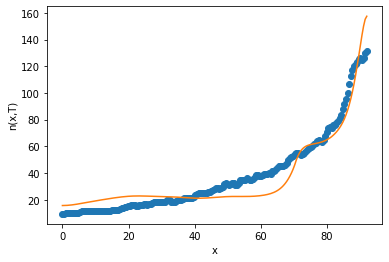

after perturb [4.9348574487172385, -14.937397670949139, 30348.71128244982, -0.5071341711878125, -1.6053874363104192]
parameters [4.9348574487172385, -14.937397670949139, 30348.71128244982, -0.5071341711878125, -1.6053874363104192]
after perturb [8.392593484275759, 149.57334353620718, 26557.39085423066, 0.41480468874489307, 25.332739619133974]
parameters [8.392593484275759, 149.57334353620718, 26557.39085423066, 0.41480468874489307, 25.332739619133974]
oxigeno [1.44011855e-07 1.44577588e-07 1.46279365e-07 1.49130961e-07
 1.53155485e-07 1.58385604e-07 1.64863861e-07 1.72643087e-07
 1.81786916e-07 1.92370397e-07 2.04480719e-07 2.18218053e-07
 2.33696506e-07 2.51045218e-07 2.70409588e-07 2.91952656e-07
 3.15856647e-07 3.42324687e-07 3.71582712e-07 4.03881585e-07
 4.39499429e-07 4.78744217e-07 5.21956617e-07 5.69513132e-07
 6.21829554e-07 6.79364758e-07 7.42624881e-07 8.12167891e-07
 8.88608616e-07 9.72624246e-07 1.06496036e-06 1.16643753e-06
 1.27795853e-06 1.40051625e-06 1.53520230e-06 1.

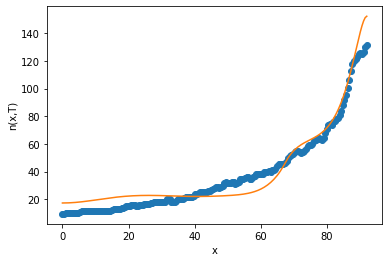

17
after perturb [7.157785618659045, 75.39484711689774, 29832.27405577168, -0.10231675864434192, 22.935948319458316]
parameters [7.157785618659045, 75.39484711689774, 29832.27405577168, -0.10231675864434192, 22.935948319458316]
after perturb [-0.33110521454945374, -0.1425795143591131, 32513.07741725436, -0.20503592324914144, -4.705559772791087]
parameters [-0.33110521454945374, -0.1425795143591131, 32513.07741725436, -0.20503592324914144, -4.705559772791087]
after perturb [10.652040347640494, 79.97371053909336, 28183.266999840816, -0.5195574380122314, -10.597022989179745]
parameters [10.652040347640494, 79.97371053909336, 28183.266999840816, -0.5195574380122314, -10.597022989179745]
after perturb [2.585765965650184, 72.6679046469003, 23370.546750411224, 0.1326213580507612, 19.436704196516963]
parameters [2.585765965650184, 72.6679046469003, 23370.546750411224, 0.1326213580507612, 19.436704196516963]
oxigeno [4.59622940e-04 4.59337766e-04 4.58484752e-04 4.57071362e-04
 4.55109810e-04 4.

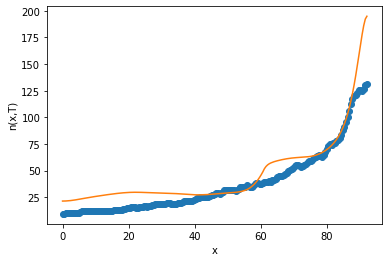

after perturb [16.04910516567702, 182.79165489352886, 19244.346433742834, 0.9153763193850805, 52.35289678463198]
parameters [16.04910516567702, 182.79165489352886, 19244.346433742834, 0.9153763193850805, 52.35289678463198]
after perturb [7.276348548075153, 118.80795501795032, 24541.70524012787, 0.7501986534318629, 36.92413658225464]
parameters [7.276348548075153, 118.80795501795032, 24541.70524012787, 0.7501986534318629, 36.92413658225464]
oxigeno [3.06380317e-11 3.09006875e-11 3.16931836e-11 3.30291938e-11
 3.49318016e-11 3.74339478e-11 4.05790688e-11 4.44219402e-11
 4.90297410e-11 5.44833621e-11 6.08789829e-11 6.83299508e-11
 7.69689994e-11 8.69508525e-11 9.84552643e-11 1.11690560e-10
 1.26897746e-10 1.44355277e-10 1.64384571e-10 1.87356388e-10
 2.13698197e-10 2.43902688e-10 2.78537588e-10 3.18256982e-10
 3.63814373e-10 4.16077720e-10 4.76046777e-10 5.44873046e-10
 6.23882753e-10 7.14603288e-10 8.18793611e-10 9.38479218e-10
 1.07599233e-09 1.23401804e-09 1.41564738e-09 1.62443809e-09

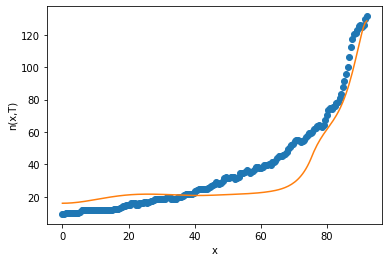

after perturb [10.08551110061394, 17.107314822818466, 25337.314394537112, -0.22146210165759617, 13.465135853073805]
parameters [10.08551110061394, 17.107314822818466, 25337.314394537112, -0.22146210165759617, 13.465135853073805]
after perturb [7.510383516087686, 154.7161085499203, 24145.710232574856, 0.8234884278630418, 57.81734798604596]
parameters [7.510383516087686, 154.7161085499203, 24145.710232574856, 0.8234884278630418, 57.81734798604596]
after perturb [3.1670208862873723, 44.803113163958336, 26072.459580580613, 0.5954746146155218, 33.77932921771746]
parameters [3.1670208862873723, 44.803113163958336, 26072.459580580613, 0.5954746146155218, 33.77932921771746]
oxigeno [3.66744625e-12 3.66043333e-12 3.63949968e-12 3.60495716e-12
 3.55731393e-12 3.49725790e-12 3.42563484e-12 3.34342253e-12
 3.25170231e-12 3.15162943e-12 3.04440365e-12 2.93124127e-12
 2.81334954e-12 2.69190433e-12 2.56803130e-12 2.44279100e-12
 2.31716766e-12 2.19206164e-12 2.06828505e-12 1.94656011e-12
 1.82751993e

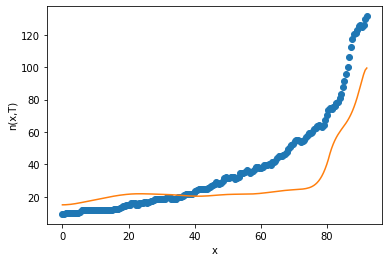

after perturb [6.701501733178563, 157.91074134760916, 21018.336806210966, 0.7139130708084602, 21.656128102849994]
parameters [6.701501733178563, 157.91074134760916, 21018.336806210966, 0.7139130708084602, 21.656128102849994]
after perturb [3.9239929691241464, 120.79896049441136, 24737.193009863226, 0.041750440295875046, -0.1697387619190387]
parameters [3.9239929691241464, 120.79896049441136, 24737.193009863226, 0.041750440295875046, -0.1697387619190387]
after perturb [8.537173611175346, 62.91474199197387, 23637.189602057046, -0.12835029696031203, 11.36840969583282]
parameters [8.537173611175346, 62.91474199197387, 23637.189602057046, -0.12835029696031203, 11.36840969583282]
after perturb [7.377035296480845, 81.8158952822382, 28789.34808364691, 0.15693855614323537, 5.097680034126803]
parameters [7.377035296480845, 81.8158952822382, 28789.34808364691, 0.15693855614323537, 5.097680034126803]
oxigeno [6.55477936e-05 6.55185501e-05 6.54309941e-05 6.52856471e-05
 6.50833732e-05 6.48253706e-0

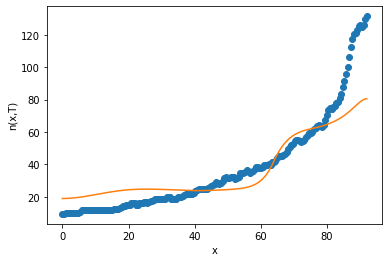

after perturb [4.94333837160368, 87.91940744729271, 26852.071944259795, 0.6310968811924725, 27.624858560115314]
parameters [4.94333837160368, 87.91940744729271, 26852.071944259795, 0.6310968811924725, 27.624858560115314]
oxigeno [3.49297928e-12 3.52619881e-12 3.62657765e-12 3.79629351e-12
 4.03903278e-12 4.36007733e-12 4.76642898e-12 5.26697466e-12
 5.87269637e-12 6.59693102e-12 7.45568653e-12 8.46802209e-12
 9.65650170e-12 1.10477325e-11 1.26730009e-11 1.45690226e-11
 1.67788246e-11 1.93527822e-11 2.23498349e-11 2.58389139e-11
 2.99006145e-11 3.46291566e-11 4.01346808e-11 4.65459378e-11
 5.40134371e-11 6.27131324e-11 7.28507341e-11 8.46667533e-11
 9.84424001e-11 1.14506477e-10 1.33243433e-10 1.55102765e-10
 1.80609996e-10 2.10379471e-10 2.45129282e-10 2.85698651e-10
 3.33068170e-10 3.88383358e-10 4.52982049e-10 5.28426236e-10
 6.16539056e-10 7.19447743e-10 8.39633480e-10 9.79989234e-10
 1.14388684e-09 1.33525477e-09 1.55866828e-09 1.81945389e-09
 2.12381040e-09 2.47894907e-09 2.893256

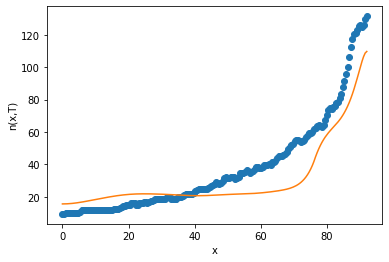

after perturb [-0.17643369682404098, 32.74885291891664, 30822.636731175095, -0.020756738378109346, 19.182551808140126]
parameters [-0.17643369682404098, 32.74885291891664, 30822.636731175095, -0.020756738378109346, 19.182551808140126]
after perturb [8.220724052270864, 137.42493023394098, 22393.260947034243, 0.9690618173047489, 53.252395127161115]
parameters [8.220724052270864, 137.42493023394098, 22393.260947034243, 0.9690618173047489, 53.252395127161115]
after perturb [8.802188691013846, 55.67476422393285, 24881.33367094745, 0.5756009753470593, 39.52205558352429]
parameters [8.802188691013846, 55.67476422393285, 24881.33367094745, 0.5756009753470593, 39.52205558352429]
oxigeno [3.88398829e-12 3.87903454e-12 3.86422206e-12 3.83969644e-12
 3.80569792e-12 3.76255789e-12 3.71069414e-12 3.65060510e-12
 3.58286325e-12 3.50810796e-12 3.42703801e-12 3.34040425e-12
 3.24900247e-12 3.15366707e-12 3.05526574e-12 2.95469552e-12
 2.85288068e-12 2.75077275e-12 2.64935309e-12 2.54963855e-12
 2.45269

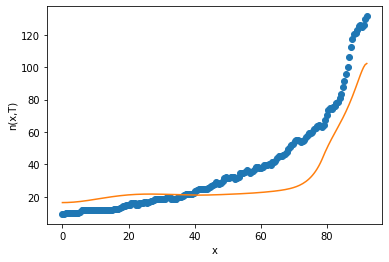

after perturb [0.8625496446078813, 33.20511493199487, 29873.623778880257, 0.17013292198735458, 11.167077752367714]
parameters [0.8625496446078813, 33.20511493199487, 29873.623778880257, 0.17013292198735458, 11.167077752367714]
after perturb [3.098063295057298, 81.56772029839021, 24165.165188987477, 0.1858641935865031, 9.443197256132331]
parameters [3.098063295057298, 81.56772029839021, 24165.165188987477, 0.1858641935865031, 9.443197256132331]
oxigeno [2.61078749e-05 2.60916280e-05 2.60430267e-05 2.59624860e-05
 2.58506876e-05 2.57085660e-05 2.55372896e-05 2.53382380e-05
 2.51129770e-05 2.48632314e-05 2.45908581e-05 2.42978190e-05
 2.39861560e-05 2.36579682e-05 2.33153914e-05 2.29605818e-05
 2.25957019e-05 2.22229112e-05 2.18443589e-05 2.14621805e-05
 2.10784966e-05 2.06954142e-05 2.03150303e-05 1.99394362e-05
 1.95707239e-05 1.92109933e-05 1.88623601e-05 1.85269651e-05
 1.82069835e-05 1.79046362e-05 1.76222006e-05 1.73620244e-05
 1.71265386e-05 1.69182737e-05 1.67398762e-05 1.65941272

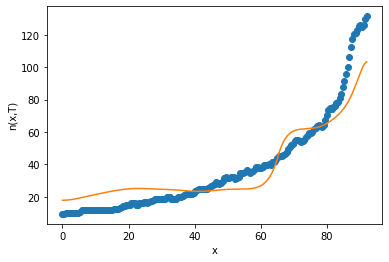

after perturb [10.520468766685186, 117.68853539094678, 22140.591946527595, 0.4068774673197146, 40.521466025091556]
parameters [10.520468766685186, 117.68853539094678, 22140.591946527595, 0.4068774673197146, 40.521466025091556]
after perturb [3.9287693590550057, 30.20620039938384, 20801.224188910746, 0.20194292067645442, 49.64307755174802]
parameters [3.9287693590550057, 30.20620039938384, 20801.224188910746, 0.20194292067645442, 49.64307755174802]
oxigeno [3.04039759e-05 3.03644263e-05 3.02462127e-05 3.00506304e-05
 2.97798010e-05 2.94366203e-05 2.90246870e-05 2.85482176e-05
 2.80119506e-05 2.74210438e-05 2.67809687e-05 2.60974057e-05
 2.53761441e-05 2.46229889e-05 2.38436766e-05 2.30438015e-05
 2.22287542e-05 2.14036704e-05 2.05733922e-05 1.97424385e-05
 1.89149863e-05 1.80948589e-05 1.72855219e-05 1.64900847e-05
 1.57113066e-05 1.49516068e-05 1.42130763e-05 1.34974928e-05
 1.28063360e-05 1.21408049e-05 1.15018348e-05 1.08901150e-05
 1.03061069e-05 9.75006176e-06 9.22203849e-06 8.7219

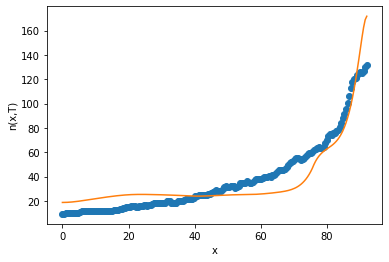

after perturb [6.898033857405239, 117.04546971248155, 28447.22180938898, 0.2638928124239368, 43.399515333947484]
parameters [6.898033857405239, 117.04546971248155, 28447.22180938898, 0.2638928124239368, 43.399515333947484]
oxigeno [1.84995829e-06 1.85078405e-06 1.85327704e-06 1.85748444e-06
 1.86348504e-06 1.87138953e-06 1.88134083e-06 1.89351462e-06
 1.90811997e-06 1.92540015e-06 1.94563364e-06 1.96913530e-06
 1.99625783e-06 2.02739348e-06 2.06297597e-06 2.10348289e-06
 2.14943828e-06 2.20141570e-06 2.26004171e-06 2.32599976e-06
 2.40003457e-06 2.48295709e-06 2.57564997e-06 2.67907366e-06
 2.79427315e-06 2.92238538e-06 3.06464746e-06 3.22240560e-06
 3.39712495e-06 3.59040029e-06 3.80396774e-06 4.03971747e-06
 4.29970747e-06 4.58617861e-06 4.90157083e-06 5.24854077e-06
 5.62998076e-06 6.04903943e-06 6.50914389e-06 7.01402377e-06
 7.56773704e-06 8.17469801e-06 8.83970741e-06 9.56798489e-06
 1.03652041e-05 1.12375302e-05 1.21916611e-05 1.32348708e-05
 1.43750571e-05 1.56207925e-05 1.6981

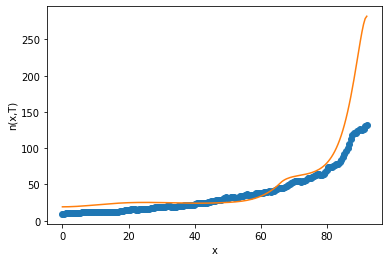

after perturb [16.46873351857885, 189.76298995714933, 26931.18664192135, 0.6978234724298026, 41.95459912014025]
parameters [16.46873351857885, 189.76298995714933, 26931.18664192135, 0.6978234724298026, 41.95459912014025]
after perturb [6.858673894212834, 104.13380223900573, 25700.55077452565, 0.5988977925020013, 19.896849757074236]
parameters [6.858673894212834, 104.13380223900573, 25700.55077452565, 0.5988977925020013, 19.896849757074236]
oxigeno [6.79361640e-11 6.85017283e-11 7.02079802e-11 7.30837763e-11
 7.71778137e-11 8.25595471e-11 8.93204962e-11 9.75759713e-11
 1.07467249e-10 1.19164240e-10 1.32868703e-10 1.48818065e-10
 1.67289925e-10 1.88607325e-10 2.13144896e-10 2.41335993e-10
 2.73680967e-10 3.10756722e-10 3.53227756e-10 4.01858886e-10
 4.57529925e-10 5.21252563e-10 5.94189804e-10 6.77678322e-10
 7.73254152e-10 8.82682221e-10 1.00799026e-09 1.15150773e-09
 1.31591054e-09 1.50427227e-09 1.72012295e-09 1.96751644e-09
 2.25110761e-09 2.57624067e-09 2.94905031e-09 3.37657743e-09

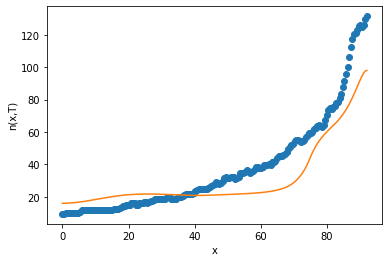

after perturb [12.180687458077042, 204.39645982761073, 16966.236320729575, 1.4581384010271545, 73.55435012840667]
parameters [12.180687458077042, 204.39645982761073, 16966.236320729575, 1.4581384010271545, 73.55435012840667]
after perturb [8.789350774546012, 116.08874146705043, 26832.00582937802, 0.6831363892455191, 40.80854197800265]
parameters [8.789350774546012, 116.08874146705043, 26832.00582937802, 0.6831363892455191, 40.80854197800265]
oxigeno [6.46571654e-11 6.51878109e-11 6.67884640e-11 6.94854335e-11
 7.33230988e-11 7.83647184e-11 8.46935826e-11 9.24145336e-11
 1.01655881e-10 1.12571749e-10 1.25344906e-10 1.40190114e-10
 1.57358089e-10 1.77140118e-10 1.99873443e-10 2.25947501e-10
 2.55811148e-10 2.89980994e-10 3.29051018e-10 3.73703631e-10
 4.24722407e-10 4.83006715e-10 5.49588527e-10 6.25651710e-10
 7.12554173e-10 8.11853257e-10 9.25334859e-10 1.05504680e-09
 1.20333707e-09 1.37289760e-09 1.56681439e-09 1.78862492e-09
 2.04238371e-09 2.33273741e-09 2.66501060e-09 3.04530377e-

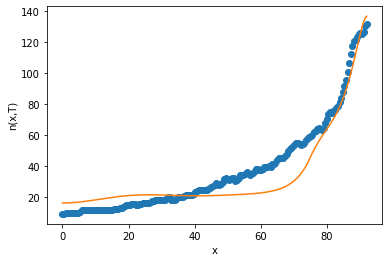

after perturb [4.375165399064574, 62.34943536023176, 20484.240280297337, 0.031235137034534788, 9.405366451717397]
parameters [4.375165399064574, 62.34943536023176, 20484.240280297337, 0.031235137034534788, 9.405366451717397]
oxigeno [ 0.18411626  0.18406546  0.18391335  0.18366084  0.18330942  0.18286114
  0.18231857  0.18168481  0.18096336  0.18015817  0.17927353  0.17831401
  0.17728446  0.17618991  0.17503555  0.17382667  0.17256862  0.17126676
  0.16992648  0.1685531   0.16715188  0.165728    0.16428655  0.16283248
  0.16137061  0.15990565  0.15844214  0.15698445  0.15553682  0.1541033
  0.15268776  0.1512939   0.14992524  0.14858509  0.14727658  0.14600263
  0.14476597  0.14356911  0.14241436  0.14130382  0.14023939  0.13922278
  0.13825549  0.13733885  0.13647403  0.13566202  0.13490369  0.13419977
  0.13355092  0.13295772  0.13242067  0.13194028  0.13151705  0.13115151
  0.13084424  0.13059592  0.13040731  0.13027932  0.130213    0.13020957
  0.13027045  0.13039727  0.13059186  

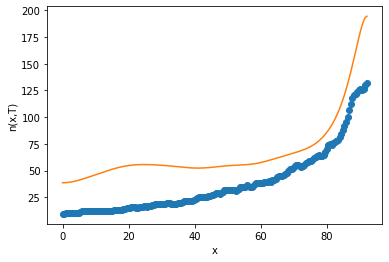

after perturb [8.779788012128657, 183.35465122936085, 22867.30162732202, 0.5138754200427809, 36.49202437745551]
parameters [8.779788012128657, 183.35465122936085, 22867.30162732202, 0.5138754200427809, 36.49202437745551]
after perturb [8.38356755433128, 67.12833112251366, 24984.88981183793, 0.2120947946363112, 20.503489759683088]
parameters [8.38356755433128, 67.12833112251366, 24984.88981183793, 0.2120947946363112, 20.503489759683088]
oxigeno [1.05036509e-05 1.04967385e-05 1.04760426e-05 1.04416874e-05
 1.03938782e-05 1.03328989e-05 1.02591089e-05 1.01729390e-05
 1.00748861e-05 9.96550865e-06 9.84541976e-06 9.71528143e-06
 9.57579776e-06 9.42770818e-06 9.27178079e-06 9.10880563e-06
 8.93958824e-06 8.76494356e-06 8.58569015e-06 8.40264491e-06
 8.21661831e-06 8.02841026e-06 7.83880650e-06 7.64857570e-06
 7.45846718e-06 7.26920936e-06 7.08150881e-06 6.89605001e-06
 6.71349577e-06 6.53448831e-06 6.35965097e-06 6.18959058e-06
 6.02490042e-06 5.86616386e-06 5.71395855e-06 5.56886133e-06
 5.

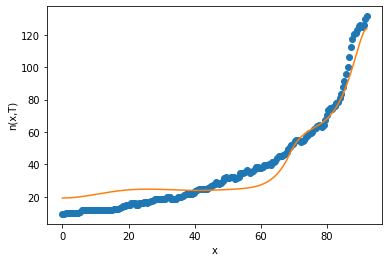

18
after perturb [6.993945783115942, 80.40752095114442, 22325.39981033035, 0.836118885349189, 47.31361095524488]
parameters [6.993945783115942, 80.40752095114442, 22325.39981033035, 0.836118885349189, 47.31361095524488]
oxigeno [1.39832381e-14 1.41917838e-14 1.48236646e-14 1.58978105e-14
 1.74464411e-14 1.95160927e-14 2.21691064e-14 2.54856247e-14
 2.95661667e-14 3.45348675e-14 4.05434936e-14 4.77763694e-14
 5.64563838e-14 6.68522817e-14 7.92874895e-14 9.41507761e-14
 1.11909117e-13 1.33123198e-13 1.58466100e-13 1.88745792e-13
 2.24932224e-13 2.68189933e-13 3.19917296e-13 3.81793768e-13
 4.55836734e-13 5.44469910e-13 6.50605651e-13 7.77743951e-13
 9.30091523e-13 1.11270499e-12 1.33166304e-12 1.59427333e-12
 1.90932110e-12 2.28736785e-12 2.74110994e-12 3.28580908e-12
 3.93980887e-12 4.72515445e-12 5.66833538e-12 6.80117601e-12
 8.16190220e-12 9.79641864e-12 1.17598379e-11 1.41183097e-11
 1.69512089e-11 2.03537513e-11 2.44401185e-11 2.93471914e-11
 3.52390076e-11 4.23120804e-11 5.0801744

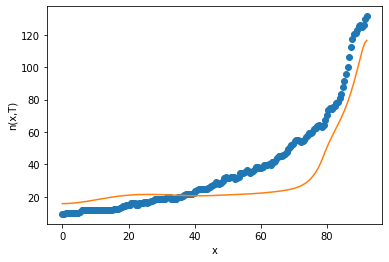

after perturb [2.72183049290136, 40.09000548251003, 28902.446468944272, 0.0647504717910991, 35.6166077669072]
parameters [2.72183049290136, 40.09000548251003, 28902.446468944272, 0.0647504717910991, 35.6166077669072]
oxigeno [2.87209406e-02 2.86982473e-02 2.86303967e-02 2.85180695e-02
 2.83623791e-02 2.81648413e-02 2.79273339e-02 2.76520493e-02
 2.73414418e-02 2.69981733e-02 2.66250587e-02 2.62250151e-02
 2.58010151e-02 2.53560485e-02 2.48930924e-02 2.44150918e-02
 2.39249532e-02 2.34255527e-02 2.29197619e-02 2.24104932e-02
 2.19004074e-02 2.13914361e-02 2.08853951e-02 2.03839214e-02
 1.98885430e-02 1.94006591e-02 1.89215544e-02 1.84523983e-02
 1.79942470e-02 1.75480450e-02 1.71146272e-02 1.66947245e-02
 1.62889715e-02 1.58979131e-02 1.55220081e-02 1.51616309e-02
 1.48170738e-02 1.44885492e-02 1.41761900e-02 1.38800503e-02
 1.36001061e-02 1.33362584e-02 1.30883353e-02 1.28560956e-02
 1.26392317e-02 1.24373745e-02 1.22500988e-02 1.20769310e-02
 1.19173571e-02 1.17708308e-02 1.16367823e-

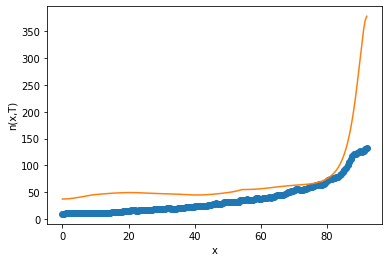

after perturb [2.4417571083118594, 1.4378459681956883, 33100.645864354025, -0.11324468238276206, 11.302476890594878]
parameters [2.4417571083118594, 1.4378459681956883, 33100.645864354025, -0.11324468238276206, 11.302476890594878]
after perturb [3.8941641642539455, 87.47602729358209, 22614.978064028634, 0.44385426721109567, 23.094137096928268]
parameters [3.8941641642539455, 87.47602729358209, 22614.978064028634, 0.44385426721109567, 23.094137096928268]
oxigeno [8.49406912e-10 8.50183852e-10 8.52544441e-10 8.56578300e-10
 8.62435829e-10 8.70329802e-10 8.80537692e-10 8.93404821e-10
 9.09348430e-10 9.28862836e-10 9.52525800e-10 9.81006319e-10
 1.01507402e-09 1.05561040e-09 1.10362215e-09 1.16025692e-09
 1.22682169e-09 1.30480431e-09 1.39589853e-09 1.50203294e-09
 1.62540453e-09 1.76851732e-09 1.93422687e-09 2.12579156e-09
 2.34693137e-09 2.60189542e-09 2.89553943e-09 3.23341440e-09
 3.62186816e-09 4.06816153e-09 4.58060105e-09 5.16869052e-09
 5.84330394e-09 6.61688253e-09 7.50365922e-09 

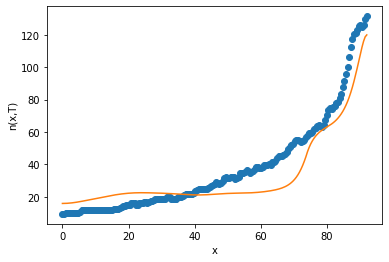

after perturb [7.244080135572905, 157.73415509495766, 17624.50064053555, 0.7432493366760369, 42.48891437299367]
parameters [7.244080135572905, 157.73415509495766, 17624.50064053555, 0.7432493366760369, 42.48891437299367]
after perturb [9.368311909953713, 117.13082998384394, 28465.37984149233, 0.2754564956090596, 20.50554638328716]
parameters [9.368311909953713, 117.13082998384394, 28465.37984149233, 0.2754564956090596, 20.50554638328716]
oxigeno [9.08323754e-07 9.09437758e-07 9.12791985e-07 9.18423155e-07
 9.26392753e-07 9.36787446e-07 9.49719685e-07 9.65328488e-07
 9.83780418e-07 1.00527076e-06 1.03002491e-06 1.05830004e-06
 1.09038693e-06 1.12661215e-06 1.16734048e-06 1.21297770e-06
 1.26397364e-06 1.32082567e-06 1.38408258e-06 1.45434884e-06
 1.53228941e-06 1.61863497e-06 1.71418777e-06 1.81982807e-06
 1.93652115e-06 2.06532512e-06 2.20739943e-06 2.36401414e-06
 2.53656023e-06 2.72656067e-06 2.93568263e-06 3.16575083e-06
 3.41876197e-06 3.69690052e-06 4.00255598e-06 4.33834147e-06
 

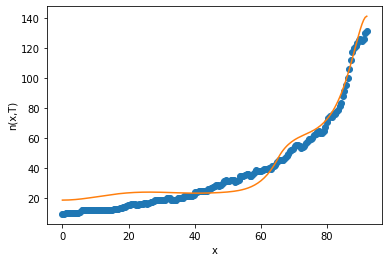

19
after perturb [1.9118288226774167, 29.118647642542257, 24993.986201410127, 0.2834047804533544, 21.589222745632444]
parameters [1.9118288226774167, 29.118647642542257, 24993.986201410127, 0.2834047804533544, 21.589222745632444]
oxigeno [8.25873177e-07 8.24350151e-07 8.19806725e-07 8.12318695e-07
 8.02008653e-07 7.89040743e-07 7.73613998e-07 7.55954799e-07
 7.36308996e-07 7.14934176e-07 6.92092477e-07 6.68044198e-07
 6.43042373e-07 6.17328396e-07 5.91128667e-07 5.64652271e-07
 5.38089571e-07 5.11611659e-07 4.85370518e-07 4.59499757e-07
 4.34115742e-07 4.09318964e-07 3.85195454e-07 3.61818130e-07
 3.39247961e-07 3.17534922e-07 2.96718735e-07 2.76829451e-07
 2.57887951e-07 2.39906432e-07 2.22888960e-07 2.06832108e-07
 1.91725704e-07 1.77553649e-07 1.64294782e-07 1.51923725e-07
 1.40411674e-07 1.29727092e-07 1.19836305e-07 1.10703986e-07
 1.02293557e-07 9.45675357e-08 8.74878452e-08 8.10161149e-08
 7.51139889e-08 6.97434427e-08 6.48671046e-08 6.04485724e-08
 5.64527100e-08 5.28459098e-08

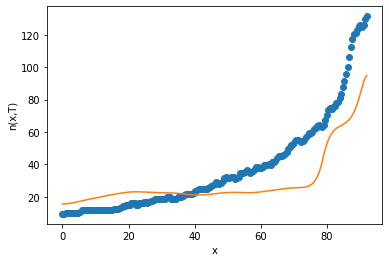

after perturb [7.935634625511899, 149.5250025839975, 18159.13164974589, 0.42625020104529104, 15.299252386100918]
parameters [7.935634625511899, 149.5250025839975, 18159.13164974589, 0.42625020104529104, 15.299252386100918]
after perturb [9.038705218510145, 40.71324613000212, 29351.296960335367, 0.36540850725879737, 27.633969276939922]
parameters [9.038705218510145, 40.71324613000212, 29351.296960335367, 0.36540850725879737, 27.633969276939922]
after perturb [10.269358629044742, 88.79188806060043, 20446.693256577473, 0.1805528641343568, 19.79513302159679]
parameters [10.269358629044742, 88.79188806060043, 20446.693256577473, 0.1805528641343568, 19.79513302159679]
after perturb [7.2642722610918415, 23.779472138486597, 22959.804284757734, 0.07828588090991684, 21.76868829230518]
parameters [7.2642722610918415, 23.779472138486597, 22959.804284757734, 0.07828588090991684, 21.76868829230518]
oxigeno [5.23373410e-03 5.22981702e-03 5.21809607e-03 5.19866164e-03
 5.17166277e-03 5.13730475e-03 5.

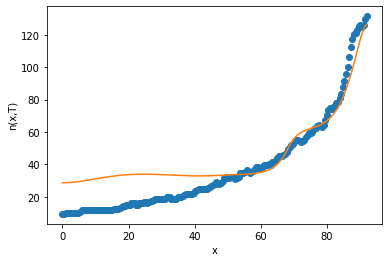

after perturb [3.7952808079649616, 154.6876181374514, 21611.362740403354, 0.35185665979423336, 25.1479827151417]
parameters [3.7952808079649616, 154.6876181374514, 21611.362740403354, 0.35185665979423336, 25.1479827151417]
after perturb [1.8737424677466983, 137.58317824349783, 22406.368811106808, 0.44282155962439396, 9.031493662457631]
parameters [1.8737424677466983, 137.58317824349783, 22406.368811106808, 0.44282155962439396, 9.031493662457631]
oxigeno [3.29910653e-08 3.31357773e-08 3.35713747e-08 3.43022575e-08
 3.53358127e-08 3.66824945e-08 3.83559380e-08 4.03731072e-08
 4.27544783e-08 4.55242604e-08 4.87106552e-08 5.23461575e-08
 5.64679000e-08 6.11180449e-08 6.63442267e-08 7.22000522e-08
 7.87456649e-08 8.60483838e-08 9.41834292e-08 1.03234748e-07
 1.13295956e-07 1.24471407e-07 1.36877413e-07 1.50643609e-07
 1.65914498e-07 1.82851154e-07 2.01633111e-07 2.22460443e-07
 2.45556038e-07 2.71168095e-07 2.99572875e-07 3.31077735e-07
 3.66024502e-07 4.04793226e-07 4.47806369e-07 4.955334

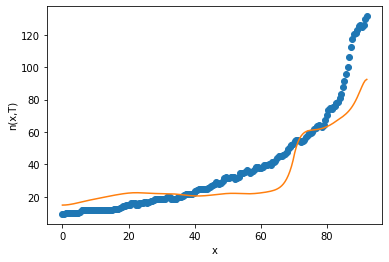

after perturb [13.787578163675978, 198.03324906206575, 25806.683737362528, 0.7974718352318845, 49.05376931979468]
parameters [13.787578163675978, 198.03324906206575, 25806.683737362528, 0.7974718352318845, 49.05376931979468]
after perturb [6.049010587297852, 144.60158760365496, 18948.46979518124, 0.7140744679149611, 47.440811610619136]
parameters [6.049010587297852, 144.60158760365496, 18948.46979518124, 0.7140744679149611, 47.440811610619136]
after perturb [14.179679273617571, 173.43622519277574, 25272.59986991608, 1.4745206593448792, 64.5048705988737]
parameters [14.179679273617571, 173.43622519277574, 25272.59986991608, 1.4745206593448792, 64.5048705988737]
after perturb [5.22236549354089, -10.658653216248773, 30657.07050773604, 0.0324592019935174, 26.470917046776847]
parameters [5.22236549354089, -10.658653216248773, 30657.07050773604, 0.0324592019935174, 26.470917046776847]
after perturb [4.852826597846071, 155.5435148464871, 20958.67604531982, 0.37141724279288124, 26.327596073125

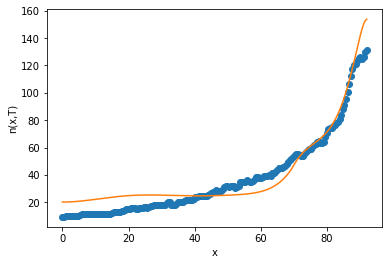

20
parameters [6.94905414735377, 93.42018806578366, 21689.202459912314, 0.3373160367506163, 27.025320527181474]
parameters [7.844232837060998, 124.03652879192447, 23975.716143164, 0.3784092242124996, 26.779661987381868]
parameters [6.617670627103956, 81.38925843181248, 24611.71346913363, 0.32651181570038657, 28.262395340801838]
parameters [8.762232675956998, 127.91483302671708, 27094.406711654734, 0.4113349966184604, 31.50008914666429]
parameters [9.125333387415397, 125.06498803900695, 25077.365063211426, 0.5620581298037155, 31.24343746898009]
parameters [7.009207024592968, 125.49102204331757, 27836.658768177116, 0.3199898236609027, 20.44991380720123]
parameters [7.637889164877554, 98.75952262118935, 23409.18519624036, 0.4477134735673928, 35.51064032973013]
parameters [5.572722811433324, 128.11521915223145, 26486.904515672977, 0.359928667680565, 26.619635921074902]
parameters [8.954163679206326, 97.59844063049368, 21096.446125583887, 0.3012762193301448, 17.88003866677901]
parameters [8

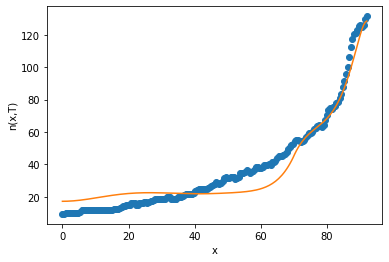

1
after perturb [6.28679160519207, 143.0334701586017, 27857.80614758927, 0.30456212448382813, 20.961033910604947]
parameters [6.28679160519207, 143.0334701586017, 27857.80614758927, 0.30456212448382813, 20.961033910604947]
oxigeno [1.16093526e-06 1.16407268e-06 1.17350673e-06 1.18930302e-06
 1.21157143e-06 1.24046705e-06 1.27619134e-06 1.31899379e-06
 1.36917384e-06 1.42708322e-06 1.49312875e-06 1.56777546e-06
 1.65155021e-06 1.74504577e-06 1.84892538e-06 1.96392780e-06
 2.09087298e-06 2.23066827e-06 2.38431530e-06 2.55291753e-06
 2.73768853e-06 2.93996105e-06 3.16119696e-06 3.40299808e-06
 3.66711799e-06 3.95547491e-06 4.27016568e-06 4.61348095e-06
 4.98792173e-06 5.39621718e-06 5.84134403e-06 6.32654747e-06
 6.85536374e-06 7.43164458e-06 8.05958348e-06 8.74374409e-06
 9.48909070e-06 1.03010212e-05 1.11854022e-05 1.21486075e-05
 1.31975587e-05 1.43397691e-05 1.55833912e-05 1.69372678e-05
 1.84109862e-05 2.00149376e-05 2.17603801e-05 2.36595072e-05
 2.57255212e-05 2.79727119e-05 3.0416

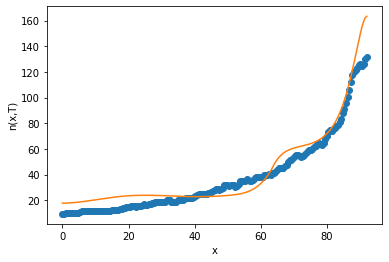

after perturb [11.744913213321102, 23.61667408449908, 30233.54934153984, 0.09243045970566607, 17.8680838655392]
parameters [11.744913213321102, 23.61667408449908, 30233.54934153984, 0.09243045970566607, 17.8680838655392]
after perturb [6.204595551778756, 165.46039846484024, 27161.625108987115, 0.285770978991894, 22.13064835930853]
parameters [6.204595551778756, 165.46039846484024, 27161.625108987115, 0.285770978991894, 22.13064835930853]
after perturb [7.7934682643895545, 104.7698469733391, 31306.725481776535, 0.2602154422620816, 16.65712342983616]
parameters [7.7934682643895545, 104.7698469733391, 31306.725481776535, 0.2602154422620816, 16.65712342983616]
after perturb [9.450647848179598, 94.04856687538233, 25592.93004384961, 0.13607363112372964, 29.156347643275737]
parameters [9.450647848179598, 94.04856687538233, 25592.93004384961, 0.13607363112372964, 29.156347643275737]
oxigeno [4.57629458e-04 4.57467869e-04 4.56984073e-04 4.56180977e-04
 4.55063400e-04 4.53638038e-04 4.51913410e-

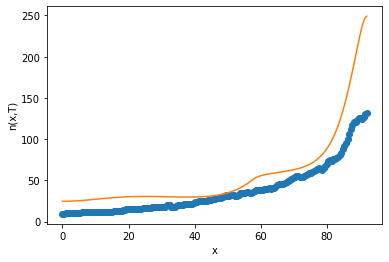

after perturb [4.694106005158696, 68.92874992262749, 27086.748499854104, 0.15773331391300582, 24.338496012839652]
parameters [4.694106005158696, 68.92874992262749, 27086.748499854104, 0.15773331391300582, 24.338496012839652]
oxigeno [1.48722700e-04 1.48628735e-04 1.48347492e-04 1.47880913e-04
 1.47232201e-04 1.46405763e-04 1.45407140e-04 1.44242918e-04
 1.42920627e-04 1.41448629e-04 1.39836000e-04 1.38092409e-04
 1.36227995e-04 1.34253252e-04 1.32178913e-04 1.30015845e-04
 1.27774954e-04 1.25467098e-04 1.23103010e-04 1.20693239e-04
 1.18248089e-04 1.15777582e-04 1.13291420e-04 1.10798961e-04
 1.08309203e-04 1.05830773e-04 1.03371920e-04 1.00940520e-04
 9.85440776e-05 9.61897399e-05 9.38843052e-05 9.16342428e-05
 8.94457115e-05 8.73245836e-05 8.52764710e-05 8.33067550e-05
 8.14206195e-05 7.96230882e-05 7.79190649e-05 7.63133785e-05
 7.48108314e-05 7.34162528e-05 7.21345562e-05 7.09708009e-05
 6.99302590e-05 6.90184857e-05 6.82413957e-05 6.76053431e-05
 6.71172067e-05 6.67844801e-05 6.66

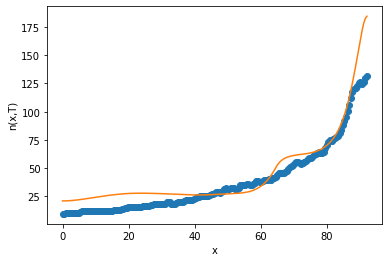

after perturb [9.407906243690604, 90.12216350873877, 35455.501979603774, 0.2550615789122625, 31.368163836064397]
parameters [9.407906243690604, 90.12216350873877, 35455.501979603774, 0.2550615789122625, 31.368163836064397]
after perturb [7.963838410715545, 109.00190359123337, 35748.42418678571, 0.17148092021652694, 16.32165654303832]
parameters [7.963838410715545, 109.00190359123337, 35748.42418678571, 0.17148092021652694, 16.32165654303832]
after perturb [9.431613503306307, 96.52942828209311, 28400.901471497124, 0.33580775329668977, 26.86545083097439]
parameters [9.431613503306307, 96.52942828209311, 28400.901471497124, 0.33580775329668977, 26.86545083097439]
oxigeno [5.70900930e-08 5.71155232e-08 5.71926452e-08 5.73239589e-08
 5.75136524e-08 5.77676337e-08 5.80935774e-08 5.85009857e-08
 5.90012661e-08 5.96078265e-08 6.03361911e-08 6.12041370e-08
 6.22318570e-08 6.34421483e-08 6.48606330e-08 6.65160124e-08
 6.84403593e-08 7.06694532e-08 7.32431625e-08 7.62058796e-08
 7.96070139e-08 8.

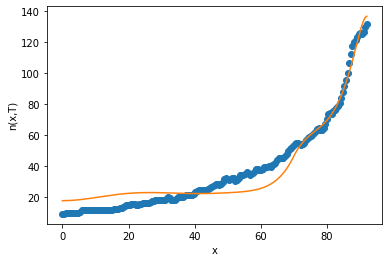

2
after perturb [8.362376491657106, 49.267189780656906, 27437.458068875603, 0.34005239161509115, 34.95539428342046]
parameters [8.362376491657106, 49.267189780656906, 27437.458068875603, 0.34005239161509115, 34.95539428342046]
oxigeno [6.07298679e-08 6.06645740e-08 6.04692137e-08 6.01453434e-08
 5.96955295e-08 5.91233082e-08 5.84331308e-08 5.76302952e-08
 5.67208668e-08 5.57115888e-08 5.46097861e-08 5.34232636e-08
 5.21602016e-08 5.08290504e-08 4.94384269e-08 4.79970138e-08
 4.65134644e-08 4.49963133e-08 4.34538955e-08 4.18942737e-08
 4.03251746e-08 3.87539356e-08 3.71874608e-08 3.56321867e-08
 3.40940577e-08 3.25785107e-08 3.10904681e-08 2.96343388e-08
 2.82140268e-08 2.68329461e-08 2.54940415e-08 2.41998153e-08
 2.29523578e-08 2.17533822e-08 2.06042631e-08 1.95060784e-08
 1.84596532e-08 1.74656075e-08 1.65244054e-08 1.56364077e-08
 1.48019268e-08 1.40212853e-08 1.32948780e-08 1.26232379e-08
 1.20071087e-08 1.14475223e-08 1.09458854e-08 1.05040742e-08
 1.01245416e-08 9.81043734e-09 9.

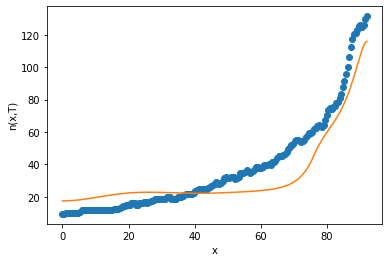

after perturb [9.056488426129697, 22.990416280498728, 25864.774650138548, 0.14253341804970354, 35.37350600817712]
parameters [9.056488426129697, 22.990416280498728, 25864.774650138548, 0.14253341804970354, 35.37350600817712]
oxigeno [2.82805993e-04 2.82520955e-04 2.81668176e-04 2.80254621e-04
 2.78291775e-04 2.75795465e-04 2.72785610e-04 2.69285922e-04
 2.65323541e-04 2.60928643e-04 2.56134000e-04 2.50974530e-04
 2.45486822e-04 2.39708662e-04 2.33678568e-04 2.27435338e-04
 2.21017613e-04 2.14463480e-04 2.07810099e-04 2.01093379e-04
 1.94347682e-04 1.87605583e-04 1.80897664e-04 1.74252358e-04
 1.67695827e-04 1.61251889e-04 1.54941978e-04 1.48785133e-04
 1.42798028e-04 1.36995018e-04 1.31388218e-04 1.25987594e-04
 1.20801073e-04 1.15834667e-04 1.11092601e-04 1.06577448e-04
 1.02290277e-04 9.82307839e-05 9.43974361e-05 9.07876076e-05
 8.73977093e-05 8.42233149e-05 8.12592785e-05 7.84998449e-05
 7.59387518e-05 7.35693234e-05 7.13845551e-05 6.93771897e-05
 6.75397851e-05 6.58647742e-05 6.43

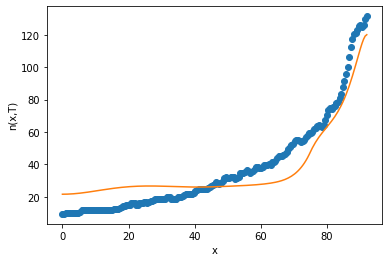

after perturb [9.499219580839615, 129.24234521621318, 25346.498194190353, 0.3470255686974654, 30.266666615220412]
parameters [9.499219580839615, 129.24234521621318, 25346.498194190353, 0.3470255686974654, 30.266666615220412]
oxigeno [1.72993545e-07 1.73577934e-07 1.75336097e-07 1.78283059e-07
 1.82444020e-07 1.87854590e-07 1.94561122e-07 2.02621143e-07
 2.12103897e-07 2.23090986e-07 2.35677135e-07 2.49971074e-07
 2.66096554e-07 2.84193495e-07 3.04419290e-07 3.26950265e-07
 3.51983312e-07 3.79737716e-07 4.10457172e-07 4.44412040e-07
 4.81901823e-07 5.23257914e-07 5.68846631e-07 6.19072546e-07
 6.74382167e-07 7.35267972e-07 8.02272849e-07 8.75994964e-07
 9.57093106e-07 1.04629254e-06 1.14439141e-06 1.25226779e-06
 1.37088731e-06 1.50131159e-06 1.64470741e-06 1.80235669e-06
 1.97566749e-06 2.16618586e-06 2.37560892e-06 2.60579901e-06
 2.85879917e-06 3.13684996e-06 3.44240782e-06 3.77816500e-06
 4.14707134e-06 4.55235789e-06 4.99756262e-06 5.48655840e-06
 6.02358340e-06 6.61327416e-06 7.26

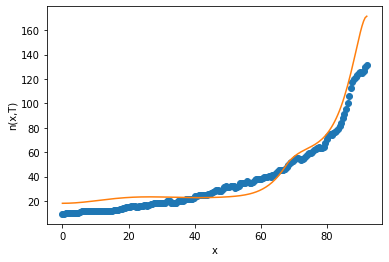

after perturb [11.449746524310276, 110.01186259634451, 32783.03218834811, 0.275868409823606, 28.806606359215404]
parameters [11.449746524310276, 110.01186259634451, 32783.03218834811, 0.275868409823606, 28.806606359215404]
after perturb [5.4299442418394595, 81.40205710756457, 26455.597683031694, 0.2625952347464625, 20.829554986848763]
parameters [5.4299442418394595, 81.40205710756457, 26455.597683031694, 0.2625952347464625, 20.829554986848763]
oxigeno [1.23290661e-06 1.23208089e-06 1.22961070e-06 1.22551683e-06
 1.21983367e-06 1.21260879e-06 1.20390237e-06 1.19378657e-06
 1.18234471e-06 1.16967045e-06 1.15586691e-06 1.14104581e-06
 1.12532653e-06 1.10883535e-06 1.09170465e-06 1.07407232e-06
 1.05608116e-06 1.03787856e-06 1.01961616e-06 1.00144987e-06
 9.83539901e-07 9.66051042e-07 9.49153146e-07 9.33021768e-07
 9.17839027e-07 9.03794671e-07 8.91087360e-07 8.79926177e-07
 8.70532371e-07 8.63141363e-07 8.58005016e-07 8.55394200e-07
 8.55601660e-07 8.58945234e-07 8.65771430e-07 8.76459405

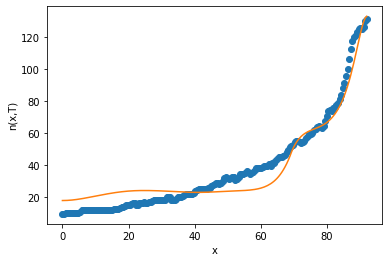

3
after perturb [4.438885101737968, 193.22536761284124, 29618.83802599212, 0.32718771219528586, 15.233253178243151]
parameters [4.438885101737968, 193.22536761284124, 29618.83802599212, 0.32718771219528586, 15.233253178243151]
after perturb [5.548452724648181, 115.02988410051194, 19853.581422797808, 0.4188842377955044, 20.83852472760425]
parameters [5.548452724648181, 115.02988410051194, 19853.581422797808, 0.4188842377955044, 20.83852472760425]
after perturb [9.81031126471521, 183.8904930469899, 23858.786650342397, 0.5022235115732945, 29.439468761982575]
parameters [9.81031126471521, 183.8904930469899, 23858.786650342397, 0.5022235115732945, 29.439468761982575]
after perturb [7.993645709312439, 165.10087664997837, 28802.489182438614, 0.4193764465035965, 31.24528794736049]
parameters [7.993645709312439, 165.10087664997837, 28802.489182438614, 0.4193764465035965, 31.24528794736049]
after perturb [4.060152108355048, 205.42553043034633, 30552.730686178824, 0.5179963373829539, 22.238445164

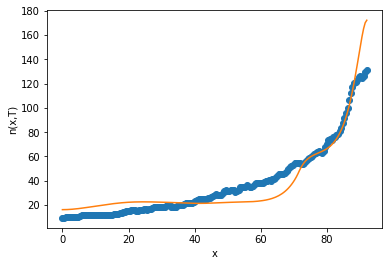

after perturb [8.138575687889933, 83.07266385613406, 24913.259399898114, 0.3052510648898887, 32.44172378023031]
parameters [8.138575687889933, 83.07266385613406, 24913.259399898114, 0.3052510648898887, 32.44172378023031]
oxigeno [2.18710928e-07 2.18582490e-07 2.18198474e-07 2.17562763e-07
 2.16681801e-07 2.15564565e-07 2.14222514e-07 2.12669532e-07
 2.10921870e-07 2.08998077e-07 2.06918940e-07 2.04707418e-07
 2.02388599e-07 1.99989657e-07 1.97539838e-07 1.95070463e-07
 1.92614963e-07 1.90208941e-07 1.87890284e-07 1.85699299e-07
 1.83678916e-07 1.81874933e-07 1.80336320e-07 1.79115589e-07
 1.78269236e-07 1.77858253e-07 1.77948731e-07 1.78612548e-07
 1.79928159e-07 1.81981496e-07 1.84866982e-07 1.88688687e-07
 1.93561615e-07 1.99613155e-07 2.06984714e-07 2.15833528e-07
 2.26334698e-07 2.38683455e-07 2.53097688e-07 2.69820757e-07
 2.89124631e-07 3.11313366e-07 3.36726992e-07 3.65745817e-07
 3.98795217e-07 4.36350963e-07 4.78945127e-07 5.27172650e-07
 5.81698622e-07 6.43266378e-07 7.127064

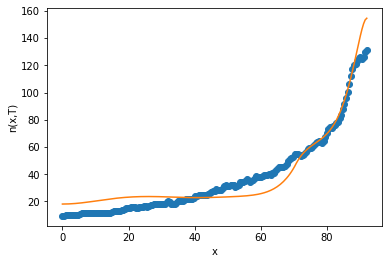

4
after perturb [9.062623194125603, 107.33373029201314, 29123.031593904074, 0.25297716067637477, 15.067042725955597]
parameters [9.062623194125603, 107.33373029201314, 29123.031593904074, 0.25297716067637477, 15.067042725955597]
after perturb [11.273769679127332, 77.88788271294194, 24544.263005791247, 0.19211039196419724, 28.25334087182283]
parameters [11.273769679127332, 77.88788271294194, 24544.263005791247, 0.19211039196419724, 28.25334087182283]
after perturb [2.124277489520602, 157.1262975231658, 26044.085333212068, 0.4287864872790255, 28.68935284449579]
parameters [2.124277489520602, 157.1262975231658, 26044.085333212068, 0.4287864872790255, 28.68935284449579]
after perturb [8.114138767991166, 91.80138044766143, 22824.42185400412, 0.26464694370504266, 16.257346926135583]
parameters [8.114138767991166, 91.80138044766143, 22824.42185400412, 0.26464694370504266, 16.257346926135583]
oxigeno [9.23225502e-07 9.22902276e-07 9.21937886e-07 9.20348187e-07
 9.18159568e-07 9.15408918e-07 9.

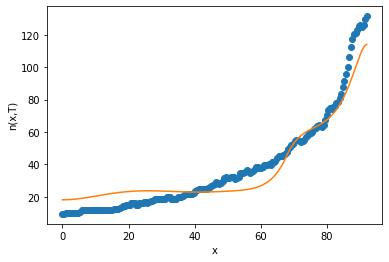

after perturb [11.861498453328066, 114.47145247877678, 20291.377289279582, 0.3989756886513905, 23.155038956715515]
parameters [11.861498453328066, 114.47145247877678, 20291.377289279582, 0.3989756886513905, 23.155038956715515]
after perturb [9.923896811720459, 111.68571225142901, 24829.05451363332, 0.33594805792464877, 31.72835216777662]
parameters [9.923896811720459, 111.68571225142901, 24829.05451363332, 0.33594805792464877, 31.72835216777662]
oxigeno [9.21598976e-08 9.23510994e-08 9.29269361e-08 9.38941226e-08
 9.52639207e-08 9.70522462e-08 9.92798201e-08 1.01972366e-07
 1.05160858e-07 1.08881816e-07 1.13177663e-07 1.18097136e-07
 1.23695766e-07 1.30036423e-07 1.37189939e-07 1.45235817e-07
 1.54263027e-07 1.64370901e-07 1.75670138e-07 1.88283930e-07
 2.02349213e-07 2.18018068e-07 2.35459273e-07 2.54860034e-07
 2.76427901e-07 3.00392894e-07 3.27009854e-07 3.56561051e-07
 3.89359057e-07 4.25749929e-07 4.66116713e-07 5.10883322e-07
 5.60518792e-07 6.15541988e-07 6.76526776e-07 7.441077

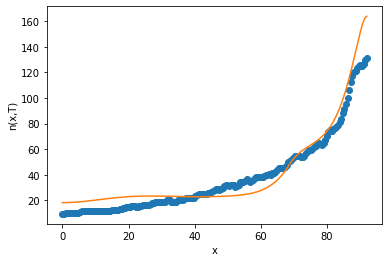

after perturb [5.635772912900556, 135.29181666072884, 27861.463595210156, 0.3616937108898526, 24.20696126191907]
parameters [5.635772912900556, 135.29181666072884, 27861.463595210156, 0.3616937108898526, 24.20696126191907]
oxigeno [1.81921818e-07 1.82571629e-07 1.84526472e-07 1.87802632e-07
 1.92427425e-07 1.98439472e-07 2.05889076e-07 2.14838712e-07
 2.25363638e-07 2.37552625e-07 2.51508817e-07 2.67350722e-07
 2.85213348e-07 3.05249496e-07 3.27631209e-07 3.52551405e-07
 3.80225695e-07 4.10894419e-07 4.44824894e-07 4.82313921e-07
 5.23690554e-07 5.69319162e-07 6.19602812e-07 6.74987000e-07
 7.35963760e-07 8.03076189e-07 8.76923419e-07 9.58166077e-07
 1.04753227e-06 1.14582417e-06 1.25392515e-06 1.37280770e-06
 1.50354196e-06 1.64730512e-06 1.80539162e-06 1.97922428e-06
 2.17036639e-06 2.38053497e-06 2.61161503e-06 2.86567522e-06
 3.14498477e-06 3.45203190e-06 3.78954387e-06 4.16050876e-06
 4.56819911e-06 5.01619768e-06 5.50842545e-06 6.04917204e-06
 6.64312889e-06 7.29542528e-06 8.0116

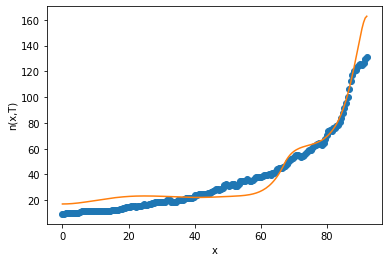

5
after perturb [8.536117706181818, 97.3694943702653, 20919.992594049596, 0.4572333295574457, 34.41821861677702]
parameters [8.536117706181818, 97.3694943702653, 20919.992594049596, 0.4572333295574457, 34.41821861677702]
oxigeno [8.46799740e-10 8.50457334e-10 8.61488726e-10 8.80070639e-10
 9.06500607e-10 9.41201515e-10 9.84728079e-10 1.03777536e-09
 1.10118945e-09 1.17598058e-09 1.26333875e-09 1.36465232e-09
 1.48152965e-09 1.61582441e-09 1.76966479e-09 1.94548716e-09
 2.14607476e-09 2.37460204e-09 2.63468534e-09 2.93044081e-09
 3.26655038e-09 3.64833705e-09 4.08185040e-09 4.57396401e-09
 5.13248604e-09 5.76628486e-09 6.48543168e-09 7.30136229e-09
 8.22706049e-09 9.27726590e-09 1.04687094e-08 1.18203798e-08
 1.33538251e-08 1.50934942e-08 1.70671222e-08 1.93061664e-08
 2.18462987e-08 2.47279617e-08 2.79969959e-08 3.17053475e-08
 3.59118668e-08 4.06832076e-08 4.60948412e-08 5.22321979e-08
 5.91919525e-08 6.70834713e-08 7.60304397e-08 8.61726924e-08
 9.76682724e-08 1.10695743e-07 1.254567

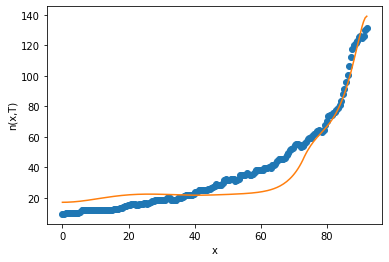

after perturb [5.882475458214497, 69.19613831688595, 31177.52311408781, 0.22991664027794642, 23.081135525362093]
parameters [5.882475458214497, 69.19613831688595, 31177.52311408781, 0.22991664027794642, 23.081135525362093]
after perturb [9.3819773196781, 122.52603846193578, 19925.97749343316, 0.4282385536152744, 24.84163385719623]
parameters [9.3819773196781, 122.52603846193578, 19925.97749343316, 0.4282385536152744, 24.84163385719623]
after perturb [11.03639204463152, 150.54406512542442, 25439.72297247935, 0.23606853559729196, 13.705572741294581]
parameters [11.03639204463152, 150.54406512542442, 25439.72297247935, 0.23606853559729196, 13.705572741294581]
after perturb [11.084122329726311, 53.364486321600666, 25417.61181208289, 0.19922604151587514, 19.45853651674452]
parameters [11.084122329726311, 53.364486321600666, 25417.61181208289, 0.19922604151587514, 19.45853651674452]
after perturb [8.469081445635036, 80.62348140397624, 21588.800211566264, 0.22279128088183286, 20.5480292953492

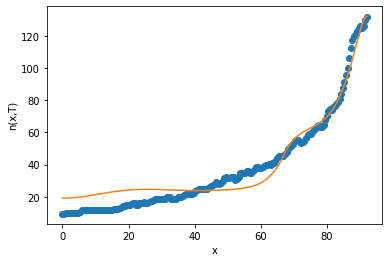

6
after perturb [5.880714424426691, 107.80127067655104, 28944.446733216086, 0.2527761781503803, 13.572153839613986]
parameters [5.880714424426691, 107.80127067655104, 28944.446733216086, 0.2527761781503803, 13.572153839613986]
oxigeno [1.69104466e-06 1.69143971e-06 1.69263930e-06 1.69468686e-06
 1.69765485e-06 1.70164493e-06 1.70678825e-06 1.71324578e-06
 1.72120878e-06 1.73089942e-06 1.74257159e-06 1.75651186e-06
 1.77304068e-06 1.79251393e-06 1.81532461e-06 1.84190502e-06
 1.87272918e-06 1.90831571e-06 1.94923115e-06 1.99609374e-06
 2.04957771e-06 2.11041815e-06 2.17941645e-06 2.25744640e-06
 2.34546099e-06 2.44449992e-06 2.55569798e-06 2.68029419e-06
 2.81964194e-06 2.97522010e-06 3.14864517e-06 3.34168459e-06
 3.55627129e-06 3.79451955e-06 4.05874222e-06 4.35146958e-06
 4.67546974e-06 5.03377080e-06 5.42968504e-06 5.86683499e-06
 6.34918180e-06 6.88105606e-06 7.46719107e-06 8.11275903e-06
 8.82341026e-06 9.60531565e-06 1.04652128e-05 1.14104558e-05
 1.24490698e-05 1.35898094e-05 1.

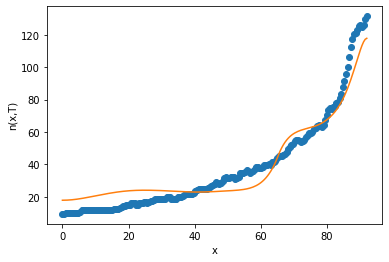

7
after perturb [7.047640775660993, 93.96881639477326, 24550.894451187763, 0.25310971770126056, 16.509716607609356]
parameters [7.047640775660993, 93.96881639477326, 24550.894451187763, 0.25310971770126056, 16.509716607609356]
oxigeno [1.58984194e-06 1.58929553e-06 1.58766525e-06 1.58497794e-06
 1.58127824e-06 1.57662847e-06 1.57110847e-06 1.56481542e-06
 1.55786366e-06 1.55038449e-06 1.54252607e-06 1.53445330e-06
 1.52634785e-06 1.51840824e-06 1.51085011e-06 1.50390659e-06
 1.49782892e-06 1.49288722e-06 1.48937149e-06 1.48759299e-06
 1.48788572e-06 1.49060836e-06 1.49614649e-06 1.50491516e-06
 1.51736191e-06 1.53397011e-06 1.55526289e-06 1.58180746e-06
 1.61421996e-06 1.65317093e-06 1.69939136e-06 1.75367937e-06
 1.81690769e-06 1.89003178e-06 1.97409891e-06 2.07025808e-06
 2.17977089e-06 2.30402356e-06 2.44453999e-06 2.60299620e-06
 2.78123598e-06 2.98128818e-06 3.20538547e-06 3.45598495e-06
 3.73579062e-06 4.04777792e-06 4.39522060e-06 4.78171998e-06
 5.21123696e-06 5.68812696e-06 6.

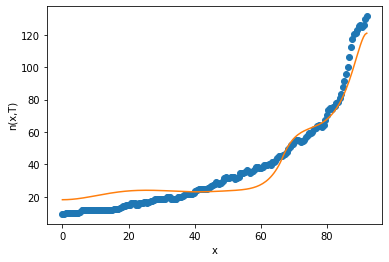

8
after perturb [6.855069312169919, 107.01115718387264, 25844.86350354034, 0.2669560052542679, 19.16040046745456]
parameters [6.855069312169919, 107.01115718387264, 25844.86350354034, 0.2669560052542679, 19.16040046745456]
oxigeno [1.04980857e-06 1.05013143e-06 1.05110976e-06 1.05277289e-06
 1.05516981e-06 1.05836935e-06 1.06246044e-06 1.06755249e-06
 1.07377580e-06 1.08128218e-06 1.09024561e-06 1.10086316e-06
 1.11335595e-06 1.12797045e-06 1.14497986e-06 1.16468583e-06
 1.18742037e-06 1.21354816e-06 1.24346902e-06 1.27762087e-06
 1.31648304e-06 1.36057991e-06 1.41048511e-06 1.46682614e-06
 1.53028952e-06 1.60162654e-06 1.68165959e-06 1.77128916e-06
 1.87150155e-06 1.98337740e-06 2.10810096e-06 2.24697039e-06
 2.40140889e-06 2.57297700e-06 2.76338597e-06 2.97451236e-06
 3.20841404e-06 3.46734749e-06 3.75378679e-06 4.07044417e-06
 4.42029247e-06 4.80658953e-06 5.23290466e-06 5.70314754e-06
 6.22159951e-06 6.79294766e-06 7.42232182e-06 8.11533476e-06
 8.87812591e-06 9.71740880e-06 1.0640

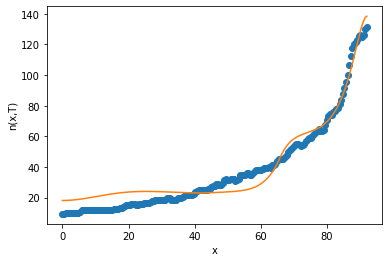

9
after perturb [6.694189401643164, 196.42008178150047, 26541.80881935569, 0.4163929676229854, 11.377977837685862]
parameters [6.694189401643164, 196.42008178150047, 26541.80881935569, 0.4163929676229854, 11.377977837685862]
after perturb [9.994119781884564, 127.68632176249149, 26091.710864127508, 0.5403955678106147, 36.695632969672076]
parameters [9.994119781884564, 127.68632176249149, 26091.710864127508, 0.5403955678106147, 36.695632969672076]
oxigeno [2.53437424e-09 2.54964096e-09 2.59562573e-09 2.67288489e-09
 2.78235414e-09 2.92536122e-09 3.10364405e-09 3.31937445e-09
 3.57518773e-09 3.87421869e-09 4.22014441e-09 4.61723453e-09
 5.07040954e-09 5.58530813e-09 6.16836430e-09 6.82689544e-09
 7.56920242e-09 8.40468329e-09 9.34396188e-09 1.03990332e-08
 1.15834276e-08 1.29123956e-08 1.44031164e-08 1.60749322e-08
 1.79496122e-08 2.00516484e-08 2.24085888e-08 2.50514109e-08
 2.80149407e-08 3.13383233e-08 3.50655491e-08 3.92460451e-08
 4.39353354e-08 4.91957821e-08 5.50974132e-08 6.171884

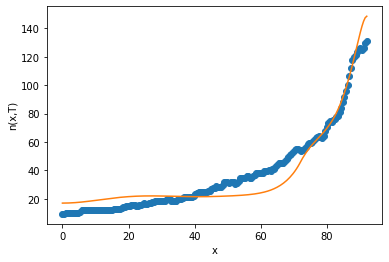

after perturb [10.197335429921628, 69.25442494279866, 24090.339550754652, 0.19329950938800894, 20.76282756424645]
parameters [10.197335429921628, 69.25442494279866, 24090.339550754652, 0.19329950938800894, 20.76282756424645]
after perturb [6.832322584732023, 18.858777505685538, 33089.86708918417, 0.05752003106503539, 37.852193831461726]
parameters [6.832322584732023, 18.858777505685538, 33089.86708918417, 0.05752003106503539, 37.852193831461726]
after perturb [7.032350627474989, 54.8027211626136, 23581.691668713567, -0.03248907659389011, 10.521153733998146]
parameters [7.032350627474989, 54.8027211626136, 23581.691668713567, -0.03248907659389011, 10.521153733998146]
after perturb [8.567850382364991, 52.14086302050055, 28632.025064994894, 0.10073844166423801, 22.250362814064612]
parameters [8.567850382364991, 52.14086302050055, 28632.025064994894, 0.10073844166423801, 22.250362814064612]
oxigeno [2.10943956e-03 2.10835008e-03 2.10508784e-03 2.09967129e-03
 2.09213096e-03 2.08250907e-03 

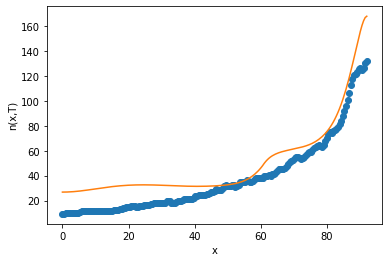

after perturb [9.252017369648748, 72.02352609003603, 23630.3296843348, 0.16586902588508493, 21.83025877862767]
parameters [9.252017369648748, 72.02352609003603, 23630.3296843348, 0.16586902588508493, 21.83025877862767]
oxigeno [8.75828382e-05 8.75369804e-05 8.73996566e-05 8.71716130e-05
 8.68540847e-05 8.64487831e-05 8.59578788e-05 8.53839797e-05
 8.47301058e-05 8.39996600e-05 8.31963968e-05 8.23243876e-05
 8.13879854e-05 8.03917880e-05 7.93406007e-05 7.82393995e-05
 7.70932945e-05 7.59074951e-05 7.46872768e-05 7.34379501e-05
 7.21648316e-05 7.08732186e-05 6.95683663e-05 6.82554686e-05
 6.69396422e-05 6.56259139e-05 6.43192123e-05 6.30243624e-05
 6.17460839e-05 6.04889938e-05 5.92576111e-05 5.80563668e-05
 5.68896157e-05 5.57616523e-05 5.46767302e-05 5.36390838e-05
 5.26529546e-05 5.17226189e-05 5.08524203e-05 5.00468042e-05
 4.93103563e-05 4.86478434e-05 4.80642586e-05 4.75648688e-05
 4.71552671e-05 4.68414276e-05 4.66297648e-05 4.65271977e-05
 4.65412173e-05 4.66799594e-05 4.69522831

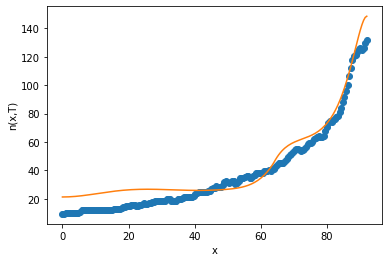

10
after perturb [9.845755213231863, 183.22203909101074, 20737.87147645048, 0.41493385574803165, 11.21300777944794]
parameters [9.845755213231863, 183.22203909101074, 20737.87147645048, 0.41493385574803165, 11.21300777944794]
after perturb [10.541187424986811, 106.16676322818924, 23870.414167376777, 0.25109025703610716, 8.433235426105803]
parameters [10.541187424986811, 106.16676322818924, 23870.414167376777, 0.25109025703610716, 8.433235426105803]
after perturb [9.625594338993379, 65.47455617812548, 26946.823839422395, 0.11727170755939897, 21.737082044116633]
parameters [9.625594338993379, 65.47455617812548, 26946.823839422395, 0.11727170755939897, 21.737082044116633]
oxigeno [9.18789292e-04 9.18366271e-04 9.17099391e-04 9.14995169e-04
 9.12064396e-04 9.08322025e-04 9.03787017e-04 8.98482155e-04
 8.92433818e-04 8.85671726e-04 8.78228657e-04 8.70140146e-04
 8.61444167e-04 8.52180797e-04 8.42391886e-04 8.32120712e-04
 8.21411653e-04 8.10309855e-04 7.98860922e-04 7.87110611e-04
 7.751045

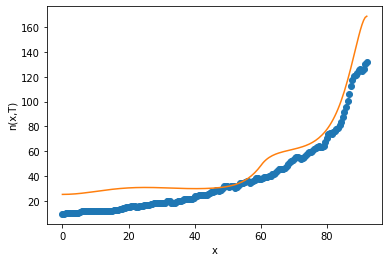

after perturb [6.467108077046685, 176.8638470977785, 25506.334052547267, 0.5526369521525639, 31.950830098639386]
parameters [6.467108077046685, 176.8638470977785, 25506.334052547267, 0.5526369521525639, 31.950830098639386]
after perturb [6.445166785424997, 194.00438234753722, 26391.52712396928, 0.4846398188995432, 21.714748678081378]
parameters [6.445166785424997, 194.00438234753722, 26391.52712396928, 0.4846398188995432, 21.714748678081378]
after perturb [8.756025483493877, 98.49343896682112, 28626.869003117234, 0.3145202083965916, 33.46474498488288]
parameters [8.756025483493877, 98.49343896682112, 28626.869003117234, 0.3145202083965916, 33.46474498488288]
oxigeno [1.54946060e-07 1.54975090e-07 1.55063869e-07 1.55217480e-07
 1.55444421e-07 1.55756653e-07 1.56169662e-07 1.56702549e-07
 1.57378138e-07 1.58223115e-07 1.59268195e-07 1.60548332e-07
 1.62102956e-07 1.63976262e-07 1.66217549e-07 1.68881611e-07
 1.72029196e-07 1.75727525e-07 1.80050898e-07 1.85081379e-07
 1.90909577e-07 1.97

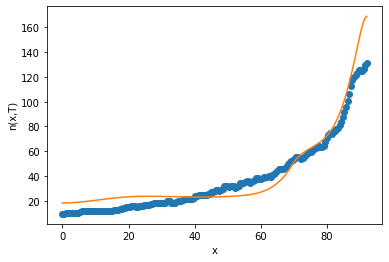

after perturb [6.30731338490122, 82.79910423921925, 28320.81746938683, 0.2481005675733939, 28.319015560198263]
parameters [6.30731338490122, 82.79910423921925, 28320.81746938683, 0.2481005675733939, 28.319015560198263]
oxigeno [2.59609293e-06 2.59447452e-06 2.58963190e-06 2.58160277e-06
 2.57044953e-06 2.55625856e-06 2.53913938e-06 2.51922347e-06
 2.49666305e-06 2.47162964e-06 2.44431254e-06 2.41491732e-06
 2.38366426e-06 2.35078686e-06 2.31653046e-06 2.28115094e-06
 2.24491366e-06 2.20809254e-06 2.17096939e-06 2.13383348e-06
 2.09698139e-06 2.06071716e-06 2.02535272e-06 1.99120863e-06
 1.95861516e-06 1.92791373e-06 1.89945864e-06 1.87361921e-06
 1.85078232e-06 1.83135524e-06 1.81576902e-06 1.80448223e-06
 1.79798514e-06 1.79680451e-06 1.80150881e-06 1.81271404e-06
 1.83109021e-06 1.85736843e-06 1.89234875e-06 1.93690876e-06
 1.99201309e-06 2.05872379e-06 2.13821173e-06 2.23176910e-06
 2.34082315e-06 2.46695118e-06 2.61189704e-06 2.77758918e-06
 2.96616041e-06 3.17996960e-06 3.42162545

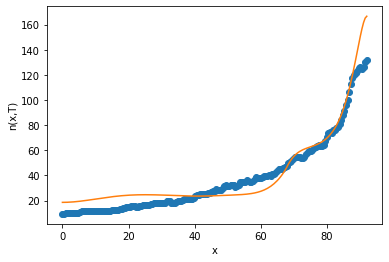

after perturb [12.006463714313092, 92.3019750626033, 26275.05681429442, 0.5578636457699511, 36.79348432667753]
parameters [12.006463714313092, 92.3019750626033, 26275.05681429442, 0.5578636457699511, 36.79348432667753]
after perturb [9.22683631506504, 89.88538009094968, 21571.106609966482, 0.45915314868134705, 29.65998050250896]
parameters [9.22683631506504, 89.88538009094968, 21571.106609966482, 0.45915314868134705, 29.65998050250896]
oxigeno [4.58051352e-10 4.59309435e-10 4.63109402e-10 4.69528812e-10
 4.78698287e-10 4.90803581e-10 5.06088529e-10 5.24858944e-10
 5.47487533e-10 5.74419935e-10 6.06181989e-10 6.43388392e-10
 6.86752892e-10 7.37100226e-10 7.95380024e-10 8.62682930e-10
 9.40259263e-10 1.02954053e-09 1.13216421e-09 1.25000225e-09
 1.38519375e-09 1.54018251e-09 1.71776002e-09 1.92111464e-09
 2.15388793e-09 2.42023903e-09 2.72491820e-09 3.07335083e-09
 3.47173331e-09 3.92714247e-09 4.44766026e-09 5.04251596e-09
 5.72224820e-09 6.49888940e-09 7.38617579e-09 8.39978636e-09
 9.

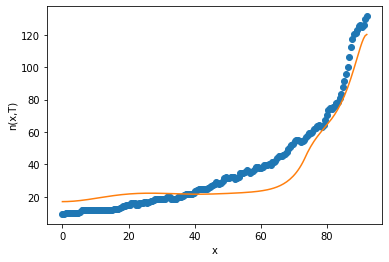

after perturb [7.433562984052831, 22.73326113210601, 24419.85622131838, 0.2672625424241846, 31.83686434318248]
parameters [7.433562984052831, 22.73326113210601, 24419.85622131838, 0.2672625424241846, 31.83686434318248]
oxigeno [1.42549575e-06 1.42326514e-06 1.41659805e-06 1.40556822e-06
 1.39029680e-06 1.37094982e-06 1.34773472e-06 1.32089612e-06
 1.29071100e-06 1.25748327e-06 1.22153812e-06 1.18321613e-06
 1.14286749e-06 1.10084619e-06 1.05750469e-06 1.01318883e-06
 9.68233346e-07 9.22957856e-07 8.77663518e-07 8.32630284e-07
 7.88114793e-07 7.44348884e-07 7.01538686e-07 6.59864257e-07
 6.19479701e-07 5.80513720e-07 5.43070532e-07 5.07231085e-07
 4.73054517e-07 4.40579790e-07 4.09827456e-07 3.80801486e-07
 3.53491138e-07 3.27872809e-07 3.03911843e-07 2.81564267e-07
 2.60778443e-07 2.41496597e-07 2.23656240e-07 2.07191451e-07
 1.92034030e-07 1.78114526e-07 1.65363122e-07 1.53710403e-07
 1.43088000e-07 1.33429124e-07 1.24668993e-07 1.16745170e-07
 1.09597810e-07 1.03169833e-07 9.74070346

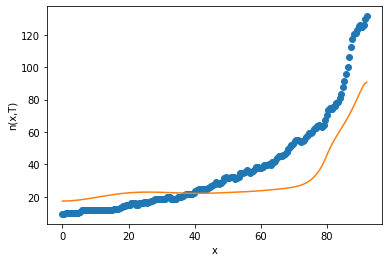

after perturb [4.480275284618455, 35.83420613313299, 24285.069836250146, 0.12455809184002392, 27.42338408704289]
parameters [4.480275284618455, 35.83420613313299, 24285.069836250146, 0.12455809184002392, 27.42338408704289]
oxigeno [6.95687013e-04 6.95091211e-04 6.93308895e-04 6.90355231e-04
 6.86255152e-04 6.81042855e-04 6.74761122e-04 6.67460503e-04
 6.59198374e-04 6.50037914e-04 6.40047034e-04 6.29297292e-04
 6.17862823e-04 6.05819310e-04 5.93243023e-04 5.80209943e-04
 5.66794979e-04 5.53071288e-04 5.39109704e-04 5.24978264e-04
 5.10741833e-04 4.96461824e-04 4.82195986e-04 4.67998276e-04
 4.53918780e-04 4.40003684e-04 4.26295291e-04 4.12832060e-04
 3.99648677e-04 3.86776142e-04 3.74241870e-04 3.62069801e-04
 3.50280523e-04 3.38891403e-04 3.27916713e-04 3.17367776e-04
 3.07253109e-04 2.97578570e-04 2.88347517e-04 2.79560967e-04
 2.71217756e-04 2.63314712e-04 2.55846827e-04 2.48807427e-04
 2.42188354e-04 2.35980137e-04 2.30172172e-04 2.24752888e-04
 2.19709925e-04 2.15030284e-04 2.1070

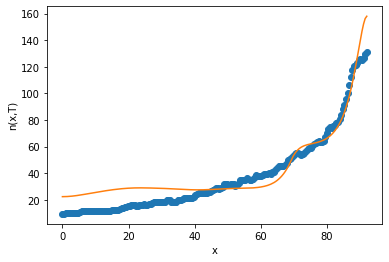

after perturb [8.22881870758716, 104.630619586681, 23610.60326418316, 0.1760182462369615, 11.728651898397741]
parameters [8.22881870758716, 104.630619586681, 23610.60326418316, 0.1760182462369615, 11.728651898397741]
oxigeno [4.32619616e-05 4.32534772e-05 4.32281663e-05 4.31864550e-05
 4.31290524e-05 4.30569479e-05 4.29714096e-05 4.28739800e-05
 4.27664731e-05 4.26509706e-05 4.25298178e-05 4.24056206e-05
 4.22812419e-05 4.21597997e-05 4.20446656e-05 4.19394647e-05
 4.18480769e-05 4.17746400e-05 4.17235545e-05 4.16994907e-05
 4.17073981e-05 4.17525171e-05 4.18403940e-05 4.19768982e-05
 4.21682427e-05 4.24210077e-05 4.27421680e-05 4.31391232e-05
 4.36197321e-05 4.41923504e-05 4.48658732e-05 4.56497803e-05
 4.65541875e-05 4.75899008e-05 4.87684764e-05 5.01022850e-05
 5.16045817e-05 5.32895806e-05 5.51725362e-05 5.72698294e-05
 5.95990612e-05 6.21791515e-05 6.50304467e-05 6.81748329e-05
 7.16358582e-05 7.54388631e-05 7.96111190e-05 8.41819776e-05
 8.91830285e-05 9.46482688e-05 1.00614284e-

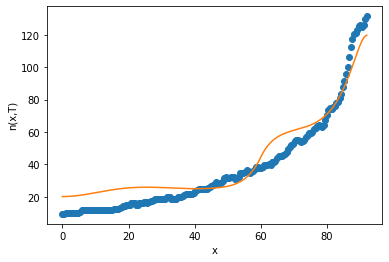

after perturb [7.42835361587489, 184.34005839394314, 29533.734172943066, 0.40220800908906695, 14.935510201190601]
parameters [7.42835361587489, 184.34005839394314, 29533.734172943066, 0.40220800908906695, 14.935510201190601]
after perturb [9.39061949712946, 215.43778108821652, 34492.08610460597, 0.4903826952200287, 27.030736591859924]
parameters [9.39061949712946, 215.43778108821652, 34492.08610460597, 0.4903826952200287, 27.030736591859924]
after perturb [3.902613033097443, 112.53028832674997, 23615.09774978211, 0.20584394269019768, 26.33116236670328]
parameters [3.902613033097443, 112.53028832674997, 23615.09774978211, 0.20584394269019768, 26.33116236670328]
oxigeno [1.87416329e-05 1.87388765e-05 1.87307098e-05 1.87174397e-05
 1.86995752e-05 1.86778232e-05 1.86530840e-05 1.86264453e-05
 1.85991754e-05 1.85727168e-05 1.85486798e-05 1.85288362e-05
 1.85151145e-05 1.85095960e-05 1.85145129e-05 1.85322476e-05
 1.85653341e-05 1.86164623e-05 1.86884832e-05 1.87844176e-05
 1.89074660e-05 1.

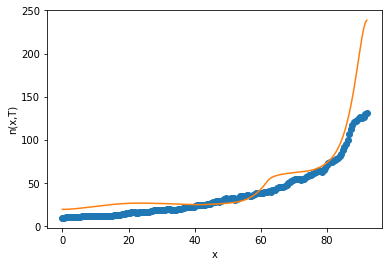

after perturb [9.591235637948216, 100.43637201239736, 33098.085704653015, 0.35821427715971976, 17.065262447659546]
parameters [9.591235637948216, 100.43637201239736, 33098.085704653015, 0.35821427715971976, 17.065262447659546]
after perturb [5.646433475822214, 153.83135031202542, 21238.198981029724, 0.3898157032443819, 15.180778442984238]
parameters [5.646433475822214, 153.83135031202542, 21238.198981029724, 0.3898157032443819, 15.180778442984238]
after perturb [8.987837268273182, 148.26939218839874, 25627.103437447407, 0.5030331627876163, 30.910139343542145]
parameters [8.987837268273182, 148.26939218839874, 25627.103437447407, 0.5030331627876163, 30.910139343542145]
oxigeno [2.54730704e-08 2.55931621e-08 2.59545850e-08 2.65607951e-08
 2.74175962e-08 2.85332044e-08 2.99183414e-08 3.15863547e-08
 3.35533677e-08 3.58384609e-08 3.84638857e-08 4.14553141e-08
 4.48421256e-08 4.86577356e-08 5.29399684e-08 5.77314781e-08
 6.30802235e-08 6.90399999e-08 7.56710359e-08 8.30406588e-08
 9.1224038

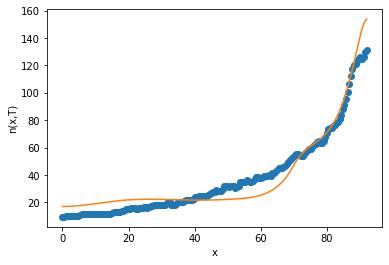

11
after perturb [10.279383159607686, 78.28069354147931, 27791.69117534217, 0.384280645022382, 29.894661103231023]
parameters [10.279383159607686, 78.28069354147931, 27791.69117534217, 0.384280645022382, 29.894661103231023]
after perturb [8.507442492699264, 157.8063532761105, 27340.154437358597, 0.3264741749424064, 27.157424279447078]
parameters [8.507442492699264, 157.8063532761105, 27340.154437358597, 0.3264741749424064, 27.157424279447078]
after perturb [8.252636859304143, 133.79702133747804, 30869.25361014017, 0.6430635531754605, 33.08981022659728]
parameters [8.252636859304143, 133.79702133747804, 30869.25361014017, 0.6430635531754605, 33.08981022659728]
after perturb [6.040316160966418, 57.38083108987064, 26403.652284577103, 0.21846838364388582, 31.557340809770608]
parameters [6.040316160966418, 57.38083108987064, 26403.652284577103, 0.21846838364388582, 31.557340809770608]
oxigeno [1.06420128e-05 1.06332843e-05 1.06071611e-05 1.05638300e-05
 1.05035987e-05 1.04268912e-05 1.03342

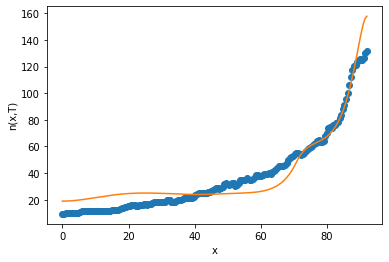

after perturb [6.987910291513021, 157.97927320328353, 27956.640246884726, 0.46688660562216044, 24.956465914871405]
parameters [6.987910291513021, 157.97927320328353, 27956.640246884726, 0.46688660562216044, 24.956465914871405]
after perturb [8.962759307083216, 190.55654138276861, 29065.085006490608, 0.570106276785442, 19.17054471079226]
parameters [8.962759307083216, 190.55654138276861, 29065.085006490608, 0.570106276785442, 19.17054471079226]
after perturb [10.168772362951144, 58.170305692589956, 29889.381708651843, 0.2970352100550875, 27.343936439670824]
parameters [10.168772362951144, 58.170305692589956, 29889.381708651843, 0.2970352100550875, 27.343936439670824]
after perturb [9.309666400876598, 82.52046592272643, 22260.903304262472, 0.22673476989127722, 10.829968954353268]
parameters [9.309666400876598, 82.52046592272643, 22260.903304262472, 0.22673476989127722, 10.829968954353268]
oxigeno [3.88581705e-06 3.88382821e-06 3.87787576e-06 3.86800185e-06
 3.85427638e-06 3.83679652e-06 

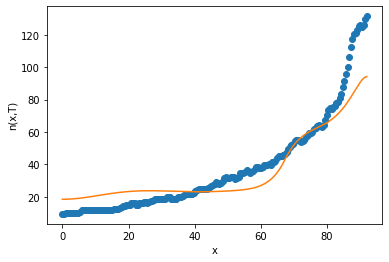

after perturb [5.4829101500787925, 125.8069916938195, 27608.318928032622, 0.43383184648071416, 32.400652800483826]
parameters [5.4829101500787925, 125.8069916938195, 27608.318928032622, 0.43383184648071416, 32.400652800483826]
oxigeno [1.79748845e-08 1.80597169e-08 1.83150889e-08 1.87436358e-08
 1.93497855e-08 2.01398127e-08 2.11219155e-08 2.23063153e-08
 2.37053806e-08 2.53337771e-08 2.72086444e-08 2.93498022e-08
 3.17799880e-08 3.45251289e-08 3.76146506e-08 4.10818274e-08
 4.49641772e-08 4.93039055e-08 5.41484050e-08 5.95508146e-08
 6.55706465e-08 7.22744869e-08 7.97367791e-08 8.80406976e-08
 9.72791235e-08 1.07555731e-07 1.18986197e-07 1.31699547e-07
 1.45839653e-07 1.61566891e-07 1.79059990e-07 1.98518070e-07
 2.20162911e-07 2.44241454e-07 2.71028575e-07 3.00830146e-07
 3.33986413e-07 3.70875733e-07 4.11918685e-07 4.57582608e-07
 5.08386607e-07 5.64907059e-07 6.27783688e-07 6.97726252e-07
 7.75521914e-07 8.62043354e-07 9.58257717e-07 1.06523646e-06
 1.18416622e-06 1.31636074e-06 1.

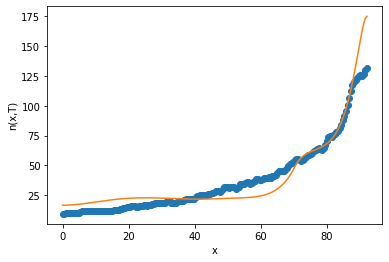

after perturb [6.856179781342247, 225.41438455531056, 28696.813375401838, 0.45361387989127144, 17.267690391159718]
parameters [6.856179781342247, 225.41438455531056, 28696.813375401838, 0.45361387989127144, 17.267690391159718]
after perturb [9.506053973904008, 111.3655981408913, 25857.657393744234, 0.1609106056152537, 32.749439657355744]
parameters [9.506053973904008, 111.3655981408913, 25857.657393744234, 0.1609106056152537, 32.749439657355744]
oxigeno [1.50126736e-04 1.50095922e-04 1.50003857e-04 1.49851666e-04
 1.49641220e-04 1.49375127e-04 1.49056724e-04 1.48690060e-04
 1.48279882e-04 1.47831620e-04 1.47351369e-04 1.46845864e-04
 1.46322471e-04 1.45789160e-04 1.45254491e-04 1.44727596e-04
 1.44218167e-04 1.43736444e-04 1.43293205e-04 1.42899762e-04
 1.42567960e-04 1.42310183e-04 1.42139358e-04 1.42068971e-04
 1.42113084e-04 1.42286362e-04 1.42604098e-04 1.43082255e-04
 1.43737501e-04 1.44587263e-04 1.45649778e-04 1.46944153e-04
 1.48490433e-04 1.50309677e-04 1.52424035e-04 1.548568

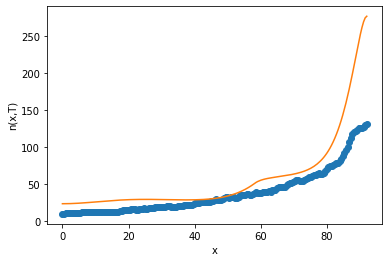

after perturb [9.342919989246464, 147.21795131183586, 29967.607330998966, 0.36616312651010224, 16.98246670064991]
parameters [9.342919989246464, 147.21795131183586, 29967.607330998966, 0.36616312651010224, 16.98246670064991]
after perturb [8.37070737726886, 69.37432914363487, 28048.26470486276, 0.39983749796229906, 43.18473956002503]
parameters [8.37070737726886, 69.37432914363487, 28048.26470486276, 0.39983749796229906, 43.18473956002503]
oxigeno [4.81211766e-09 4.80782173e-09 4.79497122e-09 4.77367757e-09
 4.74412525e-09 4.70656990e-09 4.66133585e-09 4.60881302e-09
 4.54945350e-09 4.48376768e-09 4.41232039e-09 4.33572688e-09
 4.25464914e-09 4.16979246e-09 4.08190259e-09 3.99176361e-09
 3.90019672e-09 3.80806012e-09 3.71625016e-09 3.62570401e-09
 3.53740396e-09 3.45238368e-09 3.37173648e-09 3.29662605e-09
 3.22829974e-09 3.16810479e-09 3.11750786e-09 3.07811817e-09
 3.05171481e-09 3.04027865e-09 3.04602950e-09 3.07146923e-09
 3.11943160e-09 3.19313976e-09 3.29627256e-09 3.43304075e-09

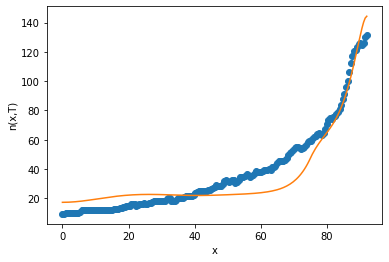

after perturb [8.846728580076176, 101.0604618335924, 18590.61982274984, 0.4272312482692098, 18.247104342523023]
parameters [8.846728580076176, 101.0604618335924, 18590.61982274984, 0.4272312482692098, 18.247104342523023]
after perturb [12.331416806274609, 124.21700495520587, 24339.63547535786, 0.26288378475769886, 25.723635158155922]
parameters [12.331416806274609, 124.21700495520587, 24339.63547535786, 0.26288378475769886, 25.723635158155922]
after perturb [5.5578024319039905, 103.743330857163, 24680.0156682135, 0.36944919798101783, 34.81176562288998]
parameters [5.5578024319039905, 103.743330857163, 24680.0156682135, 0.36944919798101783, 34.81176562288998]
oxigeno [2.33559338e-08 2.33952321e-08 2.35137652e-08 2.37134543e-08
 2.39975221e-08 2.43705251e-08 2.48383990e-08 2.54085189e-08
 2.60897747e-08 2.68926639e-08 2.78294024e-08 2.89140561e-08
 3.01626941e-08 3.15935678e-08 3.32273164e-08 3.50872031e-08
 3.71993854e-08 3.95932225e-08 4.23016237e-08 4.53614440e-08
 4.88139300e-08 5.27

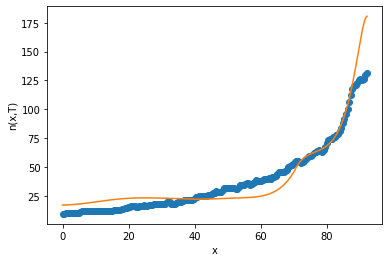

after perturb [9.798040955806716, 49.020102700056555, 27162.171416963163, 0.18063813100555842, 23.501785869307803]
parameters [9.798040955806716, 49.020102700056555, 27162.171416963163, 0.18063813100555842, 23.501785869307803]
oxigeno [4.45835573e-05 4.45518442e-05 4.44568980e-05 4.42992962e-05
 4.40799930e-05 4.38003083e-05 4.34619115e-05 4.30668020e-05
 4.26172854e-05 4.21159475e-05 4.15656247e-05 4.09693732e-05
 4.03304364e-05 3.96522110e-05 3.89382133e-05 3.81920453e-05
 3.74173615e-05 3.66178374e-05 3.57971381e-05 3.49588904e-05
 3.41066563e-05 3.32439082e-05 3.23740083e-05 3.15001890e-05
 3.06255372e-05 2.97529804e-05 2.88852764e-05 2.80250048e-05
 2.71745615e-05 2.63361552e-05 2.55118066e-05 2.47033491e-05
 2.39124314e-05 2.31405224e-05 2.23889168e-05 2.16587423e-05
 2.09509683e-05 2.02664147e-05 1.96057626e-05 1.89695645e-05
 1.83582565e-05 1.77721693e-05 1.72115410e-05 1.66765294e-05
 1.61672246e-05 1.56836623e-05 1.52258370e-05 1.47937151e-05
 1.43872489e-05 1.40063903e-05 1.

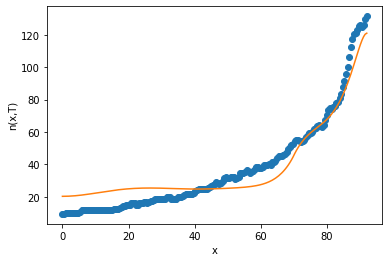

after perturb [2.0175180602727396, 145.51520134963226, 27231.657775238236, 0.48404741305677795, 33.3399500299873]
parameters [2.0175180602727396, 145.51520134963226, 27231.657775238236, 0.48404741305677795, 33.3399500299873]
oxigeno [2.97068155e-08 2.98352624e-08 3.02218803e-08 3.08705156e-08
 3.17876268e-08 3.29823572e-08 3.44666367e-08 3.62553140e-08
 3.83663196e-08 4.08208612e-08 4.36436526e-08 4.68631789e-08
 5.05119991e-08 5.46270909e-08 5.92502403e-08 6.44284829e-08
 7.02146018e-08 7.66676924e-08 8.38538029e-08 9.18466620e-08
 1.00728506e-07 1.10591016e-07 1.21536384e-07 1.33678501e-07
 1.47144304e-07 1.62075262e-07 1.78629028e-07 1.96981263e-07
 2.17327640e-07 2.39886052e-07 2.64899051e-07 2.92636534e-07
 3.23398728e-07 3.57519502e-07 3.95370039e-07 4.37362905e-07
 4.83956534e-07 5.35660145e-07 5.93039077e-07 6.56720568e-07
 7.27399930e-07 8.05847164e-07 8.92913997e-07 9.89541412e-07
 1.09676774e-06 1.21573742e-06 1.34771064e-06 1.49407396e-06
 1.65635226e-06 1.83622217e-06 2.03

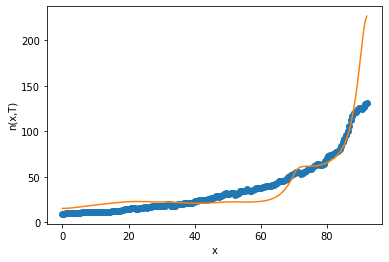

after perturb [9.504275284810975, 74.20669988031716, 19758.730835369028, 0.15943339865683728, 18.893929073238596]
parameters [9.504275284810975, 74.20669988031716, 19758.730835369028, 0.15943339865683728, 18.893929073238596]
after perturb [6.401375186645475, 131.634842675571, 30396.638411370557, 0.3466454315758235, 29.65307875869892]
parameters [6.401375186645475, 131.634842675571, 30396.638411370557, 0.3466454315758235, 29.65307875869892]
after perturb [6.190662566463882, 130.70910847215612, 25270.99929728602, 0.4905734257355011, 22.364365435655]
parameters [6.190662566463882, 130.70910847215612, 25270.99929728602, 0.4905734257355011, 22.364365435655]
oxigeno [8.77875580e-09 8.82533752e-09 8.96559066e-09 9.20104574e-09
 9.53427569e-09 9.96892918e-09 1.05097779e-08 1.11627780e-08
 1.19351475e-08 1.28354586e-08 1.38737481e-08 1.50616461e-08
 1.64125250e-08 1.79416700e-08 1.96664737e-08 2.16066582e-08
 2.37845246e-08 2.62252367e-08 2.89571391e-08 3.20121161e-08
 3.54259944e-08 3.92389951

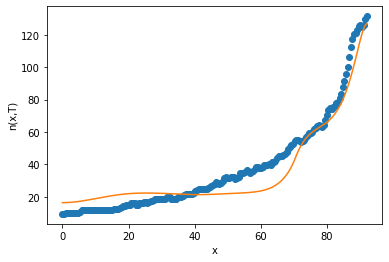

after perturb [7.489479705908178, 202.41164234422257, 26838.338515887746, 0.6160661832102479, 30.23435403093125]
parameters [7.489479705908178, 202.41164234422257, 26838.338515887746, 0.6160661832102479, 30.23435403093125]
after perturb [10.256825874107356, 135.55889766343506, 17739.36361370475, 0.44529472339285986, 28.96693912989811]
parameters [10.256825874107356, 135.55889766343506, 17739.36361370475, 0.44529472339285986, 28.96693912989811]
after perturb [7.910144202909125, 59.319370096574836, 29350.387492817164, 0.2202650562528823, 25.929314446884906]
parameters [7.910144202909125, 59.319370096574836, 29350.387492817164, 0.2202650562528823, 25.929314446884906]
after perturb [5.159886241998786, 170.25333596401785, 26362.762821367298, 0.6429473328405098, 28.474586968739626]
parameters [5.159886241998786, 170.25333596401785, 26362.762821367298, 0.6429473328405098, 28.474586968739626]
after perturb [9.157983415337702, 152.3383804349583, 24333.064268606016, 0.4163002717891445, 6.6176926

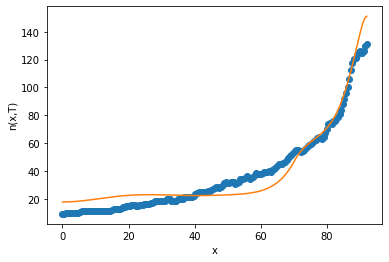

12
after perturb [7.476729452592889, 142.0181357474611, 27401.616346737846, 0.3358760357353444, 14.30491612416421]
parameters [7.476729452592889, 142.0181357474611, 27401.616346737846, 0.3358760357353444, 14.30491612416421]
oxigeno [4.79289257e-07 4.80878605e-07 4.85658484e-07 4.93664497e-07
 5.04956336e-07 5.19618300e-07 5.37760035e-07 5.59517496e-07
 5.85054135e-07 6.14562320e-07 6.48265003e-07 6.86417655e-07
 7.29310459e-07 7.77270800e-07 8.30666070e-07 8.89906784e-07
 9.55450067e-07 1.02780351e-06 1.10752943e-06 1.19524959e-06
 1.29165037e-06 1.39748843e-06 1.51359701e-06 1.64089276e-06
 1.78038321e-06 1.93317496e-06 2.10048269e-06 2.28363885e-06
 2.48410438e-06 2.70348027e-06 2.94352022e-06 3.20614435e-06
 3.49345418e-06 3.80774882e-06 4.15154261e-06 4.52758422e-06
 4.93887736e-06 5.38870328e-06 5.88064504e-06 6.41861396e-06
 7.00687805e-06 7.65009296e-06 8.35333538e-06 9.12213921e-06
 9.96253464e-06 1.08810905e-05 1.18849600e-05 1.29819303e-05
 1.41804757e-05 1.54898160e-05 1.691

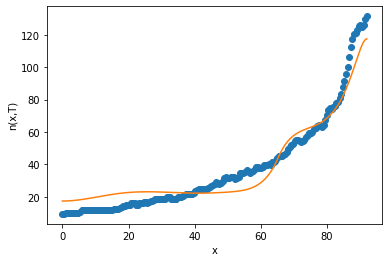

13
after perturb [8.65246780230576, 52.44384088182163, 26641.21208346629, 0.1116307971440905, 10.034366295312871]
parameters [8.65246780230576, 52.44384088182163, 26641.21208346629, 0.1116307971440905, 10.034366295312871]
oxigeno [7.35984187e-04 7.35608203e-04 7.34482314e-04 7.32612681e-04
 7.30009498e-04 7.26686875e-04 7.22662681e-04 7.17958349e-04
 7.12598646e-04 7.06611409e-04 7.00027257e-04 6.92879282e-04
 6.85202729e-04 6.77034653e-04 6.68413590e-04 6.59379212e-04
 6.49972000e-04 6.40232915e-04 6.30203094e-04 6.19923551e-04
 6.09434908e-04 5.98777140e-04 5.87989344e-04 5.77109540e-04
 5.66174481e-04 5.55219506e-04 5.44278403e-04 5.33383304e-04
 5.22564601e-04 5.11850884e-04 5.01268902e-04 4.90843541e-04
 4.80597822e-04 4.70552917e-04 4.60728181e-04 4.51141193e-04
 4.41807821e-04 4.32742288e-04 4.23957254e-04 4.15463907e-04
 4.07272067e-04 3.99390285e-04 3.91825966e-04 3.84585484e-04
 3.77674312e-04 3.71097151e-04 3.64858071e-04 3.58960649e-04
 3.53408114e-04 3.48203504e-04 3.43349

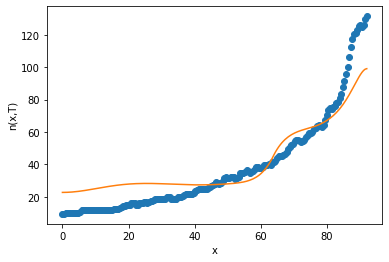

after perturb [9.265832050859382, 80.45238343332593, 24616.622154983797, 0.2501286518266021, 33.096232650378]
parameters [9.265832050859382, 80.45238343332593, 24616.622154983797, 0.2501286518266021, 33.096232650378]
oxigeno [2.35096256e-06 2.34957859e-06 2.34543609e-06 2.33856328e-06
 2.32900687e-06 2.31683174e-06 2.30212035e-06 2.28497210e-06
 2.26550251e-06 2.24384239e-06 2.22013690e-06 2.19454450e-06
 2.16723601e-06 2.13839357e-06 2.10820970e-06 2.07688636e-06
 2.04463415e-06 2.01167159e-06 1.97822453e-06 1.94452575e-06
 1.91081467e-06 1.87733733e-06 1.84434654e-06 1.81210225e-06
 1.78087222e-06 1.75093285e-06 1.72257045e-06 1.69608260e-06
 1.67178002e-06 1.64998860e-06 1.63105189e-06 1.61533388e-06
 1.60322225e-06 1.59513191e-06 1.59150912e-06 1.59283597e-06
 1.59963544e-06 1.61247697e-06 1.63198263e-06 1.65883393e-06
 1.69377936e-06 1.73764263e-06 1.79133178e-06 1.85584920e-06
 1.93230260e-06 2.02191710e-06 2.12604851e-06 2.24619788e-06
 2.38402749e-06 2.54137842e-06 2.72028982e-

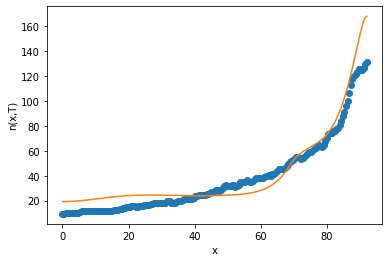

after perturb [2.728773243817356, 102.42025558559588, 30923.652427905614, 0.2712117093282927, 28.91213376463762]
parameters [2.728773243817356, 102.42025558559588, 30923.652427905614, 0.2712117093282927, 28.91213376463762]
after perturb [1.7533540477668703, 89.76383890059864, 25578.834907502867, 0.4498167580549282, 31.78819410871587]
parameters [1.7533540477668703, 89.76383890059864, 25578.834907502867, 0.4498167580549282, 31.78819410871587]
oxigeno [9.29726434e-10 9.30620804e-10 9.33342346e-10 9.38006412e-10
 9.44805490e-10 9.54009740e-10 9.65968071e-10 9.81110040e-10
 9.99948854e-10 1.02308575e-09 1.05121600e-09 1.08513677e-09
 1.12575697e-09 1.17410941e-09 1.23136534e-09 1.29885181e-09
 1.37807198e-09 1.47072912e-09 1.57875451e-09 1.70434012e-09
 1.84997665e-09 2.01849779e-09 2.21313145e-09 2.43755901e-09
 2.69598332e-09 2.99320653e-09 3.33471886e-09 3.72679935e-09
 4.17663028e-09 4.69242704e-09 5.28358586e-09 5.96085223e-09
 6.73651374e-09 7.62462117e-09 8.64124243e-09 9.80475381e-

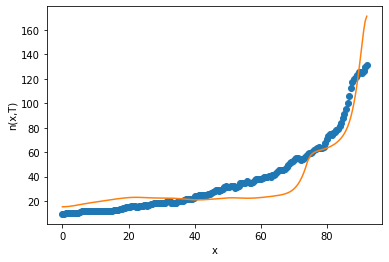

after perturb [8.9408457829755, 25.543031556145202, 24912.804658567402, -0.004271559109778528, 24.041949763865087]
parameters [8.9408457829755, 25.543031556145202, 24912.804658567402, -0.004271559109778528, 24.041949763865087]
after perturb [11.554274541766889, 100.43405477800557, 33308.96614892296, 0.13165260035006005, 23.500513738701553]
parameters [11.554274541766889, 100.43405477800557, 33308.96614892296, 0.13165260035006005, 23.500513738701553]
after perturb [8.868346265211871, 124.20259928093851, 26590.517735567686, 0.5725508694194432, 39.474822388194276]
parameters [8.868346265211871, 124.20259928093851, 26590.517735567686, 0.5725508694194432, 39.474822388194276]
oxigeno [1.01960687e-09 1.02623188e-09 1.04619343e-09 1.07975245e-09
 1.12734808e-09 1.18960416e-09 1.26733850e-09 1.36157495e-09
 1.47355854e-09 1.60477395e-09 1.75696750e-09 1.93217306e-09
 2.13274220e-09 2.36137916e-09 2.62118098e-09 2.91568359e-09
 3.24891436e-09 3.62545210e-09 4.05049516e-09 4.52993884e-09
 5.07046

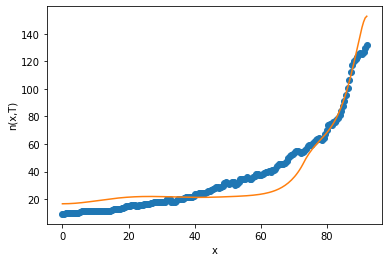

after perturb [2.2988769181272044, 220.04060974271056, 28314.467159886175, 0.6013048539315373, 31.146814077831095]
parameters [2.2988769181272044, 220.04060974271056, 28314.467159886175, 0.6013048539315373, 31.146814077831095]
after perturb [3.7136960343897805, 83.8653969170168, 23788.127694789317, 0.42867933815603465, 31.580535221913465]
parameters [3.7136960343897805, 83.8653969170168, 23788.127694789317, 0.42867933815603465, 31.580535221913465]
oxigeno [1.64909425e-09 1.64879096e-09 1.64791618e-09 1.64657530e-09
 1.64494415e-09 1.64326946e-09 1.64186954e-09 1.64113548e-09
 1.64153290e-09 1.64360458e-09 1.64797413e-09 1.65535087e-09
 1.66653627e-09 1.68243217e-09 1.70405103e-09 1.73252850e-09
 1.76913867e-09 1.81531229e-09 1.87265829e-09 1.94298921e-09
 2.02835071e-09 2.13105606e-09 2.25372594e-09 2.39933448e-09
 2.57126226e-09 2.77335725e-09 3.01000492e-09 3.28620845e-09
 3.60768088e-09 3.98095042e-09 4.41348107e-09 4.91381032e-09
 5.49170650e-09 6.15834814e-09 6.92652852e-09 7.8108

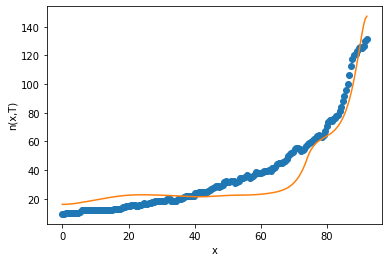

after perturb [8.982494906271727, 145.84801641970418, 28123.128266561722, 0.5384370168523778, 28.406349580625783]
parameters [8.982494906271727, 145.84801641970418, 28123.128266561722, 0.5384370168523778, 28.406349580625783]
oxigeno [1.18697899e-08 1.19305269e-08 1.21133661e-08 1.24202003e-08
 1.28542092e-08 1.34198982e-08 1.41231524e-08 1.49713082e-08
 1.59732412e-08 1.71394736e-08 1.84823010e-08 2.00159402e-08
 2.17567004e-08 2.37231793e-08 2.59364867e-08 2.84204977e-08
 3.12021387e-08 3.43117106e-08 3.77832508e-08 4.16549399e-08
 4.59695576e-08 5.07749917e-08 5.61248083e-08 6.20788870e-08
 6.87041304e-08 7.60752542e-08 8.42756684e-08 9.33984569e-08
 1.03547468e-07 1.14838530e-07 1.27400792e-07 1.41378229e-07
 1.56931300e-07 1.74238792e-07 1.93499868e-07 2.14936336e-07
 2.38795160e-07 2.65351246e-07 2.94910527e-07 3.27813378e-07
 3.64438388e-07 4.05206541e-07 4.50585834e-07 5.01096384e-07
 5.57316068e-07 6.19886759e-07 6.89521204e-07 7.67010628e-07
 8.53233121e-07 9.49162894e-07 1.05

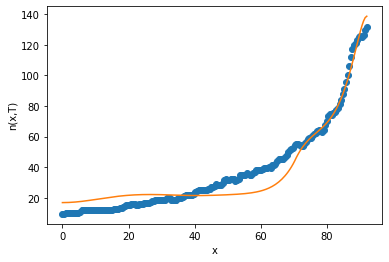

14
after perturb [9.070665013587186, 65.73066488034684, 27790.3376614875, 0.10439962455946716, 27.178902498673732]
parameters [9.070665013587186, 65.73066488034684, 27790.3376614875, 0.10439962455946716, 27.178902498673732]
oxigeno [2.11883221e-03 2.11787302e-03 2.11500050e-03 2.11022975e-03
 2.10358575e-03 2.09510311e-03 2.08482570e-03 2.07280618e-03
 2.05910549e-03 2.04379222e-03 2.02694197e-03 2.00863657e-03
 1.98896338e-03 1.96801446e-03 1.94588582e-03 1.92267657e-03
 1.89848819e-03 1.87342370e-03 1.84758699e-03 1.82108207e-03
 1.79401243e-03 1.76648048e-03 1.73858693e-03 1.71043036e-03
 1.68210676e-03 1.65370918e-03 1.62532742e-03 1.59704778e-03
 1.56895285e-03 1.54112142e-03 1.51362840e-03 1.48654473e-03
 1.45993748e-03 1.43386988e-03 1.40840142e-03 1.38358802e-03
 1.35948218e-03 1.33613323e-03 1.31358754e-03 1.29188882e-03
 1.27107839e-03 1.25119549e-03 1.23227765e-03 1.21436103e-03
 1.19748077e-03 1.18167142e-03 1.16696728e-03 1.15340289e-03
 1.14101341e-03 1.12983506e-03 1.119

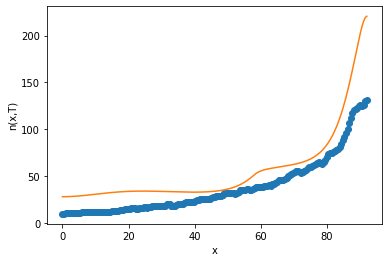

after perturb [9.880096188305455, 103.60390152873528, 29604.536510941518, 0.23547423829292713, 20.395298191878098]
parameters [9.880096188305455, 103.60390152873528, 29604.536510941518, 0.23547423829292713, 20.395298191878098]
after perturb [8.383941808790299, 151.831889650987, 32742.137469640904, 0.39387603298140933, 20.990900763508826]
parameters [8.383941808790299, 151.831889650987, 32742.137469640904, 0.39387603298140933, 20.990900763508826]
after perturb [5.552332904715196, 90.68265242660738, 20016.296668489224, 0.2405434395893527, 15.614031198685801]
parameters [5.552332904715196, 90.68265242660738, 20016.296668489224, 0.2405434395893527, 15.614031198685801]
oxigeno [2.77737399e-06 2.77603146e-06 2.77201851e-06 2.76537891e-06
 2.75618524e-06 2.74453827e-06 2.73056630e-06 2.71442416e-06
 2.69629223e-06 2.67637533e-06 2.65490161e-06 2.63212146e-06
 2.60830652e-06 2.58374878e-06 2.55875993e-06 2.53367089e-06
 2.50883157e-06 2.48461106e-06 2.46139801e-06 2.43960145e-06
 2.41965200e-0

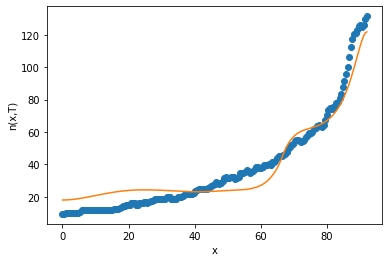

15
after perturb [6.2662367147688744, 130.5471293703974, 31348.34464129839, 0.3663488763677225, 28.088179583886276]
parameters [6.2662367147688744, 130.5471293703974, 31348.34464129839, 0.3663488763677225, 28.088179583886276]
after perturb [7.188690716976496, 89.56461814808492, 27590.57227349314, 0.2190657418795749, 24.36383665561792]
parameters [7.188690716976496, 89.56461814808492, 27590.57227349314, 0.2190657418795749, 24.36383665561792]
oxigeno [8.51863331e-06 8.51450166e-06 8.50214068e-06 8.48165205e-06
 8.45320432e-06 8.41703159e-06 8.37343177e-06 8.32276436e-06
 8.26544789e-06 8.20195720e-06 8.13282039e-06 8.05861584e-06
 7.97996914e-06 7.89755020e-06 7.81207052e-06 7.72428079e-06
 7.63496887e-06 7.54495819e-06 7.45510674e-06 7.36630667e-06
 7.27948442e-06 7.19560176e-06 7.11565742e-06 7.04068959e-06
 6.97177925e-06 6.91005440e-06 6.85669515e-06 6.81293983e-06
 6.78009204e-06 6.75952876e-06 6.75270957e-06 6.76118693e-06
 6.78661776e-06 6.83077620e-06 6.89556773e-06 6.98304471e-0

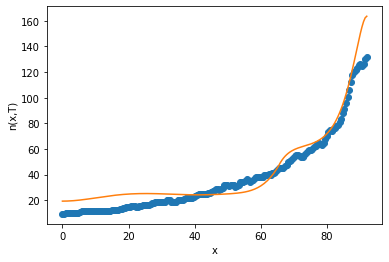

after perturb [5.4780805040007765, 73.28979546694896, 23119.484452565008, 0.37038569386329856, 37.76226559807164]
parameters [5.4780805040007765, 73.28979546694896, 23119.484452565008, 0.37038569386329856, 37.76226559807164]
oxigeno [1.75959037e-08 1.75800259e-08 1.75325451e-08 1.74539170e-08
 1.73448942e-08 1.72065166e-08 1.70400981e-08 1.68472103e-08
 1.66296649e-08 1.63894938e-08 1.61289294e-08 1.58503843e-08
 1.55564328e-08 1.52497943e-08 1.49333186e-08 1.46099756e-08
 1.42828478e-08 1.39551283e-08 1.36301238e-08 1.33112625e-08
 1.30021087e-08 1.27063839e-08 1.24279948e-08 1.21710688e-08
 1.19399980e-08 1.17394920e-08 1.15746408e-08 1.14509876e-08
 1.13746147e-08 1.13522421e-08 1.13913408e-08 1.15002631e-08
 1.16883917e-08 1.19663095e-08 1.23459938e-08 1.28410371e-08
 1.34668984e-08 1.42411892e-08 1.51839988e-08 1.63182626e-08
 1.76701820e-08 1.92697000e-08 2.11510413e-08 2.33533246e-08
 2.59212582e-08 2.89059283e-08 3.23656927e-08 3.63671952e-08
 4.09865154e-08 4.63104717e-08 5.24

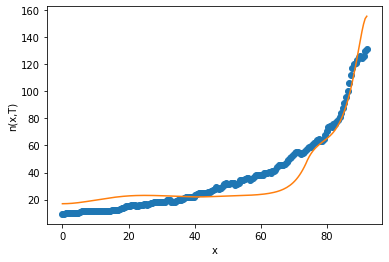

after perturb [4.729679345143083, 93.73761680293984, 27036.257069022966, 0.3239146310747934, 31.688741740962413]
parameters [4.729679345143083, 93.73761680293984, 27036.257069022966, 0.3239146310747934, 31.688741740962413]
oxigeno [1.13998923e-07 1.13972818e-07 1.13895737e-07 1.13771380e-07
 1.13605906e-07 1.13407929e-07 1.13188509e-07 1.12961147e-07
 1.12741790e-07 1.12548843e-07 1.12403204e-07 1.12328309e-07
 1.12350215e-07 1.12497704e-07 1.12802426e-07 1.13299091e-07
 1.14025693e-07 1.15023796e-07 1.16338878e-07 1.18020726e-07
 1.20123912e-07 1.22708336e-07 1.25839850e-07 1.29590973e-07
 1.34041702e-07 1.39280427e-07 1.45404967e-07 1.52523726e-07
 1.60756997e-07 1.70238413e-07 1.81116576e-07 1.93556862e-07
 2.07743445e-07 2.23881528e-07 2.42199844e-07 2.62953411e-07
 2.86426599e-07 3.12936520e-07 3.42836784e-07 3.76521653e-07
 4.14430632e-07 4.57053548e-07 5.04936157e-07 5.58686348e-07
 6.18980993e-07 6.86573520e-07 7.62302288e-07 8.47099842e-07
 9.42003157e-07 1.04816496e-06 1.1668

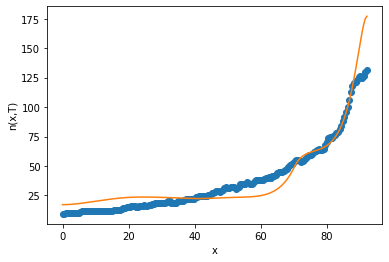

after perturb [6.990781836693408, 109.59883189986773, 22843.427971100533, 0.5732312694010788, 37.88043899141465]
parameters [6.990781836693408, 109.59883189986773, 22843.427971100533, 0.5732312694010788, 37.88043899141465]
oxigeno [2.20058062e-10 2.21693103e-10 2.26622992e-10 2.34922456e-10
 2.46717455e-10 2.62187340e-10 2.81567913e-10 3.05155467e-10
 3.33311853e-10 3.66470678e-10 4.05144735e-10 4.49934799e-10
 5.01539940e-10 5.60769535e-10 6.28557189e-10 7.05976803e-10
 7.94261086e-10 8.94822809e-10 1.00927920e-09 1.13947986e-09
 1.28753877e-09 1.45587081e-09 1.64723356e-09 1.86477496e-09
 2.11208778e-09 2.39327170e-09 2.71300412e-09 3.07662085e-09
 3.49020797e-09 3.96070654e-09 4.49603161e-09 5.10520768e-09
 5.79852270e-09 6.58770300e-09 7.48611202e-09 8.50897592e-09
 9.67363954e-09 1.09998567e-08 1.25101192e-08 1.42300300e-08
 1.61887253e-08 1.84193530e-08 2.09596136e-08 2.38523729e-08
 2.71463544e-08 3.08969219e-08 3.51669649e-08 4.00278982e-08
 4.55607912e-08 5.18576432e-08 5.9022

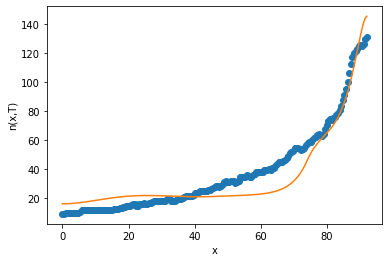

after perturb [12.53930156248001, 39.35059008247664, 26078.943955579674, 0.2041111401336115, 32.7829834398202]
parameters [12.53930156248001, 39.35059008247664, 26078.943955579674, 0.2041111401336115, 32.7829834398202]
after perturb [3.263386221148906, 68.62435630973484, 27618.45487400754, 0.24228422622356596, 36.62115460214181]
parameters [3.263386221148906, 68.62435630973484, 27618.45487400754, 0.24228422622356596, 36.62115460214181]
oxigeno [4.36250977e-06 4.35866658e-06 4.34717170e-06 4.32812842e-06
 4.30170614e-06 4.26813641e-06 4.22770766e-06 4.18075882e-06
 4.12767226e-06 4.06886620e-06 4.00478694e-06 3.93590130e-06
 3.86268937e-06 3.78563784e-06 3.70523414e-06 3.62196131e-06
 3.53629379e-06 3.44869413e-06 3.35961045e-06 3.26947471e-06
 3.17870163e-06 3.08768818e-06 2.99681354e-06 2.90643940e-06
 2.81691059e-06 2.72855592e-06 2.64168916e-06 2.55661026e-06
 2.47360655e-06 2.39295429e-06 2.31492014e-06 2.23976298e-06
 2.16773577e-06 2.09908775e-06 2.03406675e-06 1.97292186e-06
 1.

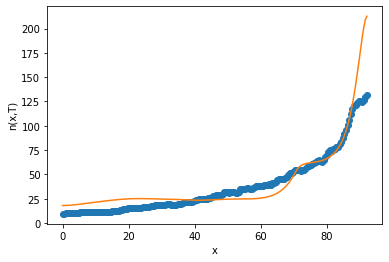

after perturb [5.708078156478479, 144.9184534860667, 23650.80040480036, 0.3206865975151766, 17.88475035080745]
parameters [5.708078156478479, 144.9184534860667, 23650.80040480036, 0.3206865975151766, 17.88475035080745]
oxigeno [8.46832991e-07 8.49345441e-07 8.56900541e-07 8.69551684e-07
 8.87388357e-07 9.10536891e-07 9.39161510e-07 9.73465704e-07
 1.01369390e-06 1.06013351e-06 1.11311723e-06 1.17302582e-06
 1.24029114e-06 1.31539967e-06 1.39889642e-06 1.49138924e-06
 1.59355372e-06 1.70613851e-06 1.82997123e-06 1.96596495e-06
 2.11512540e-06 2.27855875e-06 2.45748025e-06 2.65322361e-06
 2.86725125e-06 3.10116555e-06 3.35672105e-06 3.63583772e-06
 3.94061543e-06 4.27334965e-06 4.63654841e-06 5.03295080e-06
 5.46554683e-06 5.93759904e-06 6.45266571e-06 7.01462600e-06
 7.62770702e-06 8.29651295e-06 9.02605652e-06 9.82179279e-06
 1.06896556e-05 1.16360968e-05 1.26681285e-05 1.37933686e-05
 1.50200897e-05 1.63572720e-05 1.78146605e-05 1.94028264e-05
 2.11332331e-05 2.30183082e-05 2.50715209

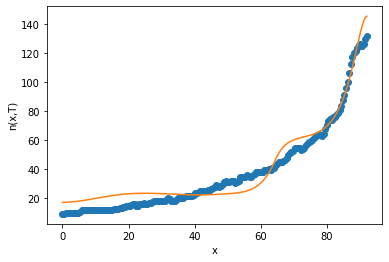

16
after perturb [2.476835080627979, 103.24796768575266, 27316.740285413576, 0.3878130356194024, 27.7949714035158]
parameters [2.476835080627979, 103.24796768575266, 27316.740285413576, 0.3878130356194024, 27.7949714035158]
oxigeno [1.27581273e-08 1.27835398e-08 1.28602268e-08 1.29895407e-08
 1.31737478e-08 1.34160475e-08 1.37206001e-08 1.40925640e-08
 1.45381439e-08 1.50646513e-08 1.56805779e-08 1.63956848e-08
 1.72211087e-08 1.81694863e-08 1.92551009e-08 2.04940519e-08
 2.19044505e-08 2.35066453e-08 2.53234806e-08 2.73805915e-08
 2.97067404e-08 3.23341994e-08 3.52991839e-08 3.86423433e-08
 4.24093148e-08 4.66513474e-08 5.14260025e-08 5.67979417e-08
 6.28398085e-08 6.96332170e-08 7.72698577e-08 8.58527349e-08
 9.54975503e-08 1.06334248e-07 1.18508737e-07 1.32184814e-07
 1.47546290e-07 1.64799362e-07 1.84175218e-07 2.05932923e-07
 2.30362586e-07 2.57788842e-07 2.88574672e-07 3.23125608e-07
 3.61894346e-07 4.05385852e-07 4.54162997e-07 5.08852833e-07
 5.70153584e-07 6.38842469e-07 7.157

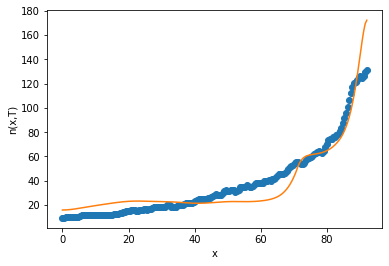

after perturb [11.652643456030768, 111.5201104060749, 22322.618630177913, 0.34893551019618013, 21.86490655998564]
parameters [11.652643456030768, 111.5201104060749, 22322.618630177913, 0.34893551019618013, 21.86490655998564]
after perturb [9.936834805795007, 113.00589999067627, 22803.697394407485, 0.5093379821617159, 36.79231603758236]
parameters [9.936834805795007, 113.00589999067627, 22803.697394407485, 0.5093379821617159, 36.79231603758236]
oxigeno [1.11714055e-09 1.12439147e-09 1.14624116e-09 1.18298183e-09
 1.23510531e-09 1.30331024e-09 1.38851243e-09 1.49185832e-09
 1.61474190e-09 1.75882535e-09 1.92606357e-09 2.11873314e-09
 2.33946605e-09 2.59128872e-09 2.87766690e-09 3.20255720e-09
 3.57046586e-09 3.98651581e-09 4.45652287e-09 4.98708231e-09
 5.58566701e-09 6.26073869e-09 7.02187373e-09 7.87990555e-09
 8.84708553e-09 9.93726471e-09 1.11660990e-08 1.25512807e-08
 1.41127997e-08 1.58732377e-08 1.78581002e-08 2.00961899e-08
 2.26200278e-08 2.54663261e-08 2.86765215e-08 3.22973737

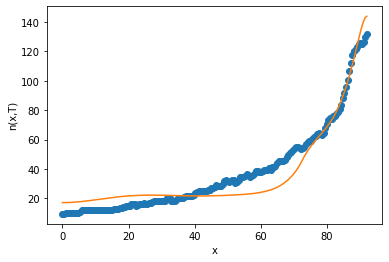

after perturb [8.259388754467148, 38.34953887813481, 25788.597646744736, 0.3946263800239042, 40.86471972963133]
parameters [8.259388754467148, 38.34953887813481, 25788.597646744736, 0.3946263800239042, 40.86471972963133]
oxigeno [7.65516749e-09 7.64470393e-09 7.61341436e-09 7.56160022e-09
 7.48975770e-09 7.39856853e-09 7.28888762e-09 7.16172766e-09
 7.01824130e-09 6.85970143e-09 6.68747988e-09 6.50302535e-09
 6.30784098e-09 6.10346206e-09 5.89143452e-09 5.67329446e-09
 5.45054916e-09 5.22465991e-09 4.99702687e-09 4.76897601e-09
 4.54174844e-09 4.31649180e-09 4.09425411e-09 3.87597957e-09
 3.66250641e-09 3.45456660e-09 3.25278718e-09 3.05769302e-09
 2.86971079e-09 2.68917398e-09 2.51632871e-09 2.35134011e-09
 2.19429923e-09 2.04523007e-09 1.90409688e-09 1.77081131e-09
 1.64523953e-09 1.52720910e-09 1.41651555e-09 1.31292870e-09
 1.21619852e-09 1.12606069e-09 1.04224178e-09 9.64463989e-10
 8.92449670e-10 8.25925479e-10 7.64626324e-10 7.08299153e-10
 6.56706647e-10 6.09630944e-10 5.668774

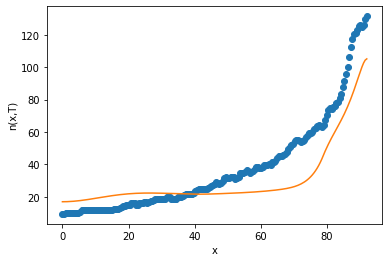

after perturb [4.627767855852751, 168.14444143684256, 30220.423334187162, 0.4838687629419842, 20.18423626640031]
parameters [4.627767855852751, 168.14444143684256, 30220.423334187162, 0.4838687629419842, 20.18423626640031]
after perturb [10.400334655655818, 72.05465749816537, 23208.001085795244, 0.33932861781569323, 22.757157604435612]
parameters [10.400334655655818, 72.05465749816537, 23208.001085795244, 0.33932861781569323, 22.757157604435612]
after perturb [10.324149753987092, 142.589167536106, 23590.162601160424, 0.4634793677704328, 14.702492947425934]
parameters [10.324149753987092, 142.589167536106, 23590.162601160424, 0.4634793677704328, 14.702492947425934]
after perturb [8.898668015219972, 14.53497585398712, 25588.67278366367, 0.13532997131267496, 7.288939554692492]
parameters [8.898668015219972, 14.53497585398712, 25588.67278366367, 0.13532997131267496, 7.288939554692492]
oxigeno [1.61579697e-04 1.61380880e-04 1.60786395e-04 1.59802101e-04
 1.58437643e-04 1.56706269e-04 1.5462

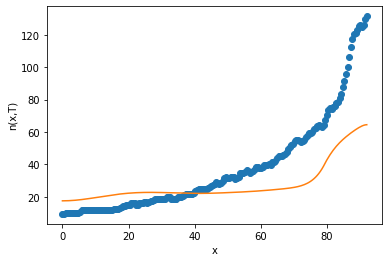

after perturb [7.408265513863292, 24.120713385350577, 26177.802660338624, 0.15361741923626202, 29.766728791472364]
parameters [7.408265513863292, 24.120713385350577, 26177.802660338624, 0.15361741923626202, 29.766728791472364]
oxigeno [1.64859607e-04 1.64681552e-04 1.64148942e-04 1.63266414e-04
 1.62041607e-04 1.60485030e-04 1.58609883e-04 1.56431838e-04
 1.53968779e-04 1.51240518e-04 1.48268490e-04 1.45075429e-04
 1.41685046e-04 1.38121701e-04 1.34410087e-04 1.30574929e-04
 1.26640701e-04 1.22631369e-04 1.18570156e-04 1.14479339e-04
 1.10380079e-04 1.06292278e-04 1.02234467e-04 9.82237218e-05
 9.42756101e-05 9.04041610e-05 8.66218585e-05 8.29396557e-05
 7.93670068e-05 7.59119152e-05 7.25809935e-05 6.93795345e-05
 6.63115899e-05 6.33800553e-05 6.05867584e-05 5.79325500e-05
 5.54173955e-05 5.30404647e-05 5.08002213e-05 4.86945079e-05
 4.67206280e-05 4.48754235e-05 4.31553474e-05 4.15565310e-05
 4.00748460e-05 3.87059607e-05 3.74453907e-05 3.62885445e-05
 3.52307629e-05 3.42673541e-05 3.

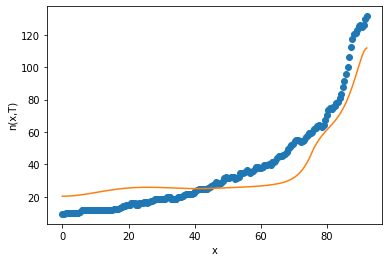

after perturb [4.440148701575822, 75.71910323027456, 26748.098830811236, 0.2145183360583371, 40.24082423652243]
parameters [4.440148701575822, 75.71910323027456, 26748.098830811236, 0.2145183360583371, 40.24082423652243]
oxigeno [1.45412472e-05 1.45308168e-05 1.44996044e-05 1.44478460e-05
 1.43759300e-05 1.42843906e-05 1.41738986e-05 1.40452505e-05
 1.38993558e-05 1.37372228e-05 1.35599442e-05 1.33686822e-05
 1.31646540e-05 1.29491175e-05 1.27233579e-05 1.24886757e-05
 1.22463759e-05 1.19977583e-05 1.17441100e-05 1.14866986e-05
 1.12267672e-05 1.09655311e-05 1.07041752e-05 1.04438529e-05
 1.01856862e-05 9.93076640e-06 9.68015575e-06 9.43489027e-06
 9.19598285e-06 8.96442728e-06 8.74120284e-06 8.52727965e-06
 8.32362467e-06 8.13120834e-06 7.95101205e-06 7.78403636e-06
 7.63131002e-06 7.49389997e-06 7.37292221e-06 7.26955376e-06
 7.18504567e-06 7.12073720e-06 7.07807133e-06 7.05861143e-06
 7.06405957e-06 7.09627614e-06 7.15730127e-06 7.24937791e-06
 7.37497693e-06 7.53682411e-06 7.737929

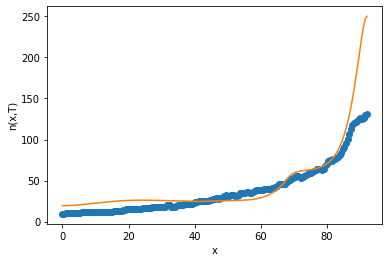

after perturb [11.05514545799233, 38.48017849072066, 23392.40050434169, 0.08242032203677183, 28.36515507177497]
parameters [11.05514545799233, 38.48017849072066, 23392.40050434169, 0.08242032203677183, 28.36515507177497]
after perturb [5.86115412855008, 159.2921473181858, 27769.68596046588, 0.6017731853046956, 40.15641618177919]
parameters [5.86115412855008, 159.2921473181858, 27769.68596046588, 0.6017731853046956, 40.15641618177919]
after perturb [9.498282170234082, 103.89180764534257, 28151.790141205438, 0.24070663341162185, 19.451801766947774]
parameters [9.498282170234082, 103.89180764534257, 28151.790141205438, 0.24070663341162185, 19.451801766947774]
oxigeno [2.93497215e-06 2.93496110e-06 2.93494527e-06 2.93497672e-06
 2.93514226e-06 2.93556370e-06 2.93639807e-06 2.93783794e-06
 2.94011194e-06 2.94348530e-06 2.94826063e-06 2.95477888e-06
 2.96342044e-06 2.97460661e-06 2.98880125e-06 3.00651279e-06
 3.02829662e-06 3.05475783e-06 3.08655440e-06 3.12440091e-06
 3.16907276e-06 3.2214

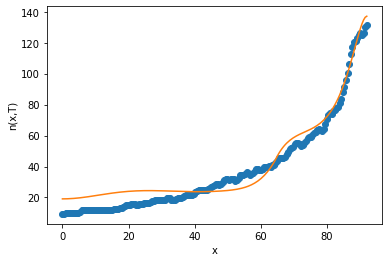

17
after perturb [8.887307338456733, 121.38881051519078, 27852.46957568326, 0.5642176872907542, 23.85790600357046]
parameters [8.887307338456733, 121.38881051519078, 27852.46957568326, 0.5642176872907542, 23.85790600357046]
oxigeno [9.47191091e-10 9.53519290e-10 9.72588779e-10 1.00465552e-09
 1.05015040e-09 1.10968573e-09 1.18406448e-09 1.27429240e-09
 1.38159320e-09 1.50742706e-09 1.65351270e-09 1.82185341e-09
 2.01476737e-09 2.23492284e-09 2.48537859e-09 2.76963041e-09
 3.09166416e-09 3.45601645e-09 3.86784357e-09 4.33299997e-09
 4.85812736e-09 5.45075572e-09 6.11941790e-09 6.87377930e-09
 7.72478470e-09 8.68482440e-09 9.76792202e-09 1.09899467e-08
 1.23688529e-08 1.39249509e-08 1.56812124e-08 1.76636153e-08
 1.99015317e-08 2.24281661e-08 2.52810489e-08 2.85025916e-08
 3.21407124e-08 3.62495401e-08 4.08902050e-08 4.61317292e-08
 5.20520270e-08 5.87390276e-08 6.62919381e-08 7.48226593e-08
 8.44573759e-08 9.53383403e-08 1.07625873e-07 1.21500604e-07
 1.37165989e-07 1.54851125e-07 1.748

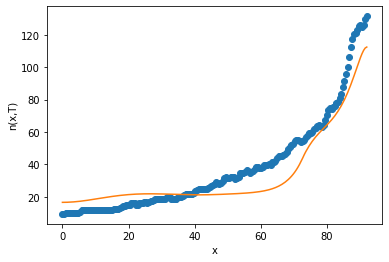

after perturb [2.8533332771973887, 173.561676902704, 26728.371164690223, 0.441199067522862, 14.519619720999689]
parameters [2.8533332771973887, 173.561676902704, 26728.371164690223, 0.441199067522862, 14.519619720999689]
after perturb [0.7106216388941933, 14.397298483191989, 26553.88883631864, -0.051133728448208404, 17.434808449667255]
parameters [0.7106216388941933, 14.397298483191989, 26553.88883631864, -0.051133728448208404, 17.434808449667255]
after perturb [9.64068082480501, 59.23675462113893, 32132.08158189741, 0.22209027121606034, 27.365576687536148]
parameters [9.64068082480501, 59.23675462113893, 32132.08158189741, 0.22209027121606034, 27.365576687536148]
after perturb [8.02913398906764, 54.63493420894025, 28367.888798672877, 0.19118958872421332, 22.37376952469862]
parameters [8.02913398906764, 54.63493420894025, 28367.888798672877, 0.19118958872421332, 22.37376952469862]
oxigeno [2.83056597e-05 2.82851724e-05 2.82238398e-05 2.81220488e-05
 2.79804379e-05 2.77998899e-05 2.7581

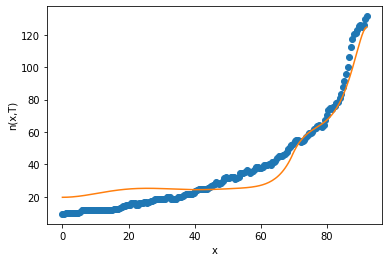

18
after perturb [4.945387599369288, 131.14655310368698, 27869.69883420491, 0.42374956857096086, 27.509817380147226]
parameters [4.945387599369288, 131.14655310368698, 27869.69883420491, 0.42374956857096086, 27.509817380147226]
oxigeno [3.43128529e-08 3.44655837e-08 3.49252527e-08 3.56963075e-08
 3.67862183e-08 3.82055656e-08 3.99681628e-08 4.20912171e-08
 4.45955276e-08 4.75057252e-08 5.08505540e-08 5.46631993e-08
 5.89816635e-08 6.38491955e-08 6.93147772e-08 7.54336730e-08
 8.22680471e-08 8.98876575e-08 9.83706323e-08 1.07804338e-07
 1.18286350e-07 1.29925535e-07 1.42843253e-07 1.57174705e-07
 1.73070422e-07 1.90697927e-07 2.10243572e-07 2.31914586e-07
 2.55941333e-07 2.82579817e-07 3.12114451e-07 3.44861112e-07
 3.81170513e-07 4.21431922e-07 4.66077250e-07 5.15585553e-07
 5.70487982e-07 6.31373217e-07 6.98893433e-07 7.73770847e-07
 8.56804906e-07 9.48880164e-07 1.05097493e-06 1.16417073e-06
 1.28966276e-06 1.42877124e-06 1.58295402e-06 1.75382030e-06
 1.94314577e-06 2.15288927e-06 2

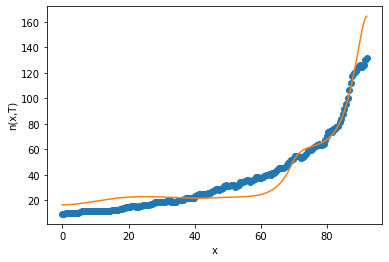

after perturb [10.288841824883136, 71.16849556772816, 30938.774073042172, -0.004719221960780506, 11.449461250658647]
parameters [10.288841824883136, 71.16849556772816, 30938.774073042172, -0.004719221960780506, 11.449461250658647]
after perturb [3.8174851256157116, 7.397020529313508, 29639.159329392718, 0.06828489685672057, 27.33015774659546]
parameters [3.8174851256157116, 7.397020529313508, 29639.159329392718, 0.06828489685672057, 27.33015774659546]
after perturb [6.0826423630146, 97.5804391265375, 30368.05815089892, 0.2122343978115807, 30.09084305345602]
parameters [6.0826423630146, 97.5804391265375, 30368.05815089892, 0.2122343978115807, 30.09084305345602]
after perturb [3.3705637029476136, -0.20051911976696601, 18316.168864709733, 0.12244859714034256, 26.798017860341528]
parameters [3.3705637029476136, -0.20051911976696601, 18316.168864709733, 0.12244859714034256, 26.798017860341528]
after perturb [10.25427591460326, 78.09377730592854, 26949.63186128196, 0.4430918094505242, 37.667

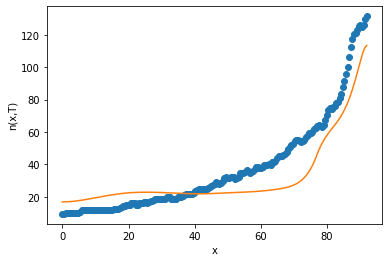

after perturb [6.5422688001637415, 90.11347439188674, 22513.7752963039, 0.19186010513018528, 16.135043482177508]
parameters [6.5422688001637415, 90.11347439188674, 22513.7752963039, 0.19186010513018528, 16.135043482177508]
oxigeno [2.41793180e-05 2.41682222e-05 2.41350215e-05 2.40799754e-05
 2.40035139e-05 2.39062335e-05 2.37888924e-05 2.36524039e-05
 2.34978294e-05 2.33263705e-05 2.31393598e-05 2.29382526e-05
 2.27246180e-05 2.25001299e-05 2.22665590e-05 2.20257654e-05
 2.17796918e-05 2.15303579e-05 2.12798566e-05 2.10303503e-05
 2.07840700e-05 2.05433153e-05 2.03104562e-05 2.00879365e-05
 1.98782794e-05 1.96840941e-05 1.95080855e-05 1.93530643e-05
 1.92219605e-05 1.91178380e-05 1.90439113e-05 1.90035649e-05
 1.90003743e-05 1.90381298e-05 1.91208622e-05 1.92528715e-05
 1.94387577e-05 1.96834551e-05 1.99922691e-05 2.03709157e-05
 2.08255657e-05 2.13628908e-05 2.19901145e-05 2.27150669e-05
 2.35462435e-05 2.44928687e-05 2.55649648e-05 2.67734256e-05
 2.81300958e-05 2.96478573e-05 3.1340

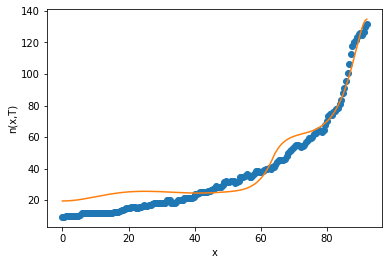

19
after perturb [10.659946034466675, 32.637374870332806, 20752.756973822325, 0.20428131735819063, 21.61762911445264]
parameters [10.659946034466675, 32.637374870332806, 20752.756973822325, 0.20428131735819063, 21.61762911445264]
after perturb [6.264713029367492, 58.74266314278465, 21457.15119089939, 0.2782691474009556, 28.192876145367908]
parameters [6.264713029367492, 58.74266314278465, 21457.15119089939, 0.2782691474009556, 28.192876145367908]
oxigeno [7.61224781e-07 7.60525909e-07 7.58434564e-07 7.54966486e-07
 7.50147620e-07 7.44013710e-07 7.36609732e-07 7.27989202e-07
 7.18213369e-07 7.07350320e-07 6.95474016e-07 6.82663291e-07
 6.69000824e-07 6.54572127e-07 6.39464548e-07 6.23766326e-07
 6.07565701e-07 5.90950092e-07 5.74005369e-07 5.56815201e-07
 5.39460501e-07 5.22018963e-07 5.04564697e-07 4.87167947e-07
 4.69894901e-07 4.52807587e-07 4.35963838e-07 4.19417342e-07
 4.03217753e-07 3.87410870e-07 3.72038873e-07 3.57140623e-07
 3.42752010e-07 3.28906353e-07 3.15634861e-07 3.02967

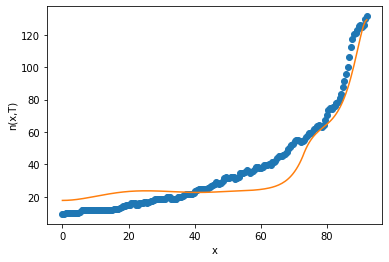

after perturb [3.306639969678718, 169.78982955654155, 29541.620524346294, 0.5529363011699098, 27.04953550190536]
parameters [3.306639969678718, 169.78982955654155, 29541.620524346294, 0.5529363011699098, 27.04953550190536]
after perturb [9.568630943387598, 85.55469990516804, 33587.154507865984, 0.18806649001788373, 25.744724597062003]
parameters [9.568630943387598, 85.55469990516804, 33587.154507865984, 0.18806649001788373, 25.744724597062003]
after perturb [7.844387668016324, 48.707555364220674, 22013.34861814233, 0.08669268295174493, 28.074245260437376]
parameters [7.844387668016324, 48.707555364220674, 22013.34861814233, 0.08669268295174493, 28.074245260437376]
oxigeno [5.40379995e-03 5.40089662e-03 5.39220423e-03 5.37777539e-03
 5.35769705e-03 5.33208936e-03 5.30110422e-03 5.26492334e-03
 5.22375611e-03 5.17783706e-03 5.12742314e-03 5.07279091e-03
 5.01423345e-03 4.95205738e-03 4.88657971e-03 4.81812490e-03
 4.74702186e-03 4.67360120e-03 4.59819250e-03 4.52112196e-03
 4.44271004e-0

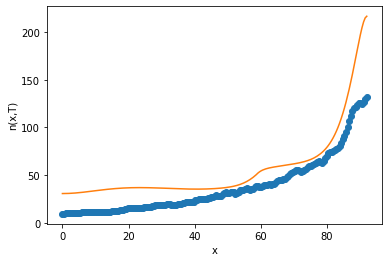

after perturb [3.465228601547687, 165.93342369314792, 27202.16226808717, 0.3621164795903083, 20.77859550178079]
parameters [3.465228601547687, 165.93342369314792, 27202.16226808717, 0.3621164795903083, 20.77859550178079]
after perturb [7.13432192148791, 61.28130253121398, 21754.775755355528, 0.20009339620168567, 26.038647665611535]
parameters [7.13432192148791, 61.28130253121398, 21754.775755355528, 0.20009339620168567, 26.038647665611535]
oxigeno [2.09909971e-05 2.09760375e-05 2.09312545e-05 2.08569344e-05
 2.07535501e-05 2.06217547e-05 2.04623727e-05 2.02763893e-05
 2.00649379e-05 1.98292855e-05 1.95708176e-05 1.92910220e-05
 1.89914717e-05 1.86738081e-05 1.83397237e-05 1.79909463e-05
 1.76292224e-05 1.72563026e-05 1.68739277e-05 1.64838160e-05
 1.60876515e-05 1.56870746e-05 1.52836729e-05 1.48789744e-05
 1.44744416e-05 1.40714672e-05 1.36713708e-05 1.32753978e-05
 1.28847178e-05 1.25004263e-05 1.21235452e-05 1.17550264e-05
 1.13957546e-05 1.10465522e-05 1.07081840e-05 1.03813638e-05

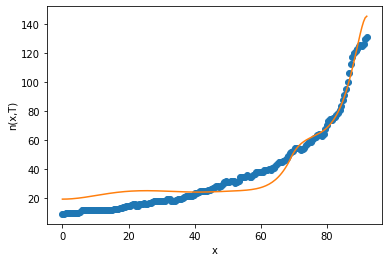

20


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [ ]:
sample,weight,dist,data2=principal(epsilons,params_tumor,20,datosdia6)

In [ ]:

print("min accepted distance: ",np.min(dist[-1,:]))
print("median accepted distance: ",np.median(dist[-1,:]))
#print("median evaluated distance: ",np.median(evaluated_distances))


min accepted distance:  91.6776667950097
median accepted distance:  105.85017470820225


In [ ]:
sample[-1,:][0]

[4.863335282515884, 76.61710943048116, 23135.783574618297, 4.356839580423227]

In [ ]:

parameters1= [4.76495877028727, 60.26189054205727, 21996.413967220353, 0.4375711944973535]
parameters2= [5.33584494610712, 73.43027191926723, 24865.310802173808, 0.4067019878331559]
parameters3= [4.649337183907758, 86.27453651399162, 25413.68990399871, 0.5690724364331393]
parameters4= [5.484697901262502, 52.82237178774688, 24042.75079371846, 0.37276522120751276]
parameters5= [4.829888155940412, 80.50026876348845, 28285.7324806885, 0.5259556488822889]

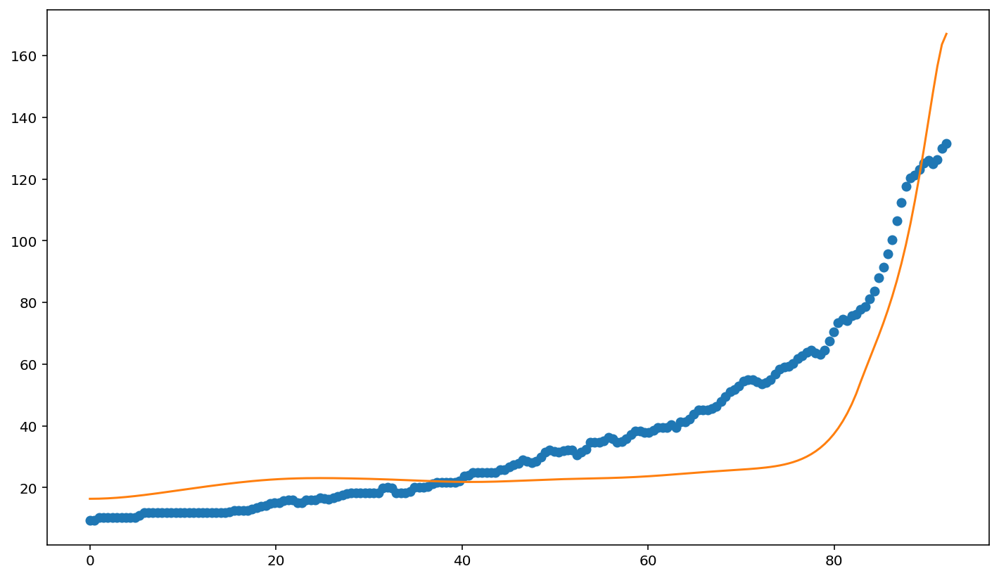

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters1[0],parameters1[1],parameters1[2],U,L,parameters1[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

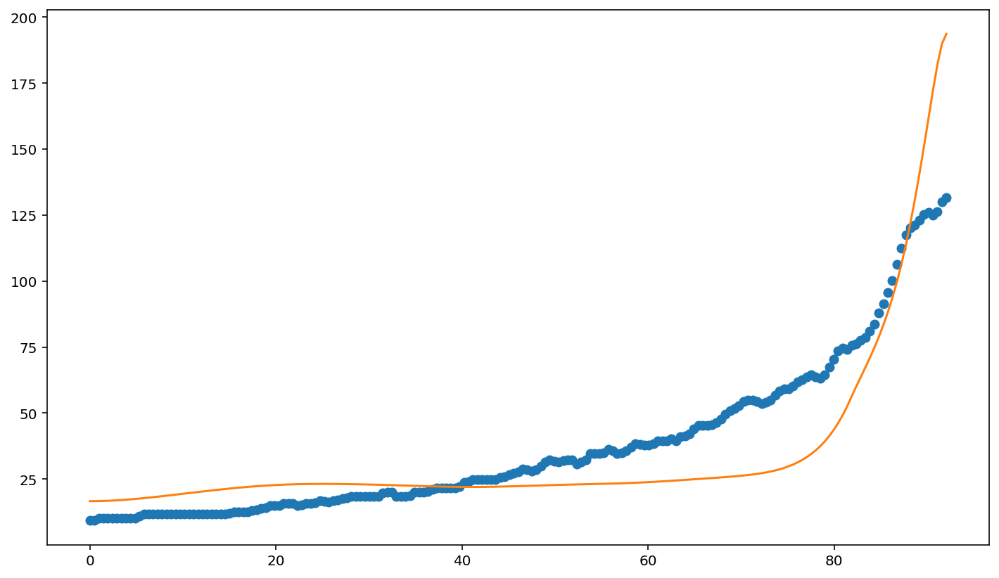

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters2[0],parameters2[1],parameters2[2],U,L,parameters2[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

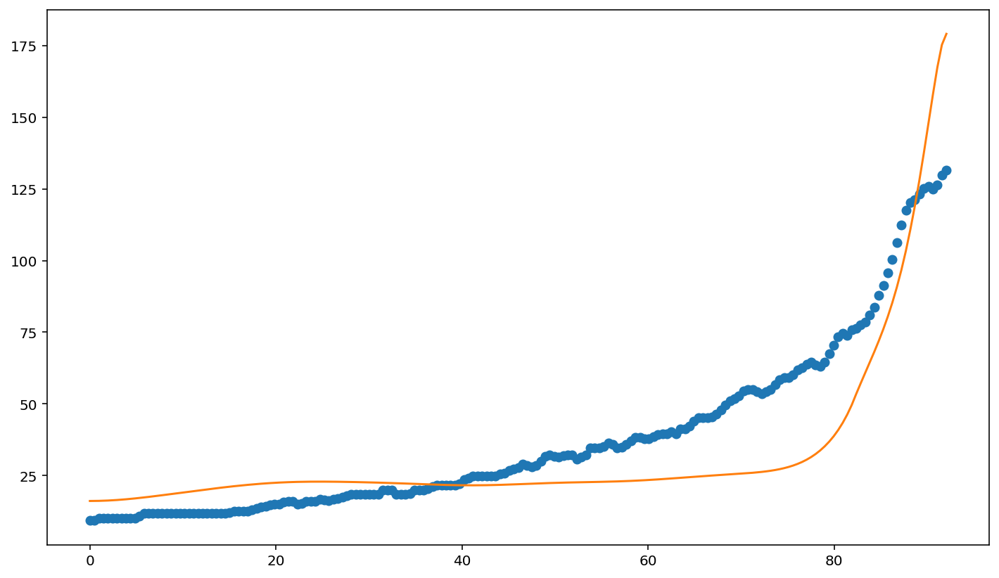

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters3[0],parameters3[1],parameters3[2],U,L,parameters3[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

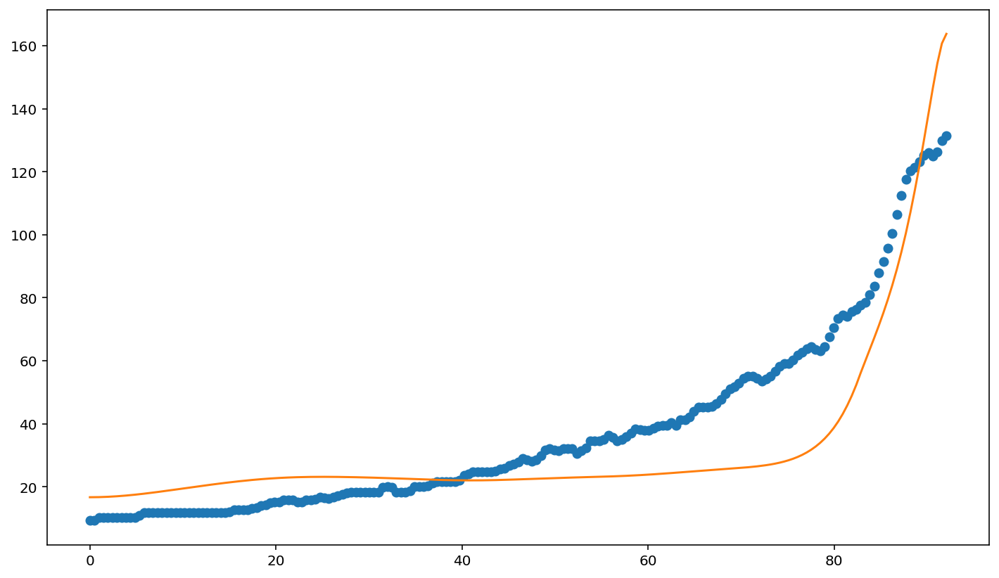

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters4[0],parameters4[1],parameters4[2],U,L,parameters4[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

In [ ]:

par1=[9.542115041431442, 138.12769149357993, 20374.91871033417, 0.3529896285883195, 20.627110075559848]
par2= [8.977198121778752, 124.34165241109605, 20926.58463434697, 0.3305063600502939, 21.224913287022822]
par3= [9.937055517726058, 146.1198643886011, 24672.41030598811, 0.3707739270618551, 20.565197804458247]
par4= [9.672139624093901, 140.98449800335067, 21274.20787613278, 0.3798661916938315, 20.218438649322177]
par5= [9.6544176104716, 149.99488182164566, 26315.829609330478, 0.39574501019744424, 21.407054852869276]
par6= [8.85512822812634, 147.0164538638214, 24847.972695971286, 0.3262684571188478, 17.474140500239752]
par7= [9.424891788943592, 123.52419347497441, 24551.449505433215, 0.30441856727513794, 19.304792427624754]
par8= [7.169050737146994, 135.4964100095985, 22672.85901271742, 0.31560832552030593, 17.369097754944335]
par9= [7.5735153056475, 127.99292914013344, 25027.049968416755, 0.32948057803795194, 20.03638395982498]
par10= [9.836782337165578, 147.0445204077636, 23976.491896002433, 0.34893437180734843, 17.600854984490653]
par11= [8.619221168987565, 116.65737075618758, 23320.488888419903, 0.272220131083114, 18.010989260562262]
par12= [9.860236598961002, 142.91642917513707, 21493.205421622548, 0.3258169821542492, 20.38220463141539]
par13= [8.245915665746406, 148.75208004617403, 23963.294817646107, 0.30302627939732973, 15.70796778230624]
par14= [8.957062078342158, 133.0402607500506, 20173.804540671863, 0.36402378548979414, 20.989631475180467]
par15= [9.342654002288441, 138.96400374800973, 23141.82406515041, 0.298901504531119, 17.753125456818985]
par16= [8.932273718927215, 141.21396045851245, 25201.738604667225, 0.34382126709570937, 20.989583729352965]
par17= [9.040868048757805, 146.37577558039808, 20785.5079169435, 0.4048133924166488, 20.940674882289752]
par18= [7.868015071384048, 132.27649769146413, 20333.012779031178, 0.32894770057717004, 19.011936427243754]
par19= [9.104386520353337, 147.5032342442898, 20263.066289908267, 0.41818189026022323, 22.355672631997578]
par20= [9.865718175738118, 131.09556411135665, 20096.490783504745, 0.34696581403814725, 22.09563711712623]




AttributeError: ignored

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,6.457921078526728,63.48150698619373,20184.084434494922,U,L, 0.32259112576927973,36.75737147800398)).T
plt.plot(x_grid,data2[:,0])
plt.show()

NameError: ignored

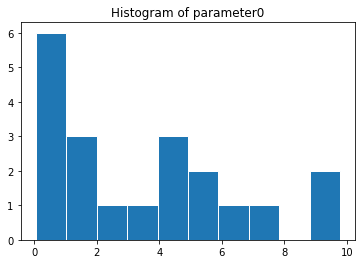

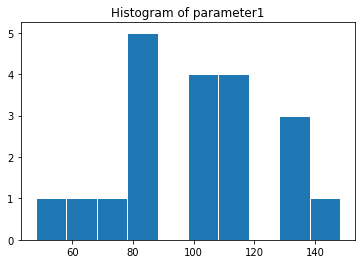

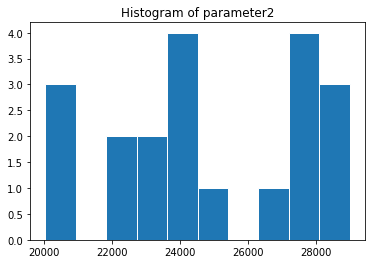

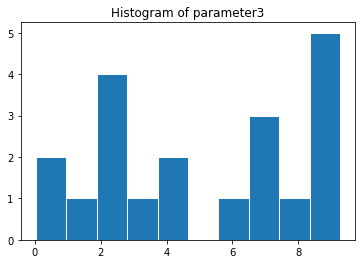

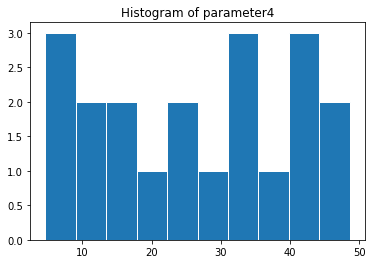

...

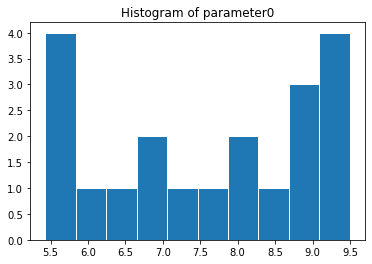

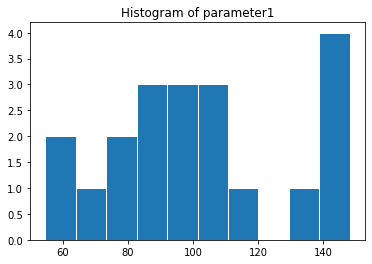

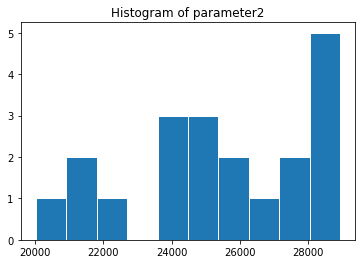

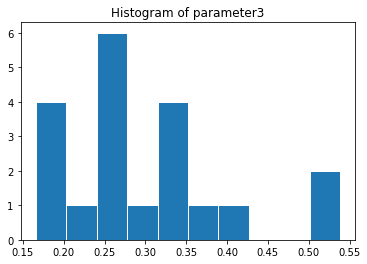

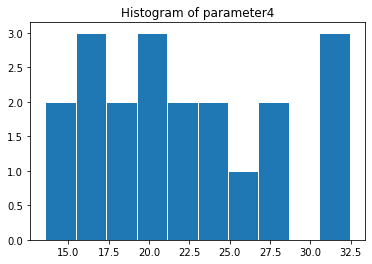

In [ ]:
for k in range(len(epsilons)):
    for j in range(len(params_tumor)):
        plt.figure()
        b=[]
        for i in sample[k,:]:
            b.append(i[j])
        al=np.histogram(b)
        n,bins,patches=plt.hist(b,edgecolor='white')
        plt.title('Histogram of parameter'+str(j))
    plt.show()
plt.show()


In [ ]:
mindis=np.min(dist[-1,:])
mindis

91.6776667950097

In [ ]:
maxdis=np.max(dist)
np.where(dist==mindis)

(array([7]), array([16]))

In [ ]:
maxdis

4281.408060591355

In [ ]:
dist[-1,:]

array([105.23123316,  99.85386292, 107.91173694, 113.50672921,
       112.96498422,  95.6632536 , 110.76329111, 106.08987368,
        92.76611399, 113.7454498 , 109.27042476, 107.48806368,
       104.10055414, 104.92840416, 110.14805665,  94.3456348 ,
        91.6776668 , 113.34855108, 101.03181633, 105.61047574])

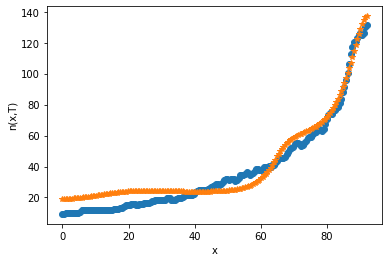

In [ ]:
from traitlets.traitlets import CRegExp
plt.figure()
plt.plot(x_grid,datosdia6,'*')
data2=np.array(crank_nic(fu,g,9.498282170234082,103.89180764534257, 28151.790141205438,U,L, 0.24070663341162185,19.451801766947774)).T
plt.plot(x_grid,data2[:,0],'*')
plt.xlabel('x')
plt.ylabel('n(x,T)')
plt.show()


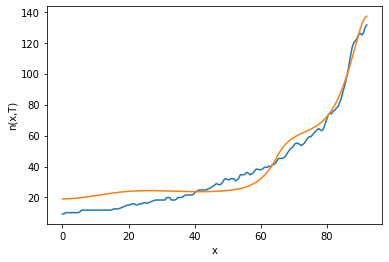

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6)
plt.plot(x_grid,data2[:,0])
plt.xlabel('x')
plt.ylabel('n(x,T)')
plt.show()

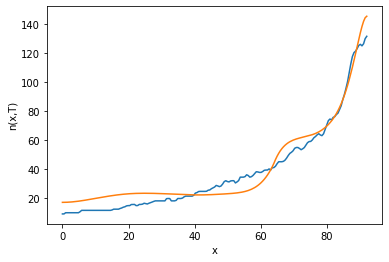

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6)
data2=np.array(crank_nic(fu,g,5.708078156478479, 144.9184534860667, 23650.80040480036,U,L, 0.3206865975151766, 17.88475035080745)).T
plt.plot(x_grid,data2[:,0])
plt.xlabel('x')
plt.ylabel('n(x,T)')
plt.show()